In [1]:
import numpy as np
import pandas as pd
from keras.models import load_model
from keras.preprocessing import sequence
import matplotlib.pyplot as plt
import tensorflow as tf
import cupy as cp
import matplotlib.pyplot as plt

Using TensorFlow backend.
/home/lab606a/.virtualenvs/keras/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:523: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/lab606a/.virtualenvs/keras/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:524: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/lab606a/.virtualenvs/keras/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:525: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/home/lab606a/.virtualenvs

In [2]:
class Listener:
    def __init__(self):
        self.__time_step = 9
        self.__tmp = cp.zeros([1,3])
        self.__arr_classification = cp.zeros([1,90])
        self.__vis_point = cp.zeros((1,3))
        self.__vis_balls = cp.zeros((self.__time_step,3))
        self.__vis_balls2 = cp.zeros((1,4))
        self.__predction_balls = cp.zeros((1,self.__time_step,3))
        self.__arr_prediction = cp.zeros([1,self.__time_step*3])
        self.__arr_pred_possible = cp.zeros((1,4))
        self.__diff = cp.zeros([1,3])
        self.__padding_done = False
        self.__cnt = 1
        self.__num = 1
        self.__max_index = 0
        self.__coor = -10*cp.ones(6)
        self.__find_possible_point = False
        self.__cal_possible_point = False
        self.__vis_possible_point = False
        self.__vis_hitting_point = cp.zeros((1,4))
        self.__hitting_point = -45
        self.__hitting_timimg = 0
        self.__possible_point = cp.zeros((1,4))
        self.__pred = cp.zeros([1,self.__time_step,3])
        self.__pred_for_offline = cp.zeros([1,self.__time_step,3])
        self.__time = 0.016667
        self.__delta_T = 0.016667
        self.__anchor = 0
        self.__rowww = 0
        self.__direction = 'top6'
        self.traj_done = False
        #self.fig, self.ax = plt.subplots(2,2, figsize=(10.24,7.2))
	#self.__name = sys.argv[1]
        self.__csv_path = '/home/lab606a/catkin_ws/src/pointcloud/offline/'
        #self.__model = load_model('/home/lab606a/catkin_ws/src/pointcloud/models/60hz_culstm/prediction_top6')
        self.__classifier = load_model('/home/lab606a/catkin_ws/src/pointcloud/models/not_fixed/classification_not_fixed')
        #rospy.loginfo("loaded classification model")
        self.__pred_top5 = load_model('/home/lab606a/Documents/model comparison/not fixed model/saved model/500_data/prediction_not_fixed_top5')
        self.__pred_top6 = load_model('/home/lab606a/Documents/model comparison/not fixed model/saved model/500_data/prediction_not_fixed_top6')
        #rospy.loginfo("loaded top prediction model")
        self.__pred_left5 = load_model('/home/lab606a/Documents/model comparison/not fixed model/saved model/500_data/prediction_not_fixed_left5')
        self.__pred_left6 = load_model('/home/lab606a/Documents/model comparison/not fixed model/saved model/500_data/prediction_not_fixed_left6')
        #rospy.loginfo("loaded left prediction model")
        self.__pred_right5 = load_model('/home/lab606a/Documents/model comparison/not fixed model/saved model/500_data/prediction_not_fixed_right5')
        self.__pred_right6 = load_model('/home/lab606a/Documents/model comparison/not fixed model/saved model/500_data/prediction_not_fixed_right6')
        #rospy.loginfo("loaded right prediction model")
        self.__pred_back5 = load_model('/home/lab606a/Documents/model comparison/not fixed model/saved model/500_data/prediction_not_fixed_back5')
        self.__pred_back6 = load_model('/home/lab606a/Documents/model comparison/not fixed model/saved model/500_data/prediction_not_fixed_back6')
        #rospy.loginfo("loaded back prediction model")
        #rospy.loginfo("Load not fixed model with classification")

    ## print spin direction and speed
    def top5(self):
        print("top spin speed 5")
        self.__model = self.__pred_top5
        self.__direction = '_top5'

    def top6(self):
        print("top spin speed 6")
        self.__model = self.__pred_top6
        self.__direction = '_top6'

    def left5(self):
        print("left spin speed 5")
        self.__model = self.__pred_left5
        self.__direction = '_left5'

    def left6(self):
        print("left spin speed 6")
        self.__model = self.__pred_left6
        self.__direction = '_left6'

    def right5(self):
        print("right spin speed 5")
        self.__model = self.__pred_right5
        self.__direction = '_right5'

    def right6(self):
        print("right spin speed 6")
        self.__model = self.__pred_right6
        self.__direction = '_right6'

    def back5(self):
        print("back spin speed 5")
        self.__model = self.__pred_back5
        self.__direction = '_back5'

    def back6(self):
        print("back spin speed 6")
        self.__model = self.__pred_back6
        self.__direction = '_back6'
        
    def append_pred(self): ## Exhaustive
        self.__pred = cp.array(self.__model.predict(cp.asnumpy(self.__arr_prediction.reshape(1,self.__time_step,3)), verbose=1))
        while not self.__find_possible_point == True:
            self.__pred = cp.array(self.__pred)
            if ( -50 < float(cp.min(self.__pred[self.__pred.shape[0]-1,:,:])) < -40): ## find possible hitting point
                index = cp.argmin(self.__pred[self.__pred.shape[0]-1,:,:])
                row = int((index-1)/3)
                count_down = row + (self.__pred.shape[0]-1)*9
                self.__find_possible_point = True
                self.__anchor = self.__pred.shape[0]-1
                print("count down = ", int(count_down))
                #index = cp.argmin(self.__anchor[self.__anchor,:,:])
                #row = int((index-1)/3)
                self.__pred[self.__anchor, row+1:, :] = 0
                self.__pred_for_offline = self.__pred

            else: ## predict next time step
                self.__pred = cp.vstack((self.__pred, cp.zeros([1,self.__time_step,3])))
                self.__pred[self.__pred.shape[0]-1,:,:] = cp.array(self.__model.predict(cp.asnumpy(self.__pred[self.__pred.shape[0]-2,:,:].reshape(1,self.__time_step,3)), verbose=1)).reshape(self.__time_step,3)
                if (self.__pred.shape[0] >= 8):
                    self.__pred = cp.zeros([1,self.__time_step,3])
                    self.__find_possible_point = True
                
    def update_prediction(self):
        self.__pred[0,:,:] = cp.array(self.__model.predict(cp.asnumpy(self.__arr_prediction.reshape(1,self.__time_step,3)), verbose=1)).reshape(self.__time_step,3)
        for i in range(1, self.__pred.shape[0]):
            self.__pred[i,:,:] = cp.array(self.__model.predict(cp.asnumpy(self.__pred[i-1,:,:].reshape(1,self.__time_step,3)), verbose=1)).reshape(self.__time_step,3)

    def modify(self):
        #index = cp.argmin(self.__pred[self.__anchor,:,:])
        #row = int((index-1)/3)
        if (self.__rowww < 8):
            self.__pred[self.__anchor, self.__rowww+1:, :] = 0
        if (self.__anchor != self.__pred.shape[0]-1):
            self.__pred[self.__anchor+1:, :, :] = 0
        if (self.__anchor == 0) and (self.__rowww == 0) and ( -10 < float(cp.min(self.__pred[self.__anchor,0,:])) < 10):
            self.__pred[self.__anchor,0,:] = 0
        self.__pred_for_offline = cp.vstack((self.__pred_for_offline, self.__pred))
        #self.pub_prediction()

    def calculate_hitting_point(self, arr):
        #print("cnt = ", self.__cnt)
        arr = cp.array(arr)
        self.__cal_possible_point = False
        while not self.__cal_possible_point == True:
            print(arr[self.__anchor,:,:])
            if (-55 <= float(cp.min(arr[self.__anchor,:,:])) <= -35) and (self.__anchor >= 0):
                #print("anchor = ", self.__anchor)
                index = cp.argmin(arr[self.__anchor,:,:])
                row = int((index-1)/3)
                self.__rowww = row
                if (-55 <= float(cp.min(arr[self.__anchor,:,:])) <= self.__hitting_point): ## interpolation
                    index = cp.argmin(arr[self.__anchor,:,:])
                    row = int((index-1)/3)
                    self.__rowww = row
                    count_down = row + self.__anchor*9
                    print("count down = ", count_down)
                    if (row == 0):
                        print("case a1")
                        self.__vis_point = cp.array(self.__vis_point)
                        w1 = (self.__hitting_point-self.__vis_point[:,1]) / (arr[self.__anchor,row,1]-self.__vis_point[:,1])
                        self.__possible_point = w1*arr[self.__anchor,row,:] + (1-w1)*self.__vis_point.reshape(1,1,3)
                        self.__hitting_timimg = self.__time + (w1+count_down)*self.__delta_T
                        self.__possible_point = cp.hstack((self.__hitting_timimg, self.__possible_point.reshape(3,)))

                        #w1 = (arr[self.__anchor,row,1]-self.__hitting_point) / (arr[self.__anchor,row,1]-arr[self.__anchor-1,self.__time_step-1,1])
                        #self.__possible_point = w1*arr[self.__anchor-1,self.__time_step-1,:] + (1-w1)*arr[self.__anchor,row,:]
                        #self.__hitting_timimg = self.__time + (w1+count_down)*self.__delta_T
                        #self.__possible_point = cp.hstack((self.__hitting_timimg, self.__possible_point.reshape(3,)))
                        print("hitting timing and position = ", self.__possible_point)
                    else:
                        print("case a2")
                        w1 = (arr[self.__anchor,row,1]-self.__hitting_point) / (arr[self.__anchor,row,1]-arr[self.__anchor,row-1,1])
                        self.__possible_point = w1*arr[self.__anchor,row-1,:] + (1-w1)*arr[self.__anchor,row,:]
                        self.__hitting_timimg = self.__time + (w1+count_down)*self.__delta_T
                        self.__possible_point = cp.hstack((self.__hitting_timimg, self.__possible_point.reshape(3,)))
                        print("hitting timing and position = ", self.__possible_point)
                elif (self.__hitting_point < float(cp.min(arr[self.__anchor,:,:])) <= -40):
                    index = cp.argmin(arr[self.__anchor,:,:])
                    row = int((index-1)/3)
                    self.__rowww = row
                    count_down = row + self.__anchor*9
                    print("count down = ", count_down)
                    if (row == 0):
                        print("case b1")
                        if (self.__diff[:,1] > 0):
                            w1 = (arr[self.__anchor,row,1]-self.__hitting_point) / self.__diff[:,1]
                            if w1 < 1:
                                self.__possible_point = arr[self.__anchor,row,:] - w1*self.__diff
                                self.__hitting_timimg = self.__time + (count_down+1+w1)*self.__delta_T
                                self.__possible_point = cp.hstack((self.__hitting_timimg, self.__possible_point.reshape(3,)))
                                print("hitting timing and position = ", self.__possible_point)
                    else:
                        print("case b2")
                        self.__diff = arr[self.__anchor,row-1,:]-arr[self.__anchor,row,:]
                        self.__diff = self.__diff.reshape(1,3)
                        w1 = (arr[self.__anchor,row,1]-self.__hitting_point) / self.__diff[:,1]
                        if w1 < 1:
                            self.__possible_point = arr[self.__anchor,row,:] - w1*self.__diff
                            self.__hitting_timimg = self.__time + (count_down+1+w1)*self.__delta_T
                            self.__possible_point = cp.hstack((self.__hitting_timimg, self.__possible_point.reshape(3,)))
                            print("hitting timing and position = ", self.__possible_point)
                else:
                    self.__possible_point = self.__possible_point

                self.__cal_possible_point = True
                #self.pub_prediction()
                '''
                if (row < 8):
                    arr[self.__anchor, row+1:, :] = 0
                if (self.__anchor != self.__pred.shape[0]-1):
                    arr[self.__anchor+1:, :, :] = 0
                if (self.__anchor == 0) and ( -10 < float(cp.min(arr[self.__anchor,0,:])) < 10):
                    arr[self.__anchor,0,:] = 0
                '''
                #self.__pred_for_offline = cp.vstack((self.__pred_for_offline, arr))
                #self.__cnt += 1
                if (self.__arr_pred_possible.shape[0] == 1) and (int(self.__arr_pred_possible[0,2]) == 0):
                    self.__arr_pred_possible = self.__possible_point.reshape(1,4)
                else:
                    self.__arr_pred_possible = cp.vstack((self.__arr_pred_possible, self.__possible_point.reshape(1,4)))
            else:
                if ((self.__anchor-1) >= 0) and (abs(float(cp.min(arr[self.__anchor,:,:]))-self.__hitting_point) >= 22.5):
                    self.__anchor = self.__anchor -1
                    #print("case c1")
                else:
                    self.__cal_possible_point = True

    def calculate_vis_hitting_point(self):
        if (-50 <= float(cp.min(self.__vis_balls2)) <= self.__hitting_point):
            index = cp.argmin(self.__vis_balls2)
            row = int((index-1)/4)
            w1 = (self.__vis_balls2[row,2]-self.__hitting_point) / (self.__vis_balls2[row,2]-self.__vis_balls2[row-1,2])
            self.__vis_hitting_point = (1-w1)*self.__vis_balls2[row,:] + w1*self.__vis_balls2[row-1,:]
        elif (self.__hitting_point < float(cp.min(self.__vis_balls2)) < -40):
            index = cp.argmin(self.__vis_balls2)
            row = int((index-1)/4)
            w1 = (self.__vis_balls2[row,2]-self.__hitting_point) / (self.__vis_balls2[row-1,2]-self.__vis_balls2[row,2])
            self.__vis_hitting_point = self.__vis_balls2[row,:] - w1*(self.__vis_balls2[row-1,:]-self.__vis_balls2[row,:])
        #print("vis hitting point = ", self.__vis_hitting_point)


    def show_spin_direction(self, max_index):
        ## make dictionary to replace switch case
        dictionary = {0:self.top5, 1:self.top6, 2:self.left5, 3:self.left6, 4:self.right5, 5:self.right6, 6:self.back5, 7:self.back6}
        funcToCall = dictionary[max_index]
        funcToCall()

        if (self.__pred.shape[0] == 1):
            self.append_pred() ## Exhaustive
        elif (self.__pred.shape[0] > 1):
            self.update_prediction() ## update prediction result
            self.calculate_hitting_point(self.__pred) ## calculate hitting timimg and hitting point
            self.modify()

    def classification(self):
        ## call classifier
        classes = self.__classifier.predict(cp.asnumpy(self.__arr_classification.reshape(1,30,3)), verbose=1)
        print(classes)
        ## figure out which direction is
        self.__max_index = np.argmax(classes)
        #print("number of input balls = ", self.__cnt)
        ## show result
        if (self.__cnt >= 9):
            self.show_spin_direction(self.__max_index)
        #self.__cnt += 1

    def padding(self):
        # if __tmp is empty, init array
        #print("paddinggg")
        if (self.__padding_done == False):
            self.__tmp = self.__vis_point ## pad first point
            self.__padding_done = True
            self.__vis_balls = self.__vis_point.reshape(1,3)
        else:
        # if __tmp is not empty, then filled array
            self.__tmp = cp.hstack((self.__tmp, self.__vis_point))
            self.__vis_balls = cp.vstack((self.__vis_balls, self.__vis_point))
            if (self.__tmp.shape[1] == 15): ## when colect 5 balls
                self.__arr_classification[:,:self.__tmp.shape[1]] = self.__tmp ## asigne to classification input array
            #print("shape of tmp = \n", self.__tmp.shape)
            if (self.__tmp.shape[1] == 27):
                #self.__vis_balls = self.__tmp.reshape(1,self.__time_step,3)
                self.__arr_prediction[:,:] = self.__tmp ## for predct next 5 steps
            if (self.__tmp.shape[1] > 27): ## when colect over 5 balls
                #self.__vis_balls = cp.vstack((self.__vis_balls, self.__tmp[:,self.__tmp.shape[1]-(self.__time_step*3):].reshape(1,self.__time_step,3))) ## visual measurement point for calculate error
                self.__arr_prediction[:,:] = self.__tmp[:,self.__tmp.shape[1]-(self.__time_step*3):] ## rolling visual measurement for predct next 5 steps
                #if (self.__tmp.shape[1] <= 90): ## when colect under 31 balls
                    #self.__arr_classification[:,:self.__tmp.shape[1]] = self.__tmp ## still asigne to classification input array

    def save_data(self):
        visurement_balls = cp.asnumpy(self.__vis_balls)
        pred_trajs = cp.asnumpy(self.__pred_for_offline.reshape(self.__pred_for_offline.shape[0]*self.__pred_for_offline.shape[1], self.__pred_for_offline.shape[2]))

        df_vis = pd.DataFrame(data=visurement_balls)
        df_pred = pd.DataFrame(data=pred_trajs)

        vis_name = self.__csv_path + 'visurement' + str(self.__num) + '.csv'
        pred_name = self.__csv_path + 'prediction' + str(self.__num) + '.csv'

        df_vis.to_csv(vis_name, header=0, index=0)
        df_pred.to_csv(pred_name, header=0, index=0)

    def predict_traj(self):
        #self.__model = self.__prediction_model

        if (self.__pred.shape[0] == 1):
            self.append_pred() ## Exhaustive
        elif (self.__pred.shape[0] > 1):
            self.update_prediction() ## update prediction result
            self.calculate_hitting_point(self.__pred) ## calculate hitting timimg and hitting point
            self.modify()

    def plot_res(self):
        self.__arr_pred_possible = cp.round_(self.__arr_pred_possible, 4)
        self.__vis_hitting_point = cp.round_(self.__vis_hitting_point, 4)

        update_times = cp.linspace(1, self.__arr_pred_possible.shape[0], self.__arr_pred_possible.shape[0])
        t = self.__arr_pred_possible[:,0]
        x = self.__arr_pred_possible[:,1]
        z = self.__arr_pred_possible[:,3]
        Euclidean_vis = cp.sqrt(cp.sum(cp.power(self.__vis_hitting_point[1:],2)))
        Euclidean_pred = cp.sqrt(cp.sum(cp.power(self.__arr_pred_possible[:,1:],2), axis=1))

        plt.figure(figsize=(8,7))

        ## plot hitting timing
        plt.clf()
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(cp.ones((self.__arr_pred_possible.shape[0],))*self.__vis_hitting_point[0]), color='green') #vis
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(t), color='blue') #pred
        plt.scatter(cp.asnumpy(update_times), cp.asnumpy(t), color='blue')
        plt.grid(True)
        plt.xticks(fontsize=14, fontname='FreeSerif')
        plt.yticks(fontsize=14, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('Hitting timimg (sec)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and hitting timing', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = '/home/lab606a/catkin_ws/src/pointcloud/fig/' + str(self.__num) + '_timing' + '.png'
        plt.savefig(name)

        plt.clf()
        err = cp.abs((t-self.__vis_hitting_point[0])*1000)
        plt.bar(cp.asnumpy(update_times), cp.asnumpy(err), color='blue', edgecolor='black', width=0.5)
        plt.xticks(fontsize=18, fontname='FreeSerif')
        plt.yticks(fontsize=18, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('Hitting timimg error (ms)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and hitting timing error', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = '/home/lab606a/catkin_ws/src/pointcloud/fig/' + str(self.__num) + '_timing_error' + '.png'
        plt.savefig(name)

        ## plot Euclidean distance
        plt.clf()
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(cp.ones((self.__arr_pred_possible.shape[0],))*Euclidean_vis), color='green') #vis
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(Euclidean_pred), color='blue') #pred
        plt.scatter(cp.asnumpy(update_times), cp.asnumpy(Euclidean_pred), color='blue')
        plt.grid(True)
        plt.xticks(fontsize=14, fontname='FreeSerif')
        plt.yticks(fontsize=14, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('Euclidean distance (cm)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and Euclidean distance', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = '/home/lab606a/catkin_ws/src/pointcloud/fig/' + str(self.__num) + '_distance' + '.png'
        plt.savefig(name)

        plt.clf()
        err = cp.abs((Euclidean_pred-Euclidean_vis))
        plt.bar(cp.asnumpy(update_times), cp.asnumpy(err), color='blue', edgecolor='black', width=0.5)
        plt.xticks(fontsize=18, fontname='FreeSerif')
        plt.yticks(fontsize=18, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('Euclidean distance error (cm)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and Euclidean distance error', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = '/home/lab606a/catkin_ws/src/pointcloud/fig/' + str(self.__num) + '_distance_error' + '.png'
        plt.savefig(name)

        ## plot x coordinate
        plt.clf()
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(cp.ones((self.__arr_pred_possible.shape[0],))*self.__vis_hitting_point[1]), color='green') #vis
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(x), color='blue') #pred
        plt.scatter(cp.asnumpy(update_times), cp.asnumpy(x), color='blue')
        plt.grid(True)
        plt.xticks(fontsize=14, fontname='FreeSerif')
        plt.yticks(fontsize=14, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('X-coordinate (cm)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and X-coordinate', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = '/home/lab606a/catkin_ws/src/pointcloud/fig/' + str(self.__num) + '_X-coordinate' + '.png'
        plt.savefig(name)

        plt.clf()
        err = cp.abs((x-self.__vis_hitting_point[1]))
        plt.bar(cp.asnumpy(update_times), cp.asnumpy(err), color='blue', edgecolor='black', width=0.5)
        plt.xticks(fontsize=18, fontname='FreeSerif')
        plt.yticks(fontsize=18, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('X-coordinate error (cm)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and X-coordinate error', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = '/home/lab606a/catkin_ws/src/pointcloud/fig/' + str(self.__num) + '_X-coordinate_error' + '.png'
        plt.savefig(name)

        ## plot z coordinate
        plt.clf()
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(cp.ones((self.__arr_pred_possible.shape[0],))*self.__vis_hitting_point[3]), color='green') #vis
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(z), color='blue') #pred
        plt.scatter(cp.asnumpy(update_times), cp.asnumpy(z), color='blue')
        plt.grid(True)
        plt.xticks(fontsize=14, fontname='FreeSerif')
        plt.yticks(fontsize=14, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('Z-coordinate (cm)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and Z-coordinate', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = '/home/lab606a/catkin_ws/src/pointcloud/fig/' + str(self.__num) + '_Z-coordinate' + '.png'
        plt.savefig(name)

        plt.clf()
        err = cp.abs((z-self.__vis_hitting_point[3]))
        plt.bar(cp.asnumpy(update_times), cp.asnumpy(err), color='blue', edgecolor='black', width=0.5)
        plt.xticks(fontsize=18, fontname='FreeSerif')
        plt.yticks(fontsize=18, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('Z-coordinate error (cm)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and Z-coordinate error', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = '/home/lab606a/catkin_ws/src/pointcloud/fig/' + str(self.__num) + '_Z-coordinate_error' + '.png'
        plt.savefig(name)
        
    def return_vis_point(self):
        return self.__vis_hitting_point
    
    def return_pred_res(self):
        return self.__arr_pred_possible
    
    def reset_arr_pred(self):
        self.__arr_pred_possible = cp.zeros((1,4))

    def assigne(self, visss):
        #a = data.data
        self.__vis_point = cp.array(visss).reshape(1,3)
        #print(self.__vis_point)

        if (-50 < self.__vis_point[:,1] < -30):
            tmp = cp.hstack((self.__time, self.__vis_point.reshape(3,)))
            if self.__vis_possible_point == False:
                self.__vis_balls2 = tmp.reshape(1,4)
                self.__vis_possible_point = True
            else:
                self.__vis_balls2 = cp.vstack((self.__vis_balls2, tmp.reshape(1,4)))


        if self.traj_done == False:
            print("\nTime = ", self.__time) ## show current time
            print("visual measurement = ", self.__vis_point) ## show visual measurement coordinate
            self.padding() ## colect 5 balls
            
            if ((self.__tmp.shape[1] >= 15) and (self.__tmp.shape[1] <= 90)): ## while colect balls over 5 balls and under 30 balls
                self.classification() ## doing classification and prediction
            if (self.__tmp.shape[1] > 90): ## while colect balls over 30 balls, stop doing classification
                self.show_spin_direction(self.__max_index) ## skip classification doing prediction
            
            #if (self.__tmp.shape[1] >= 27):
                #self.predict_traj()
            
            #self.for_ttbot()
            self.__time += self.__delta_T
            self.__cnt += 1
            
        else:
            #print("aaaaa")
            if (self.__padding_done == True):
                self.calculate_vis_hitting_point()
                #print("pred hitting point = \n", self.__arr_pred_possible)
                #if (self.__pred_for_offline.shape[0] != 1):
                    #self.plot_error()
                    #self.plot_res()
                    #self.save_data()
                self.__num += 1

            self.__padding_done = False
            self.__arr_classification = cp.zeros([1,90])
            self.__coor = -10*cp.ones(6)
            self.__vis_balls = cp.zeros((self.__time_step,3))
            self.__cnt = 1
            self.__pred = cp.zeros([1,self.__time_step,3])
            self.__vis_balls2 = cp.zeros((1,4))
            #self.__arr_pred_possible = cp.zeros((1,4))
            self.__find_possible_point = False
            self.__vis_possible_point = False
            self.__pred_for_offline = cp.zeros([1,self.__time_step,3])
            self.__time = 0.016667 ## reset time
            self.traj_done = False

In [3]:
# set GPU memory
gpu_options = tf.GPUOptions(allow_growth=True)
sess = tf.Session(config=tf.ConfigProto(gpu_options=gpu_options))

np.set_printoptions(suppress=True)

In [4]:
obj = Listener()

In [65]:
name = 'back5'

In [66]:
dataset_path = './datasets/split by random for distributed/prediction/' + name + '_test.csv'
print(dataset_path)
dataset = pd.read_csv(dataset_path, header=None)
dataset = dataset.fillna(0)
dataset = np.array(dataset)

./datasets/split by random for distributed/prediction/back5_test.csv


In [67]:
#obj = Listener()
arr_for_vis = np.array([0,0,0,0])
arr_for_pred_3rd = np.array([0,0,0,0])
arr_for_pred_end = np.array([0,0,0,0])

n = 21

arr_for_err_t = np.zeros((1,n))
arr_for_err_x = np.zeros((1,n))
arr_for_err_z = np.zeros((1,n))


for i in range(0,250):
    trajectory = dataset[i,:] ## read trajectory
    trajectory = trajectory.reshape(1,trajectory.shape[0]) ## reshape for padding easily
    ## padding trajectory
    trajectory = sequence.pad_sequences(trajectory, maxlen=trajectory.shape[1]+27, padding='post', dtype='float32')
    trajectory = trajectory.reshape(trajectory.shape[1],) ## reshape for read as vision system easily
    
    for j in range(0, trajectory.shape[0], 3): ## read ball coordinate as vision system
        obj.assigne(trajectory[j:j+3].reshape(1,3))
    obj.traj_done = True ## reset
    obj.assigne(np.array([0,0,0]))
    vis_arr = obj.return_vis_point() ## get vision array
    pred_arr = obj.return_pred_res() ## get prediction array
    #print("")
    print("vis from obj = \n", vis_arr)
    print("pred from obj = \n", pred_arr)
    #arr_for_vis = np.vstack((arr_for_vis, vis_arr))
    #while pred_arr.shape[0] < n:
        #pred_arr = np.vstack(())
    
    if pred_arr.shape[0] >= n: ## update times > n
        #arr_for_vis = np.vstack((arr_for_vis, vis_arr))
        #arr_for_pred_3rd = np.vstack((arr_for_pred_3rd, pred_arr[2,:]))
        #arr_for_pred_end = np.vstack((arr_for_pred_end, pred_arr[(pred_arr.shape[0]-10),:]))
        err = vis_arr - pred_arr ## calculate error
        #print(err.shape)
        err_t = err[:n,0] ## get 
        err_x = err[:n,1]
        err_z = err[:n,3]
        
        arr_for_err_t = np.vstack((arr_for_err_t, err_t))
        arr_for_err_x = np.vstack((arr_for_err_x, err_x))
        arr_for_err_z = np.vstack((arr_for_err_z, err_z))
    #else:
        #print("\n\n aaaaa")
        #print(pred_arr)
    
    obj.reset_arr_pred()



Time =  0.016667
visual measurement =  [[132.463  302.784   42.6384]]

Time =  0.033334
visual measurement =  [[130.166  292.564   43.1545]]

Time =  0.050001000000000004
visual measurement =  [[127.662  280.245   43.7876]]

Time =  0.066668
visual measurement =  [[125.876  273.358   43.3814]]

Time =  0.083335
visual measurement =  [[123.573  261.901   43.7562]]
1/1 [==============================] - 0s 3ms/step
[[0.00018217 0.00029056 0.00012169 0.0001128  0.00040025 0.00035332
  0.99752766 0.00101158]]

Time =  0.10000200000000001
visual measurement =  [[121.012  247.696   44.1883]]
1/1 [==============================] - 0s 2ms/step
[[0.00018217 0.00029056 0.00012169 0.0001128  0.00040025 0.00035332
  0.99752766 0.00101158]]

Time =  0.11666900000000001
visual measurement =  [[118.984  241.701   43.3436]]
1/1 [==============================] - 0s 3ms/step
[[0.00018217 0.00029056 0.00012169 0.0001128  0.00040025 0.00035332
  0.99752766 0.00101158]]

Time =  0.133336
visual measureme

[[0.00018217 0.00029056 0.00012169 0.0001128  0.00040025 0.00035332
  0.99752766 0.00101158]]
back spin speed 5
1/1 [==============================] - 0s 692us/step
[[-0.01905441  0.03641891 -0.00827217]
 [ 0.0275383   0.02019882  0.02321053]
 [-0.01006699  0.01846313  0.01247406]
 [-0.00757599  0.00402451  0.02377129]
 [-0.0174675  -0.01136398  0.02439308]
 [-0.02020645 -0.01556587  0.02404404]
 [-0.01684952 -0.01300049  0.02390862]
 [-0.00955582 -0.0062027   0.02396774]
 [ 0.00026321  0.00334167  0.02424812]]
[[ 66.37447357   0.60856628  20.56435776]
 [ 64.97862244  -5.53568268  21.80038834]
 [ 63.31565094 -10.92273712  22.35634613]
 [ 62.52390289 -17.35590744  23.19726562]
 [ 61.30628204 -23.61045074  23.68714523]
 [ 59.94818878 -29.43129349  23.74925613]
 [ 58.43840408 -35.29462814  23.51357651]
 [ 56.81982422 -40.91376877  23.32688904]
 [ 55.5881691  -46.873806    22.97696304]]
count down =  26
case a2
hitting timing and position =  [  0.72192102  55.97539533 -45.          23.0869

[[ 55.8757782  -48.1091423   22.68385315]
 [  0.23928833  -0.02378845   0.07724762]
 [  0.04586029   0.05998611   0.03186035]
 [  0.09197617   0.14975357  -0.00708389]
 [  0.07507706   0.1043663    0.04900932]
 [  0.11234283   0.1226387    0.02990246]
 [  0.10872269   0.1427803    0.00977421]
 [  0.12836075   0.13087082   0.01663208]
 [  0.14925003   0.1205883    0.02471352]]
count down =  18
case a1
hitting timing and position =  [  0.73293358  56.5447093  -45.          22.33750076]

Time =  0.4333419999999998
visual measurement =  [[80.9404  68.1103   5.17903]]
1/1 [==============================] - 0s 2ms/step
[[0.00018217 0.00029056 0.00012169 0.0001128  0.00040025 0.00035332
  0.99752766 0.00101158]]
back spin speed 5
1/1 [==============================] - 0s 711us/step
[[-0.03884125  0.01728058 -0.01590252]
 [ 0.02772903  0.02810287  0.01170158]
 [-0.00113297  0.03111649  0.00431824]
 [ 0.00078964  0.0156002   0.01513195]
 [-0.00996017 -0.00086212  0.01498985]
 [-0.01343918 -0.00

1/1 [==============================] - 0s 859us/step
[[ 55.57777023 -49.9287529   22.62425995]
 [  0.32125092  -0.06211662   0.14496136]
 [  0.09816742   0.00943375   0.10775375]
 [  0.0605011    0.14216995   0.06014633]
 [  0.02760315   0.11400414   0.09161472]
 [  0.05340958   0.12939644   0.05883026]
 [  0.04141235   0.15222549   0.03467083]
 [  0.06096649   0.13857651   0.03850937]
 [  0.08491135   0.12547302   0.04422951]]
count down =  9
case a1
hitting timing and position =  [  0.73202483  56.60416273 -45.00000095  22.22946415]

Time =  0.5833449999999997
visual measurement =  [[66.9969   5.79634 19.317  ]]
back spin speed 5
1/1 [==============================] - 0s 957us/step
[[ 0.01705551  0.02661896 -0.00293159]
 [ 0.10163498  0.03334427  0.02445221]
 [ 0.07393646  0.03178978  0.01945305]
 [ 0.07257843  0.01483536  0.02896881]
 [ 0.0605278  -0.00192642  0.02814674]
 [ 0.05620956 -0.00763321  0.02658844]
 [ 0.05823898 -0.00651932  0.02539444]
 [ 0.06429672 -0.00109863  0.02453

1/1 [==============================] - 0s 881us/step
[[ 0.05552673 -0.01928711  0.02228165]
 [ 0.05087662 -0.03354836  0.02544689]
 [ 0.03614426 -0.03678894  0.00593472]
 [ 0.02705383 -0.02544022  0.01040649]
 [ 0.01609421 -0.01813889  0.00937271]
 [ 0.00976181 -0.01285172  0.00893211]
 [ 0.00580597 -0.00957489  0.00875759]
 [ 0.00311661 -0.00762558  0.0086689 ]
 [ 0.00115585 -0.00653839  0.00860596]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 804us/step
[[0.05488968 0.03704834 0.01831627]
 [0.04716873 0.01463509 0.01048088]
 [0.05816269 0.01145172 0.00354862]
 [0.05759811 0.02096176 0.00921059]
 [0.05476761 0.0207119  0.00810814]
 [0.054142   0.01971436 0.0071249 ]
 [0.05431747 0.01908302 0.00641441]
 [0.0546608  0.01881599 0.00589848]
 [0.05498123 0.01874733 0.0055275 ]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.

[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9666859999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 716us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]
vis from obj = 
 [  0.71728612  55.7794184  -45.          24.32703134]
pred from obj = 
 [[  0.70370213  57.08915932 -45.          21.60759244]
 [  0.72278911  58.36996356 -45.          20.31609888]
 [  0.72060878  5

count down =  30
case a2
hitting timing and position =  [  0.71693768  70.97937072 -45.          22.79404216]

Time =  0.23333799999999993
visual measurement =  [[ 75.2121 174.832   35.8216]]
1/1 [==============================] - 0s 2ms/step
[[0.00003938 0.00001997 0.00019508 0.00007665 0.00013106 0.00011117
  0.9990565  0.00037021]]
back spin speed 5
1/1 [==============================] - 0s 808us/step
[[ 72.06393433 -34.54388046  22.35800362]
 [ 71.95139313 -40.79343796  21.96723557]
 [ 71.74632263 -47.08882523  21.40563965]
 [ -0.04553986   0.14442253   0.03895664]
 [  0.05511475  -0.00217056   0.01066589]
 [  0.21623611   0.01688385   0.01040363]
 [  0.17078781   0.00890541  -0.02849007]
 [  0.16978073  -0.00726318  -0.03553677]
 [  0.1570015    0.01209259  -0.05838585]]
count down =  29
case a2
hitting timing and position =  [  0.72221115  71.81436553 -45.          21.59197858]

Time =  0.2500049999999999
visual measurement =  [[ 74.9093 165.259   34.0271]]
1/1 [=================

1/1 [==============================] - 0s 704us/step
[[ 70.81521606 -29.2956543   23.86407852]
 [ 70.62376404 -35.2734108   23.66759872]
 [ 70.25310516 -41.43381882  23.43840027]
 [ 70.20746613 -47.54867172  22.92177963]
 [  0.01463699   0.30967903   0.06286049]
 [ -0.04962921   0.11619186   0.12060356]
 [ -0.05800247   0.24787712  -0.05346298]
 [  0.0160408    0.19675827  -0.03527069]
 [  0.14954758   0.14811516  -0.08067989]]
count down =  21
case a2
hitting timing and position =  [  0.72362781  70.22648848 -45.          23.1371072 ]

Time =  0.3833409999999998
visual measurement =  [[73.1207 95.7058 12.9386]]
1/1 [==============================] - 0s 3ms/step
[[0.00003938 0.00001997 0.00019508 0.00007665 0.00013106 0.00011117
  0.9990565  0.00037021]]
back spin speed 5
1/1 [==============================] - 0s 791us/step
[[ 70.96917725 -35.75377274  22.32857704]
 [ 70.82728577 -41.91018295  21.91246986]
 [ 70.77233887 -48.53938675  21.25435638]
 [  0.56132126  -0.19650078   0.154031

count down =  14
case a2
hitting timing and position =  [  0.74990061  70.08464587 -45.          24.79476067]

Time =  0.5166769999999997
visual measurement =  [[71.4745 34.9931 12.473 ]]
back spin speed 5
1/1 [==============================] - 0s 724us/step
[[ 69.65955353 -27.60117722  25.90799332]
 [ 69.64642334 -33.79359055  25.9260807 ]
 [ 69.31981659 -39.94696426  25.72957611]
 [ 68.91013336 -45.81968307  25.41228676]
 [  6.42504883  -3.70573044   2.132267  ]
 [  0.56349564  -0.38456154   0.1514492 ]
 [  0.1415329   -0.12257957   0.07868099]
 [  0.13420868   0.01037216  -0.06566048]
 [  0.36837387   0.08874893  -0.11392784]]
count down =  12
case a2
hitting timing and position =  [  0.71900729  68.96731478 -45.          25.45657233]

Time =  0.5333439999999997
visual measurement =  [[71.3495 28.219  14.9386]]
back spin speed 5
1/1 [==============================] - 0s 786us/step
[[ 69.86692047 -35.34738541  25.69258499]
 [ 69.81298828 -41.63296127  25.77628136]
 [ 69.74485016 -48.

count down =  3
case a2
hitting timing and position =  [  0.7249394   68.19895997 -45.          25.42088678]

Time =  0.6833469999999996
visual measurement =  [[ 68.9374 -29.568   25.782 ]]
back spin speed 5
1/1 [==============================] - 0s 787us/step
[[ 68.81085205 -35.93304825  25.68057823]
 [ 68.65220642 -42.1240654   25.74994659]
 [ 68.6295929  -48.83898544  25.56041336]
 [  0.32611465  -0.23941422   0.14559746]
 [  0.0092392   -0.09242249  -0.04965019]
 [  0.0765419    0.00364304  -0.08522511]
 [  0.14238358   0.03357124  -0.0790062 ]
 [  0.18477249   0.03681183  -0.07669258]
 [  0.20980453   0.03882599  -0.09020424]]
count down =  2
case a2
hitting timing and position =  [  0.72620969  68.64252127 -45.          25.66877136]

Time =  0.7000139999999996
visual measurement =  [[ 68.8229 -36.2068  25.8966]]
back spin speed 5
1/1 [==============================] - 0s 846us/step
[[ 68.60850525 -42.12116623  25.60229301]
 [ 68.53329468 -48.2203331   25.29172707]
 [ -0.08814621 

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 821us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 863us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [========================

1/1 [==============================] - 0s 3ms/step
[[0.00019679 0.00014173 0.00017886 0.00014415 0.00058915 0.00031297
  0.9978848  0.00055149]]
back spin speed 5
1/1 [==============================] - 0s 996us/step
[[ 45.85812759 -13.95765305  24.39603806]
 [ 45.17554092 -20.682827    25.28559494]
 [ 44.33324432 -26.74871063  25.86568451]
 [ 44.00520706 -33.07278061  26.22521973]
 [ 43.01216507 -39.45946884  26.30187607]
 [ 41.76207352 -45.35608292  25.89561462]
 [  0.24941635  -0.69249344   0.58486938]
 [ -0.18513107   0.14464951   0.13471031]
 [ -0.11130905  -0.02584839   0.09055614]]
count down =  32
case a2
hitting timing and position =  [  0.71768748  41.83756366 -45.          25.92014782]

Time =  0.20000399999999996
visual measurement =  [[ 68.0864 203.573   43.0396]]
1/1 [==============================] - 0s 3ms/step
[[0.00019679 0.00014173 0.00017886 0.00014415 0.00058915 0.00031297
  0.9978848  0.00055149]]
back spin speed 5
1/1 [==============================] - 0s 824us/st

1/1 [==============================] - 0s 694us/step
[[ 45.75611877  -6.66207504  23.72611237]
 [ 45.20473862 -13.06907272  24.8282814 ]
 [ 44.50643539 -19.58838272  25.92672539]
 [ 43.84277725 -26.0764122   26.8035183 ]
 [ 43.25005341 -32.29549026  27.3932476 ]
 [ 42.5666008  -37.9995079   27.52672768]
 [ 42.25840378 -44.3455162   27.65453529]
 [ 21.79562759 -25.79249191  14.50327396]
 [ -0.167202    -0.0955658    0.31413841]]
count down =  24
case b2
hitting timing and position =  [  0.73506692  42.22661845 -45.          27.6677165 ]

Time =  0.33333999999999986
visual measurement =  [[ 60.2022 129.268   29.3617]]
1/1 [==============================] - 0s 2ms/step
[[0.00019679 0.00014173 0.00017886 0.00014415 0.00058915 0.00031297
  0.9978848  0.00055149]]
back spin speed 5
1/1 [==============================] - 0s 790us/step
[[ 45.35482025 -13.34526062  25.18628883]
 [ 44.65934753 -19.90986633  26.03009415]
 [ 43.86509705 -26.11289215  26.78952217]
 [ 43.49008179 -32.428936    27.21

hitting timing and position =  [  0.72573834  43.99775446 -45.          26.75395153]

Time =  0.46667599999999976
visual measurement =  [[53.1811  59.0839   4.60449]]
1/1 [==============================] - 0s 2ms/step
[[0.00019679 0.00014173 0.00017886 0.00014415 0.00058915 0.00031297
  0.9978848  0.00055149]]
back spin speed 5
1/1 [==============================] - 0s 739us/step
[[ 47.46891022 -10.14730072  23.01898575]
 [ 46.80555725 -16.80604935  24.3234024 ]
 [ 46.11205292 -23.16048431  25.25491714]
 [ 45.57440948 -29.72378922  26.01164627]
 [ 44.89086914 -36.1497612   26.69157982]
 [ 44.66763306 -42.59492111  27.10377693]
 [ 44.44414139 -48.83897018  26.75322533]
 [  0.00896072   0.18537331  -0.02903557]
 [ -0.15307617   0.2795105    0.06795597]]
count down =  15
case a2
hitting timing and position =  [  0.72692822  44.58154868 -45.          26.96875169]

Time =  0.48334299999999975
visual measurement =  [[52.2487   51.1728    0.374084]]
1/1 [==============================] - 0s 2

1/1 [==============================] - 0s 842us/step
[[ 45.21702576 -10.67394257  18.08780479]
 [ 44.69411087 -17.20540619  18.91707611]
 [ 44.37716675 -24.43437195  20.21237564]
 [ 43.64716721 -30.78807449  20.77518272]
 [ 42.96710968 -37.81977463  21.50181198]
 [ 41.76782608 -43.78533554  21.39327431]
 [  1.18900681  -1.61010361   0.59324837]
 [ -0.0555191   -0.55360222  -0.12833977]
 [ -0.19537735  -0.37050629  -0.17568874]]
count down =  5
case b2
hitting timing and position =  [  0.72007461  41.52363661 -45.          21.37117465]

Time =  0.6333459999999996
visual measurement =  [[ 46.4373 -10.6648  18.4315]]
back spin speed 5
1/1 [==============================] - 0s 766us/step
[[ 45.58763885 -17.51945114  19.69248581]
 [ 45.13118362 -23.60013962  20.40503883]
 [ 44.64086151 -29.91283417  21.24682999]
 [ 43.9393425  -36.54795456  21.65593338]
 [ 43.14110565 -42.44005966  21.8118763 ]
 [ 22.69968033 -25.14921951  11.5959425 ]
 [ -0.00814819  -0.19162369   0.13615227]
 [ -0.0351066

1/1 [==============================] - 0s 814us/step
[[0.04053116 0.01429367 0.0176096 ]
 [0.03822708 0.01118851 0.01391029]
 [0.04654312 0.01045609 0.01108551]
 [0.04156876 0.01711273 0.01761436]
 [0.03700638 0.01585007 0.01656151]
 [0.03564835 0.01467514 0.0154686 ]
 [0.03553391 0.01418304 0.01465034]
 [0.0357933  0.01412201 0.01405334]
 [0.03611374 0.0142765  0.01363277]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04561615 0.01459503 0.01634789]
 [0.03984451 0.0096035  0.01216888]
 [0.04844666 0.00877762 0.00940514]
 [0.04326248 0.01517487 0.01595116]
 [0.03857803 0.01376534 0.01489449]
 [0.03712463 0.01249504 0.01380348]
 [0.03697205 0.01193237 0.01298618]
 [0.03719711 0.01184464 0.01239014]
 [0.03750992 0.01196861 0.01196861]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 779us/step
[[0.04061127 0.01392746 0.01416


Time =  0.016667
visual measurement =  [[ 87.7388 287.389   40.4565]]

Time =  0.033334
visual measurement =  [[ 86.7966 274.416   41.2938]]

Time =  0.050001000000000004
visual measurement =  [[ 85.6976 263.293   41.8964]]

Time =  0.066668
visual measurement =  [[ 84.4464 253.844   42.0406]]

Time =  0.083335
visual measurement =  [[ 83.4173 242.51    42.334 ]]
1/1 [==============================] - 0s 2ms/step
[[0.04948121 0.01681103 0.0006381  0.00074514 0.12418254 0.00239717
  0.8046496  0.00109524]]

Time =  0.10000200000000001
visual measurement =  [[ 82.4388 231.707   42.3902]]
1/1 [==============================] - 0s 2ms/step
[[0.04948121 0.01681103 0.0006381  0.00074514 0.12418254 0.00239717
  0.8046496  0.00109524]]

Time =  0.11666900000000001
visual measurement =  [[ 81.5066 221.395   42.2258]]
1/1 [==============================] - 0s 2ms/step
[[0.04948121 0.01681103 0.0006381  0.00074514 0.12418254 0.00239717
  0.8046496  0.00109524]]

Time =  0.133336
visual measureme

hitting timing and position =  [  0.65128359  58.38116369 -45.          23.43761868]

Time =  0.2833389999999999
visual measurement =  [[ 72.7428 126.427   29.492 ]]
1/1 [==============================] - 0s 2ms/step
[[0.04948121 0.01681103 0.0006381  0.00074514 0.12418254 0.00239717
  0.8046496  0.00109524]]
back spin speed 5
1/1 [==============================] - 0s 905us/step
[[ 60.20935059 -26.43012619  21.18244934]
 [ 59.99236298 -33.46667862  21.88307381]
 [ 59.25526428 -39.68563461  22.37519455]
 [ 57.88710403 -46.31232834  23.05135536]
 [  0.82988739  -0.37659645   0.50294781]
 [  0.25660324  -0.28053284  -0.01237106]
 [  0.26311111  -0.1763649    0.23937607]
 [  0.27854538  -0.17493057   0.19637108]
 [  0.35263824  -0.09634209   0.1055088 ]]
count down =  21
case a2
hitting timing and position =  [  0.63664668  58.15804993 -45.          22.91745073]

Time =  0.3000059999999999
visual measurement =  [[ 71.999  117.369   27.2802]]
1/1 [==============================] - 0s 2ms/st

1/1 [==============================] - 0s 921us/step
[[ 60.32260513 -13.89491653  20.64566231]
 [ 60.05214691 -20.22127151  21.84074783]
 [ 60.14115906 -27.18111038  22.98199272]
 [ 59.70358658 -33.71850967  23.48633194]
 [ 58.97690582 -39.7060051   23.56920624]
 [ 57.97948456 -45.26903152  23.49715233]
 [  0.38452911  -0.40544891   0.1918335 ]
 [  0.42026901  -0.42593002   0.10896778]
 [  0.29822922  -0.67184258   0.30039215]]
count down =  14
case a2
hitting timing and position =  [  0.65081903  58.02772049 -45.          23.5006369 ]

Time =  0.4333419999999998
visual measurement =  [[65.9551 48.8695  2.4907]]
1/1 [==============================] - 0s 3ms/step
[[0.04948121 0.01681103 0.0006381  0.00074514 0.12418254 0.00239717
  0.8046496  0.00109524]]
back spin speed 5
1/1 [==============================] - 0s 941us/step
[[ 60.96131134 -18.9870491   22.82692146]
 [ 60.40446472 -25.46874619  23.72943115]
 [ 60.22536087 -32.53492737  24.65830803]
 [ 59.23202133 -38.42814255  24.636596

1/1 [==============================] - 0s 898us/step
[[ 59.04924774 -12.98146057  18.16986656]
 [ 58.38532257 -18.82630539  19.6559639 ]
 [ 58.33545685 -26.04990768  21.2851696 ]
 [ 58.04686356 -32.41768646  21.9015007 ]
 [ 57.57389832 -39.22135544  22.36639595]
 [ 56.38625336 -44.86989975  22.55527687]
 [  4.18589401  -2.83152008   1.77665329]
 [  1.25529861  -1.14858627   0.09425735]
 [  0.63454819  -0.76536942  -0.00704575]]
count down =  5
case b2
hitting timing and position =  [  0.66706388  56.35889889 -45.          22.55962728]

Time =  0.5833449999999997
visual measurement =  [[ 60.7441 -13.43    18.4653]]
back spin speed 5
1/1 [==============================] - 0s 931us/step
[[ 59.72598267 -20.50494003  20.45127487]
 [ 59.09855652 -26.22302628  21.39992523]
 [ 59.58613968 -33.21675491  22.49255371]
 [ 57.95171356 -38.94906235  22.4692421 ]
 [ 56.82923126 -44.89521408  22.97452927]
 [  2.39030457  -1.2833252    0.91337967]
 [  0.70000076  -0.31342697   0.22474289]
 [  0.5304832

back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04726791 0.01907921 0.01537323]
 [0.04089737 0.01238251 0.01154709]
 [0.04919815 0.0111599  0.00878334]
 [0.04390335 0.01741028 0.01534653]
 [0.03913498 0.01589966 0.01430702]
 [0.03764343 0.0145874  0.01322174]
 [0.03746414 0.01399231 0.01240921]
 [0.03767014 0.0138855  0.01181984]
 [0.03798294 0.01399231 0.01140404]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 849us/step
[[0.0429039  0.01874542 0.01511955]
 [0.03680801 0.01156616 0.01126862]
 [0.0451088  0.01035309 0.008461  ]
 [0.03992844 0.01667786 0.015028  ]
 [0.03521347 0.01520157 0.013978  ]
 [0.03375626 0.01390457 0.01288795]
 [0.03358078 0.01332474 0.01207352]
 [0.03380966 0.01322174 0.01147842]
 [0.03411484 0.01333618 0.01106358]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[0.04649734 0.


Time =  0.016667
visual measurement =  [[ 71.8099 303.771   42.9888]]

Time =  0.033334
visual measurement =  [[ 72.0638 292.481   43.9012]]

Time =  0.050001000000000004
visual measurement =  [[ 72.3033 281.771   44.2598]]

Time =  0.066668
visual measurement =  [[ 72.5325 271.511   44.6048]]

Time =  0.083335
visual measurement =  [[ 72.9904 260.508   44.8798]]
1/1 [==============================] - 0s 3ms/step
[[0.00080921 0.00003248 0.00193117 0.00082418 0.00030159 0.00007462
  0.9956345  0.00039225]]

Time =  0.10000200000000001
visual measurement =  [[ 73.1931 251.176   44.7186]]
1/1 [==============================] - 0s 3ms/step
[[0.00080921 0.00003248 0.00193117 0.00082418 0.00030159 0.00007462
  0.9956345  0.00039225]]

Time =  0.11666900000000001
visual measurement =  [[ 73.3811 241.127   44.2837]]
1/1 [==============================] - 0s 3ms/step
[[0.00080921 0.00003248 0.00193117 0.00082418 0.00030159 0.00007462
  0.9956345  0.00039225]]

Time =  0.133336
visual measureme

hitting timing and position =  [  0.71885541  82.56317695 -45.          25.26768539]

Time =  0.2833389999999999
visual measurement =  [[ 75.9907 145.516   30.7737]]
1/1 [==============================] - 0s 3ms/step
[[0.00080921 0.00003248 0.00193117 0.00082418 0.00030159 0.00007462
  0.9956345  0.00039225]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 80.23718262   0.29034042  21.88720703]
 [ 80.80456543  -6.54745102  23.06700134]
 [ 81.22869873 -12.84506226  23.72115898]
 [ 81.27375793 -18.96058273  24.1530571 ]
 [ 81.21690369 -25.16770554  24.5824585 ]
 [ 81.91119385 -31.28653717  25.06015968]
 [ 82.19769287 -37.21526718  24.61779594]
 [ 81.88407898 -43.47174454  24.08176041]
 [  1.19517899  -0.02759743   0.1847887 ]]
count down =  25
case b2
hitting timing and position =  [  0.72075221  81.80747323 -45.          23.95082423]

Time =  0.3000059999999999
visual measurement =  [[ 76.0405 136.562   28.2834]]
1/1 [==============================] - 0s 3ms/step

visual measurement =  [[77.4895  67.8413   2.53718]]
1/1 [==============================] - 0s 3ms/step
[[0.00080921 0.00003248 0.00193117 0.00082418 0.00030159 0.00007462
  0.9956345  0.00039225]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.6819725  0.32170486 0.21379471]
 [0.76028824 0.30813217 0.28831863]
 [0.66889191 0.2243042  0.27667427]
 [0.64966583 0.19820786 0.28020287]
 [0.62438583 0.17544556 0.27587414]
 [0.60851669 0.16552544 0.27138138]
 [0.59986115 0.16358948 0.26771545]
 [0.59601974 0.16684341 0.26491737]
 [0.59543228 0.17357635 0.26298141]]
[[ 79.06488037   1.24448395  21.66358185]
 [ 79.16398621  -5.76848221  22.72733688]
 [ 79.49331665 -11.96738815  23.42808533]
 [ 79.56811523 -18.31525421  23.86360168]
 [ 79.53509521 -24.62757111  24.21871758]
 [ 79.97651672 -30.93227005  24.54989243]
 [ 80.21347046 -37.10667038  24.29289246]
 [ 80.85110474 -43.60990524  24.12591934]
 [ 54.83811188 -32.55733871  16.3182869 ]]
count down =  16
case b2
hitt

1/1 [==============================] - 0s 877us/step
[[ 78.95028687  -1.35730362  20.39205551]
 [ 79.11140442  -8.18497849  21.2656765 ]
 [ 79.42807007 -14.50510025  21.69791794]
 [ 79.75566101 -21.05044174  22.04135513]
 [ 79.87676239 -27.78826904  22.40352058]
 [ 80.050354   -34.21963882  22.57912445]
 [ 79.99804688 -40.55283737  22.03660965]
 [ 80.44151306 -46.75902939  21.66469955]
 [ -0.17874527  -0.07215881   0.08089352]]
count down =  7
case a2
hitting timing and position =  [  0.70473795  80.31582084 -45.          21.77011054]

Time =  0.6000119999999997
visual measurement =  [[79.0224  -1.25153 20.9575 ]]
back spin speed 5
1/1 [==============================] - 0s 834us/step
[[ 79.09925842  -7.77759933  22.04118919]
 [ 79.50998688 -14.28116226  22.85166168]
 [ 79.65737915 -20.72574997  23.14596939]
 [ 79.59214783 -27.74155045  23.60821152]
 [ 80.17588806 -34.14432907  23.88248634]
 [ 79.89730835 -40.2079277   23.09872055]
 [ 80.77323914 -47.30442429  23.28363991]
 [ -0.9372825

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 876us/step
[[0.03590393 0.01273346 0.01114178]
 [0.04387283 0.01396751 0.01219368]
 [0.05233383 0.01232147 0.01050186]
 [0.04683304 0.01889801 0.01759338]
 [0.04169846 0.01740646 0.01695538]
 [0.03989792 0.01600838 0.01616001]
 [0.03950882 0.01533508 0.0155468 ]
 [0.03956223 0.01515198 0.01509285]
 [0.03975296 0.0152092  0.0147686 ]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 980us/step
[[0.03791046 0.01780701 0.01671028]
 [0.03632355 0.01464081 0.01358414]
 [0.04434586 0.01400375 0.01071548]
 [0.03941727 0.02075768 0.01727486]
 [0.03487778 0.01951599 0.01623726]
 [0.03351212 0.01833534 0.01515579]
 [0.03339005 0.01782227 0.01434422]
 [0.03363419 0.01775742 0.01375198]
 [0.03396225 0.01790619 0.01334   ]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [========================


Time =  0.016667
visual measurement =  [[100.983  280.82    39.8811]]

Time =  0.033334
visual measurement =  [[100.308  269.783   39.7131]]

Time =  0.050001000000000004
visual measurement =  [[ 99.3494 258.066   39.5152]]

Time =  0.066668
visual measurement =  [[ 98.6707 246.873   39.3318]]

Time =  0.083335
visual measurement =  [[ 97.878  237.355   38.2545]]
1/1 [==============================] - 0s 3ms/step
[[0.00013697 0.00013374 0.00012751 0.00005242 0.00038564 0.0001228
  0.99838865 0.00065236]]

Time =  0.10000200000000001
visual measurement =  [[ 97.209  226.106   37.6221]]
1/1 [==============================] - 0s 3ms/step
[[0.00013697 0.00013374 0.00012751 0.00005242 0.00038564 0.0001228
  0.99838865 0.00065236]]

Time =  0.11666900000000001
visual measurement =  [[ 96.2584 217.361   36.4135]]
1/1 [==============================] - 0s 3ms/step
[[0.00013697 0.00013374 0.00012751 0.00005242 0.00038564 0.0001228
  0.99838865 0.00065236]]

Time =  0.133336
visual measurement 

hitting timing and position =  [  0.63874428  74.2452142  -45.          22.25626285]

Time =  0.2833389999999999
visual measurement =  [[ 87.7653 119.187   16.627 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00013697 0.00013374 0.00012751 0.00005242 0.00038564 0.0001228
  0.99838865 0.00065236]]
back spin speed 5
1/1 [==============================] - 0s 975us/step
[[ 75.56059265 -27.75191879  21.09514999]
 [ 75.11431885 -34.20627975  20.89807129]
 [ 74.64702606 -40.5943718   20.47243118]
 [ 74.04359436 -47.43648148  19.75343895]
 [  0.03202438   0.00774574  -0.01926422]
 [ -0.14062881   0.09152794  -0.00129986]
 [  0.01680374  -0.00844193  -0.05490017]
 [ -0.09874344   0.01112938  -0.03219604]
 [ -0.0992775    0.04793167  -0.0430069 ]]
count down =  21
case a2
hitting timing and position =  [  0.63928113  74.25847694 -45.          20.00947274]

Time =  0.3000059999999999
visual measurement =  [[ 87.0997 108.928   14.3466]]
1/1 [==============================] - 0s 3ms/ste

1/1 [==============================] - 0s 892us/step
[[ 77.52526855 -20.03869247  19.9751091 ]
 [ 77.2925415  -26.60637283  19.96943665]
 [ 76.71549988 -33.61993027  19.62505722]
 [ 75.69968414 -39.85957718  18.8797245 ]
 [ 75.36140442 -46.15149307  18.43421555]
 [  0.04217911   0.11640167  -0.05351353]
 [ -0.00355148   0.18368912   0.058424  ]
 [  0.12792587   0.16963577   0.07209682]
 [ -0.01999283   0.22228241  -0.03434563]]
count down =  13
case a2
hitting timing and position =  [  0.63639625  75.4233135  -45.          18.51574882]

Time =  0.4333419999999998
visual measurement =  [[82.1789  42.9155   9.55589]]
1/1 [==============================] - 0s 3ms/step
[[0.00013697 0.00013374 0.00012751 0.00005242 0.00038564 0.0001228
  0.99838865 0.00065236]]
back spin speed 5
1/1 [==============================] - 0s 959us/step
[[ 77.11129761 -27.61240005  20.95555878]
 [ 76.82411957 -34.03141403  20.78708267]
 [ 76.42929077 -40.40591049  20.47044945]
 [ 75.95162964 -47.24103165  19.8404

1/1 [==============================] - 0s 1ms/step
[[ 77.14863586 -19.99941254  20.28079224]
 [ 76.89012146 -26.43523788  20.31508255]
 [ 76.27627563 -33.47134018  20.00951958]
 [ 75.26983643 -39.63219833  19.27539635]
 [ 74.84824371 -45.79139328  18.82861137]
 [ -0.21259689   0.23817444  -0.15871334]
 [ -0.02974701   0.23633575   0.03565884]
 [  0.05805588   0.20059586   0.09315586]
 [ -0.03299332   0.24798775  -0.02367783]]
count down =  4
case a2
hitting timing and position =  [  0.63548754  74.90241405 -45.          18.88601865]

Time =  0.5833449999999997
visual measurement =  [[ 76.9798 -19.8695  20.1994]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 76.11701965 -26.97793961  20.39040375]
 [ 75.80101013 -33.30636597  20.14717674]
 [ 75.27069092 -39.58820724  19.72078323]
 [ 74.63582611 -46.27369308  18.98086357]
 [ -0.47145462   0.32364082  -0.34476662]
 [ -0.11180496   0.0654068   -0.0104332 ]
 [  0.07235718  -0.02870178   0.05357361]
 [ -0.06287384  -

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 962us/step
[[0.04504776 0.01731873 0.01604271]
 [0.03839111 0.01036835 0.01183319]
 [0.046772   0.00911903 0.00902939]
 [0.04152679 0.01535797 0.01558685]
 [0.0367775  0.01384926 0.01453114]
 [0.03530121 0.01252365 0.01343918]
 [0.03511429 0.01193237 0.01262093]
 [0.0353241  0.01181793 0.01202583]
 [0.03563309 0.01193237 0.01160717]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 984us/step
[[0.04639816 0.02067184 0.01978779]
 [0.03853607 0.01132965 0.01487923]
 [0.04678726 0.00987244 0.01177406]
 [0.04172897 0.01618195 0.01825333]
 [0.0370636  0.01470947 0.01715088]
 [0.03563309 0.01341629 0.01603317]
 [0.03548431 0.01284409 0.01519585]
 [0.03571701 0.01274109 0.01459312]
 [0.03602982 0.01285553 0.01416779]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [========================


Time =  0.016667
visual measurement =  [[ 77.0297 295.944   42.2991]]

Time =  0.033334
visual measurement =  [[ 76.9059 285.125   42.6902]]

Time =  0.050001000000000004
visual measurement =  [[ 76.5365 274.718   43.0754]]

Time =  0.066668
visual measurement =  [[ 76.4277 264.801   43.1912]]

Time =  0.083335
visual measurement =  [[ 76.0702 254.115   43.023 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00003568 0.00001374 0.00026694 0.00010352 0.00009608 0.00010735
  0.9990102  0.00036642]]

Time =  0.10000200000000001
visual measurement =  [[ 75.739  245.02    42.6721]]
1/1 [==============================] - 0s 3ms/step
[[0.00003568 0.00001374 0.00026694 0.00010352 0.00009608 0.00010735
  0.9990102  0.00036642]]

Time =  0.11666900000000001
visual measurement =  [[ 75.6292 234.134   42.2512]]
1/1 [==============================] - 0s 3ms/step
[[0.00003568 0.00001374 0.00026694 0.00010352 0.00009608 0.00010735
  0.9990102  0.00036642]]

Time =  0.133336
visual measureme

count down =  26
case a2
hitting timing and position =  [  0.70603516  70.59476661 -45.          20.70875116]

Time =  0.2833389999999999
visual measurement =  [[ 73.8824 139.523   25.783 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00003568 0.00001374 0.00026694 0.00010352 0.00009608 0.00010735
  0.9990102  0.00036642]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.22789764  -4.74883652  20.03031731]
 [ 72.29008484 -10.89677811  20.31163216]
 [ 71.94859314 -17.32621384  20.31352234]
 [ 71.99317169 -24.00679016  20.32353592]
 [ 71.94758606 -30.21983719  19.98111153]
 [ 71.73864746 -36.2207756   19.17901993]
 [ 71.77674103 -42.47036362  18.70746231]
 [ 72.23561096 -49.2205925   18.17409134]
 [  0.44696426  -0.21499252   0.07345104]]
count down =  25
case a2
hitting timing and position =  [  0.71043507  71.94870173 -45.          18.50758248]

Time =  0.3000059999999999
visual measurement =  [[ 73.7917 130.033   23.293 ]]
1/1 [====================

visual measurement =  [[73.2446 62.3871  3.9701]]
1/1 [==============================] - 0s 4ms/step
[[0.00003568 0.00001374 0.00026694 0.00010352 0.00009608 0.00010735
  0.9990102  0.00036642]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.52227783  -5.40557861  21.41787338]
 [ 72.60224915 -11.80209732  21.677948  ]
 [ 72.51107025 -18.25252151  21.71973419]
 [ 72.54998779 -24.75989914  21.66799545]
 [ 72.53621674 -31.07286072  21.28155136]
 [ 72.35368347 -37.17647171  20.46541405]
 [ 72.7776947  -43.63071823  20.11004639]
 [ 46.40786743 -30.5835762   12.28372669]
 [  0.58803177  -0.38951683   0.22814465]]
count down =  15
case b2
hitting timing and position =  [  0.70354994  72.86764956 -45.          20.0346544 ]

Time =  0.45000899999999977
visual measurement =  [[73.193   54.9687   6.65381]]
1/1 [==============================] - 0s 3ms/step
[[0.00003568 0.00001374 0.00026694 0.00010352 0.00009608 0.00010735
  0.9990102  0.00036642]]
back spin speed 5
1/

1/1 [==============================] - 0s 874us/step
[[ 73.1016922   -8.76413345  20.91544914]
 [ 72.98467255 -15.48463821  21.13633728]
 [ 72.85881042 -22.01065445  21.22887802]
 [ 73.02578735 -28.79823685  21.06634521]
 [ 73.00863647 -35.18105698  20.65749359]
 [ 73.21465302 -41.92010117  20.48344803]
 [ 73.86755371 -48.86645126  19.77736282]
 [ -0.16569138   0.12934875   0.05276775]
 [  0.25881577   0.0176506   -0.11776924]]
count down =  6
case a2
hitting timing and position =  [  0.69262412  73.50413858 -45.          20.17038131]

Time =  0.6000119999999997
visual measurement =  [[73.2173  -8.55089 21.2574 ]]
back spin speed 5
1/1 [==============================] - 0s 953us/step
[[ 73.62985229 -15.23843765  21.38617706]
 [ 73.59147644 -21.89863205  21.57615662]
 [ 73.20748901 -28.35203934  21.47867775]
 [ 73.54390717 -34.83610153  21.20515823]
 [ 73.32146454 -41.57203293  20.8932209 ]
 [ 73.65460968 -48.07287216  20.27835083]
 [  0.25079727  -0.1769104    0.21826935]
 [  0.0828056

1/1 [==============================] - 0s 1ms/step
[[0.03792191 0.01662254 0.01688576]
 [0.0361824  0.01346588 0.01360226]
 [0.0442543  0.0128212  0.01072884]
 [0.03933716 0.01957321 0.01727104]
 [0.03480911 0.01834106 0.01622963]
 [0.03343582 0.01716805 0.01514435]
 [0.03332901 0.01666641 0.01432896]
 [0.03357315 0.01660347 0.01373863]
 [0.03389359 0.01674843 0.01331711]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04656601 0.01582527 0.01678085]
 [0.04054642 0.01075363 0.01245117]
 [0.04931259 0.00986862 0.00971794]
 [0.04416275 0.01622581 0.01626968]
 [0.03944778 0.01477242 0.01521492]
 [0.03799057 0.01349258 0.01411819]
 [0.03783035 0.01292419 0.01330376]
 [0.03806686 0.01282883 0.01270676]
 [0.03836823 0.01295853 0.01229095]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 974us/step
[[0.04330826 0.01652527 0.0140914

 [  0.69391087  72.77089989 -45.          21.74609463]]

Time =  0.016667
visual measurement =  [[109.002  269.514   38.4528]]

Time =  0.033334
visual measurement =  [[108.453  259.225   37.3031]]

Time =  0.050001000000000004
visual measurement =  [[107.74   247.113   36.3767]]

Time =  0.066668
visual measurement =  [[107.245  237.72    35.0889]]

Time =  0.083335
visual measurement =  [[106.659  224.639   33.9769]]
1/1 [==============================] - 0s 11ms/step
[[0.00000101 0.00005749 0.00000436 0.00006613 0.00003617 0.0001372
  0.00066212 0.9990355 ]]

Time =  0.10000200000000001
visual measurement =  [[105.919  215.162   32.3246]]
1/1 [==============================] - 0s 3ms/step
[[0.00000101 0.00005749 0.00000436 0.00006613 0.00003617 0.0001372
  0.00066212 0.9990355 ]]

Time =  0.11666900000000001
visual measurement =  [[105.273  204.219   30.7064]]
1/1 [==============================] - 0s 3ms/step
[[0.00000101 0.00005749 0.00000436 0.00006613 0.00003617 0.0001372
  0.00

1/1 [==============================] - 0s 796us/step
[[ 93.51985168 -44.04175186  17.86493301]
 [  0.1342926    0.11340141  -0.13284302]
 [  0.36787033  -0.06753159  -0.0980587 ]
 [  0.31684875  -0.08850479  -0.0447979 ]
 [  0.29738617  -0.07606888  -0.02117538]
 [  0.27787781  -0.06932449  -0.03000259]
 [  0.19924164  -0.07544708  -0.03928185]
 [  0.15564728  -0.0664959   -0.04123402]
 [  0.16091919  -0.05845833  -0.03456879]]
count down =  18
case b1
hitting timing and position =  [  0.60229595  93.49017649 -45.          17.73985763]

Time =  0.3000059999999999
visual measurement =  [[99.1047  95.8403   1.55318]]
1/1 [==============================] - 0s 2ms/step
[[0.00000101 0.00005749 0.00000436 0.00006613 0.00003617 0.0001372
  0.00066212 0.9990355 ]]
back spin speed 6
1/1 [==============================] - 0s 893us/step
[[ 0.02152252 -0.01223373  0.05249023]
 [ 0.04954529  0.02780914  0.04946613]
 [ 0.08174896  0.07511139  0.04469681]
 [ 0.12322998  0.05654907  0.06291962]
 [ 0.0

1/1 [==============================] - 0s 838us/step
[[ 94.0194931  -37.36932755  28.28543472]
 [ 94.65960693 -45.02653885  27.98885727]
 [ -0.15892792   0.51981544  -0.34409237]
 [  0.31025696  -0.25761223  -0.01446056]
 [  0.50515747  -0.18552399   0.02711487]
 [  0.27706909  -0.1713562   -0.08856869]
 [  0.21224213  -0.15991783  -0.15977669]
 [  0.05234909  -0.11860657  -0.22960854]
 [  0.04186249  -0.06221771  -0.26017094]]
count down =  10
case a2
hitting timing and position =  [  0.60006977  94.65738839 -45.          27.98988517]

Time =  0.45000899999999977
visual measurement =  [[95.9455 25.7795 21.5667]]
1/1 [==============================] - 0s 2ms/step
[[0.00000101 0.00005749 0.00000436 0.00006613 0.00003617 0.0001372
  0.00066212 0.9990355 ]]
back spin speed 6
1/1 [==============================] - 0s 875us/step
[[ 93.77243042 -44.68107986  26.80768967]
 [  1.013237     0.14367294   0.05772781]
 [  1.00617218  -0.22688866  -0.00765419]
 [  0.74466705  -0.18125916   0.153604

1/1 [==============================] - 0s 817us/step
[[ 93.26210785 -45.71438217  24.35492897]
 [  0.49731445   0.19587326   0.02349472]
 [  0.64118958  -0.16366959  -0.0141468 ]
 [  0.53451538  -0.14658737   0.1288166 ]
 [  0.37390137  -0.13428116   0.10123062]
 [  0.33124542  -0.09847069   0.07494736]
 [  0.24992752  -0.07789993   0.05289078]
 [  0.21747589  -0.05577087   0.04798698]
 [  0.22446442  -0.0289402    0.05364895]]
count down =  0
case a1
hitting timing and position =  [  0.61508291  93.24340483 -45.          24.30729358]

Time =  0.6166789999999996
visual measurement =  [[ 92.7102 -45.1036  23.2642]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[0.07831192 0.0080719  0.05969143]
 [0.11211014 0.04907227 0.03893089]
 [0.12995911 0.08504105 0.02725315]
 [0.16746521 0.06324768 0.04325867]
 [0.12997437 0.04741478 0.03428364]
 [0.11672211 0.05155754 0.02980709]
 [0.11532593 0.06017685 0.02831841]
 [0.11803436 0.06975174 0.02817726]
 [0.12288666 0.079738


Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 792us/step
[[-0.11306763 -0.0851078   0.00071335]
 [-0.08447266 -0.08660507  0.00475121]
 [-0.07962799 -0.08222198  0.00978851]
 [-0.0738678  -0.09033203  0.01838684]
 [-0.07802582 -0.08576584  0.01700401]
 [-0.07730484 -0.08011627  0.01577854]
 [-0.07678986 -0.07714844  0.01450348]
 [-0.07613373 -0.07600975  0.01342106]
 [-0.07530975 -0.07604599  0.01250648]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[-0.11306763 -0.0851078   0.00071335]
 [-0.08447266 -0.08660507  0.00475121]
 [-0.07962799 -0.08222198  0.00978851]
 [-0.0738678  -0.09033203  0.01838684]
 [-0.07802582 -0.08576584  0.01700401]
 [-0.07730484 -0.08011627  0.01577854]
 [-0.07678986 -0.07714844  0.01450348]
 [-0.07613373 -0.07600975  0.01342106]
 [-0.07530975 -0.07604599  0.01250648]]

Time =  0.8666839999999995
vi

1/1 [==============================] - 0s 788us/step
count down =  27

Time =  0.16666999999999998
visual measurement =  [[ 77.9117 180.985   38.3081]]
1/1 [==============================] - 0s 2ms/step
[[0.00008791 0.00001503 0.00043357 0.00009057 0.00020029 0.00006358
  0.99884844 0.0002606 ]]
back spin speed 5
1/1 [==============================] - 0s 764us/step
[[ 80.97264099 -47.3254509   20.80101204]
 [  0.18253708   0.10821533   0.00913811]
 [ -0.07136154   0.10197258  -0.01700878]
 [  0.0557251    0.09832382   0.06430531]
 [  0.0021019    0.16521454   0.04454231]
 [  0.05628586   0.09485626   0.00949287]
 [  0.01058578   0.12438965  -0.00062275]
 [  0.00543594   0.12711143   0.00323963]
 [  0.04798508   0.11603165   0.01794529]]
count down =  27
case a1
hitting timing and position =  [  0.63317624  80.94146382 -45.          20.9793301 ]

Time =  0.18333699999999997
visual measurement =  [[ 77.9237 170.429   37.3855]]
1/1 [==============================] - 0s 2ms/step
[[0.000087

[[0.00008791 0.00001503 0.00043357 0.00009057 0.00020029 0.00006358
  0.99884844 0.0002606 ]]
back spin speed 5
1/1 [==============================] - 0s 802us/step
[[ 80.23544312 -41.76147079  20.73670959]
 [ 80.22775269 -48.64513779  20.64580917]
 [ -0.15714645   0.0238533   -0.03266144]
 [  0.02926254   0.20673752   0.00427437]
 [ -0.11882401   0.26856613  -0.02200603]
 [  0.14731979   0.10929108   0.00498199]
 [  0.13276291   0.09337997  -0.03656578]
 [  0.05949783   0.13723946  -0.03443146]
 [  0.0983963    0.14578247  -0.00488472]]
count down =  19
case a2
hitting timing and position =  [  0.62550475  80.23182503 -45.          20.69394406]

Time =  0.31667299999999987
visual measurement =  [[78.6192 94.8303 20.9322]]
1/1 [==============================] - 0s 2ms/step
[[0.00008791 0.00001503 0.00043357 0.00009057 0.00020029 0.00006358
  0.99884844 0.0002606 ]]
back spin speed 5
1/1 [==============================] - 0s 915us/step
[[ 78.94076538 -48.68421555  20.33734894]
 [  0.176

[[ 79.97720337 -34.14793777  20.81210518]
 [ 80.12956238 -40.85251236  21.13090706]
 [ 80.36804962 -47.5917778   21.38854218]
 [ -0.11702347  -0.04349518  -0.01846123]
 [ -0.04172897  -0.04570007  -0.07756042]
 [ -0.14585495   0.0787468   -0.03993034]
 [ -0.02453995   0.10188866  -0.05830002]
 [ -0.03426361   0.06040382  -0.10077095]
 [  0.05945969   0.01247025  -0.08702946]]
count down =  11
case a2
hitting timing and position =  [  0.62308877  80.27633251 -45.          21.2894612 ]

Time =  0.45000899999999977
visual measurement =  [[79.323   27.2287   6.54646]]
1/1 [==============================] - 0s 3ms/step
[[0.00008791 0.00001503 0.00043357 0.00009057 0.00020029 0.00006358
  0.99884844 0.0002606 ]]
back spin speed 5
1/1 [==============================] - 0s 825us/step
[[ 80.30250549 -41.23418045  21.06608963]
 [ 80.92745972 -48.17477036  21.11455536]
 [  0.37853622  -0.13438797  -0.04586887]
 [  0.14086533   0.02442551   0.05190277]
 [  0.10820389   0.03785324   0.03038502]
 [ 

hitting timing and position =  [  0.6191825   80.25767841 -45.          25.06556233]

Time =  0.6000119999999997
visual measurement =  [[ 79.8871 -36.2212  23.785 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 80.67121887 -43.69667435  24.95119858]
 [ 75.56382751 -47.09114456  23.94212151]
 [ -2.32756805   1.04098701  -0.70812416]
 [ -0.479702     0.60838318  -0.23763084]
 [ -0.46757889   0.70202827  -0.17110062]
 [  0.13036346   0.2616272    0.01091671]
 [  0.20940781   0.21941757   0.01475906]
 [  0.17560959   0.2423172    0.03432655]
 [  0.26301193   0.22633362   0.07121181]]
count down =  1
case a2
hitting timing and position =  [  0.62694661  78.71020765 -45.          24.56375784]

Time =  0.6166789999999996
visual measurement =  [[ 79.7751 -43.0549  24.7191]]
back spin speed 5
1/1 [==============================] - 0s 786us/step
[[ 80.58470154 -49.84331894  25.10648918]
 [  0.35698318  -0.07133484   0.14382839]
 [ -0.01054764   0.06731987   0.07754135]

[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 742us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 807us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.046543

visual measurement =  [[ 72.3249 293.904   43.6841]]

Time =  0.066668
visual measurement =  [[ 72.5571 281.803   44.2525]]

Time =  0.083335
visual measurement =  [[ 72.7796 271.589   44.3443]]
1/1 [==============================] - 0s 3ms/step
[[0.00008527 0.00008711 0.00013097 0.00009669 0.00018472 0.0001824
  0.9985392  0.00069365]]

Time =  0.10000200000000001
visual measurement =  [[ 72.9881 260.589   44.3859]]
1/1 [==============================] - 0s 2ms/step
[[0.00008527 0.00008711 0.00013097 0.00009669 0.00018472 0.0001824
  0.9985392  0.00069365]]

Time =  0.11666900000000001
visual measurement =  [[ 73.1819 248.932   44.3814]]
1/1 [==============================] - 0s 2ms/step
[[0.00008527 0.00008711 0.00013097 0.00009669 0.00018472 0.0001824
  0.9985392  0.00069365]]

Time =  0.133336
visual measurement =  [[ 73.5999 239.045   43.7119]]
1/1 [==============================] - 0s 2ms/step
[[0.00008527 0.00008711 0.00013097 0.00009669 0.00018472 0.0001824
  0.9985392  0.00069


Time =  0.2833389999999999
visual measurement =  [[ 73.6192 149.229   32.1272]]
1/1 [==============================] - 0s 2ms/step
[[0.00008527 0.00008711 0.00013097 0.00009669 0.00018472 0.0001824
  0.9985392  0.00069365]]
back spin speed 5
1/1 [==============================] - 0s 840us/step
[[ 74.20553589   0.09223557  21.09764099]
 [ 74.36727905  -6.81364059  22.28837395]
 [ 74.5297699  -13.23012161  23.14861679]
 [ 74.79511261 -19.83507156  24.0974617 ]
 [ 74.81330872 -26.37061691  24.87477303]
 [ 75.06666565 -32.70875549  25.29778671]
 [ 74.99376678 -39.25499344  25.0171833 ]
 [ 75.12242126 -45.19013596  25.18271446]
 [ -0.67360306   0.05995178  -0.19912529]]
count down =  25
case a2
hitting timing and position =  [  0.70054794  75.11829974 -45.          25.17741157]

Time =  0.3000059999999999
visual measurement =  [[ 73.3641 140.694   29.8063]]
1/1 [==============================] - 0s 2ms/step
[[0.00008527 0.00008711 0.00013097 0.00009669 0.00018472 0.0001824
  0.9985392  0.0

1/1 [==============================] - 0s 825us/step
[[ 72.1596756    5.73676682  18.90070343]
 [ 72.1136322   -0.80384827  20.47158051]
 [ 72.13286591  -7.49170685  21.81199646]
 [ 71.96815491 -13.86604309  22.89595413]
 [ 71.82766724 -20.36021042  23.87276459]
 [ 71.8686676  -26.90893173  24.6310482 ]
 [ 71.79476166 -33.36991119  25.04499245]
 [ 71.45074463 -39.83356857  25.28390312]
 [ 71.26508331 -45.7998085   25.22350311]]
count down =  17
case a2
hitting timing and position =  [  0.70224831  71.28997227 -45.          25.23160008]

Time =  0.4333419999999998
visual measurement =  [[72.8811  69.0787   7.44286]]
1/1 [==============================] - 0s 3ms/step
[[0.00008527 0.00008711 0.00013097 0.00009669 0.00018472 0.0001824
  0.9985392  0.00069365]]
back spin speed 5
1/1 [==============================] - 0s 799us/step
[[ 72.21557617  -0.69878387  20.41794205]
 [ 72.33346558  -7.54846191  21.71725082]
 [ 72.45541382 -13.98156357  22.74468803]
 [ 72.73127747 -20.62442398  23.8833

1/1 [==============================] - 0s 1ms/step
[[ 71.75960541   2.15067863  14.93439293]
 [ 71.57723999  -4.84308243  16.25141144]
 [ 71.56108856 -11.85170364  17.1029892 ]
 [ 71.43751526 -18.53908157  17.7881794 ]
 [ 71.35829163 -25.2598114   17.91592026]
 [ 71.20651245 -31.81480789  17.92669868]
 [ 71.0091629  -38.83259201  18.19347954]
 [ 71.15000916 -45.38941574  18.11159134]
 [  0.22060776  -0.45277214   0.11440086]]
count down =  7
case a2
hitting timing and position =  [  0.68433687  71.14164417 -45.          18.11645475]

Time =  0.5833449999999997
visual measurement =  [[71.8379  2.0668 14.7708]]
back spin speed 5
1/1 [==============================] - 0s 917us/step
[[ 71.39694214  -4.4318161   15.64944649]
 [ 71.55464172 -11.87786484  16.8235569 ]
 [ 71.56508636 -18.57359695  17.29247665]
 [ 71.25660706 -25.26938629  17.41985321]
 [ 71.22815704 -31.56531525  17.39233208]
 [ 70.97197723 -38.12791824  17.38941574]
 [ 71.05340576 -44.8536644   17.20452309]
 [  0.4847374   -0

1/1 [==============================] - 0s 875us/step
[[0.03297043 0.01151848 0.00858212]
 [0.04053879 0.01275635 0.0096283 ]
 [0.04893494 0.01115608 0.00784874]
 [0.04344177 0.01773834 0.0149107 ]
 [0.03832626 0.0162735  0.01424599]
 [0.03657913 0.01489639 0.01343441]
 [0.03620148 0.01425171 0.01280689]
 [0.03627777 0.01408005 0.01234531]
 [0.03647995 0.01414108 0.01201916]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 824us/step
[[0.03813553 0.01674652 0.01670647]
 [0.03622818 0.01355743 0.01343536]
 [0.04431534 0.01288986 0.01058388]
 [0.03936768 0.01961899 0.01713467]
 [0.03481674 0.01836777 0.01609993]
 [0.03343201 0.01717758 0.01501846]
 [0.03332138 0.0166626  0.01420593]
 [0.03355789 0.01659966 0.0136137 ]
 [0.03388596 0.01674652 0.01319695]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 874us/step
[[0.04571915 0.01548004 0.016

vis from obj = 
 [  0.7010269   70.6026709  -45.          17.12618193]
pred from obj = 
 [[  0.72134646  76.47776182 -45.          25.58055258]
 [  0.70860633  77.79348553 -45.          18.59852826]
 [  0.70025078  76.61740163 -45.          25.96184817]
 [  0.71004074  76.02856717 -45.          23.77662804]
 [  0.70643495  76.26529885 -45.          24.03799234]
 [  0.71662286  75.24520458 -45.          23.82809806]
 [  0.70565789  74.83361648 -45.          24.99902171]
 [  0.70054794  75.11829974 -45.          25.17741157]
 [  0.70239908  72.75789286 -45.          26.46778032]
 [  0.70618761  73.03251194 -45.          26.39653153]
 [  0.70615131  72.53380782 -45.          19.76324377]
 [  0.70112745  71.87956971 -45.          25.06647793]
 [  0.70077951  72.88586638 -45.          23.83524105]
 [  0.70313169  71.95540484 -45.          25.0475042 ]
 [  0.70339482  72.23548293 -45.          23.12395031]
 [  0.70224831  71.28997227 -45.          25.23160008]
 [  0.70327749  73.01166843 -45

1/1 [==============================] - 0s 911us/step
[[ 72.89927673 -24.8260994   20.34957504]
 [ 72.87887573 -31.21208191  20.87893677]
 [ 73.0125351  -37.84700394  21.61436081]
 [ 72.28512573 -44.76105881  21.4785614 ]
 [  0.37149429  -0.15920639   0.09985161]
 [  0.18751144  -0.16822052  -0.04504395]
 [  0.19125748  -0.12361908   0.09057713]
 [  0.14760208  -0.11606598   0.04250908]
 [  0.35663986  -0.01405716   0.02203751]]
count down =  21
case b2
hitting timing and position =  [  0.61725499  72.25998736 -45.          21.47386834]

Time =  0.2666719999999999
visual measurement =  [[ 70.9402 116.426   23.4726]]
1/1 [==============================] - 0s 2ms/step
[[0.00002551 0.00003932 0.00016813 0.00013686 0.00009057 0.00018212
  0.99833554 0.00102204]]
back spin speed 5
1/1 [==============================] - 0s 886us/step
[[ 74.2444458  -33.19257736  19.98347282]
 [ 74.57056427 -39.99917221  20.45484924]
 [ 74.5890274  -46.82911301  20.45802689]
 [ -0.06604385   0.02165604  -0.016

[[0.00002551 0.00003932 0.00016813 0.00013686 0.00009057 0.00018212
  0.99833554 0.00102204]]
back spin speed 5
1/1 [==============================] - 0s 899us/step
[[ 73.3840332  -25.4766655   19.74244118]
 [ 73.31769562 -31.84762192  20.13542366]
 [ 73.5486908  -38.62009811  20.82476044]
 [ 73.15831757 -45.67012405  20.63319206]
 [ -0.46345901   0.18892288  -0.14058304]
 [  0.25876236  -0.11077881   0.01531792]
 [  0.19869232  -0.05824661   0.0057497 ]
 [  0.08524704  -0.0178299    0.01612854]
 [  0.22708893   0.05166245   0.00211906]]
count down =  12
case a2
hitting timing and position =  [  0.60159624  73.1954236  -45.          20.65140116]

Time =  0.4166749999999998
visual measurement =  [[72.4716  37.8696   3.62409]]
1/1 [==============================] - 0s 3ms/step
[[0.00002551 0.00003932 0.00016813 0.00013686 0.00009057 0.00018212
  0.99833554 0.00102204]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.03940582 -32.52014542  19.72257423]
 [ 74.331

hitting timing and position =  [  0.60340654  73.97948495 -45.          17.744237  ]

Time =  0.5666779999999997
visual measurement =  [[ 74.1343 -26.2493  17.0412]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.24414062 -32.49441147  17.65122604]
 [ 74.59752655 -39.35070419  17.77532005]
 [ 74.45790863 -46.0188942   17.43296051]
 [  0.00304413  -0.10022354  -0.13481522]
 [ -0.00761032   0.0058403   -0.07614994]
 [ -0.12230301   0.0197258   -0.00880623]
 [ -0.02837372   0.07065392  -0.00278664]
 [  0.00571823   0.06317902  -0.01646996]
 [  0.15196228   0.03409004   0.00218105]]
count down =  2
case a2
hitting timing and position =  [  0.6025587   74.47924214 -45.          17.48527278]

Time =  0.5833449999999997
visual measurement =  [[ 74.475  -33.0349  17.4495]]
back spin speed 5
1/1 [==============================] - 0s 914us/step
[[ 74.98350525 -39.36294174  17.92149734]
 [ 75.03308868 -46.12011337  17.29120064]
 [  0.13505173   0.06617737  -0.10487175]

[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 976us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 931us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.046543


Time =  0.050001000000000004
visual measurement =  [[ 95.8778 256.101   37.9583]]

Time =  0.066668
visual measurement =  [[ 94.9989 243.912   37.3059]]

Time =  0.083335
visual measurement =  [[ 94.0596 234.503   35.8131]]
1/1 [==============================] - 0s 3ms/step
[[0.00002827 0.00020046 0.00005735 0.00016797 0.00009368 0.00081282
  0.9947332  0.00390621]]

Time =  0.10000200000000001
visual measurement =  [[ 93.0432 223.348   34.8003]]
1/1 [==============================] - 0s 3ms/step
[[0.00002827 0.00020046 0.00005735 0.00016797 0.00009368 0.00081282
  0.9947332  0.00390621]]

Time =  0.11666900000000001
visual measurement =  [[ 92.0287 211.741   33.5993]]
1/1 [==============================] - 0s 3ms/step
[[0.00002827 0.00020046 0.00005735 0.00016797 0.00009368 0.00081282
  0.9947332  0.00390621]]

Time =  0.133336
visual measurement =  [[ 91.0694 200.702   32.0311]]
1/1 [==============================] - 0s 3ms/step
[[0.00002827 0.00020046 0.00005735 0.00016797 0.000093

 [  0.00735092   0.05555344  -0.12112427]]
count down =  20
case a2
hitting timing and position =  [  0.60370839  71.8035336  -45.          21.1307648 ]

Time =  0.2833389999999999
visual measurement =  [[ 83.7825 109.901   10.4159]]
1/1 [==============================] - 0s 4ms/step
[[0.00002827 0.00020046 0.00005735 0.00016797 0.00009368 0.00081282
  0.9947332  0.00390621]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.19191742 -39.14146042  20.4139328 ]
 [ 72.29831696 -46.34728622  20.14128113]
 [  0.2475853    0.00026321   0.056077  ]
 [ -0.02750778   0.21713257  -0.13187695]
 [  0.14831161  -0.003685    -0.10009766]
 [  0.14366531  -0.02293396  -0.09770012]
 [  0.10737228  -0.04274368  -0.13519478]
 [  0.06888962  -0.0197506   -0.12539673]
 [  0.13333511  -0.02027893  -0.0775032 ]]
count down =  19
case a2
hitting timing and position =  [  0.60312826  72.27842324 -45.          20.1922593 ]

Time =  0.3000059999999999
visual measurement =  [[ 83.0927  1

1/1 [==============================] - 0s 1ms/step
[[ 72.18972778 -31.98906326  16.62915421]
 [ 71.78466797 -38.84404373  16.18118095]
 [ 71.09287262 -46.06519699  15.147789  ]
 [  0.32076645  -0.35363197  -0.11980152]
 [  0.4527092   -0.20237732  -0.05125427]
 [  0.00620651  -0.1225071   -0.15908527]
 [  0.06885147  -0.09128952  -0.09199619]
 [  0.03412247  -0.09972572  -0.07727718]
 [  0.07666397  -0.10682678  -0.05566597]]
count down =  11
case a2
hitting timing and position =  [  0.60247056  71.1949198  -45.          15.30022532]

Time =  0.4333419999999998
visual measurement =  [[77.8627 34.327  12.8813]]
1/1 [==============================] - 0s 3ms/step
[[0.00002827 0.00020046 0.00005735 0.00016797 0.00009368 0.00081282
  0.9947332  0.00390621]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.83059692 -38.53390121  15.45242882]
 [ 71.53733826 -46.06537247  14.46026134]
 [  0.51776505   0.03315735   0.11584282]
 [  0.13115311   0.16913986  -0.15607452]


1/1 [==============================] - 0s 1ms/step
[[ 72.07617188 -30.69790268  14.99982071]
 [ 71.80115509 -37.7078743   14.29086399]
 [ 71.17468262 -44.97773361  12.91562557]
 [  0.37651443  -0.34661865  -0.19506359]
 [  0.60369492  -0.3426609   -0.08116436]
 [  0.13255692  -0.17799377  -0.16880035]
 [  0.16556168  -0.11092758  -0.07788944]
 [  0.15970993  -0.12022781  -0.03270149]
 [  0.25259781  -0.15438461   0.00516224]]
count down =  2
case b2
hitting timing and position =  [  0.61673005  71.17276383 -45.          12.91141344]

Time =  0.5833449999999997
visual measurement =  [[ 72.6867 -32.0315  15.655 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.91320038 -38.18883896  14.9141283 ]
 [ 71.48417664 -45.60830307  13.79454803]
 [  0.37422562   0.14530373   0.1269455 ]
 [  0.16287613   0.16627121  -0.14904594]
 [  0.17896271  -0.04695129  -0.11862183]
 [  0.13730621  -0.00157356  -0.12219334]
 [  0.09782791  -0.01554871  -0.14074326]
 [  0.08479691   

1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]

visual measurement =  [[ 68.7534 274.445   40.2093]]

Time =  0.033334
visual measurement =  [[ 69.0587 263.233   40.3559]]

Time =  0.050001000000000004
visual measurement =  [[ 69.3567 251.317   40.707 ]]

Time =  0.066668
visual measurement =  [[ 69.6356 240.035   40.5707]]

Time =  0.083335
visual measurement =  [[ 69.8989 229.299   40.2139]]
1/1 [==============================] - 0s 4ms/step
[[0.00003701 0.00001909 0.00021281 0.00008416 0.00011653 0.00010702
  0.99901116 0.0004122 ]]

Time =  0.10000200000000001
visual measurement =  [[ 69.9195 220.091   39.2363]]
1/1 [==============================] - 0s 3ms/step
[[0.00003701 0.00001909 0.00021281 0.00008416 0.00011653 0.00010702
  0.99901116 0.0004122 ]]

Time =  0.11666900000000001
visual measurement =  [[ 70.3819 208.375   38.4266]]
1/1 [==============================] - 0s 3ms/step
[[0.00003701 0.00001909 0.00021281 0.00008416 0.00011653 0.00010702
  0.99901116 0.0004122 ]]

Time =  0.133336
visual measurement =  [[ 70.6052 1

hitting timing and position =  [  0.61943406  78.33563167 -45.          19.171513  ]

Time =  0.2833389999999999
visual measurement =  [[ 72.9485 111.474   20.9336]]
1/1 [==============================] - 0s 3ms/step
[[0.00003701 0.00001909 0.00021281 0.00008416 0.00011653 0.00010702
  0.99901116 0.0004122 ]]
back spin speed 5
1/1 [==============================] - 0s 746us/step
[[ 77.82292175 -34.10422897  21.65548897]
 [ 77.96440125 -40.87447739  22.08030319]
 [ 78.23072052 -47.78828049  22.28845978]
 [ -0.24351883   0.21561813   0.07502174]
 [ -0.2582283    0.13732147  -0.0495224 ]
 [  0.031147     0.17679596   0.08012962]
 [  0.06871033   0.17634201   0.03983784]
 [  0.07139969   0.11045074   0.01007271]
 [  0.12314987   0.07777023   0.01153469]]
count down =  20
case a2
hitting timing and position =  [  0.62340067  78.12331613 -45.          22.20451192]

Time =  0.3000059999999999
visual measurement =  [[ 73.3639 101.583   18.4614]]
1/1 [==============================] - 0s 3ms/st

1/1 [==============================] - 0s 807us/step
[[ 79.15316772 -29.44836807  21.37677383]
 [ 79.81329346 -36.12480545  21.92339897]
 [ 80.47351074 -43.53901291  22.33489799]
 [ 76.35079956 -47.08068466  20.73796844]
 [ -0.01094437   0.17222214  -0.0070858 ]
 [  0.05698013   0.10292435   0.05030537]
 [  0.14884567  -0.04235458   0.14617252]
 [ -0.02004242  -0.0632019    0.03225994]
 [ -0.22631454   0.05216599  -0.09201431]]
count down =  12
case a2
hitting timing and position =  [  0.62647064  78.7728371  -45.          21.67614314]

Time =  0.4333419999999998
visual measurement =  [[76.4073  33.8429   6.43062]]
1/1 [==============================] - 0s 2ms/step
[[0.00003701 0.00001909 0.00021281 0.00008416 0.00011653 0.00010702
  0.99901116 0.0004122 ]]
back spin speed 5
1/1 [==============================] - 0s 762us/step
[[ 79.82144165 -35.87430954  21.00161552]
 [ 80.05412292 -42.61170578  21.21530151]
 [ 80.69361877 -49.59150314  21.14007568]
 [ -0.22089386   0.10112381  -0.019

1/1 [==============================] - 0s 796us/step
[[ 80.0308075  -29.67580414  21.81383133]
 [ 80.6802063  -36.43507004  22.39941978]
 [ 81.42692566 -43.80080795  22.90106201]
 [ 70.2645874  -42.63612747  19.31658554]
 [ -0.12318802   0.19244385  -0.01866531]
 [ -0.08334351   0.09275436   0.04117393]
 [  0.10572433  -0.0579834    0.13742638]
 [ -0.1009903   -0.03315544  -0.00945663]
 [ -0.24999619   0.06960297  -0.11507797]]
count down =  2
case b2
hitting timing and position =  [  0.6193925   81.54849663 -45.          22.98273277]

Time =  0.5833449999999997
visual measurement =  [[ 79.7646 -29.9692  21.8817]]
back spin speed 5
1/1 [==============================] - 0s 881us/step
[[ 80.12733459 -37.54607773  22.29021454]
 [ 80.89237976 -44.22063828  23.0472641 ]
 [ 39.23974991 -23.58673859  11.10080624]
 [ -0.47294235   0.41987991   0.03706455]
 [ -0.79763412   0.27633858  -0.02447891]
 [ -0.40910721   0.29377365  -0.0524559 ]
 [ -0.30160141   0.30464554  -0.09784317]
 [ -0.1552848

1/1 [==============================] - 0s 913us/step
[[0.04526901 0.01974487 0.01921558]
 [0.03731155 0.01059723 0.01420784]
 [0.04577255 0.00920105 0.01111794]
 [0.04070663 0.01548767 0.01759338]
 [0.03604507 0.01400185 0.01648903]
 [0.03461838 0.01268768 0.01536751]
 [0.03445816 0.01210976 0.01453018]
 [0.03467941 0.01200294 0.01392746]
 [0.0349884  0.01212311 0.01350021]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 787us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438

 [  0.62123302  79.89489783 -45.          22.27469582]]

Time =  0.016667
visual measurement =  [[ 49.0546 289.289   41.7995]]

Time =  0.033334
visual measurement =  [[ 49.3693 277.001   42.2282]]

Time =  0.050001000000000004
visual measurement =  [[ 49.2862 267.876   41.9766]]

Time =  0.066668
visual measurement =  [[ 49.6336 255.388   42.1126]]

Time =  0.083335
visual measurement =  [[ 49.6636 244.662   41.8184]]
1/1 [==============================] - 0s 2ms/step
[[0.00001609 0.0000178  0.0001533  0.00009023 0.00007765 0.00014563
  0.99892956 0.00056968]]

Time =  0.10000200000000001
visual measurement =  [[ 49.9663 233.363   41.267 ]]
1/1 [==============================] - 0s 2ms/step
[[0.00001609 0.0000178  0.0001533  0.00009023 0.00007765 0.00014563
  0.99892956 0.00056968]]

Time =  0.11666900000000001
visual measurement =  [[ 49.7567 223.518   40.5791]]
1/1 [==============================] - 0s 2ms/step
[[0.00001609 0.0000178  0.0001533  0.00009023 0.00007765 0.00014563
  0.

1/1 [==============================] - 0s 2ms/step
[[0.00001609 0.0000178  0.0001533  0.00009023 0.00007765 0.00014563
  0.99892956 0.00056968]]
back spin speed 5
1/1 [==============================] - 0s 763us/step
[[ 51.97552872 -30.54555893  20.40832138]
 [ 52.40716553 -38.00504684  21.38124084]
 [ 52.43841553 -44.86896896  21.61903572]
 [ -0.22558975   0.22798538  -0.14806747]
 [  0.10607147   0.23608589  -0.05806923]
 [  0.00860977   0.10241699   0.05303383]
 [ -0.09508133   0.09477234   0.02819443]
 [ -0.21514511   0.14244461  -0.0245285 ]
 [ -0.24836731   0.09673309  -0.04188442]]
count down =  20
case b2
hitting timing and position =  [  0.63366417  52.43901208 -45.          21.62357518]

Time =  0.3000059999999999
visual measurement =  [[ 50.3905 112.965   22.4585]]
1/1 [==============================] - 0s 3ms/step
[[0.00001609 0.0000178  0.0001533  0.00009023 0.00007765 0.00014563
  0.99892956 0.00056968]]
back spin speed 5
1/1 [==============================] - 0s 709us/ste

1/1 [==============================] - 0s 825us/step
[[ 51.4524498  -23.80215836  24.16890717]
 [ 51.44044495 -30.71483612  24.91061783]
 [ 51.40427399 -38.24634171  25.67139626]
 [ 51.34534836 -44.31341934  25.82729149]
 [ -0.14879227   0.46430206  -0.08329773]
 [  0.06757355   0.17001724   0.07137299]
 [  0.0621376    0.23667526  -0.03432274]
 [  0.06867599   0.16383362  -0.01932335]
 [  0.14558792   0.07192802  -0.0354538 ]]
count down =  12
case b2
hitting timing and position =  [  0.63523212  51.33868004 -45.          25.84493337]

Time =  0.4333419999999998
visual measurement =  [[50.8422  41.5816   6.92367]]
1/1 [==============================] - 0s 2ms/step
[[0.00001609 0.0000178  0.0001533  0.00009023 0.00007765 0.00014563
  0.99892956 0.00056968]]
back spin speed 5
1/1 [==============================] - 0s 849us/step
[[ 51.61595535 -29.95828629  26.03288078]
 [ 51.72692871 -37.49672318  26.7985611 ]
 [ 51.59331894 -44.19590378  27.04613876]
 [  0.19797897   0.18394089  -0.004

1/1 [==============================] - 0s 826us/step
[[ 50.6821785  -23.5962944   27.80255318]
 [ 50.65787125 -30.25680161  29.02686882]
 [ 50.85807419 -37.65650558  30.22758484]
 [ 51.23991013 -44.2468071   30.97331429]
 [ -0.12861633   0.71531105   0.13258553]
 [  0.20424271   0.16998863   0.13137531]
 [ -0.01283646   0.16419601   0.01617336]
 [  0.00357056   0.15900803   0.04517937]
 [  0.07711411   0.19934845   0.01114273]]
count down =  3
case b2
hitting timing and position =  [  0.63525084  51.28354942 -45.          31.05854227]

Time =  0.5833449999999997
visual measurement =  [[ 50.9924 -23.5324  28.0808]]
back spin speed 5
1/1 [==============================] - 0s 837us/step
[[ 51.1374321  -29.87610245  29.0121479 ]
 [ 51.21003723 -37.07877731  29.89293671]
 [ 51.1921463  -43.84025192  30.52015877]
 [  0.12020493   0.39831924   0.05924988]
 [  0.49216843   0.10229492   0.23296547]
 [  0.26881027   0.07816315   0.21687794]
 [  0.18989944   0.17809868   0.14381599]
 [  0.1645317

1/1 [==============================] - 0s 888us/step
[[0.04295731 0.01777649 0.01561356]
 [0.03631973 0.01011276 0.01156044]
 [0.0445137  0.00882339 0.00864506]
 [0.03935623 0.01516914 0.01518822]
 [0.03466415 0.01371002 0.01412582]
 [0.03319931 0.01242065 0.0130291 ]
 [0.03306198 0.01184464 0.01220894]
 [0.03326797 0.01173401 0.01161385]
 [0.03358078 0.01184845 0.01119614]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 882us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 875us/step
[[0.04304504 0.01906204 0.014

visual measurement =  [[ 68.7317 282.981   42.8479]]

Time =  0.050001000000000004
visual measurement =  [[ 67.546  272.407   43.2787]]

Time =  0.066668
visual measurement =  [[ 66.6672 261.064   43.646 ]]

Time =  0.083335
visual measurement =  [[ 65.303  253.712   43.4288]]
1/1 [==============================] - 0s 3ms/step
[[0.00089186 0.00073278 0.00048207 0.00018652 0.01051856 0.00094064
  0.98574084 0.00050685]]

Time =  0.10000200000000001
visual measurement =  [[ 64.5252 242.038   43.5187]]
1/1 [==============================] - 0s 3ms/step
[[0.00089186 0.00073278 0.00048207 0.00018652 0.01051856 0.00094064
  0.98574084 0.00050685]]

Time =  0.11666900000000001
visual measurement =  [[ 63.49  234.19   42.813]]
1/1 [==============================] - 0s 3ms/step
[[0.00089186 0.00073278 0.00048207 0.00018652 0.01051856 0.00094064
  0.98574084 0.00050685]]

Time =  0.133336
visual measurement =  [[ 62.8076 222.35    42.6724]]
1/1 [==============================] - 0s 3ms/step
[[0.

count down =  26
case b2
hitting timing and position =  [  0.72214473  38.00638153 -45.          23.4539755 ]

Time =  0.2833389999999999
visual measurement =  [[ 55.0698 140.207   28.2356]]
1/1 [==============================] - 0s 4ms/step
[[0.00089186 0.00073278 0.00048207 0.00018652 0.01051856 0.00094064
  0.98574084 0.00050685]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 41.69305801   0.08706284  24.55099869]
 [ 41.05585861  -5.20466232  25.07984924]
 [ 40.73828125 -11.36549377  26.08696747]
 [ 40.31916809 -18.05928802  26.92034912]
 [ 39.52162933 -24.36664963  27.39531898]
 [ 38.55537796 -30.03261948  27.14344978]
 [ 37.76663971 -35.5492363   26.79837608]
 [ 37.60066223 -41.56595993  26.88992691]
 [ 36.58483887 -46.6908989   25.48106766]]
count down =  26
case a2
hitting timing and position =  [  0.72218003  36.91999498 -45.          25.94590023]

Time =  0.3000059999999999
visual measurement =  [[ 54.3734 130.698   25.886 ]]
1/1 [====================

count down =  17
case a2
hitting timing and position =  [  0.70302766  38.44552754 -45.          24.13503662]

Time =  0.4333419999999998
visual measurement =  [[48.1098  63.4571   2.92208]]
1/1 [==============================] - 0s 4ms/step
[[0.00089186 0.00073278 0.00048207 0.00018652 0.01051856 0.00094064
  0.98574084 0.00050685]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 41.53004837  -3.85715103  26.24928284]
 [ 41.37601852  -9.8978157   27.29095459]
 [ 40.86484909 -16.39276505  28.28343773]
 [ 40.05003738 -22.94602585  28.73041916]
 [ 39.21059036 -28.97093582  28.72480202]
 [ 38.49193192 -34.45078659  28.81116676]
 [ 38.24784088 -41.29128647  29.23975372]
 [ 37.03377914 -46.51015091  27.62280464]
 [  0.15793991   0.37536621   0.35974121]]
count down =  16
case a2
hitting timing and position =  [  0.70483683  37.38508477 -45.          28.09069132]

Time =  0.45000899999999977
visual measurement =  [[47.5215  56.4235   6.24154]]
1/1 [===================

count down =  7
case b2
hitting timing and position =  [  0.70923921  37.69863417 -45.          25.63448545]

Time =  0.5833449999999997
visual measurement =  [[42.5772   1.67434 23.4029 ]]
back spin speed 5
1/1 [==============================] - 0s 692us/step
[[ 42.23015213  -4.70454788  24.54014206]
 [ 41.97496796 -11.21495438  25.42084503]
 [ 41.22445679 -17.65692902  26.05455399]
 [ 40.55316544 -24.20121384  26.3488102 ]
 [ 39.80073166 -30.06479263  26.06848526]
 [ 39.03079224 -35.90701675  25.77144814]
 [ 38.76498413 -42.83327103  25.80132675]
 [ 27.37273216 -34.59286118  18.13021469]
 [  0.40767288  -0.02125168   0.45115089]]
count down =  6
case b2
hitting timing and position =  [  0.70522791  38.68183181 -45.          25.81067363]

Time =  0.6000119999999997
visual measurement =  [[42.0399  -5.09235 24.411  ]]
back spin speed 5
1/1 [==============================] - 0s 800us/step
[[ 41.23505783 -10.8928566   24.8059864 ]
 [ 40.64801788 -17.73442459  25.25124359]
 [ 40.16342926 

1/1 [==============================] - 0s 749us/step
[[0.04658127 0.01754379 0.01903915]
 [0.04174423 0.01386452 0.01480103]
 [0.05009079 0.01350784 0.01194382]
 [0.04507065 0.02025986 0.01848984]
 [0.04047775 0.01900101 0.01745415]
 [0.0390892  0.01781654 0.01637173]
 [0.03894806 0.017313   0.01556778]
 [0.03919601 0.01725006 0.0149765 ]
 [0.03952408 0.01738739 0.01456356]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 750us/step
[[ 0.03384018  0.00430489  0.01709366]
 [ 0.02419662 -0.0021019   0.01099205]
 [ 0.03336716 -0.0021801   0.00796127]
 [ 0.02856064  0.0047493   0.01439381]
 [ 0.024086    0.00363922  0.01327515]
 [ 0.02276993  0.00255013  0.01214218]
 [ 0.02270889  0.00210571  0.01129723]
 [ 0.02299118  0.00209236  0.01068497]
 [ 0.02334976  0.00226784  0.010252  ]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 855us/step
[[

visual measurement =  [[ 69.1926 297.557   44.4574]]

Time =  0.066668
visual measurement =  [[ 68.7145 289.239   44.6759]]

Time =  0.083335
visual measurement =  [[ 68.5319 277.241   45.2392]]
1/1 [==============================] - 0s 3ms/step
[[0.00054903 0.00039139 0.00024052 0.00014783 0.00051091 0.00026325
  0.99712926 0.00076774]]

Time =  0.10000200000000001
visual measurement =  [[ 68.6007 265.867   45.5237]]
1/1 [==============================] - 0s 2ms/step
[[0.00054903 0.00039139 0.00024052 0.00014783 0.00051091 0.00026325
  0.99712926 0.00076774]]

Time =  0.11666900000000001
visual measurement =  [[ 68.1883 254.921   45.8165]]
1/1 [==============================] - 0s 2ms/step
[[0.00054903 0.00039139 0.00024052 0.00014783 0.00051091 0.00026325
  0.99712926 0.00076774]]

Time =  0.133336
visual measurement =  [[ 68.2671 244.461   46.5587]]
1/1 [==============================] - 0s 2ms/step
[[0.00054903 0.00039139 0.00024052 0.00014783 0.00051091 0.00026325
  0.99712926 0.0

1/1 [==============================] - 0s 822us/step
[[ 62.10565567 -42.38810349  22.7297802 ]
 [ 62.29530716 -48.77828598  22.31176376]
 [  0.07744217  -0.08722878   0.04102516]
 [ -0.01983261  -0.04826355   0.02298737]
 [  0.0092392    0.0282135    0.00576019]
 [  0.04208755  -0.05204964   0.03876686]
 [  0.01952362  -0.0445137   -0.01205254]
 [ -0.04523849  -0.00842857  -0.03844833]
 [ -0.01495743   0.01094246  -0.01980591]]
count down =  28
case a2
hitting timing and position =  [  0.7598696   62.18317303 -45.          22.55892191]

Time =  0.3000059999999999
visual measurement =  [[ 65.9924 149.364   34.2665]]
1/1 [==============================] - 0s 2ms/step
[[0.00054903 0.00039139 0.00024052 0.00014783 0.00051091 0.00026325
  0.99712926 0.00076774]]
back spin speed 5
1/1 [==============================] - 0s 816us/step
[[ 0.07684708  0.04883957  0.01673698]
 [ 0.10022354  0.02693748  0.04501438]
 [ 0.04970551  0.01998901  0.02794266]
 [ 0.05251694  0.00598907  0.03924179]
 [ 0.

count down =  19
case a2
hitting timing and position =  [  0.74557422  62.72930656 -45.          23.45800364]

Time =  0.4333419999999998
visual measurement =  [[65.1187 79.0163 11.2246]]
1/1 [==============================] - 0s 2ms/step
[[0.00054903 0.00039139 0.00024052 0.00014783 0.00051091 0.00026325
  0.99712926 0.00076774]]
back spin speed 5
1/1 [==============================] - 0s 801us/step
[[ 62.96445465 -47.44685745  23.599617  ]
 [  0.31525803  -0.07910919   0.12371159]
 [  0.15179062   0.02804756   0.01312542]
 [  0.15036011   0.06084633   0.01152229]
 [  0.09046555   0.07000923   0.05529213]
 [  0.12125015   0.08572769   0.02671242]
 [  0.10421371   0.10982513   0.00570107]
 [  0.11437607   0.10189438   0.01317883]
 [  0.13326645   0.09444427   0.02361679]]
count down =  18
case a1
hitting timing and position =  [  0.74969252  63.00613578 -45.          23.36018044]

Time =  0.45000899999999977
visual measurement =  [[64.763  70.5678  7.5254]]
1/1 [=======================

hitting timing and position =  [  0.73546883  63.2717812  -45.          21.83235628]

Time =  0.5833449999999997
visual measurement =  [[64.1463 12.914  13.3023]]
back spin speed 5
1/1 [==============================] - 0s 743us/step
[[ 0.05003738  0.02915001  0.00776958]
 [ 0.07396698  0.01315117  0.04646683]
 [ 0.03525925  0.00896454  0.03180599]
 [ 0.04035568 -0.00326157  0.04221916]
 [ 0.0278244  -0.01973343  0.041605  ]
 [ 0.02132797 -0.02550507  0.04014587]
 [ 0.02050781 -0.02502441  0.03909016]
 [ 0.02339554 -0.02065277  0.03836632]
 [ 0.0287056  -0.01375961  0.03796673]]
[[ 63.97358704   6.08491898  15.45885277]
 [ 64.01528168  -0.43453979  17.15926743]
 [ 63.93014145  -6.7970314   17.77726936]
 [ 63.74597168 -13.12622452  18.43236732]
 [ 63.3996582  -19.33201218  19.19092941]
 [ 63.43200302 -25.75382996  19.94779205]
 [ 63.36891937 -32.20704269  20.1798172 ]
 [ 62.78364563 -38.37511826  19.94559479]
 [ 62.69208527 -44.21786118  19.93186378]]
count down =  8
case b2
hitting tim

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 810us/step
[[ 0.09910202  0.03414536 -0.00926113]
 [ 0.09699249  0.02772522  0.02621365]
 [ 0.0965538   0.0197506   0.0204525 ]
 [ 0.09015274  0.022789    0.02701855]
 [ 0.08446503  0.02606964  0.02856064]
 [ 0.08154297  0.02867508  0.02993202]
 [ 0.07987213  0.03030014  0.03108692]
 [ 0.07880402  0.03124619  0.03198242]
 [ 0.07806015  0.03180313  0.03266907]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 867us/step
[[0.04876328 0.02973747 0.02201462]
 [0.04166794 0.01077652 0.01360512]
 [0.05111313 0.00740242 0.00626373]
 [0.05053329 0.01698685 0.01198673]
 [0.04771042 0.01670074 0.01093674]
 [0.04704285 0.01563644 0.00999451]
 [0.04718399 0.01493835 0.00930977]
 [0.04748154 0.01461601 0.00881004]
 [0.04779053 0.01451492 0.00844955]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/

1/1 [==============================] - 0s 781us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]
vis from obj = 
 [  0.73485936  63.23368689 -45.          19.12259896]
pred from obj = 
 [[  0.72700853  61.86546792 -45.          22.61693993]
 [  0.72584951  62.49390895 -45.          22.65263607]
 [  0.72569831  61.43258971 -45.          25.27473829]
 [  0.71797367  59.66230053 -45.          24.30504864]
 [  0.71797367  59.66230053 -45.          24.30504864]
 [  0.73502209  60.9673271  -45.          25.43116055]
 [  0.73720963  60.62560689 -45.          22.81132336]
 [  0.7598696   62.18317303 -45.          22.55892191]
 [  0.73545285  61.07315968 -45.          22.24934353]
 [  0.74125121  62.17481797 -45.      

visual measurement =  [[ 41.2028 165.913   40.1372]]
1/1 [==============================] - 0s 2ms/step
[[0.00026916 0.0000511  0.00061495 0.00034633 0.00023476 0.00012969
  0.99781585 0.0005381 ]]
back spin speed 5
1/1 [==============================] - 0s 815us/step
[[ 58.08850098   2.94233894  14.92519569]
 [ 58.60210419  -4.49628067  17.39779663]
 [ 59.30810547 -11.17743301  19.31414986]
 [ 60.23160934 -18.15304184  21.34264183]
 [ 60.68548584 -24.91054153  23.06332397]
 [ 61.29182434 -31.65061188  24.39204216]
 [ 62.00527954 -38.35984421  25.31266212]
 [ 62.38986588 -44.57040024  25.82299614]
 [ -0.03013992   0.83073997   0.40120792]]
count down =  25
case b2
hitting timing and position =  [  0.6678329   62.41646868 -45.          25.85829723]

Time =  0.2500049999999999
visual measurement =  [[ 42.359  155.659   38.7419]]
1/1 [==============================] - 0s 2ms/step
[[0.00026916 0.0000511  0.00061495 0.00034633 0.00023476 0.00012969
  0.99781585 0.0005381 ]]
back spin speed 

1/1 [==============================] - 0s 2ms/step
[[0.00026916 0.0000511  0.00061495 0.00034633 0.00023476 0.00012969
  0.99781585 0.0005381 ]]
back spin speed 5
1/1 [==============================] - 0s 685us/step
[[ 0.0978241   0.03050613  0.00830173]
 [ 0.10253525  0.02203751 -0.00658703]
 [ 0.11717606  0.02441025 -0.01475525]
 [ 0.11143875  0.02852631 -0.00966454]
 [ 0.10332108  0.02975464 -0.00998497]
 [ 0.09814835  0.02992249 -0.01016235]
 [ 0.09468842  0.0293045  -0.01025581]
 [ 0.09222031  0.02838326 -0.01035309]
 [ 0.09040451  0.02740097 -0.01044464]]
[[ 59.63082123   3.01791763  14.67033768]
 [ 60.21465302  -4.50701141  17.18647194]
 [ 60.77383423 -11.14803696  19.18270874]
 [ 61.7195015  -18.16137695  21.27996445]
 [ 62.18173981 -24.87488174  23.02580452]
 [ 62.88299561 -31.6424675   24.41825485]
 [ 63.65271378 -38.32245255  25.46960449]
 [ 63.81362915 -44.34510422  25.95961571]
 [  0.36937332   0.67565155   0.68077755]]
count down =  16
case b2
hitting timing and position 

count down =  9
case a1
hitting timing and position =  [  0.68302244  59.87800831 -45.          22.60201051]

Time =  0.5333439999999997
visual measurement =  [[58.9819   9.78159 10.6674 ]]
back spin speed 5
1/1 [==============================] - 0s 759us/step
[[0.71652603 0.67391968 0.19288254]
 [0.68732071 0.5650959  0.21181679]
 [0.66187286 0.55155182 0.19841003]
 [0.66910553 0.57011986 0.20136452]
 [0.67416    0.58389664 0.20168686]
 [0.67921448 0.59450531 0.20187283]
 [0.68371201 0.60236359 0.20191288]
 [0.68743515 0.60811043 0.20179176]
 [0.69040298 0.61227989 0.20157433]]
[[ 60.02146912   2.7870903   13.74579525]
 [ 60.79676819  -4.72864914  16.1443634 ]
 [ 61.35599136 -11.40057373  17.98942947]
 [ 62.25428009 -18.42161942  19.94824791]
 [ 62.61797333 -25.01380539  21.56879616]
 [ 63.44371033 -31.77368546  22.91105652]
 [ 64.25190735 -38.43374252  23.83048248]
 [ 64.33599091 -44.36292648  24.18119621]
 [  6.67557144  -3.43213272   2.95080376]]
count down =  7
case b2
hitting tim


Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 809us/step
[[0.09059525 0.06518745 0.022789  ]
 [0.09014893 0.06129456 0.0324955 ]
 [0.09470749 0.05350304 0.02715492]
 [0.0954628  0.0593338  0.03658104]
 [0.09021378 0.05386734 0.03752518]
 [0.08714676 0.04860306 0.03794956]
 [0.08526993 0.0446434  0.03819466]
 [0.08395767 0.0418129  0.03833961]
 [0.08301163 0.03981972 0.03842163]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 746us/step
[[0.02622986 0.00774574 0.00809669]
 [0.03819656 0.00964737 0.00994301]
 [0.04672623 0.00818634 0.00823593]
 [0.04153824 0.01503372 0.01534271]
 [0.03658676 0.01370239 0.01470757]
 [0.03491211 0.01239967 0.0139122 ]
 [0.03456497 0.01177597 0.01329994]
 [0.0346489  0.0116291  0.01284218]
 [0.03486252 0.01169777 0.01251793]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1

1/1 [==============================] - 0s 829us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 768us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 753us/step
[[0.04304504 0.01906204 0.014

count down =  28
case a2
hitting timing and position =  [  0.66795047  74.69155027 -45.          27.68437597]

Time =  0.21667099999999995
visual measurement =  [[ 43.1205 181.755   39.3076]]
1/1 [==============================] - 0s 3ms/step
[[0.00004508 0.00002307 0.00028207 0.00019744 0.00008171 0.00015576
  0.998616   0.00059888]]
back spin speed 5
1/1 [==============================] - 0s 947us/step
[[ 74.21082306 -42.01699448  27.59721947]
 [ 75.43910217 -48.43317795  28.32537651]
 [  0.06074524  -0.00600433   0.07362747]
 [ -0.0506134    0.11370468  -0.06328583]
 [ -0.13679123  -0.04594421  -0.05419922]
 [ -0.05233002  -0.03378487   0.00554657]
 [  0.00572205   0.02567101  -0.02207088]
 [  0.02960205   0.06987381  -0.01891422]
 [  0.13764954   0.09687424   0.01705933]]
count down =  28
case a2
hitting timing and position =  [  0.6922652   74.78187334 -45.          27.9357535 ]

Time =  0.23333799999999993
visual measurement =  [[ 44.5874 171.737   37.8254]]
1/1 [================

1/1 [==============================] - 0s 1ms/step
[[ 72.89107513 -39.8617897   26.74865532]
 [ 73.6734848  -46.35374832  27.66489601]
 [ -0.27326202   0.21970367   0.02674484]
 [  0.08109283   0.24525642   0.05841637]
 [  0.02913284  -0.01840973   0.02788925]
 [  0.0630722    0.06623077   0.04696083]
 [  0.10403061   0.15499878   0.01071453]
 [  0.14467239   0.20591545   0.01664734]
 [  0.2626915    0.2485218    0.05363464]]
count down =  19
case a2
hitting timing and position =  [  0.67015552  73.5103313  -45.          27.47383514]

Time =  0.36667399999999983
visual measurement =  [[54.7283 96.2135 18.8076]]
1/1 [==============================] - 0s 3ms/step
[[0.00004508 0.00002307 0.00028207 0.00019744 0.00008171 0.00015576
  0.998616   0.00059888]]
back spin speed 5
1/1 [==============================] - 0s 997us/step
[[ 73.91230774 -45.63954544  27.53172302]
 [  0.18257523  -0.11223602   0.09324455]
 [  0.10813522   0.09215546  -0.04327011]
 [  0.13902664  -0.01169777   0.0280275

count down =  10
case b2
hitting timing and position =  [  0.66982798  73.04179963 -45.          22.33067994]

Time =  0.5000099999999997
visual measurement =  [[63.9982  27.3216   8.08625]]
1/1 [==============================] - 0s 4ms/step
[[0.00004508 0.00002307 0.00028207 0.00019744 0.00008171 0.00015576
  0.998616   0.00059888]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.4877243  -44.20261765  19.90864372]
 [  0.14751053   0.07699203  -0.03774834]
 [  0.08994675  -0.0314064   -0.01325798]
 [  0.10399246  -0.01558495   0.02607918]
 [ -0.03177261   0.10141945  -0.01111984]
 [  0.0293045    0.05463409  -0.03413391]
 [ -0.02296066   0.09571075  -0.0470686 ]
 [ -0.0344162    0.10440445  -0.03966331]
 [ -0.01087952   0.10337448  -0.02289772]]
count down =  9
case b1
hitting timing and position =  [  0.66865772  72.59354711 -45.          19.97042492]

Time =  0.5166769999999997
visual measurement =  [[64.9862 20.0702 10.3885]]
back spin speed 5
1/1 [======

back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.03888321 -0.01124573 -0.00299072]
 [ 0.10474396  0.03234863  0.02984238]
 [ 0.09053802  0.04084015  0.0190258 ]
 [ 0.10452652  0.03596687  0.02939415]
 [ 0.09283066  0.02157974  0.02694511]
 [ 0.08580399  0.01622009  0.02383995]
 [ 0.0839119   0.01596069  0.02137375]
 [ 0.08535004  0.0187645   0.01936722]
 [ 0.08889771  0.02358627  0.01778126]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-0.00806808  0.00231934 -0.00446224]
 [-0.00013351  0.00272369  0.00233269]
 [ 0.02782822  0.00270462 -0.00503922]
 [ 0.02539444  0.00658798  0.00152016]
 [ 0.01917648  0.00600052  0.00159836]
 [ 0.01622391  0.0057106   0.00160599]
 [ 0.01508331  0.00577545  0.0016861 ]
 [ 0.01467896  0.00603104  0.0017519 ]
 [ 0.0145874   0.0063591   0.00180054]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [=========

[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0

count down =  29
case b2
hitting timing and position =  [  0.68535415  37.90344228 -45.          16.50287064]

Time =  0.20000399999999996
visual measurement =  [[ 37.3181 191.441   31.6235]]
1/1 [==============================] - 0s 3ms/step
[[0.00001824 0.00005317 0.00008874 0.00010744 0.00007844 0.00028442
  0.9981499  0.00121967]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 37.63467026 -36.02468491  18.45612335]
 [ 37.25966263 -43.14306259  17.56666374]
 [ 35.3120842  -47.13576126  15.82976627]
 [  0.25931168   0.19121361  -0.06534386]
 [  0.25183868  -0.03015518   0.12130165]
 [  0.28087997   0.0946579    0.09324455]
 [  0.17061996   0.00904846   0.04508781]
 [  0.02261734   0.05516434   0.00918674]
 [ -0.11046219   0.05231285  -0.02038288]]
count down =  29
case a2
hitting timing and position =  [  0.69226246  36.35387646 -45.          16.75886176]

Time =  0.21667099999999995
visual measurement =  [[ 37.4927 181.185   29.6023]]
1/1 [==================

1/1 [==============================] - 0s 1ms/step
[[ 38.00833511 -30.07252884  19.69386673]
 [ 37.90290451 -37.21613693  19.00168991]
 [ 37.33231354 -43.96961594  17.8707943 ]
 [  0.69849014  -0.91061401   0.15552711]
 [  0.33483505  -0.14659119   0.05337429]
 [  0.41743851  -0.26228714   0.22896004]
 [  0.31750107  -0.20694923   0.15937233]
 [  0.23932266  -0.15471268   0.13193989]
 [  0.19419098  -0.29773712   0.12360954]]
count down =  20
case b2
hitting timing and position =  [  0.6858899   37.24525799 -45.          17.69825259]

Time =  0.35000699999999985
visual measurement =  [[ 38.0942  104.39      7.16504]]
1/1 [==============================] - 0s 3ms/step
[[0.00001824 0.00005317 0.00008874 0.00010744 0.00007844 0.00028442
  0.9981499  0.00121967]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 37.48446274 -38.23767471  17.6217804 ]
 [ 37.22009277 -45.26079178  17.09397697]
 [  0.0996933    0.25383186  -0.03607368]
 [ -0.16084671   0.29257584  -0.066

count down =  13
case a2
hitting timing and position =  [  0.69257139  39.54452133 -45.          15.23276777]

Time =  0.48334299999999975
visual measurement =  [[39.011  41.0484 14.3216]]
1/1 [==============================] - 0s 4ms/step
[[0.00001824 0.00005317 0.00008874 0.00010744 0.00007844 0.00028442
  0.9981499  0.00121967]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 39.95713806 -28.64172745  17.48067665]
 [ 39.82749176 -35.22256088  16.36323166]
 [ 40.17687225 -42.57754135  15.46901512]
 [ 32.29153442 -38.60000229  11.58715057]
 [  0.2107811   -0.11243057   0.0521946 ]
 [  0.19618607   0.03237534   0.03443718]
 [  0.17386627   0.23789978   0.13746071]
 [  0.09802628   0.13053513   0.06370544]
 [ -0.00071335   0.05720901  -0.01575851]]
count down =  11
case b2
hitting timing and position =  [  0.68883649  40.29194527 -45.          15.17449325]

Time =  0.5000099999999997
visual measurement =  [[39.1077 33.6914 15.7653]]
1/1 [=========================

count down =  2
case b2
hitting timing and position =  [  0.68546271  40.10091466 -45.          16.66346716]

Time =  0.6500129999999996
visual measurement =  [[ 40.1684 -30.6609  18.4595]]
back spin speed 5
1/1 [==============================] - 0s 934us/step
[[ 40.3700676  -37.69491196  17.23709106]
 [ 40.14713669 -44.89925766  16.51324654]
 [  0.24187851  -0.26688766   0.09903812]
 [ -0.0030365    0.14572906   0.00546646]
 [  0.05287552  -0.00812531   0.07053471]
 [  0.08200455  -0.08503342   0.07367516]
 [  0.01224136  -0.04692078   0.03410435]
 [ -0.03150558  -0.02360535   0.0282011 ]
 [ -0.01675034   0.01258659   0.06088829]]
count down =  1
case b2
hitting timing and position =  [  0.68358006  40.14401932 -45.          16.50312462]

Time =  0.6666799999999996
visual measurement =  [[ 40.2206 -37.3709  17.7005]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 40.24834061 -45.17754745  16.497015  ]
 [  6.35280991  -8.11049271   2.19650269]
 [ -0.76163864   

[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 790us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 757us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.046543

[[0.00003489 0.00121789 0.00045218 0.0013905  0.00019096 0.00045042
  0.95579004 0.04047313]]
back spin speed 5
1/1 [==============================] - 0s 794us/step
[[ 0.22021103  0.05539513  0.00711536]
 [ 0.13817215  0.00589752  0.04392052]
 [ 0.11146927  0.00947189  0.03192234]
 [ 0.13216782  0.01093674  0.04544258]
 [ 0.12447739 -0.00017929  0.04590988]
 [ 0.1221962  -0.00144577  0.04557037]
 [ 0.12592697  0.00302124  0.04581451]
 [ 0.133461    0.010952    0.04640198]
 [ 0.14341736  0.02109909  0.04728222]]
[[ 82.53909302  10.35266495  17.86997223]
 [ 82.97328186   3.15724564  18.58826447]
 [ 83.43214417  -4.26749039  19.13290977]
 [ 83.67958069 -11.53468704  19.38150215]
 [ 84.00143433 -18.78824997  19.47220612]
 [ 84.39141083 -25.76519394  19.34911346]
 [ 84.68019104 -32.5684166   18.92960358]
 [ 84.81794739 -39.36468887  18.24826813]
 [ 85.24552917 -46.11306381  17.57018089]]
count down =  26
case a2
hitting timing and position =  [  0.60276102  85.17500467 -45.          17.6820

[[0.24550247 0.10002518 0.01339912]
 [0.20326996 0.07370377 0.04551792]
 [0.14595032 0.05553436 0.02963161]
 [0.16224289 0.05405045 0.04384804]
 [0.15148544 0.04182053 0.04363251]
 [0.14907455 0.04130363 0.04302979]
 [0.15468216 0.04781914 0.04331398]
 [0.16553116 0.05879211 0.04417992]
 [0.17986679 0.07276917 0.04554367]]
[[ 81.80783081  13.40863419  16.84833145]
 [ 82.24284363   5.99624634  17.87192154]
 [ 82.61360168  -1.37005424  18.87343788]
 [ 82.90304565  -8.84383011  19.62706757]
 [ 83.30964661 -16.23534775  20.08346939]
 [ 83.81134033 -23.37047195  20.22944641]
 [ 84.27149963 -30.37820053  20.10449219]
 [ 84.60050201 -37.29481125  19.7655468 ]
 [ 84.92445374 -43.98455429  19.3010025 ]]
count down =  17
case b2
hitting timing and position =  [  0.60254191  84.97362683 -45.          19.23048866]

Time =  0.31667299999999987
visual measurement =  [[78.2204  85.0038   4.19466]]
1/1 [==============================] - 0s 3ms/step
[[0.00003489 0.00121789 0.00045218 0.0013905  0.00019

count down =  9
case a1
hitting timing and position =  [  0.59978582  85.89110684 -45.          23.60411801]

Time =  0.45000899999999977
visual measurement =  [[81.8727 18.4437 17.7727]]
1/1 [==============================] - 0s 3ms/step
[[0.00003489 0.00121789 0.00045218 0.0013905  0.00019096 0.00045042
  0.95579004 0.04047313]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.0594902  -0.01301575  0.04330444]
 [ 0.05983734 -0.01863098  0.03793621]
 [ 0.05833817  0.00171661  0.02898026]
 [ 0.07641983  0.00152969  0.04063034]
 [ 0.06498337 -0.01137161  0.03834343]
 [ 0.05897903 -0.01531029  0.03566742]
 [ 0.0590477  -0.0141449   0.03386211]
 [ 0.06288528 -0.00996399  0.03252983]
 [ 0.06911087 -0.0038414   0.03156281]]
[[ 82.91777802  10.73950577  19.67317581]
 [ 83.21130371   2.9622612   20.93799782]
 [ 83.26522827  -4.51549911  22.13357353]
 [ 83.78881836 -12.10950089  23.16200256]
 [ 84.36669922 -19.69284821  23.87020874]
 [ 84.90892792 -26.92633438  24.2008

visual measurement =  [[ 86.0333 -47.8572  24.3617]]
back spin speed 5
1/1 [==============================] - 0s 874us/step
[[ 0.06016159 -0.01379395  0.04102802]
 [ 0.06860733 -0.01395416  0.03894711]
 [ 0.06535721  0.00522995  0.02898026]
 [ 0.083004    0.00482941  0.04047585]
 [ 0.07139206 -0.00818443  0.03814125]
 [ 0.06518173 -0.01223755  0.03543758]
 [ 0.06498337 -0.01120567  0.03359985]
 [ 0.06853104 -0.00716782  0.03223515]
 [ 0.07447052 -0.00120163  0.03124142]]

Time =  0.6166789999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-0.0544281  -0.01265335  0.01984882]
 [-0.02992249 -0.0044384   0.01647758]
 [-0.00270844 -0.0076561   0.00889778]
 [-0.00606918 -0.0050106   0.01596642]
 [-0.01359177 -0.00672531  0.01650047]
 [-0.01758575 -0.00796509  0.01689148]
 [-0.01949692 -0.00866127  0.01728439]
 [-0.02047348 -0.00901031  0.01761055]
 [-0.02099991 -0.0091629   0.01786232]]

Time =  0.6333459999999996
visual measu

1/1 [==============================] - 0s 900us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 892us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 932us/step
[[0.04304504 0.01906204 0.014

[[0.00006194 0.00011677 0.00008029 0.00007238 0.00019735 0.00020703
  0.9983961  0.00086807]]

Time =  0.11666900000000001
visual measurement =  [[ 68.5138 231.329   39.1693]]
1/1 [==============================] - 0s 2ms/step
[[0.00006194 0.00011677 0.00008029 0.00007238 0.00019735 0.00020703
  0.9983961  0.00086807]]

Time =  0.133336
visual measurement =  [[ 67.901  220.863   38.2144]]
1/1 [==============================] - 0s 2ms/step
[[0.00006194 0.00011677 0.00008029 0.00007238 0.00019735 0.00020703
  0.9983961  0.00086807]]

Time =  0.150003
visual measurement =  [[ 67.0962 210.796   37.1012]]
1/1 [==============================] - 0s 3ms/step
[[0.00006194 0.00011677 0.00008029 0.00007238 0.00019735 0.00020703
  0.9983961  0.00086807]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
count down =  31

Time =  0.16666999999999998
visual measurement =  [[ 66.5479 200.237   35.8024]]
1/1 [==============================] - 0s 3ms/step
[[0.00006194 0.00011677 0.00

1/1 [==============================] - 0s 839us/step
[[ 53.64107513 -19.45481491  23.04068565]
 [ 53.37364197 -26.43416214  23.33005333]
 [ 53.15306091 -32.82496643  23.30070114]
 [ 52.5831337  -39.56921768  23.20638847]
 [ 52.39319611 -46.24052811  23.15375519]
 [  0.0928154    0.00897026  -0.12518883]
 [  0.0272789    0.3183918   -0.12956619]
 [  0.17440414   0.13777161  -0.00725937]
 [  0.34062576   0.07908058   0.04324341]]
count down =  22
case a2
hitting timing and position =  [  0.65311222  52.42851494 -45.          23.16354233]

Time =  0.3000059999999999
visual measurement =  [[ 61.7566 123.149   18.8854]]
1/1 [==============================] - 0s 3ms/step
[[0.00006194 0.00011677 0.00008029 0.00007238 0.00019735 0.00020703
  0.9983961  0.00086807]]
back spin speed 5
1/1 [==============================] - 0s 886us/step
[[ 53.60181427 -25.57733536  21.73154831]
 [ 53.11612701 -32.78876114  21.59153748]
 [ 52.69342804 -39.22558975  21.44345856]
 [ 51.75563812 -45.82020187  21.153


Time =  0.4333419999999998
visual measurement =  [[57.4078  53.0432   4.90769]]
1/1 [==============================] - 0s 3ms/step
[[0.00006194 0.00011677 0.00008029 0.00007238 0.00019735 0.00020703
  0.9983961  0.00086807]]
back spin speed 5
1/1 [==============================] - 0s 989us/step
[[ 52.99752045 -20.81948471  16.97869301]
 [ 52.60348892 -27.63326645  16.75868416]
 [ 52.28122711 -34.41619492  16.43297577]
 [ 52.23068237 -41.09597397  15.94702148]
 [ 51.99498367 -48.17768478  15.1228857 ]
 [ -0.0010643    0.28982162   0.10834694]
 [  0.1343956    0.03987122  -0.12240028]
 [  0.16617203   0.37952423  -0.04846191]
 [  0.20562744   0.28184128  -0.03965187]]
count down =  13
case a2
hitting timing and position =  [  0.65749177  52.10074571 -45.          15.49268953]

Time =  0.45000899999999977
visual measurement =  [[56.7547  45.3591   7.26095]]
1/1 [==============================] - 0s 3ms/step
[[0.00006194 0.00011677 0.00008029 0.00007238 0.00019735 0.00020703
  0.9983961  

hitting timing and position =  [  0.65416101  49.91318752 -45.          14.30012995]

Time =  0.5833449999999997
visual measurement =  [[ 52.4768 -12.9344  16.5791]]
back spin speed 5
1/1 [==============================] - 0s 952us/step
[[ 51.73180771 -19.9665451   16.33189583]
 [ 51.41461945 -26.65045929  16.10074615]
 [ 51.16788864 -33.28710175  15.73058987]
 [ 50.68657303 -39.85251999  15.05715084]
 [ 50.52027893 -46.74304581  14.02400017]
 [  0.1250267    0.2211647    0.0098877 ]
 [  0.16131592  -0.04515076  -0.09857941]
 [  0.2665596    0.07117462  -0.02564049]
 [  0.27024078   0.13451767  -0.08172989]]
count down =  4
case a2
hitting timing and position =  [  0.65422913  50.56234513 -45.          14.28534872]

Time =  0.6000119999999997
visual measurement =  [[ 51.8756 -19.736   16.5381]]
back spin speed 5
1/1 [==============================] - 0s 909us/step
[[ 51.89403152 -26.42507553  16.22763443]
 [ 50.95991135 -33.29321289  15.67753029]
 [ 50.78548813 -39.77569199  15.4104242

1/1 [==============================] - 0s 856us/step
[[0.03907394 0.01544762 0.01263332]
 [0.03376389 0.00904083 0.0091753 ]
 [0.04224396 0.00792122 0.00643253]
 [0.03698349 0.01421738 0.01300049]
 [0.03224945 0.01272583 0.01195621]
 [0.03076172 0.01140594 0.01087189]
 [0.0305748  0.01081467 0.01005459]
 [0.03078079 0.01070786 0.00946426]
 [0.03108978 0.01081085 0.00904655]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.0471077  0.01963997 0.01653671]
 [0.03976822 0.01202011 0.01226521]
 [0.04816055 0.01080513 0.00940323]
 [0.04291153 0.01706886 0.01593113]
 [0.03818512 0.01556969 0.01486778]
 [0.0367012  0.01424408 0.01377296]
 [0.0365181  0.01365852 0.01294994]
 [0.03673553 0.01354599 0.0123558 ]
 [0.03704453 0.01365852 0.01193714]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 915us/step
[[0.04304504 0.01906204 0.01438


Time =  0.016667
visual measurement =  [[ 66.0672 268.841   41.1605]]

Time =  0.033334
visual measurement =  [[ 65.9627 256.581   41.2701]]

Time =  0.050001000000000004
visual measurement =  [[ 65.3596 247.153   40.9946]]

Time =  0.066668
visual measurement =  [[ 65.3074 233.724   41.0493]]

Time =  0.083335
visual measurement =  [[ 64.9979 223.106   40.5033]]
1/1 [==============================] - 0s 3ms/step
[[0.00006747 0.00086516 0.00037767 0.00166315 0.00023528 0.00054587
  0.97344714 0.02279822]]

Time =  0.10000200000000001
visual measurement =  [[ 64.4824 212.909   39.7801]]
1/1 [==============================] - 0s 3ms/step
[[0.00006747 0.00086516 0.00037767 0.00166315 0.00023528 0.00054587
  0.97344714 0.02279822]]

Time =  0.11666900000000001
visual measurement =  [[ 64.2392 201.263   39.2555]]
1/1 [==============================] - 0s 3ms/step
[[0.00006747 0.00086516 0.00037767 0.00166315 0.00023528 0.00054587
  0.97344714 0.02279822]]

Time =  0.133336
visual measureme

[[ 53.07832718 -49.32694626  22.38095474]
 [  0.35261154  -0.04361725   0.2049675 ]
 [  0.10924911   0.06022644   0.08476067]
 [  0.09711075   0.14883804   0.05089664]
 [  0.05091858   0.09057617   0.06135368]
 [  0.07139206   0.0973587    0.02167511]
 [  0.04856491   0.11646461  -0.00756454]
 [  0.055233     0.10471344  -0.00825214]
 [  0.06639481   0.0954628   -0.00619698]]
count down =  18
case a1
hitting timing and position =  [  0.59953171  53.28633599 -44.99999237  22.35911567]

Time =  0.3000059999999999
visual measurement =  [[59.9195 91.4222 18.9324]]
1/1 [==============================] - 0s 3ms/step
[[0.00006747 0.00086516 0.00037767 0.00166315 0.00023528 0.00054587
  0.97344714 0.02279822]]
back spin speed 5
1/1 [==============================] - 0s 997us/step
[[ 0.08525467  0.04986954 -0.00306129]
 [ 0.18309784  0.04334068  0.04482269]
 [ 0.15600204  0.03156281  0.04447556]
 [ 0.15356064  0.01620483  0.05250454]
 [ 0.14404678  0.0032196   0.05134964]
 [ 0.14295197  0.00141

1/1 [==============================] - 0s 966us/step
[[ 53.80381012 -48.99872208  25.07036591]
 [  0.30443192  -0.03969193   0.1525135 ]
 [  0.09684372   0.08133698   0.05152321]
 [  0.15884018   0.09665489   0.05191994]
 [  0.08309555   0.04195786   0.07842827]
 [  0.09378433   0.07266998   0.03673744]
 [  0.07876968   0.0963974   -0.00017929]
 [  0.08926773   0.08563614  -0.00482178]
 [  0.10080338   0.07658768  -0.00604248]]
count down =  9
case a1
hitting timing and position =  [  0.59906973  53.99572974 -45.00000191  24.17879787]

Time =  0.45000899999999977
visual measurement =  [[57.0027 14.1059 12.0578]]
1/1 [==============================] - 0s 3ms/step
[[0.00006747 0.00086516 0.00037767 0.00166315 0.00023528 0.00054587
  0.97344714 0.02279822]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.25490952 0.08972168 0.04328728]
 [0.37287521 0.05137253 0.09717178]
 [0.33813858 0.02733612 0.09687233]
 [0.33456421 0.0156765  0.10338306]
 [0.32549667 0.0066261

1/1 [==============================] - 0s 1ms/step
[[ 0.08991623 -0.05833054  0.03356552]
 [ 0.06661987 -0.06733704  0.02216625]
 [ 0.05557632 -0.06049728  0.00004005]
 [ 0.05451584 -0.03936386  0.00400925]
 [ 0.04958725 -0.02498245  0.00263023]
 [ 0.04773331 -0.0144043   0.0018692 ]
 [ 0.04712677 -0.00718689  0.00140953]
 [ 0.04693604 -0.00231171  0.00107002]
 [ 0.04682159  0.00097656  0.00080013]]

Time =  0.6166789999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-0.02264786  0.02615166 -0.02447701]
 [-0.00777054  0.01303101 -0.00056076]
 [-0.00123978  0.00527573 -0.00535297]
 [ 0.00021362  0.01004028  0.00469875]
 [-0.00424194  0.00448227  0.00576591]
 [-0.00673294 -0.00068283  0.00613689]
 [-0.00823975 -0.00450897  0.00627327]
 [-0.00927734 -0.00720978  0.00630188]
 [-0.0100441  -0.00909805  0.00628853]]

Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [===========================

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 938us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==========================

hitting timing and position =  [  0.68953085  72.16667029 -45.          18.03080763]

Time =  0.18333699999999997
visual measurement =  [[ 73.0962 195.552   31.6106]]
1/1 [==============================] - 0s 3ms/step
[[0.00000728 0.00089054 0.00030586 0.00274471 0.00005724 0.00060723
  0.92667043 0.06871679]]
back spin speed 5
1/1 [==============================] - 0s 893us/step
[[ 73.31526184 -32.26859665  21.50452423]
 [ 73.62045288 -38.84170914  21.24695206]
 [ 73.34648895 -45.61083603  20.51795769]
 [  0.0909996   -0.06165695  -0.06210518]
 [  0.38527679  -0.16603851   0.01921654]
 [  0.01827621   0.05885124  -0.09472752]
 [  0.02139282   0.03733063  -0.10280323]
 [  0.04782486  -0.00112152  -0.10205841]
 [  0.11414719  -0.0461235   -0.09395027]]
count down =  29
case a2
hitting timing and position =  [  0.66818401  73.37121105 -45.          20.58374106]

Time =  0.20000399999999996
visual measurement =  [[ 72.831  185.858   29.5951]]
1/1 [==============================] - 0s 2ms/

1/1 [==============================] - 0s 892us/step
[[ 74.8432312  -21.79169846  20.76883316]
 [ 75.06204224 -28.58762741  20.35838127]
 [ 75.32727051 -35.03595352  19.67733002]
 [ 74.96832275 -41.31267929  18.4446373 ]
 [ 75.5421524  -47.96583939  17.26931   ]
 [  0.22514725  -0.11429977   0.07876968]
 [ -0.13680649  -0.04813385   0.07105064]
 [  0.0653801    0.16109085  -0.11716843]
 [  0.04607391   0.21559334  -0.13176155]]
count down =  22
case a2
hitting timing and position =  [  0.6907768   75.28635117 -45.          17.79324629]

Time =  0.33333999999999986
visual measurement =  [[ 73.2187 110.806   10.7289]]
1/1 [==============================] - 0s 3ms/step
[[0.00000728 0.00089054 0.00030586 0.00274471 0.00005724 0.00060723
  0.92667043 0.06871679]]
back spin speed 5
1/1 [==============================] - 0s 896us/step
[[ 75.75222778 -27.32163239  21.05143547]
 [ 75.77130127 -33.83129501  20.4209156 ]
 [ 75.85694885 -40.37522507  19.76501846]
 [ 76.17103577 -46.72147751  18.40

hitting timing and position =  [  0.68706265  75.55791608 -45.           8.3346265 ]

Time =  0.46667599999999976
visual measurement =  [[74.3859 47.2763 10.568 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000728 0.00089054 0.00030586 0.00274471 0.00005724 0.00060723
  0.92667043 0.06871679]]
back spin speed 5
1/1 [==============================] - 0s 730us/step
[[ 74.56263733 -25.1092453   13.10100746]
 [ 74.86024475 -30.68592453  12.14435863]
 [ 75.84559631 -37.94120407  11.23079395]
 [ 77.69381714 -45.46775436  10.58233356]
 [ 53.4148407  -33.84530258   6.16660738]
 [  3.61951828  -1.5484848    0.43291187]
 [  1.75362015  -1.03048706  -0.03092575]
 [  1.16839218  -0.43228149  -0.13471222]
 [  0.77397156  -0.24911499  -0.05712032]]
count down =  12
case a2
hitting timing and position =  [  0.66771581  77.57895531 -45.          10.62263359]

Time =  0.48334299999999975
visual measurement =  [[74.5551 39.8961 11.9728]]
1/1 [==============================] - 0s 2ms/step
[

count down =  4
case a2
hitting timing and position =  [  0.69869435  76.17181107 -45.           8.36946171]

Time =  0.6333459999999996
visual measurement =  [[ 76.1678 -23.4388  12.8247]]
back spin speed 5
1/1 [==============================] - 0s 774us/step
[[ 75.60348511 -28.78126144  12.01639366]
 [ 75.75810242 -36.13329697  10.83355713]
 [ 76.34254456 -43.39947128   9.06440449]
 [  1.43187332  -0.70390701  -0.20219135]
 [  0.93657303  -0.37646866  -0.1447773 ]
 [  0.64526749  -0.35981369  -0.15105724]
 [  0.39468765  -0.05656624  -0.17947388]
 [  0.4250679    0.16155243  -0.10540581]
 [  0.870121     0.0376339   -0.01584625]]
count down =  2
case b2
hitting timing and position =  [  0.68701826  76.47128031 -45.           8.67471117]

Time =  0.6500129999999996
visual measurement =  [[ 76.2589 -30.0616  12.3016]]
back spin speed 5
1/1 [==============================] - 0s 775us/step
[[ 75.6275177  -36.68139267  12.15409088]
 [ 76.47874451 -43.77575302  11.72899342]
 [ 56.92046356 


Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 830us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 643us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1

1/1 [==============================] - 0s 2ms/step
[[0.00001371 0.00002075 0.00011634 0.0001146  0.00005506 0.00021941
  0.9987847  0.00067541]]

Time =  0.133336
visual measurement =  [[ 41.9939 233.044   42.0925]]
1/1 [==============================] - 0s 2ms/step
[[0.00001371 0.00002075 0.00011634 0.0001146  0.00005506 0.00021941
  0.9987847  0.00067541]]

Time =  0.150003
visual measurement =  [[ 42.9125 222.323   41.3197]]
1/1 [==============================] - 0s 3ms/step
[[0.00001371 0.00002075 0.00011634 0.0001146  0.00005506 0.00021941
  0.9987847  0.00067541]]
back spin speed 5
1/1 [==============================] - 0s 877us/step
count down =  32

Time =  0.16666999999999998
visual measurement =  [[ 43.4918 213.065   40.1828]]
1/1 [==============================] - 0s 2ms/step
[[0.00001371 0.00002075 0.00011634 0.0001146  0.00005506 0.00021941
  0.9987847  0.00067541]]
back spin speed 5
1/1 [==============================] - 0s 816us/step
[[ 58.06388092 -18.39962387  25.14739

1/1 [==============================] - 0s 2ms/step
[[0.00001371 0.00002075 0.00011634 0.0001146  0.00005506 0.00021941
  0.9987847  0.00067541]]
back spin speed 5
1/1 [==============================] - 0s 733us/step
[[ 59.95936584  -9.63994217  20.69228554]
 [ 60.37860107 -16.34002686  21.29606438]
 [ 60.6673584  -22.93662643  21.71236992]
 [ 61.23763275 -29.82019043  21.87231255]
 [ 61.5184021  -36.41823959  21.87524414]
 [ 62.46894836 -43.26745987  22.09912491]
 [ 61.58676147 -49.01781845  21.27160263]
 [  0.4420166   -0.00896263   0.15220833]
 [  0.1231575    0.129879    -0.02525902]]
count down =  24
case a2
hitting timing and position =  [  0.71165936  62.20315204 -45.          21.84979862]

Time =  0.31667299999999987
visual measurement =  [[ 49.2341 128.712   23.1965]]
1/1 [==============================] - 0s 2ms/step
[[0.00001371 0.00002075 0.00011634 0.0001146  0.00005506 0.00021941
  0.9987847  0.00067541]]
back spin speed 5
1/1 [==============================] - 0s 738us/st

1/1 [==============================] - 0s 928us/step
[[ 58.67001343  -4.39138412  21.49044991]
 [ 58.99538803 -11.04751968  22.1681366 ]
 [ 59.39823914 -17.635952    22.79881859]
 [ 59.81927109 -24.20343781  23.176054  ]
 [ 60.12141037 -30.94514847  23.1771698 ]
 [ 60.37594604 -37.31792068  22.91975212]
 [ 60.76734161 -43.96142197  22.70304108]
 [ 23.81184578 -17.93590927   8.81306934]
 [  0.95292282  -0.56001472   0.424119  ]]
count down =  15
case b2
hitting timing and position =  [  0.70261955  60.82852845 -45.          22.66916266]

Time =  0.45000899999999977
visual measurement =  [[54.4279  59.5993   3.70502]]
1/1 [==============================] - 0s 3ms/step
[[0.00001371 0.00002075 0.00011634 0.0001146  0.00005506 0.00021941
  0.9987847  0.00067541]]
back spin speed 5
1/1 [==============================] - 0s 852us/step
[[ 60.1918335  -12.33901978  22.07901001]
 [ 60.74512482 -19.01083755  22.62578201]
 [ 61.26789093 -25.84098434  22.92219162]
 [ 61.97673416 -32.73585892  22.98

visual measurement =  [[59.2132  -3.54177 23.3754 ]]
back spin speed 5
1/1 [==============================] - 0s 864us/step
[[ 59.68490219 -10.53817368  24.68197441]
 [ 60.07550812 -17.1295433   25.49345589]
 [ 60.64838409 -23.91721725  26.19086075]
 [ 61.21323776 -30.40649796  26.30057335]
 [ 61.62021637 -37.13511276  26.41259193]
 [ 62.36034012 -44.11559677  26.70602798]
 [ 54.65129089 -43.35102463  23.09305   ]
 [  0.28662872   0.07612228   0.06732941]
 [  0.12906265   0.10677719   0.15738678]]
count down =  5
case b2
hitting timing and position =  [  0.70212565  62.45411124 -45.          26.74320532]

Time =  0.6166789999999996
visual measurement =  [[ 59.6054 -10.0243  24.2518]]
back spin speed 5
1/1 [==============================] - 0s 802us/step
[[ 60.1138382  -16.83676147  25.36849976]
 [ 60.62294769 -23.25555801  26.07293701]
 [ 61.06383514 -29.69216919  26.39428902]
 [ 61.57310486 -36.30371475  26.50124359]
 [ 62.14352036 -43.13189316  26.80990601]
 [ 62.70774078 -49.7423973

1/1 [==============================] - 0s 909us/step
[[0.0379715  0.01514244 0.01730919]
 [0.03536606 0.01173782 0.0136652 ]
 [0.04352188 0.01123619 0.01075172]
 [0.03862    0.01806259 0.0172863 ]
 [0.03410721 0.01685143 0.01623917]
 [0.03275681 0.01568604 0.01515198]
 [0.03264999 0.01519775 0.01433945]
 [0.03289413 0.01514816 0.01374435]
 [0.03323746 0.01529312 0.01332474]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 803us/step
[[0.04333878 0.01495934 0.01806259]
 [0.03718185 0.00952148 0.01353455]
 [0.04590607 0.00891304 0.01071548]
 [0.040905   0.01547813 0.01726055]
 [0.03629684 0.01413155 0.01620865]
 [0.03487778 0.01291275 0.01511955]
 [0.03473663 0.01237679 0.01429749]
 [0.03497696 0.01230431 0.0137043 ]
 [0.03530502 0.0124321  0.01328945]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 824us/step
[[0.04500961 0.01839066 0.014

 [  0.70645561  62.36357627 -45.          25.16296656]]

Time =  0.016667
visual measurement =  [[ 71.2768 312.44    42.7684]]

Time =  0.033334
visual measurement =  [[ 71.0119 302.361   42.6832]]

Time =  0.050001000000000004
visual measurement =  [[ 71.0214 289.853   43.0309]]

Time =  0.066668
visual measurement =  [[ 70.7727 280.582   42.9526]]

Time =  0.083335
visual measurement =  [[ 70.7886 267.842   43.2407]]
1/1 [==============================] - 0s 2ms/step
[[0.00009131 0.00028791 0.00005536 0.00009092 0.00023119 0.00028685
  0.99765575 0.00130059]]

Time =  0.10000200000000001
visual measurement =  [[ 70.5509 258.25    42.3867]]
1/1 [==============================] - 0s 2ms/step
[[0.00009131 0.00028791 0.00005536 0.00009092 0.00023119 0.00028685
  0.99765575 0.00130059]]

Time =  0.11666900000000001
visual measurement =  [[ 70.5646 247.827   42.0055]]
1/1 [==============================] - 0s 2ms/step
[[0.00009131 0.00028791 0.00005536 0.00009092 0.00023119 0.00028685
  0.

count down =  27
case a1
hitting timing and position =  [  0.73321837  60.27043499 -45.          20.9559103 ]

Time =  0.2833389999999999
visual measurement =  [[ 68.3338 148.094   26.1305]]
1/1 [==============================] - 0s 3ms/step
[[0.00009131 0.00028791 0.00005536 0.00009092 0.00023119 0.00028685
  0.99765575 0.00130059]]
back spin speed 5
1/1 [==============================] - 0s 794us/step
[[-0.03643799 -0.03864288 -0.00131798]
 [-0.02241898 -0.02793503  0.00536156]
 [ 0.00275803 -0.02086639 -0.00388145]
 [ 0.000103   -0.01350594  0.00194359]
 [-0.00549698 -0.01225662  0.00175953]
 [-0.00787354 -0.01151657  0.00157547]
 [-0.00859833 -0.01080704  0.00149918]
 [-0.00867844 -0.01012039  0.00143814]
 [-0.00855637 -0.00949669  0.00138664]]
[[ 65.97972107  -1.44739151  20.85250854]
 [ 65.75148773  -8.06486511  21.40993309]
 [ 65.48699188 -14.71514511  21.81812477]
 [ 65.4394989  -21.17041397  22.09711266]
 [ 65.4074707  -27.69708633  22.11277771]
 [ 65.27114868 -34.08400345  21

1/1 [==============================] - 0s 3ms/step
[[0.00009131 0.00028791 0.00005536 0.00009092 0.00023119 0.00028685
  0.99765575 0.00130059]]
back spin speed 5
1/1 [==============================] - 0s 951us/step
[[ 65.25352478   2.43270493  20.60596466]
 [ 65.0713501   -4.65526962  21.51667976]
 [ 64.85336304 -11.57599258  22.29705811]
 [ 64.81005096 -18.36466599  22.85114479]
 [ 64.77365112 -25.14236069  23.06207466]
 [ 64.55677795 -31.91557693  22.94075584]
 [ 64.16970825 -38.6898613   22.70007896]
 [ 63.44340134 -44.60624313  22.15401268]
 [  1.42593002  -0.5046978    0.43629742]]
count down =  16
case b2
hitting timing and position =  [  0.70112325  63.39506295 -45.          22.11766997]

Time =  0.4333419999999998
visual measurement =  [[66.3844 67.4129  2.5144]]
1/1 [==============================] - 0s 3ms/step
[[0.00009131 0.00028791 0.00005536 0.00009092 0.00023119 0.00028685
  0.99765575 0.00130059]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 

[[0.24326706 0.1374073  0.04765415]
 [0.34996414 0.12506676 0.10665131]
 [0.29890823 0.09222984 0.09955597]
 [0.29092026 0.07157135 0.10620308]
 [0.27474594 0.05283737 0.10382175]
 [0.26690674 0.04576302 0.10097122]
 [0.26563263 0.04590225 0.09867477]
 [0.26858139 0.05065346 0.09693241]
 [0.27429581 0.05841827 0.09575653]]
[[ 64.30912018   3.13918686  22.18000984]
 [ 64.11225891  -3.80117798  23.11738396]
 [ 63.90782928 -10.60563278  24.06040955]
 [ 63.78577805 -17.31287766  24.73233032]
 [ 63.72655487 -23.99850082  25.09136963]
 [ 63.47699356 -30.60880661  24.9913559 ]
 [ 63.09402466 -37.19544601  24.76126862]
 [ 63.28842926 -43.57332993  24.83568192]
 [ 53.0328598  -41.58715439  20.14637184]]
count down =  7
case b2
hitting timing and position =  [  0.70374224  63.33191566 -45.          24.85232744]

Time =  0.5833449999999997
visual measurement =  [[64.1775   3.11137 22.0279 ]]
back spin speed 5
1/1 [==============================] - 0s 861us/step
[[ 64.41937256  -3.82409286  23.211


Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.01708603 -0.01161766 -0.00367546]
 [ 0.02439117 -0.00245285  0.0019865 ]
 [ 0.03091049 -0.00615883  0.00071716]
 [ 0.02423477 -0.00102615  0.00817871]
 [ 0.01828384 -0.00355721  0.00769043]
 [ 0.01604843 -0.00561905  0.00700378]
 [ 0.0153923  -0.00671768  0.00647354]
 [ 0.01527405 -0.00719643  0.006073  ]
 [ 0.01536942 -0.00734711  0.0057888 ]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 3ms/step
[[0.03812027 0.01728058 0.0173378 ]
 [0.03479004 0.01356125 0.01395607]
 [0.04271317 0.01309395 0.0111227 ]
 [0.03770447 0.01991272 0.01774025]
 [0.03308868 0.01865959 0.01675415]
 [0.03165817 0.01745224 0.01570892]
 [0.03149796 0.01691437 0.0149231 ]
 [0.03172684 0.01683426 0.01434898]
 [0.03202057 0.01695442 0.01394272]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0

1/1 [==============================] - 0s 976us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]
vis from obj = 
 [  0.70475135  62.16223663 -45.          23.70640596]
pred from obj = 
 [[  0.71784002  66.2546376  -45.          24.98320315]
 [  0.70019088  65.50794169 -45.          21.45407736]
 [  0.70235325  66.5980302  -45.          21.64086913]
 [  0.7184532   66.30582341 -45.          23.33257459]
 [  0.70386145  66.20022705 -45.          24.18510703]
 [  0.71900854  64.6533864  -45.          24.0123735 ]
 [  0.73321837  60.27043499 -45.          20.9559103 ]
 [  0.70502484  64.51552844 -45.          20.67185549]
 [  0.70469342  65.14615215 -45.          25.45914499]
 [  0.70152665  64.17395825 -45.      

 [ -0.05508804   0.00592804   0.03621483]]
count down =  27
case a1
hitting timing and position =  [  0.69976615  40.95077242 -45.          26.73702473]

Time =  0.2500049999999999
visual measurement =  [[ 57.7291 151.354   34.8134]]
1/1 [==============================] - 0s 2ms/step
[[0.0007962  0.00043467 0.00037843 0.00012408 0.00519553 0.00038518
  0.99226004 0.00042584]]
back spin speed 5
1/1 [==============================] - 0s 808us/step
[[-0.05384445  0.01329041  0.01503468]
 [ 0.00652695 -0.03015327 -0.00050449]
 [-0.01803207 -0.00860596 -0.01139069]
 [-0.01264572 -0.008564   -0.00061131]
 [-0.01678085 -0.01221085  0.00140667]
 [-0.01454544 -0.00824547  0.00298309]
 [-0.00708389  0.00053406  0.00496864]
 [ 0.00357437  0.01233292  0.00724125]
 [ 0.0161438   0.02598953  0.00976753]]
[[ 45.35823822   3.94399071  20.18164635]
 [ 44.93958664  -2.68571854  21.78621483]
 [ 44.49627686  -9.03146744  23.14436722]
 [ 43.97013855 -15.73376465  24.25925064]
 [ 43.43941498 -22.2641716   2

1/1 [==============================] - 0s 975us/step
[[ 42.38511276 -47.68767929  27.4263134 ]
 [  0.0869751   -0.25683212   0.14006615]
 [ -0.18250656   0.14431     -0.05314732]
 [  0.0357666    0.03332138   0.0551548 ]
 [ -0.00746918   0.00317764   0.0835247 ]
 [  0.00992966   0.05333138   0.04944611]
 [  0.00922775   0.06985474   0.01153755]
 [  0.01330948   0.05935669   0.00024796]
 [  0.01992416   0.04804993  -0.0055275 ]]
count down =  18
case a1
hitting timing and position =  [  0.69967349  42.57661129 -45.00000763  27.13364687]

Time =  0.4000079999999998
visual measurement =  [[51.0763  75.7301   9.41375]]
1/1 [==============================] - 0s 3ms/step
[[0.0007962  0.00043467 0.00037843 0.00012408 0.00519553 0.00038518
  0.99226004 0.00042584]]
back spin speed 5
1/1 [==============================] - 0s 958us/step
[[-0.0433197  -0.00832748  0.05396461]
 [ 0.04761887 -0.04424667  0.01778412]
 [ 0.00018692 -0.03193283 -0.00111961]
 [-0.00262833 -0.03632736  0.00634956]
 [-0.

back spin speed 5
1/1 [==============================] - 0s 960us/step
[[ 42.10480881 -47.11072922  26.8786335 ]
 [  0.11753464  -0.23745728   0.12642384]
 [ -0.17113495   0.14731979  -0.066185  ]
 [  0.04043198   0.0185318    0.03852081]
 [ -0.00324631  -0.00212479   0.0663662 ]
 [  0.0150528    0.04359055   0.03549767]
 [  0.01070404   0.05909729  -0.00004196]
 [  0.01229477   0.04869652  -0.00922966]
 [  0.01733398   0.03736496  -0.01289368]]
count down =  9
case a1
hitting timing and position =  [  0.69946537  42.25010185 -45.          26.5574261 ]

Time =  0.5500109999999997
visual measurement =  [[46.03   10.4498 19.0513]]
back spin speed 5
1/1 [==============================] - 0s 890us/step
[[-0.03952408  0.00093842  0.04245663]
 [ 0.03451538 -0.04458618  0.01646233]
 [-0.00558472 -0.02983093  0.00046062]
 [-0.00530243 -0.03313446  0.0094986 ]
 [-0.01418686 -0.04039764  0.01033115]
 [-0.01639938 -0.04008865  0.01091003]
 [-0.01305771 -0.03495407  0.01205444]
 [-0.00620651 -0.02

visual measurement =  [[ 41.7575 -46.8197  25.7314]]
back spin speed 5
1/1 [==============================] - 0s 778us/step
[[-0.05405426  0.01282501  0.01291275]
 [ 0.00408173 -0.03538132  0.00026703]
 [-0.02170563 -0.01564026 -0.01054192]
 [-0.01607895 -0.01583099  0.00035286]
 [-0.0198555  -0.01939392  0.00249481]
 [-0.01718903 -0.01512527  0.00416183]
 [-0.00923157 -0.00590897  0.00620556]
 [ 0.0019722   0.00641251  0.00852871]
 [ 0.01511765  0.02064323  0.01109505]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.00011063 -0.02565765  0.00765133]
 [ 0.01929092 -0.02091217  0.02906799]
 [ 0.02617264 -0.01418304  0.01211548]
 [ 0.02229691 -0.00367165  0.01690292]
 [ 0.01744843 -0.00080872  0.01618767]
 [ 0.01596832  0.00086212  0.01557827]
 [ 0.01599503  0.0021553   0.01511955]
 [ 0.01646042  0.0032444   0.0147419 ]
 [ 0.01698685  0.00415421  0.014431  ]]

Time =  0.7333479999999996
visual measu

1/1 [==============================] - 0s 863us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.0143852

hitting timing and position =  [  0.68567494  83.44088504 -45.          23.87423192]

Time =  0.21667099999999995
visual measurement =  [[ 82.7384 188.024   44.2003]]
1/1 [==============================] - 0s 3ms/step
[[0.00070552 0.00016875 0.00040971 0.00011316 0.00071262 0.00009798
  0.99732286 0.00046943]]
back spin speed 5
1/1 [==============================] - 0s 923us/step
[[ 82.50444031 -38.06892776  22.13750076]
 [ 82.8116684  -44.54856491  23.106987  ]
 [ -0.36978531   0.18186951   0.07186222]
 [  0.05712891   0.1674881    0.08778   ]
 [ -0.0329628    0.09313393   0.08582592]
 [  0.0212822   -0.00574493   0.07014656]
 [ -0.00429535  -0.03386688   0.01517487]
 [ -0.01846313  -0.01056671   0.02056122]
 [  0.08182144  -0.01317978   0.06213284]]
count down =  28
case b2
hitting timing and position =  [  0.70117519  82.83307292 -45.          23.17453092]

Time =  0.23333799999999993
visual measurement =  [[ 82.8514 178.122   42.9099]]
1/1 [==============================] - 0s 3ms/

1/1 [==============================] - 0s 777us/step
[[ 81.50940704 -34.68993759  21.30444717]
 [ 81.38516235 -41.06446457  22.16318512]
 [ 81.30433655 -48.2446022   22.82042313]
 [  0.53313065  -0.173769     0.01948929]
 [ -0.05715942   0.17046356  -0.02841759]
 [ -0.07610703  -0.05780602   0.0834446 ]
 [ -0.10108566   0.16977692   0.01964474]
 [ -0.23903656   0.20585442  -0.04774666]
 [ -0.10129166   0.13236237  -0.01199341]]
count down =  20
case a2
hitting timing and position =  [  0.69087858  81.34086058 -45.          22.52342661]

Time =  0.36667399999999983
visual measurement =  [[ 82.1428 104.694   27.5555]]
1/1 [==============================] - 0s 2ms/step
[[0.00070552 0.00016875 0.00040971 0.00011316 0.00071262 0.00009798
  0.99732286 0.00046943]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 81.56761169 -38.24625778  22.15260315]
 [ 81.59793091 -45.34486008  22.93661118]
 [ -0.32941055   0.23771286   0.03568649]
 [ -0.03981018   0.14786148   0.0340

1/1 [==============================] - 0s 3ms/step
[[0.00070552 0.00016875 0.00040971 0.00011316 0.00071262 0.00009798
  0.99732286 0.00046943]]
back spin speed 5
1/1 [==============================] - 0s 865us/step
[[ 80.74139404 -32.28295517  21.47153473]
 [ 80.48622894 -39.07351303  22.10367012]
 [ 80.78775024 -45.61071396  23.40695953]
 [ -0.25108337  -0.10882187  -0.03770256]
 [  0.11655807  -0.04197311   0.01489258]
 [ -0.07979202   0.12602425   0.0389595 ]
 [ -0.13332367   0.14899826  -0.05091667]
 [ -0.25034714   0.24069595  -0.10317802]
 [ -0.11502838   0.1877079   -0.06613159]]
count down =  11
case a2
hitting timing and position =  [  0.68490405  80.75958173 -45.          23.28520451]

Time =  0.5166769999999997
visual measurement =  [[81.4674  28.9628   3.26334]]
back spin speed 5
1/1 [==============================] - 0s 904us/step
[[ 79.95585632 -38.92812729  22.71140289]
 [ 79.9526062  -45.82530594  23.33543777]
 [ -0.34327316   0.24921036  -0.02199364]
 [ -0.04815292   

count down =  2
case b2
hitting timing and position =  [  0.70229339  80.45956726 -45.          31.55743551]

Time =  0.6666799999999996
visual measurement =  [[ 80.4291 -30.6175  27.713 ]]
back spin speed 5
1/1 [==============================] - 0s 875us/step
[[ 80.0178299  -38.71483994  29.27638054]
 [ 81.11175537 -44.7320137   32.21298218]
 [  4.49209976  -2.27014542   2.4147625 ]
 [  0.31496048  -0.14551926   0.37996769]
 [  0.09839249  -0.09036064   0.34865379]
 [ -0.16714096   0.0182724    0.195261  ]
 [ -0.06667709  -0.01986885   0.19482517]
 [  0.01966476  -0.04055214   0.2549324 ]
 [  0.14351273  -0.068964     0.32924461]]
count down =  1
case b2
hitting timing and position =  [  0.7007563   81.16047543 -45.          32.34376933]

Time =  0.6833469999999996
visual measurement =  [[ 80.3418 -36.8437  29.2177]]
back spin speed 5
1/1 [==============================] - 0s 925us/step
[[ 81.86000061 -45.87705612  31.18590546]
 [ 70.39373779 -44.47970963  28.32074738]
 [ -3.56445312 

1/1 [==============================] - 0s 932us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 869us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438

count down =  32
case b2
hitting timing and position =  [  0.71923657  82.99816484 -45.          23.37154017]

Time =  0.18333699999999997
visual measurement =  [[ 81.2824 203.224   41.2757]]
1/1 [==============================] - 0s 3ms/step
[[0.00003936 0.00002498 0.00026103 0.00016787 0.00007056 0.00021833
  0.9986786  0.00053914]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 82.57445526 -16.74751663  24.93072128]
 [ 82.7953949  -23.17970657  25.71885681]
 [ 82.7285614  -29.54914474  26.48942375]
 [ 82.93307495 -35.56820297  26.72502708]
 [ 82.6743927  -41.86359787  26.88743973]
 [ 83.30188751 -48.00816727  27.07989883]
 [  0.28342056   0.24356461  -0.44726753]
 [  0.24679184   0.30447388  -0.44953918]
 [  0.11880112   0.57850266  -0.33805656]]
count down =  32
case a2
hitting timing and position =  [  0.72484058  82.9946879  -45.          26.98567756]

Time =  0.20000399999999996
visual measurement =  [[ 81.4361 192.536   40.2143]]
1/1 [==================

1/1 [==============================] - 0s 1ms/step
[[ 83.53114319 -17.25195312  21.59514427]
 [ 83.49766541 -23.45045853  22.3724041 ]
 [ 83.15586853 -30.07247543  22.74354172]
 [ 83.74588013 -36.31275558  22.90856743]
 [ 83.83426666 -42.50896835  22.9870491 ]
 [ 84.58015442 -49.34119034  22.86656761]
 [ -0.28173828   0.01977158  -0.31490707]
 [ -0.1530571    0.28073502  -0.26209068]
 [  0.12361526   0.32482338  -0.03969669]]
count down =  23
case a2
hitting timing and position =  [  0.7106042   84.10621772 -45.          22.94312149]

Time =  0.33333999999999986
visual measurement =  [[ 81.9632 123.572   23.3304]]
1/1 [==============================] - 0s 3ms/step
[[0.00003936 0.00002498 0.00026103 0.00016787 0.00007056 0.00021833
  0.9986786  0.00053914]]
back spin speed 5
1/1 [==============================] - 0s 983us/step
[[ 84.12609863 -12.74570084  27.77617073]
 [ 83.84661865 -18.64263535  28.81665039]
 [ 84.38020325 -25.58583832  29.62907982]
 [ 84.38893127 -30.99433517  30.2113

1/1 [==============================] - 0s 3ms/step
[[0.00003936 0.00002498 0.00026103 0.00016787 0.00007056 0.00021833
  0.9986786  0.00053914]]
back spin speed 5
1/1 [==============================] - 0s 933us/step
[[ 83.53335571 -19.38646317  22.77837372]
 [ 83.64871216 -25.98024368  23.57011795]
 [ 83.61077881 -32.6656723   23.95268631]
 [ 83.82624054 -39.26937485  23.99873352]
 [ 83.88423157 -45.4554863   24.20825386]
 [ -0.59945679   0.44052505  -0.2014389 ]
 [ -0.16315079   0.15402985  -0.23233032]
 [  0.00077438   0.2429924   -0.06331348]
 [  0.03795242   0.20100021  -0.10803032]]
count down =  13
case a2
hitting timing and position =  [  0.6845742   83.87996166 -45.          24.19282678]

Time =  0.48334299999999975
visual measurement =  [[82.5569  44.5732   5.40832]]
1/1 [==============================] - 0s 3ms/step
[[0.00003936 0.00002498 0.00026103 0.00016787 0.00007056 0.00021833
  0.9986786  0.00053914]]
back spin speed 5
1/1 [==============================] - 0s 3ms/step

count down =  5
case a2
hitting timing and position =  [  0.70860548  83.77038524 -45.          18.30917152]

Time =  0.6333459999999996
visual measurement =  [[ 83.0342 -16.4295  18.7466]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 82.89761353 -22.38713837  19.22985268]
 [ 83.23497009 -29.67310715  19.26920509]
 [ 83.08804321 -35.34171677  19.081707  ]
 [ 83.20925903 -41.82985306  18.90768814]
 [ 84.36889648 -48.5003624   18.82087708]
 [ -0.24446487  -0.11355209   0.21722984]
 [ -0.10686874   0.03717613  -0.14498997]
 [  0.06589508   0.10893631  -0.04408932]
 [  0.12357712  -0.14624977  -0.0754137 ]]
count down =  4
case a2
hitting timing and position =  [  0.70876004  83.76037454 -45.          18.86643135]

Time =  0.6500129999999996
visual measurement =  [[ 83.1922 -23.1782  19.0921]]
back spin speed 5
1/1 [==============================] - 0s 931us/step
[[ 83.66795349 -29.242939    19.02523041]
 [ 83.87232208 -35.58058548  18.9057312 ]
 [ 83.9274292  -4


Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 910us/step
[[0.04400253 0.01650238 0.0152998 ]
 [0.03763962 0.0098114  0.01126289]
 [0.04594803 0.00858688 0.00847626]
 [0.04067612 0.01483727 0.01504326]
 [0.03593063 0.01333237 0.01399612]
 [0.03445053 0.01201248 0.01290798]
 [0.03427124 0.01142693 0.0120945 ]
 [0.03447342 0.01131439 0.01150322]
 [0.03479385 0.01142502 0.0110836 ]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[0.05158615 0.02375603 0.02439499]
 [0.04226685 0.01299477 0.01863861]
 [0.05047989 0.01142502 0.01537514]
 [0.04547501 0.01773262 0.02181625]
 [0.04085159 0.01626587 0.02068424]
 [0.03943253 0.01496506 0.0195446 ]
 [0.03929138 0.01439285 0.01870251]
 [0.03953171 0.01428986 0.01808929]
 [0.03985596 0.01441193 0.01765633]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1

1/1 [==============================] - 0s 3ms/step
[[0.00002677 0.00002212 0.00025363 0.00031976 0.0000382  0.00028182
  0.9982494  0.0008084 ]]

Time =  0.133336
visual measurement =  [[ 80.7106 225.529   41.0313]]
1/1 [==============================] - 0s 4ms/step
[[0.00002677 0.00002212 0.00025363 0.00031976 0.0000382  0.00028182
  0.9982494  0.0008084 ]]

Time =  0.150003
visual measurement =  [[ 80.911  214.684   40.1646]]
1/1 [==============================] - 0s 4ms/step
[[0.00002677 0.00002212 0.00025363 0.00031976 0.0000382  0.00028182
  0.9982494  0.0008084 ]]
back spin speed 5
1/1 [==============================] - 0s 939us/step
count down =  33

Time =  0.16666999999999998
visual measurement =  [[ 81.293  203.438   39.3054]]
1/1 [==============================] - 0s 4ms/step
[[0.00002677 0.00002212 0.00025363 0.00031976 0.0000382  0.00028182
  0.9982494  0.0008084 ]]
back spin speed 5
1/1 [==============================] - 0s 747us/step
[[ 83.17912292 -16.6845665   23.58251

[[ 86.65895081  -7.82034683  21.57042122]
 [ 86.91366577 -14.12417984  22.21910286]
 [ 87.23538208 -20.53380203  22.55271912]
 [ 87.44329834 -27.07904053  22.90229416]
 [ 87.36895752 -33.51821518  23.04062843]
 [ 87.29122925 -39.88299179  22.64063644]
 [ 87.67723083 -45.80728531  21.96901512]
 [  0.26009369   0.07304382   0.09998894]
 [  0.66469955   0.13766479   0.08616829]]
count down =  24
case a2
hitting timing and position =  [  0.68561816  87.62463158 -45.          22.0605349 ]

Time =  0.3000059999999999
visual measurement =  [[ 83.0253 128.906   23.7307]]
1/1 [==============================] - 0s 3ms/step
[[0.00002677 0.00002212 0.00025363 0.00031976 0.0000382  0.00028182
  0.9982494  0.0008084 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 86.37411499 -11.96392822  23.84760666]
 [ 86.76061249 -18.37329865  24.63586426]
 [ 87.07302856 -24.71417618  24.95503998]
 [ 87.15534973 -31.07237625  25.24612808]
 [ 87.09356689 -37.27067184  25.09407616]
 [ 87.

[[0.00002677 0.00002212 0.00025363 0.00031976 0.0000382  0.00028182
  0.9982494  0.0008084 ]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 88.06413269 -11.65425491  22.32172203]
 [ 88.25032043 -18.39004898  22.81755447]
 [ 88.46536255 -25.03693008  23.23323441]
 [ 88.96354675 -31.98509598  23.57035828]
 [ 89.03734589 -38.46401596  23.43377876]
 [ 89.09855652 -44.67646408  22.90489769]
 [ -0.94929123   0.70942688  -0.37944794]
 [ -0.06070328   0.2015934   -0.20796394]
 [  0.11171341   0.45678329  -0.22033882]]
count down =  14
case b2
hitting timing and position =  [  0.68421499  89.10174429 -45.          22.87735428]

Time =  0.45000899999999977
visual measurement =  [[85.634   50.8445   7.08943]]
1/1 [==============================] - 0s 3ms/step
[[0.00002677 0.00002212 0.00025363 0.00031976 0.0000382  0.00028182
  0.9982494  0.0008084 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 87.94078064 -17.28013611  25.1365242 ]
 [ 88.2004

1/1 [==============================] - 0s 947us/step
[[ 87.69871521 -12.12951279  25.91643906]
 [ 88.09455872 -18.6163063   26.62414551]
 [ 88.45636749 -25.0310173   27.24248505]
 [ 88.73364258 -31.64525986  27.71587563]
 [ 88.80170441 -37.98086166  27.83883858]
 [ 88.73101807 -44.37696457  27.64725304]
 [ -0.52054214   0.6928978   -0.04295063]
 [ -0.04558945   0.29772186  -0.08502865]
 [  0.25159073   0.41963959  -0.04975128]]
count down =  5
case b2
hitting timing and position =  [  0.68497051  88.72413261 -45.          27.62859096]

Time =  0.6000119999999997
visual measurement =  [[ 87.9524 -13.177   26.2948]]
back spin speed 5
1/1 [==============================] - 0s 860us/step
[[ 88.26528931 -19.19573593  27.16687012]
 [ 88.52189636 -25.64001465  28.01915169]
 [ 88.42253876 -32.34360886  28.25511742]
 [ 88.90966797 -38.90112686  28.59972191]
 [ 88.5664978  -44.93946457  28.39752007]
 [ -0.27952194   0.41706276   0.1058321 ]
 [  0.23418808  -0.22166824  -0.13529396]
 [  0.2495498

1/1 [==============================] - 0s 913us/step
[[0.05169296 0.02544212 0.0175972 ]
 [0.04426956 0.01753616 0.01358414]
 [0.05246353 0.01626968 0.01078987]
 [0.0471611  0.02253723 0.01737785]
 [0.04235458 0.02102661 0.01635742]
 [0.04084778 0.01968765 0.0152874 ]
 [0.04064941 0.0190773  0.01449108]
 [0.04083633 0.01895332 0.01390743]
 [0.04113388 0.01905251 0.01350021]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.0481987  0.02121735 0.01672745]
 [0.04087448 0.01387787 0.01250076]
 [0.04919052 0.01255417 0.00973034]
 [0.04390335 0.01875114 0.01633358]
 [0.03910828 0.01720619 0.01530838]
 [0.03760147 0.0158577  0.01423836]
 [0.03740311 0.01524734 0.01343346]
 [0.03760147 0.01512527 0.01284981]
 [0.03789902 0.01523018 0.01243973]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 966us/step
[[0.03687668 0.01654434 0.01344

 [  0.68201888  89.62320624 -45.          26.89562296]]

Time =  0.016667
visual measurement =  [[133.407  303.945   42.4585]]

Time =  0.033334
visual measurement =  [[131.467  290.758   43.9298]]

Time =  0.050001000000000004
visual measurement =  [[129.716  280.832   44.6843]]

Time =  0.066668
visual measurement =  [[128.155 270.131  45.099]]

Time =  0.083335
visual measurement =  [[126.33   261.102   45.3088]]
1/1 [==============================] - 0s 3ms/step
[[0.3461725  0.03321572 0.00478332 0.00551323 0.00936165 0.00526921
  0.59514695 0.00053745]]

Time =  0.10000200000000001
visual measurement =  [[124.54   250.161   45.6374]]
1/1 [==============================] - 0s 3ms/step
[[0.3461725  0.03321572 0.00478332 0.00551323 0.00936165 0.00526921
  0.59514695 0.00053745]]

Time =  0.11666900000000001
visual measurement =  [[122.843  239.731   45.7214]]
1/1 [==============================] - 0s 4ms/step
[[0.3461725  0.03321572 0.00478332 0.00551323 0.00936165 0.00526921
  0.595


Time =  0.2833389999999999
visual measurement =  [[107.077  144.133   36.5151]]
1/1 [==============================] - 0s 3ms/step
[[0.3461725  0.03321572 0.00478332 0.00551323 0.00936165 0.00526921
  0.59514695 0.00053745]]
back spin speed 5
1/1 [==============================] - 0s 910us/step
[[ 83.49916077  -5.23304367  15.59663296]
 [ 82.37591553 -12.37900162  17.26722908]
 [ 81.65478516 -18.59196854  18.69658279]
 [ 80.46231079 -24.94248199  20.09223938]
 [ 79.2339325  -31.5501442   21.17323875]
 [ 78.14242554 -37.84911728  21.61194992]
 [ 76.79750061 -43.96258163  22.32955933]
 [ 27.46166229 -16.42742538   8.09613037]
 [  0.36977386  -0.37631226   0.35332966]]
count down =  24
case b2
hitting timing and position =  [  0.70284229  76.56927489 -45.          22.45133335]

Time =  0.3000059999999999
visual measurement =  [[105.561  135.671   34.3838]]
1/1 [==============================] - 0s 3ms/step
[[0.3461725  0.03321572 0.00478332 0.00551323 0.00936165 0.00526921
  0.59514695 0

hitting timing and position =  [  0.70858834  77.20513765 -45.          23.12382818]

Time =  0.4333419999999998
visual measurement =  [[94.422  67.019  13.1462]]
1/1 [==============================] - 0s 3ms/step
[[0.3461725  0.03321572 0.00478332 0.00551323 0.00936165 0.00526921
  0.59514695 0.00053745]]
back spin speed 5
1/1 [==============================] - 0s 937us/step
[[ 84.2842865   -4.9887886   16.08304977]
 [ 83.26159668 -12.16038132  17.82164001]
 [ 82.57666016 -18.41293716  19.26250267]
 [ 81.49952698 -24.72718811  20.6343708 ]
 [ 80.29111481 -31.27560425  21.68299103]
 [ 79.31755829 -37.63625717  22.19981956]
 [ 78.39508057 -43.93181992  23.07583427]
 [ 44.42876816 -26.84719086  13.11580563]
 [  0.06422806  -0.33090973   0.24848938]]
count down =  15
case b2
hitting timing and position =  [  0.70284192  78.23856202 -45.          23.22446935]

Time =  0.45000899999999977
visual measurement =  [[93.2316  58.7689   9.75835]]
1/1 [==============================] - 0s 3ms/step

1/1 [==============================] - 0s 1ms/step
[[ 84.90927124  -2.44417191  13.54279518]
 [ 82.83851624  -9.54429245  14.62148476]
 [ 81.91998291 -15.58379364  15.52354813]
 [ 80.72367859 -21.79779434  16.53061295]
 [ 79.14102173 -27.57268906  17.21118164]
 [ 78.80158997 -33.92712784  17.6879425 ]
 [ 77.3550415  -39.99915695  17.19664574]
 [ 76.83207703 -46.72555161  17.99263763]
 [ -0.14500046  -0.27545929  -0.01672268]]
count down =  7
case a2
hitting timing and position =  [  0.70428966  76.9662354  -45.          17.78843833]

Time =  0.6000119999999997
visual measurement =  [[83.3319  -3.92849 14.9407 ]]
back spin speed 5
1/1 [==============================] - 0s 967us/step
[[ 83.18406677 -10.31852722  15.57557869]
 [ 81.16622925 -16.13494492  16.33901787]
 [ 80.91716003 -22.55306625  17.27056694]
 [ 79.6918335  -28.42887878  18.21054077]
 [ 78.91546631 -34.7419014   18.74920845]
 [ 77.45155334 -40.17478561  18.56823349]
 [ 76.53544617 -46.33282089  18.94608307]
 [  0.31668472 

back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.0413475  0.01040649 0.00604248]
 [0.04713821 0.01111221 0.00688934]
 [0.05528641 0.00909805 0.00514889]
 [0.04939651 0.01520348 0.01213837]
 [0.04416275 0.0135231  0.01141167]
 [0.04236603 0.01206589 0.01055336]
 [0.041996   0.01138306 0.00989723]
 [0.04206848 0.01119995 0.00941467]
 [0.04227829 0.01126099 0.00907135]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.03554535 0.01407242 0.01635265]
 [0.03389359 0.01094437 0.01290226]
 [0.04222488 0.01026535 0.01004028]
 [0.03732681 0.0169754  0.01657104]
 [0.03281021 0.01573372 0.01551342]
 [0.03146362 0.01455307 0.0144186 ]
 [0.03134918 0.01405334 0.01359749]
 [0.03162003 0.01400757 0.01300049]
 [0.03194809 0.01415253 0.01257801]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04664612 0.01

visual measurement =  [[131.86   300.121   43.0401]]

Time =  0.033334
visual measurement =  [[129.761  287.29    43.9561]]

Time =  0.050001000000000004
visual measurement =  [[127.844 277.646  44.187]]

Time =  0.066668
visual measurement =  [[125.739 268.323  44.664]]

Time =  0.083335
visual measurement =  [[123.602  258.252   44.8213]]
1/1 [==============================] - 0s 3ms/step
[[0.00082876 0.00030735 0.00027255 0.000113   0.0013402  0.00016257
  0.996496   0.00047973]]

Time =  0.10000200000000001
visual measurement =  [[121.304 246.41   45.099]]
1/1 [==============================] - 0s 3ms/step
[[0.00082876 0.00030735 0.00027255 0.000113   0.0013402  0.00016257
  0.996496   0.00047973]]

Time =  0.11666900000000001
visual measurement =  [[119.492  238.281   44.6093]]
1/1 [==============================] - 0s 3ms/step
[[0.00082876 0.00030735 0.00027255 0.000113   0.0013402  0.00016257
  0.996496   0.00047973]]

Time =  0.133336
visual measurement =  [[117.404  227.384   

hitting timing and position =  [  0.70527067  63.06886874 -45.          23.01458602]

Time =  0.2833389999999999
visual measurement =  [[ 99.9937 141.709   33.9964]]
1/1 [==============================] - 0s 3ms/step
[[0.00082876 0.00030735 0.00027255 0.000113   0.0013402  0.00016257
  0.996496   0.00047973]]
back spin speed 5
1/1 [==============================] - 0s 769us/step
[[ 71.40116119  -3.55764389  17.57550049]
 [ 70.12602997 -10.20261002  18.70088196]
 [ 68.80014038 -16.71852493  19.90524673]
 [ 67.44021606 -23.17181015  20.69247055]
 [ 66.02584839 -29.43066025  21.17654037]
 [ 65.23016357 -35.56924057  21.65840721]
 [ 64.40627289 -42.10053635  22.37997437]
 [ 62.9177475  -48.35278702  21.86005402]
 [ -0.32159424   0.01182938  -0.43426037]]
count down =  25
case a2
hitting timing and position =  [  0.70895173  63.71597343 -45.          22.13886277]

Time =  0.3000059999999999
visual measurement =  [[ 98.0799 133.124   32.1733]]
1/1 [==============================] - 0s 2ms/st


Time =  0.4333419999999998
visual measurement =  [[84.3936 66.2018 10.053 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00082876 0.00030735 0.00027255 0.000113   0.0013402  0.00016257
  0.996496   0.00047973]]
back spin speed 5
1/1 [==============================] - 0s 984us/step
[[ 71.17151642  -3.14056396  17.48385239]
 [ 69.65800476  -9.71879196  18.70753479]
 [ 68.43421936 -16.14340973  19.88938522]
 [ 67.25666046 -22.64831161  20.76569748]
 [ 65.84549713 -28.89325333  21.30599594]
 [ 65.02391052 -35.07520676  21.81521034]
 [ 63.96729279 -41.6243782   22.40822983]
 [ 62.90729523 -48.25468826  22.20993423]
 [ -0.06574631  -0.22051239  -0.1305151 ]]
count down =  16
case a2
hitting timing and position =  [  0.7081955   63.42762709 -45.          22.30727363]

Time =  0.45000899999999977
visual measurement =  [[82.8533  57.5968   6.91126]]
1/1 [==============================] - 0s 4ms/step
[[0.00082876 0.00030735 0.00027255 0.000113   0.0013402  0.00016257
  0.996496   0.0

1/1 [==============================] - 0s 941us/step
[[ 71.58959198  -4.06773758  18.11078644]
 [ 70.07608032 -10.65884781  19.59576988]
 [ 69.07759857 -17.09889984  20.91217613]
 [ 67.87770844 -23.52869797  21.90163422]
 [ 66.65820312 -29.80028915  22.63942337]
 [ 65.82844543 -36.21102524  23.29354286]
 [ 65.5017395  -43.21912766  24.46271896]
 [ 55.69856262 -42.30359268  20.55493546]
 [ -0.16264725  -0.43261337   0.07375908]]
count down =  6
case b2
hitting timing and position =  [  0.70424935  65.41871823 -45.          24.75982555]

Time =  0.6000119999999997
visual measurement =  [[71.1802  -4.50234 18.2533 ]]
back spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 69.91523743 -10.67789078  19.90849876]
 [ 68.60742188 -17.2688942   21.17365646]
 [ 67.43554688 -23.57783127  22.41234779]
 [ 65.95131683 -29.38779068  22.84989929]
 [ 65.16572571 -35.57273483  23.46606445]
 [ 64.34476471 -42.05741501  24.47267532]
 [ 63.50058746 -49.11678696  24.73345184]
 [ -0.36533737 

1/1 [==============================] - 0s 939us/step
[[0.02479172 0.00731659 0.00540924]
 [0.03394699 0.00836945 0.00649166]
 [0.04221725 0.00679779 0.00450516]
 [0.03694534 0.01355743 0.0114727 ]
 [0.03203583 0.01224899 0.01075745]
 [0.03039169 0.01098633 0.00990486]
 [0.03009033 0.01041031 0.00925255]
 [0.03020859 0.01029778 0.00876808]
 [0.03045273 0.01039505 0.00842571]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 724us/step
[[0.03872299 0.01609612 0.01748848]
 [0.0363121  0.01271057 0.01393414]
 [0.04439163 0.01212311 0.01101494]
 [0.0394783  0.01891899 0.01754284]
 [0.0349617  0.01770782 0.01649094]
 [0.03360367 0.01654243 0.01540184]
 [0.03351212 0.01605415 0.01458836]
 [0.03376389 0.01599503 0.0139904 ]
 [0.03408813 0.01614571 0.01357174]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04711151 0.01646805 0.01738


Time =  0.016667
visual measurement =  [[ 79.4134 314.481   42.1259]]

Time =  0.033334
visual measurement =  [[ 78.7217 304.292   42.5849]]

Time =  0.050001000000000004
visual measurement =  [[ 78.2783 291.676   43.4533]]

Time =  0.066668
visual measurement =  [[ 77.6384 282.358   43.6177]]

Time =  0.083335
visual measurement =  [[ 76.9767 269.54    44.1371]]
1/1 [==============================] - 0s 3ms/step
[[0.00017402 0.00028962 0.00014433 0.00026272 0.00028226 0.00076017
  0.99729306 0.00079381]]

Time =  0.10000200000000001
visual measurement =  [[ 76.3749 259.829   43.9963]]
1/1 [==============================] - 0s 3ms/step
[[0.00017402 0.00028962 0.00014433 0.00026272 0.00028226 0.00076017
  0.99729306 0.00079381]]

Time =  0.11666900000000001
visual measurement =  [[ 76.0224 249.358   43.8144]]
1/1 [==============================] - 0s 2ms/step
[[0.00017402 0.00028962 0.00014433 0.00026272 0.00028226 0.00076017
  0.99729306 0.00079381]]

Time =  0.133336
visual measureme

visual measurement =  [[ 70.4311 152.876   31.2301]]
1/1 [==============================] - 0s 3ms/step
[[0.00017402 0.00028962 0.00014433 0.00026272 0.00028226 0.00076017
  0.99729306 0.00079381]]
back spin speed 5
1/1 [==============================] - 0s 942us/step
[[-0.06958008  0.03614616  0.02628326]
 [ 0.07655716  0.14652061  0.04531288]
 [ 0.0007515   0.1154747   0.01586342]
 [ 0.00061798  0.10313797  0.02188683]
 [-0.01683426  0.08703995  0.01668358]
 [-0.02497101  0.08187675  0.01204586]
 [-0.02526474  0.08307648  0.00884056]
 [-0.02032089  0.08848572  0.00668526]
 [-0.01188278  0.09677124  0.00540543]]
[[ 63.09230804   4.64159775  20.43398094]
 [ 62.91820526  -1.65935135  21.42098808]
 [ 62.35150909  -8.0942688   22.33722687]
 [ 62.01117325 -14.5486412   23.02589035]
 [ 61.76434708 -21.03667831  23.5327282 ]
 [ 61.58182526 -27.33721542  23.67959023]
 [ 61.35710526 -33.70363235  23.46673012]
 [ 60.70446777 -40.06397629  23.09842682]
 [ 60.98428345 -45.92985153  23.06534958]]


1/1 [==============================] - 0s 1ms/step
[[ 59.95674515 -45.66703415  23.51350403]
 [ 10.93901825  -8.35666275   4.13613653]
 [ -0.69490433   0.36184883  -0.24566746]
 [ -0.49289322   0.7750206   -0.24580574]
 [  0.04067993   0.35218811  -0.0073967 ]
 [ -0.00281906   0.34321022  -0.03173161]
 [ -0.00165176   0.39328003  -0.02402496]
 [  0.08930588   0.39039612   0.02850342]
 [  0.21338272   0.36505127   0.09003448]]
count down =  18
case a1
hitting timing and position =  [  0.73326056  59.99150366 -45.          23.43395547]

Time =  0.4333419999999998
visual measurement =  [[66.032  72.8485  4.521 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00017402 0.00028962 0.00014433 0.00026272 0.00028226 0.00076017
  0.99729306 0.00079381]]
back spin speed 5
1/1 [==============================] - 0s 758us/step
[[ 0.06661606  0.05025482  0.0183382 ]
 [ 0.10215378  0.03507614  0.03666878]
 [ 0.04320908  0.02582932  0.01888943]
 [ 0.0441246   0.01144409  0.03013039]
 [ 0.02779

1/1 [==============================] - 0s 2ms/step
[[-0.01364517  0.01947594 -0.02474785]
 [ 0.05955124  0.04146576  0.02081299]
 [ 0.0288887   0.03927612  0.01417255]
 [ 0.03067398  0.02288055  0.02404785]
 [ 0.01956177  0.00610733  0.02305603]
 [ 0.01587296  0.00081253  0.0212841 ]
 [ 0.01845932  0.00242996  0.01990891]
 [ 0.02506256  0.00837326  0.01887321]
 [ 0.03421783  0.01712608  0.01819611]]
[[ 61.4250679    6.02166176  16.35084915]
 [ 61.05442047  -0.69711304  17.80033112]
 [ 60.62482452  -7.44376755  18.85894966]
 [ 60.2324295  -14.15213394  19.71096802]
 [ 59.79463577 -20.79777145  20.36116028]
 [ 59.40767288 -27.3119545   20.67944717]
 [ 58.85048294 -33.91064835  20.72636032]
 [ 58.58330536 -40.59780502  20.94445801]
 [ 57.45867157 -46.34308243  20.34669304]]
count down =  8
case a2
hitting timing and position =  [  0.70391027  57.72157896 -45.          20.48643348]

Time =  0.5833449999999997
visual measurement =  [[61.4339   5.93926 16.4656 ]]
back spin speed 5
1/1 [=====

[[ 0.01669693 -0.01007462 -0.00058937]
 [ 0.01298523 -0.01596832  0.00902748]
 [ 0.02333832 -0.01259613 -0.00318813]
 [ 0.01768875 -0.0050621   0.00235748]
 [ 0.01086044 -0.00436401  0.00237083]
 [ 0.00779343 -0.00432777  0.00233078]
 [ 0.00662231 -0.00423813  0.00233841]
 [ 0.00620651 -0.00406265  0.00232697]
 [ 0.00607681 -0.00384903  0.00230026]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 917us/step
[[ 0.02486801  0.01316071  0.01376724]
 [ 0.02535629 -0.00481987  0.00717735]
 [ 0.03520584 -0.00757599 -0.00004959]
 [ 0.03493881  0.00265503  0.00553131]
 [ 0.03242111  0.00289726  0.00444221]
 [ 0.03196335  0.00219154  0.00347519]
 [ 0.03224182  0.00174713  0.0027771 ]
 [ 0.03264236  0.00159454  0.00226784]
 [ 0.03300476  0.00160217  0.00189972]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[0.02122879 0.00212097 0.0036


Time =  0.9666859999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 800us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]
vis from obj = 
 [  0.70906499  57.74627834 -45.          20.99064631]
pred from obj = 
 [[  0.72000132  58.6728437  -45.          23.07699241]
 [  0.72043185  58.77558539 -45.          17.53928748]
 [  0.74689019  58.98249259 -45.          25.22220077]
 [  0.74276855  58.45506178 -45.          21.39255056]
 [  0.72192325  59.50475736 -45.          21.77884807]
 [  0.72733766  60.36555851 -45.          22.66361488]
 [  0.73303942  60.19214659 -45.          23.11879921]
 [  0.71932303  60.9399274  -45.          23.07059294]
 [  0.719152

count down =  32
case a2
hitting timing and position =  [  0.76166544  51.48838936 -45.          24.94744666]

Time =  0.23333799999999993
visual measurement =  [[ 53.1094 199.072   40.8666]]
1/1 [==============================] - 0s 2ms/step
[[0.00006778 0.00017262 0.00007405 0.00010211 0.00018069 0.00033473
  0.99795437 0.00111378]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 52.2701683  -26.82723999  24.83273125]
 [ 52.15275574 -33.60079575  25.03119278]
 [ 52.16466522 -40.15564346  25.14213181]
 [ 51.81284714 -46.30792618  24.84230042]
 [ -0.16197586   0.27286911  -0.11924362]
 [  0.07086945   0.25040436  -0.077528  ]
 [  0.11326218   0.18967438   0.03535461]
 [  0.08824539   0.08288002   0.05506134]
 [  0.08185196   0.00218582   0.02909279]]
count down =  30
case a2
hitting timing and position =  [  0.73689127  51.88764085 -45.          24.90604217]

Time =  0.2500049999999999
visual measurement =  [[ 53.321 188.956  39.341]]
1/1 [======================

count down =  23
case b2
hitting timing and position =  [  0.75190135  54.47032342 -45.          22.86815195]

Time =  0.36667399999999983
visual measurement =  [[ 53.1484 125.41    23.2345]]
1/1 [==============================] - 0s 3ms/step
[[0.00006778 0.00017262 0.00007405 0.00010211 0.00018069 0.00033473
  0.99795437 0.00111378]]
back spin speed 5
1/1 [==============================] - 0s 904us/step
[[ 53.11162567 -16.14071274  24.59809113]
 [ 52.76813126 -22.19937515  25.30989456]
 [ 52.71775818 -28.39011765  25.65579796]
 [ 52.91225433 -34.42028427  25.40866852]
 [ 52.98300552 -41.0106163   25.57853699]
 [ 52.55434799 -47.09428787  25.09287071]
 [  2.68264771  -2.33703995   1.25637436]
 [  0.28648758  -0.28892899   0.11249256]
 [  0.13557816  -0.2477684    0.11825275]]
count down =  23
case a2
hitting timing and position =  [  0.75575257  52.70191222 -45.          25.26006004]

Time =  0.3833409999999998
visual measurement =  [[ 53.5908 115.556   20.5134]]
1/1 [=================

1/1 [==============================] - 0s 3ms/step
[[0.00006778 0.00017262 0.00007405 0.00010211 0.00018069 0.00033473
  0.99795437 0.00111378]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 55.34236908  -6.87395859  26.97513962]
 [ 55.40496445 -13.04523087  27.82272148]
 [ 55.51606369 -19.52822495  28.55676842]
 [ 55.28024292 -25.31702423  28.74081612]
 [ 55.7988205  -31.97147369  28.9161396 ]
 [ 55.93656158 -37.88536453  28.77313423]
 [ 56.3707962  -44.67905045  28.87125015]
 [ 54.33928299 -48.711483    26.8414402 ]
 [  0.590168     0.09042168   0.02319908]]
count down =  16
case a2
hitting timing and position =  [  0.78202244  56.20910391 -45.          28.70969343]

Time =  0.5166769999999997
visual measurement =  [[53.992   50.3552   7.94719]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 54.13618851 -14.63159561  22.21850586]
 [ 53.85617828 -20.88599777  22.49807549]
 [ 53.99568939 -27.1752739   22.55567169]
 [ 54.14968872 -32.97

1/1 [==============================] - 0s 1ms/step
[[ 55.79706573 -11.70190811  23.02135468]
 [ 55.74588394 -18.11854172  23.46373177]
 [ 55.9764328  -24.72236633  23.80181694]
 [ 56.22254181 -31.1675415   23.6638298 ]
 [ 56.26207733 -37.69145584  23.39383507]
 [ 56.66567612 -44.10383224  23.24470329]
 [ 52.90886688 -46.81309128  21.04170609]
 [  0.10910034   0.19892502  -0.01244736]
 [  0.10800934  -0.06990051   0.02482033]]
count down =  6
case a2
hitting timing and position =  [  0.7611689   55.42300007 -45.          22.51599665]

Time =  0.6666799999999996
visual measurement =  [[ 55.8041 -11.6809  23.09  ]]
back spin speed 5
1/1 [==============================] - 0s 893us/step
[[ 56.10257721 -18.18620682  23.48921585]
 [ 56.31598663 -24.53993607  23.90368462]
 [ 56.55488968 -31.01296616  23.97306061]
 [ 56.85992813 -37.65433884  23.87548065]
 [ 57.45337296 -44.15519333  23.91809082]
 [ 56.4056015  -49.26170731  22.68871307]
 [  0.12022018  -0.02529907  -0.06399155]
 [ -0.02237701 

back spin speed 5
1/1 [==============================] - 0s 898us/step
[[0.04049301 0.01427841 0.0175848 ]
 [0.03472519 0.00870323 0.01314735]
 [0.04336166 0.00813293 0.01029015]
 [0.038414   0.01477432 0.01682568]
 [0.03384018 0.01347733 0.015769  ]
 [0.03245926 0.0122757  0.01467419]
 [0.03233719 0.01176071 0.01385498]
 [0.0325737  0.01169395 0.0132637 ]
 [0.03291702 0.0118351  0.01284409]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 849us/step
[[0.04979706 0.02095413 0.01720715]
 [0.04302216 0.0137291  0.01319695]
 [0.05124283 0.01251793 0.01042557]
 [0.04597855 0.0188179  0.01700115]
 [0.04124451 0.0173378  0.01596642]
 [0.03975677 0.01602173 0.01488876]
 [0.03957748 0.01543999 0.01408195]
 [0.03979111 0.01532745 0.01349449]
 [0.04009628 0.01544571 0.0130825 ]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 766us/step
[[0.0441780

1/1 [==============================] - 0s 4ms/step
[[0.00005806 0.00011522 0.00009108 0.00009262 0.00017135 0.00024964
  0.998268   0.00095396]]

Time =  0.10000200000000001
visual measurement =  [[ 44.3271 282.228   43.4591]]
1/1 [==============================] - 0s 3ms/step
[[0.00005806 0.00011522 0.00009108 0.00009262 0.00017135 0.00024964
  0.998268   0.00095396]]

Time =  0.11666900000000001
visual measurement =  [[ 45.1389 271.822   42.8544]]
1/1 [==============================] - 0s 3ms/step
[[0.00005806 0.00011522 0.00009108 0.00009262 0.00017135 0.00024964
  0.998268   0.00095396]]

Time =  0.133336
visual measurement =  [[ 45.7651 260.43    42.7521]]
1/1 [==============================] - 0s 3ms/step
[[0.00005806 0.00011522 0.00009108 0.00009262 0.00017135 0.00024964
  0.998268   0.00095396]]

Time =  0.150003
visual measurement =  [[ 46.3371 249.643   41.9344]]
1/1 [==============================] - 0s 3ms/step
[[0.00005806 0.00011522 0.00009108 0.00009262 0.00017135 0.0002

visual measurement =  [[ 49.6151 172.455   29.121 ]]
1/1 [==============================] - 0s 2ms/step
[[0.00005806 0.00011522 0.00009108 0.00009262 0.00017135 0.00024964
  0.998268   0.00095396]]
back spin speed 5
1/1 [==============================] - 0s 783us/step
[[ 58.53039169 -44.01556015  23.7636776 ]
 [  2.51948166  -1.65097046   0.94477654]
 [ -0.05677414   0.22026443  -0.09642601]
 [ -0.15304565   0.37639618  -0.09379387]
 [ -0.05208969   0.22787476  -0.00524902]
 [ -0.07215881   0.27545929  -0.02455139]
 [ -0.04724121   0.32521629  -0.01995087]
 [  0.04072189   0.32299995   0.01939774]
 [  0.13204956   0.31562424   0.05964279]]
count down =  27
case b1
hitting timing and position =  [  0.75261877  58.56627114 -45.          23.62872175]

Time =  0.3000059999999999
visual measurement =  [[ 50.0936 162.608   26.5638]]
1/1 [==============================] - 0s 2ms/step
[[0.00005806 0.00011522 0.00009108 0.00009262 0.00017135 0.00024964
  0.998268   0.00095396]]
back spin speed 


Time =  0.4166749999999998
visual measurement =  [[52.321   98.986    4.64246]]
1/1 [==============================] - 0s 3ms/step
[[0.00005806 0.00011522 0.00009108 0.00009262 0.00017135 0.00024964
  0.998268   0.00095396]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 57.58063507 -38.83219528  21.95198059]
 [ 57.72212601 -45.30512619  21.08736801]
 [ -0.15495682   0.50643921  -0.14901352]
 [ -0.08751297   0.33158875  -0.11539268]
 [  0.0747261    0.22842979  -0.11931992]
 [  0.01732254   0.19805527  -0.10016632]
 [ -0.02426529   0.20260239  -0.13566208]
 [ -0.05421066   0.20139122  -0.14036179]
 [ -0.00187302   0.20119476  -0.10526752]]
count down =  19
case a2
hitting timing and position =  [  0.73413366  57.71545629 -45.          21.12812481]

Time =  0.4333419999999998
visual measurement =  [[52.8768  90.142    1.03219]]
1/1 [==============================] - 0s 3ms/step
[[0.00005806 0.00011522 0.00009108 0.00009262 0.00017135 0.00024964
  0.998268   0.0

1/1 [==============================] - 0s 1ms/step
[[ 58.25099945 -27.7921524   20.57127953]
 [ 58.51978683 -34.59826279  19.98355865]
 [ 58.46808624 -41.25512314  19.20687103]
 [ 58.95660019 -47.01006699  17.91992569]
 [  0.05759048   0.16296387   0.30891895]
 [ -0.22776413   0.17106628   0.08543396]
 [ -0.10707474   0.30565262  -0.01985741]
 [ -0.01088333   0.2348671    0.13932419]
 [  0.04906464   0.13508224   0.13595772]]
count down =  12
case a2
hitting timing and position =  [  0.75583639  58.78597372 -45.          18.36942553]

Time =  0.5666779999999997
visual measurement =  [[55.3147 30.9606 18.1453]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 57.52573013 -37.16576767  18.10490799]
 [ 57.37248993 -43.52132797  17.01587105]
 [  0.58003616  -0.48520851   0.30891037]
 [ -0.13183594   0.28874207  -0.07106781]
 [ -0.1649437    0.24092484  -0.02812958]
 [ -0.01441956   0.12287903   0.01449394]
 [ -0.0295639    0.09500504  -0.01704216]
 [ -0.06102371   0.

1/1 [==============================] - 0s 916us/step
[[ 58.23013306 -38.11647415  19.57313156]
 [ 58.22048187 -44.38892746  18.54136086]
 [ -0.2291069    0.39531708  -0.09596062]
 [ -0.11541367   0.27982712  -0.09523392]
 [ -0.057621     0.24145126  -0.10983944]
 [ -0.05891418   0.19886398  -0.09409618]
 [ -0.07304001   0.16369629  -0.11750031]
 [ -0.10562134   0.15070343  -0.11060524]
 [ -0.06236267   0.14403343  -0.06466293]]
count down =  1
case b2
hitting timing and position =  [  0.75163873  58.21954164 -45.          18.44084409]

Time =  0.7333479999999996
visual measurement =  [[ 57.4841 -38.1767  18.0556]]
back spin speed 5
1/1 [==============================] - 0s 899us/step
[[ 57.67714691 -44.78745651  18.27980804]
 [  0.33775711  -0.1999855    0.15947533]
 [  0.30487823   0.03267288   0.12270164]
 [  0.11610413   0.16732788   0.14225388]
 [  0.07694626   0.13889885   0.11927605]
 [  0.02817154   0.1815033    0.06737518]
 [ -0.01941299   0.2186203    0.04998398]
 [ -0.0138092


Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 897us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 911us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1

hitting timing and position =  [  0.64999315  43.63348603 -45.          23.85568592]

Time =  0.20000399999999996
visual measurement =  [[ 77.2413 164.775   37.6714]]
1/1 [==============================] - 0s 3ms/step
[[0.00026091 0.0003183  0.00132984 0.00003602 0.00954443 0.00064102
  0.98709595 0.00077344]]
back spin speed 5
1/1 [==============================] - 0s 721us/step
[[-0.07183456  0.00836945 -0.00673199]
 [-0.01019669 -0.01892853 -0.01060486]
 [-0.03268051 -0.00153732 -0.01728821]
 [-0.02702713 -0.00588226 -0.00504589]
 [-0.03076935 -0.01197433 -0.00260735]
 [-0.02736282 -0.00894547 -0.00095367]
 [-0.0181694  -0.00019836  0.00092888]
 [-0.00546646  0.01211739  0.00296593]
 [ 0.0093956   0.02664185  0.00519848]]
[[ 53.58948898   8.35561943  15.28804779]
 [ 52.0061264    1.0097847   17.28444672]
 [ 51.24028778  -5.67515564  18.91946411]
 [ 50.3266716  -12.83375931  20.62936974]
 [ 49.13777161 -19.73099899  22.14804649]
 [ 48.00183868 -26.57728195  23.179739  ]
 [ 47.0075302

1/1 [==============================] - 0s 1ms/step
[[ 44.9215889  -45.66518784  23.60876465]
 [  0.17317581  -0.12138367   0.06477165]
 [  0.02021408  -0.03024292  -0.01643753]
 [  0.12348557   0.03430557   0.00899887]
 [  0.08180618   0.01961899   0.04086208]
 [  0.10787201   0.06301308   0.0245018 ]
 [  0.09067154   0.0884304    0.00065231]
 [  0.08349228   0.08667374   0.00000954]
 [  0.07651901   0.0836525    0.00226307]]
count down =  18
case a1
hitting timing and position =  [  0.64993228  45.02596729 -45.00000763  23.5959798 ]

Time =  0.35000699999999985
visual measurement =  [[65.1478 83.5599 17.9179]]
1/1 [==============================] - 0s 3ms/step
[[0.00026091 0.0003183  0.00132984 0.00003602 0.00954443 0.00064102
  0.98709595 0.00077344]]
back spin speed 5
1/1 [==============================] - 0s 918us/step
[[-0.07017136 -0.0235939  -0.02432442]
 [ 0.00372696 -0.01755333 -0.03429222]
 [-0.00611115  0.00666046 -0.03635025]
 [-0.00069809  0.00026703 -0.02390099]
 [-0.0064

count down =  10
case a2
hitting timing and position =  [  0.63758223  48.81851269 -45.          27.84324286]

Time =  0.48334299999999975
visual measurement =  [[56.7982 19.2484 11.4714]]
1/1 [==============================] - 0s 3ms/step
[[0.00026091 0.0003183  0.00132984 0.00003602 0.00954443 0.00064102
  0.98709595 0.00077344]]
back spin speed 5
1/1 [==============================] - 0s 834us/step
[[ 48.06695938 -45.68925095  25.96134377]
 [  0.31048965  -0.1219368    0.15758896]
 [  0.13705444  -0.04876328  -0.0079937 ]
 [  0.03504562   0.03652954  -0.03790569]
 [  0.01546097  -0.05704117   0.02927971]
 [  0.01654434   0.00259781  -0.00548649]
 [  0.00271606   0.02637863  -0.03687859]
 [  0.01037979   0.01279831  -0.03518486]
 [  0.01501846  -0.0015831   -0.03033161]]
count down =  9
case a1
hitting timing and position =  [  0.6498361   48.15963338 -44.99999809  25.80754647]

Time =  0.5000099999999997
visual measurement =  [[55.9012 12.1474 14.4758]]
1/1 [========================

[[ 48.76074982 -46.70676804  27.67334175]
 [  0.16904831  -0.06495285   0.12535667]
 [ -0.08617783  -0.00663376  -0.04105186]
 [  0.00402832   0.02705383  -0.0191164 ]
 [ -0.03419113  -0.02380562   0.0372467 ]
 [ -0.0030632    0.03403854   0.00418663]
 [  0.00487137   0.05495834  -0.03167439]
 [  0.02020645   0.04167557  -0.03627396]
 [  0.02811813   0.0306015   -0.03836823]]
count down =  0
case a1
hitting timing and position =  [  0.64526632  48.86348914 -45.          27.70966957]

Time =  0.6500129999999996
visual measurement =  [[ 48.3881 -47.2904  28.1723]]
back spin speed 5
1/1 [==============================] - 0s 820us/step
[[-0.15753174 -0.04742813 -0.00177193]
 [-0.0654335  -0.05792046 -0.01956367]
 [-0.10076523 -0.04426765 -0.03491402]
 [-0.09391785 -0.04715729 -0.02289391]
 [-0.09813309 -0.05371857 -0.02046013]
 [-0.0958519  -0.05168343 -0.01870823]
 [-0.08812714 -0.04430962 -0.01671028]
 [-0.07696915 -0.03359222 -0.01455307]
 [-0.06370163 -0.02078629 -0.01223373]]

Time = 

[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 909us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 785us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.046543

1/1 [==============================] - 0s 810us/step
[[ 37.74764252 -29.02931595  22.78179741]
 [ 37.40879059 -36.09766006  22.77977943]
 [ 37.14601517 -43.06557846  22.48262596]
 [ 31.02840233 -40.71079636  18.30968666]
 [  0.09473801  -0.01263618  -0.0919323 ]
 [ -0.03821182   0.11115456  -0.13168526]
 [  0.00967789   0.17454147   0.00751305]
 [ -0.00484085   0.15387917  -0.01309586]
 [ -0.07172775   0.13796425  -0.04759121]]
count down =  29
case b2
hitting timing and position =  [  0.67130706  37.07306391 -45.          22.40013072]

Time =  0.18333699999999997
visual measurement =  [[ 61.0108 191.549   34.9468]]
1/1 [==============================] - 0s 3ms/step
[[0.00008023 0.00015214 0.00007277 0.00012956 0.00030067 0.00042155
  0.99803    0.00081308]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 37.67996216 -38.49331284  21.75477028]
 [ 37.04593658 -45.35284042  21.90738678]
 [  2.27511978  -4.29689026   1.7261858 ]
 [ -0.00845337  -0.07537079   0.0905

hitting timing and position =  [  0.65222231  38.01348121 -45.          21.10336594]

Time =  0.31667299999999987
visual measurement =  [[ 53.901  114.347   17.3016]]
1/1 [==============================] - 0s 3ms/step
[[0.00008023 0.00015214 0.00007277 0.00012956 0.00030067 0.00042155
  0.99803    0.00081308]]
back spin speed 5
1/1 [==============================] - 0s 897us/step
[[ 39.97540665 -31.49019241  22.14002419]
 [ 39.47637177 -38.89999008  22.08833313]
 [ 38.85557938 -45.46508408  21.6330471 ]
 [  0.10318375  -0.16773987   0.02872467]
 [  0.06321335  -0.03842545   0.05073929]
 [  0.1295929   -0.05403519   0.12433243]
 [  0.10649109  -0.02562523   0.08935356]
 [  0.06353378  -0.01200485   0.09262276]
 [  0.04431915  -0.17090988   0.12154198]]
count down =  20
case a2
hitting timing and position =  [  0.65119372  38.89955752 -45.          21.66530045]

Time =  0.33333999999999986
visual measurement =  [[ 52.9674 105.03    14.638 ]]
1/1 [==============================] - 0s 2ms/

1/1 [==============================] - 0s 882us/step
[[ 39.27807617 -26.88421249  18.09678268]
 [ 38.84441376 -34.11319351  18.15730858]
 [ 38.12081146 -40.70621872  17.80545807]
 [ 37.83420563 -47.24649429  17.17640114]
 [ -0.2423439    0.17365646  -0.22647381]
 [ -0.02262497  -0.06721878  -0.21563911]
 [  0.08219528   0.1349678    0.01930428]
 [  0.11021423   0.06982803   0.07231808]
 [  0.01008987   0.02292633   0.04413414]]
count down =  12
case a2
hitting timing and position =  [  0.65573788  37.93265077 -45.          17.3924735 ]

Time =  0.46667599999999976
visual measurement =  [[46.3286  37.1799   8.58679]]
1/1 [==============================] - 0s 3ms/step
[[0.00008023 0.00015214 0.00007277 0.00012956 0.00030067 0.00042155
  0.99803    0.00081308]]
back spin speed 5
1/1 [==============================] - 0s 835us/step
[[ 39.64920425 -34.51818466  19.07264328]
 [ 39.13467407 -41.38940048  18.85735703]
 [ 37.6491127  -46.90063095  17.92466736]
 [ -0.08876419   0.37818336  -0.09

hitting timing and position =  [  0.65617438  37.1572379  -45.          16.9722281 ]

Time =  0.6166789999999996
visual measurement =  [[ 39.2779 -27.7755  18.2305]]
back spin speed 5
1/1 [==============================] - 0s 783us/step
[[ 38.62190247 -35.4581871   18.70151138]
 [ 38.27941513 -42.57446671  18.72088051]
 [ 25.01273727 -32.44461441  12.28557682]
 [ -0.54006577   0.61681366  -0.02817345]
 [ -0.32740021   0.4969902    0.04458237]
 [ -0.10078812   0.34463501   0.03411293]
 [ -0.07310867   0.26023483   0.0601635 ]
 [ -0.08728409   0.21561241   0.08470345]
 [ -0.0826416    0.1340332    0.12705517]]
count down =  1
case b2
hitting timing and position =  [  0.65569383  38.16268076 -45.          18.72748234]

Time =  0.6333459999999996
visual measurement =  [[ 38.642  -34.5659  18.0482]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 38.00853729 -40.74528885  17.48077774]
 [ 37.72385406 -47.87887192  16.70985603]
 [  0.13340378   0.09616089   0.06241989]

1/1 [==============================] - 0s 911us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 968us/step
[[0.04304504 0.01906204 0.01438

1/1 [==============================] - 0s 2ms/step
[[0.00124015 0.00048907 0.00035845 0.00012031 0.00107595 0.00018347
  0.99594384 0.00058882]]

Time =  0.11666900000000001
visual measurement =  [[ 57.5363 267.537   46.5867]]
1/1 [==============================] - 0s 2ms/step
[[0.00124015 0.00048907 0.00035845 0.00012031 0.00107595 0.00018347
  0.99594384 0.00058882]]

Time =  0.133336
visual measurement =  [[ 57.1111 257.537   46.6987]]
1/1 [==============================] - 0s 3ms/step
[[0.00124015 0.00048907 0.00035845 0.00012031 0.00107595 0.00018347
  0.99594384 0.00058882]]

Time =  0.150003
visual measurement =  [[ 56.4662 247.885   46.5866]]
1/1 [==============================] - 0s 3ms/step
[[0.00124015 0.00048907 0.00035845 0.00012031 0.00107595 0.00018347
  0.99594384 0.00058882]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
count down =  35

Time =  0.16666999999999998
visual measurement =  [[ 56.3861 236.456   46.6039]]
1/1 [=======================

count down =  27
case a1
hitting timing and position =  [  0.74978242  47.44074673 -45.          27.15936584]

Time =  0.3000059999999999
visual measurement =  [[ 53.8495 159.295   37.0064]]
1/1 [==============================] - 0s 3ms/step
[[0.00124015 0.00048907 0.00035845 0.00012031 0.00107595 0.00018347
  0.99594384 0.00058882]]
back spin speed 5
1/1 [==============================] - 0s 794us/step
[[-0.13486862 -0.02276611 -0.0016346 ]
 [-0.00699234 -0.02230453 -0.0244894 ]
 [-0.0675621  -0.02341843 -0.04560089]
 [-0.06779099 -0.02952194 -0.03688908]
 [-0.07961655 -0.03993988 -0.03739357]
 [-0.08401108 -0.0419445  -0.03801727]
 [-0.08205032 -0.03858566 -0.03787231]
 [-0.07593918 -0.03176498 -0.03712368]
 [-0.06720734 -0.02272034 -0.03585243]]
[[ 48.75061035   5.03868484  20.04394531]
 [ 48.58212662  -1.28926468  21.45965767]
 [ 48.48103333  -7.99448776  22.97983742]
 [ 48.25983429 -14.52574539  24.23516464]
 [ 47.87539673 -20.91240311  25.25094795]
 [ 47.44810104 -27.19738388  25

1/1 [==============================] - 0s 870us/step
[[ 50.71144867 -45.04470444  28.05685234]
 [  0.3222847    0.05977249   0.09476662]
 [  0.4344902    0.08357048   0.07962894]
 [  0.28995895   0.11741638   0.03688812]
 [  0.2194252   -0.05582047   0.08352757]
 [  0.14400101   0.01326752   0.02888489]
 [  0.10655594   0.05248642  -0.01748466]
 [  0.11491776   0.04384613  -0.0192709 ]
 [  0.12604141   0.02853394  -0.01264191]]
count down =  18
case a1
hitting timing and position =  [  0.75000941  50.71205133 -45.          28.05257011]

Time =  0.45000899999999977
visual measurement =  [[52.4013 80.217  11.5374]]
1/1 [==============================] - 0s 3ms/step
[[0.00124015 0.00048907 0.00035845 0.00012031 0.00107595 0.00018347
  0.99594384 0.00058882]]
back spin speed 5
1/1 [==============================] - 0s 937us/step
[[ 51.19701004 -48.91317368  26.59903717]
 [  0.10758591   0.0136261    0.06690025]
 [  0.08579636   0.04891205   0.05349922]
 [  0.11157227   0.1287899    0.09475

1/1 [==============================] - 0s 1ms/step
[[ 52.34158325 -44.19744492  26.19226265]
 [ 49.58509064 -47.91145706  24.60212326]
 [ -0.92769241   0.64596176  -0.489748  ]
 [  0.25954819   0.11482048  -0.16068459]
 [ -0.03242493   0.38298416  -0.14923096]
 [  0.1064682    0.08118439   0.01993942]
 [  0.12332153   0.12599373  -0.00019836]
 [  0.1155014    0.1548233   -0.0120821 ]
 [  0.18439865   0.13339233   0.01806927]]
count down =  10
case a2
hitting timing and position =  [  0.76308045  51.74593707 -45.          25.84865191]

Time =  0.6000119999999997
visual measurement =  [[52.4007 13.6093 15.7378]]
back spin speed 5
1/1 [==============================] - 0s 863us/step
[[ 51.53492737 -48.74895859  24.56078529]
 [  0.14008713   0.01608467   0.08338165]
 [  0.06511307  -0.02305603   0.04371357]
 [  0.08255386   0.12132835   0.04470634]
 [  0.03039932   0.06727219   0.08368492]
 [  0.0413475    0.11901474   0.04801369]
 [  0.03660583   0.14506912   0.01794815]
 [  0.05353928   

1/1 [==============================] - 0s 1ms/step
[[ 51.94035339 -48.29435349  26.06462097]
 [  0.18724442   0.06446075   0.09435081]
 [  0.1298027   -0.08381462   0.07873535]
 [  0.13917923   0.08447647   0.06437016]
 [  0.04837036   0.04396057   0.10034847]
 [  0.05797958   0.10469055   0.06162453]
 [  0.05347824   0.13412285   0.02450371]
 [  0.06910324   0.12618637   0.02093697]
 [  0.08314133   0.11741638   0.0216198 ]]
count down =  0
case a1
hitting timing and position =  [  0.75698686  52.01582591 -45.          26.24359637]

Time =  0.7666819999999995
visual measurement =  [[ 51.8333 -48.1336  26.2225]]
back spin speed 5
1/1 [==============================] - 0s 804us/step
[[-0.05102158  0.0008316  -0.01801777]
 [ 0.03048706  0.00771332 -0.00891495]
 [ 0.01103592  0.0229187  -0.0143652 ]
 [ 0.01433563  0.01102066 -0.00206661]
 [ 0.00433731 -0.00333214 -0.00116158]
 [ 0.00117493 -0.00775909 -0.001194  ]
 [ 0.00385666 -0.00606155 -0.00101852]
 [ 0.01023865 -0.00048447 -0.0006799

1/1 [==============================] - 0s 821us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]
vis from obj = 
 [  0.75719054  51.96815198 -45.          26.30780701]
pred from obj = 
 [[  0.73552522  42.19979991 -45.          26.68133345]
 [  0.73901411  41.91945804 -45.          25.04933944]
 [  0.74010471  43.98057071 -45.          28.02552419]
 [  0.74261402  45.23320356 -45.          27.92782455]
 [  0.74037742  43.93832489 -45.          21.86659125]
 [  0.73796399  43.59457595 -45.          24.38751888]
 [  0.73415867  46.48953227 -45.          25.99365552]
 [  0.74978242  47.44074673 -45.          27.15936584]
 [  0.73559816  47.03291281 -45.          26.78413098]
 [  0.73817107  46.87721481 -45.      

hitting timing and position =  [  0.65319091  64.41412289 -45.          25.01771331]

Time =  0.23333799999999993
visual measurement =  [[ 55.874  154.648   33.6396]]
1/1 [==============================] - 0s 2ms/step
[[0.00896457 0.00102392 0.00047505 0.00016657 0.00591941 0.00008818
  0.9829307  0.00043163]]
back spin speed 5
1/1 [==============================] - 0s 873us/step
[[ 62.43039322  -2.3021431   19.65396309]
 [ 62.6860466   -9.03438187  21.08494759]
 [ 62.97998047 -15.74243546  22.29827499]
 [ 63.20578766 -22.55495071  23.2784462 ]
 [ 63.52475357 -29.35232925  24.00338745]
 [ 63.8608017  -35.98028946  24.59461594]
 [ 64.25932312 -42.88476181  25.14255142]
 [ 28.5294838  -20.212883    11.18666553]
 [  0.51086044  -0.55799103   0.36996841]]
count down =  24
case b2
hitting timing and position =  [  0.65511906  64.38141322 -45.          25.31041567]

Time =  0.2500049999999999
visual measurement =  [[ 55.8362 145.562   31.529 ]]
1/1 [==============================] - 0s 3ms/s

count down =  16
case b2
hitting timing and position =  [  0.65800427  62.27652646 -45.          25.07859858]

Time =  0.3833409999999998
visual measurement =  [[58.8986  71.9052   9.96012]]
1/1 [==============================] - 0s 3ms/step
[[0.00896457 0.00102392 0.00047505 0.00016657 0.00591941 0.00008818
  0.9829307  0.00043163]]
back spin speed 5
1/1 [==============================] - 0s 982us/step
[[ 62.03564072  -3.07073593  19.40223885]
 [ 62.31268311  -9.80916977  20.87801361]
 [ 62.63757706 -16.59465408  22.12059021]
 [ 62.80529785 -23.39827347  23.07064056]
 [ 63.16882324 -30.24213028  23.83220291]
 [ 63.49629974 -37.00206375  24.52272797]
 [ 63.45264435 -43.57151413  24.8164959 ]
 [  0.8409996   -0.39603043   0.38510799]
 [  0.12299728  -0.17741394   0.07158947]]
count down =  15
case b2
hitting timing and position =  [  0.65363713  63.44315176 -45.          24.88037389]

Time =  0.4000079999999998
visual measurement =  [[59.3035  63.419    6.54341]]
1/1 [==================

1/1 [==============================] - 0s 773us/step
[[ 62.7694664    2.09078979  17.43720245]
 [ 62.66374969  -5.12429428  18.95706177]
 [ 63.25609589 -12.31867599  20.27478218]
 [ 63.5824852  -19.20988464  21.36590195]
 [ 63.78377533 -26.63433456  22.22466278]
 [ 63.92126083 -33.83785629  23.17246628]
 [ 65.2000351  -40.97494888  24.1841507 ]
 [ 65.97044373 -48.07830429  24.03039169]
 [ -0.06771851  -0.38887024   0.00034714]]
count down =  7
case a2
hitting timing and position =  [  0.6405688   65.63658007 -45.          24.09702457]

Time =  0.5333439999999997
visual measurement =  [[62.453    1.37489 17.9338 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 62.80118561  -5.4525795   19.30033684]
 [ 63.02880859 -12.80291748  20.8002224 ]
 [ 63.16251755 -20.0593605   21.96484184]
 [ 63.39186478 -27.13080978  22.67631721]
 [ 63.80897903 -34.20963669  23.55107117]
 [ 64.88291931 -41.82583237  24.7806778 ]
 [ 61.36099243 -45.58745956  23.08000565]
 [ -0.13945007 

1/1 [==============================] - 0s 915us/step
[[0.02383423 0.00643921 0.00572586]
 [0.03465652 0.00752258 0.00729465]
 [0.04278183 0.00588799 0.00531197]
 [0.03757858 0.01272011 0.01230812]
 [0.03268814 0.01142693 0.01161003]
 [0.03106308 0.0101738  0.01077271]
 [0.0307579  0.00959396 0.01012802]
 [0.03087997 0.00947189 0.00965118]
 [0.03111649 0.00956917 0.00931358]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 709us/step
[[0.03898239 0.01631927 0.01776695]
 [0.03599167 0.01277542 0.01405334]
 [0.04412079 0.0123291  0.0111351 ]
 [0.03921127 0.01916504 0.01766968]
 [0.0347023  0.01795959 0.01662636]
 [0.03333664 0.01680374 0.01553822]
 [0.03323746 0.01631355 0.01472473]
 [0.03348541 0.01625061 0.0141325 ]
 [0.03380966 0.01639938 0.01371193]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[0.04502487 0.01592064 0.01830


Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 843us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 823us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9666859999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1

1/1 [==============================] - 0s 1ms/step
[[ 71.04559326 -22.01536942  19.83036423]
 [ 70.55793762 -28.41676331  19.98451805]
 [ 69.28648376 -33.94159317  19.68004608]
 [ 68.80441284 -40.60755539  19.61078453]
 [ 68.30964661 -46.47369766  19.50962067]
 [ -0.21603775  -0.27920532  -0.00622177]
 [ -0.29858398   0.00173187   0.0848484 ]
 [ -0.02973557  -0.19985199   0.20747948]
 [ -0.15630722  -0.14816284   0.10012817]]
count down =  31
case a2
hitting timing and position =  [  0.7375351   68.43394224 -45.          19.53503515]

Time =  0.23333799999999993
visual measurement =  [[ 98.3631 188.815   42.2667]]
1/1 [==============================] - 0s 3ms/step
[[0.00023882 0.00022424 0.0002082  0.00022856 0.00038953 0.00055048
  0.9975159  0.00064431]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 68.09483337 -23.1043663   24.11960602]
 [ 67.93463135 -29.91526794  24.75311279]
 [ 66.86911011 -35.78010941  24.42731094]
 [ 66.27552795 -41.91200638  24.718944

count down =  23
case b2
hitting timing and position =  [  0.75508898  67.33833068 -45.          24.93917319]

Time =  0.36667399999999983
visual measurement =  [[ 88.4654 118.14    25.6495]]
1/1 [==============================] - 0s 3ms/step
[[0.00023882 0.00022424 0.0002082  0.00022856 0.00038953 0.00055048
  0.9975159  0.00064431]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 70.67860413 -17.63233185  24.07083893]
 [ 70.3671875  -23.60445786  24.76262093]
 [ 69.84044647 -29.70250702  24.97766876]
 [ 69.40638733 -36.20586014  24.91707611]
 [ 68.88394928 -42.14468002  25.17600632]
 [ 66.84257507 -47.18142319  23.75606155]
 [  0.10961151  -0.04319572  -0.2776413 ]
 [  0.00871658   0.04507637  -0.02678013]
 [ -0.37639236   0.14791489  -0.05360985]]
count down =  23
case a2
hitting timing and position =  [  0.75723351  67.72669818 -45.          24.37104237]

Time =  0.3833409999999998
visual measurement =  [[ 87.2395 110.241   22.7973]]
1/1 [===================

1/1 [==============================] - 0s 1ms/step
[[ 71.27368164 -13.93383789  22.82744789]
 [ 70.12807465 -20.0500946   23.65501595]
 [ 69.25165558 -26.28361893  24.451828  ]
 [ 68.56178284 -32.3233757   24.55414581]
 [ 67.62545013 -38.56411362  24.70586777]
 [ 66.34152222 -44.44586563  24.90013313]
 [  4.04841614  -2.41080093   1.42260361]
 [  0.61221695  -0.28100777   0.18344116]
 [  0.45587921  -0.21900749   0.21222878]]
count down =  14
case b2
hitting timing and position =  [  0.75158524  66.2205602  -45.          24.91843535]

Time =  0.5166769999999997
visual measurement =  [[78.7237  44.7865   3.49774]]
back spin speed 5
1/1 [==============================] - 0s 866us/step
[[ 70.28381348 -20.91139603  22.11593437]
 [ 69.78261566 -27.39712143  22.67235184]
 [ 68.54071808 -33.37767792  22.52490997]
 [ 68.01002502 -39.90285873  22.74606133]
 [ 67.33815002 -45.80004501  22.90641785]
 [ -0.19710922  -0.02933693   0.09471512]
 [ -0.00476074   0.09371758   0.05965519]
 [  0.09028244


Time =  0.6666799999999996
visual measurement =  [[ 70.5753 -11.3818  21.9312]]
back spin speed 5
1/1 [==============================] - 0s 894us/step
[[ 70.25569916 -16.7437706   22.36122513]
 [ 69.38839722 -22.66356277  22.98188019]
 [ 68.8910675  -28.83055496  23.26493645]
 [ 68.44168854 -35.33852768  23.17334747]
 [ 67.37200928 -41.55459213  23.33104324]
 [ 66.45466614 -47.39126205  22.68846893]
 [  0.56097794  -0.18770599   0.02914429]
 [  0.57722855  -0.21605301   0.08530807]
 [  0.00696182  -0.06761551   0.09284973]]
count down =  5
case a2
hitting timing and position =  [  0.75684341  66.83049823 -45.          22.95172925]

Time =  0.6833469999999996
visual measurement =  [[ 70.004  -17.7638  24.3142]]
back spin speed 5
1/1 [==============================] - 0s 951us/step
[[ 68.77924347 -22.25625229  24.34681511]
 [ 68.69360352 -29.1883812   25.04077148]
 [ 67.52536011 -34.75585556  24.61539459]
 [ 66.81149292 -41.02530289  24.85198021]
 [ 65.60549164 -46.32062149  24.07102585

[[0.04609299 0.01602173 0.01752853]
 [0.04016495 0.01089096 0.01315117]
 [0.04883194 0.0100708  0.01036835]
 [0.04372025 0.01650238 0.01691818]
 [0.03905869 0.01509476 0.01586533]
 [0.03761673 0.01383018 0.01477242]
 [0.03747177 0.01328468 0.01395416]
 [0.03770447 0.01319885 0.01336002]
 [0.03801346 0.01332855 0.01294518]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 878us/step
[[0.04467392 0.01676941 0.01494789]
 [0.0389061  0.01068115 0.01114655]
 [0.04732513 0.00954628 0.00841331]
 [0.04204178 0.01582527 0.01498604]
 [0.03730392 0.014328   0.01394081]
 [0.03580856 0.01300812 0.01285172]
 [0.0356369  0.01242447 0.012043  ]
 [0.03584671 0.01232147 0.01145363]
 [0.0361557  0.01242828 0.01103401]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 866us/step
[[0.0436554  0.01745224 0.01562881]
 [0.03710175 0.01030731 0.01148987]
 [0.045452

1/1 [==============================] - 0s 877us/step
count down =  33

Time =  0.16666999999999998
visual measurement =  [[ 30.9082 217.6     42.5439]]
1/1 [==============================] - 0s 2ms/step
[[0.00009274 0.00013674 0.00010443 0.00011221 0.0002392  0.00029663
  0.99829453 0.0007234 ]]
back spin speed 5
1/1 [==============================] - 0s 889us/step
[[ 33.05786896 -16.757267    22.98366356]
 [ 32.92345428 -23.21242142  23.54714203]
 [ 32.95768738 -29.81381607  23.98199844]
 [ 32.83921051 -36.11465073  24.09472656]
 [ 33.24771118 -42.82622147  24.12368011]
 [ 18.47680664 -27.54325867  13.58872414]
 [ -0.05739212  -0.11309814   0.05966187]
 [  0.03300476   0.08502769  -0.08664894]
 [  0.21007919  -0.1764183   -0.03238583]]
count down =  31
case b2
hitting timing and position =  [  0.70541219  33.38001851 -45.          24.13305774]

Time =  0.18333699999999997
visual measurement =  [[ 30.7959 209.071   41.0891]]
1/1 [==============================] - 0s 2ms/step
[[0.000092

1/1 [==============================] - 0s 897us/step
[[ 31.1832695   -7.73303223  24.80672073]
 [ 30.92809677 -14.12158585  25.68050766]
 [ 30.94518471 -20.5769577   26.31167984]
 [ 30.83446121 -27.00828934  26.93611526]
 [ 30.6058197  -33.31917191  27.20906639]
 [ 30.49448013 -39.42737961  26.85081482]
 [ 30.33346558 -45.82699966  26.52080154]
 [  0.03609085   0.01769066  -0.29852104]
 [  0.01683807  -0.29449844  -0.03802299]]
count down =  24
case a2
hitting timing and position =  [  0.70216782  30.3542729  -45.          26.56344796]

Time =  0.31667299999999987
visual measurement =  [[ 30.9457 131.035   25.8635]]
1/1 [==============================] - 0s 3ms/step
[[0.00009274 0.00013674 0.00010443 0.00011221 0.0002392  0.00029663
  0.99829453 0.0007234 ]]
back spin speed 5
1/1 [==============================] - 0s 976us/step
[[ 31.62895966 -16.4947052   23.74420357]
 [ 31.48365784 -22.83266449  24.21567345]
 [ 31.60746002 -29.61843491  24.76219559]
 [ 31.38138962 -35.73765182  24.82

1/1 [==============================] - 0s 3ms/step
[[0.00009274 0.00013674 0.00010443 0.00011221 0.0002392  0.00029663
  0.99829453 0.0007234 ]]
back spin speed 5
1/1 [==============================] - 0s 738us/step
[[ 31.23137665  -9.8816185   23.95488167]
 [ 30.83624268 -16.10150146  24.64163589]
 [ 30.89953423 -22.44234085  25.19997025]
 [ 30.75246048 -28.93585587  25.73033142]
 [ 30.57512283 -35.05331039  25.96516609]
 [ 30.65254784 -41.6897316   25.63088036]
 [ 30.86849594 -49.05776596  25.51370239]
 [  0.23116684  -0.23860931   0.00304031]
 [  0.12491226   0.08423996  -0.13106155]]
count down =  15
case a2
hitting timing and position =  [  0.70919295  30.74956777 -45.          25.57823531]

Time =  0.46667599999999976
visual measurement =  [[31.228   52.4013   5.21385]]
1/1 [==============================] - 0s 3ms/step
[[0.00009274 0.00013674 0.00010443 0.00011221 0.0002392  0.00029663
  0.99829453 0.0007234 ]]
back spin speed 5
1/1 [==============================] - 0s 747us/st

1/1 [==============================] - 0s 788us/step
[[ 31.0122242  -11.84318924  27.22534561]
 [ 30.71760368 -17.76001358  27.80028343]
 [ 30.94767952 -24.53224564  28.82078743]
 [ 30.47784042 -30.76111984  29.21427727]
 [ 30.11988068 -36.14273453  29.46528435]
 [ 30.81048012 -43.20203018  29.42383003]
 [ 26.13354874 -42.69124985  24.43067932]
 [ -0.58323288   0.58300972  -0.75833702]
 [ -0.15055466   0.68894196  -0.83018303]]
count down =  5
case b2
hitting timing and position =  [  0.70425901  30.98637259 -45.          29.41327181]

Time =  0.6166789999999996
visual measurement =  [[ 30.8557 -10.8593  26.9503]]
back spin speed 5
1/1 [==============================] - 0s 974us/step
[[ 30.82627678 -17.5027771   27.903162  ]
 [ 30.75989532 -24.05053329  28.45748901]
 [ 30.88495827 -30.8903923   29.33894157]
 [ 30.28449631 -36.22111893  29.28057289]
 [ 31.09486771 -43.3579216   29.69503975]
 [ 24.72057343 -40.30189133  23.58353424]
 [ -0.40452576   0.42732811  -0.40846443]
 [ -0.2084541

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04796219 0.01585007 0.01671028]
 [0.04115295 0.01017952 0.0123415 ]
 [0.04969025 0.00937843 0.0095396 ]
 [0.04447937 0.01579666 0.01606178]
 [0.03978348 0.01439667 0.01499844]
 [0.03835297 0.01313782 0.01389885]
 [0.03820419 0.01258469 0.01307678]
 [0.03842545 0.01249695 0.01247978]
 [0.03874588 0.01263428 0.01205635]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 944us/step
[[0.04878616 0.01979446 0.01694393]
 [0.04024506 0.0117054  0.01241589]
 [0.04841995 0.0104866  0.00949192]
 [0.0431633  0.0167942  0.01601219]
 [0.03844833 0.01532364 0.01495171]
 [0.03699112 0.01402283 0.01385212]
 [0.03682327 0.01345062 0.01303291]
 [0.03704834 0.01334763 0.01243591]
 [0.03736496 0.0134716  0.01201725]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==========================

visual measurement =  [[131.257  299.173   42.1457]]

Time =  0.033334
visual measurement =  [[129.105  287.78    42.6153]]

Time =  0.050001000000000004
visual measurement =  [[126.814  276.954   42.8081]]

Time =  0.066668
visual measurement =  [[124.488  265.395   42.9441]]

Time =  0.083335
visual measurement =  [[122.266  254.328   43.0831]]
1/1 [==============================] - 0s 3ms/step
[[0.00011778 0.00021675 0.00008318 0.00007067 0.00029521 0.000223
  0.9980507  0.0009426 ]]

Time =  0.10000200000000001
visual measurement =  [[120.074  244.944   42.3179]]
1/1 [==============================] - 0s 3ms/step
[[0.00011778 0.00021675 0.00008318 0.00007067 0.00029521 0.000223
  0.9980507  0.0009426 ]]

Time =  0.11666900000000001
visual measurement =  [[117.96   235.87    41.5932]]
1/1 [==============================] - 0s 3ms/step
[[0.00011778 0.00021675 0.00008318 0.00007067 0.00029521 0.000223
  0.9980507  0.0009426 ]]

Time =  0.133336
visual measurement =  [[115.712  223.088


Time =  0.2833389999999999
visual measurement =  [[ 96.9038 139.602   26.5036]]
1/1 [==============================] - 0s 3ms/step
[[0.00011778 0.00021675 0.00008318 0.00007067 0.00029521 0.000223
  0.9980507  0.0009426 ]]
back spin speed 5
1/1 [==============================] - 0s 905us/step
[[-0.34011459 -0.28594971 -0.16629791]
 [-0.33614349 -0.30029297 -0.13962555]
 [-0.33266068 -0.32296371 -0.14527512]
 [-0.33186722 -0.32585526 -0.13743496]
 [-0.33538437 -0.33226967 -0.13683414]
 [-0.33732224 -0.33683586 -0.13657093]
 [-0.33850861 -0.33985519 -0.13640022]
 [-0.33936691 -0.34186745 -0.13630104]
 [-0.34000778 -0.34321213 -0.13623142]]
[[ 64.93653107  -5.65887833  21.47440529]
 [ 63.24064255 -12.14429092  22.15940475]
 [ 61.92496872 -18.27206802  22.56513023]
 [ 60.72592926 -24.6884613   22.83908272]
 [ 59.21679306 -31.33242798  22.85134125]
 [ 57.59967804 -37.64866257  22.67395782]
 [ 56.6448822  -43.74888229  22.72919846]
 [ 28.84048843 -25.34122467  11.34378529]
 [ -0.25405884  -

1/1 [==============================] - 0s 909us/step
[[ 0.03741837  0.07430267 -0.01510811]
 [ 0.1099968   0.05080032  0.05261803]
 [ 0.06562042  0.0308876   0.04703522]
 [ 0.06240845  0.0125351   0.0552578 ]
 [ 0.05171204 -0.00323868  0.05422401]
 [ 0.04941177 -0.00705338  0.05244446]
 [ 0.05373001 -0.00348473  0.05106068]
 [ 0.06227112  0.00475693  0.05008125]
 [ 0.07348251  0.0160141   0.04954147]]
[[ 66.45037842   1.92798805  19.73914909]
 [ 65.14252472  -4.86748505  20.78059196]
 [ 63.57313919 -10.87123489  21.16800308]
 [ 62.23690796 -17.37533188  21.58176804]
 [ 60.70993805 -23.5607872   21.57549286]
 [ 59.40738678 -29.85229111  21.3815403 ]
 [ 58.11650848 -36.28065109  20.99253464]
 [ 57.63219452 -42.41778183  21.01892853]
 [ 52.2060318  -44.85516739  18.53992462]]
count down =  17
case b2
hitting timing and position =  [  0.71767137  51.88360217 -45.          18.39261899]

Time =  0.4333419999999998
visual measurement =  [[79.8664  62.4615   1.27281]]
1/1 [====================

1/1 [==============================] - 0s 776us/step
[[ 53.75569153 -49.88306046  21.835495  ]
 [  0.25214767  -0.11394501   0.10991287]
 [  0.06480026  -0.01950073   0.10736847]
 [ -0.00053024   0.18290329   0.05632877]
 [ -0.01627731   0.15631485   0.09301472]
 [  0.01547623   0.18318176   0.06437397]
 [  0.00909805   0.2090683    0.0446825 ]
 [  0.0304451    0.19822693   0.05010796]
 [  0.05440903   0.1869545    0.05649567]]
count down =  9
case a1
hitting timing and position =  [  0.73197928  54.86868517 -45.00000095  21.76264545]

Time =  0.5833449999999997
visual measurement =  [[65.7415   3.56177 22.2791 ]]
back spin speed 5
1/1 [==============================] - 0s 5ms/step
[[0.00385666 0.01789856 0.00490189]
 [0.02998734 0.05230713 0.02848625]
 [0.03478622 0.05727577 0.01036072]
 [0.02967072 0.0676136  0.01409721]
 [0.02473831 0.07121086 0.01285362]
 [0.02350235 0.07367706 0.01194096]
 [0.02384186 0.07563591 0.0112915 ]
 [0.02462387 0.07726669 0.01077652]
 [0.02544022 0.078598

1/1 [==============================] - 0s 1ms/step
[[-0.03318024 -0.05962372  0.0075779 ]
 [-0.02279282 -0.04071617  0.02283669]
 [-0.00943756 -0.03465271  0.00638008]
 [-0.01159286 -0.02396011  0.01080227]
 [-0.01563263 -0.02005768  0.00987053]
 [-0.01657486 -0.01730347  0.00918579]
 [-0.01615524 -0.01508141  0.0087204 ]
 [-0.01536179 -0.01326752  0.00835228]
 [-0.01456833 -0.01179123  0.00804806]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 922us/step
[[0.04069901 0.0327301  0.01522827]
 [0.03791428 0.01166344 0.00935936]
 [0.04774094 0.00921249 0.00235176]
 [0.04733658 0.01957321 0.00795174]
 [0.04474258 0.01988983 0.00685501]
 [0.04426956 0.01925659 0.00588036]
 [0.04454803 0.01886177 0.00517464]
 [0.04497147 0.01875305 0.00465775]
 [0.04535294 0.01880264 0.00429058]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 886us/step
[[0.

[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9666859999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 781us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]
vis from obj = 
 [  0.71734549  53.89515072 -45.          24.8380068 ]
pred from obj = 
 [[  0.7022457   58.20404123 -45.          23.79450511]
 [  0.705016    57.54035649 -45.          21.93977487]
 [  0.70489429  5

hitting timing and position =  [  0.62390394  76.52993533 -45.          18.88860845]

Time =  0.23333799999999993
visual measurement =  [[ 60.976  140.189   21.7193]]
1/1 [==============================] - 0s 3ms/step
[[0.00001669 0.00009149 0.0001369  0.00021193 0.00008049 0.00028768
  0.9964077  0.00276707]]
back spin speed 5
1/1 [==============================] - 0s 941us/step
[[ 73.47007751 -13.33669662  21.28710938]
 [ 74.14321136 -20.16800308  21.78358269]
 [ 74.25476074 -26.80425262  21.86307907]
 [ 75.18763733 -33.84600449  21.96617889]
 [ 75.59744263 -40.44251633  22.0068512 ]
 [ 76.98057556 -47.15728378  22.16021347]
 [ -0.02812576  -0.22241974   0.00637245]
 [ -0.16208649   0.24334717   0.05225658]
 [ -0.09346008   0.26890755   0.13998604]]
count down =  23
case a2
hitting timing and position =  [  0.62203368  76.53621017 -45.          22.11094208]

Time =  0.2500049999999999
visual measurement =  [[ 61.9556 129.282   19.3505]]
1/1 [==============================] - 0s 3ms/s

  0.9964077  0.00276707]]
back spin speed 5
1/1 [==============================] - 0s 875us/step
[[ 72.3722229   -9.57230759  19.50017929]
 [ 72.9611969  -16.57340622  19.99118042]
 [ 73.4256134  -23.6544075   20.13670731]
 [ 74.16550446 -30.5582695   20.01977539]
 [ 74.69134521 -37.17855453  20.08897781]
 [ 75.41862488 -44.0423851   19.90976143]
 [ -0.57698441   0.32074547  -0.12578964]
 [ -0.18294144   0.26094055   0.00673485]
 [ -0.14382935   0.16864014  -0.01778412]]
count down =  14
case b2
hitting timing and position =  [  0.61900431  75.5200921  -45.          19.88475786]

Time =  0.3833409999999998
visual measurement =  [[67.2807  57.5271   4.23458]]
1/1 [==============================] - 0s 2ms/step
[[0.00001669 0.00009149 0.0001369  0.00021193 0.00008049 0.00028768
  0.9964077  0.00276707]]
back spin speed 5
1/1 [==============================] - 0s 922us/step
[[ 73.27902985 -17.80244827  17.74066162]
 [ 74.22973633 -25.7903862   17.56981277]
 [ 74.60218811 -32.17084122  17.1


Time =  0.5166769999999997
visual measurement =  [[71.8251  -4.38434 17.3115 ]]
back spin speed 5
1/1 [==============================] - 0s 881us/step
[[ 72.52645874 -11.5760231   17.93574905]
 [ 73.21464539 -19.03908157  18.37593269]
 [ 73.56079865 -26.09258652  18.12911224]
 [ 74.24101257 -32.81194687  17.95769501]
 [ 74.57035065 -39.60931015  18.16340256]
 [ 74.93009186 -46.60705948  17.70860291]
 [  0.05451584  -0.28617096   0.10740471]
 [ -0.06869125  -0.01712036   0.13112545]
 [  0.07691574  -0.06478119   0.17890167]]
count down =  5
case a2
hitting timing and position =  [  0.60383964  74.84747593 -45.          17.81304936]

Time =  0.5333439999999997
visual measurement =  [[ 72.3131 -11.4002  17.4898]]
back spin speed 5
1/1 [==============================] - 0s 827us/step
[[ 72.76934052 -18.54107285  18.04296875]
 [ 73.55354309 -26.15509415  17.91868782]
 [ 73.93962097 -32.51234055  17.6786747 ]
 [ 74.30983734 -39.60802841  17.76671982]
 [ 74.95057678 -46.36658096  17.29973412

[[0.04544449 0.01534843 0.0161972 ]
 [0.03944397 0.01039124 0.01192665]
 [0.04829025 0.00954437 0.00920963]
 [0.04313278 0.01589775 0.01577377]
 [0.03842545 0.01445198 0.01471901]
 [0.03696823 0.01317215 0.01362705]
 [0.03681183 0.01260185 0.01281166]
 [0.03703308 0.01250458 0.01221943]
 [0.03734589 0.01263237 0.01179981]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 703us/step
[[0.0431366  0.01673126 0.01394749]
 [0.03771591 0.01084518 0.01032448]
 [0.04621506 0.00976181 0.00761414]
 [0.04094315 0.01604462 0.01418495]
 [0.03619766 0.01456451 0.01314354]
 [0.03471756 0.01324654 0.01205826]
 [0.03454208 0.01265717 0.01124668]
 [0.03475571 0.01255417 0.01065636]
 [0.03505325 0.01266098 0.01023865]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 956us/step
[[0.04349136 0.01680565 0.0149641 ]
 [0.03712845 0.0099659  0.01098633]
 [0.045497

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 850us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 768us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9666859999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [========================

1/1 [==============================] - 0s 918us/step
[[ 86.56481934 -42.78489304  20.77519798]
 [ 86.417099   -49.13753128  20.04858398]
 [  0.09703827  -0.03359795   0.0824337 ]
 [  0.14214706   0.12526703   0.04133129]
 [  0.09378433  -0.04376984   0.04506111]
 [  0.12138748  -0.01031303   0.03550053]
 [  0.03963852  -0.00009346  -0.02547073]
 [ -0.03944778   0.0640831   -0.03860855]
 [ -0.01200485   0.09108734  -0.02268028]]
count down =  28
case a2
hitting timing and position =  [  0.69420237  86.5133106  -45.          20.52183431]

Time =  0.23333799999999993
visual measurement =  [[114.43   162.712   30.3471]]
1/1 [==============================] - 0s 3ms/step
[[0.00006938 0.00024952 0.00009894 0.00013101 0.00017288 0.00040555
  0.9969806  0.0018921 ]]
back spin speed 5
1/1 [==============================] - 0s 799us/step
[[ 89.15565491 -43.38198471  23.20643044]
 [ 88.49347687 -49.25736618  22.17616272]
 [ -0.11140823   0.13610458  -0.07708454]
 [  0.15104294   0.08691788   0.08

hitting timing and position =  [  0.67790032  87.67544484 -45.          20.67756497]

Time =  0.36667399999999983
visual measurement =  [[103.906    88.1047    9.91992]]
1/1 [==============================] - 0s 2ms/step
[[0.00006938 0.00024952 0.00009894 0.00013101 0.00017288 0.00040555
  0.9969806  0.0018921 ]]
back spin speed 5
1/1 [==============================] - 0s 719us/step
[[ 60.655056   -35.32211685  12.18174839]
 [  0.93633652  -0.68272781  -0.46364403]
 [  0.34065628   0.57953644  -0.1883173 ]
 [  0.8835144    0.32445908  -0.00588322]
 [  0.5917778    0.37547302  -0.05143738]
 [  0.40514374   0.38080597  -0.07131004]
 [  0.27430725   0.40422821  -0.05878639]
 [  0.23889542   0.39263535  -0.03269577]
 [  0.24992752   0.36439514   0.00092506]]

Time =  0.3833409999999998
visual measurement =  [[102.724   78.7814  10.1518]]
1/1 [==============================] - 0s 3ms/step
[[0.00006938 0.00024952 0.00009894 0.00013101 0.00017288 0.00040555
  0.9969806  0.0018921 ]]
back spin

1/1 [==============================] - 0s 748us/step
[[ 84.94432068 -43.17310715  25.31283379]
 [ 83.45137024 -48.99612045  24.82559967]
 [ -0.56941223   0.22998047  -0.11282635]
 [  0.22922897   0.15499115  -0.04349613]
 [  0.03870773   0.05761719  -0.06610107]
 [  0.1743927   -0.00086594   0.00225735]
 [  0.14993668   0.0170517   -0.04419994]
 [  0.05938721   0.06686592  -0.06151772]
 [  0.07941437   0.0785675   -0.05229473]]
count down =  10
case a2
hitting timing and position =  [  0.67811795  84.47592737 -45.          25.15997057]

Time =  0.5166769999999997
visual measurement =  [[94.0014 18.2539 15.6039]]
back spin speed 5
1/1 [==============================] - 0s 953us/step
[[ 84.60189819 -47.90862656  27.93814468]
 [  0.28841782  -0.05049324   0.218853  ]
 [ -0.04870987   0.26762199  -0.02949715]
 [  0.01091003   0.14499283   0.01959324]
 [ -0.00518036   0.0708828    0.07374191]
 [  0.057724     0.04701042   0.00556278]
 [  0.02291489   0.07350731  -0.04491615]
 [  0.03548813 

1/1 [==============================] - 0s 1ms/step
[[ 84.15797424 -49.12591934  27.24512482]
 [  0.39727402  -0.0067215    0.11973381]
 [ -0.03848648   0.24546814   0.01239395]
 [ -0.07108307   0.12497902   0.03060246]
 [ -0.09156036   0.1486721    0.0585041 ]
 [ -0.00220871   0.10219383   0.00424767]
 [ -0.00979233   0.12023735  -0.03049469]
 [  0.02338028   0.09959793  -0.0271759 ]
 [  0.09108353   0.07246399  -0.01319504]]
count down =  0
case a1
hitting timing and position =  [  0.66962445  84.36761498 -45.          27.73457759]

Time =  0.6833469999999996
visual measurement =  [[ 83.986  -47.1529  27.9917]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.00367355 -0.02259064  0.06612778]
 [ 0.06059647 -0.00534439  0.06678391]
 [ 0.04663849  0.00713348  0.04771996]
 [ 0.06112671  0.00570107  0.05710602]
 [ 0.04893112 -0.00766373  0.05377007]
 [ 0.04201889 -0.01234055  0.05038071]
 [ 0.04073715 -0.01229858  0.0479641 ]
 [ 0.04294205 -0.00949478  0.04605865]

1/1 [==============================] - 0s 909us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 830us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 740us/step
[[0.04304504 0.01906204 0.014

1/1 [==============================] - 0s 876us/step
[[ 35.12485886 -19.52877808  21.74590302]
 [ 34.6941452  -26.28310776  22.11237144]
 [ 34.5970726  -32.76646805  22.16614151]
 [ 34.2091713  -39.4592247   21.89948463]
 [ 34.34805679 -46.5524559   22.08291245]
 [  0.42882538  -0.26176071   0.10646057]
 [  0.09840012  -0.02972412  -0.001091  ]
 [  0.0551033   -0.06850052   0.03602982]
 [  0.02703857   0.06600571  -0.10694218]]
count down =  31
case a2
hitting timing and position =  [  0.70366181  34.3176597  -45.          22.04276662]

Time =  0.20000399999999996
visual measurement =  [[ 42.4945 203.291   41.858 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00007313 0.00054477 0.00004704 0.00034992 0.00015855 0.00182544
  0.9951267  0.00187448]]
back spin speed 5
1/1 [==============================] - 0s 883us/step
[[ 33.12861633 -25.80322647  25.15167999]
 [ 32.56987381 -32.03542328  25.21481323]
 [ 32.41495514 -38.91740036  25.35770035]
 [ 31.94197464 -45.19639206  24.98

hitting timing and position =  [  0.72106659  30.20240644 -45.          25.10060782]

Time =  0.33333999999999986
visual measurement =  [[ 39.1784 127.064   25.644 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00007313 0.00054477 0.00004704 0.00034992 0.00015855 0.00182544
  0.9951267  0.00187448]]
back spin speed 5
1/1 [==============================] - 0s 927us/step
[[ 33.26443481 -19.46958923  22.8989296 ]
 [ 32.75000381 -26.28116226  23.35281181]
 [ 32.52322006 -32.62660599  23.3943119 ]
 [ 32.03493118 -39.37858963  23.18515205]
 [ 31.92343521 -46.29543686  23.35865402]
 [  0.40616226  -0.21461105   0.10091019]
 [  0.08963394  -0.04216385   0.02975559]
 [  0.05684662  -0.09006882   0.0212698 ]
 [  0.09083939   0.03101349  -0.11638641]]
count down =  22
case a2
hitting timing and position =  [  0.70313552  31.94431698 -45.          23.32615933]

Time =  0.35000699999999985
visual measurement =  [[ 38.9712 117.093   23.0616]]
1/1 [==============================] - 0s 3ms/

1/1 [==============================] - 0s 823us/step
[[ 33.81775665 -14.57692719  23.88619995]
 [ 33.18523407 -20.47429276  24.22111702]
 [ 33.16316223 -27.41511917  24.99660873]
 [ 32.66295242 -33.85243607  25.22731018]
 [ 32.03607178 -40.32268143  25.02247238]
 [ 32.13298416 -47.25599289  25.12203789]
 [  0.48985672  -0.43038559   0.22590446]
 [  0.3014679   -0.08684921   0.10140133]
 [  0.45572662  -0.49239731   0.09926987]]
count down =  14
case a2
hitting timing and position =  [  0.70543719  32.10145036 -45.          25.0896408 ]

Time =  0.48334299999999975
visual measurement =  [[35.7996  49.301    6.04099]]
1/1 [==============================] - 0s 3ms/step
[[0.00007313 0.00054477 0.00004704 0.00034992 0.00015855 0.00182544
  0.9951267  0.00187448]]
back spin speed 5
1/1 [==============================] - 0s 942us/step
[[ 33.42978668 -20.27079391  25.08731842]
 [ 32.95399094 -27.26602936  25.70648956]
 [ 32.72968292 -33.32666397  25.71510506]
 [ 32.2207756  -40.02427292  25.56

count down =  5
case a2
hitting timing and position =  [  0.70254981  31.00054638 -45.          26.70522929]

Time =  0.6333459999999996
visual measurement =  [[ 32.6533 -13.0431  24.8551]]
back spin speed 5
1/1 [==============================] - 0s 824us/step
[[ 32.91080475 -19.80252457  25.97520447]
 [ 32.41445923 -26.75161743  26.65224648]
 [ 32.04656601 -32.71081161  26.71805   ]
 [ 31.38545227 -39.16012192  26.56465912]
 [ 30.95167542 -45.78585434  26.59216499]
 [  0.11848068   0.18458176  -0.00774193]
 [  0.01823425   0.07884026   0.04936314]
 [ -0.01641464   0.10215378  -0.08231926]
 [  0.12109756   0.09175873  -0.16426945]]
count down =  4
case a2
hitting timing and position =  [  0.70199081  31.00312413 -45.          26.58890262]

Time =  0.6500129999999996
visual measurement =  [[ 32.4704 -20.2683  25.9898]]
back spin speed 5
1/1 [==============================] - 0s 938us/step
[[ 32.17320251 -27.2356987   26.62718201]
 [ 31.96287155 -33.94565964  27.24714661]
 [ 31.7039566  

[[0.04715347 0.01623917 0.01686096]
 [0.04048538 0.01031876 0.01249123]
 [0.04887772 0.00932884 0.00966358]
 [0.04365921 0.01570129 0.01619339]
 [0.0389595  0.01428223 0.01512909]
 [0.03751373 0.01301765 0.01402855]
 [0.03736496 0.01246262 0.01320648]
 [0.03759384 0.01238251 0.01261139]
 [0.03791428 0.01250648 0.01218796]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04151535 0.01816559 0.01338959]
 [0.03467941 0.01076126 0.00965691]
 [0.04298019 0.00966644 0.0067606 ]
 [0.03774643 0.01603699 0.01328278]
 [0.03304672 0.01460648 0.01222324]
 [0.03160477 0.01333618 0.01112556]
 [0.03143692 0.01276398 0.0103054 ]
 [0.03168106 0.01266861 0.00971127]
 [0.03199768 0.0127964  0.00928879]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 750us/step
[[0.04642868 0.02071762 0.01641273]
 [0.03803253 0.01202774 0.01203537]
 [0.04616165

1/1 [==============================] - 0s 3ms/step
[[0.00002427 0.00004631 0.00011091 0.0000929  0.00010102 0.00020389
  0.9985159  0.00090482]]

Time =  0.11666900000000001
visual measurement =  [[ 49.6849 232.627   37.9685]]
1/1 [==============================] - 0s 3ms/step
[[0.00002427 0.00004631 0.00011091 0.0000929  0.00010102 0.00020389
  0.9985159  0.00090482]]

Time =  0.133336
visual measurement =  [[ 49.7394 221.843   36.8591]]
1/1 [==============================] - 0s 3ms/step
[[0.00002427 0.00004631 0.00011091 0.0000929  0.00010102 0.00020389
  0.9985159  0.00090482]]

Time =  0.150003
visual measurement =  [[ 49.7867 211.526   35.5878]]
1/1 [==============================] - 0s 3ms/step
[[0.00002427 0.00004631 0.00011091 0.0000929  0.00010102 0.00020389
  0.9985159  0.00090482]]
back spin speed 5
1/1 [==============================] - 0s 898us/step
count down =  30

Time =  0.16666999999999998
visual measurement =  [[ 49.8198 201.664   33.9441]]
1/1 [=====================

1/1 [==============================] - 0s 910us/step
[[ 52.53205109 -18.13399506  21.8738308 ]
 [ 52.33203506 -24.99222183  21.83097267]
 [ 52.53794479 -32.18480301  21.88204956]
 [ 52.37765121 -39.09263992  21.4479847 ]
 [ 51.95469666 -45.44460678  20.66287422]
 [  3.03847885  -2.81944656   0.97450447]
 [  0.51408005  -0.52509308   0.1007719 ]
 [  0.11410904  -0.15783119   0.14559555]
 [  0.39391708  -0.22851181   0.22555351]]
count down =  22
case a2
hitting timing and position =  [  0.65117961  51.98430142 -45.          20.71782814]

Time =  0.3000059999999999
visual measurement =  [[ 50.7419 123.79    16.7568]]
1/1 [==============================] - 0s 4ms/step
[[0.00002427 0.00004631 0.00011091 0.0000929  0.00010102 0.00020389
  0.9985159  0.00090482]]
back spin speed 5
1/1 [==============================] - 0s 911us/step
[[ 53.03606415 -24.29718399  21.16032791]
 [ 52.7420578  -31.87413406  20.95925522]
 [ 52.92375565 -38.64928818  20.84906769]
 [ 52.52991486 -45.30724716  20.148

visual measurement =  [[51.9487 55.9202  8.4726]]
1/1 [==============================] - 0s 3ms/step
[[0.00002427 0.00004631 0.00011091 0.0000929  0.00010102 0.00020389
  0.9985159  0.00090482]]
back spin speed 5
1/1 [==============================] - 0s 860us/step
[[ 53.15759277 -14.89373398  23.35005569]
 [ 53.27040482 -21.45406342  23.60046959]
 [ 53.30110168 -28.24766159  23.56649208]
 [ 53.54871368 -34.9001503   23.10078812]
 [ 53.21836853 -41.38579941  22.44019508]
 [ 53.06953049 -47.71239853  21.6633625 ]
 [ -0.02942657   0.17167854  -0.12803745]
 [  0.18159485  -0.20399475   0.04301643]
 [  0.02659225   0.1928997    0.09422112]]
count down =  14
case a2
hitting timing and position =  [  0.67382563  53.13334172 -45.          21.99641341]

Time =  0.45000899999999977
visual measurement =  [[52.1607 48.4106 11.3327]]
1/1 [==============================] - 0s 3ms/step
[[0.00002427 0.00004631 0.00011091 0.0000929  0.00010102 0.00020389
  0.9985159  0.00090482]]
back spin speed 5
1/1

1/1 [==============================] - 0s 909us/step
[[ 52.66896439 -14.61497116  24.02291679]
 [ 52.78124619 -21.23497391  24.35256386]
 [ 52.73186111 -27.95717239  24.3535881 ]
 [ 52.93326187 -34.53364944  23.86633682]
 [ 52.5754776  -41.02853775  23.26503754]
 [ 52.22027588 -47.23463058  22.48152542]
 [ -0.08137131   0.15623474  -0.13939857]
 [  0.11751938  -0.13186073   0.03656864]
 [ -0.02362823   0.21610069   0.09865189]]
count down =  5
case a2
hitting timing and position =  [  0.67268129  52.34817352 -45.          22.76364497]

Time =  0.6000119999999997
visual measurement =  [[ 52.9429 -15.0076  24.4226]]
back spin speed 5
1/1 [==============================] - 0s 903us/step
[[ 53.39546204 -21.22171402  24.40082169]
 [ 53.18198395 -28.22517014  24.4509716 ]
 [ 53.41736603 -35.21899033  24.41560745]
 [ 53.44785309 -41.73652267  24.10976028]
 [ 53.91755676 -48.50057602  23.95787239]
 [  0.0766983   -0.19119072  -0.00899124]
 [  0.21286392  -0.05447388   0.10756397]
 [  0.1944160

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04338455 0.01694107 0.01357269]
 [0.03790665 0.01057625 0.0101099 ]
 [0.04626465 0.00931931 0.00739384]
 [0.04094696 0.01555634 0.01397991]
 [0.0361824  0.01404572 0.01293945]
 [0.03468704 0.0127182  0.01185989]
 [0.03450394 0.0121212  0.01105213]
 [0.03471375 0.01201057 0.01046181]
 [0.03501892 0.0121212  0.01005077]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 917us/step
[[0.04182053 0.01623154 0.01468277]
 [0.03586578 0.00973129 0.01077271]
 [0.04426956 0.0085659  0.00798225]
 [0.03905869 0.0148735  0.01455116]
 [0.03434372 0.01339912 0.01350117]
 [0.03287888 0.01209259 0.01241112]
 [0.03271866 0.01152229 0.01159954]
 [0.03292847 0.01141357 0.0110054 ]
 [0.03323364 0.0115242  0.01058865]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==========================


Time =  0.033334
visual measurement =  [[101.83   262.649   39.4355]]

Time =  0.050001000000000004
visual measurement =  [[100.533  250.137   39.4499]]

Time =  0.066668
visual measurement =  [[ 98.9869 240.453   38.8406]]

Time =  0.083335
visual measurement =  [[ 97.9007 230.12    37.9919]]
1/1 [==============================] - 0s 3ms/step
[[0.00015173 0.00010505 0.00014277 0.0000447  0.00048679 0.00010385
  0.99847597 0.00048921]]

Time =  0.10000200000000001
visual measurement =  [[ 96.356  219.214   37.1626]]
1/1 [==============================] - 0s 3ms/step
[[0.00015173 0.00010505 0.00014277 0.0000447  0.00048679 0.00010385
  0.99847597 0.00048921]]

Time =  0.11666900000000001
visual measurement =  [[ 95.0973 208.76    36.3849]]
1/1 [==============================] - 0s 4ms/step
[[0.00015173 0.00010505 0.00014277 0.0000447  0.00048679 0.00010385
  0.99847597 0.00048921]]

Time =  0.133336
visual measurement =  [[ 93.6946 198.786   35.0053]]
1/1 [=============================

hitting timing and position =  [  0.63710079  61.82890562 -45.          21.37914343]

Time =  0.2833389999999999
visual measurement =  [[ 82.1658 113.164   15.7983]]
1/1 [==============================] - 0s 3ms/step
[[0.00015173 0.00010505 0.00014277 0.0000447  0.00048679 0.00010385
  0.99847597 0.00048921]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 63.38053131 -30.16046524  21.20773697]
 [ 62.73297119 -36.85924911  21.06376457]
 [ 62.22598267 -43.44595718  20.8777771 ]
 [ 19.9534874  -14.76620102   6.50600052]
 [  0.59836197  -0.435009     0.22428322]
 [  0.02615738  -0.11922264   0.04341316]
 [  0.10866165  -0.03501511  -0.00132179]
 [  0.06443024   0.1215744   -0.0848856 ]
 [  0.16612625   0.08432388  -0.08539009]]
count down =  20
case b2
hitting timing and position =  [  0.63727835  62.10636572 -45.          20.83389592]

Time =  0.3000059999999999
visual measurement =  [[ 81.0103 103.502   13.137 ]]
1/1 [==============================] - 0s 3ms/step

1/1 [==============================] - 0s 1ms/step
[[ 64.45291901 -23.63978958  20.1524601 ]
 [ 63.73236465 -30.58478928  20.22955322]
 [ 62.95694733 -37.3847084   20.05948639]
 [ 61.68672562 -43.52117538  19.63236618]
 [  3.05633926  -2.14757156   1.04247952]
 [  0.57009125  -0.21800613   0.07852268]
 [  0.25812912  -0.07781792   0.14533043]
 [  0.1493454   -0.14791489   0.06371021]
 [  0.09048843  -0.09080124   0.02873802]]
count down =  12
case b2
hitting timing and position =  [  0.63736257  61.38061542 -45.          19.52943466]

Time =  0.4333419999999998
visual measurement =  [[72.5303  38.9543   9.93718]]
1/1 [==============================] - 0s 4ms/step
[[0.00015173 0.00010505 0.00014277 0.0000447  0.00048679 0.00010385
  0.99847597 0.00048921]]
back spin speed 5
1/1 [==============================] - 0s 816us/step
[[ 63.27354431 -29.2783699   18.91630363]
 [ 62.65131378 -35.69660568  18.62670898]
 [ 62.31705856 -42.74425888  18.47812653]
 [ 60.49208069 -47.75231552  17.44080

1/1 [==============================] - 0s 750us/step
[[ 64.3454361  -22.64688492  19.66599464]
 [ 63.58651352 -29.50547409  19.77684975]
 [ 62.76808548 -36.39538956  19.52477264]
 [ 62.58473969 -42.6666832   19.61628342]
 [ 45.12587357 -34.71020126  13.60291576]
 [ -0.0741539   -0.12322617   0.27335358]
 [ -0.14212799   0.22637367   0.01769447]
 [  0.0100441    0.14665794   0.08859634]
 [ -0.18206406   0.05036926  -0.0105238 ]]
count down =  3
case b2
hitting timing and position =  [  0.63954718  62.51652348 -45.          19.6503312 ]

Time =  0.5833449999999997
visual measurement =  [[ 64.4104 -22.7437  19.4614]]
back spin speed 5
1/1 [==============================] - 0s 932us/step
[[ 63.07107544 -29.33886337  19.11629677]
 [ 62.44717789 -35.74106216  18.85258102]
 [ 62.00218201 -42.7347374   18.66400719]
 [ 60.46955872 -48.05828476  17.71551895]
 [ -0.11792374   0.41337967   0.09470654]
 [  0.02426529   0.11842155   0.10834503]
 [  0.06325531   0.25014687   0.0802393 ]
 [  0.1480445


Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[0.03983688 0.01511383 0.013237  ]
 [0.03409195 0.00855255 0.00956631]
 [0.0425148  0.00738144 0.00681019]
 [0.03725815 0.01366806 0.01337433]
 [0.03251266 0.01216888 0.01232719]
 [0.03103256 0.01084328 0.01124191]
 [0.03084183 0.01025772 0.01042366]
 [0.03104782 0.01013565 0.00983238]
 [0.03136826 0.01025009 0.00941658]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 957us/step
[[0.04780197 0.01958084 0.01710892]
 [0.04028702 0.01201057 0.01266384]
 [0.04878616 0.01082993 0.00980568]
 [0.04352951 0.01707458 0.01633167]
 [0.03879166 0.01557541 0.01526737]
 [0.03731155 0.01424408 0.01416969]
 [0.03713608 0.0136528  0.01334763]
 [0.03734589 0.01353455 0.01275063]
 [0.03764725 0.01364899 0.01233292]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1


Time =  0.016667
visual measurement =  [[ 68.6815 291.175   42.081 ]]

Time =  0.033334
visual measurement =  [[ 67.7294 280.303   42.5234]]

Time =  0.050001000000000004
visual measurement =  [[ 67.064 269.934  42.694]]

Time =  0.066668
visual measurement =  [[ 66.6662 260.044   42.6076]]

Time =  0.083335
visual measurement =  [[ 66.064 249.287  42.742]]
1/1 [==============================] - 0s 3ms/step
[[0.0001495  0.00008714 0.00016663 0.00007752 0.00044398 0.00013981
  0.99850285 0.00043251]]

Time =  0.10000200000000001
visual measurement =  [[ 65.4868 239.005   42.6427]]
1/1 [==============================] - 0s 3ms/step
[[0.0001495  0.00008714 0.00016663 0.00007752 0.00044398 0.00013981
  0.99850285 0.00043251]]

Time =  0.11666900000000001
visual measurement =  [[ 64.9291 229.187   42.0945]]
1/1 [==============================] - 0s 3ms/step
[[0.0001495  0.00008714 0.00016663 0.00007752 0.00044398 0.00013981
  0.99850285 0.00043251]]

Time =  0.133336
visual measurement =  

count down =  25
case a2
hitting timing and position =  [  0.6954184   50.56142747 -45.          21.54997924]

Time =  0.2833389999999999
visual measurement =  [[ 59.8331 134.011   27.6629]]
1/1 [==============================] - 0s 3ms/step
[[0.0001495  0.00008714 0.00016663 0.00007752 0.00044398 0.00013981
  0.99850285 0.00043251]]
back spin speed 5
1/1 [==============================] - 0s 982us/step
[[ 51.99388885 -10.77474594  21.5368309 ]
 [ 51.57765961 -17.52384949  22.2285614 ]
 [ 51.13369751 -23.89764786  22.70277405]
 [ 50.8014946  -30.33259583  22.75373077]
 [ 50.30067444 -36.77722549  22.72396278]
 [ 50.18216705 -43.26520157  22.8191185 ]
 [ 50.01148987 -49.6619072   22.13795853]
 [  0.2693634   -0.11198616   0.17253113]
 [  0.10178757   0.15880966   0.04916382]]
count down =  24
case a2
hitting timing and position =  [  0.69549388  50.13587908 -45.          22.63438665]

Time =  0.3000059999999999
visual measurement =  [[ 59.3722 124.986   25.1288]]
1/1 [==================

1/1 [==============================] - 0s 912us/step
[[ 52.63346481  -4.27665329  20.89315414]
 [ 52.23592758 -10.90264893  21.8110199 ]
 [ 51.78978729 -17.29338837  22.61889076]
 [ 51.46608353 -23.66621017  23.16716003]
 [ 51.19119263 -30.11341095  23.48031425]
 [ 50.9137764  -36.38019943  23.44145203]
 [ 50.85512543 -43.23141861  23.59949303]
 [ 51.12475586 -49.72652817  23.50994873]
 [  0.1009903   -0.10586929  -0.03720474]]
count down =  16
case a2
hitting timing and position =  [  0.69547567  50.92854426 -45.          23.57511062]

Time =  0.4333419999999998
visual measurement =  [[55.8202  56.7038   1.39575]]
1/1 [==============================] - 0s 3ms/step
[[0.0001495  0.00008714 0.00016663 0.00007752 0.00044398 0.00013981
  0.99850285 0.00043251]]
back spin speed 5
1/1 [==============================] - 0s 908us/step
[[ 52.40161133  -9.82184601  21.67058945]
 [ 51.92577362 -16.43309402  22.32640648]
 [ 51.5459671  -22.82285309  22.87755585]
 [ 51.21102905 -29.07963943  22.921

1/1 [==============================] - 0s 830us/step
[[ 52.25609589  -4.65819931  18.49349403]
 [ 51.82241821 -11.27845383  19.12162781]
 [ 51.42196274 -17.67962646  19.75554276]
 [ 51.09695053 -24.16600418  20.08528519]
 [ 50.69197845 -30.59043884  20.11592674]
 [ 50.26549911 -36.87617111  19.87475204]
 [ 50.34755707 -43.86848068  19.89992905]
 [ 45.603508   -45.23937607  17.49771118]
 [ -0.15020752  -0.33016205   0.09322739]]
count down =  7
case a2
hitting timing and position =  [  0.68625727  46.43188033 -45.          17.9171695 ]

Time =  0.5833449999999997
visual measurement =  [[52.424   -5.23155 18.7491 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 52.22589493 -11.54362106  19.50417328]
 [ 51.90355682 -18.23189545  20.10689163]
 [ 51.50181198 -24.76605988  20.52223396]
 [ 50.97634506 -31.39027023  20.52478409]
 [ 50.33555984 -37.80965805  20.47145462]
 [ 50.12805557 -44.04996872  20.26797485]
 [ 22.78642654 -22.03702927   8.91265392]
 [  0.2652092  


Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.03528595 0.0085144  0.00817394]
 [0.04096222 0.01017189 0.00882721]
 [0.04921341 0.00898743 0.00698376]
 [0.04369736 0.01541328 0.01389885]
 [0.03872681 0.01392555 0.01310349]
 [0.0370903  0.0125885  0.01218605]
 [0.03681564 0.01197815 0.01149178]
 [0.03696823 0.01184464 0.01097775]
 [0.03719711 0.01194382 0.0106144 ]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 958us/step
[[0.03969193 0.01367569 0.01764774]
 [0.03722    0.01045227 0.01390648]
 [0.04543304 0.00976753 0.01103592]
 [0.04048157 0.01647758 0.0175581 ]
 [0.03595352 0.01523972 0.0165062 ]
 [0.03458786 0.01407242 0.01541328]
 [0.03448868 0.01357651 0.01459694]
 [0.03474808 0.01353455 0.01400089]
 [0.03507233 0.0136795  0.01358032]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1

[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]
vis from obj = 
 [  0.68636891  50.22900514 -45.          19.70424351]
pred from obj = 
 [[  0.68958282  47.94013465 -45.          22.31453345]
 [  0.68873578  49.0564284  -45.          19.11941178]
 [  0.68389349  49.84853455 -45.          19.03775926]
 [  0.68334658  50.3790024  -45.          19.02936529]
 [  0.66826903  50.35745787 -45.          19.74175401]
 [  0.68444932  48.48900623 -45.          18.92425636]
 [  0.6954184   50.56142747 -45.          21.54997924]
 [  0.69549388  50.13587908 -45.          22.63438665]
 [  0.66688487  50.03076996 -45.          17.02285906]
 [  0.68446493  48.37570006 -45.          21.51011811]
 [  0.67036012  50.8232154  -45.    

hitting timing and position =  [  0.68367852  75.07261905 -45.          33.33367253]

Time =  0.2500049999999999
visual measurement =  [[106.672 158.318  41.383]]
1/1 [==============================] - 0s 2ms/step
[[0.9740811  0.00993193 0.0003264  0.00086068 0.00720426 0.0018015
  0.00573876 0.00005534]]
top spin speed 5
1/1 [==============================] - 0s 910us/step
[[ 84.28440857   4.87694168  25.79880524]
 [ 83.07500458  -2.87963486  27.25011063]
 [ 82.57380676 -10.86489105  28.7818718 ]
 [ 81.55429077 -18.88859177  30.07556534]
 [ 79.75984955 -26.93944168  30.88475609]
 [ 77.75032806 -34.00724411  30.84513092]
 [ 79.03896332 -41.02975082  31.21925545]
 [ 78.55234528 -45.31007004  32.33213043]
 [ -1.97165298  -1.40863037   0.09521484]]
count down =  25
case a2
hitting timing and position =  [  0.66788737  78.58759631 -45.          32.2515128 ]

Time =  0.2666719999999999
visual measurement =  [[104.83   148.562   40.1664]]
1/1 [==============================] - 0s 3ms/step
[[

1/1 [==============================] - 0s 903us/step
[[ 75.34851074   5.00680542  21.27598763]
 [ 73.83137512  -2.82533646  24.82069397]
 [ 73.42531586 -11.79018021  28.35066223]
 [ 73.06225586 -20.99189377  31.93343735]
 [ 70.94274139 -28.42080307  34.30525589]
 [ 70.1630249  -37.34649277  35.97986221]
 [ 67.54196167 -39.62669754  36.17940521]
 [ -3.10319901  -1.22052765   1.02370262]
 [ -2.22491455  -1.74931717   4.25984955]]

Time =  0.4000079999999998
visual measurement =  [[91.2008 77.7511 21.1484]]
1/1 [==============================] - 0s 2ms/step
[[0.9740811  0.00993193 0.0003264  0.00086068 0.00720426 0.0018015
  0.00573876 0.00005534]]
top spin speed 5
1/1 [==============================] - 0s 907us/step
[[ 75.43432617  -3.30731583  21.89553833]
 [ 72.75894165 -12.14659882  25.45929527]
 [ 73.28553772 -21.29861832  29.35116577]
 [ 71.61268616 -30.62254715  32.04885864]
 [ 71.61584473 -37.89359665  34.79312515]
 [ 74.93083191 -48.07411575  37.34433365]
 [ -1.98508072  -0.42271

visual measurement =  [[79.0765 13.6617  6.0675]]
top spin speed 5
1/1 [==============================] - 0s 851us/step
[[ 78.90649414   1.99836731  12.93986607]
 [ 78.37472534  -5.78767776  15.35699844]
 [ 78.33930969 -16.10654068  18.58377838]
 [ 76.88314819 -25.8000412   21.65826416]
 [ 73.43615723 -34.43328476  23.01037216]
 [ 73.22363281 -42.64799118  23.52538681]
 [ 72.875      -49.13473892  23.37072182]
 [ -5.97467804   0.35836411  -1.06907654]
 [ -2.90117264  -0.3536911   -1.29305267]]
count down =  6
case a2
hitting timing and position =  [  0.64396977  73.09722317 -45.          23.46930733]

Time =  0.5500109999999997
visual measurement =  [[77.8786   6.79904  8.84594]]
top spin speed 5
1/1 [==============================] - 0s 856us/step
[[ 78.21759033  -7.71169662  13.1723671 ]
 [ 78.35627747 -15.48189163  17.25627518]
 [ 76.91440582 -24.93043137  20.18537712]
 [ 73.51276398 -35.71680832  22.17892647]
 [ 72.29711914 -43.78188705  25.86133194]
 [ 73.40579224 -48.71424484  28

1/1 [==============================] - 0s 885us/step
[[-0.6305275  -1.26291275  0.01829338]
 [-0.58346939 -1.17772675 -0.04650688]
 [-0.53326797 -1.10969162 -0.05027771]
 [-0.56001282 -1.15150452 -0.03423309]
 [-0.5685463  -1.16324234 -0.03539658]
 [-0.56479263 -1.15768814 -0.0351181 ]
 [-0.56062698 -1.15103149 -0.03474426]
 [-0.55698395 -1.14495468 -0.03429413]
 [-0.55383682 -1.1397438  -0.03377342]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 820us/step
[[-0.63964844 -1.29925156  0.05172729]
 [-0.58383179 -1.20233536 -0.00805283]
 [-0.54549026 -1.13655472 -0.0263443 ]
 [-0.57413864 -1.17644882 -0.01166534]
 [-0.58493423 -1.19005585 -0.014431  ]
 [-0.58256531 -1.18633652 -0.01515198]
 [-0.57933426 -1.18127823 -0.0154438 ]
 [-0.57637405 -1.17658615 -0.01549911]
 [-0.5737915  -1.17255783 -0.0153923 ]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [=========================

top spin speed 5
1/1 [==============================] - 0s 928us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 974us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9666859999999994
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [========

1/1 [==============================] - 0s 952us/step
[[ 52.15252304 -13.90876007  15.94419575]
 [ 52.48147964 -21.72608185  17.28247833]
 [ 52.96151733 -30.03066635  18.51065636]
 [ 52.74140549 -37.43776321  19.42340851]
 [ 52.27275467 -44.80570602  19.74820518]
 [  0.19007492  -0.07014084  -0.03624535]
 [  0.11477661  -0.06485367   0.00034332]
 [ -0.02751923  -0.02409744  -0.04496002]
 [  0.05254364   0.14721298  -0.09369183]]
count down =  22
case b2
hitting timing and position =  [  0.60045151  52.26039626 -45.          19.75677013]

Time =  0.23333799999999993
visual measurement =  [[ 50.8005 152.212   30.4364]]
1/1 [==============================] - 0s 3ms/step
[[0.0000053  0.00367227 0.00127748 0.0379364  0.00003118 0.0011815
  0.27205798 0.6838379 ]]
back spin speed 6
1/1 [==============================] - 0s 938us/step
[[ 51.53490829 -18.8270607   18.29909134]
 [ 51.33552551 -26.55621719  19.06767273]
 [ 51.7408905  -34.92472458  20.17559052]
 [ 51.46929169 -42.15088272  20.924

1/1 [==============================] - 0s 1ms/step
[[ 51.49633408  -3.02732468  17.3637619 ]
 [ 51.57624817 -10.61524582  18.28343582]
 [ 51.31525803 -17.96983719  19.17305756]
 [ 51.38331604 -25.40153503  19.92372131]
 [ 51.27100754 -32.99775314  20.2832222 ]
 [ 51.06333542 -39.31259537  20.48435593]
 [ 49.87734985 -45.32950974  20.09944725]
 [ -0.27301025   0.27606201  -0.04513741]
 [ -0.44972229   0.02046967  -0.01648331]]
count down =  15
case a2
hitting timing and position =  [  0.61759175  49.94229906 -45.          20.12052635]

Time =  0.3833409999999998
visual measurement =  [[51.1796 68.2738  6.7181]]
1/1 [==============================] - 0s 3ms/step
[[0.0000053  0.00367227 0.00127748 0.0379364  0.00003118 0.0011815
  0.27205798 0.6838379 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 50.77070999  -9.28284836  18.83555222]
 [ 51.18311691 -17.09073639  19.59232903]
 [ 51.16942596 -24.27219772  20.35647774]
 [ 51.46871185 -31.93659592  20.89373016]
 

1/1 [==============================] - 0s 1ms/step
[[ 51.67008972  -0.18991852  19.57723618]
 [ 51.63069153  -7.28384399  21.00081635]
 [ 51.47633743 -14.21082687  22.30594444]
 [ 51.10924149 -21.48134232  23.28646469]
 [ 50.53126526 -28.17698669  23.7666893 ]
 [ 50.74723434 -35.44960022  24.3307457 ]
 [ 50.91310883 -42.11298752  24.70913124]
 [ 45.78807831 -44.30851364  22.18980789]
 [  0.37312317   0.29246712  -0.19086361]]
count down =  7
case b2
hitting timing and position =  [  0.65526231  44.17393733 -45.          21.3963408 ]

Time =  0.5333439999999997
visual measurement =  [[51.7029   -0.622856 19.1571  ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 51.319664    -7.51706314  20.9159317 ]
 [ 51.64575195 -14.96119308  21.66888618]
 [ 51.38121796 -22.0650444   22.46997261]
 [ 51.84464645 -29.25564957  23.25654602]
 [ 51.30791855 -36.55607224  23.2334137 ]
 [ 51.12712097 -42.75423813  23.26119041]
 [ 50.00338364 -47.70847702  22.18642044]
 [ -0.09196472

visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 974us/step
[[-0.06483459 -0.08823395 -0.00052929]
 [-0.0826149  -0.09395599 -0.01071072]
 [-0.07898712 -0.08532715 -0.00611973]
 [-0.07518768 -0.09222984  0.00196552]
 [-0.08056641 -0.08690834  0.00024509]
 [-0.08049393 -0.08069038 -0.00116158]
 [-0.08031464 -0.0772686  -0.00252342]
 [-0.07989502 -0.07578659 -0.00364494]
 [-0.07923508 -0.07554626 -0.00457001]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 890us/step
[[-0.06266022 -0.08899307 -0.00067616]
 [-0.08369446 -0.09527206 -0.01191044]
 [-0.07993698 -0.08634949 -0.0073204 ]
 [-0.07610321 -0.09318352  0.0007515 ]
 [-0.08148956 -0.08784103 -0.00098419]
 [-0.08142853 -0.08161163 -0.00239658]
 [-0.08125305 -0.07818604 -0.0037632 ]
 [-0.08082581 -0.07668304 -0.00488377]
 [-0.08017731 -0.07644653 -0.00581169]]

Time =  0.7666819999999995
visual measurement =  [[0. 0

1/1 [==============================] - 0s 879us/step
[[-0.11306763 -0.0851078   0.00071335]
 [-0.08447266 -0.08660507  0.00475121]
 [-0.07962799 -0.08222198  0.00978851]
 [-0.0738678  -0.09033203  0.01838684]
 [-0.07802582 -0.08576584  0.01700401]
 [-0.07730484 -0.08011627  0.01577854]
 [-0.07678986 -0.07714844  0.01450348]
 [-0.07613373 -0.07600975  0.01342106]
 [-0.07530975 -0.07604599  0.01250648]]
vis from obj = 
 [  0.63929516  51.95982462 -45.          24.56052729]
pred from obj = 
 [[  0.60317689  52.17416916 -45.          20.34549839]
 [  0.60804649  51.99623443 -45.          21.71095126]
 [  0.60147303  53.0204093  -45.          20.78438383]
 [  0.60045151  52.26039626 -45.          19.75677013]
 [  0.61007717  51.43052523 -45.          20.9970342 ]
 [  0.6082536   50.98562729 -45.          20.19818506]
 [  0.6017446   49.91280109 -45.          21.13380092]
 [  0.60137008  50.91714705 -45.          21.04809726]
 [  0.61657231  52.0087849  -45.          19.21328924]
 [  0.61991

1/1 [==============================] - 0s 929us/step
[[108.35289001  -7.34857941  21.60934067]
 [107.41488647 -13.8513031   22.27109528]
 [107.02139282 -20.48947144  22.66853905]
 [106.71035767 -27.0357399   23.07222939]
 [106.14222717 -33.40882492  23.37035179]
 [105.33027649 -39.91126633  22.98744011]
 [104.8951416  -45.96477127  22.83158493]
 [  0.7317009   -0.12989426   0.27500916]
 [ -0.06587219   0.31579208   0.10355377]]
count down =  24
case a2
hitting timing and position =  [  0.63600229 104.96449079 -45.          22.85642419]

Time =  0.2500049999999999
visual measurement =  [[117.926  132.068   23.0672]]
1/1 [==============================] - 0s 3ms/step
[[0.00004203 0.00002312 0.00022778 0.00009297 0.00012395 0.00011759
  0.99890316 0.00046943]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[107.15431213 -18.42217636  19.39407349]
 [107.11221313 -24.46208191  19.54666901]
 [106.80198669 -31.25466537  19.46559715]
 [106.2224884  -37.91579056  19.33181

hitting timing and position =  [  0.63496783 103.52774761 -45.          23.0965929 ]

Time =  0.3833409999999998
visual measurement =  [[111.851     61.3227     0.744699]]
1/1 [==============================] - 0s 3ms/step
[[0.00004203 0.00002312 0.00022778 0.00009297 0.00012395 0.00011759
  0.99890316 0.00046943]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[106.99008179  -7.52724838  20.89640999]
 [106.08283997 -14.14035416  21.60418701]
 [105.6329422  -20.66663742  21.98741341]
 [105.17686462 -27.254673    22.38714027]
 [104.58599091 -33.63443375  22.67261505]
 [103.84104919 -40.11779404  22.27629662]
 [103.30574036 -46.10906601  22.14381599]
 [  0.47790909  -0.04841614   0.25498676]
 [ -0.17553329   0.37343597   0.14315701]]
count down =  15
case a2
hitting timing and position =  [  0.63643129 103.40483331 -45.          22.16833996]

Time =  0.4000079999999998
visual measurement =  [[111.236    54.121     3.27408]]
1/1 [==============================] - 0s

1/1 [==============================] - 0s 1ms/step
[[106.64964294  -3.48212814  16.75568771]
 [106.15895081 -10.54398727  17.36887741]
 [105.41918945 -17.27286911  17.77184486]
 [104.71995544 -23.88352966  18.11277199]
 [104.29736328 -30.58509445  18.16103172]
 [103.96565247 -37.10528183  17.94740677]
 [102.89141846 -43.77132797  17.09010315]
 [ 23.70342636  -9.58046341   3.95840454]
 [  0.05199814  -0.30545807   0.51484776]]
count down =  6
case b2
hitting timing and position =  [  0.63641803 102.69341784 -45.          16.9320867 ]

Time =  0.5333439999999997
visual measurement =  [[106.15     -3.27323  16.6383 ]]
back spin speed 5
1/1 [==============================] - 0s 878us/step
[[105.42938232 -10.10874557  17.47336388]
 [104.79139709 -16.67463303  17.89067078]
 [104.50805664 -23.46012497  18.20391846]
 [103.98602295 -30.36811447  17.98104477]
 [103.74984741 -36.66232681  17.78225708]
 [103.03996277 -43.56353378  17.18193436]
 [ 37.52069092 -15.30796432   6.05221653]
 [  0.711227

1/1 [==============================] - 0s 985us/step
[[0.04761124 0.00782013 0.00817871]
 [0.05069351 0.0086174  0.00783062]
 [0.0595665  0.00629425 0.00639153]
 [0.05329514 0.01192093 0.01343727]
 [0.0478096  0.00996399 0.01273346]
 [0.04587173 0.00834656 0.0118885 ]
 [0.04541397 0.00756454 0.01124668]
 [0.04543686 0.0073204  0.0107708 ]
 [0.04561996 0.0073452  0.0104351 ]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 957us/step
[[0.03591919 0.0173912  0.01662827]
 [0.03476334 0.01438904 0.01350975]
 [0.04307938 0.01378632 0.01072407]
 [0.03816986 0.02049255 0.017313  ]
 [0.03361511 0.01919556 0.01628685]
 [0.03221893 0.01797485 0.01520729]
 [0.03208542 0.01744843 0.01440048]
 [0.03231812 0.0173645  0.01381302]
 [0.03263474 0.01750374 0.01339912]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04462814 0.01693344 0.01595

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 899us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9666859999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==========================

hitting timing and position =  [  0.65353632  68.65360966 -45.          22.80028777]

Time =  0.21667099999999995
visual measurement =  [[ 76.9851 160.961   36.1978]]
1/1 [==============================] - 0s 3ms/step
[[0.01042727 0.00238111 0.00045848 0.00008135 0.01830224 0.00015234
  0.96764743 0.00054974]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 70.19602203   4.07497787  15.58819771]
 [ 69.5976944   -2.50799179  17.43647003]
 [ 69.42953491  -9.50256729  18.90269852]
 [ 69.04639435 -15.99204636  20.22067451]
 [ 68.48832703 -22.58074188  21.46357536]
 [ 68.32197571 -29.34251022  22.51410675]
 [ 68.16203308 -35.88650894  23.05541229]
 [ 68.20666504 -42.72491837  23.7830677 ]
 [ 63.39016342 -45.64413834  22.11504745]]
count down =  26
case a2
hitting timing and position =  [  0.65369064  64.45294504 -45.          22.48310324]

Time =  0.23333799999999993
visual measurement =  [[ 76.6391 151.334   32.7179]]
1/1 [==============================] - 0s 5ms/st

1/1 [==============================] - 0s 3ms/step
[[0.01042727 0.00238111 0.00045848 0.00008135 0.01830224 0.00015234
  0.96764743 0.00054974]]
back spin speed 5
1/1 [==============================] - 0s 876us/step
[[ 71.8819809    2.98996925  15.00978374]
 [ 71.41249084  -3.528965    16.79993248]
 [ 71.30461884 -10.72211075  18.1926918 ]
 [ 70.95470428 -17.34541702  19.48189545]
 [ 70.65137482 -24.15415192  20.58002472]
 [ 70.52172852 -30.98412704  21.37023735]
 [ 70.23378754 -37.56999588  21.75886536]
 [ 69.3359375  -44.02888107  22.00337791]
 [  4.82381058  -2.84423065   1.77110481]]
count down =  16
case b2
hitting timing and position =  [  0.65251895  69.2009422  -45.          22.04014134]

Time =  0.3833409999999998
visual measurement =  [[73.8368 71.6472 12.5264]]
1/1 [==============================] - 0s 5ms/step
[[0.01042727 0.00238111 0.00045848 0.00008135 0.01830224 0.00015234
  0.96764743 0.00054974]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 

1/1 [==============================] - 0s 804us/step
[[ 59.06505966 -43.63622665  22.85717583]
 [  0.47579575  -0.63349152   0.23991966]
 [  0.01996231   0.00755501   0.06093025]
 [  0.35208893  -0.0220623    0.2957592 ]
 [  0.25405121   0.00435257   0.26576996]
 [  0.17010498   0.03842163   0.20492458]
 [  0.09918976   0.06885338   0.1875515 ]
 [  0.08334732   0.06913376   0.19789124]
 [  0.09106827   0.06068611   0.21456242]]
count down =  9
case b1
hitting timing and position =  [  0.68720325  59.03570767 -45.          23.04268404]

Time =  0.5333439999999997
visual measurement =  [[70.9719  6.6303 17.6741]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.51165771 0.21857262 0.16995049]
 [0.63745499 0.1263504  0.23632622]
 [0.57405472 0.0644455  0.23054218]
 [0.5695343  0.05944443 0.23499489]
 [0.56032944 0.05625725 0.23378754]
 [0.55810165 0.06237793 0.23279762]
 [0.56141281 0.07435226 0.23277187]
 [0.56849289 0.09011459 0.23365402]
 [0.57804489 0.10830498 

back spin speed 5
1/1 [==============================] - 0s 971us/step
[[-0.03862    -0.03431702  0.03390503]
 [ 0.04954529  0.02962494  0.02834034]
 [ 0.03436661  0.04714966  0.01535225]
 [ 0.04172897  0.03633499  0.02573395]
 [ 0.02692795  0.01784134  0.02344036]
 [ 0.01751328  0.00865936  0.02048111]
 [ 0.0136528   0.00494766  0.01806259]
 [ 0.01338577  0.00462151  0.0160017 ]
 [ 0.01551056  0.00653458  0.01427174]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 854us/step
[[ 0.0183754  -0.00385284 -0.02347088]
 [ 0.03860092  0.00438118  0.00012207]
 [ 0.04629135  0.01097107 -0.01627541]
 [ 0.04354477  0.01937866 -0.01388359]
 [ 0.04067612  0.02141953 -0.01563263]
 [ 0.04037476  0.02260208 -0.01686954]
 [ 0.04099655  0.02357101 -0.01772022]
 [ 0.0417366   0.02440834 -0.01836205]
 [ 0.04238892  0.02510071 -0.01884842]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [=====

1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 6ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]


Time =  0.20000399999999996
visual measurement =  [[ 72.5406 157.043   33.8592]]
1/1 [==============================] - 0s 3ms/step
[[0.00004267 0.00001907 0.00022183 0.0000664  0.00015285 0.00009409
  0.99904376 0.00035933]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 70.77137756  -6.70233917  15.77080917]
 [ 70.95227814 -14.24647141  17.82732391]
 [ 70.61080933 -21.73291397  19.28150177]
 [ 69.82376099 -28.50693512  20.23515701]
 [ 69.88853455 -35.55685043  21.25192642]
 [ 70.07455444 -42.56931686  22.44344711]
 [ 68.07453918 -48.11500168  21.91688538]
 [  0.21318054   0.22502518  -0.11142349]
 [ -0.23754501   0.20689011  -0.2828064 ]]
count down =  24
case a2
hitting timing and position =  [  0.60937383  69.19794434 -45.          22.2126542 ]

Time =  0.21667099999999995
visual measurement =  [[ 72.1209 148.141   31.8454]]
1/1 [==============================] - 0s 2ms/step
[[0.00004267 0.00001907 0.00022183 0.0000664  0.00015285 0.00009409
  0.99904376 0

[[ 69.31101227  -0.40105057  13.77073097]
 [ 69.36972046  -7.74947739  15.71845436]
 [ 68.98997498 -14.95675278  17.46651649]
 [ 68.07198334 -21.86951828  18.5387001 ]
 [ 68.1786499  -29.02083206  19.26012039]
 [ 68.16339874 -36.1631813   20.52960968]
 [ 66.82836914 -43.17304611  21.27026367]
 [  8.04773712  -4.98888016   2.32794666]
 [  0.70634079  -0.16818237  -0.03454399]]
count down =  15
case b2
hitting timing and position =  [  0.60435586  66.48042555 -45.          21.46329745]

Time =  0.35000699999999985
visual measurement =  [[70.528  71.942  11.7853]]
1/1 [==============================] - 0s 8ms/step
[[0.00004267 0.00001907 0.00022183 0.0000664  0.00015285 0.00009409
  0.99904376 0.00035933]]
back spin speed 5
1/1 [==============================] - 0s 976us/step
[[ 70.05332947  -9.05882263  15.36588287]
 [ 69.70910645 -17.11759567  17.18820763]
 [ 69.1754837  -24.57665634  18.77633667]
 [ 68.8812027  -31.58292389  19.61671829]
 [ 68.38041687 -38.68606186  20.6818428 ]
 [ 67.


Time =  0.48334299999999975
visual measurement =  [[68.5667   7.41924 10.9747 ]]
1/1 [==============================] - 0s 2ms/step
[[0.00004267 0.00001907 0.00022183 0.0000664  0.00015285 0.00009409
  0.99904376 0.00035933]]
back spin speed 5
1/1 [==============================] - 0s 812us/step
[[ 68.89221191   0.00168037  13.76568031]
 [ 68.68791199  -7.35137558  15.60946655]
 [ 68.1937027  -14.07320786  17.21438599]
 [ 67.26257324 -20.88810349  18.38021469]
 [ 67.27493286 -28.06438828  19.31193542]
 [ 67.44765472 -35.06842422  20.51111031]
 [ 67.17599487 -42.7103157   21.82430267]
 [ 54.33329391 -38.41050339  17.31192398]
 [  0.32132339   0.68527031  -0.35432625]]
count down =  6
case b2
hitting timing and position =  [  0.60500581  67.09459941 -45.          22.21776494]

Time =  0.5000099999999997
visual measurement =  [[68.3311     0.0548911 13.2669   ]]
1/1 [==============================] - 0s 3ms/step
[[0.00004267 0.00001907 0.00022183 0.0000664  0.00015285 0.00009409
  0.9990

1/1 [==============================] - 0s 919us/step
[[0.04914474 0.02896881 0.02247047]
 [0.04734421 0.0103035  0.01579285]
 [0.05646133 0.0063324  0.00832367]
 [0.05614853 0.01593781 0.01409245]
 [0.05339432 0.01560974 0.01308823]
 [0.05272293 0.01448822 0.01217747]
 [0.05282974 0.01373863 0.01152039]
 [0.05311584 0.01338196 0.0110321 ]
 [0.05338287 0.01325417 0.01068306]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.03845978 0.01023674 0.00702667]
 [0.04465103 0.01070404 0.00783825]
 [0.05276108 0.00891304 0.00598621]
 [0.04703903 0.01523209 0.01294041]
 [0.04191208 0.01367569 0.0121994 ]
 [0.04018402 0.01229095 0.01133347]
 [0.03982925 0.01165009 0.01067162]
 [0.03993225 0.01148987 0.01017857]
 [0.04016495 0.01156616 0.0098362 ]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.03761673 0.0152092  0.016716 

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 868us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 917us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [========================

1/1 [==============================] - 0s 1ms/step

Time =  0.23333799999999993
visual measurement =  [[ 66.8668 174.511   37.7878]]
1/1 [==============================] - 0s 2ms/step
[[0.00023829 0.00013303 0.00018775 0.00010773 0.00066118 0.00019593
  0.99800855 0.00046753]]
back spin speed 5
1/1 [==============================] - 0s 932us/step

Time =  0.2500049999999999
visual measurement =  [[ 66.3902 163.925   36.395 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00023829 0.00013303 0.00018775 0.00010773 0.00066118 0.00019593
  0.99800855 0.00046753]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step

Time =  0.2666719999999999
visual measurement =  [[ 65.7233 155.293   34.7364]]
1/1 [==============================] - 0s 3ms/step
[[0.00023829 0.00013303 0.00018775 0.00010773 0.00066118 0.00019593
  0.99800855 0.00046753]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step

Time =  0.2833389999999999
visual measurement =  [[ 65.0708 

1/1 [==============================] - 0s 875us/step

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 964us/step

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 859us/step

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 885us/step

Time =  0.9666859999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 849us/step
vis from obj = 
 [  0.72858406  54.24655966 -45.          22.63595425]
pred from obj = 
 [[0. 0. 0. 0.]]

Time =  0.016667
visual measurement =  [[

hitting timing and position =  [  0.63449522  91.79545044 -45.          19.82546251]

Time =  0.2666719999999999
visual measurement =  [[ 98.0012 122.665   22.3763]]
1/1 [==============================] - 0s 3ms/step
[[0.00007104 0.00003177 0.00023205 0.0000681  0.00020502 0.00009426
  0.9988978  0.00039997]]
back spin speed 5
1/1 [==============================] - 0s 949us/step
[[ 91.90498352 -22.05125046  22.6472168 ]
 [ 91.85548401 -28.70714188  23.18639374]
 [ 91.71340942 -35.17141342  23.42863655]
 [ 91.24076843 -41.63680649  23.47052383]
 [ 91.56279755 -47.88305283  23.36207581]
 [  0.25307846  -0.12824631   0.145648  ]
 [  0.32517624  -0.05770302   0.03952408]
 [  0.32329559  -0.0379734    0.0695076 ]
 [  0.17420578  -0.08122635  -0.03486347]]
count down =  22
case a2
hitting timing and position =  [  0.64103891  91.41415997 -45.          23.41213169]

Time =  0.2833389999999999
visual measurement =  [[ 97.5205 111.994   20.3682]]
1/1 [==============================] - 0s 3ms/st

1/1 [==============================] - 0s 909us/step
[[ 91.56546021 -17.02505875  19.38528824]
 [ 91.48086548 -23.36594772  19.92861557]
 [ 90.97698975 -30.14078903  20.35007286]
 [ 91.05709839 -36.59023666  20.54745293]
 [ 91.04634094 -43.09916306  20.55751991]
 [ 91.12565613 -49.65749741  20.22141266]
 [ -0.29925919   0.03022957  -0.00513172]
 [ -0.00504684  -0.01763535  -0.15013313]
 [  0.06472397  -0.04738045  -0.07394981]]
count down =  14
case a2
hitting timing and position =  [  0.64518231  91.06932928 -45.          20.46010416]

Time =  0.4166749999999998
visual measurement =  [[94.4215  44.8295   3.64579]]
1/1 [==============================] - 0s 3ms/step
[[0.00007104 0.00003177 0.00023205 0.0000681  0.00020502 0.00009426
  0.9988978  0.00039997]]
back spin speed 5
1/1 [==============================] - 0s 923us/step
[[ 91.7991333  -22.49404526  17.42848396]
 [ 91.74817657 -29.20461655  17.66522217]
 [ 91.32650757 -35.83510971  17.66786003]
 [ 91.09327698 -42.1003685   17.337

1/1 [==============================] - 0s 846us/step
[[ 91.75250244 -16.95095444  17.84601974]
 [ 91.80599976 -23.39556503  18.28188324]
 [ 91.1000061  -30.16055679  18.50154114]
 [ 91.16383362 -36.63384628  18.5838089 ]
 [ 90.98832703 -42.98191452  18.28604507]
 [ 90.85316467 -49.49729538  17.82954407]
 [ -0.2420845    0.07063675   0.07900429]
 [  0.01742935  -0.06975746  -0.13802052]
 [  0.01794052   0.07011414  -0.03372192]]
count down =  5
case a2
hitting timing and position =  [  0.64485053  90.9464616  -45.          18.14464765]

Time =  0.5666779999999997
visual measurement =  [[ 91.4428 -17.5471  17.5919]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 91.44436646 -23.39522171  17.91165161]
 [ 91.41218567 -30.2397995   18.12523079]
 [ 91.18991089 -36.72674179  18.20015335]
 [ 91.40550232 -43.31672287  18.07647514]
 [ 91.26490021 -49.72877121  17.20123672]
 [ -0.21565628   0.26247406   0.196311  ]
 [ -0.01280594   0.02506828  -0.08489132]
 [  0.22065353 

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 937us/step
[[0.04434586 0.01732063 0.01455021]
 [0.03860855 0.01131058 0.01075745]
 [0.04712296 0.01022148 0.00803566]
 [0.04185104 0.01648712 0.01460266]
 [0.03710556 0.01499557 0.01355934]
 [0.03561783 0.01366806 0.01247406]
 [0.03543854 0.0130806  0.01166153]
 [0.03565216 0.01297188 0.01107025]
 [0.03595352 0.0130825  0.0106535 ]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 938us/step
[[0.04293442 0.01645851 0.01438332]
 [0.03704453 0.00999069 0.01058388]
 [0.04537964 0.00879097 0.00782585]
 [0.04011917 0.01505661 0.01439667]
 [0.03536606 0.01355934 0.01335144]
 [0.03387451 0.01223564 0.01226521]
 [0.03371048 0.01164627 0.01145363]
 [0.03390884 0.01153374 0.01086044]
 [0.03421402 0.01164246 0.01044655]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [========================

1/1 [==============================] - 0s 989us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]
vis from obj = 
 [  0.63670248  90.08745797 -45.          17.44603304]
pred from obj = 
 [[  0.64612174  89.20711145 -45.          21.73549941]
 [  0.64968675  91.26532819 -45.          22.30607502]
 [  0.64476541  90.88337137 -45.          22.69304139]
 [  0.63560917  91.18541041 -45.          21.32888312]
 [  0.62033392  91.89395329 -45.          21.85149421]
 [  0.63449522  91.79545044 -45.          19.82546251]
 [  0.64103891  91.41415997 -45.          23.41213169]
 [  0.63509723  91.34545773 -45.          22.36108444]
 [  0.64094414  91.96548203 -45.          20.27249935]
 [  0.64341587  90.12320499 -45.      

1/1 [==============================] - 0s 968us/step
[[ 83.16200256 -13.16193008  19.18897247]
 [ 82.11013794 -19.61481094  19.30567551]
 [ 81.13874817 -26.18101883  19.24055099]
 [ 80.52005005 -33.11817932  19.12322044]
 [ 79.56521606 -39.35425949  18.68192291]
 [ 78.7532959  -45.78304672  18.13375473]
 [ -0.48667526   0.48085785  -0.25288773]
 [ -0.0878334    0.28339195  -0.05434132]
 [ -0.08736038   0.10391045   0.01327038]]
count down =  23
case a2
hitting timing and position =  [  0.61870909  78.85219036 -45.          18.20052336]

Time =  0.2500049999999999
visual measurement =  [[101.665  128.024   21.0608]]
1/1 [==============================] - 0s 2ms/step
[[0.00020827 0.00013113 0.00016016 0.00004874 0.00053224 0.00009289
  0.99829954 0.0005271 ]]
back spin speed 5
1/1 [==============================] - 0s 850us/step
[[ 81.18746948 -19.25595474  23.01547241]
 [ 80.36837769 -25.87693787  23.4019928 ]
 [ 79.44334412 -33.00407791  23.38822746]
 [ 78.46594238 -39.41355515  23.218

count down =  14
case b2
hitting timing and position =  [  0.61936767  80.44068637 -45.          20.8412335 ]

Time =  0.3833409999999998
visual measurement =  [[92.2576  55.4435   2.61784]]
1/1 [==============================] - 0s 5ms/step
[[0.00020827 0.00013113 0.00016016 0.00004874 0.00053224 0.00009289
  0.99829954 0.0005271 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 83.17126465 -17.20084     20.15258598]
 [ 82.21368408 -23.54130936  20.38901138]
 [ 81.35446167 -30.61838913  20.37787437]
 [ 80.76210022 -37.365345    20.36824036]
 [ 80.29034424 -43.85496902  20.4239769 ]
 [ 52.89442444 -31.76934052  12.87657547]
 [  0.02166367  -0.2681694    0.11622334]
 [ -0.1749382   -0.00756073  -0.0079174 ]
 [  0.07645798  -0.28985023   0.11603737]]
count down =  13
case b2
hitting timing and position =  [  0.61961973  80.20710749 -45.          20.43381107]

Time =  0.4000079999999998
visual measurement =  [[91.3452  48.1468   5.25265]]
1/1 [====================

1/1 [==============================] - 0s 1ms/step
[[ 84.39688873 -10.44533539  19.74478149]
 [ 83.36726379 -17.07384109  20.20952225]
 [ 82.51430511 -23.58800888  20.56898499]
 [ 81.88824463 -30.6031456   20.71824646]
 [ 80.9837265  -37.33736801  20.62690544]
 [ 80.57633972 -44.03106308  20.67843628]
 [ 44.68589783 -26.21541214  11.0787468 ]
 [  0.06510544  -0.15266037   0.27935028]
 [ -0.31136703   0.02588081   0.19038582]]
count down =  5
case b2
hitting timing and position =  [  0.61909161  80.51736899 -45.          20.68589556]

Time =  0.5333439999999997
visual measurement =  [[ 84.1497 -10.3694  19.3063]]
back spin speed 5
1/1 [==============================] - 0s 885us/step
[[ 83.40329742 -17.20303726  20.1723423 ]
 [ 82.4720459  -23.53580475  20.40077591]
 [ 81.63589478 -30.5809288   20.37757111]
 [ 81.1418457  -37.32645035  20.35852814]
 [ 80.86917114 -43.84908676  20.44175339]
 [ 60.92019653 -36.87147141  14.73634529]
 [ -0.19622803  -0.10991669   0.05042934]
 [ -0.11125946 

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[0.05327225 0.02723312 0.01772308]
 [0.04622269 0.019207   0.01383591]
 [0.05444336 0.01788712 0.01108551]
 [0.04913712 0.02411652 0.01769257]
 [0.04432297 0.02258301 0.01668739]
 [0.04279327 0.02122116 0.01562786]
 [0.04259109 0.02061462 0.01483631]
 [0.04277802 0.02048492 0.01425552]
 [0.0430603  0.02058029 0.01384926]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 909us/step
[[0.04496384 0.01722717 0.01595783]
 [0.03795624 0.0104332  0.01152992]
 [0.0465889  0.00931931 0.00873566]
 [0.04137039 0.01557159 0.01528358]
 [0.03662872 0.01406479 0.01421928]
 [0.03515625 0.01273727 0.01312256]
 [0.03498077 0.01214981 0.01230431]
 [0.03519821 0.01202393 0.01171017]
 [0.03550339 0.01214218 0.01128769]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==========================

1/1 [==============================] - 0s 893us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 908us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9666859999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438

1/1 [==============================] - 0s 3ms/step
[[0.00018955 0.00010914 0.00018354 0.00006618 0.00044868 0.00010821
  0.9983942  0.00050046]]
back spin speed 5
1/1 [==============================] - 0s 840us/step
[[ 48.73982239 -46.02842331  24.45280075]
 [  0.25642014   0.03459167   0.09690475]
 [  0.14106369   0.14380836  -0.00984192]
 [  0.14216614   0.10547638   0.02117252]
 [  0.07501602   0.02638245   0.05608749]
 [  0.0735817    0.04792023   0.02598953]
 [  0.05256271   0.05586243   0.00208759]
 [  0.05910492   0.03444672   0.00917244]
 [  0.07052994   0.012537     0.02052307]]
count down =  27
case a1
hitting timing and position =  [  0.69993623  48.73055623 -45.          24.51048006]

Time =  0.2500049999999999
visual measurement =  [[ 46.899  165.116   34.9354]]
1/1 [==============================] - 0s 3ms/step
[[0.00018955 0.00010914 0.00018354 0.00006618 0.00044868 0.00010821
  0.9983942  0.00050046]]
back spin speed 5
1/1 [==============================] - 0s 810us/ste

[[ 49.57394791 -39.82006454  25.59640121]
 [ 49.5976944  -46.02295303  25.41758537]
 [ -0.03296661   0.14644623  -0.11205864]
 [ -0.05833054   0.14495468  -0.11706829]
 [  0.10853195   0.1200676   -0.11576366]
 [  0.04407883   0.08240128  -0.085289  ]
 [  0.02560425   0.07374382  -0.10212708]
 [  0.01073456   0.02888298  -0.10591412]
 [  0.03956223   0.00250626  -0.08635712]]
count down =  19
case a2
hitting timing and position =  [  0.68609565  49.59377823 -45.          25.44707489]

Time =  0.3833409999999998
visual measurement =  [[47.6137 91.7659 14.5143]]
1/1 [==============================] - 0s 3ms/step
[[0.00018955 0.00010914 0.00018354 0.00006618 0.00044868 0.00010821
  0.9983942  0.00050046]]
back spin speed 5
1/1 [==============================] - 0s 797us/step
[[ 50.10544586 -46.49631119  24.77954483]
 [  0.23963547   0.04259109   0.07557678]
 [  0.14004898   0.15530777  -0.00907135]
 [  0.16754913   0.11209488   0.02610588]
 [  0.08720779   0.04042625   0.0565052 ]
 [  0.0

1/1 [==============================] - 0s 821us/step
[[ 48.19435883 -39.19205093  23.08801842]
 [ 48.04372406 -45.25610733  22.85112762]
 [  0.44797897  -1.02014542   0.27983665]
 [ -0.04169846   0.04862976  -0.09434986]
 [ -0.09504318   0.11041641  -0.20261002]
 [ -0.00226212  -0.05770111  -0.12931824]
 [ -0.02738571  -0.06858444  -0.15379715]
 [ -0.05262756  -0.11327934  -0.16489029]
 [ -0.02707291  -0.14147758  -0.14768314]]
count down =  10
case a2
hitting timing and position =  [  0.68405091  48.05008592 -45.          22.86113239]

Time =  0.5333439999999997
visual measurement =  [[48.1575 21.441  14.973 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 48.88609314 -44.82769394  23.48570442]
 [ -0.06858444   0.32890129  -0.05583   ]
 [  0.27111435   0.16493225  -0.00490761]
 [  0.13277054   0.1552887    0.03771782]
 [  0.06949234   0.02565384   0.06773376]
 [  0.00042343   0.08016968   0.03098965]
 [ -0.04169846   0.10439682   0.01312828]
 [ -0.03866196   

1/1 [==============================] - 0s 895us/step
[[ 49.11407089 -46.20330429  23.27537537]
 [  0.22720718   0.04513168   0.05200386]
 [  0.15263748   0.14909363  -0.00488091]
 [  0.1626091    0.12898636   0.03370094]
 [  0.09337616   0.05966187   0.05762863]
 [  0.09150314   0.0777607    0.0279541 ]
 [  0.06568909   0.0871315    0.00671768]
 [  0.06769562   0.06906128   0.01425457]
 [  0.07582474   0.05033684   0.02566719]]
count down =  0
case a1
hitting timing and position =  [  0.69689005  49.05450982 -45.          23.26793899]

Time =  0.7000139999999996
visual measurement =  [[ 48.8217 -46.1023  23.0953]]
back spin speed 5
1/1 [==============================] - 0s 861us/step
[[-0.00417709  0.054636   -0.00418091]
 [ 0.05096054  0.01876068  0.01200104]
 [ 0.00328064  0.0170784   0.00141335]
 [ 0.00544357  0.00719261  0.01377678]
 [-0.00141525 -0.00308609  0.01620293]
 [-0.00020218 -0.00271034  0.0176754 ]
 [ 0.0075264   0.00434494  0.01928902]
 [ 0.01940536  0.01560593  0.02102

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 865us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 878us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [========================

hitting timing and position =  [  0.69285481  53.81016623 -45.          25.20033993]

Time =  0.20000399999999996
visual measurement =  [[ 62.4476 178.254   40.2533]]
1/1 [==============================] - 0s 3ms/step
[[0.00183282 0.00051441 0.00025334 0.00010318 0.00241009 0.0001092
  0.9943119  0.00046508]]
back spin speed 5
1/1 [==============================] - 0s 977us/step
[[ 54.25174713 -36.17162704  25.61283493]
 [ 53.95495224 -42.24279404  25.95647812]
 [ 53.81836319 -48.1912117   25.14982605]
 [  0.23311234  -0.04974365  -0.21841621]
 [ -0.22928238   0.28829193  -0.31215096]
 [ -0.16896439   0.29854965  -0.36473465]
 [ -0.07663727   0.27546692  -0.31944847]
 [ -0.00125504   0.26660919  -0.25926971]
 [  0.02330017   0.23696709  -0.24437332]]
count down =  29
case a2
hitting timing and position =  [  0.69228853  53.89164059 -45.          25.58257937]

Time =  0.21667099999999995
visual measurement =  [[ 62.4371 169.155   38.8093]]
1/1 [==============================] - 0s 3ms/s

1/1 [==============================] - 0s 3ms/step
[[ 59.68241882 -29.70876694  23.32662582]
 [ 59.68972778 -35.94371414  23.80348778]
 [ 59.07256317 -40.95986557  24.49717522]
 [ 44.90775681 -36.22825241  17.5837307 ]
 [ -2.45536804   1.24037552  -1.13804054]
 [ -1.22281265   0.74010468  -1.10284519]
 [ -0.12764359   0.51209641  -0.23751831]
 [ -0.44509506   0.51203156  -0.32161713]
 [ -0.62370682   0.5395813   -0.44748688]]
count down =  20
case b2
hitting timing and position =  [  0.69677102  58.57548328 -45.          25.05588851]

Time =  0.35000699999999985
visual measurement =  [[61.6869 97.8362 21.2525]]
1/1 [==============================] - 0s 3ms/step
[[0.00183282 0.00051441 0.00025334 0.00010318 0.00241009 0.0001092
  0.9943119  0.00046508]]
back spin speed 5
1/1 [==============================] - 0s 857us/step
[[ 60.50283813 -35.33567429  25.47885895]
 [ 60.15309143 -41.04827499  25.5009594 ]
 [ 59.78833771 -46.87107468  24.25286102]
 [  0.8285408    0.10411835  -0.01728821

count down =  13
case a2
hitting timing and position =  [  0.69231534  61.75120173 -45.          23.92747032]

Time =  0.48334299999999975
visual measurement =  [[61.8428  34.0409   7.94466]]
1/1 [==============================] - 0s 2ms/step
[[0.00183282 0.00051441 0.00025334 0.00010318 0.00241009 0.0001092
  0.9943119  0.00046508]]
back spin speed 5
1/1 [==============================] - 0s 760us/step
[[ 61.73126984 -28.2028923   26.19703484]
 [ 62.20578766 -34.73091507  26.77393913]
 [ 62.15864563 -40.42918777  27.14530182]
 [ 58.29887009 -43.92635727  25.2588501 ]
 [ -0.39347458  -0.2330246   -0.2794342 ]
 [ -0.46598434   0.23889923  -0.44231606]
 [  0.15813065   0.00931931  -0.10078049]
 [  0.13190079   0.06841278  -0.2305975 ]
 [  0.17956161   0.06354713  -0.32520294]]
count down =  12
case b2
hitting timing and position =  [  0.70513082  57.11390609 -45.          24.67970311]

Time =  0.5000099999999997
visual measurement =  [[61.8924 27.4721 10.8862]]
1/1 [=====================

[[ 62.43925476 -30.27322006  27.33563614]
 [ 62.59806061 -36.50736618  27.76193047]
 [ 62.77088928 -42.53622055  27.95090103]
 [ 63.12442017 -49.1208992   27.99700165]
 [ -0.66775894   0.03951263  -0.45183468]
 [ -0.6702652    0.41221619  -0.44734573]
 [ -0.38448715   0.42126465  -0.37421417]
 [ -0.21076584   0.23538208  -0.33739185]
 [ -0.21668625   0.18037415  -0.43239975]]
count down =  3
case a2
hitting timing and position =  [  0.69377773  62.90316941 -45.          27.96815043]

Time =  0.6500129999999996
visual measurement =  [[ 62.3317 -30.3564  27.0922]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 62.888134   -37.00803757  27.63246346]
 [ 62.97497559 -43.01418686  28.26189613]
 [ 63.63237    -49.69092941  28.14515495]
 [  0.70084763  -0.36354828   0.06268311]
 [  0.29663086   0.12935448  -0.06450272]
 [  0.14069366   0.08112717  -0.04306793]
 [  0.15683365   0.06140137  -0.00963402]
 [  0.11058807   0.14478874  -0.03369522]
 [  0.12355423   0.1462631


Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 940us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1

1/1 [==============================] - 0s 1ms/step
count down =  33

Time =  0.16666999999999998
visual measurement =  [[ 66.0232 216.656   44.5478]]
1/1 [==============================] - 0s 2ms/step
[[0.00108359 0.00049597 0.00026483 0.00009653 0.00102506 0.00014092
  0.99621826 0.00067495]]
back spin speed 5
1/1 [==============================] - 0s 880us/step
[[ 61.38619232 -15.54283905  19.87848854]
 [ 61.48043823 -21.98538589  20.59539032]
 [ 61.12809753 -28.53847122  20.966959  ]
 [ 61.08926392 -35.18798447  21.24322128]
 [ 61.29066467 -41.6784935   21.77898979]
 [ 60.80388641 -47.93989182  21.30013847]
 [  0.10419083  -0.03030777   0.08350945]
 [  0.2054863   -0.12939453  -0.0766964 ]
 [  0.07875443   0.19692612  -0.00219822]]
count down =  32
case a2
hitting timing and position =  [  0.7078396   61.03244166 -45.          21.52497181]

Time =  0.18333699999999997
visual measurement =  [[ 65.6922 207.821   43.5534]]
1/1 [==============================] - 0s 3ms/step
[[0.00108359

[[0.00108359 0.00049597 0.00026483 0.00009653 0.00102506 0.00014092
  0.99621826 0.00067495]]
back spin speed 5
1/1 [==============================] - 0s 848us/step
[[ 58.99932098  -7.03850937  20.94802666]
 [ 58.71184921 -12.72973251  21.73466492]
 [ 58.68320465 -19.69630051  22.90349197]
 [ 58.17765045 -26.27754974  23.49258423]
 [ 58.13437271 -32.79928207  24.00792694]
 [ 58.1810379  -39.45858383  24.37287903]
 [ 58.18466568 -45.59782028  24.2311554 ]
 [ -0.07854843  -0.12985229   0.02180099]
 [  0.15154648   0.09332085  -0.04702282]]
count down =  24
case a2
hitting timing and position =  [  0.70163698  58.18431242 -45.          24.24495601]

Time =  0.31667299999999987
visual measurement =  [[ 63.0044 130.886   29.981 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00108359 0.00049597 0.00026483 0.00009653 0.00102506 0.00014092
  0.99621826 0.00067495]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 58.38493729 -14.98668289  22.20474625]
 [ 58.22

[[ 58.42757797  -0.31162643  20.91596985]
 [ 58.17714691  -6.33569717  21.73918915]
 [ 57.59373474 -13.07792664  23.13092613]
 [ 57.28011322 -19.61651993  24.0317421 ]
 [ 57.03966141 -26.04230118  24.66168785]
 [ 56.84651947 -32.27710342  24.86613464]
 [ 56.60033798 -38.96494675  25.10573959]
 [ 56.28199005 -45.30737686  25.41981125]
 [ 18.88510132 -16.26255798   8.73753643]]
count down =  16
case a2
hitting timing and position =  [  0.70082174  56.29741833 -45.          25.40459021]

Time =  0.45000899999999977
visual measurement =  [[60.5381  60.4345   4.53008]]
1/1 [==============================] - 0s 4ms/step
[[0.00108359 0.00049597 0.00026483 0.00009653 0.00102506 0.00014092
  0.99621826 0.00067495]]
back spin speed 5
1/1 [==============================] - 0s 937us/step
[[ 58.5128212   -8.81846237  21.41573906]
 [ 58.26183319 -14.92284775  22.38979912]
 [ 58.18428802 -21.96590805  23.50543785]
 [ 57.75373459 -28.47934341  24.06882095]
 [ 57.57078552 -34.93400192  24.52617264]
 [ 

count down =  7
case a2
hitting timing and position =  [  0.70878931  57.37201867 -45.          30.35460399]

Time =  0.6000119999999997
visual measurement =  [[58.356   -3.27903 24.0971 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 58.72588348  -9.02600861  25.67400551]
 [ 58.2930603  -15.59828186  26.98213577]
 [ 57.87564468 -22.38299179  28.3365078 ]
 [ 57.51488113 -28.75275803  28.92025757]
 [ 57.3142395  -35.0596962   29.56808662]
 [ 57.68526459 -42.14638901  30.4773159 ]
 [ 58.03986359 -48.66880417  30.51494026]
 [  0.25598526  -0.16319275   0.12541389]
 [ -0.01447678   0.10270309   0.24942589]]
count down =  6
case a2
hitting timing and position =  [  0.70938905  57.8404046  -45.          30.49377687]

Time =  0.6166789999999996
visual measurement =  [[ 58.0892 -10.0017  25.7911]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 58.08155441 -17.44629288  27.67558479]
 [ 57.77463913 -23.57396698  29.03877831]
 [ 57.421875   -29.

1/1 [==============================] - 0s 1ms/step
[[0.04426575 0.01954842 0.0185976 ]
 [0.04082489 0.01597595 0.01485825]
 [0.04892731 0.01540756 0.01198769]
 [0.04389954 0.02215385 0.01854229]
 [0.03931808 0.02089882 0.01751423]
 [0.03792191 0.01968765 0.0164423 ]
 [0.03778839 0.01917648 0.01563644]
 [0.03801346 0.019104   0.01504707]
 [0.03834152 0.01925087 0.01463509]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04024887 0.01009941 0.01507282]
 [0.02796173 0.00387955 0.0092926 ]
 [0.03733444 0.00447845 0.00642109]
 [0.03233719 0.01149178 0.01292324]
 [0.02770615 0.01036072 0.01184654]
 [0.0263176  0.00922775 0.01073837]
 [0.02621841 0.00876045 0.0099144 ]
 [0.026474   0.00873184 0.00931644]
 [0.02680206 0.00888824 0.00888824]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 815us/step
[[0.04706192 0.01795578 0.0150423


Time =  0.016667
visual measurement =  [[ 68.7367 275.928   39.2144]]

Time =  0.033334
visual measurement =  [[ 68.8015 263.433   39.105 ]]

Time =  0.050001000000000004
visual measurement =  [[ 68.8442 253.979   38.3357]]

Time =  0.066668
visual measurement =  [[ 69.1405 241.47    37.986 ]]

Time =  0.083335
visual measurement =  [[ 69.1822 230.691   36.9959]]
1/1 [==============================] - 0s 3ms/step
[[0.00006047 0.00011778 0.00013445 0.00009876 0.00019213 0.00018687
  0.99799585 0.00121364]]

Time =  0.10000200000000001
visual measurement =  [[ 69.449  219.399   36.0246]]
1/1 [==============================] - 0s 3ms/step
[[0.00006047 0.00011778 0.00013445 0.00009876 0.00019213 0.00018687
  0.99799585 0.00121364]]

Time =  0.11666900000000001
visual measurement =  [[ 69.249  211.539   34.5094]]
1/1 [==============================] - 0s 2ms/step
[[0.00006047 0.00011778 0.00013445 0.00009876 0.00019213 0.00018687
  0.99799585 0.00121364]]

Time =  0.133336
visual measureme


Time =  0.2833389999999999
visual measurement =  [[ 70.351  108.8     14.3672]]
1/1 [==============================] - 0s 3ms/step
[[0.00006047 0.00011778 0.00013445 0.00009876 0.00019213 0.00018687
  0.99799585 0.00121364]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.75875854 -37.16480637  21.25523186]
 [ 73.01361084 -44.252285    21.1385498 ]
 [ -0.13702774   0.08943748  -0.03370476]
 [ -0.07313156   0.23088455  -0.03147984]
 [ -0.03549194   0.13426971  -0.03022575]
 [  0.07764053   0.08286667  -0.01234627]
 [  0.07578659   0.07413483  -0.06005287]
 [  0.06428909   0.12216568  -0.05942535]
 [  0.14998627   0.1523037   -0.01986027]]
count down =  19
case b2
hitting timing and position =  [  0.61843734  73.04049725 -45.          21.12624008]

Time =  0.3000059999999999
visual measurement =  [[ 69.9977 100.935   11.0019]]
1/1 [==============================] - 0s 4ms/step
[[0.00006047 0.00011778 0.00013445 0.00009876 0.00019213 0.00018687
  0.99799585 0.0

1/1 [==============================] - 0s 868us/step
[[ 70.46456909 -31.22781754  19.61219406]
 [ 70.87361145 -37.92023849  19.59453011]
 [ 70.96874237 -44.99229813  19.20893097]
 [  0.180336    -0.02723312  -0.06787682]
 [  0.45988846  -0.16733551   0.01843166]
 [  0.16800308  -0.01275253  -0.0676899 ]
 [  0.11676788  -0.02860641  -0.0911026 ]
 [  0.03168106  -0.00751877  -0.11629105]
 [  0.08140945  -0.04439354  -0.10068512]]
count down =  11
case b2
hitting timing and position =  [  0.61669715  70.96884597 -45.          19.20851103]

Time =  0.4333419999999998
visual measurement =  [[70.2874 34.0532 11.4969]]
1/1 [==============================] - 0s 3ms/step
[[0.00006047 0.00011778 0.00013445 0.00009876 0.00019213 0.00018687
  0.99799585 0.00121364]]
back spin speed 5
1/1 [==============================] - 0s 925us/step
[[ 71.15183258 -36.68924332  19.68482018]
 [ 71.38905334 -43.80154037  19.3252449 ]
 [  0.19534302  -0.08886719   0.03145218]
 [ -0.07051468   0.13368034  -0.009581

1/1 [==============================] - 0s 1ms/step
[[ 70.20745087 -30.19004822  19.45928955]
 [ 70.37445831 -37.08593369  19.19124985]
 [ 70.4433136  -43.93771744  18.760355  ]
 [  1.99024582  -0.99025726   0.40699005]
 [  0.43676758  -0.33950424   0.01233292]
 [  0.26699448  -0.12459564   0.00258827]
 [  0.14198303  -0.09111023  -0.07185173]
 [  0.13965225  -0.0567894   -0.0904789 ]
 [  0.34047318  -0.19353485  -0.05285454]]
count down =  2
case b2
hitting timing and position =  [  0.61926301  70.45398874 -45.          18.69355019]

Time =  0.5833449999999997
visual measurement =  [[ 70.3616 -30.1486  19.4316]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 70.84378052 -36.76278305  19.81483269]
 [ 71.01887512 -43.85371017  19.46080017]
 [  0.09924698  -0.02819824   0.01620197]
 [ -0.08625412   0.12482452  -0.01027679]
 [ -0.08008575   0.04662132  -0.02425575]
 [  0.04402542   0.01906395  -0.01590729]
 [  0.05011368   0.01619339  -0.06412506]
 [  0.0503273    

1/1 [==============================] - 0s 913us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 882us/step
[[0.04304504 0.01906204 0.01438

1/1 [==============================] - 0s 3ms/step
[[0.00018494 0.00003567 0.00143852 0.0012215  0.00005224 0.00036318
  0.9959948  0.00070913]]

Time =  0.10000200000000001
visual measurement =  [[125.759  211.401   36.9315]]
1/1 [==============================] - 0s 3ms/step
[[0.00018494 0.00003567 0.00143852 0.0012215  0.00005224 0.00036318
  0.9959948  0.00070913]]

Time =  0.11666900000000001
visual measurement =  [[125.132 199.928  36.237]]
1/1 [==============================] - 0s 3ms/step
[[0.00018494 0.00003567 0.00143852 0.0012215  0.00005224 0.00036318
  0.9959948  0.00070913]]

Time =  0.133336
visual measurement =  [[124.547  189.055   35.3707]]
1/1 [==============================] - 0s 3ms/step
[[0.00018494 0.00003567 0.00143852 0.0012215  0.00005224 0.00036318
  0.9959948  0.00070913]]

Time =  0.150003
visual measurement =  [[123.931  179.559   33.9534]]
1/1 [==============================] - 0s 2ms/step
[[0.00018494 0.00003567 0.00143852 0.0012215  0.00005224 0.0003631

1/1 [==============================] - 0s 3ms/step
[[0.00018494 0.00003567 0.00143852 0.0012215  0.00005224 0.00036318
  0.9959948  0.00070913]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[110.44317627 -39.191082    17.9936142 ]
 [109.50375366 -45.63740158  17.28687286]
 [  0.86395645   0.279459     0.11308956]
 [  0.21271133  -0.01290131   0.09529018]
 [  0.24111557  -0.02420807  -0.03689384]
 [  0.04934692   0.20587158  -0.05243301]
 [  0.0389061    0.08282852  -0.01544571]
 [ -0.00137711   0.08730507   0.02083206]
 [ -0.04276276   0.10705185   0.05062294]]
count down =  19
case a2
hitting timing and position =  [  0.60166001 109.59664224 -45.          17.3567543 ]

Time =  0.3000059999999999
visual measurement =  [[118.206   93.1639  15.7568]]
1/1 [==============================] - 0s 3ms/step
[[0.00018494 0.00003567 0.00143852 0.0012215  0.00005224 0.00036318
  0.9959948  0.00070913]]
back spin speed 5
1/1 [==============================] - 0s 891us/step


1/1 [==============================] - 0s 865us/step
[[105.72753906 -31.55793381  18.33817673]
 [104.76872253 -37.3410759   18.16438484]
 [105.17735291 -44.19225693  17.24001312]
 [102.97279358 -49.02623367  15.77862453]
 [  0.53600693  -0.30403519  -0.18630981]
 [  0.27423477   0.09554482   0.19714928]
 [  0.40185928  -0.17653084   0.17557907]
 [ -0.17468643  -0.075737    -0.07024574]
 [ -0.54232407  -0.01820755  -0.16193008]]
count down =  12
case a2
hitting timing and position =  [  0.63056099 104.80897763 -45.          16.99581946]

Time =  0.4333419999999998
visual measurement =  [[112.531    27.0677    8.37761]]
1/1 [==============================] - 0s 3ms/step
[[0.00018494 0.00003567 0.00143852 0.0012215  0.00005224 0.00036318
  0.9959948  0.00070913]]
back spin speed 5
1/1 [==============================] - 0s 927us/step
[[104.97807312 -39.56270981  18.75754929]
 [104.17050934 -46.09560776  18.42108917]
 [  0.75925446   0.12086105   0.16531849]
 [  0.32831192   0.08465576   0.

1/1 [==============================] - 0s 926us/step
[[106.24830627 -34.038311    23.23348999]
 [104.98327637 -40.49595261  23.13702583]
 [104.97000122 -47.18914413  23.04273796]
 [ -0.15757751  -0.06864548  -0.30084801]
 [  0.09736633  -0.04962158   0.08792114]
 [  0.18291855   0.08438492   0.07055855]
 [ -0.01338959   0.02190018   0.01896095]
 [ -0.07945633   0.03357697   0.05274773]
 [ -0.04459763  -0.03432465   0.09438324]]
count down =  2
case a2
hitting timing and position =  [  0.60546328 104.97434313 -45.          23.07357672]

Time =  0.5833449999999997
visual measurement =  [[105.894  -34.5231  23.0032]]
back spin speed 5
1/1 [==============================] - 0s 904us/step
[[104.21517944 -40.36190414  23.50318146]
 [104.74573517 -47.4796257   23.86149406]
 [  1.42770767  -0.42005348   0.42307091]
 [  0.67658615  -0.03106689   0.0946188 ]
 [  0.38973618  -0.18226624   0.03755379]
 [  0.31985092  -0.05257034   0.07161522]
 [  0.18462753   0.00353432   0.06923485]
 [  0.051548 

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 963us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==========================

visual measurement =  [[ 49.4499 273.626   39.2902]]

Time =  0.033334
visual measurement =  [[ 48.4567 263.08    39.1226]]

Time =  0.050001000000000004
visual measurement =  [[ 48.0946 250.688   38.649 ]]

Time =  0.066668
visual measurement =  [[ 47.2372 239.853   38.2675]]

Time =  0.083335
visual measurement =  [[ 46.3268 230.65    37.0026]]
1/1 [==============================] - 0s 4ms/step
[[0.00005844 0.00007595 0.0001227  0.00007893 0.00021151 0.00024371
  0.99837565 0.00083307]]

Time =  0.10000200000000001
visual measurement =  [[ 45.8183 219.638   36.2135]]
1/1 [==============================] - 0s 4ms/step
[[0.00005844 0.00007595 0.0001227  0.00007893 0.00021151 0.00024371
  0.99837565 0.00083307]]

Time =  0.11666900000000001
visual measurement =  [[ 45.1095 209.047   35.0487]]
1/1 [==============================] - 0s 3ms/step
[[0.00005844 0.00007595 0.0001227  0.00007893 0.00021151 0.00024371
  0.99837565 0.00083307]]

Time =  0.133336
visual measurement =  [[ 44.1426 1

hitting timing and position =  [  0.6021602   28.75147266 -45.          19.46160968]

Time =  0.2833389999999999
visual measurement =  [[ 38.4486 110.655   13.3276]]
1/1 [==============================] - 0s 3ms/step
[[0.00005844 0.00007595 0.0001227  0.00007893 0.00021151 0.00024371
  0.99837565 0.00083307]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 28.82793045 -40.09617996  19.51861   ]
 [ 28.48190308 -46.89022446  18.57880402]
 [  0.21430206  -0.06680298  -0.05258942]
 [ -0.00097275   0.03629494  -0.10515213]
 [ -0.0908165    0.04498482  -0.03660965]
 [ -0.02224731   0.08105087  -0.07833099]
 [  0.02244949   0.09035492  -0.09355736]
 [  0.05125046   0.11182785  -0.08069515]
 [  0.1019249    0.13408279  -0.04116821]]
count down =  19
case a2
hitting timing and position =  [  0.60464906  28.57817407 -45.          18.84027482]

Time =  0.3000059999999999
visual measurement =  [[ 37.7739 100.998   10.4378]]
1/1 [==============================] - 0s 4ms/step

1/1 [==============================] - 0s 1ms/step
[[ 29.35334396 -29.62945938  21.49355316]
 [ 28.98855019 -36.59097672  21.49856377]
 [ 28.36369705 -43.30688095  20.78381157]
 [ 13.76086044 -23.46644974   9.70228863]
 [  0.44006729  -0.02434349   0.2147541 ]
 [  0.25556564   0.32334518   0.03759003]
 [  0.22850418   0.27554512   0.08442307]
 [  0.1932106    0.29603195   0.04899597]
 [  0.06536102   0.2496376   -0.00427246]]
count down =  11
case b2
hitting timing and position =  [  0.62088085  28.20616789 -45.          20.60361833]

Time =  0.4333419999999998
visual measurement =  [[33.5281 35.2317 13.5116]]
1/1 [==============================] - 0s 3ms/step
[[0.00005844 0.00007595 0.0001227  0.00007893 0.00021151 0.00024371
  0.99837565 0.00083307]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 29.35186195 -38.45940018  20.95202065]
 [ 29.03301239 -45.57730484  20.63248062]
 [  0.23955536   0.03489113   0.01959991]
 [  0.01676941   0.06863785  -0.00318432]


1/1 [==============================] - 0s 971us/step
[[ 29.11891174 -29.90421677  21.36130714]
 [ 28.59331131 -37.03554916  21.38889313]
 [ 27.47654724 -43.56682968  20.44389343]
 [  3.36794662  -6.19453049   2.58816719]
 [  0.56889725  -0.07972145   0.22794819]
 [  0.39557266   0.00447655   0.25301361]
 [  0.26943588   0.06972122   0.15340424]
 [  0.19573212   0.15857697   0.10851288]
 [  0.07782364   0.05649567   0.07937813]]
count down =  2
case b2
hitting timing and position =  [  0.62033627  27.23149375 -45.          20.2365305 ]

Time =  0.5833449999999997
visual measurement =  [[ 28.7524 -29.9087  21.3472]]
back spin speed 5
1/1 [==============================] - 0s 878us/step
[[ 28.4873867  -37.52270126  21.12370872]
 [ 27.97096443 -44.69641495  20.97886467]
 [  0.4306488   -1.91563416   0.73372173]
 [  0.09881973  -0.041605     0.11122417]
 [  0.04881668  -0.14095879   0.17468357]
 [  0.10885239  -0.21030617   0.20808411]
 [  0.07447052  -0.11911011   0.18255234]
 [  0.0544548


Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 967us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1

visual measurement =  [[ 38.7701 300.876   42.7048]]

Time =  0.033334
visual measurement =  [[ 39.0369 289.156   43.4565]]

Time =  0.050001000000000004
visual measurement =  [[ 39.0827 280.762   43.4917]]

Time =  0.066668
visual measurement =  [[ 39.4122 268.641   43.9158]]

Time =  0.083335
visual measurement =  [[ 39.6335 258.355   44.119 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00006276 0.00004954 0.00017219 0.00008485 0.00019088 0.0001494
  0.9987392  0.00055124]]

Time =  0.10000200000000001
visual measurement =  [[ 39.9191 247.32    44.0427]]
1/1 [==============================] - 0s 3ms/step
[[0.00006276 0.00004954 0.00017219 0.00008485 0.00019088 0.0001494
  0.9987392  0.00055124]]

Time =  0.11666900000000001
visual measurement =  [[ 40.0944 237.955   43.5429]]
1/1 [==============================] - 0s 2ms/step
[[0.00006276 0.00004954 0.00017219 0.00008485 0.00019088 0.0001494
  0.9987392  0.00055124]]

Time =  0.133336
visual measurement =  [[ 40.3432 227.

1/1 [==============================] - 0s 3ms/step
[[0.00006276 0.00004954 0.00017219 0.00008485 0.00019088 0.0001494
  0.9987392  0.00055124]]
back spin speed 5
1/1 [==============================] - 0s 909us/step
[[ 47.43023682  -8.11935806  22.30072784]
 [ 47.56319046 -14.86346054  22.95743561]
 [ 47.85310745 -21.57647324  23.59468842]
 [ 47.78570938 -28.02485275  23.87363052]
 [ 47.7145195  -34.49042892  23.88122368]
 [ 47.72399139 -40.43598557  23.5064373 ]
 [ 48.06911087 -46.71428299  23.18277168]
 [  0.10092545   0.1319809   -0.08116055]
 [  0.01988983   0.33459091  -0.07702827]]
count down =  24
case a2
hitting timing and position =  [  0.68789791  47.97487633 -45.          23.27114826]

Time =  0.3000059999999999
visual measurement =  [[ 42.9679 130.985   26.8507]]
1/1 [==============================] - 0s 3ms/step
[[0.00006276 0.00004954 0.00017219 0.00008485 0.00019088 0.0001494
  0.9987392  0.00055124]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[

[[ 46.52383804  -1.73363876  23.53272247]
 [ 46.83401871  -8.50607681  24.77654648]
 [ 46.94079971 -15.28190231  25.64758682]
 [ 46.93209839 -22.18810272  26.37998962]
 [ 46.92614746 -28.84021378  26.7313118 ]
 [ 47.14356232 -35.37627792  27.06507683]
 [ 47.75296021 -42.38001633  27.14068604]
 [ 44.15484238 -44.98861313  24.89537811]
 [ -0.00387192  -0.08444595   0.01953888]]
count down =  16
case b2
hitting timing and position =  [  0.70008675  44.13913611 -45.          24.88557705]

Time =  0.4333419999999998
visual measurement =  [[44.8876  60.6734   1.36055]]
1/1 [==============================] - 0s 3ms/step
[[0.00006276 0.00004954 0.00017219 0.00008485 0.00019088 0.0001494
  0.9987392  0.00055124]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 46.63188553  -7.95285797  21.50766373]
 [ 46.83965302 -14.71084213  22.0676403 ]
 [ 47.17935181 -21.62035751  22.69119644]
 [ 46.96452713 -27.82759857  22.85214424]
 [ 46.83966827 -34.28091812  22.7621479 ]
 [ 46.6

1/1 [==============================] - 0s 928us/step
[[ 46.8183136   -2.52287292  22.38356018]
 [ 46.94356155  -9.10477829  23.50939751]
 [ 47.05653763 -15.57801437  24.31570816]
 [ 46.99757004 -22.26656723  25.05773544]
 [ 47.03489685 -28.86471558  25.59302902]
 [ 47.14142609 -35.17264938  25.70284271]
 [ 47.53394699 -41.66300583  25.56875229]
 [ 48.01153564 -48.23579025  25.61834526]
 [  0.36167526  -0.26092911   0.07918262]]
count down =  7
case a2
hitting timing and position =  [  0.69155219  47.77641813 -45.          25.59393058]

Time =  0.5833449999999997
visual measurement =  [[46.4612  -2.60073 22.2845 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 46.80426788  -9.15333176  23.26012802]
 [ 46.82680511 -16.06916428  24.14050674]
 [ 47.0730896  -22.86041641  25.00149345]
 [ 46.93914413 -29.38295746  25.42638969]
 [ 46.75307083 -35.90310287  25.59366989]
 [ 47.08584976 -41.90116501  25.51966476]
 [ 47.57079315 -48.73790359  25.52170563]
 [  0.31811142 

1/1 [==============================] - 0s 752us/step
[[0.02413177 0.00635719 0.00609207]
 [0.03410339 0.00715637 0.00712585]
 [0.04255676 0.0053978  0.00522709]
 [0.03726959 0.01199532 0.01218796]
 [0.03237534 0.01062584 0.01146507]
 [0.03074265 0.00935364 0.0106144 ]
 [0.03047562 0.00877762 0.00995445]
 [0.03059769 0.00865173 0.00946999]
 [0.0308342  0.00875473 0.00912857]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 717us/step
[[0.04056549 0.01602745 0.01809597]
 [0.03767776 0.01258087 0.01431656]
 [0.04586411 0.01202774 0.01142311]
 [0.04092026 0.01880646 0.01795006]
 [0.03639603 0.01758575 0.01690292]
 [0.03502655 0.01642227 0.01581573]
 [0.034935   0.01592255 0.01499939]
 [0.03517914 0.01587105 0.0144043 ]
 [0.03549576 0.01601982 0.01398659]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.03853226  0.003582    0.01

 [  0.69159167  46.78551567 -45.          23.91489064]
pred from obj = 
 [[  0.69132789  45.48899036 -45.          25.77031937]
 [  0.687098    43.16878228 -45.          22.86389417]
 [  0.69203226  47.07152446 -45.          25.86598319]
 [  0.6877539   45.73807794 -45.          24.17603575]
 [  0.69981544  47.16731158 -45.          23.71932192]
 [  0.68635747  49.1999457  -45.          25.57046803]
 [  0.70599046  42.13954181 -45.          21.14735032]
 [  0.68789791  47.97487633 -45.          23.27114826]
 [  0.68665642  49.25299455 -45.          18.11496322]
 [  0.69073377  48.06218121 -45.          27.20715897]
 [  0.6914062   47.20135461 -45.          25.42827413]
 [  0.68584119  47.45217034 -45.          26.7058057 ]
 [  0.6916286   48.07237761 -45.          25.03254124]
 [  0.69988776  47.56478147 -45.          24.81245276]
 [  0.68782836  49.43492428 -45.          25.92352606]
 [  0.70008675  44.13913611 -45.          24.88557705]
 [  0.68600691  46.83533965 -45.          21.76

hitting timing and position =  [  0.68601267  42.42150848 -45.          16.85594726]

Time =  0.2500049999999999
visual measurement =  [[ 38.8218 161.496   25.3771]]
1/1 [==============================] - 0s 3ms/step
[[0.00000711 0.00005769 0.00007509 0.00021038 0.00003841 0.00043093
  0.9965675  0.00261292]]
back spin speed 5
1/1 [==============================] - 0s 882us/step
[[ 41.51943588   3.86268997  17.75575447]
 [ 41.68980026  -3.58624649  18.09181786]
 [ 41.60781097 -10.69271469  18.11518669]
 [ 41.87273026 -17.59598923  18.06185532]
 [ 41.99225616 -24.41513824  17.95780945]
 [ 42.13567734 -31.34923935  17.46461105]
 [ 42.0346489  -37.83285141  16.27429962]
 [ 41.60663986 -44.96637344  14.60027122]
 [  1.92749405  -2.08015442  -0.10855484]]
count down =  25
case b2
hitting timing and position =  [  0.68342557  41.60462228 -45.          14.59238006]

Time =  0.2666719999999999
visual measurement =  [[ 39.1819 151.749   22.8847]]
1/1 [==============================] - 0s 3ms/st

visual measurement =  [[40.6022  77.9398   3.54994]]
1/1 [==============================] - 0s 3ms/step
[[0.00000711 0.00005769 0.00007509 0.00021038 0.00003841 0.00043093
  0.9965675  0.00261292]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 40.84418869   2.18007851  18.844244  ]
 [ 40.8479538   -5.20212555  19.22919464]
 [ 40.88212967 -12.57088089  19.25837135]
 [ 41.19628525 -19.55160141  19.1092453 ]
 [ 41.24030685 -26.4599762   18.79214096]
 [ 41.25361633 -33.28016281  18.36545563]
 [ 41.32445526 -40.25053787  17.35190582]
 [ 41.53178024 -48.29969406  16.31204987]
 [  0.38389206  -0.15061569   0.15216255]]
count down =  16
case a2
hitting timing and position =  [  0.67351252  41.44678885 -45.          16.73833138]

Time =  0.4166749999999998
visual measurement =  [[40.3596  71.2226   6.18967]]
1/1 [==============================] - 0s 3ms/step
[[0.00000711 0.00005769 0.00007509 0.00021038 0.00003841 0.00043093
  0.9965675  0.00261292]]
back spin speed 5


visual measurement =  [[40.9124 12.1154 22.8209]]
back spin speed 5
1/1 [==============================] - 0s 893us/step
[[-0.19659424 -0.65327263  0.02981949]
 [-0.22551346 -0.74209023  0.016325  ]
 [-0.24243546 -0.71362686  0.005867  ]
 [-0.19804764 -0.65816116  0.01726532]
 [-0.17307663 -0.61788368  0.02349949]
 [-0.15000916 -0.57975388  0.03025627]
 [-0.12759781 -0.54342651  0.03756332]
 [-0.10591507 -0.50878906  0.04513168]
 [-0.08516312 -0.47587585  0.05277824]]
[[ 41.03258514   5.40856934  23.61365509]
 [ 41.1466713   -1.31479454  24.20092583]
 [ 41.14119339  -8.6162529   24.76612091]
 [ 41.33304977 -15.70723343  24.76604652]
 [ 41.42996597 -22.36457443  24.39122581]
 [ 41.48308182 -28.72371292  23.91678429]
 [ 41.41552734 -35.14360428  23.52983093]
 [ 41.76896667 -41.73973465  22.870327  ]
 [ 25.24415779 -28.21114731  12.92383099]]
count down =  7
case b2
hitting timing and position =  [  0.69158499  41.94366092 -45.          22.54435439]

Time =  0.5666779999999997
visual meas

1/1 [==============================] - 0s 782us/step
[[-0.0386467  -0.0025177   0.00602627]
 [-0.00349808 -0.00581741  0.02319241]
 [ 0.00027084  0.00012016  0.00572205]
 [-0.00408554  0.01029205  0.01032257]
 [-0.00926971  0.01243973  0.00966072]
 [-0.01110458  0.01333809  0.00907516]
 [-0.01143646  0.01396751  0.00864792]
 [-0.01125717  0.01451492  0.00830078]
 [-0.01097107  0.0150032   0.00801468]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.08825684 0.03849792 0.02429581]
 [0.07260513 0.01634979 0.02339745]
 [0.07439041 0.00909424 0.01767731]
 [0.0700264  0.01699066 0.02374554]
 [0.06607056 0.01664543 0.02295113]
 [0.06508255 0.01594162 0.02215576]
 [0.06518936 0.01565933 0.02156067]
 [0.06552887 0.01569748 0.02112103]
 [0.06589508 0.01588821 0.02080345]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.02

[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 966us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9666859999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 871us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.046543

1/1 [==============================] - 0s 2ms/step
[[0.0035464  0.00032584 0.00055914 0.00013945 0.00268236 0.0000677
  0.9923431  0.00033595]]
back spin speed 5
1/1 [==============================] - 0s 935us/step
[[ 70.29009247 -11.30562592  15.03190613]
 [ 69.51815796 -18.51704788  16.52924347]
 [ 69.03327179 -25.25262833  18.17437744]
 [ 69.0976181  -32.37411118  19.31921768]
 [ 68.4475708  -38.96979904  20.46537018]
 [ 67.7780304  -44.91701126  21.11434174]
 [ -0.42597961   0.00085258  -0.05852318]
 [ -0.15861893   0.0059967   -0.31068611]
 [  0.06645584  -0.84764481   0.01283455]]
count down =  23
case b2
hitting timing and position =  [  0.61691158  67.76868748 -45.          21.12339763]

Time =  0.23333799999999993
visual measurement =  [[ 74.1313 142.134   35.0473]]
1/1 [==============================] - 0s 3ms/step
[[0.0035464  0.00032584 0.00055914 0.00013945 0.00268236 0.0000677
  0.9923431  0.00033595]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[

1/1 [==============================] - 0s 1ms/step
[[ 70.75918579   0.15188217  12.97533321]
 [ 70.48484802  -7.73838425  15.07975197]
 [ 70.2511673  -14.12723923  16.94713593]
 [ 69.84764099 -20.96608734  18.44627953]
 [ 69.63964844 -27.90556335  19.39163208]
 [ 69.78782654 -34.62285233  20.77614975]
 [ 69.77960205 -41.97391891  22.52607346]
 [ 56.8597641  -37.93268967  18.03814888]
 [  0.51462555  -0.05461884   0.1515379 ]]
count down =  15
case b2
hitting timing and position =  [  0.62354     69.77621642 -45.          23.24643301]

Time =  0.36667399999999983
visual measurement =  [[71.6094 69.228  15.955 ]]
1/1 [==============================] - 0s 3ms/step
[[0.0035464  0.00032584 0.00055914 0.00013945 0.00268236 0.0000677
  0.9923431  0.00033595]]
back spin speed 5
1/1 [==============================] - 0s 922us/step
[[ 69.75982666  -9.01807022  15.53885841]
 [ 69.10292053 -16.09521484  17.11293983]
 [ 68.59657288 -22.62669754  18.76131821]
 [ 68.48606873 -29.73962784  20.00127602

1/1 [==============================] - 0s 2ms/step
[[0.0035464  0.00032584 0.00055914 0.00013945 0.00268236 0.0000677
  0.9923431  0.00033595]]
back spin speed 5
1/1 [==============================] - 0s 970us/step
[[ 69.34064484  -4.13922501  12.36655045]
 [ 69.05886078 -11.38475418  13.54179764]
 [ 69.54376221 -18.51466751  15.52355766]
 [ 68.56361389 -25.20718002  16.29768753]
 [ 68.24302673 -31.67054749  17.2594738 ]
 [ 67.58096313 -37.74884415  18.36661148]
 [ 66.22771454 -44.37314987  18.82827759]
 [ -0.19778442  -0.10531998  -0.60170364]
 [  1.90543365  -0.78449631   0.20522499]]
count down =  6
case b2
hitting timing and position =  [  0.61825618  66.09965824 -45.          18.8719645 ]

Time =  0.5166769999999997
visual measurement =  [[69.1129  -2.46171 11.8017 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 68.89437866 -11.31015396  15.03629303]
 [ 68.09144592 -18.14277267  16.66444016]
 [ 67.80869293 -25.30710983  18.42399979]
 [ 67.55852509 -32.22

back spin speed 5
1/1 [==============================] - 0s 892us/step
[[0.03739548 0.01662254 0.0165863 ]
 [0.03554916 0.01337051 0.01333332]
 [0.04364395 0.01271439 0.01048183]
 [0.03870773 0.01945686 0.01703453]
 [0.03415298 0.01819801 0.01599884]
 [0.03277588 0.01701546 0.01491547]
 [0.03266525 0.01651001 0.01410294]
 [0.03290939 0.01644516 0.01350975]
 [0.0332222  0.01659393 0.01309395]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 906us/step
[[0.04567337 0.01565552 0.01668644]
 [0.03968811 0.01073837 0.01243019]
 [0.0484314  0.00998688 0.00968742]
 [0.04328918 0.01641464 0.0162487 ]
 [0.03860092 0.01499748 0.01519775]
 [0.03715897 0.01371765 0.01410866]
 [0.03700638 0.01316452 0.01329231]
 [0.03722    0.01307297 0.01270008]
 [0.03752518 0.01319504 0.01228523]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 796us/step
[[0.0505256

[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 823us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 899us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.046543

1/1 [==============================] - 0s 835us/step
[[ 69.90107727 -32.27914047  22.00421715]
 [ 70.26165009 -38.91601181  22.10719299]
 [ 70.34799957 -45.09459305  21.80971146]
 [ -0.15786743   0.13130188  -0.05123615]
 [  0.14831924  -0.0429554   -0.01872635]
 [  0.07859039   0.04260254  -0.09830093]
 [  0.07686234  -0.04091835  -0.14387798]
 [  0.08708572  -0.03575134  -0.15000248]
 [  0.1607666   -0.06102371  -0.13617802]]
count down =  29
case a2
hitting timing and position =  [  0.68360217  70.34667758 -45.          21.81426585]

Time =  0.21667099999999995
visual measurement =  [[ 70.6321 182.135   37.72  ]]
1/1 [==============================] - 0s 3ms/step
[[0.02258473 0.09140369 0.0020446  0.00919591 0.00076028 0.03798364
  0.83153045 0.00449661]]
back spin speed 5
1/1 [==============================] - 0s 906us/step
[[ 68.81013489 -38.58253098  23.60799026]
 [ 68.94828796 -44.56798935  23.55203056]
 [  0.05640793   0.07255554   0.06432247]
 [  0.18318558   0.07752609   0.11

 [  0.07054138   0.12306213  -0.10588455]]
count down =  21
case a2
hitting timing and position =  [  0.68776375  69.22132514 -45.          23.80644459]

Time =  0.35000699999999985
visual measurement =  [[ 70.2489 105.329   20.3523]]
1/1 [==============================] - 0s 3ms/step
[[0.02258473 0.09140369 0.0020446  0.00919591 0.00076028 0.03798364
  0.83153045 0.00449661]]
back spin speed 5
1/1 [==============================] - 0s 905us/step
[[ 69.97645569 -38.40444565  22.21133423]
 [ 69.8558197  -44.91173935  22.13401031]
 [  0.14916611   0.07688141  -0.0521965 ]
 [ -0.055233    -0.01659775   0.10213661]
 [  0.04136276  -0.07365417   0.01996517]
 [  0.05345535  -0.04220581   0.00260544]
 [  0.06125641  -0.0465126   -0.03201294]
 [  0.05143356  -0.04005051  -0.02582932]
 [  0.1102066   -0.02429581   0.01180935]]
count down =  19
case b2
hitting timing and position =  [  0.68357306  69.85418347 -45.          22.13296154]

Time =  0.36667399999999983
visual measurement =  [[70.0712

1/1 [==============================] - 0s 2ms/step
[[ 70.0453949  -30.44073868  21.83045197]
 [ 70.14854431 -37.13059616  22.12716484]
 [ 70.22577667 -43.6020546   22.37067413]
 [ -0.1820488    0.19291687  -0.00841331]
 [  0.21300125  -0.0405159   -0.01273727]
 [  0.13087845   0.15948105  -0.06384277]
 [  0.14468765   0.0703392   -0.11336517]
 [  0.16625595   0.07733536  -0.12559509]
 [  0.32526016  -0.01822281  -0.08629608]]
count down =  11
case b2
hitting timing and position =  [  0.68694736  70.24246018 -45.          22.42327629]

Time =  0.5000099999999997
visual measurement =  [[70.0054  31.4235   9.20242]]
1/1 [==============================] - 0s 5ms/step
[[0.02258473 0.09140369 0.0020446  0.00919591 0.00076028 0.03798364
  0.83153045 0.00449661]]
back spin speed 5
1/1 [==============================] - 0s 996us/step
[[ 70.47407532 -37.07912064  21.38881874]
 [ 70.53342438 -43.98626328  21.34132767]
 [  0.07589722   0.08784294   0.04344559]
 [  0.00709152   0.08849716   0.07505

hitting timing and position =  [  0.6841112   69.82724174 -45.          22.38129595]

Time =  0.6500129999999996
visual measurement =  [[ 69.7433 -31.8807  22.1193]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 70.22342682 -38.48333359  22.72452164]
 [ 70.27793884 -45.24077225  22.83301544]
 [  0.22085953   0.03129959   0.01094437]
 [  0.03004837   0.03169632   0.07549095]
 [  0.07857132  -0.07735062   0.02478027]
 [  0.09981155  -0.03541374   0.0187912 ]
 [  0.09796524  -0.01343918  -0.02306271]
 [  0.08836746   0.01369476  -0.02236176]
 [  0.1546669    0.03943443   0.0118103 ]]
count down =  1
case a2
hitting timing and position =  [  0.66727386  70.27599654 -45.          22.82914973]

Time =  0.6666799999999996
visual measurement =  [[ 69.7791 -38.7494  22.2867]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 69.61672974 -45.05254745  22.39862823]
 [  0.24201965  -0.02821159   0.07617378]
 [  0.07727432   0.04793167   0.00723457]
 

1/1 [==============================] - 0s 926us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 926us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 828us/step
[[0.04304504 0.01906204 0.014

hitting timing and position =  [  0.69148498  27.7778769  -45.          21.42532146]

Time =  0.18333699999999997
visual measurement =  [[ 23.8494 202.006   37.6065]]
1/1 [==============================] - 0s 3ms/step
[[0.00006625 0.00023236 0.00006579 0.0002864  0.00015817 0.0010356
  0.99698025 0.00117518]]
back spin speed 5
1/1 [==============================] - 0s 842us/step
[[ 29.33560181 -29.35124207  21.21466827]
 [ 29.38752365 -36.33225632  21.23454857]
 [ 29.43954468 -42.82195663  20.60025406]
 [ 14.80329132 -24.26577377   9.95516396]
 [  0.16848373   0.18355942   0.09964371]
 [ -0.00997925   0.32312393   0.00292778]
 [  0.07100296   0.29120255   0.06356716]
 [  0.11122513   0.26713181   0.06591988]
 [  0.07539749   0.15335274   0.06529808]]
count down =  29
case b2
hitting timing and position =  [  0.6889407   29.45700374 -45.          20.38737505]

Time =  0.20000399999999996
visual measurement =  [[ 24.124  191.904   36.3209]]
1/1 [==============================] - 0s 2ms/s

1/1 [==============================] - 0s 1ms/step
[[ 29.05667686 -22.32292557  23.37283516]
 [ 28.99293709 -28.68959427  23.65035057]
 [ 29.12639236 -35.16760635  23.26227188]
 [ 29.81196594 -42.11071396  23.15639877]
 [ 29.75178146 -49.48452377  23.10061264]
 [ -0.0209465    0.34100342  -0.0670681 ]
 [ -0.00960159   0.08250046   0.09856415]
 [ -0.25064468   0.33441925   0.07415104]
 [ -0.23728561   0.19279099   0.00224686]]
count down =  22
case a2
hitting timing and position =  [  0.69348336  29.78838381 -45.          23.13454005]

Time =  0.33333999999999986
visual measurement =  [[ 25.8988 115.655   17.362 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00006625 0.00023236 0.00006579 0.0002864  0.00015817 0.0010356
  0.99698025 0.00117518]]
back spin speed 5
1/1 [==============================] - 0s 793us/step
[[ 30.07748985 -30.00959015  21.78659821]
 [ 30.18014526 -37.0416069   21.91726875]
 [ 29.98267746 -43.67683029  21.25556374]
 [  0.93088531  -1.7773056    0.81092

1/1 [==============================] - 0s 2ms/step
[[0.00006625 0.00023236 0.00006579 0.0002864  0.00015817 0.0010356
  0.99698025 0.00117518]]
back spin speed 5
1/1 [==============================] - 0s 863us/step
[[ 27.62552071 -22.13295364  21.42412567]
 [ 27.5126915  -28.4048996   21.51525116]
 [ 27.46277809 -35.3573494   21.22315979]
 [ 28.57466698 -42.50532913  21.38456345]
 [ 26.34917641 -45.9380455   19.85507202]
 [ -0.27139282   0.42402077  -0.20654678]
 [ -0.00272369   0.33764648  -0.00443649]
 [ -0.26555252   0.66385651   0.02885437]
 [ -0.23226166   0.35499191  -0.02334213]]
count down =  13
case a2
hitting timing and position =  [  0.68790153  26.95732785 -45.          20.2730304 ]

Time =  0.48334299999999975
visual measurement =  [[27.0378  40.8366   9.83501]]
1/1 [==============================] - 0s 3ms/step
[[0.00006625 0.00023236 0.00006579 0.0002864  0.00015817 0.0010356
  0.99698025 0.00117518]]
back spin speed 5
1/1 [==============================] - 0s 946us/step

1/1 [==============================] - 0s 774us/step
[[ 27.47710991 -28.81332779  21.7898159 ]
 [ 27.40522766 -35.86258316  21.86520004]
 [ 28.05847549 -42.18518448  21.58055878]
 [ 25.96877098 -44.8821907   19.23038101]
 [  0.2397728    0.44008255   0.01241684]
 [ -0.12924576   0.3258152   -0.06054401]
 [ -0.07179642   0.51597214  -0.01652908]
 [  0.01372528   0.34319687  -0.01616478]
 [  0.00218582   0.18916321  -0.0195179 ]]
count down =  3
case b2
hitting timing and position =  [  0.70074204  25.87748954 -45.          19.12772171]

Time =  0.6500129999999996
visual measurement =  [[ 27.2777 -28.7087  21.812 ]]
back spin speed 5
1/1 [==============================] - 0s 696us/step
[[ 27.25572014 -34.64865494  21.74934959]
 [ 27.00195885 -42.15948105  20.96846199]
 [ 26.17934799 -47.28931046  19.94285393]
 [ -0.06349564   0.54227638  -0.18461609]
 [  0.28525925   0.2555275    0.14855671]
 [  0.22634125   0.23385239   0.16017914]
 [  0.24510574   0.26623154   0.16611767]
 [  0.1802787

1/1 [==============================] - 0s 775us/step
[[0.04851532 0.01931953 0.01633167]
 [0.04106522 0.01206398 0.01200771]
 [0.04948044 0.01083755 0.00916672]
 [0.04420853 0.01708221 0.01570129]
 [0.03947067 0.01557159 0.01464081]
 [0.03800583 0.01425362 0.01354408]
 [0.03782272 0.01366997 0.01272202]
 [0.03805161 0.01355553 0.01212788]
 [0.03835678 0.01367569 0.01170826]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 959us/step
[[0.04304504 0.01906204 0.01438

visual measurement =  [[ 46.0517 260.279   43.9788]]
1/1 [==============================] - 0s 3ms/step
[[0.0000656  0.00012751 0.00009943 0.00009771 0.00018555 0.00025207
  0.9981742  0.00099782]]

Time =  0.150003
visual measurement =  [[ 46.8668 249.515   43.6021]]
1/1 [==============================] - 0s 3ms/step
[[0.0000656  0.00012751 0.00009943 0.00009771 0.00018555 0.00025207
  0.9981742  0.00099782]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
count down =  36

Time =  0.16666999999999998
visual measurement =  [[ 47.333 240.372  42.587]]
1/1 [==============================] - 0s 2ms/step
[[0.0000656  0.00012751 0.00009943 0.00009771 0.00018555 0.00025207
  0.9981742  0.00099782]]
back spin speed 5
1/1 [==============================] - 0s 827us/step
[[ 0.09663773  0.05580902  0.01254463]
 [ 0.11226273  0.04642487  0.06247807]
 [ 0.06169891  0.03753662  0.04611778]
 [ 0.06479263  0.02182388  0.05580902]
 [ 0.05028915  0.0022583   0.0544796 ]
 [ 0.04208

1/1 [==============================] - 0s 793us/step
[[ 66.08412933 -39.16250992  23.73076439]
 [ 66.47070312 -45.57331467  22.96930313]
 [ -0.0294075    0.18594933  -0.1072855 ]
 [ -0.00235367   0.13890839   0.01192093]
 [  0.03281021   0.06503487  -0.05373573]
 [  0.04604721   0.07509232  -0.02933693]
 [  0.02945328   0.10017014  -0.08387756]
 [  0.01419449   0.11671066  -0.0993824 ]
 [  0.08156204   0.12435532  -0.07590961]]
count down =  28
case a2
hitting timing and position =  [  0.75150552  66.43613205 -45.          23.03740018]

Time =  0.3000059999999999
visual measurement =  [[ 52.4657 163.325   28.9532]]
1/1 [==============================] - 0s 3ms/step
[[0.0000656  0.00012751 0.00009943 0.00009771 0.00018555 0.00025207
  0.9981742  0.00099782]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 65.63801575 -44.10761642  23.21454811]
 [  0.22233963   0.01431274  -0.01577568]
 [  0.11236191   0.11223221  -0.04144859]
 [  0.15545273   0.00177383   0.00928

1/1 [==============================] - 0s 850us/step
[[ 66.47709656 -29.73366547  25.25307655]
 [ 67.02911377 -35.8548851   24.62204552]
 [ 67.37992859 -42.32301712  23.4292717 ]
 [ 67.5872345  -48.58781052  22.23034668]
 [  0.5812645   -0.06344604   0.14810562]
 [  0.28152466  -0.07456779   0.13170624]
 [  0.38130188  -0.20319748  -0.07158184]
 [  0.22289658  -0.13155365  -0.02706146]
 [  0.06772995  -0.17062187  -0.11077309]]
count down =  21
case a2
hitting timing and position =  [  0.77622709  67.46851162 -45.          22.91696402]

Time =  0.4333419999999998
visual measurement =  [[57.3782  92.6986   3.43109]]
1/1 [==============================] - 0s 2ms/step
[[0.0000656  0.00012751 0.00009943 0.00009771 0.00018555 0.00025207
  0.9981742  0.00099782]]
back spin speed 5
1/1 [==============================] - 0s 869us/step
[[ 66.92863464 -38.68992996  24.06482124]
 [ 67.37581635 -45.10677719  23.29474258]
 [ -0.0297966    0.19461441  -0.13122368]
 [  0.09519196   0.11304092   0.021

hitting timing and position =  [  0.77131769  66.68127048 -45.          24.07310867]

Time =  0.5666779999999997
visual measurement =  [[61.4809 34.4146 19.8634]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 65.95537567 -30.97086716  24.76900101]
 [ 66.36166382 -37.62919235  24.05693626]
 [ 66.86139679 -43.71512985  22.89619064]
 [ 17.41858292 -11.89908981   5.50224304]
 [  0.49563217  -0.22856903   0.18056488]
 [ -0.00665283  -0.17394257  -0.05955696]
 [  0.06932831  -0.06965256  -0.08541012]
 [  0.02571869   0.05731201  -0.12951279]
 [  0.14707565  -0.04300308  -0.13638306]]
count down =  11
case b2
hitting timing and position =  [  0.77020076  66.96690099 -45.          22.65113269]

Time =  0.5833449999999997
visual measurement =  [[62.0457 27.3508 21.699 ]]
back spin speed 5
1/1 [==============================] - 0s 896us/step
[[ 66.5738678  -38.80365372  24.30883789]
 [ 67.01777649 -45.21206284  23.54188156]
 [ -0.02124405   0.18414307  -0.14019203]
 [  

1/1 [==============================] - 0s 867us/step
[[ 66.83565521 -31.0247612   24.79256058]
 [ 67.3732605  -37.70669174  24.00802994]
 [ 68.07907867 -43.74003983  22.76980209]
 [ 15.1439209  -10.02454758   4.58171368]
 [  0.56494522  -0.22743607   0.18703938]
 [  0.07986069  -0.25632477  -0.06429577]
 [  0.10102463  -0.10921097  -0.11116695]
 [  0.06233215   0.0186615   -0.15528774]
 [  0.20465088  -0.08823776  -0.16580772]]
count down =  2
case b2
hitting timing and position =  [  0.77016261  68.22647657 -45.          22.51121967]

Time =  0.7333479999999996
visual measurement =  [[ 66.6081 -31.5478  24.7648]]
back spin speed 5
1/1 [==============================] - 0s 817us/step
[[ 67.13204956 -38.67153549  23.5838604 ]
 [ 67.62625122 -44.51845932  22.89968109]
 [ 15.80927658 -11.06752396   5.02780342]
 [  0.18063736  -0.10150146   0.14713287]
 [ -0.2883873   -0.07066345  -0.03213501]
 [ -0.23033524  -0.0007267   -0.08833981]
 [ -0.18906021   0.03767014  -0.13068581]
 [ -0.1031570

back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 909us/step
[[0.04304504 0.

visual measurement =  [[ 52.6578 192.719   36.4658]]
1/1 [==============================] - 0s 3ms/step
[[0.00001964 0.00004217 0.00013312 0.00014165 0.00008041 0.00024826
  0.9983486  0.00098613]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.44976807 -31.58507538  22.41176987]
 [ 72.53252411 -38.23545456  21.89704132]
 [ 72.74310303 -44.53670883  21.25965118]
 [  4.50200272  -2.59533691   1.18187523]
 [  0.23231888  -0.1974678    0.13751984]
 [  0.11616898  -0.0986557    0.0671854 ]
 [  0.02758408   0.04624557  -0.02070522]
 [  0.0688591    0.10687065  -0.03606224]
 [  0.28196335  -0.00803757  -0.01487255]]
count down =  29
case b2
hitting timing and position =  [  0.70123942  72.75858556 -45.          21.21278794]

Time =  0.21667099999999995
visual measurement =  [[ 53.4684 183.05    34.6005]]
1/1 [==============================] - 0s 3ms/step
[[0.00001964 0.00004217 0.00013312 0.00014165 0.00008041 0.00024826
  0.9983486  0.00098613]]
back spin speed 5

1/1 [==============================] - 0s 861us/step
[[ 70.56082153 -28.91570663  22.87339783]
 [ 71.1252594  -35.49404526  22.82884026]
 [ 71.52194214 -42.01601791  22.76041031]
 [ 72.21047974 -48.59485245  22.33792877]
 [  0.18238449   0.18682098  -0.00281525]
 [  0.03665543   0.11340904   0.08941078]
 [  0.12744904   0.15909958   0.05971718]
 [  0.12494278   0.04297256   0.09572411]
 [  0.09603882   0.06833649   0.01846886]]
count down =  21
case a2
hitting timing and position =  [  0.6924543   71.83424424 -45.          22.56878407]

Time =  0.35000699999999985
visual measurement =  [[ 59.6135 106.413   14.7855]]
1/1 [==============================] - 0s 2ms/step
[[0.00001964 0.00004217 0.00013312 0.00014165 0.00008041 0.00024826
  0.9983486  0.00098613]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.35884857 -37.17443466  22.28364563]
 [ 71.9150238  -43.60869217  22.36676788]
 [ 67.34896851 -46.7697258   20.34422684]
 [ -0.71035767   0.66146278  -0.1424

count down =  12
case b2
hitting timing and position =  [  0.68594001  70.37206193 -45.          18.57835636]

Time =  0.48334299999999975
visual measurement =  [[64.6323 40.2827 10.257 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00001964 0.00004217 0.00013312 0.00014165 0.00008041 0.00024826
  0.9983486  0.00098613]]
back spin speed 5
1/1 [==============================] - 0s 974us/step
[[ 70.49698639 -31.31159592  19.22922897]
 [ 71.07629395 -38.46133041  19.22225952]
 [ 71.59761047 -45.41051865  18.79260826]
 [  0.2596283   -0.0978241    0.14981842]
 [  0.3911972   -0.04357529   0.14540291]
 [  0.13668823  -0.00028992   0.00024223]
 [  0.1462326    0.02052689  -0.02060318]
 [  0.12343216   0.08175659  -0.03656769]
 [  0.24634171   0.06155777  -0.01303482]]
count down =  11
case a2
hitting timing and position =  [  0.66766459  71.56681405 -45.          18.81798962]

Time =  0.5000099999999997
visual measurement =  [[65.1069 32.8058 12.1674]]
1/1 [=======================

1/1 [==============================] - 0s 1ms/step
[[ 70.63032532 -37.46284103  18.75170326]
 [ 70.883255   -44.16717148  18.09543991]
 [  0.09751892   0.04270172   0.00025558]
 [  0.07607651   0.00158501   0.03325272]
 [  0.04013443  -0.00675201  -0.00202751]
 [  0.07134628   0.04219818  -0.0413723 ]
 [  0.06869507   0.05680466  -0.09309769]
 [  0.07190323   0.12462997  -0.08909798]
 [  0.1747818    0.17194748  -0.04279518]]
count down =  1
case b2
hitting timing and position =  [  0.68541742  70.91467456 -45.          18.01391725]

Time =  0.6666799999999996
visual measurement =  [[ 70.1702 -37.1298  18.2594]]
back spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 70.40032959 -43.75560379  17.92776108]
 [  0.16306305  -0.00135803   0.0165596 ]
 [  0.11914444   0.04753685  -0.02798843]
 [  0.08857346   0.04274178   0.0302496 ]
 [  0.01990891   0.10817337   0.01084137]
 [  0.04409409   0.07432556  -0.01044369]
 [ -0.0122261    0.11735535  -0.01661873]
 [ -0.01906586   

1/1 [==============================] - 0s 935us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 924us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 954us/step
[[0.04304504 0.01906204 0.014

count down =  25
case a2
hitting timing and position =  [  0.58650931  63.42511986 -45.          21.90159048]

Time =  0.18333699999999997
visual measurement =  [[ 54.853  160.231   25.5419]]
1/1 [==============================] - 0s 2ms/step
[[0.0000184  0.00009395 0.0001003  0.0001755  0.00007808 0.00035247
  0.9967133  0.00246791]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 61.60197449  -1.95259476  20.70080376]
 [ 61.81848526  -9.34809494  21.36092377]
 [ 62.13631439 -16.70323563  21.97751617]
 [ 62.35015869 -23.48230362  22.16854668]
 [ 62.59575272 -30.7030983   22.07192993]
 [ 62.74971771 -37.54668808  21.90843201]
 [ 62.28653717 -44.2120018   21.13495636]
 [  0.39159775   0.14635849   0.06795311]
 [  0.05234146  -0.06551743  -0.06546307]]
count down =  24
case b2
hitting timing and position =  [  0.60198243  62.23177824 -45.          21.04351319]

Time =  0.20000399999999996
visual measurement =  [[ 55.0913 149.348   23.5849]]
1/1 [==================


Time =  0.33333999999999986
visual measurement =  [[58.0142   72.5093    0.741779]]
1/1 [==============================] - 0s 3ms/step
[[0.0000184  0.00009395 0.0001003  0.0001755  0.00007808 0.00035247
  0.9967133  0.00246791]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 61.13279724  -2.59224319  21.20645142]
 [ 61.27247238  -9.85682297  21.89642143]
 [ 61.57055664 -17.09071732  22.56298447]
 [ 61.78831482 -23.84758759  22.83476639]
 [ 61.99075699 -30.96154404  22.78674126]
 [ 62.12576294 -37.72919846  22.64116287]
 [ 61.73600388 -44.30486679  22.02737617]
 [  0.12583542   0.35626602   0.02001286]
 [  0.14588547  -0.11167145  -0.04006481]]
count down =  15
case b2
hitting timing and position =  [  0.60177392  61.6948013  -45.          21.96249098]

Time =  0.35000699999999985
visual measurement =  [[58.3173  64.2915   4.20988]]
1/1 [==============================] - 0s 3ms/step
[[0.0000184  0.00009395 0.0001003  0.0001755  0.00007808 0.00035247
  0.9967133

hitting timing and position =  [  0.58831271  61.7659406  -45.          27.14890024]

Time =  0.48334299999999975
visual measurement =  [[60.1046   2.22962 23.0321 ]]
1/1 [==============================] - 0s 3ms/step
[[0.0000184  0.00009395 0.0001003  0.0001755  0.00007808 0.00035247
  0.9967133  0.00246791]]
back spin speed 5
1/1 [==============================] - 0s 899us/step
[[ 60.72432327  -4.98397446  24.40497589]
 [ 60.7447052  -12.37662888  25.21280289]
 [ 60.95560837 -19.70144653  26.11443138]
 [ 60.92076111 -26.00397491  26.04553604]
 [ 61.07963562 -32.78196335  25.96377945]
 [ 61.57014084 -39.9515419   26.20386887]
 [ 61.27965927 -45.26662064  25.54197311]
 [ -0.63470078   0.62080002  -0.13556194]
 [  0.40145111  -0.14901924   0.22268581]]
count down =  6
case a2
hitting timing and position =  [  0.58418107  61.29423072 -45.          25.57517583]

Time =  0.5000099999999997
visual measurement =  [[60.2995  -5.17124 24.2362 ]]
1/1 [==============================] - 0s 3ms/st

1/1 [==============================] - 0s 822us/step
[[0.03789139 0.01248932 0.01772881]
 [0.03118515 0.00680351 0.01292038]
 [0.04014969 0.00665283 0.01005173]
 [0.03529739 0.01346588 0.01657295]
 [0.03077316 0.01224518 0.01550961]
 [0.02941132 0.01108551 0.01440907]
 [0.0293045  0.0105896  0.01358604]
 [0.02956009 0.01053619 0.01298904]
 [0.02988434 0.01068878 0.01256657]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04779816 0.01998138 0.01658916]
 [0.04104233 0.01267624 0.01250648]
 [0.04925919 0.011446   0.0096941 ]
 [0.0440712  0.01777077 0.01626778]
 [0.03936386 0.01631546 0.01522636]
 [0.03789902 0.01502609 0.01414585]
 [0.03772736 0.01445198 0.01333618]
 [0.03795242 0.01434708 0.01274872]
 [0.0382576  0.01446915 0.01233292]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04729843 0.02353668 0.0169210


Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9666859999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [

hitting timing and position =  [  0.7185351   59.89582118 -45.          22.67350525]

Time =  0.23333799999999993
visual measurement =  [[ 72.8295 175.931   36.6101]]
1/1 [==============================] - 0s 3ms/step
[[0.0000727  0.00003515 0.00021652 0.00007689 0.00021846 0.00011548
  0.99886715 0.00039765]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 59.70893478 -30.47452164  23.37289619]
 [ 59.43267822 -36.36135483  22.8093071 ]
 [ 58.82983017 -42.37506485  21.98163223]
 [ 58.50268936 -48.20281601  21.16874313]
 [ -0.53219223   0.05220795  -0.34210205]
 [ -0.47477341   0.33118057  -0.14579773]
 [ -0.1870575    0.25558853  -0.15520382]
 [ -0.04523087   0.05737305  -0.10420227]
 [ -0.02373886  -0.06344986  -0.14583302]]
count down =  30
case a2
hitting timing and position =  [  0.74250785  58.68247944 -45.          21.6154908 ]

Time =  0.2500049999999999
visual measurement =  [[ 72.3895 167.03    34.8264]]
1/1 [==============================] - 0s 3ms/ste

1/1 [==============================] - 0s 920us/step
[[ 60.99965286 -25.21837616  22.32780838]
 [ 60.5647583  -31.42398071  22.07907677]
 [ 59.96474838 -37.6631813   21.63819695]
 [ 60.24371338 -43.59324265  21.45534706]
 [ 59.12752914 -49.18493271  20.22228622]
 [ -0.16650009   0.12701797  -0.06302834]
 [ -0.06587601   0.12600708   0.04358101]
 [  0.01800919   0.13703156   0.00050354]
 [  0.01955032  -0.017416    -0.0980835 ]]
count down =  22
case a2
hitting timing and position =  [  0.74582192  59.96290376 -45.          21.14513362]

Time =  0.3833409999999998
visual measurement =  [[67.5906 97.369  14.1111]]
1/1 [==============================] - 0s 3ms/step
[[0.0000727  0.00003515 0.00021652 0.00007689 0.00021846 0.00011548
  0.99886715 0.00039765]]
back spin speed 5
1/1 [==============================] - 0s 941us/step
[[ 59.62967682 -33.87936783  23.57230568]
 [ 59.30787659 -40.13811111  23.14413834]
 [ 58.92473984 -45.60872269  22.36723137]
 [  2.31129074  -1.82487869   0.813817

count down =  14
case a2
hitting timing and position =  [  0.74289488  58.02864506 -45.          25.34428823]

Time =  0.5166769999999997
visual measurement =  [[63.1084 38.1232 11.1771]]
back spin speed 5
1/1 [==============================] - 0s 877us/step
[[ 59.19918823 -23.84627533  27.16151428]
 [ 58.7636261  -29.52010345  27.42133141]
 [ 58.32192993 -35.76224136  27.35546112]
 [ 57.92560577 -42.03462601  27.17389297]
 [ 57.1618042  -47.56207657  26.26896858]
 [ -0.17598724   0.21393967  -0.157341  ]
 [  0.02203751   0.10630035   0.05848122]
 [  0.14988327  -0.01670456  -0.0284462 ]
 [  0.30198288   0.11224937  -0.20779896]]
count down =  13
case a2
hitting timing and position =  [  0.74107347  57.51584049 -45.          26.68841794]

Time =  0.5333439999999997
visual measurement =  [[62.7353 31.2294 13.9723]]
back spin speed 5
1/1 [==============================] - 0s 836us/step
[[ 58.80964661 -29.75728226  26.80290222]
 [ 58.48996353 -35.86136246  26.69468117]
 [ 57.93572998 -41.

hitting timing and position =  [  0.74295844  55.45411301 -45.          25.84960335]

Time =  0.6833469999999996
visual measurement =  [[ 57.4003 -24.2852  27.0071]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 56.75284958 -29.97925568  26.95602226]
 [ 56.33175659 -36.03300858  26.786129  ]
 [ 55.61196136 -42.10850143  26.1794281 ]
 [ 54.75670242 -47.68221664  25.51661873]
 [ -0.2530632   -0.1494751   -0.25765991]
 [ -0.40407944   0.14828873  -0.21722031]
 [ -0.19058609   0.10494614  -0.19554329]
 [ -0.06796265  -0.01839066  -0.18839264]
 [  0.07416153  -0.15903473  -0.18133926]]
count down =  3
case a2
hitting timing and position =  [  0.74136859  55.16827526 -45.          25.83557983]

Time =  0.7000139999999996
visual measurement =  [[ 56.7993 -30.1341  27.1273]]
back spin speed 5
1/1 [==============================] - 0s 892us/step
[[ 56.24833298 -36.03386307  26.47710419]
 [ 56.08341217 -41.98530197  26.39068222]
 [ 55.67923737 -47.72130966  25.65258217]


Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 870us/step
[[0.04759598 0.0188179  0.01750851]
 [0.03985596 0.01128006 0.012784  ]
 [0.04846573 0.01015854 0.00991058]
 [0.04326248 0.01641083 0.01642609]
 [0.03853226 0.01490974 0.01535225]
 [0.0370636  0.01358414 0.01425171]
 [0.03689194 0.01299477 0.01342583]
 [0.03710556 0.01288223 0.01282883]
 [0.03740311 0.01299667 0.0124073 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 796us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1

1/1 [==============================] - 0s 3ms/step
[[0.00048941 0.00073387 0.00039661 0.00107863 0.00029474 0.00344233
  0.99270105 0.00086338]]
back spin speed 5
1/1 [==============================] - 0s 831us/step
[[ 47.23832321 -11.81724167  26.29656792]
 [ 46.97286606 -18.12081146  26.80997086]
 [ 46.62534332 -24.36906815  27.18903351]
 [ 46.25327682 -30.46274185  26.89542198]
 [ 46.30532837 -37.00902176  26.83849716]
 [ 46.28512573 -43.37922287  26.58994865]
 [ 45.35328674 -48.60009384  25.1796093 ]
 [  0.13308716   0.23581696  -0.09907722]
 [  0.17342758   0.18146133  -0.02057648]]
count down =  33
case a2
hitting timing and position =  [  0.74484086  45.99584386 -45.          26.15212022]

Time =  0.20000399999999996
visual measurement =  [[ 58.3628 198.812   39.1668]]
1/1 [==============================] - 0s 3ms/step
[[0.00048941 0.00073387 0.00039661 0.00107863 0.00029474 0.00344233
  0.99270105 0.00086338]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step

1/1 [==============================] - 0s 902us/step
[[ 46.71172333  -9.40300369  22.27186966]
 [ 46.27790451 -15.91057968  22.49302673]
 [ 45.92721939 -22.10315323  22.46120644]
 [ 45.65648651 -28.74365234  22.23217773]
 [ 45.110569   -35.1191597   21.70796394]
 [ 45.04429245 -41.26350021  21.15602684]
 [ 44.66280746 -47.30575943  20.28385544]
 [  0.06433487   0.51451302  -0.20812416]
 [  0.46570969   0.07194901  -0.10549545]]
count down =  24
case a2
hitting timing and position =  [  0.72304122  44.80838424 -45.          20.61668085]

Time =  0.33333999999999986
visual measurement =  [[ 54.2407 124.45    22.7829]]
1/1 [==============================] - 0s 3ms/step
[[0.00048941 0.00073387 0.00039661 0.00107863 0.00029474 0.00344233
  0.99270105 0.00086338]]
back spin speed 5
1/1 [==============================] - 0s 906us/step
[[ 46.02703857 -14.73405457  25.1376667 ]
 [ 45.6200676  -21.34674454  25.59282684]
 [ 44.95246124 -27.19731522  25.69008636]
 [ 44.94083786 -33.54932022  25.58

count down =  16
case a2
hitting timing and position =  [  0.72434046  44.89792437 -45.          21.24118585]

Time =  0.46667599999999976
visual measurement =  [[50.8342  57.7326   1.58997]]
1/1 [==============================] - 0s 3ms/step
[[0.00048941 0.00073387 0.00039661 0.00107863 0.00029474 0.00344233
  0.99270105 0.00086338]]
back spin speed 5
1/1 [==============================] - 0s 748us/step
[[ 48.38752365  -9.34676743  20.63360596]
 [ 48.05919266 -16.01886368  21.21969223]
 [ 47.70178986 -22.3055687   21.60892677]
 [ 47.43208313 -28.60767746  21.69871712]
 [ 47.04860687 -34.83446121  21.55499077]
 [ 46.35941315 -40.74940109  21.09741211]
 [ 46.01916885 -47.1444664   20.4348278 ]
 [ -0.05875397   0.1881218   -0.2301712 ]
 [ -0.07828522  -0.00590134  -0.06568241]]
count down =  15
case a2
hitting timing and position =  [  0.72226997  46.13326346 -45.          20.65701315]

Time =  0.48334299999999975
visual measurement =  [[50.4773  50.6638   4.73363]]
1/1 [================

1/1 [==============================] - 0s 810us/step
[[ 48.19268799  -8.73859787  21.40677261]
 [ 47.9264183  -15.25400925  21.87262154]
 [ 47.74952698 -21.71221161  22.33104324]
 [ 47.54177475 -27.81615829  22.39439011]
 [ 47.28287125 -34.02019882  22.15036964]
 [ 46.84172821 -39.77630997  21.63403702]
 [ 46.22146988 -45.90320969  20.81451988]
 [  2.57459641  -2.59723663   0.7813797 ]
 [  0.07163239  -0.0449295   -0.17819405]]
count down =  6
case a2
hitting timing and position =  [  0.719138    46.31290655 -45.          20.93533071]

Time =  0.6333459999999996
visual measurement =  [[47.8162  -8.50763 20.9107 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 47.61619568 -15.28931808  21.68597794]
 [ 47.69072723 -23.23155975  22.67141533]
 [ 47.23999786 -28.89459229  22.53831482]
 [ 46.97230911 -34.39061356  21.85722351]
 [ 46.53671265 -40.90888596  21.53572845]
 [ 45.93602371 -47.21455002  20.70443344]
 [  6.5217247   -7.2234993    2.72397232]
 [  0.16693115 

[[0.04019547 0.01472473 0.01756477]
 [0.03771591 0.01146126 0.01388359]
 [0.04590988 0.01074982 0.01101875]
 [0.04095078 0.01744843 0.0175457 ]
 [0.03640747 0.0161972  0.01649284]
 [0.03504181 0.01502609 0.01539993]
 [0.03492737 0.014534   0.01458454]
 [0.03519058 0.01448059 0.01398945]
 [0.03552628 0.01463318 0.01357269]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 794us/step
[[0.04541016 0.01459503 0.01784134]
 [0.0389595  0.00931168 0.01312828]
 [0.04766846 0.00854492 0.0103302 ]
 [0.04257584 0.01498604 0.01687527]
 [0.03789902 0.01357841 0.01582146]
 [0.03646469 0.01232529 0.01473618]
 [0.03631592 0.01177025 0.01391983]
 [0.03653336 0.0116806  0.01332664]
 [0.03685379 0.0118084  0.01291084]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 858us/step
[[0.04226303 0.01605988 0.01374722]
 [0.03659439 0.0096817  0.01013184]
 [0.044971


Time =  0.016667
visual measurement =  [[ 43.1153 290.207   43.7634]]

Time =  0.033334
visual measurement =  [[ 42.6781 280.299   44.0273]]

Time =  0.050001000000000004
visual measurement =  [[ 42.4381 268.081   44.7063]]

Time =  0.066668
visual measurement =  [[ 42.4295 256.568   44.8579]]

Time =  0.083335
visual measurement =  [[ 41.8906 246.574   45.0817]]
1/1 [==============================] - 0s 2ms/step
[[0.00038637 0.00045076 0.00017789 0.00015297 0.0021574  0.00053409
  0.9955107  0.00062983]]

Time =  0.10000200000000001
visual measurement =  [[ 41.4447 235.857   45.0331]]
1/1 [==============================] - 0s 2ms/step
[[0.00038637 0.00045076 0.00017789 0.00015297 0.0021574  0.00053409
  0.9955107  0.00062983]]

Time =  0.11666900000000001
visual measurement =  [[ 41.3079 224.599   44.7195]]
1/1 [==============================] - 0s 3ms/step
[[0.00038637 0.00045076 0.00017789 0.00015297 0.0021574  0.00053409
  0.9955107  0.00062983]]

Time =  0.133336
visual measureme

hitting timing and position =  [  0.65359344  31.93852453 -45.          34.84082928]

Time =  0.2833389999999999
visual measurement =  [[ 37.3141 122.503   32.0433]]
1/1 [==============================] - 0s 3ms/step
[[0.00038637 0.00045076 0.00017789 0.00015297 0.0021574  0.00053409
  0.9955107  0.00062983]]
back spin speed 5
1/1 [==============================] - 0s 866us/step
[[ 31.56226921 -23.04602432  27.98025703]
 [ 31.3387413  -29.35557938  29.51524162]
 [ 31.13467216 -34.40200424  30.67151833]
 [ 30.98811531 -40.87157059  32.05671692]
 [ 30.58963585 -47.22326279  32.31468964]
 [  0.35593033   0.68389511   0.49188805]
 [  0.00228119   0.74732971   0.14183617]
 [  0.18292618   0.45994568   0.15611935]
 [  0.28120804   0.47726059   0.02667809]]
count down =  22
case a2
hitting timing and position =  [  0.6558469   30.72911436 -45.          32.22439226]

Time =  0.3000059999999999
visual measurement =  [[ 36.7233 113.901   29.5667]]
1/1 [==============================] - 0s 3ms/st

1/1 [==============================] - 0s 959us/step
[[ 31.88973236 -18.19757462  27.42396164]
 [ 31.79742432 -24.68618011  29.08003044]
 [ 31.45567322 -30.43455124  30.61452293]
 [ 31.31921577 -36.28583908  32.23650742]
 [ 31.13114929 -43.00442123  33.49926758]
 [ 30.955513   -48.59922409  32.89533997]
 [  0.09180832   0.95772934  -0.32885933]
 [ -0.17616653   0.57329941  -0.26976967]
 [ -0.23393631   0.82783127  -0.48304558]]
count down =  14
case a2
hitting timing and position =  [  0.66073514  31.06850257 -45.          33.28385603]

Time =  0.4333419999999998
visual measurement =  [[33.6062  42.445    4.72698]]
1/1 [==============================] - 0s 3ms/step
[[0.00038637 0.00045076 0.00017789 0.00015297 0.0021574  0.00053409
  0.9955107  0.00062983]]
back spin speed 5
1/1 [==============================] - 0s 803us/step
[[ 30.39444542 -24.76826859  26.03633118]
 [ 30.32149506 -31.23065186  27.83722878]
 [ 29.9897213  -36.49180222  28.83979034]
 [ 30.60015869 -43.13148117  30.070

1/1 [==============================] - 0s 1ms/step
[[ 31.9711113  -23.32677841  18.8838253 ]
 [ 31.66801262 -29.54494095  19.59747314]
 [ 31.47203445 -36.0321312   20.47640991]
 [ 32.23210144 -42.78435898  21.17753029]
 [ 26.96036148 -41.52116776  18.04925156]
 [ -0.34926987   0.35237122  -0.31833458]
 [ -0.13682938   0.53173828  -0.40309334]
 [ -0.28334427   0.64901161  -0.37750435]
 [ -0.20623398   0.46340942  -0.43924713]]
count down =  3
case b2
hitting timing and position =  [  0.63881502  32.48150588 -45.          21.40759229]

Time =  0.5833449999999997
visual measurement =  [[ 31.7394 -22.9549  18.7391]]
back spin speed 5
1/1 [==============================] - 0s 902us/step
[[ 31.78338814 -30.52628326  20.21836662]
 [ 31.71766663 -37.38241196  21.05625153]
 [ 31.41805649 -44.17308426  21.30596924]
 [  0.44279861  -0.87037849   0.42568779]
 [  0.15625763   0.01604462   0.09534359]
 [  0.22546768  -0.15354538   0.19824219]
 [  0.23773193  -0.1251812    0.14313698]
 [  0.20835495 

back spin speed 5
1/1 [==============================] - 0s 884us/step
[[0.04728317 0.01797867 0.01589775]
 [0.03988266 0.01096725 0.01155949]
 [0.04837418 0.0098362  0.00872898]
 [0.04313278 0.01610184 0.0152607 ]
 [0.03842163 0.01461411 0.01419353]
 [0.03694916 0.01330948 0.01309395]
 [0.03679276 0.01273155 0.01227188]
 [0.03699875 0.01262856 0.01167488]
 [0.03731537 0.01274109 0.01125622]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 838us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 


Time =  0.016667
visual measurement =  [[ 73.1329 305.879   40.551 ]]

Time =  0.033334
visual measurement =  [[ 73.0838 291.878   40.9022]]

Time =  0.050001000000000004
visual measurement =  [[ 72.7891 281.293   40.5561]]

Time =  0.066668
visual measurement =  [[ 72.7513 269.898   40.1827]]

Time =  0.083335
visual measurement =  [[ 72.4743 260.194   39.6272]]
1/1 [==============================] - 0s 3ms/step
[[0.00003903 0.00025882 0.00005349 0.00012682 0.00012281 0.0003474
  0.99665314 0.00239847]]

Time =  0.10000200000000001
visual measurement =  [[ 72.2028 248.545   39.0316]]
1/1 [==============================] - 0s 3ms/step
[[0.00003903 0.00025882 0.00005349 0.00012682 0.00012281 0.0003474
  0.99665314 0.00239847]]

Time =  0.11666900000000001
visual measurement =  [[ 72.173  237.514   37.9886]]
1/1 [==============================] - 0s 3ms/step
[[0.00003903 0.00025882 0.00005349 0.00012682 0.00012281 0.0003474
  0.99665314 0.00239847]]

Time =  0.133336
visual measurement 

count down =  24
case a2
hitting timing and position =  [  0.67092245  67.10893318 -45.          21.72745356]

Time =  0.2833389999999999
visual measurement =  [[ 69.9853 136.543   19.0972]]
1/1 [==============================] - 0s 2ms/step
[[0.00003903 0.00025882 0.00005349 0.00012682 0.00012281 0.0003474
  0.99665314 0.00239847]]
back spin speed 5
1/1 [==============================] - 0s 999us/step
[[ 67.81394196 -11.65350342  24.35769653]
 [ 67.82173157 -18.30208206  24.75275803]
 [ 67.81967926 -24.83335876  24.85880089]
 [ 67.7763443  -31.40507889  24.58564377]
 [ 67.63491821 -38.26392746  24.33048248]
 [ 68.03856659 -44.85059738  23.95633316]
 [ -0.50088501   0.40851593  -0.27710629]
 [ -0.12313843   0.28346634   0.22082615]
 [ -0.22312164   0.24985886   0.07952309]]
count down =  23
case b2
hitting timing and position =  [  0.68372505  68.04772237 -45.          23.94784649]

Time =  0.3000059999999999
visual measurement =  [[ 69.8006 127.667   16.0399]]
1/1 [===================

1/1 [==============================] - 0s 1ms/step
[[ 68.47011566  -9.38248062  20.65584183]
 [ 68.26216888 -16.33011246  20.86651039]
 [ 68.09479523 -22.99914169  20.90299797]
 [ 68.2518158  -29.73851013  20.63695526]
 [ 68.13485718 -36.44945908  20.22681427]
 [ 68.43769836 -43.37608719  19.92272758]
 [ 37.17127991 -25.66428757  10.35388947]
 [  0.34182358  -0.31126404   0.33641911]
 [  0.14183807  -0.27342987   0.00953293]]
count down =  14
case b2
hitting timing and position =  [  0.67058749  68.50869794 -45.          19.851436  ]

Time =  0.4333419999999998
visual measurement =  [[69.0649  57.1509   8.03775]]
1/1 [==============================] - 0s 3ms/step
[[0.00003903 0.00025882 0.00005349 0.00012682 0.00012281 0.0003474
  0.99665314 0.00239847]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 68.42765808 -15.72524643  20.18271446]
 [ 68.50869751 -22.85666275  20.36708832]
 [ 68.21417999 -29.51252747  20.11431885]
 [ 68.21251678 -36.66427994  19.76575851

1/1 [==============================] - 0s 953us/step
[[ 68.55820465  -8.86876297  18.56948853]
 [ 68.36309052 -15.59370804  18.63542175]
 [ 68.18592834 -22.283741    18.38905144]
 [ 68.21208191 -29.06420517  17.95900345]
 [ 68.16398621 -35.4720192   17.4369545 ]
 [ 68.7006073  -42.33288193  17.10284233]
 [ 58.23650742 -41.25819016  13.74802876]
 [ -0.22024918   0.31095505   0.16608429]
 [  0.14065552  -0.01193237  -0.09396935]]
count down =  5
case b2
hitting timing and position =  [  0.67315919  68.90921544 -45.          16.97295829]

Time =  0.5833449999999997
visual measurement =  [[68.6133  -8.58048 18.5356 ]]
back spin speed 5
1/1 [==============================] - 0s 863us/step
[[ 68.79684448 -15.23550797  18.35947227]
 [ 68.9138031  -22.27962494  18.42647362]
 [ 68.69570923 -29.15928268  17.99147034]
 [ 68.82363129 -36.17020035  17.5717659 ]
 [ 69.44416809 -42.77503586  17.33115768]
 [ 55.49507904 -39.23154831  13.02348709]
 [ -0.52285767   0.06258774   0.16642952]
 [ -0.2156257

back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04643631 0.01688766 0.01677227]
 [0.0409317  0.01165009 0.01272011]
 [0.04939651 0.01076889 0.00994492]
 [0.04423141 0.01718903 0.01649475]
 [0.03954697 0.0157814  0.01543999]
 [0.03810501 0.01452255 0.01435089]
 [0.03794479 0.01396942 0.01353455]
 [0.03816986 0.01388359 0.01293945]
 [0.03849411 0.01400757 0.01252079]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 893us/step
[[0.04204178 0.01590347 0.01367855]
 [0.03674698 0.0100708  0.01009083]
 [0.04520035 0.00898552 0.0073719 ]
 [0.03995132 0.01529312 0.01394558]
 [0.03521347 0.01381302 0.01290035]
 [0.03372574 0.01250076 0.01181221]
 [0.03355026 0.01190948 0.01100349]
 [0.03376389 0.0118103  0.01041317]
 [0.03407288 0.01192093 0.00999641]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.03891373 0.


Time =  0.016667
visual measurement =  [[ 72.8342 294.493   41.2689]]

Time =  0.033334
visual measurement =  [[ 72.5419 279.554   42.5964]]

Time =  0.050001000000000004
visual measurement =  [[ 72.7725 273.276   42.1012]]

Time =  0.066668
visual measurement =  [[ 72.4876 257.163   43.2679]]

Time =  0.083335
visual measurement =  [[ 72.4704 252.623   42.3551]]
1/1 [==============================] - 0s 3ms/step
[[0.00198707 0.00005415 0.00239496 0.00099201 0.00055597 0.00007638
  0.9935875  0.00035195]]

Time =  0.10000200000000001
visual measurement =  [[ 72.4416 242.449   41.9792]]
1/1 [==============================] - 0s 2ms/step
[[0.00198707 0.00005415 0.00239496 0.00099201 0.00055597 0.00007638
  0.9935875  0.00035195]]

Time =  0.11666900000000001
visual measurement =  [[ 72.6286 226.252   42.7716]]
1/1 [==============================] - 0s 3ms/step
[[0.00198707 0.00005415 0.00239496 0.00099201 0.00055597 0.00007638
  0.9935875  0.00035195]]

Time =  0.133336
visual measureme

1/1 [==============================] - 0s 3ms/step
[[0.00198707 0.00005415 0.00239496 0.00099201 0.00055597 0.00007638
  0.9935875  0.00035195]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.58708191 -13.68461227  22.17435074]
 [ 71.53250122 -20.24028397  23.06031227]
 [ 71.73583221 -26.96704483  23.90440369]
 [ 71.79676056 -33.25475311  24.18185043]
 [ 71.4626236  -40.08171463  24.40668869]
 [ 71.59320068 -46.15676498  24.4888382 ]
 [  0.35369492  -0.09053421  -0.03737068]
 [  0.22288895   0.01722336  -0.04126453]
 [  0.15010452   0.23222351  -0.10881615]]
count down =  23
case a2
hitting timing and position =  [  0.6698536   71.56833719 -45.          24.47319591]

Time =  0.3000059999999999
visual measurement =  [[ 72.0077 126.901   24.6154]]
1/1 [==============================] - 0s 3ms/step
[[0.00198707 0.00005415 0.00239496 0.00099201 0.00055597 0.00007638
  0.9935875  0.00035195]]
back spin speed 5
1/1 [==============================] - 0s 917us/step


1/1 [==============================] - 0s 899us/step
[[ 71.32392883  -3.59072495  21.79728317]
 [ 71.17490387 -10.12541962  22.72308731]
 [ 71.16494751 -16.72474289  23.4314003 ]
 [ 71.23804474 -23.40767288  24.08752441]
 [ 71.18868256 -29.85540771  24.46287537]
 [ 71.21646118 -36.04494858  24.45477676]
 [ 71.28163147 -43.19081497  24.42152405]
 [ 71.39073181 -49.35167313  24.01615715]
 [  0.03395462   0.16654587  -0.17036152]]
count down =  16
case a2
hitting timing and position =  [  0.6951196   71.31366965 -45.          24.30248483]

Time =  0.4333419999999998
visual measurement =  [[71.711   58.2574  -1.15108]]
1/1 [==============================] - 0s 3ms/step
[[0.00198707 0.00005415 0.00239496 0.00099201 0.00055597 0.00007638
  0.9935875  0.00035195]]
back spin speed 5
1/1 [==============================] - 0s 982us/step
[[ 72.14250183 -10.17798233  22.29472923]
 [ 71.99162292 -16.52371597  23.41085434]
 [ 72.26519775 -23.18909073  24.50749779]
 [ 72.23521423 -29.43373871  25.063

1/1 [==============================] - 0s 792us/step
[[ 71.57450867  -0.66040802  18.68357849]
 [ 71.11663818  -7.46168137  19.70866203]
 [ 70.83477783 -13.38301468  20.10427094]
 [ 70.90565491 -20.10962296  20.56157303]
 [ 70.60806274 -26.4670372   20.69253159]
 [ 70.74240875 -33.09877396  20.91933441]
 [ 70.38087463 -39.6590538   20.64641953]
 [ 69.66220093 -45.34218979  19.81248093]
 [  0.5643959   -0.45561218   0.22753525]]
count down =  7
case a2
hitting timing and position =  [  0.68435054  69.7054733  -45.          19.86269357]

Time =  0.5833449999999997
visual measurement =  [[71.0854  -1.34307 18.9685 ]]
back spin speed 5
1/1 [==============================] - 0s 811us/step
[[ 70.68205261  -7.74943924  19.96422768]
 [ 70.51682281 -13.2005806   20.4804039 ]
 [ 71.11393738 -19.46229172  21.04797745]
 [ 71.13468933 -25.74614334  21.48173904]
 [ 70.980896   -31.93357086  21.70056534]
 [ 70.86894226 -38.290905    21.54473495]
 [ 70.7696991  -44.29079056  20.87023544]
 [ -0.3750801

1/1 [==============================] - 0s 798us/step
[[0.03247452 0.01065063 0.0087204 ]
 [0.04107285 0.01186371 0.00991249]
 [0.04938889 0.01019096 0.00811768]
 [0.0439415  0.01681519 0.01517487]
 [0.03885269 0.01537323 0.01451111]
 [0.03713608 0.0140152  0.01369858]
 [0.03676987 0.0133667  0.01307678]
 [0.03683853 0.01320267 0.0126133 ]
 [0.03704834 0.01326561 0.01228523]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.03917313 0.01761627 0.01741028]
 [0.03678513 0.01421738 0.0139904 ]
 [0.04481888 0.01365662 0.01109409]
 [0.03989792 0.02045059 0.01763725]
 [0.03536606 0.01922989 0.01659775]
 [0.03399277 0.01805496 0.01551914]
 [0.03388596 0.01755524 0.01470757]
 [0.03413391 0.0174942  0.01411247]
 [0.03444672 0.01764297 0.01369667]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04634094 0.015728   0.0168170

 [  0.70109009  70.5548807  -45.          20.5918313 ]
pred from obj = 
 [[  0.70436216  70.31129429 -45.          22.57278444]
 [  0.70990359  71.48909845 -45.          21.65093343]
 [  0.70010553  71.85847002 -45.          21.75326019]
 [  0.68340088  72.98945127 -45.          22.16803422]
 [  0.6884992   73.04627863 -45.          23.63513553]
 [  0.71311093  71.22087805 -45.          23.62555854]
 [  0.6901152   72.08395646 -45.          24.52163161]
 [  0.6698536   71.56833719 -45.          24.47319591]
 [  0.68835254  73.10588634 -45.          17.55069979]
 [  0.70889259  70.11466748 -45.          22.90314537]
 [  0.73391723  72.31232546 -45.          22.77341019]
 [  0.70426443  71.37153394 -45.          22.71238049]
 [  0.68481475  73.24510884 -45.          23.52126799]
 [  0.69987317  67.24791811 -45.00000763  21.54156645]
 [  0.69179862  72.17958811 -45.          24.42048688]
 [  0.6951196   71.31366965 -45.          24.30248483]
 [  0.69013576  73.13863973 -45.          26.20


Time =  0.2500049999999999
visual measurement =  [[ 59.2896 138.816   26.6918]]
1/1 [==============================] - 0s 3ms/step
[[0.00155109 0.00141665 0.00051707 0.0001631  0.01911666 0.00407439
  0.9685459  0.00461519]]
back spin speed 5
1/1 [==============================] - 0s 857us/step
[[ 47.63235474 -11.6928978   20.04921913]
 [ 47.00540543 -18.57529831  20.68334961]
 [ 46.4321022  -25.11109543  21.12876511]
 [ 46.03699493 -31.75554657  21.3205471 ]
 [ 45.13077545 -38.19439316  21.28962708]
 [ 44.02627563 -44.4442482   20.85678482]
 [  2.54985809  -2.97169113   1.13860798]
 [  0.17117691  -0.15415573   0.08789253]
 [  0.12202835  -0.41401482   0.04938316]]
count down =  23
case b2
hitting timing and position =  [  0.65149507  43.92806091 -45.          20.81829547]

Time =  0.2666719999999999
visual measurement =  [[ 58.6669 129.505   24.5263]]
1/1 [==============================] - 0s 2ms/step
[[0.00155109 0.00141665 0.00051707 0.0001631  0.01911666 0.00407439
  0.9685459  0

1/1 [==============================] - 0s 915us/step
[[ 48.16048431  -8.59764099  18.49850082]
 [ 47.74266052 -15.81903458  19.36270523]
 [ 47.1522789  -22.56257629  19.86413193]
 [ 46.53231049 -29.21088028  20.09929276]
 [ 45.9944458  -36.06827927  20.43166161]
 [ 45.23637009 -42.56895065  20.26893616]
 [  7.17014694  -7.37494659   3.23150063]
 [  0.27135086  -0.14653015   0.21499252]
 [  0.17857742  -0.18582916   0.02178383]]
count down =  14
case b2
hitting timing and position =  [  0.63957894  44.9528733  -45.          20.20808189]

Time =  0.4000079999999998
visual measurement =  [[53.4006  57.7186   4.29093]]
1/1 [==============================] - 0s 3ms/step
[[0.00155109 0.00141665 0.00051707 0.0001631  0.01911666 0.00407439
  0.9685459  0.00461519]]
back spin speed 5
1/1 [==============================] - 0s 749us/step
[[ 47.0236702  -14.18384933  24.49393845]
 [ 46.7348175  -21.2398262   25.1871376 ]
 [ 46.30361557 -28.05031967  25.65201569]
 [ 45.9618187  -34.91727829  25.913

hitting timing and position =  [  0.64073796  46.61931249 -45.          19.10950784]

Time =  0.5333439999999997
visual measurement =  [[49.3987  -1.04924 18.7945 ]]
back spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 48.9926796   -7.81860733  19.60665321]
 [ 48.46174622 -14.63093185  20.06203461]
 [ 48.18281174 -21.59827805  20.35170746]
 [ 47.67487717 -28.50273132  20.28981018]
 [ 47.15515518 -35.08976364  20.08530045]
 [ 46.93205643 -41.70196152  19.79340935]
 [ 46.74571991 -48.4066658   19.20741272]
 [  0.25295639   0.06220245   0.18108559]
 [  0.15100479   0.15040398   0.11198425]]
count down =  6
case a2
hitting timing and position =  [  0.64181452  46.84039765 -45.          19.50515809]

Time =  0.5500109999999997
visual measurement =  [[48.8359  -7.80937 19.5301 ]]
back spin speed 5
1/1 [==============================] - 0s 866us/step
[[ 48.19465256 -13.96228409  19.76530457]
 [ 47.79515839 -20.80616379  19.84211349]
 [ 47.24203873 -27.49239349  19.75102615]

1/1 [==============================] - 0s 861us/step
[[0.04067612 0.01438713 0.01771736]
 [0.03814316 0.01120377 0.01399136]
 [0.04637909 0.01047516 0.01114464]
 [0.04140472 0.01715851 0.01766872]
 [0.03686142 0.01590729 0.01661873]
 [0.0354805  0.01472664 0.01552963]
 [0.03536987 0.01422882 0.01471233]
 [0.03562546 0.01417542 0.01411819]
 [0.03595352 0.014328   0.01369667]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 786us/step
[[0.04722977 0.01663971 0.01750946]
 [0.04113007 0.01149368 0.01320839]
 [0.04970169 0.01071167 0.01041603]
 [0.04455948 0.01713943 0.01696968]
 [0.0398674  0.01573563 0.01592064]
 [0.03841782 0.01446533 0.01483727]
 [0.03824997 0.01389694 0.01402473]
 [0.03848267 0.01380539 0.01342964]
 [0.0388031  0.01393127 0.01301193]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 903us/step
[[0.04085159 0.01428604 0.014

[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 850us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9666859999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 827us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.046543

[[0.00013125 0.00008451 0.00018493 0.00005733 0.00037    0.00010742
  0.9985507  0.00051376]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 59.0812912    4.97308922  20.85474396]
 [ 58.79182434  -1.95101929  21.65282249]
 [ 58.4160881   -8.7346611   22.43454933]
 [ 58.08810425 -15.47351456  22.93613625]
 [ 57.91132736 -22.23461533  23.18146133]
 [ 57.51738739 -28.94593811  23.03486824]
 [ 56.95902634 -35.64899826  22.79204559]
 [ 57.11607742 -42.20399857  22.74094009]
 [ 56.14630508 -48.24697495  21.55618668]]
count down =  26
case a2
hitting timing and position =  [  0.65896841  56.6673772  -45.          22.1927711 ]

Time =  0.23333799999999993
visual measurement =  [[ 65.8783 149.622   26.3182]]
1/1 [==============================] - 0s 2ms/step
[[0.00013125 0.00008451 0.00018493 0.00005733 0.00037    0.00010742
  0.9985507  0.00051376]]
back spin speed 5
1/1 [==============================] - 0s 887us/step
[[ 59.02780151  -4.93532181  21.48934555]
 [ 58.44

hitting timing and position =  [  0.63465428  57.41666104 -45.          22.01559611]

Time =  0.36667399999999983
visual measurement =  [[62.3932  76.5007   3.09983]]
1/1 [==============================] - 0s 3ms/step
[[0.00013125 0.00008451 0.00018493 0.00005733 0.00037    0.00010742
  0.9985507  0.00051376]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 59.1907692    1.01633835  20.24159241]
 [ 58.71865082  -5.96937943  21.12928391]
 [ 58.4369278  -13.05555344  21.83955383]
 [ 58.26884842 -19.96406937  22.28661346]
 [ 58.0177002  -27.05484009  22.36070824]
 [ 57.60505676 -33.92595291  22.37421799]
 [ 57.53748322 -40.8311882   22.43042374]
 [ 57.43948364 -47.53937149  22.02746964]
 [ -0.07249832   0.25250053  -0.02678108]]
count down =  16
case a2
hitting timing and position =  [  0.63965526  57.47658122 -45.          22.18000723]

Time =  0.3833409999999998
visual measurement =  [[62.1175   67.5327   -0.312752]]
1/1 [==============================] - 0s 4ms/

count down =  8
case a2
hitting timing and position =  [  0.63810971  56.6279886  -45.          21.41401641]

Time =  0.5166769999999997
visual measurement =  [[59.0671   8.21845 17.9885 ]]
back spin speed 5
1/1 [==============================] - 0s 928us/step
[[ 58.75600052   1.39036942  19.08057976]
 [ 58.35240936  -5.53398514  20.09981918]
 [ 57.97790909 -12.38482666  20.83674812]
 [ 57.68748474 -19.32535172  21.34550285]
 [ 57.3454361  -26.30008698  21.47840691]
 [ 56.92585754 -33.07638168  21.44843292]
 [ 56.59991074 -39.95438004  21.44286537]
 [ 56.23290634 -46.49230576  21.2144165 ]
 [  0.12503433   0.0945282    0.04227066]]
count down =  7
case a2
hitting timing and position =  [  0.6371503   56.31667645 -45.          21.2665608 ]

Time =  0.5333439999999997
visual measurement =  [[58.8201   1.02221 19.3035 ]]
back spin speed 5
1/1 [==============================] - 0s 969us/step
[[ 58.47166061  -5.67198181  20.12180328]
 [ 58.03445816 -12.58735275  20.94530869]
 [ 57.72057343 

back spin speed 5
1/1 [==============================] - 0s 972us/step
[[0.01826096 0.00395966 0.0051136 ]
 [0.02889633 0.00453186 0.00647545]
 [0.0369873  0.00300217 0.00436592]
 [0.03193283 0.00992966 0.01129818]
 [0.0271492  0.00873375 0.01056194]
 [0.0255928  0.00754547 0.00969219]
 [0.02534103 0.00700378 0.00902843]
 [0.02547836 0.00691986 0.00853825]
 [0.02575302 0.00703049 0.00818825]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 827us/step
[[0.03836823 0.01494598 0.01725578]
 [0.03583908 0.01152229 0.01365471]
 [0.04394531 0.0109024  0.01074791]
 [0.03901672 0.01767159 0.01727772]
 [0.03448105 0.01644897 0.01622581]
 [0.03312302 0.01528358 0.01513577]
 [0.03302383 0.01478195 0.01432228]
 [0.03326797 0.01473236 0.01372719]
 [0.03360367 0.01488495 0.01330376]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 827us/step
[[0.0415458

[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 927us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312

count down =  29
case a2
hitting timing and position =  [  0.6933505   45.74545187 -45.          25.64740297]

Time =  0.21667099999999995
visual measurement =  [[ 60.068  168.592   36.9734]]
1/1 [==============================] - 0s 3ms/step
[[0.00044659 0.00020736 0.00018929 0.00011481 0.00130481 0.00018907
  0.99715555 0.00039256]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 45.8625946  -44.96046066  26.13367462]
 [  9.11449814  -9.44419479   5.23427248]
 [ -0.90237808   0.74184799  -0.5121727 ]
 [ -0.35103989   0.98854446  -0.41925812]
 [  0.00597763   0.37940216  -0.06625748]
 [ -0.03925705   0.39769363  -0.07349968]
 [ -0.03235245   0.44244385  -0.08620644]
 [  0.03406906   0.41659927  -0.05160713]
 [  0.10422897   0.37912369  -0.00904274]]
count down =  27
case b1
hitting timing and position =  [  0.68345237  45.86192397 -45.          26.13200296]

Time =  0.23333799999999993
visual measurement =  [[ 59.773  158.163   35.2693]]
1/1 [==================

1/1 [==============================] - 0s 990us/step
[[ 47.92553711 -41.07142258  26.75787163]
 [ 47.67223358 -47.04346848  26.55849838]
 [  0.04408646   0.13560104  -0.01648712]
 [ -0.00401688   0.02851486  -0.09032917]
 [  0.0683136    0.098629    -0.0641346 ]
 [  0.05376053   0.07656097  -0.00030136]
 [  0.07142258   0.09099197  -0.00918388]
 [  0.08482361   0.04422379  -0.00342751]
 [  0.12080765   0.02036095   0.01788521]]
count down =  19
case a2
hitting timing and position =  [  0.67238299  47.75890702 -45.          26.62671838]

Time =  0.36667399999999983
visual measurement =  [[55.411  86.6229 14.347 ]]
1/1 [==============================] - 0s 2ms/step
[[0.00044659 0.00020736 0.00018929 0.00011481 0.00130481 0.00018907
  0.99715555 0.00039256]]
back spin speed 5
1/1 [==============================] - 0s 950us/step
[[ 48.08031464 -46.24096298  26.34228897]
 [  0.38341904  -0.14085007   0.12217426]
 [  0.10095596   0.06321907   0.00934792]
 [  0.14152145   0.04688644   0.02235

hitting timing and position =  [  0.67762738  49.71057169 -45.          29.16670893]

Time =  0.5000099999999997
visual measurement =  [[52.8232 23.1548 14.5979]]
1/1 [==============================] - 0s 3ms/step
[[0.00044659 0.00020736 0.00018929 0.00011481 0.00130481 0.00018907
  0.99715555 0.00039256]]
back spin speed 5
1/1 [==============================] - 0s 779us/step
[[ 50.83276367 -43.83366776  30.55216026]
 [ 47.77283859 -46.88625717  28.61003685]
 [ -1.08690262   0.92744446  -0.79496384]
 [  0.18224716   0.0428772   -0.20569706]
 [ -0.17772293   0.36834335  -0.19601822]
 [  0.00774002   0.15181351  -0.0043211 ]
 [  0.11856461   0.19935226   0.00035763]
 [  0.15327835   0.21221352  -0.00761032]
 [  0.22066879   0.19387054   0.01198578]]
count down =  10
case a2
hitting timing and position =  [  0.67697888  49.66362862 -45.          29.81011446]

Time =  0.5166769999999997
visual measurement =  [[52.6297 16.0582 17.2686]]
back spin speed 5
1/1 [==============================]

visual measurement =  [[ 50.1911 -43.025   30.4035]]
back spin speed 5
1/1 [==============================] - 0s 760us/step
[[ 50.36149597 -49.22965622  30.38871384]
 [  0.13953781  -0.05442238   0.14107323]
 [  0.08107376  -0.10943985   0.12524223]
 [  0.05783463   0.04631042   0.11325645]
 [ -0.02947617  -0.0250206    0.15287209]
 [ -0.01728439   0.03610229   0.10520458]
 [ -0.00691223   0.05702591   0.05523777]
 [  0.01452255   0.04026413   0.04202271]
 [  0.03064346   0.02430344   0.03464699]]
count down =  0
case a1
hitting timing and position =  [  0.67198526  50.24533933 -45.          30.39879316]

Time =  0.6833469999999996
visual measurement =  [[ 49.8958 -49.6766  30.8569]]
back spin speed 5
1/1 [==============================] - 0s 974us/step
[[-0.08839798 -0.03158951  0.02159119]
 [-0.00667191 -0.02085114 -0.01416969]
 [-0.00888443  0.01420212 -0.01806831]
 [-0.00884247  0.00251389 -0.00614071]
 [-0.02270889 -0.01378441 -0.00578785]
 [-0.02999496 -0.02148819 -0.00621414]
 [

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 923us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==========================

1/1 [==============================] - 0s 912us/step
[[ 46.51607513  -5.16643906  19.6603508 ]
 [ 46.36587524 -12.58237076  20.37696838]
 [ 45.77542877 -20.10412979  20.76226044]
 [ 45.61250687 -28.02700424  20.97205734]
 [ 45.12847519 -35.71247482  21.1358757 ]
 [ 44.06164169 -42.79183578  20.64249992]
 [ -0.89508438   0.25297546  -0.33791161]
 [ -0.55533218   0.76665878  -0.39477921]
 [ -0.51925278   0.01864624  -0.35029793]]
count down =  23
case b2
hitting timing and position =  [  0.5885437   43.72887952 -45.          20.48860825]

Time =  0.20000399999999996
visual measurement =  [[ 49.9987 156.148   24.1104]]
1/1 [==============================] - 0s 3ms/step
[[0.00002736 0.00009498 0.00008648 0.00011718 0.00010468 0.00035381
  0.9974279  0.00178758]]
back spin speed 5
1/1 [==============================] - 0s 950us/step
[[ 46.68558502 -10.3544426   16.52962875]
 [ 46.72415161 -18.1931572   17.02041626]
 [ 46.23264694 -25.89060974  17.16823959]
 [ 46.16226196 -33.73421097  17.28

[[0.00002736 0.00009498 0.00008648 0.00011718 0.00010468 0.00035381
  0.9974279  0.00178758]]
back spin speed 5
1/1 [==============================] - 0s 842us/step
[[ 45.85058212  -1.78922272  19.41542816]
 [ 45.71587372  -9.13568497  20.02552414]
 [ 45.24137497 -16.7073555   20.48506737]
 [ 44.95281601 -24.26626968  20.55679131]
 [ 44.75539398 -31.88424301  20.70724487]
 [ 44.39139938 -39.2664299   20.7277565 ]
 [ 44.0833168  -46.27659988  20.41497993]
 [  0.37554932  -0.05855942   0.23204994]
 [ -0.26493454   0.5961647   -0.0480442 ]]
count down =  15
case a2
hitting timing and position =  [  0.58638017  44.13942075 -45.          20.47193869]

Time =  0.35000699999999985
visual measurement =  [[47.9795  69.1209   3.41189]]
1/1 [==============================] - 0s 2ms/step
[[0.00002736 0.00009498 0.00008648 0.00011718 0.00010468 0.00035381
  0.9974279  0.00178758]]
back spin speed 5
1/1 [==============================] - 0s 837us/step
[[ 46.61289215  -9.05057144  20.33427429]
 [ 46.

[[0.00002736 0.00009498 0.00008648 0.00011718 0.00010468 0.00035381
  0.9974279  0.00178758]]
back spin speed 5
1/1 [==============================] - 0s 951us/step
[[ 45.90166092  -2.51977158  18.01615906]
 [ 45.8519249   -9.80560684  18.38743591]
 [ 45.57514572 -17.4683075   18.59441757]
 [ 45.22334671 -25.08181     18.45537567]
 [ 45.00345612 -32.56715775  18.34788322]
 [ 44.72151947 -39.82349777  17.91252899]
 [ 44.41893387 -46.62493515  17.140625  ]
 [ -0.09366226   0.45809364  -0.02194214]
 [ -0.13191605   0.34464073  -0.12727928]]
count down =  6
case a2
hitting timing and position =  [  0.58732692  44.49122476 -45.          17.32504101]

Time =  0.5000099999999997
visual measurement =  [[46.0865  -2.52492 17.9108 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00002736 0.00009498 0.00008648 0.00011718 0.00010468 0.00035381
  0.9974279  0.00178758]]
back spin speed 5
1/1 [==============================] - 0s 813us/step
[[ 46.5909462  -10.11071396  18.12991524]
 [ 46.51


Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 936us/step
[[0.04666519 0.01429367 0.01741791]
 [0.04026794 0.0094223  0.01279449]
 [0.04898453 0.00858688 0.01004219]
 [0.0438118  0.0149498  0.01659107]
 [0.0390892  0.01350594 0.01554012]
 [0.03762817 0.0122261  0.01445007]
 [0.03745651 0.01166153 0.01363564]
 [0.03768921 0.01156998 0.01304054]
 [0.0379982  0.01169205 0.01262283]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[0.04226303 0.0153141  0.01436615]
 [0.03654099 0.00903702 0.0106144 ]
 [0.04491425 0.00790215 0.00786591]
 [0.03965378 0.01418877 0.01443481]
 [0.03490829 0.01271439 0.01339054]
 [0.03343582 0.01139641 0.01230431]
 [0.03326035 0.01081848 0.01148987]
 [0.03347397 0.01070786 0.01089764]
 [0.03378677 0.0108242  0.01048088]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1

1/1 [==============================] - 0s 824us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 954us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9666859999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 975us/step
[[0.04304504 0.01906204 0.014


Time =  0.23333799999999993
visual measurement =  [[ 82.2613 151.056   31.9682]]
1/1 [==============================] - 0s 3ms/step
[[0.00043739 0.00022766 0.00018625 0.00003808 0.00138385 0.00009088
  0.9971866  0.00044922]]
back spin speed 5
1/1 [==============================] - 0s 904us/step
[[ 71.83782959  -3.3271637   17.43664551]
 [ 71.8686676   -9.97959518  18.843853  ]
 [ 71.65789032 -17.17029572  19.88917732]
 [ 70.868927   -23.74756241  20.59233475]
 [ 70.2057724  -30.6399231   21.26496124]
 [ 69.7244873  -37.0857048   21.72860527]
 [ 68.97065735 -43.42708969  21.58945847]
 [ -0.22535324   0.28347397  -0.33401871]
 [  0.07233047   0.65951157  -0.0273695 ]]
count down =  24
case b2
hitting timing and position =  [  0.65414706  68.78367817 -45.          21.55494464]

Time =  0.2500049999999999
visual measurement =  [[ 81.7775 141.178   30.3519]]
1/1 [==============================] - 0s 2ms/step
[[0.00043739 0.00022766 0.00018625 0.00003808 0.00138385 0.00009088
  0.9971866  

1/1 [==============================] - 0s 844us/step
[[ 73.41680145  -0.9872818   15.42694855]
 [ 73.02990723  -7.71738052  17.39706039]
 [ 72.79319763 -14.92572021  18.87355232]
 [ 72.12257385 -21.78247452  20.09356308]
 [ 71.88908386 -28.9534874   20.98890686]
 [ 71.65943146 -35.42816544  21.61383057]
 [ 71.73088074 -42.3572197   22.52547455]
 [ 70.64881897 -48.30577469  22.17970657]
 [ -0.40998459   0.02845383  -0.20070267]]
count down =  16
case a2
hitting timing and position =  [  0.64260831  71.25015029 -45.          22.37185929]

Time =  0.3833409999999998
visual measurement =  [[76.9143  68.5562   8.61158]]
1/1 [==============================] - 0s 3ms/step
[[0.00043739 0.00022766 0.00018625 0.00003808 0.00138385 0.00009088
  0.9971866  0.00044922]]
back spin speed 5
1/1 [==============================] - 0s 961us/step
[[ 72.0040741   -6.0920372   17.18958855]
 [ 71.79866028 -12.86624527  18.44332314]
 [ 71.73144531 -20.14386368  19.854702  ]
 [ 70.93003845 -27.03548813  20.830

count down =  8
case a2
hitting timing and position =  [  0.63469634  69.67711833 -45.          22.35642743]

Time =  0.5166769999999997
visual measurement =  [[73.0361   7.52046 16.005  ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.93742371   0.7496624   17.64589691]
 [ 72.40473938  -6.09620285  19.08732033]
 [ 72.09260559 -13.08272934  20.31091309]
 [ 71.71343994 -19.74400711  21.35183716]
 [ 71.29118347 -26.62790298  22.09737015]
 [ 70.87727356 -33.48031998  22.64714813]
 [ 70.31306458 -40.1270256   22.87803268]
 [ 70.47366333 -46.39206314  23.63177299]
 [  0.75750351  -0.76506615   0.225214  ]]
count down =  7
case a2
hitting timing and position =  [  0.63704933  70.43797901 -45.          23.46429529]

Time =  0.5333439999999997
visual measurement =  [[72.4158   0.96561 17.4238 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.92526245  -5.74409866  18.46632004]
 [ 71.54797363 -12.09122086  19.52765465]
 [ 71.4210434  -19.


Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.03158951 0.01000595 0.00856018]
 [0.04026031 0.0112133  0.00966644]
 [0.04863358 0.00961494 0.00785255]
 [0.04322433 0.01626205 0.0148983 ]
 [0.03817368 0.0148468  0.01422882]
 [0.03646851 0.01350784 0.01341248]
 [0.03609848 0.01287651 0.01278877]
 [0.03618622 0.01271057 0.01231956]
 [0.03640366 0.01277924 0.01199245]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 908us/step
[[0.03868484 0.01730347 0.01724243]
 [0.03644943 0.01392365 0.01385307]
 [0.04447937 0.01334572 0.01095676]
 [0.0395546  0.02012444 0.01749992]
 [0.03502655 0.01890564 0.01645947]
 [0.03364944 0.0177269  0.01537418]
 [0.03354263 0.01722527 0.01456261]
 [0.03379059 0.01717377 0.01397228]
 [0.03411484 0.01731491 0.01355362]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1

1/1 [==============================] - 0s 925us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 898us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438

count down =  26
case a2
hitting timing and position =  [  0.63390871  58.46006329 -45.          19.73922591]

Time =  0.21667099999999995
visual measurement =  [[ 68.7863 165.12    25.5163]]
1/1 [==============================] - 0s 2ms/step
[[0.00003711 0.00013167 0.00008621 0.00010967 0.00012623 0.00035604
  0.99737775 0.00177541]]
back spin speed 5
1/1 [==============================] - 0s 881us/step
[[ 60.395401     7.04129028  21.09562683]
 [ 60.00026703  -0.2408371   21.75397682]
 [ 59.62747955  -7.15338135  22.46681786]
 [ 59.26938248 -14.04941177  22.82090378]
 [ 59.03961945 -20.95542526  22.89121628]
 [ 58.65493011 -27.68114853  22.56285858]
 [ 58.10968018 -34.53139877  22.13242722]
 [ 57.80822754 -41.56310654  21.71085548]
 [ 57.63025665 -48.05392838  20.72112083]]
count down =  26
case a2
hitting timing and position =  [  0.65785482  57.71399186 -45.          21.18679048]

Time =  0.23333799999999993
visual measurement =  [[ 68.2388 155.699   22.859 ]]
1/1 [================

visual measurement =  [[64.576   81.442    1.05087]]
1/1 [==============================] - 0s 3ms/step
[[0.00003711 0.00013167 0.00008621 0.00010967 0.00012623 0.00035604
  0.99737775 0.00177541]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.22550583  0.09487152 -0.00766182]
 [ 0.2452507   0.10241699  0.06053734]
 [ 0.23911667  0.09753609  0.05675411]
 [ 0.2338295   0.10575104  0.06414509]
 [ 0.22898102  0.11233139  0.06675148]
 [ 0.22651291  0.11703491  0.06897736]
 [ 0.22504807  0.11997604  0.07080078]
 [ 0.22396469  0.1217308   0.07222748]
 [ 0.22307968  0.12271881  0.07332802]]
[[ 61.34178162   5.48340988  18.06731033]
 [ 60.89990616  -1.99977112  18.58578873]
 [ 60.51542282  -9.19434738  19.07928467]
 [ 60.18769836 -16.23852539  19.16555023]
 [ 60.00712585 -23.30472946  18.88739395]
 [ 59.44075775 -30.50833511  18.38049316]
 [ 59.13654709 -37.46583176  18.08554459]
 [ 58.22847366 -44.04177475  16.92538834]
 [  0.90513992  -0.22240067  -0.27642441]]
co

[[ 59.13114929 -48.73205185  17.11719704]
 [  0.13688278  -0.05184174   0.11445999]
 [  0.21492004  -0.01454544   0.00475502]
 [  0.19859314   0.03236961   0.05525017]
 [  0.12063217   0.06089783   0.01839638]
 [  0.11263657   0.04140854  -0.02990341]
 [  0.06489944   0.063591    -0.04404449]
 [  0.06427765   0.05214882  -0.03710938]
 [  0.08192444   0.03993416  -0.02580547]]
count down =  9
case a1
hitting timing and position =  [  0.66578189  59.26918447 -44.99999809  17.1215242 ]

Time =  0.5166769999999997
visual measurement =  [[61.4207 13.001  18.2108]]
back spin speed 5
1/1 [==============================] - 0s 797us/step
[[0.14283371 0.10353088 0.00226212]
 [0.2415123  0.09759521 0.10136032]
 [0.19231796 0.0645752  0.09919357]
 [0.18541336 0.04381943 0.10484314]
 [0.17453766 0.02874565 0.10221481]
 [0.17319107 0.02656174 0.09911346]
 [0.17911911 0.03245163 0.09663582]
 [0.18968964 0.04350853 0.09479523]
 [0.20326233 0.05794525 0.09361458]]
[[ 61.19576263   6.38174248  18.553813

1/1 [==============================] - 0s 763us/step
[[ 0.02540207  0.08549881 -0.02879143]
 [ 0.08889771  0.1381588   0.04439163]
 [ 0.04086304  0.1236496   0.03685665]
 [ 0.03436661  0.09746933  0.04364586]
 [ 0.02009201  0.07517815  0.04060936]
 [ 0.01527023  0.06639671  0.03700066]
 [ 0.01790237  0.06591225  0.03393745]
 [ 0.02524185  0.07067871  0.03136349]
 [ 0.03560257  0.07889557  0.02927017]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 845us/step
[[ 0.04644394  0.00639725  0.00331497]
 [ 0.02035904 -0.02063751  0.01037598]
 [ 0.02425766 -0.01631927 -0.00264835]
 [ 0.01880264 -0.00686646  0.00265408]
 [ 0.01225281 -0.00552559  0.00276756]
 [ 0.00923538 -0.00534439  0.00275421]
 [ 0.0080719  -0.00528145  0.00277138]
 [ 0.00762558 -0.0051651   0.00275707]
 [ 0.00748062 -0.00500488  0.00272655]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [=======================


Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 897us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 991us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1

hitting timing and position =  [  0.72291147  38.65179998 -45.          22.52833518]

Time =  0.20000399999999996
visual measurement =  [[ 42.3795 212.808   39.1478]]
1/1 [==============================] - 0s 3ms/step
[[0.00003579 0.00009615 0.00006718 0.00009943 0.00011809 0.00032941
  0.99823976 0.00101407]]
back spin speed 5
1/1 [==============================] - 0s 872us/step
[[ 38.2960434  -20.84659195  21.09710312]
 [ 38.14788437 -27.10847092  20.59651184]
 [ 37.90731812 -33.2734642   19.74067688]
 [ 37.96923065 -40.08957291  18.92864799]
 [ 38.27107239 -47.26775742  18.27135468]
 [  0.11369705   0.09176636  -0.10668945]
 [ -0.19959641   0.14862633  -0.22760105]
 [ -0.16296005   0.13759613  -0.15726471]
 [ -0.12253571   0.01593399  -0.07444477]]
count down =  31
case a2
hitting timing and position =  [  0.7219465   38.17571348 -45.          18.4790091 ]

Time =  0.21667099999999995
visual measurement =  [[ 41.8921 203.556   37.5183]]
1/1 [==============================] - 0s 3ms/

1/1 [==============================] - 0s 961us/step
[[ 36.86932755 -13.72738266  22.78133392]
 [ 36.88414383 -21.21782303  23.31463623]
 [ 36.37420273 -27.54642105  22.885746  ]
 [ 36.24635696 -34.47489548  22.5451889 ]
 [ 36.47002029 -41.57372665  22.23526764]
 [ 35.85166931 -47.42456436  21.35073853]
 [  0.30249786  -0.32047844   0.05848312]
 [  0.25130081   0.14696884  -0.06645775]
 [  0.18052673   0.16826248  -0.09952831]]
count down =  23
case a2
hitting timing and position =  [  0.72358774  36.10791155 -45.          21.71728395]

Time =  0.35000699999999985
visual measurement =  [[ 40.2453 125.498   18.7321]]
1/1 [==============================] - 0s 3ms/step
[[0.00003579 0.00009615 0.00006718 0.00009943 0.00011809 0.00032941
  0.99823976 0.00101407]]
back spin speed 5
1/1 [==============================] - 0s 976us/step
[[ 37.2545166  -21.7553215   21.41830254]
 [ 36.97129822 -27.77524185  20.82071114]
 [ 36.80154037 -34.05305862  19.95955467]
 [ 37.27405167 -40.85151291  19.32

hitting timing and position =  [  0.72237694  35.24231864 -45.          24.99659056]

Time =  0.48334299999999975
visual measurement =  [[38.5245 56.7492 10.286 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00003579 0.00009615 0.00006718 0.00009943 0.00011809 0.00032941
  0.99823976 0.00101407]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 36.74880981 -12.75059891  26.55920029]
 [ 36.5977211  -20.06253433  27.15659142]
 [ 36.25483704 -26.68481445  27.21090889]
 [ 35.81930161 -32.96576309  26.87701225]
 [ 35.61103058 -39.79551315  26.65685844]
 [ 35.50943375 -46.19459152  25.97974777]
 [  0.29475784  -0.16672897   0.00446415]
 [  0.25974655   0.21962738   0.03595352]
 [  0.16674423   0.48805618  -0.27044201]]
count down =  14
case a2
hitting timing and position =  [  0.71979243  35.52840003 -45.          26.10615202]

Time =  0.5000099999999997
visual measurement =  [[38.176  49.3433 13.0411]]
1/1 [==============================] - 0s 2ms/step
[[0.

count down =  5
case a2
hitting timing and position =  [  0.72011055  33.35632163 -45.          27.51291541]

Time =  0.6500129999999996
visual measurement =  [[ 35.2463 -13.5041  27.6283]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 35.06036758 -19.93097305  28.18643761]
 [ 34.6756897  -26.69818497  28.18872643]
 [ 34.38732147 -33.06290817  28.60346222]
 [ 34.42564774 -40.17526627  28.89764214]
 [ 33.97948837 -47.23308945  28.50087929]
 [  0.25866318  -0.30684662   0.3010807 ]
 [  0.10734177   0.24860001   0.24411964]
 [  0.4341011    0.05731392   0.34451294]
 [  0.55448532   0.06122208   0.3581543 ]]
count down =  4
case a2
hitting timing and position =  [  0.72195443  34.12065283 -45.          28.62641473]

Time =  0.6666799999999996
visual measurement =  [[ 34.9204 -20.1032  28.223 ]]
back spin speed 5
1/1 [==============================] - 0s 708us/step
[[ 34.24893951 -27.1492424   28.78788185]
 [ 34.19585419 -32.82086182  28.78062248]
 [ 33.80827713 -3


Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 826us/step
[[0.0477562  0.01836777 0.0164423 ]
 [0.04039383 0.01144028 0.01202869]
 [0.04883194 0.01020813 0.00921631]
 [0.04354095 0.01642609 0.01576996]
 [0.03878403 0.01490402 0.01471996]
 [0.03728867 0.01356316 0.01362801]
 [0.03709793 0.01296997 0.01281643]
 [0.03730392 0.0128479  0.0122242 ]
 [0.03761673 0.01295853 0.0118103 ]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04529953 0.01718521 0.01506805]
 [0.03845596 0.01042557 0.01091671]
 [0.04695892 0.00930405 0.00813007]
 [0.0417099  0.01555443 0.01467609]
 [0.0369606  0.01404953 0.01362038]
 [0.03548813 0.01273155 0.01252556]
 [0.03531265 0.01213837 0.01171112]
 [0.03551102 0.01202774 0.01111603]
 [0.03582001 0.01214027 0.01070213]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1

1/1 [==============================] - 0s 1ms/step
count down =  29

Time =  0.16666999999999998
visual measurement =  [[ 88.8547 184.756   31.801 ]]
1/1 [==============================] - 0s 2ms/step
[[0.00017724 0.00018658 0.00012868 0.00007404 0.00051882 0.00022432
  0.9979394  0.0007509 ]]
back spin speed 5
1/1 [==============================] - 0s 954us/step
[[ 53.1165123  -40.02062607  21.8594265 ]
 [ 52.63956451 -46.41063309  21.31557655]
 [ -0.04828262   0.15480995  -0.02872181]
 [ -0.17005539   0.19921875  -0.07324219]
 [  0.03951645   0.20914841  -0.07633877]
 [  0.04133606   0.2007637   -0.0331192 ]
 [  0.06377792   0.17245674  -0.03777122]
 [  0.07085037   0.1336937   -0.02693176]
 [  0.12369919   0.1156044    0.01246262]]
count down =  28
case a2
hitting timing and position =  [  0.63702534  52.74485365 -45.          21.43563475]

Time =  0.18333699999999997
visual measurement =  [[ 87.2192 174.793   30.027 ]]
1/1 [==============================] - 0s 4ms/step
[[0.00017724

1/1 [==============================] - 0s 882us/step
[[ 56.55069733 -35.09521103  21.24742889]
 [ 55.63057709 -41.92303085  21.02285194]
 [ 54.56686783 -47.8866539   20.35935974]
 [ -0.41186142   0.59238815  -0.0222187 ]
 [ -0.02408981   0.10317039   0.13717842]
 [ -0.13143539   0.17922783   0.04818344]
 [ -0.11331558   0.17806625   0.06285477]
 [ -0.13628387   0.2034111    0.05220222]
 [ -0.17288208   0.2196579    0.04154778]]
count down =  20
case a2
hitting timing and position =  [  0.64141356  55.08174955 -45.          20.68051893]

Time =  0.31667299999999987
visual measurement =  [[76.081  98.1597 10.2303]]
1/1 [==============================] - 0s 4ms/step
[[0.00017724 0.00018658 0.00012868 0.00007404 0.00051882 0.00022432
  0.9979394  0.0007509 ]]
back spin speed 5
1/1 [==============================] - 0s 869us/step
[[ 56.47873688 -41.93174362  22.27372932]
 [ 56.46863556 -48.94438553  22.01334   ]
 [  0.34945679  -0.16198921   0.21432781]
 [  0.07463455  -0.02793503   0.04754

count down =  11
case a2
hitting timing and position =  [  0.61727482  55.56682128 -45.          15.14039232]

Time =  0.45000899999999977
visual measurement =  [[66.7634 32.9225 10.5022]]
1/1 [==============================] - 0s 3ms/step
[[0.00017724 0.00018658 0.00012868 0.00007404 0.00051882 0.00022432
  0.9979394  0.0007509 ]]
back spin speed 5
1/1 [==============================] - 0s 929us/step
[[ 56.43122864 -38.71432114  16.04705811]
 [ 55.27373886 -45.34135056  15.16480255]
 [  0.15734482   0.09512901   0.27882195]
 [ -0.05148315  -0.01120377   0.03911495]
 [ -0.02295303   0.0302887    0.05219269]
 [  0.02124023   0.09221458   0.04619026]
 [  0.02757645   0.08657837   0.01899338]
 [  0.01776505   0.10534668   0.02915955]
 [  0.06583023   0.13939857   0.0731802 ]]
count down =  10
case a2
hitting timing and position =  [  0.6175375   55.33335981 -45.          15.21024651]

Time =  0.46667599999999976
visual measurement =  [[65.7663 25.5851 11.8171]]
1/1 [======================

1/1 [==============================] - 0s 894us/step
[[ 58.05596924 -38.96387863  15.93435287]
 [ 57.04460907 -45.66201401  15.00450325]
 [  0.31745529   0.03644943   0.32491112]
 [ -0.06164169  -0.0586853    0.0880518 ]
 [ -0.05093765  -0.01325989   0.10099983]
 [ -0.03567886   0.05640411   0.08228493]
 [ -0.04175186   0.0426712    0.04999542]
 [ -0.06045914   0.06124878   0.05889034]
 [ -0.01730347   0.09287262   0.10290337]]
count down =  1
case a2
hitting timing and position =  [  0.61832629  57.14456743 -45.          15.09640546]

Time =  0.6166789999999996
visual measurement =  [[ 56.9982 -38.3978  14.9468]]
back spin speed 5
1/1 [==============================] - 0s 814us/step
[[ 55.88753128 -45.71572495  14.70821381]
 [  0.10300827   0.02576637   0.08502579]
 [  0.11294174   0.02017975   0.01416683]
 [  0.06310654   0.08077431   0.02523041]
 [  0.07281876   0.07626724   0.01058578]
 [  0.12618637   0.0437355   -0.00814819]
 [  0.11769485   0.05841064  -0.00910091]
 [  0.1392707

 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 809us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8500169999999995
visual measurement 

[[0.00016909 0.00005041 0.00038202 0.00017326 0.00023768 0.00012369
  0.9983656  0.00049837]]

Time =  0.10000200000000001
visual measurement =  [[ 32.0067 244.213   45.8104]]
1/1 [==============================] - 0s 2ms/step
[[0.00016909 0.00005041 0.00038202 0.00017326 0.00023768 0.00012369
  0.9983656  0.00049837]]

Time =  0.11666900000000001
visual measurement =  [[ 33.2472 232.784   45.8697]]
1/1 [==============================] - 0s 3ms/step
[[0.00016909 0.00005041 0.00038202 0.00017326 0.00023768 0.00012369
  0.9983656  0.00049837]]

Time =  0.133336
visual measurement =  [[ 34.3129 223.02    45.5161]]
1/1 [==============================] - 0s 3ms/step
[[0.00016909 0.00005041 0.00038202 0.00017326 0.00023768 0.00012369
  0.9983656  0.00049837]]

Time =  0.150003
visual measurement =  [[ 35.4116 212.644   44.9288]]
1/1 [==============================] - 0s 2ms/step
[[0.00016909 0.00005041 0.00038202 0.00017326 0.00023768 0.00012369
  0.9983656  0.00049837]]
back spin speed 5
1/

visual measurement =  [[ 43.5106 134.726   34.4737]]
1/1 [==============================] - 0s 2ms/step
[[0.00016909 0.00005041 0.00038202 0.00017326 0.00023768 0.00012369
  0.9983656  0.00049837]]
back spin speed 5
1/1 [==============================] - 0s 909us/step
[[ 59.42655945 -18.94830704  22.1559391 ]
 [ 60.20672607 -25.83854294  23.89453888]
 [ 60.60323334 -32.62324142  25.11786652]
 [ 60.5262146  -39.49432755  26.04546165]
 [ 61.13287354 -45.70203781  27.22862625]
 [ -0.20678329  -0.04130936  -0.01238632]
 [ -0.10552597   0.11829376  -0.18175507]
 [ -0.03907013  -0.05879974   0.13002968]
 [ -0.03073502  -0.04504776   0.10734367]]
count down =  22
case a2
hitting timing and position =  [  0.65189789  61.06426571 -45.          27.09482067]

Time =  0.3000059999999999
visual measurement =  [[ 44.321  125.812   32.3034]]
1/1 [==============================] - 0s 3ms/step
[[0.00016909 0.00005041 0.00038202 0.00017326 0.00023768 0.00012369
  0.9983656  0.00049837]]
back spin speed 

1/1 [==============================] - 0s 934us/step
[[ 57.55586243 -13.2717247   19.00958824]
 [ 58.51934052 -19.68054581  20.93303299]
 [ 59.06129837 -26.46037674  22.30047798]
 [ 59.61715317 -33.68043137  23.48504829]
 [ 59.89628601 -40.00153732  24.54213524]
 [ 60.63817596 -46.38970566  25.27652359]
 [  0.19308472   0.06717873   0.04410267]
 [  0.13718414   0.00501251   0.0097065 ]
 [  0.18088913  -0.13901138   0.0380125 ]]
count down =  14
case a2
hitting timing and position =  [  0.6536388   60.47678249 -45.          25.11676204]

Time =  0.4333419999999998
visual measurement =  [[51.3859  54.3042   9.38124]]
1/1 [==============================] - 0s 3ms/step
[[0.00016909 0.00005041 0.00038202 0.00017326 0.00023768 0.00012369
  0.9983656  0.00049837]]
back spin speed 5
1/1 [==============================] - 0s 985us/step
[[ 57.87237167 -18.86854172  20.5169754 ]
 [ 58.6217041  -25.83115005  22.2620163 ]
 [ 58.87207794 -32.75421906  23.36226654]
 [ 58.55175018 -39.42083359  24.114

1/1 [==============================] - 0s 982us/step
[[ 57.22277451 -12.55921555  20.03786469]
 [ 58.31774902 -18.84672546  22.03962708]
 [ 58.99916077 -25.5615654   23.5741539 ]
 [ 59.51058197 -32.72529221  24.86736679]
 [ 59.87397385 -39.19630814  26.06910324]
 [ 60.52533722 -45.26684189  26.7788105 ]
 [  0.06930923   0.31990051   0.02717018]
 [  0.0234642    0.13145447  -0.07920742]
 [  0.2630043   -0.23516464   0.02777481]]
count down =  5
case a2
hitting timing and position =  [  0.65074563  60.4967053  -45.          26.74761396]

Time =  0.5833449999999997
visual measurement =  [[ 57.6107 -12.3013  20.2203]]
back spin speed 5
1/1 [==============================] - 0s 874us/step
[[ 57.7131691  -18.7281189   21.85857201]
 [ 58.45259094 -25.38792419  23.62435913]
 [ 58.78697968 -32.19559097  24.97365952]
 [ 58.55055237 -38.90593338  25.88546371]
 [ 58.7430687  -45.37437057  26.99860382]
 [ -0.55417252   0.5318222   -0.11349869]
 [  0.01429367   0.25192261  -0.22331047]
 [  0.0932846

1/1 [==============================] - 0s 844us/step
[[0.04770279 0.0202713  0.01660061]
 [0.04084778 0.01279259 0.01250458]
 [0.04907608 0.0115509  0.00967693]
 [0.04389954 0.0178833  0.0162487 ]
 [0.03919983 0.0164299  0.01521111]
 [0.03773117 0.0151329  0.01412964]
 [0.03756332 0.01456642 0.01331902]
 [0.03779221 0.0144577  0.01273251]
 [0.03808975 0.01457977 0.01231194]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04765701 0.02502251 0.01660156]
 [0.0408287  0.01639938 0.01274109]
 [0.04885864 0.01506042 0.00989246]
 [0.04364395 0.02138519 0.0164814 ]
 [0.03892899 0.01990509 0.01545048]
 [0.03743744 0.01860046 0.01437569]
 [0.03728104 0.018013   0.01356888]
 [0.03747177 0.01789474 0.01298332]
 [0.03779221 0.018013   0.01256943]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 984us/step
[[0.04253387 0.01797867 0.01610


Time =  0.016667
visual measurement =  [[ 71.2758 316.891   42.6525]]

Time =  0.033334
visual measurement =  [[ 70.7474 306.438   43.3918]]

Time =  0.050001000000000004
visual measurement =  [[ 70.7657 293.691   43.9879]]

Time =  0.066668
visual measurement =  [[ 70.2738 282.787   44.6258]]

Time =  0.083335
visual measurement =  [[ 70.0508 271.203   44.6762]]
1/1 [==============================] - 0s 3ms/step
[[0.0596687  0.03895146 0.00965617 0.00279017 0.00201861 0.01231361
  0.8731785  0.00142281]]

Time =  0.10000200000000001
visual measurement =  [[ 69.8405 260.085   44.9767]]
1/1 [==============================] - 0s 3ms/step
[[0.0596687  0.03895146 0.00965617 0.00279017 0.00201861 0.01231361
  0.8731785  0.00142281]]

Time =  0.11666900000000001
visual measurement =  [[ 69.3928 250.66    44.6031]]
1/1 [==============================] - 0s 3ms/step
[[0.0596687  0.03895146 0.00965617 0.00279017 0.00201861 0.01231361
  0.8731785  0.00142281]]

Time =  0.133336
visual measureme


Time =  0.2833389999999999
visual measurement =  [[ 66.715  148.922   32.0801]]
1/1 [==============================] - 0s 2ms/step
[[0.0596687  0.03895146 0.00965617 0.00279017 0.00201861 0.01231361
  0.8731785  0.00142281]]
back spin speed 5
1/1 [==============================] - 0s 797us/step
[[ 62.32169724  -5.35377121  17.63433075]
 [ 62.09392548 -11.69087219  18.62440109]
 [ 62.19446182 -18.07479095  19.55152893]
 [ 62.06538391 -24.83363342  20.20826149]
 [ 61.68211365 -31.34456635  20.57431221]
 [ 61.25666046 -37.61050034  20.70046234]
 [ 60.71485519 -43.94894028  20.41768837]
 [  0.02735901   0.45719147  -0.02894402]
 [  0.18368912   0.30070496  -0.20763969]]
count down =  24
case b2
hitting timing and position =  [  0.70277777  60.62501137 -45.          20.37079791]

Time =  0.3000059999999999
visual measurement =  [[ 66.231  140.903   29.4419]]
1/1 [==============================] - 0s 3ms/step
[[0.0596687  0.03895146 0.00965617 0.00279017 0.00201861 0.01231361
  0.8731785  0

1/1 [==============================] - 0s 822us/step
[[ 62.90844345  -2.39252472  16.28421783]
 [ 62.82704544  -9.1705513   17.54434586]
 [ 62.67090988 -15.81968689  18.57511902]
 [ 62.52708817 -22.55538559  19.34445953]
 [ 62.26177979 -29.13508987  19.88447762]
 [ 62.03964615 -35.56116867  20.31610107]
 [ 61.60256958 -42.6832695   20.77140236]
 [ 40.93766785 -31.02985382  13.62965584]
 [  0.53065872   0.00647354   0.26243591]]
count down =  15
case b2
hitting timing and position =  [  0.68876857  61.46039403 -45.          20.91950618]

Time =  0.4333419999999998
visual measurement =  [[64.5322  65.4561   5.39883]]
1/1 [==============================] - 0s 3ms/step
[[0.0596687  0.03895146 0.00965617 0.00279017 0.00201861 0.01231361
  0.8731785  0.00142281]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 62.7265625   -9.44140244  18.10840225]
 [ 62.6679306  -16.20087814  19.32320213]
 [ 62.60403824 -23.03349686  20.23664093]
 [ 62.33757019 -29.66733932  20.66930

1/1 [==============================] - 0s 1ms/step
[[ 63.14299774  -1.35214424  20.47174644]
 [ 62.93017578  -8.04917526  21.79267311]
 [ 62.77461624 -14.80558777  23.23523521]
 [ 62.5786972  -21.5252037   24.4087677 ]
 [ 62.48546219 -28.3085022   25.30080414]
 [ 62.34626007 -34.92017746  25.8968811 ]
 [ 62.51582336 -42.00522232  26.68628311]
 [ 62.82848358 -48.79275131  26.7500248 ]
 [  0.00140762   0.05072021  -0.1775322 ]]
count down =  7
case a2
hitting timing and position =  [  0.69266023  62.65377457 -45.          26.71440707]

Time =  0.5833449999999997
visual measurement =  [[63.1835  -1.44307 20.5994 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 63.36654663  -8.35707474  22.02251244]
 [ 62.99965286 -15.2136879   23.25846863]
 [ 62.87776947 -22.03741074  24.52715111]
 [ 62.73847961 -28.62002945  25.24372864]
 [ 62.55346298 -35.16309738  25.85476303]
 [ 62.70656586 -41.93252945  26.52205658]
 [ 62.87252045 -48.88796616  26.58116913]
 [  0.27375412   

1/1 [==============================] - 0s 895us/step
[[0.02316666 0.00829315 0.00505924]
 [0.03417587 0.00909805 0.00690937]
 [0.0420723  0.00726509 0.00492668]
 [0.03677368 0.01405716 0.01193428]
 [0.03184509 0.01274681 0.01124287]
 [0.03019714 0.01146698 0.0104084 ]
 [0.02988052 0.0108757  0.00976849]
 [0.03000259 0.01074028 0.00928783]
 [0.03022766 0.01082611 0.008955  ]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.03837967 0.01585579 0.01741314]
 [0.03570175 0.01241684 0.01377487]
 [0.0438385  0.01192856 0.01086617]
 [0.03894043 0.01874924 0.01740074]
 [0.03442001 0.01753998 0.0163517 ]
 [0.03305435 0.01638031 0.01526642]
 [0.03295898 0.01589012 0.01445007]
 [0.03320694 0.01583481 0.01385689]
 [0.03352356 0.0159874  0.01343918]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.0431633  0.01506805 0.0181331

 [  0.69175689  61.97863144 -45.          26.66283416]
pred from obj = 
 [[  0.71865883  61.29539726 -45.          20.63279714]
 [  0.72068948  61.8780173  -45.          17.90528668]
 [  0.72414547  60.90795052 -45.          23.14880446]
 [  0.72631635  60.84591137 -45.          20.34558742]
 [  0.71850588  61.48228197 -45.          21.34445028]
 [  0.71660622  60.49638561 -45.          19.82047486]
 [  0.70604214  59.78525496 -45.          20.80828812]
 [  0.70277777  60.62501137 -45.          20.37079791]
 [  0.70421672  61.1511078  -45.          20.70212004]
 [  0.68476647  61.04889277 -45.          20.62329075]
 [  0.68335879  63.16078617 -45.          18.459101  ]
 [  0.69242297  62.36581934 -45.          22.95764046]
 [  0.6943823   62.70241681 -45.          21.02741538]
 [  0.69982198  58.34632172 -45.00000763  19.17162252]
 [  0.68689836  61.55134182 -45.          20.54324466]
 [  0.68876857  61.46039403 -45.          20.91950618]
 [  0.68918831  62.34371902 -45.          21.87

[[0.09925745 0.0527072  0.00276873 0.00138862 0.04150609 0.01014548
  0.7908013  0.00142516]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 44.63542557 -47.21059036  25.22824097]
 [  0.04216385  -0.04190826  -0.01934814]
 [ -0.07658768   0.09194374  -0.0279274 ]
 [  0.09671783   0.04387474   0.05335999]
 [  0.03298569   0.01191521   0.0714016 ]
 [  0.04467392   0.05600739   0.04291916]
 [  0.03687668   0.07398224   0.01170921]
 [  0.04079819   0.06443024   0.00733757]
 [  0.04789352   0.05276489   0.00811386]]
count down =  27
case a1
hitting timing and position =  [  0.71650567  44.76648323 -45.          25.32636015]

Time =  0.2666719999999999
visual measurement =  [[ 56.4709 153.328   32.6078]]
1/1 [==============================] - 0s 2ms/step
[[0.09925745 0.0527072  0.00276873 0.00138862 0.04150609 0.01014548
  0.7908013  0.00142516]]
back spin speed 5
1/1 [==============================] - 0s 937us/step
[[-0.02725601  0.0118103   0.00099754]
 [ 0.0229377

[[ 47.62911987 -47.57436752  27.34367943]
 [  0.23892212  -0.12445831   0.1061039 ]
 [  0.03571701   0.08174896   0.02954292]
 [  0.18659592   0.07591438   0.06788826]
 [  0.11429214  -0.00193405   0.09204102]
 [  0.12123489   0.03905106   0.05450249]
 [  0.11326981   0.0548954    0.0138073 ]
 [  0.11912155   0.0425148    0.00470734]
 [  0.12668991   0.02935791   0.00191116]]
count down =  18
case a1
hitting timing and position =  [  0.69969871  47.73771944 -44.99999237  27.07483213]

Time =  0.4000079999999998
visual measurement =  [[52.7185  79.2003   9.94498]]
1/1 [==============================] - 0s 3ms/step
[[0.09925745 0.0527072  0.00276873 0.00138862 0.04150609 0.01014548
  0.7908013  0.00142516]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-0.09488297 -0.00273323 -0.00336266]
 [-0.01860809 -0.02817535 -0.00655556]
 [-0.04974747 -0.01731491 -0.01755238]
 [-0.04356003 -0.02176285 -0.00562668]
 [-0.04758835 -0.02851105 -0.00327682]
 [-0.04485321 -0.0261

visual measurement =  [[49.1663 16.5493 16.1158]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-0.1304512  -0.01429749  0.03745842]
 [ 0.03125381  0.00138474  0.01095772]
 [-0.02759552  0.00492668 -0.01306915]
 [-0.03164291 -0.00101662 -0.00751781]
 [-0.04709625 -0.01240158 -0.01034451]
 [-0.05517197 -0.01647949 -0.01268196]
 [-0.05695343 -0.01589203 -0.01384163]
 [-0.05463028 -0.01224518 -0.0141201 ]
 [-0.0496521  -0.0065918  -0.01368523]]
[[ 48.73262787   9.78701019  18.22694778]
 [ 48.15435791   2.68393898  20.16537666]
 [ 47.92560959  -4.31262589  21.776474  ]
 [ 47.54963303 -11.27647781  23.06240463]
 [ 47.1777153  -18.16069412  24.19124031]
 [ 46.85678101 -24.91090775  25.02149391]
 [ 46.469841   -31.66192245  25.57710266]
 [ 46.0216217  -38.47808456  25.97997856]
 [ 45.95511627 -45.16599655  26.25528717]]
count down =  8
case a2
hitting timing and position =  [  0.66709368  45.95676696 -45.          26.2484539 ]

Time =  0.5500109999999997
visual measur

1/1 [==============================] - 0s 911us/step
[[0.12499619 0.06797409 0.01294136]
 [0.08626556 0.0315609  0.05101585]
 [0.07862473 0.0318718  0.03233147]
 [0.07580185 0.04405212 0.03962135]
 [0.06904221 0.04893112 0.04046249]
 [0.06609344 0.05234528 0.04121685]
 [0.06513596 0.0549202  0.04188347]
 [0.06499863 0.05696487 0.04239464]
 [0.06518173 0.05861282 0.04277229]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 864us/step
[[0.05143738 0.04215431 0.01951694]
 [0.04354477 0.02045059 0.01309967]
 [0.05455399 0.01909256 0.00667095]
 [0.05411148 0.0296402  0.01246452]
 [0.05143356 0.03009415 0.01143742]
 [0.05095291 0.02957153 0.01050282]
 [0.05125046 0.02927399 0.00982285]
 [0.05167007 0.02923584 0.00932121]
 [0.05208206 0.02934265 0.00896835]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 827us/step
[[0.03250885 0.01306534 0.008

[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 791us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312

hitting timing and position =  [  0.66652079 104.37881756 -45.          21.93354322]

Time =  0.21667099999999995
visual measurement =  [[118.691  155.707   27.1709]]
1/1 [==============================] - 0s 3ms/step
[[0.00004268 0.00003857 0.00016277 0.00006412 0.00016478 0.00011742
  0.9988444  0.00056518]]
back spin speed 5
1/1 [==============================] - 0s 856us/step
[[0.2471962  0.06306839 0.03839302]
 [0.11354065 0.04587746 0.0325222 ]
 [0.1186142  0.05753326 0.03567314]
 [0.12982178 0.048769   0.04605675]
 [0.11406708 0.03097534 0.04344368]
 [0.10551071 0.02399826 0.04051685]
 [0.10433578 0.02310753 0.0385437 ]
 [0.10756302 0.02573204 0.0370121 ]
 [0.11357498 0.03060722 0.03577614]]
[[106.65983582   5.13881874  21.05390549]
 [106.40464783  -1.93130112  22.01000214]
 [105.68426514  -8.71193314  22.58163452]
 [105.22193909 -15.05944443  23.10933876]
 [104.64196777 -21.70978546  23.15855789]
 [104.0632019  -28.52375412  23.07307625]
 [103.71472931 -34.88516617  22.95965004

1/1 [==============================] - 0s 1ms/step
[[104.04931641 -47.99523544  22.09042168]
 [  0.4613533   -0.07009506   0.1091671 ]
 [  0.21723557   0.18790817   0.03180885]
 [  0.05121231   0.12583542   0.06005096]
 [  0.04836655   0.14986801   0.04418945]
 [  0.08993912   0.1338253    0.03456879]
 [  0.06833267   0.13082314   0.01924324]
 [  0.0460701    0.1320076    0.00661945]
 [  0.08160782   0.11976624   0.01169205]]
count down =  18
case a1
hitting timing and position =  [  0.6662978  104.24869648 -45.          21.69676974]

Time =  0.36667399999999983
visual measurement =  [[112.001    74.0031    1.42696]]
1/1 [==============================] - 0s 3ms/step
[[0.00004268 0.00003857 0.00016277 0.00006412 0.00016478 0.00011742
  0.9988444  0.00056518]]
back spin speed 5
1/1 [==============================] - 0s 867us/step
[[0.9396019  0.97640228 0.34225845]
 [0.88950348 0.81156158 0.34610844]
 [0.89054489 0.75917816 0.34902763]
 [0.87657928 0.73406601 0.35191345]
 [0.86900711 0.

1/1 [==============================] - 0s 3ms/step
[[0.00004268 0.00003857 0.00016277 0.00006412 0.00016478 0.00011742
  0.9988444  0.00056518]]
back spin speed 5
1/1 [==============================] - 0s 756us/step
[[102.41551208 -49.17989731  18.42501068]
 [  0.34045029   0.01865196   0.08720207]
 [  0.04826736   0.16870308   0.0009594 ]
 [  0.18997574   0.05557823   0.09088326]
 [  0.18466187   0.12565231   0.02443027]
 [  0.17335892   0.09572411   0.02500916]
 [  0.14375687   0.09692574   0.04570198]
 [  0.11661911   0.09919357   0.04765797]
 [  0.14755249   0.08237839   0.0617218 ]]
count down =  9
case a1
hitting timing and position =  [  0.66562372 102.71644998 -44.99999809  18.29671267]

Time =  0.5166769999999997
visual measurement =  [[106.512     9.45881  17.6908 ]]
back spin speed 5
1/1 [==============================] - 0s 780us/step
[[1.23080444 1.45157623 0.25801182]
 [1.25152206 1.09894562 0.35890579]
 [1.17838287 0.98894882 0.36245155]
 [1.15080643 0.95374489 0.3656520

hitting timing and position =  [  0.65607    101.85373366 -45.          17.92789012]

Time =  0.6666799999999996
visual measurement =  [[101.426  -49.309   17.3517]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.24058914  0.06635666  0.00362492]
 [ 0.01741028 -0.0406456   0.00098419]
 [ 0.02889252 -0.02200699  0.00680733]
 [ 0.05521393 -0.01741028  0.02004719]
 [ 0.05202103 -0.02538872  0.02062798]
 [ 0.05487061 -0.0234642   0.02066612]
 [ 0.06439972 -0.0158596   0.02148151]
 [ 0.07780075 -0.00507927  0.0226326 ]
 [ 0.09358597  0.00767136  0.02398968]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.03644943 -0.10938263  0.02914047]
 [ 0.01073837 -0.03575516  0.01917648]
 [ 0.03860855 -0.01211166  0.00872898]
 [ 0.03317642 -0.00547791  0.01467514]
 [ 0.02618408 -0.00616074  0.01421642]
 [ 0.02318192 -0.00689125  0.01377487]
 [ 0.02223587 -0.0071907   0.0134449 ]
 [ 0.022

1/1 [==============================] - 0s 813us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 873us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 828us/step
[[0.04304504 0.01906204 0.014

hitting timing and position =  [  0.58672309  76.20286258 -45.          18.77235587]

Time =  0.20000399999999996
visual measurement =  [[ 72.5056 148.199   33.7324]]
1/1 [==============================] - 0s 2ms/step
[[0.00022621 0.0005053  0.0027079  0.00874833 0.00021315 0.00025983
  0.96806693 0.01927238]]
back spin speed 5
1/1 [==============================] - 0s 840us/step
[[ 76.93582153 -16.18368912  16.2868042 ]
 [ 77.20890808 -23.91547775  17.68041039]
 [ 77.44032288 -30.01003647  18.57886505]
 [ 76.57905579 -37.44300461  20.87136078]
 [ 76.15577698 -43.87401199  21.08600616]
 [ -0.93519974   1.07832336  -0.61511517]
 [ -1.17708206   1.1697998   -0.21878815]
 [ -0.70710373   0.51055908  -0.38789177]
 [ -0.8783989    0.54147339  -0.15280151]]
count down =  22
case b2
hitting timing and position =  [  0.58626318  76.08166621 -45.          21.12358786]

Time =  0.21667099999999995
visual measurement =  [[ 72.8202 139.144   31.7229]]
1/1 [==============================] - 0s 3ms/

hitting timing and position =  [  0.56867862  77.70670447 -45.          18.81196562]

Time =  0.35000699999999985
visual measurement =  [[74.7473 62.1447 12.0615]]
1/1 [==============================] - 0s 3ms/step
[[0.00022621 0.0005053  0.0027079  0.00874833 0.00021315 0.00025983
  0.96806693 0.01927238]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 77.60795593 -18.07603836  16.22424316]
 [ 77.80976868 -26.03341293  17.5394249 ]
 [ 78.07867432 -32.03099442  18.5394001 ]
 [ 77.7413559  -39.15885544  20.28084564]
 [ 76.82325745 -45.88076401  19.60639954]
 [ -1.04392624   1.07786179  -0.24510384]
 [ -0.92928314   0.50307083   0.07693481]
 [ -0.3795166    0.33818054  -0.05131531]
 [ -0.91102982   0.520401     0.05837631]]
count down =  13
case a2
hitting timing and position =  [  0.56886186  76.94355484 -45.          19.69477144]

Time =  0.36667399999999983
visual measurement =  [[75.0197 52.7847  9.0621]]
1/1 [==============================] - 0s 3ms/step
[[0

1/1 [==============================] - 0s 3ms/step
[[0.00022621 0.0005053  0.0027079  0.00874833 0.00021315 0.00025983
  0.96806693 0.01927238]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 76.31083679 -17.51874161  20.86691666]
 [ 76.52893829 -25.87656021  22.93337059]
 [ 76.77545929 -32.25133896  24.53074074]
 [ 76.66587067 -39.5963707   25.92992592]
 [ 74.8140564  -44.43876266  27.60386086]
 [ -0.21252823   0.46576691  -0.78020096]
 [  0.63515091  -0.10157013   0.08960438]
 [  0.67290497  -0.40082932   0.28079319]
 [  0.06764603   0.03244019   0.03337574]]
count down =  4
case b2
hitting timing and position =  [  0.58527672  74.59942955 -45.          27.79787133]

Time =  0.5166769999999997
visual measurement =  [[ 76.6204 -18.5177  20.6555]]
back spin speed 5
1/1 [==============================] - 0s 946us/step
[[ 76.90284729 -25.78039169  22.09877777]
 [ 77.49681091 -33.23239899  24.2441082 ]
 [ 77.84542847 -39.99740219  25.67625427]
 [ 77.72301483 -46.9


Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[0.03767014 0.01776505 0.01386166]
 [0.03184128 0.0095768  0.01016426]
 [0.03993988 0.00823402 0.00714302]
 [0.03488541 0.01464844 0.01364708]
 [0.03026199 0.01324272 0.01256561]
 [0.02885818 0.01197624 0.01145554]
 [0.02872467 0.01142311 0.01062489]
 [0.02896118 0.01132202 0.01002312]
 [0.0292778  0.01146317 0.00959778]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 820us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]
vis from obj = 
 [  0.58019862  76.94323834 -45.          26.24612114]
pred from obj = 
 [[  0.58737276  76.80591263 -45.          18.55206861]
 [  0.58672309  76.20286258 -45.          18.77235587]
 [  0.58626318  76.08166621 -45.          21.12358786]
 [  0.58621984  78.51283182 -45.          20.49850796]
 [  0.58504855  78.2278835  -45.          20.95288169]
 [  0.58662503  77.69123967 -45.          20.29080312]
 [  0.58387296  76.76396162 -45.          20.56635523]
 [  0.58470686  77.6106961  -45.          20.36246089]
 [  0.58356885  75.76745074 -45.        

1/1 [==============================] - 0s 3ms/step
[[0.00003837 0.00010443 0.00007825 0.00010644 0.00012354 0.0003239
  0.9980958  0.00112921]]
back spin speed 5
1/1 [==============================] - 0s 970us/step
[[ 52.97471619 -31.0228157   24.00737381]
 [ 53.20028687 -37.0804863   23.509552  ]
 [ 53.61176682 -43.78860092  22.84267998]
 [ 52.57828903 -48.9262352   21.61579895]
 [ -0.13998413   0.27183914  -0.28085518]
 [  0.02026749   0.18289375  -0.0793438 ]
 [  0.10954666   0.36478996   0.02134037]
 [  0.11365891   0.24262238   0.02870274]
 [  0.01672745   0.25982666  -0.04553223]]
count down =  30
case a2
hitting timing and position =  [  0.7627521   53.36808383 -45.          22.55339459]

Time =  0.2666719999999999
visual measurement =  [[ 46.9922 177.471   31.8279]]
1/1 [==============================] - 0s 3ms/step
[[0.00003837 0.00010443 0.00007825 0.00010644 0.00012354 0.0003239
  0.9980958  0.00112921]]
back spin speed 5
1/1 [==============================] - 0s 964us/step


[[ 54.79642868 -23.0753746   25.25297928]
 [ 54.80083466 -30.1431694   25.1457119 ]
 [ 54.97873688 -36.54913712  24.81184769]
 [ 55.54143906 -42.97567368  24.49935532]
 [ 53.51734924 -47.59937668  22.83192253]
 [ -0.06823349   0.29259872  -0.25296402]
 [  0.305233     0.18310165  -0.0758667 ]
 [  0.32641602   0.10878754   0.03861618]
 [  0.20328903   0.05870628  -0.00667763]]
count down =  22
case a2
hitting timing and position =  [  0.75938494  54.65526226 -45.          23.76932831]

Time =  0.4000079999999998
visual measurement =  [[ 49.3391  105.896     8.44739]]
1/1 [==============================] - 0s 3ms/step
[[0.00003837 0.00010443 0.00007825 0.00010644 0.00012354 0.0003239
  0.9980958  0.00112921]]
back spin speed 5
1/1 [==============================] - 0s 841us/step
[[ 54.35010529 -26.91370773  25.29236984]
 [ 54.20351028 -33.34383011  24.80538368]
 [ 54.21350861 -40.05244064  24.34445   ]
 [ 53.85704803 -45.7934227   23.17900276]
 [ -0.02672958   0.24897003  -0.22716236]
 [


Time =  0.5333439999999997
visual measurement =  [[52.0012 44.4748 17.4634]]
back spin speed 5
1/1 [==============================] - 0s 983us/step
[[ 54.94912338 -22.87382889  26.64676476]
 [ 55.15357208 -29.73229218  26.61565781]
 [ 55.36811066 -36.11499405  26.33320427]
 [ 55.83676147 -42.61060715  26.02579117]
 [ 54.88639069 -48.06666946  24.69476318]
 [  0.00848007   0.29806137  -0.29488754]
 [  0.37946701   0.14609146  -0.01780701]
 [  0.36870956   0.0358181    0.03824043]
 [  0.24454117   0.0375824   -0.06432533]]
count down =  13
case a2
hitting timing and position =  [  0.75938296  55.4205622  -45.          25.44288933]

Time =  0.5500109999999997
visual measurement =  [[52.1953 37.5817 19.5288]]
back spin speed 5
1/1 [==============================] - 0s 949us/step
[[ 55.03274155 -27.75128937  25.77096558]
 [ 54.83523178 -33.89403152  25.08566666]
 [ 54.90384293 -40.71249008  24.60959244]
 [ 54.77819061 -46.47171402  23.3791008 ]
 [ -0.06312943   0.36057854  -0.20887947]
 [ 

hitting timing and position =  [  0.75635304  54.9234384  -45.          23.86584633]

Time =  0.7000139999999996
visual measurement =  [[ 54.5236 -22.8083  26.1751]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 55.4650116  -29.0080452   25.68671799]
 [ 55.27887726 -35.19044876  24.87402344]
 [ 55.44268799 -42.06857681  24.29955864]
 [ 55.51615143 -47.97143173  23.11368942]
 [  0.27163315   0.16868591   0.08670616]
 [  0.06066513   0.01376724   0.01907539]
 [  0.05109787   0.17550659  -0.10585213]
 [  0.02798843   0.10950089  -0.00490952]
 [  0.00309372   0.04129028  -0.03186512]]
count down =  3
case a2
hitting timing and position =  [  0.75840498  55.47917075 -45.          23.71064284]

Time =  0.7166809999999996
visual measurement =  [[ 54.7571 -28.9525  25.7791]]
back spin speed 5
1/1 [==============================] - 0s 974us/step
[[ 55.13996124 -35.29986954  24.85846138]
 [ 55.12825775 -41.96632004  24.47995377]
 [ 55.04100037 -47.92158127  23.35802078]

back spin speed 5
1/1 [==============================] - 0s 955us/step
[[0.04805756 0.01877594 0.0177021 ]
 [0.04024506 0.01132011 0.0129261 ]
 [0.04889679 0.01023102 0.01006889]
 [0.04368973 0.01649094 0.0165863 ]
 [0.03896713 0.01498032 0.01550865]
 [0.03748703 0.01366425 0.01440716]
 [0.03732681 0.01307106 0.01358223]
 [0.03753281 0.01296616 0.01298809]
 [0.03783798 0.01307297 0.01256561]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 865us/step
[[0.04304504 

[[0.000377   0.00060638 0.00047218 0.00016831 0.0094546  0.00143505
  0.98693013 0.00055641]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step

Time =  0.2500049999999999
visual measurement =  [[ 49.8731 142.079   23.7732]]
1/1 [==============================] - 0s 3ms/step
[[0.000377   0.00060638 0.00047218 0.00016831 0.0094546  0.00143505
  0.98693013 0.00055641]]
back spin speed 5
1/1 [==============================] - 0s 961us/step

Time =  0.2666719999999999
visual measurement =  [[ 48.4253 131.967   21.4729]]
1/1 [==============================] - 0s 3ms/step
[[0.000377   0.00060638 0.00047218 0.00016831 0.0094546  0.00143505
  0.98693013 0.00055641]]
back spin speed 5
1/1 [==============================] - 0s 967us/step

Time =  0.2833389999999999
visual measurement =  [[ 46.7522 123.492   18.1946]]
1/1 [==============================] - 0s 3ms/step
[[0.000377   0.00060638 0.00047218 0.00016831 0.0094546  0.00143505
  0.98693013 0.00055641]]
back spin speed 5


Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 875us/step

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step

Time =  0.9666859999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 922us/step
vis from obj = 
 [  0.75952918  55.28900031 -45.          23.44073955]
pred from obj = 
 [[0. 0. 0. 0.]]

Time =  0.016667
visual measurement =  [[ 73.876  294.774   40.4391]]

Time =  0.033334
visual measurement =  [[ 74.3147 281.497   40.2564]]

Time =  0.050001000000000004
visual measurement =  [[ 74.4996 271.338   40.1738]]

Time =  0.066668
visual measurement =  [[ 75.1539 260.515   39.547 ]]

Time =  0.083335
visual measurement =  [[ 75.2926 248.919   39.173

1/1 [==============================] - 0s 3ms/step
[[0.00001125 0.00003614 0.00013256 0.00022461 0.00004368 0.0002659
  0.9976992  0.00158668]]
back spin speed 5
1/1 [==============================] - 0s 928us/step
[[ 81.58833313  -8.55955124  23.28103256]
 [ 81.86160278 -15.29126358  23.5463028 ]
 [ 82.09628296 -21.75473404  23.47990417]
 [ 82.01837158 -28.19642258  23.29733467]
 [ 82.48861694 -34.53964615  23.12970161]
 [ 82.41455078 -40.52033615  22.08857727]
 [ 82.55258179 -46.9864769   21.17094612]
 [  0.60994339  -0.0283432    0.15840054]
 [  0.22735214   0.22503662   0.11790657]]
count down =  24
case a2
hitting timing and position =  [  0.6718003   82.51017699 -45.          21.45285354]

Time =  0.2833389999999999
visual measurement =  [[ 77.6935 129.059   17.9567]]
1/1 [==============================] - 0s 3ms/step
[[0.00001125 0.00003614 0.00013256 0.00022461 0.00004368 0.0002659
  0.9976992  0.00158668]]
back spin speed 5
1/1 [==============================] - 0s 856us/step


1/1 [==============================] - 0s 868us/step
[[ 78.75486755  -6.18466568  20.35356903]
 [ 78.59976196 -13.15295792  20.60987473]
 [ 78.77541351 -19.98963928  20.76026535]
 [ 78.54782104 -26.93841934  20.70212173]
 [ 78.5572052  -33.80041122  20.60628891]
 [ 78.27455139 -40.02782822  19.80413055]
 [ 78.23587036 -46.56489944  19.09085464]
 [  0.4398613   -0.05116463   0.05002785]
 [  0.45969009  -0.0035305    0.06036377]]
count down =  15
case a2
hitting timing and position =  [  0.65400289  78.24513015 -45.          19.26160467]

Time =  0.4166749999999998
visual measurement =  [[78.4205  58.4368   6.72086]]
1/1 [==============================] - 0s 3ms/step
[[0.00001125 0.00003614 0.00013256 0.00022461 0.00004368 0.0002659
  0.9976992  0.00158668]]
back spin speed 5
1/1 [==============================] - 0s 867us/step
[[ 79.12261963 -13.50034714  21.5111599 ]
 [ 79.07185364 -20.19938278  21.46556473]
 [ 79.2893219  -27.39699936  21.36606789]
 [ 79.47380066 -34.01209641  21.0956

1/1 [==============================] - 0s 895us/step
[[ 77.87348938  -6.43634415  21.46028328]
 [ 77.64549255 -13.37234116  21.81979561]
 [ 77.64859009 -20.10827255  22.11392975]
 [ 77.40527344 -26.99253464  22.13975143]
 [ 77.44187927 -33.84955978  22.14803123]
 [ 77.0250473  -40.1069603   21.46325111]
 [ 76.93322754 -46.504673    20.86856461]
 [  0.58816147  -0.08401108   0.07018566]
 [  0.4746666   -0.03720093   0.10359764]]
count down =  6
case a2
hitting timing and position =  [  0.6539329   76.95482256 -45.          21.00842846]

Time =  0.5666779999999997
visual measurement =  [[77.8335  -6.90119 21.7387 ]]
back spin speed 5
1/1 [==============================] - 0s 971us/step
[[ 77.84078979 -13.50712204  22.20214844]
 [ 77.72097015 -20.1652565   22.27111053]
 [ 77.71751404 -27.29810715  22.25452042]
 [ 77.76077271 -33.95915604  22.0669632 ]
 [ 77.31022644 -40.44630814  21.2942791 ]
 [ 77.40063477 -46.91085434  20.51622772]
 [  0.24682617   0.02162933  -0.0623436 ]
 [ -0.0087471

1/1 [==============================] - 0s 757us/step
[[0.03800583 0.01747704 0.01678467]
 [0.03629684 0.01428223 0.01359177]
 [0.0443306  0.01364517 0.01072311]
 [0.03940201 0.020401   0.01727867]
 [0.03486252 0.01915359 0.01624107]
 [0.0334816  0.01797295 0.01515865]
 [0.03337479 0.01746368 0.01434708]
 [0.03361893 0.01740074 0.0137558 ]
 [0.03394699 0.01753998 0.01333523]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 812us/step
[[0.04578018 0.01544571 0.01646805]
 [0.03978348 0.0104332  0.01217461]
 [0.04861069 0.0095787  0.00944901]
 [0.04346085 0.01593781 0.01600456]
 [0.03875732 0.01449394 0.0149498 ]
 [0.0372963  0.0132103  0.01386166]
 [0.03714371 0.01264954 0.01304245]
 [0.03736496 0.01255798 0.01244926]
 [0.03768539 0.01267624 0.01203251]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 875us/step
[[0.04506302 0.01893616 0.014


Time =  0.9666859999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 920us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]
vis from obj = 
 [  0.66211881  77.26800126 -45.          20.93888597]
pred from obj = 
 [[  0.67421675  83.66430488 -45.          21.22466191]
 [  0.66747116  85.66102842 -45.          21.46133783]
 [  0.66665724  82.73286033 -45.          20.1804715 ]
 [  0.68316279  78.47234575 -45.          18.15747046]
 [  0.67074157  83.09578392 -45.          20.33339042]
 [  0.6510319   82.34531652 -45.          17.07050193]
 [  0.6718003   82.51017699 -45.          21.45285354]
 [  0.67341033  81.05718075 -45.          19.29748456]
 [  0.653973

[[0.00007033 0.00002514 0.00024744 0.00006438 0.0002068  0.00008038
  0.99897075 0.00033472]]
back spin speed 5
1/1 [==============================] - 0s 944us/step
[[ 77.24649811 -16.10544968  17.93900299]
 [ 77.41830444 -23.41322708  19.32711792]
 [ 77.66978455 -30.2940712   20.33106613]
 [ 77.54852295 -36.73592758  20.95275879]
 [ 77.18719482 -43.97838974  21.47729492]
 [  1.23212814  -0.22551346   0.21843338]
 [  0.33520889  -0.04529381  -0.07235813]
 [  0.17393494  -0.11787033  -0.03826332]
 [  0.34543991   0.04153442  -0.02202797]]
count down =  22
case b2
hitting timing and position =  [  0.61903002  77.13622645 -45.          21.55128516]

Time =  0.2500049999999999
visual measurement =  [[ 76.4987 131.302   28.4486]]
1/1 [==============================] - 0s 3ms/step
[[0.00007033 0.00002514 0.00024744 0.00006438 0.0002068  0.00008038
  0.99897075 0.00033472]]
back spin speed 5
1/1 [==============================] - 0s 956us/step
[[ 76.85043335 -22.37072754  20.08750343]
 [ 76.8

hitting timing and position =  [  0.61856401  76.93259664 -45.          22.63997927]

Time =  0.3833409999999998
visual measurement =  [[76.5685  59.5793   6.20891]]
1/1 [==============================] - 0s 3ms/step
[[0.00007033 0.00002514 0.00024744 0.00006438 0.0002068  0.00008038
  0.99897075 0.00033472]]
back spin speed 5
1/1 [==============================] - 0s 871us/step
[[ 76.55554199 -15.84347153  17.90688324]
 [ 76.79252625 -23.11836243  19.38882446]
 [ 77.03271484 -29.97088242  20.53325462]
 [ 76.95393372 -36.30018234  21.27062225]
 [ 76.43493652 -43.56457138  21.94712448]
 [  4.34936142  -1.84332657   1.14393234]
 [  0.51700592  -0.23568153  -0.00261879]
 [  0.12347794  -0.28740311  -0.0166769 ]
 [  0.3053093   -0.08804131  -0.02584076]]
count down =  13
case b2
hitting timing and position =  [  0.61997237  76.33238373 -45.          22.08079996]

Time =  0.4000079999999998
visual measurement =  [[76.6507  50.6383   2.75221]]
1/1 [==============================] - 0s 3ms/st

1/1 [==============================] - 0s 1ms/step
[[ 77.08700562  -8.97224808  14.90744209]
 [ 77.03091431 -16.887146    16.74750137]
 [ 77.01783752 -23.53307724  17.52204895]
 [ 77.0447998  -29.72561264  17.55627823]
 [ 76.99472046 -36.83601761  18.78543091]
 [ 76.80983734 -43.49735641  19.32362366]
 [  0.25382614   0.61978531  -0.00107384]
 [  0.07782364   0.07349014   0.21377659]
 [  0.22677994   0.0484848    0.05935669]]
count down =  5
case b2
hitting timing and position =  [  0.62043869  76.768132   -45.          19.44502746]

Time =  0.5333439999999997
visual measurement =  [[76.8955  -9.74418 14.7407 ]]
back spin speed 5
1/1 [==============================] - 0s 871us/step
[[ 76.55058289 -16.47829819  16.2688179 ]
 [ 77.00511169 -24.09156418  17.76062012]
 [ 77.36354065 -30.58746719  18.90130234]
 [ 76.86599731 -37.2878685   19.64813232]
 [ 77.09780884 -44.83062363  20.74777603]
 [ -0.17859268   0.21658707  -0.1969223 ]
 [  0.09283829   0.15977859  -0.08442307]
 [  0.25019455 

1/1 [==============================] - 0s 1ms/step
[[0.05366135 0.02776527 0.0185194 ]
 [0.04690933 0.01964569 0.01462555]
 [0.05515289 0.01835251 0.01186371]
 [0.04988098 0.02461624 0.01847076]
 [0.04509354 0.02309036 0.01745987]
 [0.0435791  0.02175522 0.01640224]
 [0.04338455 0.02114868 0.01560688]
 [0.04357147 0.02101707 0.015028  ]
 [0.04384995 0.02111053 0.01461983]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 756us/step
[[0.04371262 0.01674843 0.01484489]
 [0.03733444 0.01011658 0.01076317]
 [0.04581833 0.00894165 0.00798225]
 [0.04059982 0.01519012 0.014534  ]
 [0.03586197 0.01368332 0.01348019]
 [0.03437805 0.01235962 0.01238632]
 [0.03421402 0.01177597 0.01157188]
 [0.03442001 0.01165771 0.01097393]
 [0.034729   0.01177979 0.01055717]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04671097 0.02100182 0.0195369


Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9666859999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]
vis from obj = 
 [  0.61779361  77.29789844 -45.          19.182333  ]
pred from obj =

1/1 [==============================] - 0s 2ms/step
[[0.00003688 0.00028249 0.00006124 0.00012703 0.00012591 0.00034563
  0.99586654 0.00315435]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.16186142  0.04572296  0.02336121]
 [ 0.09895706 -0.00041199  0.05209541]
 [ 0.08221054  0.0057106   0.04162216]
 [ 0.10239792  0.00715828  0.05458355]
 [ 0.09286499 -0.00429916  0.05373383]
 [ 0.08869553 -0.00645065  0.05233574]
 [ 0.09046555 -0.00343704  0.05168724]
 [ 0.09587479  0.00256157  0.05142021]
 [ 0.10356522  0.01046371  0.05143166]]
[[ 96.76860046   4.57077789  22.07831383]
 [ 96.20834351  -1.95162201  22.63639259]
 [ 95.84754944  -8.43021774  23.20468903]
 [ 95.0847168  -14.83488083  23.4822979 ]
 [ 94.38685608 -21.29448318  23.42750549]
 [ 93.73414612 -27.65490341  23.17252159]
 [ 93.06713867 -33.83445358  22.8133564 ]
 [ 92.6746521  -40.19997787  22.32697105]
 [ 91.71087646 -45.9342308   21.02210045]]
count down =  26
case a2
hitting timing and position = 

1/1 [==============================] - 0s 991us/step
[[ 93.6890564  -44.32844162  23.45732498]
 [ 89.93556976 -48.43140793  21.83132553]
 [ -1.48412704   0.46873093  -0.31081581]
 [ -0.1788559    0.29367065  -0.00796223]
 [ -0.18646622   0.29576111  -0.06370926]
 [  0.09425735   0.16145706  -0.02299309]
 [  0.16887665   0.07222366  -0.01837444]
 [  0.06636429   0.08842278  -0.01434517]
 [  0.0494194    0.08754158   0.00298595]]
count down =  19
case a2
hitting timing and position =  [  0.69728601  93.07469956 -45.          23.19118739]

Time =  0.3833409999999998
visual measurement =  [[105.213    76.0835    5.08796]]
1/1 [==============================] - 0s 4ms/step
[[0.00003688 0.00028249 0.00006124 0.00012703 0.00012591 0.00034563
  0.99586654 0.00315435]]
back spin speed 5
1/1 [==============================] - 0s 922us/step
[[ 93.64712524 -47.65888596  21.76883698]
 [  0.35596848  -0.00419998   0.16341591]
 [ -0.04343033   0.10329628  -0.03731728]
 [  0.00754929   0.12776756   0.

1/1 [==============================] - 0s 1ms/step
[[ 92.61705017 -41.31040573  24.00220299]
 [ 92.47288513 -46.70165634  22.88536263]
 [  0.71543884   0.06510544  -0.07926273]
 [  0.26780319   0.09382629   0.06198311]
 [  0.2649231    0.12752533   0.03705883]
 [  0.25025558   0.19169998  -0.00125504]
 [  0.21015549   0.12646484  -0.03865242]
 [  0.10255051   0.16677094  -0.05707169]
 [  0.08005905   0.1877594   -0.0526886 ]]
count down =  10
case a2
hitting timing and position =  [  0.68860765  92.51838837 -45.          23.23787424]

Time =  0.5333439999999997
visual measurement =  [[98.9899 16.0203 23.3363]]
back spin speed 5
1/1 [==============================] - 0s 853us/step
[[ 91.95951843 -44.57931137  22.34393692]
 [  3.62418365  -1.24393463   0.80427361]
 [  0.04108047  -0.00964737  -0.13394928]
 [ -0.38149261   0.24916077  -0.13153267]
 [  0.22053909   0.2352829   -0.05090904]
 [  0.2110405    0.20584297  -0.06573009]
 [  0.17026901   0.21045303  -0.07122326]
 [  0.17630386   

1/1 [==============================] - 0s 886us/step
[[ 93.06484985 -44.63320541  21.58065033]
 [  0.50767136   0.08691978  -0.0193367 ]
 [  0.36550903   0.16456985  -0.03691673]
 [  0.06872177   0.18986893   0.01589584]
 [  0.14414215   0.17798615   0.01191616]
 [  0.11157608   0.20340919  -0.02197647]
 [  0.05228043   0.2270813   -0.03809643]
 [  0.03863144   0.23808479  -0.03946686]
 [  0.07585144   0.23532867  -0.02689362]]
count down =  0
case b1
hitting timing and position =  [  0.70115847  92.94511588 -45.          21.4552508 ]

Time =  0.7000139999999996
visual measurement =  [[ 93.0354 -44.6192  21.1603]]
back spin speed 5
1/1 [==============================] - 0s 838us/step
[[ 0.12622452 -0.00354576 -0.14529991]
 [-0.0429039   0.21264458 -0.09592247]
 [-0.13362503  0.12296295 -0.09986591]
 [-0.09595108  0.10783386 -0.06684589]
 [-0.08723068  0.09598923 -0.05778313]
 [-0.06274033  0.10582733 -0.04985905]
 [-0.02762985  0.12594986 -0.04154205]
 [ 0.01401901  0.15229797 -0.03302

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 873us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 990us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [========================

count down =  27
case b1
hitting timing and position =  [  0.65199003  46.98831978 -45.          25.07479279]

Time =  0.20000399999999996
visual measurement =  [[ 48.6389 181.043   39.6034]]
1/1 [==============================] - 0s 3ms/step
[[0.00001736 0.00003189 0.00012855 0.00010749 0.00008075 0.00019774
  0.998558   0.00087819]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-0.04810715 -0.00061226  0.04926872]
 [ 0.04121017 -0.01752472  0.02097511]
 [-0.00457382 -0.00878143  0.00436592]
 [-0.00709152 -0.01694107  0.013484  ]
 [-0.0201149  -0.02916336  0.0133934 ]
 [-0.02585602 -0.03305626  0.01297569]
 [-0.02551651 -0.03165817  0.01311493]
 [-0.02127075 -0.02688789  0.01367378]
 [-0.01462173 -0.01995087  0.01460075]]
[[ 48.22347641  11.0297966   12.48725986]
 [ 48.34431076   3.88499451  15.07399464]
 [ 48.37382507  -3.1332283   17.34094238]
 [ 48.03789902 -10.2009697   19.32375145]
 [ 47.67164993 -17.24731445  21.14803696]
 [ 47.47090912 -24.19255829  22.

1/1 [==============================] - 0s 797us/step
[[ 44.58526611 -44.54336166  22.4641819 ]
 [  4.58777618  -5.23828506   2.42127609]
 [ -0.31936264   0.17174911  -0.13534927]
 [ -0.19578552   0.47834015  -0.1205368 ]
 [  0.01512909   0.14767456   0.03971291]
 [ -0.02616119   0.20581245   0.01599216]
 [ -0.01091385   0.24320602   0.01556873]
 [  0.0403862    0.23550797   0.04581547]
 [  0.08875275   0.22847557   0.07530212]]
count down =  18
case b1
hitting timing and position =  [  0.65124867  44.55183995 -45.          22.46261269]

Time =  0.35000699999999985
visual measurement =  [[47.3318 95.9559 19.4931]]
1/1 [==============================] - 0s 3ms/step
[[0.00001736 0.00003189 0.00012855 0.00010749 0.00008075 0.00019774
  0.998558   0.00087819]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 45.20783997 -48.59651566  22.33188629]
 [  0.00090027   0.05038834  -0.03157234]
 [  0.03586197   0.04685211  -0.06437683]
 [  0.08787918   0.10168839   0.0131435

1/1 [==============================] - 0s 3ms/step
[[0.00001736 0.00003189 0.00012855 0.00010749 0.00008075 0.00019774
  0.998558   0.00087819]]
back spin speed 5
1/1 [==============================] - 0s 892us/step
[[ 45.27870941 -40.82552719  25.50204277]
 [ 45.50153351 -47.67315292  25.80030823]
 [  0.2417717   -0.10980225   0.01893806]
 [  0.03810501  -0.06937218  -0.0887394 ]
 [  0.06079483   0.11163712  -0.07717896]
 [  0.05067062   0.06632042  -0.01748371]
 [  0.09785843   0.0856781   -0.02446938]
 [  0.11455917   0.0620842   -0.02763748]
 [  0.16430664   0.03883553  -0.00679874]]
count down =  10
case a2
hitting timing and position =  [  0.65651941  45.41454819 -45.          25.68387237]

Time =  0.5000099999999997
visual measurement =  [[46.5691 21.4466 12.9189]]
1/1 [==============================] - 0s 3ms/step
[[0.00001736 0.00003189 0.00012855 0.00010749 0.00008075 0.00019774
  0.998558   0.00087819]]
back spin speed 5
1/1 [==============================] - 0s 896us/step
[

hitting timing and position =  [  0.65410788  45.59113314 -45.          28.15543214]

Time =  0.6500129999999996
visual measurement =  [[ 45.7436 -40.8656  28.2509]]
back spin speed 5
1/1 [==============================] - 0s 978us/step
[[ 46.15346527 -47.36410141  28.49170494]
 [  0.25513458  -0.09710312   0.2372179 ]
 [ -0.03224182   0.09550285  -0.00243378]
 [  0.10379028   0.04564476   0.05699921]
 [  0.03879929  -0.01416397   0.09126472]
 [  0.04898834   0.0280304    0.055089  ]
 [  0.04682922   0.04138947   0.01745987]
 [  0.05603409   0.02369499   0.01175594]
 [  0.06587982   0.00647354   0.01167011]]
count down =  0
case a1
hitting timing and position =  [  0.66061668  46.00435925 -45.          28.40410217]

Time =  0.6666799999999996
visual measurement =  [[ 45.5015 -47.4728  28.7316]]
back spin speed 5
1/1 [==============================] - 0s 889us/step
[[-0.13863754 -0.07513046  0.03023911]
 [-0.00632858 -0.05963898 -0.01578903]
 [-0.06235886 -0.05091095 -0.0390358 ]
 [-0.0


Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 756us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 889us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1

hitting timing and position =  [  0.719746    71.99392686 -45.          25.99589064]

Time =  0.18333699999999997
visual measurement =  [[ 76.421  206.125   42.2651]]
1/1 [==============================] - 0s 3ms/step
[[0.00091553 0.00031368 0.0004025  0.00015089 0.00082209 0.00019725
  0.9966917  0.00050644]]
back spin speed 5
1/1 [==============================] - 0s 856us/step
[[ 74.76079559 -22.00951385  20.7116642 ]
 [ 74.84043884 -28.48575592  21.28240204]
 [ 74.33869934 -34.32193375  21.43907738]
 [ 74.04141998 -40.97639847  21.44963837]
 [ 74.04862976 -47.12931442  21.71321869]
 [  0.00278854  -0.31441116  -0.00202179]
 [ -0.06194687  -0.09719467  -0.04524708]
 [  0.07501602  -0.00724602  -0.00359344]
 [ -0.04104996   0.00156975  -0.12851429]]
count down =  31
case a2
hitting timing and position =  [  0.70578188  74.0461347  -45.          21.62200253]

Time =  0.20000399999999996
visual measurement =  [[ 76.2916 196.069   41.2336]]
1/1 [==============================] - 0s 3ms/

1/1 [==============================] - 0s 920us/step
[[ 75.95570374 -19.35954666  22.10184669]
 [ 76.01075745 -25.54491043  23.38679123]
 [ 75.85673523 -32.17846298  24.18251228]
 [ 75.46087646 -38.56917191  24.56252289]
 [ 75.17282867 -44.97578049  25.18136406]
 [ -0.38700485   0.11149979  -0.09491825]
 [ -0.40346527   0.13620758  -0.23246956]
 [  0.03556061   0.15768433   0.09243107]
 [  0.15690231   0.34470367  -0.0470438 ]]
count down =  22
case b2
hitting timing and position =  [  0.70007701  75.17173974 -45.          25.18370352]

Time =  0.33333999999999986
visual measurement =  [[ 76.3292 120.999   26.5148]]
1/1 [==============================] - 0s 3ms/step
[[0.00091553 0.00031368 0.0004025  0.00015089 0.00082209 0.00019725
  0.9966917  0.00050644]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 77.28649902 -26.97398376  21.84448051]
 [ 77.32867432 -33.51905441  22.61801338]
 [ 77.17373657 -40.05150986  23.21113586]
 [ 76.76037598 -46.58857346  23.5142

visual measurement =  [[76.3508  49.9759   1.20299]]
1/1 [==============================] - 0s 2ms/step
[[0.00091553 0.00031368 0.0004025  0.00015089 0.00082209 0.00019725
  0.9966917  0.00050644]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 76.20570374 -19.27550125  22.09808159]
 [ 76.26968384 -25.51826477  23.40101624]
 [ 76.14553833 -32.15681076  24.23604202]
 [ 75.74775696 -38.59414291  24.64802933]
 [ 75.54548645 -45.08821487  25.34757233]
 [ -0.4913826    0.13894463  -0.12465668]
 [ -0.43962479   0.16644287  -0.25471306]
 [  0.02290344   0.18041801   0.06440926]
 [  0.14995956   0.35789108  -0.06355762]]
count down =  13
case a2
hitting timing and position =  [  0.6835734   75.54823407 -45.          25.3380698 ]

Time =  0.48334299999999975
visual measurement =  [[76.3124    42.031      0.0253255]]
1/1 [==============================] - 0s 4ms/step
[[0.00091553 0.00031368 0.0004025  0.00015089 0.00082209 0.00019725
  0.9966917  0.00050644]]
back spin s

[[ 76.66148376 -18.48015594  17.62477875]
 [ 76.43315125 -25.24604416  18.31724548]
 [ 76.19191742 -31.85995102  18.69631767]
 [ 76.11442566 -37.87189102  18.94179916]
 [ 75.90631104 -44.88415146  19.10588455]
 [ -0.32225418   0.35664368  -0.25551128]
 [ -0.07862473   0.29234314  -0.1656723 ]
 [  0.11098862   0.04296684  -0.12650204]
 [  0.23003769   0.20850372  -0.23427773]]
count down =  4
case b2
hitting timing and position =  [  0.70028935  75.9028728  -45.          19.10859538]

Time =  0.6333459999999996
visual measurement =  [[ 76.3168 -18.5132  17.3834]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 76.61698914 -25.48833847  18.77802849]
 [ 76.35508728 -31.86311722  19.15859413]
 [ 75.85968018 -38.22992325  19.26800728]
 [ 75.30400085 -44.6653862   19.13440704]
 [ -0.44579697   0.38191605  -0.32180119]
 [  0.01074982   0.15875244  -0.05522156]
 [  0.03672791   0.1862812   -0.06357574]
 [  0.03203964   0.12014389  -0.09806919]
 [  0.18555069   0.1073093

1/1 [==============================] - 0s 977us/step
[[0.04372787 0.01681328 0.01486015]
 [0.03735352 0.01015091 0.01078224]
 [0.04583359 0.00896835 0.00799942]
 [0.04060745 0.01521683 0.01455116]
 [0.03586197 0.01371765 0.01349449]
 [0.03437805 0.01239777 0.01240253]
 [0.03420639 0.01181412 0.01158333]
 [0.03442764 0.01169777 0.01099014]
 [0.03472519 0.0118103  0.01056862]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 839us/step
[[0.04650879 0.02093124 0.01941299]
 [0.03891754 0.01169586 0.01481247]
 [0.04693222 0.01018906 0.01172638]
 [0.04183578 0.0165329  0.01823044]
 [0.03717422 0.01507568 0.01713753]
 [0.03574753 0.01379013 0.01602364]
 [0.03559113 0.01322174 0.01519012]
 [0.03583145 0.01312447 0.01458931]
 [0.03615189 0.01324463 0.01416492]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 753us/step
[[0.04304504 0.01906204 0.014

visual measurement =  [[ 75.0716 249.521   42.3819]]
1/1 [==============================] - 0s 3ms/step
[[0.00003772 0.00001268 0.00037583 0.00025156 0.00005819 0.00013267
  0.99862695 0.00050439]]

Time =  0.10000200000000001
visual measurement =  [[ 75.4402 238.482   41.9478]]
1/1 [==============================] - 0s 3ms/step
[[0.00003772 0.00001268 0.00037583 0.00025156 0.00005819 0.00013267
  0.99862695 0.00050439]]

Time =  0.11666900000000001
visual measurement =  [[ 75.6155 233.339   40.3349]]
1/1 [==============================] - 0s 3ms/step
[[0.00003772 0.00001268 0.00037583 0.00025156 0.00005819 0.00013267
  0.99862695 0.00050439]]

Time =  0.133336
visual measurement =  [[ 75.9035 217.916   40.4807]]
1/1 [==============================] - 0s 3ms/step
[[0.00003772 0.00001268 0.00037583 0.00025156 0.00005819 0.00013267
  0.99862695 0.00050439]]

Time =  0.150003
visual measurement =  [[ 76.2267 208.358   39.2446]]
1/1 [==============================] - 0s 2ms/step
[[0.000037

visual measurement =  [[ 78.3608 135.132   23.9846]]
1/1 [==============================] - 0s 3ms/step
[[0.00003772 0.00001268 0.00037583 0.00025156 0.00005819 0.00013267
  0.99862695 0.00050439]]
back spin speed 5
1/1 [==============================] - 0s 850us/step
[[ 82.90962982  -4.55840683  21.08818626]
 [ 83.34837341 -10.9578743   21.26740456]
 [ 83.70373535 -17.21062088  20.97002792]
 [ 83.74815369 -23.46593857  20.5945549 ]
 [ 83.93881226 -29.80784225  20.32192612]
 [ 84.3348999  -35.77392197  19.81965446]
 [ 84.57115173 -41.61817551  18.69593811]
 [ 84.65988159 -48.28868484  17.51180458]
 [  0.33961868  -0.08099747   0.09367752]]
count down =  25
case a2
hitting timing and position =  [  0.70823114  84.61613613 -45.          18.09560438]

Time =  0.3000059999999999
visual measurement =  [[ 78.4324 122.162   22.5193]]
1/1 [==============================] - 0s 4ms/step
[[0.00003772 0.00001268 0.00037583 0.00025156 0.00005819 0.00013267
  0.99862695 0.00050439]]
back spin speed 

1/1 [==============================] - 0s 932us/step
[[ 80.78549194  -4.62194443  21.72339249]
 [ 81.34915161 -11.02769089  22.62618256]
 [ 81.57731628 -17.20080948  22.94400024]
 [ 81.46391296 -23.59440994  23.21269226]
 [ 81.72325134 -30.22813797  23.65472221]
 [ 82.02987671 -36.20476151  23.5969944 ]
 [ 82.87042236 -42.43033981  23.22530365]
 [ 77.66323853 -46.06736374  21.32852173]
 [ -0.27927017   0.35669327  -0.17438889]]
count down =  16
case a2
hitting timing and position =  [  0.68823829  79.19139983 -45.          21.88517362]

Time =  0.4333419999999998
visual measurement =  [[79.8459 53.648   6.1176]]
1/1 [==============================] - 0s 3ms/step
[[0.00003772 0.00001268 0.00037583 0.00025156 0.00005819 0.00013267
  0.99862695 0.00050439]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 81.31178284 -11.88097     22.90239716]
 [ 81.68154907 -18.55352402  23.27024078]
 [ 81.6698761  -24.9735527   23.49627495]
 [ 81.68450928 -31.26488495  23.53618431

[[ 80.91381836  -7.00550079  22.5170784 ]
 [ 81.34360504 -13.7112999   23.41848373]
 [ 81.74014282 -20.15397263  23.74332047]
 [ 81.62622833 -26.50281906  23.91451263]
 [ 82.1754303  -32.68235016  24.127491  ]
 [ 82.23439026 -38.82003403  23.49437714]
 [ 82.68507385 -45.30858231  23.43860626]
 [  1.08185196  -0.44905853   0.30037308]
 [  0.64559555   0.36487579   0.10865021]]
count down =  6
case a2
hitting timing and position =  [  0.66747265  82.66364025 -45.          23.44125861]

Time =  0.5833449999999997
visual measurement =  [[81.1246  -5.18793 21.6115 ]]
back spin speed 5
1/1 [==============================] - 0s 818us/step
[[ 81.57455444 -12.89761734  22.90266991]
 [ 81.59405518 -19.27837753  23.21558952]
 [ 81.84345245 -26.15245056  23.66875267]
 [ 81.9269104  -32.43424606  23.59870911]
 [ 82.04577637 -38.72500229  23.17186165]
 [ 82.28919983 -45.40238571  23.03284454]
 [ -0.55426407   0.47095871  -0.17023087]
 [  0.06497574   0.04538727   0.11143112]
 [  0.17354965   0.15820

1/1 [==============================] - 0s 861us/step
[[0.04439926 0.01493645 0.0164032 ]
 [0.03853607 0.00991058 0.0121479 ]
 [0.04738998 0.00914001 0.00941563]
 [0.04230118 0.01555634 0.01597214]
 [0.03761292 0.01413155 0.01491547]
 [0.03617477 0.01287079 0.01382256]
 [0.03604126 0.01231384 0.01300621]
 [0.03625107 0.01222038 0.01241207]
 [0.03656387 0.01234818 0.01199341]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 978us/step
[[0.05279922 0.02696991 0.01732635]
 [0.04575729 0.0189743  0.01350594]
 [0.05397415 0.01765823 0.01076698]
 [0.04864883 0.02388382 0.01737022]
 [0.04382706 0.0223465  0.01636887]
 [0.04230499 0.02099419 0.01531029]
 [0.04208374 0.02037621 0.01451588]
 [0.04227829 0.02024078 0.01394081]
 [0.04255676 0.02033997 0.01353455]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 939us/step
[[0.04601669 0.01792908 0.016

visual measurement =  [[ 73.6445 298.233   43.2787]]

Time =  0.050001000000000004
visual measurement =  [[ 73.8528 287.253   43.9117]]

Time =  0.066668
visual measurement =  [[ 74.3014 276.854   44.0022]]

Time =  0.083335
visual measurement =  [[ 74.4857 266.809   44.3477]]
1/1 [==============================] - 0s 2ms/step
[[0.00005223 0.00002221 0.00024916 0.00011476 0.00011998 0.00012125
  0.99889934 0.000421  ]]

Time =  0.10000200000000001
visual measurement =  [[ 74.8932 256.064   44.3808]]
1/1 [==============================] - 0s 4ms/step
[[0.00005223 0.00002221 0.00024916 0.00011476 0.00011998 0.00012125
  0.99889934 0.000421  ]]

Time =  0.11666900000000001
visual measurement =  [[ 75.0647 248.114   43.7953]]
1/1 [==============================] - 0s 3ms/step
[[0.00005223 0.00002221 0.00024916 0.00011476 0.00011998 0.00012125
  0.99889934 0.000421  ]]

Time =  0.133336
visual measurement =  [[ 75.4324 237.119   43.565 ]]
1/1 [==============================] - 0s 2ms/step
[

1/1 [==============================] - 0s 3ms/step
[[0.00005223 0.00002221 0.00024916 0.00011476 0.00011998 0.00012125
  0.99889934 0.000421  ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.11748886 0.06769943 0.01917076]
 [0.15240479 0.10697365 0.06222534]
 [0.06618118 0.05895996 0.03539467]
 [0.08853912 0.05718613 0.05142212]
 [0.08362198 0.04771042 0.05150127]
 [0.08845901 0.05150986 0.05178261]
 [0.10140228 0.06255531 0.05321312]
 [0.11957932 0.07822418 0.05536842]
 [0.14126968 0.09700584 0.0581131 ]]
[[ 82.91387939   5.35503197  20.55238342]
 [ 83.0796051   -0.95058441  21.61029816]
 [ 83.49118805  -7.3734436   22.47898483]
 [ 83.56628418 -13.58406448  22.95653534]
 [ 83.62615967 -19.79491425  23.29577255]
 [ 83.91647339 -25.93920517  23.5831089 ]
 [ 84.254776   -32.06027222  23.60847664]
 [ 84.1907959  -38.21145248  23.20370102]
 [ 84.85671997 -44.40572739  22.96129227]]
count down =  26
case b2
hitting timing and position =  [  0.73494702  84.92060807

[[ 84.66362    -45.34751511  23.2950592 ]
 [  0.31845093  -0.01528549   0.07396507]
 [  0.13803101   0.09210587  -0.01889038]
 [ -0.0150795    0.15870094   0.04696846]
 [  0.03949356   0.14489746   0.07542133]
 [  0.06108475   0.13206863   0.03244686]
 [  0.00601578   0.16042328   0.01154518]
 [ -0.00131607   0.16406822   0.013484  ]
 [  0.03596878   0.15721893   0.02664661]]
count down =  18
case a1
hitting timing and position =  [  0.7333024   84.65174716 -45.          23.25267188]

Time =  0.4333419999999998
visual measurement =  [[80.3949  74.0279   3.68892]]
1/1 [==============================] - 0s 3ms/step
[[0.00005223 0.00002221 0.00024916 0.00011476 0.00011998 0.00012125
  0.99889934 0.000421  ]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[0.20298386 0.07917023 0.02464485]
 [0.14189529 0.01301956 0.04980469]
 [0.11091232 0.0172863  0.03270721]
 [0.13089371 0.02048683 0.04667091]
 [0.12229919 0.0105648  0.0471096 ]
 [0.11931229 0.01017952 0.04691029]


[[ 85.95925903 -45.8029213   26.1894722 ]
 [ 63.03890228 -37.61848068  19.08981323]
 [ -3.24058151   1.17811012  -0.8169384 ]
 [ -1.06464767   0.94376373  -0.25995636]
 [ -0.49142838   0.76530838  -0.04159355]
 [  0.09998703   0.36038399   0.07956409]
 [  0.10175323   0.31310463   0.09767342]
 [  0.05915451   0.33562279   0.13900375]
 [  0.14091873   0.33364487   0.19200897]]
count down =  9
case a1
hitting timing and position =  [  0.73313746  85.91475556 -45.00000191  26.09082978]

Time =  0.5833449999999997
visual measurement =  [[82.6907 11.6069 20.0275]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 84.79312134 -49.49341965  24.76612854]
 [  0.26721573  -0.06259918   0.14956665]
 [  0.01060104   0.09086609   0.01842594]
 [ -0.05574799   0.1872139    0.06764412]
 [ -0.02819824   0.15506935   0.07521057]
 [  0.0093689    0.12150192   0.01205158]
 [ -0.02747726   0.15425873  -0.01279449]
 [ -0.0031929    0.1467514   -0.00834846]
 [  0.06699371   0.12608719  

1/1 [==============================] - 0s 884us/step
[[ 84.79288483 -49.42453384  24.3243885 ]
 [  0.27240372  -0.03616333   0.12952995]
 [  0.02357864   0.0946579    0.01756096]
 [ -0.04658508   0.18016052   0.06750965]
 [ -0.02684402   0.1634388    0.07117558]
 [  0.01153183   0.12754631   0.01165771]
 [ -0.02447891   0.15912628  -0.01028633]
 [ -0.00166702   0.15215302  -0.00523186]
 [  0.06757736   0.13147545   0.01239014]]
count down =  0
case a1
hitting timing and position =  [  0.73718451  84.77111282 -45.          25.00160252]

Time =  0.7500149999999995
visual measurement =  [[ 84.8897 -49.2589  24.4742]]
back spin speed 5
1/1 [==============================] - 0s 938us/step
[[ 0.01025772 -0.054842    0.06443977]
 [ 0.00037003 -0.04405403  0.02535248]
 [ 0.01227188 -0.01733971  0.02227783]
 [ 0.03006363 -0.01908112  0.03331184]
 [ 0.01819992 -0.03297806  0.0303545 ]
 [ 0.01194    -0.03773499  0.02701187]
 [ 0.01200104 -0.03715706  0.02457047]
 [ 0.01594162 -0.03343964  0.02264

1/1 [==============================] - 0s 818us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9666859999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 923us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]
vis from obj = 
 [  0.73729835  84.79425321 -45.          25.03110135]
pred from obj = 
 [[  0.73884199  82.94500658 -45.          23.28869445]
 [  0.74152938  83.

count down =  29
case a2
hitting timing and position =  [  0.70056654  79.21680956 -45.          24.80154059]

Time =  0.23333799999999993
visual measurement =  [[ 50.902  182.886   37.3437]]
1/1 [==============================] - 0s 2ms/step
[[0.00007556 0.00003852 0.00021806 0.00009059 0.00018837 0.00011675
  0.99882597 0.00044615]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 76.90635681 -37.52287674  23.37020683]
 [ 78.03041077 -43.19008255  23.66499519]
 [ 41.93122101 -25.63599014  12.46557331]
 [ -0.07758713   0.40595055   0.08387184]
 [ -0.51715469   0.11356163  -0.01111984]
 [ -0.24332047   0.16701508  -0.07882881]
 [ -0.26739883   0.28503799  -0.14196968]
 [ -0.15353775   0.22358322  -0.13333511]
 [ -0.01849365   0.21310043  -0.09205437]]
count down =  28
case b2
hitting timing and position =  [  0.72200389  78.38939629 -45.          23.75914081]

Time =  0.2500049999999999
visual measurement =  [[ 52.415  172.111   35.8542]]
1/1 [===================

1/1 [==============================] - 0s 911us/step
[[ 79.66833496 -32.36525345  23.89923286]
 [ 80.54925537 -39.02594376  23.8442688 ]
 [ 81.98069763 -45.22812271  24.32502365]
 [ -1.0067482    0.55127335  -0.18419838]
 [ -0.10910416   0.28152847   0.03074646]
 [  0.04441833   0.2037468    0.01267624]
 [  0.02709579   0.10691833   0.00463104]
 [ -0.06094742   0.14434052  -0.04369736]
 [  0.03018951   0.11952209  -0.03317356]]
count down =  20
case a2
hitting timing and position =  [  0.70062703  81.92804767 -45.          24.30734098]

Time =  0.3833409999999998
visual measurement =  [[62.1649 99.5718 15.2765]]
1/1 [==============================] - 0s 2ms/step
[[0.00007556 0.00003852 0.00021806 0.00009059 0.00018837 0.00011675
  0.99882597 0.00044615]]
back spin speed 5
1/1 [==============================] - 0s 906us/step
[[ 81.14074707 -39.32252121  22.72302055]
 [ 81.87245178 -45.9479332   22.58385849]
 [ -0.08737183   0.09947205  -0.1108284 ]
 [  0.04174423   0.07188606   0.084766

1/1 [==============================] - 0s 839us/step
[[ 80.22406006 -30.31710052  23.81159973]
 [ 81.10346222 -36.41727066  23.58583069]
 [ 82.39334106 -42.95891953  23.59450912]
 [ 39.10758209 -21.99166489  10.84454536]
 [  0.09738541   0.0725975    0.23472595]
 [ -0.30968094  -0.07030487   0.06848526]
 [ -0.08668518   0.06097412  -0.01881599]
 [ -0.13468552   0.16366386  -0.13449097]
 [  0.0749855    0.06186104  -0.14205265]]
count down =  11
case b2
hitting timing and position =  [  0.72188132  82.79580023 -45.          23.59721691]

Time =  0.5333439999999997
visual measurement =  [[71.8544 29.7338 13.9041]]
back spin speed 5
1/1 [==============================] - 0s 770us/step
[[ 81.04455566 -36.05052567  24.46389008]
 [ 82.38276672 -42.21496201  24.72942924]
 [ 79.62917328 -46.74154282  23.39085579]
 [ -0.44240189   0.45858192  -0.15313625]
 [ -0.21773148   0.12213135  -0.07507515]
 [ -0.10531998   0.04783249  -0.04531384]
 [ -0.03657913   0.16166687  -0.04556847]
 [ -0.13843155 

1/1 [==============================] - 0s 873us/step
[[ 81.31005859 -35.74392319  22.81977654]
 [ 82.36416626 -42.09632492  22.7923851 ]
 [ 82.81401062 -48.31594467  22.47266006]
 [  0.05283737   0.0728569    0.13858604]
 [  0.01427841   0.07171631  -0.01965523]
 [  0.0328331    0.00615692   0.03404236]
 [  0.0773201    0.12432861   0.00267696]
 [ -0.08129883   0.18124771  -0.05341816]
 [  0.03395844   0.17056656  -0.01102829]]
count down =  2
case a2
hitting timing and position =  [  0.72556689  82.5741794  -45.          22.64311912]

Time =  0.7000139999999996
visual measurement =  [[ 81.1909 -35.8842  22.9101]]
back spin speed 5
1/1 [==============================] - 0s 999us/step
[[ 81.87734985 -41.98753738  22.821661  ]
 [ 83.12696075 -49.04281998  22.56244278]
 [  0.52875137  -0.16854095   0.12612438]
 [  0.27912903   0.00586319   0.12122536]
 [  0.11536407  -0.0400238    0.10461426]
 [  0.14918137  -0.01728821   0.09108353]
 [  0.10689163   0.00382233   0.04218674]
 [  0.0350952


Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 906us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1

visual measurement =  [[ 70.6446 197.681   42.2341]]
1/1 [==============================] - 0s 3ms/step
[[0.00035901 0.00016696 0.00022826 0.0001175  0.00058649 0.00015809
  0.997872   0.00051177]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 61.62067032 -21.29231262  25.62184334]
 [ 61.10370255 -27.49614716  26.10880089]
 [ 60.87230682 -34.39109421  26.36688232]
 [ 60.29343033 -40.44897079  26.15769577]
 [ 59.67523956 -46.17805099  25.90478897]
 [ -0.3139534    0.18444633   0.05507088]
 [  0.24129105  -0.07380867   0.04096413]
 [  0.15374374  -0.0820694    0.04311562]
 [  0.28802109   0.00374413  -0.08880043]]
count down =  31
case a2
hitting timing and position =  [  0.72010818  59.802356   -45.          25.95679332]

Time =  0.21667099999999995
visual measurement =  [[ 70.2383 187.858   40.8489]]
1/1 [==============================] - 0s 3ms/step
[[0.00035901 0.00016696 0.00022826 0.0001175  0.00058649 0.00015809
  0.997872   0.00051177]]
back spin speed 5

1/1 [==============================] - 0s 736us/step
[[ 61.93256378 -20.30990219  18.18879318]
 [ 61.78775024 -27.39093399  18.6119709 ]
 [ 61.4869957  -33.86646652  18.74939728]
 [ 60.81391144 -39.86462021  18.48587036]
 [ 60.6145401  -45.92311478  18.17072678]
 [ -0.1707077    0.15390778  -0.03318596]
 [  0.05489349   0.08691788  -0.04566002]
 [  0.31147385  -0.13519287   0.02483749]
 [  0.12110519  -0.13428879  -0.05820179]]
count down =  22
case a2
hitting timing and position =  [  0.7025535   60.64491772 -45.          18.21874427]

Time =  0.35000699999999985
visual measurement =  [[ 67.3881 113.522   24.4159]]
1/1 [==============================] - 0s 3ms/step
[[0.00035901 0.00016696 0.00022826 0.0001175  0.00058649 0.00015809
  0.997872   0.00051177]]
back spin speed 5
1/1 [==============================] - 0s 762us/step
[[ 60.61872482 -26.53125     24.22584915]
 [ 60.4437294  -33.02062225  24.31052017]
 [ 59.87071991 -39.1369133   24.49935532]
 [ 59.10181427 -45.64583969  24.77

count down =  14
case b2
hitting timing and position =  [  0.71727343  61.47040481 -45.          22.19662976]

Time =  0.48334299999999975
visual measurement =  [[64.9053  47.3398   4.50909]]
1/1 [==============================] - 0s 3ms/step
[[0.00035901 0.00016696 0.00022826 0.0001175  0.00058649 0.00015809
  0.997872   0.00051177]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 62.35784149 -17.41340637  21.89415741]
 [ 62.09507751 -23.57639694  22.40975571]
 [ 62.16054153 -30.43767929  22.73554611]
 [ 61.84397125 -36.68210983  22.5923233 ]
 [ 61.78083801 -42.94149399  22.51894951]
 [ 61.34864044 -48.94578934  21.62816429]
 [ -0.08128738  -0.06515121  -0.00360489]
 [  0.11709213  -0.02350998  -0.01433945]
 [ -0.00298691   0.40452957  -0.04419327]]
count down =  14
case a2
hitting timing and position =  [  0.7276339   61.63266387 -45.          22.21355368]

Time =  0.5000099999999997
visual measurement =  [[64.8453  40.5201   7.75136]]
1/1 [===================


Time =  0.6500129999999996
visual measurement =  [[ 63.6583 -19.5835  25.3188]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 63.27133942 -25.49704742  26.03942871]
 [ 63.21275711 -32.10275269  26.46410942]
 [ 63.01652145 -38.3560524   26.48186684]
 [ 63.516716   -44.68319321  27.00880623]
 [ 44.9261055  -35.21403122  18.66931915]
 [ -0.05488205  -0.21981812  -0.05459118]
 [  0.02341461  -0.1674366    0.01429749]
 [  0.11603165  -0.05259323  -0.04514694]
 [ -0.00337982  -0.03849411  -0.26088333]]
count down =  3
case b2
hitting timing and position =  [  0.71751553  63.54176129 -45.          27.03519065]

Time =  0.6666799999999996
visual measurement =  [[ 63.5256 -25.7912  26.0646]]
back spin speed 5
1/1 [==============================] - 0s 856us/step
[[ 63.3653717  -32.23340607  26.45255661]
 [ 62.70357895 -38.60694504  26.51343536]
 [ 62.46174622 -44.76308823  26.46690941]
 [  9.65872574  -6.75182724   3.98207331]
 [  0.49431992  -0.34123802   0.2025547 ]


1/1 [==============================] - 0s 1ms/step
[[0.04388428 0.01968575 0.017663  ]
 [0.03621674 0.01085472 0.01301956]
 [0.04450989 0.00955582 0.00994873]
 [0.03944778 0.0159111  0.01643181]
 [0.03480911 0.01447105 0.01533794]
 [0.03336716 0.01318359 0.0142231 ]
 [0.0332222  0.0126133  0.01339054]
 [0.03345871 0.0125103  0.01278877]
 [0.03377914 0.01263428 0.01236343]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 921us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 959us/step
[[0.04304504 0.01906204 0.01438

1/1 [==============================] - 0s 978us/step
count down =  32

Time =  0.16666999999999998
visual measurement =  [[ 47.8571 213.414   40.5082]]
1/1 [==============================] - 0s 3ms/step
[[0.00069391 0.0027302  0.00212486 0.01077307 0.00019353 0.00732454
  0.971171   0.00498888]]
back spin speed 5
1/1 [==============================] - 0s 867us/step
[[ 74.0164032  -15.21525192  23.6789093 ]
 [ 74.87303925 -21.4442215   23.87462997]
 [ 74.5965271  -27.45291138  24.07636261]
 [ 75.59606171 -33.84238052  23.91095543]
 [ 76.05053711 -40.56676865  23.55952263]
 [ 76.60179901 -46.22782516  23.2806015 ]
 [  2.66221619  -1.55363846   0.72788239]
 [ -0.73430634  -0.0977211    0.04911232]
 [ -0.45847702  -0.015522     0.22376633]]
count down =  32
case a2
hitting timing and position =  [  0.7036289   76.48223595 -45.          23.34109664]

Time =  0.18333699999999997
visual measurement =  [[ 49.3261 201.899   39.4926]]
1/1 [==============================] - 0s 3ms/step
[[0.000693

[[0.00069391 0.0027302  0.00212486 0.01077307 0.00019353 0.00732454
  0.971171   0.00498888]]
back spin speed 5
1/1 [==============================] - 0s 835us/step
[[ 72.11534119 -11.00758743  19.0955143 ]
 [ 73.08900452 -17.54140472  19.71156311]
 [ 73.69081116 -24.21204758  19.69352341]
 [ 74.47794342 -31.07994461  19.910532  ]
 [ 75.37554932 -37.19828415  20.19070625]
 [ 75.79545593 -43.58386612  19.53910065]
 [  0.718647     0.03450012   0.2783699 ]
 [ -0.23263931   0.33730698   0.12096786]
 [ -0.20952988   0.72038269   0.09137917]]
count down =  23
case b2
hitting timing and position =  [  0.70371025  75.88857884 -45.          19.39459373]

Time =  0.31667299999999987
visual measurement =  [[ 57.7298 126.424   24.8995]]
1/1 [==============================] - 0s 3ms/step
[[0.00069391 0.0027302  0.00212486 0.01077307 0.00019353 0.00732454
  0.971171   0.00498888]]
back spin speed 5
1/1 [==============================] - 0s 708us/step
[[ 73.83574677 -20.78325272  17.528862  ]
 [ 74.

[[ 73.70983124 -12.81071091  19.50482941]
 [ 74.53410339 -20.35724258  20.49022293]
 [ 75.43585968 -27.64251328  21.14191437]
 [ 76.31925201 -34.26627731  21.67005157]
 [ 77.43031311 -41.4743309   22.23633957]
 [ 76.77470398 -47.47333908  21.72100449]
 [ -0.22676468   0.12578201   0.0688324 ]
 [ -0.0565834    0.08687782   0.11571026]
 [  0.20352554   0.02425766   0.33968639]]
count down =  14
case a2
hitting timing and position =  [  0.67355166  77.04500594 -45.          21.93347267]

Time =  0.45000899999999977
visual measurement =  [[65.8494  54.5306   2.03837]]
1/1 [==============================] - 0s 3ms/step
[[0.00069391 0.0027302  0.00212486 0.01077307 0.00019353 0.00732454
  0.971171   0.00498888]]
back spin speed 5
1/1 [==============================] - 0s 849us/step
[[ 73.69413757 -16.41056442  20.43182755]
 [ 74.55405426 -23.46580887  20.9917984 ]
 [ 75.4037323  -30.73881912  21.55265617]
 [ 76.1832962  -37.26828384  22.0578022 ]
 [ 76.55525208 -43.55675125  21.94173622]
 [ 

hitting timing and position =  [  0.68955605  76.4721957  -45.          18.75856958]

Time =  0.6000119999999997
visual measurement =  [[72.4574  -8.00034 18.5261 ]]
back spin speed 5
1/1 [==============================] - 0s 985us/step
[[ 73.27229309 -14.02768326  19.01994324]
 [ 74.20704651 -21.11037827  19.5522728 ]
 [ 74.71858215 -27.57135391  19.43425369]
 [ 75.9828186  -34.21876907  19.68072701]
 [ 76.8258667  -40.80744553  19.72120094]
 [ 77.98189545 -47.49000168  19.02327538]
 [  0.08136368  -0.60079193   0.18774986]
 [ -0.25360489  -0.26531982  -0.06874084]
 [ -0.12781525   0.3483963   -0.0916605 ]]
count down =  5
case a2
hitting timing and position =  [  0.68955733  77.55114508 -45.          19.28333093]

Time =  0.6166789999999996
visual measurement =  [[ 73.126  -14.623   19.0505]]
back spin speed 5
1/1 [==============================] - 0s 998us/step
[[ 74.09388733 -21.28635025  19.26727486]
 [ 74.5531311  -27.85677719  19.36546326]
 [ 75.75804138 -34.53477097  19.4540500

1/1 [==============================] - 0s 805us/step
[[0.04668808 0.01681328 0.01692581]
 [0.04094315 0.01156235 0.0127697 ]
 [0.04947281 0.0106926  0.00999832]
 [0.04429245 0.01709938 0.01654625]
 [0.03960037 0.01567841 0.0154953 ]
 [0.03816605 0.01441383 0.0144043 ]
 [0.03800583 0.01385117 0.01358891]
 [0.03822708 0.01376724 0.01299477]
 [0.03854752 0.01389313 0.01257229]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 844us/step
[[0.04262161 0.01627541 0.01379395]
 [0.03727341 0.01047897 0.01018143]
 [0.04578781 0.00941658 0.00747299]
 [0.04051971 0.01571465 0.0140419 ]
 [0.03577805 0.01423073 0.01300049]
 [0.03429794 0.01291275 0.01191616]
 [0.03411865 0.01233101 0.01110172]
 [0.0343399  0.01222038 0.0105114 ]
 [0.03463745 0.01233292 0.0100956 ]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 839us/step
[[0.04257584 0.01625443 0.014

visual measurement =  [[ 68.7444 278.088   41.363 ]]

Time =  0.033334
visual measurement =  [[ 68.051  267.96    40.7959]]

Time =  0.050001000000000004
visual measurement =  [[ 67.411  255.731   40.6816]]

Time =  0.066668
visual measurement =  [[ 66.7839 245.301   39.8953]]

Time =  0.083335
visual measurement =  [[ 66.1966 234.182   39.1226]]
1/1 [==============================] - 0s 3ms/step
[[0.0000152  0.00125264 0.00037824 0.00326546 0.00020263 0.00145252
  0.5456296  0.44780365]]

Time =  0.10000200000000001
visual measurement =  [[ 65.3969 224.547   38.2056]]
1/1 [==============================] - 0s 4ms/step
[[0.0000152  0.00125264 0.00037824 0.00326546 0.00020263 0.00145252
  0.5456296  0.44780365]]

Time =  0.11666900000000001
visual measurement =  [[ 65.0987 213.355   37.2687]]
1/1 [==============================] - 0s 3ms/step
[[0.0000152  0.00125264 0.00037824 0.00326546 0.00020263 0.00145252
  0.5456296  0.44780365]]

Time =  0.133336
visual measurement =  [[ 63.8964 2

count down =  21
case a2
hitting timing and position =  [  0.62085547  50.66354269 -45.          21.80964348]

Time =  0.2833389999999999
visual measurement =  [[ 58.7065 118.14    15.9715]]
1/1 [==============================] - 0s 3ms/step
[[0.0000152  0.00125264 0.00037824 0.00326546 0.00020263 0.00145252
  0.5456296  0.44780365]]
back spin speed 5
1/1 [==============================] - 0s 726us/step
[[ 51.4780426  -31.15737534  22.61496353]
 [ 50.92312622 -38.54920578  22.60810471]
 [ 50.39068985 -45.03676987  22.19011497]
 [  0.12601852   0.15984726  -0.09483337]
 [  0.18138885   0.07893753  -0.01216316]
 [  0.12749863   0.08446503   0.04231739]
 [  0.07178879   0.12935638   0.00354195]
 [  0.05397415   0.15810013  -0.00818062]
 [  0.05515289   0.05326462  -0.01860523]]
count down =  20
case a2
hitting timing and position =  [  0.61677346  50.39370756 -45.          22.19248403]

Time =  0.3000059999999999
visual measurement =  [[ 58.5167 107.839   13.3934]]
1/1 [==================

1/1 [==============================] - 0s 878us/step
[[ 53.0426178  -20.33456802  26.57627487]
 [ 52.97974014 -27.82021332  26.76859093]
 [ 52.66563034 -34.4666481   26.48794556]
 [ 52.42962646 -41.04205704  26.26019859]
 [ 52.15522003 -47.54818344  25.90693474]
 [  0.22336578  -0.35350037  -0.09149551]
 [  0.32714462  -0.23971367   0.05693436]
 [  0.16504288   0.04066849   0.0264492 ]
 [  0.24573898   0.17401886  -0.04007339]]
count down =  13
case a2
hitting timing and position =  [  0.63987378  52.2626938  -45.          26.04529373]

Time =  0.4333419999999998
visual measurement =  [[55.759  43.4988 15.2057]]
1/1 [==============================] - 0s 3ms/step
[[0.0000152  0.00125264 0.00037824 0.00326546 0.00020263 0.00145252
  0.5456296  0.44780365]]
back spin speed 5
1/1 [==============================] - 0s 826us/step
[[ 53.02513504 -25.55971527  25.21486473]
 [ 52.36349106 -32.51473618  25.02204895]
 [ 52.00449371 -38.95222855  24.7573185 ]
 [ 51.39668274 -45.47903061  24.106090

back spin speed 5
1/1 [==============================] - 0s 875us/step
[[ 53.68018341 -19.47158432  24.89982224]
 [ 53.60851288 -26.78084183  24.96973228]
 [ 53.38022232 -33.60255051  24.58017731]
 [ 52.86614227 -40.01704788  23.96599007]
 [ 52.54860687 -46.1646843   23.38022614]
 [  0.17596436  -0.29048538  -0.12822723]
 [  0.26723862  -0.12851334   0.00667095]
 [  0.1799469    0.07811737   0.07402611]
 [  0.38135147   0.16070175   0.07019806]]
count down =  4
case a2
hitting timing and position =  [  0.6365036   52.60876471 -45.          23.4912005 ]

Time =  0.5833449999999997
visual measurement =  [[ 53.6505 -20.1104  25.2847]]
back spin speed 5
1/1 [==============================] - 0s 777us/step
[[ 53.57754517 -25.3951683   24.20530128]
 [ 52.91847229 -32.51860809  23.95336723]
 [ 52.62779999 -38.94224167  23.6279335 ]
 [ 51.950737   -45.34367752  22.81687164]
 [  0.01627731   0.10921097  -0.04543877]
 [  0.20861435   0.06344604  -0.01307678]
 [  0.090168    -0.04873466   0.08647


Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 876us/step
[[0.04174423 0.01617432 0.01483536]
 [0.03560257 0.00951385 0.01084232]
 [0.04396439 0.00833893 0.00802803]
 [0.03876495 0.01465797 0.01459312]
 [0.0340538  0.01319122 0.01354313]
 [0.03259659 0.01189613 0.01245499]
 [0.03243637 0.0113163  0.01164055]
 [0.03265762 0.0112114  0.01104546]
 [0.03297043 0.01133347 0.01062584]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 973us/step
[[0.04790878 0.01879883 0.01762772]
 [0.04009628 0.0113163  0.01284218]
 [0.04874802 0.01020432 0.00998402]
 [0.0435524  0.01644707 0.01649666]
 [0.03880692 0.01493645 0.01542187]
 [0.03734207 0.01361847 0.01431847]
 [0.0371666  0.01302719 0.0134964 ]
 [0.03737259 0.01291275 0.01289845]
 [0.03769302 0.01302338 0.01247597]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1


Time =  0.016667
visual measurement =  [[ 75.5882 281.566   40.486 ]]

Time =  0.033334
visual measurement =  [[ 74.9796 268.82    40.588 ]]

Time =  0.050001000000000004
visual measurement =  [[ 74.1799 260.356   39.8258]]

Time =  0.066668
visual measurement =  [[ 73.8674 248.694   39.4632]]

Time =  0.083335
visual measurement =  [[ 73.3369 237.546   38.8988]]
1/1 [==============================] - 0s 3ms/step
[[0.00003309 0.00009412 0.00010781 0.00009635 0.00013731 0.00020147
  0.99788326 0.00144657]]

Time =  0.10000200000000001
visual measurement =  [[ 72.6072 227.92    38.1747]]
1/1 [==============================] - 0s 3ms/step
[[0.00003309 0.00009412 0.00010781 0.00009635 0.00013731 0.00020147
  0.99788326 0.00144657]]

Time =  0.11666900000000001
visual measurement =  [[ 72.1235 216.697   37.2035]]
1/1 [==============================] - 0s 2ms/step
[[0.00003309 0.00009412 0.00010781 0.00009635 0.00013731 0.00020147
  0.99788326 0.00144657]]

Time =  0.133336
visual measureme

hitting timing and position =  [  0.63863062  60.79738246 -45.          22.59855898]

Time =  0.2833389999999999
visual measurement =  [[ 67.7743 117.311   17.6189]]
1/1 [==============================] - 0s 2ms/step
[[0.00003309 0.00009412 0.00010781 0.00009635 0.00013731 0.00020147
  0.99788326 0.00144657]]
back spin speed 5
1/1 [==============================] - 0s 937us/step
[[ 62.44089508 -31.13513947  21.95855331]
 [ 62.1242981  -37.82011032  21.99644089]
 [ 62.03751755 -44.63276291  21.87319565]
 [ -0.05403519   0.20769501   0.02035904]
 [  0.25073624   0.11190987   0.08823109]
 [  0.11153793   0.06425858   0.02542305]
 [  0.08546066   0.04473495  -0.01175499]
 [  0.08042145   0.11014748  -0.01047325]
 [  0.18076706   0.06132889   0.02489662]]
count down =  20
case b2
hitting timing and position =  [  0.63424444  62.03283963 -45.          21.86655209]

Time =  0.3000059999999999
visual measurement =  [[ 67.3254 107.865   15.085 ]]
1/1 [==============================] - 0s 3ms/st

1/1 [==============================] - 0s 1ms/step
[[ 62.72003174 -26.59885788  18.62950134]
 [ 62.28898621 -33.38685608  18.31608009]
 [ 62.24641418 -40.15476608  18.34333801]
 [ 61.86901855 -46.51142502  17.75655746]
 [  0.17815781   0.01335907  -0.01536274]
 [ -0.01538467  -0.05574036  -0.05363941]
 [ -0.11312485  -0.01338959  -0.19980049]
 [ -0.2470665    0.14546204  -0.133564  ]
 [ -0.28891373   0.09894562  -0.1601162 ]]
count down =  12
case a2
hitting timing and position =  [  0.62064192  61.95875205 -45.          17.89607648]

Time =  0.4333419999999998
visual measurement =  [[64.8774  39.345    8.03815]]
1/1 [==============================] - 0s 2ms/step
[[0.00003309 0.00009412 0.00010781 0.00009635 0.00013731 0.00020147
  0.99788326 0.00144657]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 62.26811218 -32.25146866  18.29950905]
 [ 61.9336853  -39.11368942  18.09655762]
 [ 61.58228302 -45.8135643   17.58008385]
 [  0.01100922   0.04406548   0.0363311

1/1 [==============================] - 0s 1ms/step
[[ 62.80949402 -26.05191803  18.59954453]
 [ 62.41594315 -32.80242538  18.33145523]
 [ 62.34059143 -39.60186386  18.35403061]
 [ 62.17860794 -46.13515091  17.85922241]
 [  0.21415329  -0.0617981   -0.01830864]
 [ -0.04492188  -0.00157166  -0.06308365]
 [ -0.11931229   0.03055573  -0.21798515]
 [ -0.23620987   0.1736393   -0.1496954 ]
 [ -0.26192474   0.11396408  -0.1669693 ]]
count down =  3
case a2
hitting timing and position =  [  0.61957487  62.20675238 -45.          17.94519475]

Time =  0.5833449999999997
visual measurement =  [[ 62.8178 -25.6879  18.389 ]]
back spin speed 5
1/1 [==============================] - 0s 928us/step
[[ 62.36650085 -32.00648499  18.00879288]
 [ 62.04884338 -38.75355911  17.81937599]
 [ 61.59796906 -45.43470383  17.27793503]
 [ -0.01005173   0.08598328   0.02064991]
 [ -0.03639603   0.25868416   0.00959206]
 [ -0.02021408   0.09087372  -0.00329971]
 [  0.01862717   0.122118    -0.01457882]
 [  0.10140228 

1/1 [==============================] - 0s 1ms/step
[[0.04799652 0.01905823 0.01767921]
 [0.04016495 0.01139832 0.01292515]
 [0.04878235 0.01026917 0.01006317]
 [0.04356766 0.01652527 0.01658058]
 [0.03883743 0.01501465 0.01550198]
 [0.03737259 0.01369286 0.01440144]
 [0.03718948 0.01309776 0.01357841]
 [0.03741074 0.01299095 0.01298046]
 [0.03772354 0.01309967 0.01255989]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 843us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.0143852


Time =  0.016667
visual measurement =  [[ 44.0316 332.008   41.8228]]

Time =  0.033334
visual measurement =  [[ 43.8071 320.556   42.3878]]

Time =  0.050001000000000004
visual measurement =  [[ 43.5952 309.543   42.936 ]]

Time =  0.066668
visual measurement =  [[ 43.8192 296.117   43.6309]]

Time =  0.083335
visual measurement =  [[ 43.78   279.102   44.7012]]
1/1 [==============================] - 0s 3ms/step
[[0.00011508 0.00016021 0.00009896 0.00009408 0.00028496 0.00024487
  0.99827576 0.00072621]]

Time =  0.10000200000000001
visual measurement =  [[ 43.63   272.527   43.7447]]
1/1 [==============================] - 0s 3ms/step
[[0.00011508 0.00016021 0.00009896 0.00009408 0.00028496 0.00024487
  0.99827576 0.00072621]]

Time =  0.11666900000000001
visual measurement =  [[ 43.1715 263.377   43.2632]]
1/1 [==============================] - 0s 3ms/step
[[0.00011508 0.00016021 0.00009896 0.00009408 0.00028496 0.00024487
  0.99827576 0.00072621]]

Time =  0.133336
visual measureme

1/1 [==============================] - 0s 3ms/step
[[0.00011508 0.00016021 0.00009896 0.00009408 0.00028496 0.00024487
  0.99827576 0.00072621]]
back spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 0.00502777  0.06560516  0.01047707]
 [ 0.0498085   0.00976753  0.00695229]
 [ 0.01436996  0.02503586 -0.00424671]
 [ 0.01711273  0.02391052  0.0060339 ]
 [ 0.01203918  0.02015686  0.00802803]
 [ 0.01396561  0.02434158  0.009552  ]
 [ 0.02146149  0.03359222  0.01148033]
 [ 0.03236008  0.04599953  0.0137043 ]
 [ 0.04530334  0.06036758  0.01618958]]
[[ 40.61806107   7.1738987   20.98764801]
 [ 40.65927887   0.57527161  22.05233002]
 [ 40.54385376  -6.03808212  22.88586044]
 [ 40.35903168 -12.8334198   23.52031517]
 [ 40.04954147 -19.42591476  23.96627235]
 [ 39.84674835 -25.97826004  24.10576439]
 [ 39.66291046 -32.40538406  23.85289764]
 [ 39.52284241 -38.74126816  23.4767971 ]
 [ 39.8535881  -45.13951492  23.33354378]]
count down =  26
case a2
hitting timing and position = 

1/1 [==============================] - 0s 813us/step
[[ 36.77428055 -46.18691635  22.21831322]
 [  0.38732529  -0.23373032   0.00169754]
 [  0.02304077   0.10759926  -0.048563  ]
 [  0.05204773   0.08691025   0.02335358]
 [  0.03977966   0.10257339   0.02949238]
 [  0.08103943   0.12795639   0.0031395 ]
 [  0.07370377   0.14056015  -0.02790451]
 [  0.07457352   0.13138962  -0.03992462]
 [  0.08273697   0.12017822  -0.04717445]]
count down =  18
case a1
hitting timing and position =  [  0.73320196  36.80880603 -45.          22.07851699]

Time =  0.4333419999999998
visual measurement =  [[40.362   81.214    2.27826]]
1/1 [==============================] - 0s 2ms/step
[[0.00011508 0.00016021 0.00009896 0.00009408 0.00028496 0.00024487
  0.99827576 0.00072621]]
back spin speed 5
1/1 [==============================] - 0s 822us/step
[[0.08547974 0.14675903 0.12399864]
 [0.19184494 0.14497375 0.0338316 ]
 [0.15519333 0.17099953 0.01079178]
 [0.14175797 0.16669083 0.01276207]
 [0.12086105 0.15

1/1 [==============================] - 0s 3ms/step
[[ 36.79447174 -48.36892319  17.62750816]
 [  0.14632797  -0.00175095   0.03126144]
 [  0.15324783   0.08597946  -0.08104134]
 [  0.1522789    0.03064728  -0.00751114]
 [  0.17749023   0.0259552   -0.01249313]
 [  0.20384979   0.01985931  -0.03935432]
 [  0.18570328   0.029459    -0.06093693]
 [  0.17808151   0.01827431  -0.06569481]
 [  0.17573929   0.00583839  -0.06775093]]
count down =  9
case a1
hitting timing and position =  [  0.7325346   36.87696959 -45.          17.47628225]

Time =  0.5833449999999997
visual measurement =  [[38.4511 13.0242 16.0834]]
back spin speed 5
1/1 [==============================] - 0s 959us/step
[[ 0.23770523  0.00258064 -0.00425529]
 [ 0.22470474 -0.00440216  0.02532959]
 [ 0.1799736  -0.00972748  0.01619148]
 [ 0.17213821 -0.02410889  0.02123451]
 [ 0.16000366 -0.03516579  0.0188036 ]
 [ 0.1566925  -0.03585243  0.01661682]
 [ 0.16011429 -0.02977371  0.01535034]
 [ 0.16779709 -0.01930046  0.0148716 ]


1/1 [==============================] - 0s 1ms/step
[[ 0.06656265 -0.00031281 -0.02114201]
 [ 0.08839798  0.04033089 -0.00163841]
 [ 0.05345917  0.04107094 -0.00773239]
 [ 0.05313492  0.03285408 -0.0011673 ]
 [ 0.04692459  0.02603149 -0.00257111]
 [ 0.04898453  0.028862   -0.00397205]
 [ 0.05733109  0.03785324 -0.00462627]
 [ 0.0695076   0.05073547 -0.0046196 ]
 [ 0.08402634  0.06609535 -0.00402451]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 808us/step
[[-0.01377487  0.04970551 -0.0030899 ]
 [ 0.04376984  0.02787781  0.0131197 ]
 [ 0.04761887  0.03271294 -0.00170326]
 [ 0.04156113  0.04194641  0.00321293]
 [ 0.03538132  0.04295731  0.0028801 ]
 [ 0.03271866  0.04273605  0.00251675]
 [ 0.03173447  0.04241943  0.0022583 ]
 [ 0.03139877  0.04222488  0.00203896]
 [ 0.03129196  0.04214287  0.00185966]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [=========================


Time =  0.9666859999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]
vis from obj = 
 [  0.72260221  37.13946713 -45.          19.90238208]
pred from obj = 
 [[  0.7199518   38.01260462 -45.          18.71955209]
 [  0.73374509  37.83190714 -45.          20.54808889]
 [  0.75293288  37.34753458 -45.          18.49368803]
 [  0.75547476  40.59846036 -45.          21.4485711 ]
 [  0.73657379  37.98046152 -45.          20.6047161 ]
 [  0.73354546  37.2459822  -45.          22.12036808]
 [  0.73310561  39.89395759 -45.          21.70073556]
 [  0.71704443  39.84637613 -45.          23.33666744]
 [  0.72324615

hitting timing and position =  [  0.60266035  87.53089503 -45.          20.02036328]

Time =  0.23333799999999993
visual measurement =  [[ 89.941  138.072   22.0731]]
1/1 [==============================] - 0s 3ms/step
[[0.00015801 0.00013023 0.00014248 0.00005384 0.00041071 0.00011056
  0.9983753  0.00061893]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 88.23286438 -17.38951492  20.87879372]
 [ 87.74543762 -24.08947372  20.96879196]
 [ 87.77671814 -31.4867897   21.11424065]
 [ 87.73680115 -38.38611984  21.12581825]
 [ 87.04335022 -44.46311569  20.35856438]
 [ -0.30863571   0.36259651  -0.27724648]
 [  0.00767136   0.01953888  -0.24241257]
 [ -0.00625229   0.16433334  -0.06799793]
 [  0.28630066   0.33506775  -0.088377  ]]
count down =  22
case b2
hitting timing and position =  [  0.61815148  86.98208592 -45.          20.2907798 ]

Time =  0.2500049999999999
visual measurement =  [[ 89.8334 128.933   19.5728]]
1/1 [==============================] - 0s 4ms/ste

1/1 [==============================] - 0s 1ms/step
[[ 86.84434509 -13.3924675   19.59312439]
 [ 86.38412476 -20.32870102  19.93430519]
 [ 86.20439148 -27.51532364  20.24221802]
 [ 86.29193115 -34.62008286  20.34608841]
 [ 85.87388611 -41.32728195  20.3085556 ]
 [ 86.31251526 -48.11884689  19.92650223]
 [  0.66500473   0.09580994   0.24123478]
 [  0.57145309   0.07463646   0.03177834]
 [  0.66365433   0.12281227   0.12952042]]
count down =  14
case a2
hitting timing and position =  [  0.60766588  86.1110864  -45.          20.10195015]

Time =  0.3833409999999998
visual measurement =  [[87.9003 54.8901  3.8754]]
1/1 [==============================] - 0s 4ms/step
[[0.00015801 0.00013023 0.00014248 0.00005384 0.00041071 0.00011056
  0.9983753  0.00061893]]
back spin speed 5
1/1 [==============================] - 0s 901us/step
[[ 86.15888977 -20.56782532  19.41906357]
 [ 85.81988525 -27.70192337  19.40227699]
 [ 85.80592346 -34.58470535  19.30962944]
 [ 85.71781921 -41.59421921  19.23275375

1/1 [==============================] - 0s 933us/step
[[ 86.74911499 -13.13394165  18.89262772]
 [ 86.25204468 -20.03341293  19.10960007]
 [ 86.06484985 -27.16763687  19.29187965]
 [ 86.1582489  -34.25577927  19.2676506 ]
 [ 85.85059357 -40.92049026  19.09971619]
 [ 86.19312286 -47.7207756   18.59689331]
 [  0.67911911   0.05526733   0.31415558]
 [  0.61382294   0.07515717   0.11404228]
 [  0.75221634   0.12883377   0.16306305]]
count down =  5
case a2
hitting timing and position =  [  0.60668042  86.05607783 -45.          18.79807137]

Time =  0.5333439999999997
visual measurement =  [[ 86.4539 -13.3604  18.6492]]
back spin speed 5
1/1 [==============================] - 0s 923us/step
[[ 86.46801758 -20.3533287   19.13733292]
 [ 86.14765167 -27.354702    19.07836151]
 [ 86.23027039 -34.14626694  18.93482971]
 [ 86.11703491 -41.06852341  18.72651672]
 [ 86.86904907 -48.03873825  18.25614548]
 [  0.41961288  -0.10735512   0.26310349]
 [  0.55148697   0.13554764  -0.02106667]
 [  0.6948280


Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 998us/step
[[0.04541397 0.01859283 0.01494217]
 [0.0394783  0.012146   0.01114845]
 [0.04793167 0.0109787  0.00841331]
 [0.04265976 0.01721954 0.01498604]
 [0.03788757 0.01570511 0.01394653]
 [0.03639603 0.01437378 0.01286507]
 [0.03621292 0.01377106 0.01205444]
 [0.03640747 0.01366043 0.01146698]
 [0.03670883 0.01376534 0.01105118]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04476166 0.01727295 0.01545334]
 [0.03827667 0.01047516 0.01140785]
 [0.04660797 0.00926208 0.0086174 ]
 [0.04137039 0.01551437 0.0151825 ]
 [0.03660583 0.0140152  0.01413155]
 [0.03512955 0.0126915  0.0130434 ]
 [0.03495407 0.01209641 0.0122261 ]
 [0.03515244 0.01198959 0.01163483]
 [0.03545761 0.01210022 0.01121712]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1

1/1 [==============================] - 0s 921us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9666859999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 839us/step
[[0.04304504 0.01906204 0.01438

1/1 [==============================] - 0s 3ms/step
[[0.00006894 0.00009536 0.00010327 0.00008631 0.00020337 0.00020649
  0.99854183 0.00069451]]
back spin speed 5
1/1 [==============================] - 0s 855us/step
[[ 45.70285034 -45.40236282  23.18383789]
 [  0.3882637    0.03028107   0.12551212]
 [  0.2488327    0.12908173   0.02037239]
 [  0.18008041   0.10625076   0.06555271]
 [  0.1141777    0.02797699   0.0881834 ]
 [  0.08739853   0.06753349   0.05012321]
 [  0.05412674   0.08043861   0.02619362]
 [  0.05169296   0.06160545   0.03194141]
 [  0.05615616   0.04060936   0.04179096]]
count down =  27
case a1
hitting timing and position =  [  0.69998372  45.69933257 -45.          23.2046641 ]

Time =  0.2500049999999999
visual measurement =  [[ 43.7858 166.577   32.6334]]
1/1 [==============================] - 0s 3ms/step
[[0.00006894 0.00009536 0.00010327 0.00008631 0.00020337 0.00020649
  0.99854183 0.00069451]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 841us/step
[[ 45.37142563 -38.92241287  23.2509079 ]
 [ 45.24613953 -45.09789658  22.86320114]
 [  3.02447128  -3.94460297   1.64948845]
 [  0.02840042  -0.11575699   0.11587715]
 [ -0.15956497  -0.04651833  -0.05527592]
 [ -0.08075333  -0.20545197   0.00213051]
 [ -0.110569    -0.14829636  -0.03411865]
 [ -0.10091782  -0.17756081  -0.04389954]
 [ -0.04526138  -0.22121048  -0.02279091]]
count down =  19
case a2
hitting timing and position =  [  0.68361121  45.24812562 -45.          22.86934725]

Time =  0.3833409999999998
visual measurement =  [[44.2775 93.0251 10.4475]]
1/1 [==============================] - 0s 3ms/step
[[0.00006894 0.00009536 0.00010327 0.00008631 0.00020337 0.00020649
  0.99854183 0.00069451]]
back spin speed 5
1/1 [==============================] - 0s 920us/step
[[ 45.02273941 -44.27322006  23.52277946]
 [ 39.27817917 -44.55062485  20.10289001]
 [ -1.72974014   1.55290222  -0.83792496]
 [  0.22599411   0.59468842  -0.179359

1/1 [==============================] - 0s 789us/step
[[ 45.59368896 -40.91213608  20.12167549]
 [ 45.38518143 -47.42676163  19.61057663]
 [  0.1349678    0.18625641   0.1148777 ]
 [  0.03423691   0.01686859   0.1367054 ]
 [  0.08562469   0.12215996   0.11130428]
 [  0.10542679   0.08205986   0.10973549]
 [  0.10891342   0.09054947   0.08243942]
 [  0.07651138   0.10209846   0.06999397]
 [  0.09299088   0.11708832   0.09033489]]
count down =  10
case a2
hitting timing and position =  [  0.68955562  45.46285252 -45.          19.80096595]

Time =  0.5333439999999997
visual measurement =  [[44.7836 21.8176 14.9589]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 44.98690796 -47.24791336  19.19184113]
 [  0.01482773   0.192976    -0.07510662]
 [  0.10336304   0.19830322  -0.02353954]
 [  0.12116623   0.21444702   0.02888966]
 [  0.09091187   0.17636108   0.03407097]
 [  0.12122345   0.17850494   0.01402473]
 [  0.10503387   0.18338776   0.00139046]
 [  0.10546112   

visual measurement =  [[ 45.1128 -41.3136  19.9156]]
back spin speed 5
1/1 [==============================] - 0s 848us/step
[[ 44.83117676 -47.53430557  18.633564  ]
 [  0.04193497   0.25285149  -0.05526733]
 [  0.11663818   0.17012405  -0.01055717]
 [  0.12956619   0.18371964   0.03509521]
 [  0.09513092   0.1518364    0.03300858]
 [  0.12644577   0.14314079   0.01226044]
 [  0.1092453    0.14400482  -0.00012112]
 [  0.11215591   0.12167549   0.00738811]
 [  0.11995316   0.10089874   0.01643372]]
count down =  0
case a1
hitting timing and position =  [  0.69322389  44.94590984 -45.          19.15586324]

Time =  0.7000139999999996
visual measurement =  [[ 44.9933 -47.8067  19.15  ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-0.02151871  0.02252579 -0.04741478]
 [ 0.02243042  0.01535416 -0.00712395]
 [-0.00469971  0.02099228 -0.00819016]
 [-0.00061417  0.01220322  0.00243473]
 [-0.00374222  0.00542641  0.00329018]
 [ 0.00169754  0.00961494  0.00347519]
 [ 0

1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]

hitting timing and position =  [  0.66926645  31.07132407 -45.          23.35093468]

Time =  0.20000399999999996
visual measurement =  [[ 33.9095 187.611   36.089 ]]
1/1 [==============================] - 0s 2ms/step
[[0.00001063 0.00002508 0.0000741  0.00012199 0.00004854 0.00036297
  0.99861646 0.00074022]]
back spin speed 5
1/1 [==============================] - 0s 751us/step
[[ 32.79137039 -38.72265244  22.5160408 ]
 [ 32.46020508 -45.02245712  22.11559105]
 [  0.00579453   0.01086807  -0.02380943]
 [ -0.02760315   0.11886406  -0.07304955]
 [  0.04677582   0.13179779  -0.02540302]
 [  0.07174683   0.11989975  -0.01789474]
 [  0.089077     0.07206345  -0.02161407]
 [  0.09443283   0.0128994   -0.01160049]
 [  0.11407852  -0.01111984   0.01470947]]
count down =  28
case a2
hitting timing and position =  [  0.66673941  32.46138559 -45.          22.11701855]

Time =  0.21667099999999995
visual measurement =  [[ 34.0973 176.494   34.6494]]
1/1 [==============================] - 0s 3ms/

1/1 [==============================] - 0s 952us/step
[[ 31.35319328 -37.97305679  24.08858299]
 [ 30.99450684 -44.71163559  24.06681824]
 [  0.99195862  -3.11787415   1.37817574]
 [  0.06474304   0.02289963  -0.01329613]
 [ -0.00782013   0.04463196  -0.05869675]
 [  0.08163071  -0.11480331   0.01223946]
 [  0.05983353  -0.07699966  -0.00782681]
 [  0.05256653  -0.12273216  -0.00110626]
 [  0.06455994  -0.16397476   0.02576065]]
count down =  19
case b2
hitting timing and position =  [  0.66739323  30.97915755 -45.          24.06588686]

Time =  0.35000699999999985
visual measurement =  [[ 32.5269 100.794   14.109 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00001063 0.00002508 0.0000741  0.00012199 0.00004854 0.00036297
  0.99861646 0.00074022]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 30.82950592 -40.37905502  23.10709381]
 [ 30.52774048 -46.86053085  22.54125404]
 [ -0.02926636   0.13231659  -0.1405983 ]
 [ -0.02062607   0.22328568  -0.1872

hitting timing and position =  [  0.65061026  29.7611612  -45.          24.92083833]

Time =  0.48334299999999975
visual measurement =  [[31.0362 33.7015 10.2358]]
1/1 [==============================] - 0s 3ms/step
[[0.00001063 0.00002508 0.0000741  0.00012199 0.00004854 0.00036297
  0.99861646 0.00074022]]
back spin speed 5
1/1 [==============================] - 0s 970us/step
[[ 30.00927353 -38.20856094  24.54575539]
 [ 29.63190842 -44.80192184  24.43935585]
 [ -0.01536179  -0.42498779   0.0663929 ]
 [  0.0228157    0.02195168  -0.11111832]
 [  0.01987076   0.09194565  -0.12799835]
 [  0.08123779   0.01914978  -0.08459091]
 [  0.07045746  -0.02205658  -0.09648132]
 [  0.05524445  -0.08828354  -0.09408569]
 [  0.05657959  -0.12203598  -0.08003521]]
count down =  10
case b2
hitting timing and position =  [  0.66718071  29.62057159 -45.          24.43615939]

Time =  0.5000099999999997
visual measurement =  [[30.9692 25.8714 12.9247]]
1/1 [==============================] - 0s 4ms/step
[[

count down =  1
case b2
hitting timing and position =  [  0.66791697  27.81047343 -45.          24.09132354]

Time =  0.6500129999999996
visual measurement =  [[ 28.1254 -37.286   24.1592]]
back spin speed 5
1/1 [==============================] - 0s 994us/step
[[ 27.77961349 -44.68746567  24.24728775]
 [  3.13357544  -5.92762756   2.80712318]
 [  0.04645157   0.46167374  -0.24485779]
 [  0.1327095    0.46544647  -0.24952698]
 [  0.22931671   0.23643684  -0.1298399 ]
 [  0.26390457   0.2996769   -0.15271759]
 [  0.30272293   0.34125137  -0.16438103]
 [  0.35079575   0.33686829  -0.14646149]
 [  0.39831924   0.32594299  -0.12379265]]
count down =  0
case b1
hitting timing and position =  [  0.6674733   27.74959099 -45.          24.24073101]

Time =  0.6666799999999996
visual measurement =  [[ 28.1549 -44.6809  24.4231]]
back spin speed 5
1/1 [==============================] - 0s 980us/step
[[ 24.52847672 -44.12165451  20.81601524]
 [ -0.18805313  -1.03965378   0.05721569]
 [ -0.13394547 


Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 848us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 800us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1

[[-0.00905228  0.06164169 -0.03517246]
 [ 0.06389999  0.0646553   0.03152084]
 [ 0.01514053  0.04942322  0.01993084]
 [ 0.01502609  0.0308876   0.0298872 ]
 [ 0.00380325  0.01314926  0.02933121]
 [ 0.00025558  0.00739288  0.02790833]
 [ 0.00298691  0.00881195  0.02678108]
 [ 0.00973892  0.01470947  0.02593136]
 [ 0.01905441  0.02350235  0.025383  ]]
[[ 61.17739487  11.0702343   18.76693726]
 [ 60.79266357   3.53184509  19.74541473]
 [ 60.46850967  -3.71948624  20.47171021]
 [ 59.99607086 -10.98400497  20.9197216 ]
 [ 59.59420776 -18.22117233  21.14452553]
 [ 59.22012711 -25.27448654  21.04093933]
 [ 58.78878784 -32.37158585  20.66259766]
 [ 58.32316208 -39.5098381   20.12930298]
 [ 58.19633484 -46.22190475  19.55408669]]
count down =  26
case a2
hitting timing and position =  [  0.60304616  58.21942323 -45.          19.6588025 ]

Time =  0.18333699999999997
visual measurement =  [[ 69.764  166.174   25.4334]]
1/1 [==============================] - 0s 3ms/step
[[0.00002747 0.0001505  0.

count down =  18
case b1
hitting timing and position =  [  0.61874457  56.4421173  -45.          20.44083425]

Time =  0.31667299999999987
visual measurement =  [[64.6359  88.6542   3.47322]]
1/1 [==============================] - 0s 3ms/step
[[0.00002747 0.0001505  0.00005921 0.00012344 0.00009303 0.00044309
  0.9968496  0.00225353]]
back spin speed 5
1/1 [==============================] - 0s 787us/step
[[-0.01421738  0.06724167 -0.03516865]
 [ 0.05628586  0.06270599  0.0295639 ]
 [ 0.00852966  0.04851913  0.01948261]
 [ 0.00767899  0.03001404  0.02943802]
 [-0.00289536  0.01306915  0.02911758]
 [-0.00553131  0.00817108  0.02792358]
 [-0.00172043  0.01055336  0.02702522]
 [ 0.00617599  0.01750374  0.02641106]
 [ 0.0166893   0.02739525  0.02609539]]
[[ 59.56748199  11.09656525  18.66304016]
 [ 59.14448547   3.53865814  19.62086868]
 [ 58.76055145  -3.72647095  20.35817719]
 [ 58.23464203 -10.96788406  20.82110596]
 [ 57.77441025 -18.17959976  21.05948257]
 [ 57.33638    -25.22055435  2

1/1 [==============================] - 0s 969us/step
[[ 25.34185982 -25.38051224   9.39948845]
 [ -0.12943268  -1.38298798  -0.39203644]
 [ -0.32021713  -0.33526611  -0.31898594]
 [  0.24000168  -0.46531487  -0.07124329]
 [  0.19860458  -0.45989227  -0.07844353]
 [  0.13030624  -0.42467499  -0.10179138]
 [  0.09679031  -0.40496826  -0.10357857]
 [  0.08415604  -0.39598846  -0.09745407]
 [  0.08155441  -0.39134598  -0.0887146 ]]

Time =  0.46667599999999976
visual measurement =  [[59.1089 16.2151 17.5172]]
1/1 [==============================] - 0s 3ms/step
[[0.00002747 0.0001505  0.00005921 0.00012344 0.00009303 0.00044309
  0.9968496  0.00225353]]
back spin speed 5
1/1 [==============================] - 0s 912us/step
[[-0.05517578  0.03858948 -0.04750252]
 [ 0.02019119  0.06300735  0.01077747]
 [-0.0169487   0.05459976  0.00760269]
 [-0.0178566   0.03543854  0.016675  ]
 [-0.02648544  0.01942825  0.01552391]
 [-0.02614975  0.01582909  0.01359367]
 [-0.01882553  0.019907    0.01202774]


count down =  0
case a1
hitting timing and position =  [  0.60560558  54.19836379 -45.          19.38555648]

Time =  0.6166789999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 979us/step
[[ 0.08024979 -0.05077744  0.00505924]
 [ 0.0556488  -0.05781174  0.03039074]
 [ 0.03724289 -0.05683708  0.0136261 ]
 [ 0.03487778 -0.03555679  0.02010727]
 [ 0.02956009 -0.01924896  0.0204525 ]
 [ 0.027668   -0.00645065  0.02108479]
 [ 0.02717209  0.00286102  0.02176857]
 [ 0.02708817  0.00952911  0.0223732 ]
 [ 0.02709961  0.01428413  0.02288246]]

Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 881us/step
[[ 0.0501976   0.03235245  0.02396011]
 [ 0.01520157  0.00860786  0.0247345 ]
 [ 0.0201149   0.00506973  0.01727486]
 [ 0.02156067  0.01170731  0.02652454]
 [ 0.01701736  0.00679398  0.02708721]
 [ 0.01459885  0.00191116  0.02713776]
 [ 0.01321793 -0.00177765  0.02705956

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 899us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==========================


Time =  0.150003
visual measurement =  [[ 73.8072 233.392   45.583 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00113738 0.00041397 0.00039794 0.00017047 0.00092714 0.00022599
  0.9961688  0.00055843]]
back spin speed 5
1/1 [==============================] - 0s 941us/step
count down =  35

Time =  0.16666999999999998
visual measurement =  [[ 73.7349 220.943   45.4783]]
1/1 [==============================] - 0s 2ms/step
[[0.00113738 0.00041397 0.00039794 0.00017047 0.00092714 0.00022599
  0.9961688  0.00055843]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 65.34241486 -11.02441025  20.86010361]
 [ 64.9418335  -17.38843918  22.0472641 ]
 [ 64.94007874 -24.30886459  23.21458054]
 [ 64.60807037 -30.97867584  23.75236511]
 [ 63.87334061 -37.45723343  24.04423332]
 [ 63.54620743 -43.26581955  24.28937149]
 [ 14.6711235   -9.99773026   5.62664175]
 [  0.78255081  -0.60522079   0.32843971]
 [  0.61523056  -0.39410019   0.27140808]]
count down =  32
case

count down =  26
case a2
hitting timing and position =  [  0.72541272  62.04676805 -45.          28.43515531]

Time =  0.3000059999999999
visual measurement =  [[ 70.1141 144.67    35.2015]]
1/1 [==============================] - 0s 3ms/step
[[0.00113738 0.00041397 0.00039794 0.00017047 0.00092714 0.00022599
  0.9961688  0.00055843]]
back spin speed 5
1/1 [==============================] - 0s 756us/step
[[ 62.91590118  -5.19491959  20.53844833]
 [ 62.74053955 -11.32804489  22.13110542]
 [ 62.2444458  -17.64751434  23.69412994]
 [ 61.99524689 -23.95566177  25.06046677]
 [ 61.58489227 -30.26665115  26.11853981]
 [ 61.85733795 -36.40232468  26.91458893]
 [ 61.38778687 -42.87218857  27.46198463]
 [ 60.68687439 -48.91257858  27.49241447]
 [  1.12552261  -0.72130585   0.03210831]]
count down =  25
case a2
hitting timing and position =  [  0.72747682  61.14088069 -45.          27.47270397]

Time =  0.31667299999999987
visual measurement =  [[ 69.5769 136.199   32.7154]]
1/1 [=================

count down =  16
case b2
hitting timing and position =  [  0.72357624  55.93647057 -45.          27.95816281]

Time =  0.45000899999999977
visual measurement =  [[66.0929  65.4196   9.92499]]
1/1 [==============================] - 0s 3ms/step
[[0.00113738 0.00041397 0.00039794 0.00017047 0.00092714 0.00022599
  0.9961688  0.00055843]]
back spin speed 5
1/1 [==============================] - 0s 846us/step
[[ 62.04859543  -6.43357468  19.32576752]
 [ 62.65118408 -13.06722641  21.07713318]
 [ 62.15883636 -19.5968895   22.32340622]
 [ 61.66178131 -26.17741013  23.52210999]
 [ 61.36090851 -32.74493027  24.53445816]
 [ 61.46604156 -38.94060898  25.11279678]
 [ 60.63202667 -45.06917953  25.29394913]
 [ 23.92076111 -18.71243668   9.97534657]
 [  1.52161407  -0.95824432   0.69225502]]
count down =  15
case a2
hitting timing and position =  [  0.70020214  60.64144106 -45.          25.29190427]

Time =  0.46667599999999976
visual measurement =  [[65.7461  56.6613   6.40549]]
1/1 [================

1/1 [==============================] - 0s 894us/step
[[ 62.3218689   -4.78273773  23.51629066]
 [ 61.81855774 -10.42374039  25.12187958]
 [ 61.74033356 -16.84135818  27.15801048]
 [ 61.67975616 -23.04797363  29.14009666]
 [ 61.1780777  -29.06927872  30.74531364]
 [ 60.88748169 -35.26002121  31.7081356 ]
 [ 60.25757599 -40.72805405  32.01265717]
 [ 58.52314758 -45.77830124  31.92082596]
 [  1.75603867  -1.54780579   1.53547001]]
count down =  7
case a2
hitting timing and position =  [  0.71924958  58.79044297 -45.          31.9349782 ]

Time =  0.6166789999999996
visual measurement =  [[62.5616  -3.73005 22.7083 ]]
back spin speed 5
1/1 [==============================] - 0s 992us/step
[[ 62.43095016 -10.95326614  24.12008286]
 [ 61.95223999 -16.66902924  25.29870415]
 [ 62.10025787 -23.2023201   27.06686401]
 [ 62.00171661 -29.35508347  28.03323364]
 [ 61.7372551  -36.02192307  28.64291954]
 [ 60.98474884 -41.97096634  28.88927269]
 [ 60.7133255  -47.87144089  29.0105114 ]
 [  0.6606178


Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 993us/step
[[0.0288887  0.0131073  0.0064106 ]
 [0.04083252 0.01413918 0.00865459]
 [0.04851151 0.0120697  0.00683117]
 [0.04305649 0.01873398 0.01392555]
 [0.03801727 0.01731491 0.01329994]
 [0.03629684 0.01596069 0.01250267]
 [0.035923   0.01530838 0.01188374]
 [0.03599167 0.01514053 0.01142883]
 [0.03621292 0.01519394 0.01110077]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04314804 0.01920891 0.01803303]
 [0.0399971  0.01572037 0.01444435]
 [0.04806137 0.01512527 0.01158619]
 [0.04304123 0.02184486 0.01815033]
 [0.03842545 0.02057838 0.01712608]
 [0.03702545 0.01937866 0.01605988]
 [0.03688431 0.01885605 0.01525497]
 [0.03712082 0.01877785 0.01466751]
 [0.03744125 0.01891518 0.01425552]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1

visual measurement =  [[128.51   277.402   39.4749]]

Time =  0.033334
visual measurement =  [[128.022  266.854   38.7628]]

Time =  0.050001000000000004
visual measurement =  [[127.169 255.635  38.279]]

Time =  0.066668
visual measurement =  [[126.383  244.994   37.3349]]

Time =  0.083335
visual measurement =  [[125.683  231.669   36.7991]]
1/1 [==============================] - 0s 2ms/step
[[0.00003061 0.00011897 0.00014464 0.00015441 0.00012587 0.00020797
  0.99709415 0.00212338]]

Time =  0.10000200000000001
visual measurement =  [[124.99   222.087   35.4794]]
1/1 [==============================] - 0s 2ms/step
[[0.00003061 0.00011897 0.00014464 0.00015441 0.00012587 0.00020797
  0.99709415 0.00212338]]

Time =  0.11666900000000001
visual measurement =  [[124.067  211.004   34.6052]]
1/1 [==============================] - 0s 3ms/step
[[0.00003061 0.00011897 0.00014464 0.00015441 0.00012587 0.00020797
  0.99709415 0.00212338]]

Time =  0.133336
visual measurement =  [[123.222  200.

hitting timing and position =  [  0.62111783 104.30546526 -45.          17.75706125]

Time =  0.2833389999999999
visual measurement =  [[116.477  112.051   13.3745]]
1/1 [==============================] - 0s 3ms/step
[[0.00003061 0.00011897 0.00014464 0.00015441 0.00012587 0.00020797
  0.99709415 0.00212338]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[105.64228821 -34.34082413  20.07797432]
 [105.18525696 -40.95632553  19.40722656]
 [104.97827148 -47.77244949  18.52661896]
 [  0.55916977  -0.07625198  -0.12120056]
 [  0.35411453   0.02130127   0.08988476]
 [  0.1656456    0.0498848   -0.04748535]
 [  0.13727188   0.05062103   0.03091812]
 [  0.09131241  -0.00484657   0.06922436]
 [  0.08364105  -0.07522964   0.10549164]]
count down =  20
case a2
hitting timing and position =  [  0.62345828 105.06246255 -45.          18.88480495]

Time =  0.3000059999999999
visual measurement =  [[115.431    97.3924    9.32125]]
1/1 [==============================] - 0s 3ms/s

1/1 [==============================] - 0s 1ms/step
[[106.87394714 -28.11285782  19.19421959]
 [106.56053162 -34.95706558  18.69618607]
 [105.71873474 -42.1425209   17.87681198]
 [105.55155945 -48.88531113  16.91184616]
 [ -0.13790894   0.15153885  -0.21389961]
 [  0.18322372   0.13282585  -0.05784225]
 [  0.28982162   0.09322357  -0.03221512]
 [  0.15083694   0.01470947  -0.03752041]
 [ -0.10841751  -0.01387024  -0.03205681]]
count down =  12
case a2
hitting timing and position =  [  0.62628281 105.64788871 -45.          17.46787598]

Time =  0.4333419999999998
visual measurement =  [[111.088   35.8222  11.8844]]
1/1 [==============================] - 0s 3ms/step
[[0.00003061 0.00011897 0.00014464 0.00015441 0.00012587 0.00020797
  0.99709415 0.00212338]]
back spin speed 5
1/1 [==============================] - 0s 827us/step
[[106.10134888 -32.67617798  18.71837044]
 [106.03486633 -39.36127853  17.9094696 ]
 [105.56286621 -45.85093307  16.42198563]
 [  0.02011108   0.34403229  -0.37594

1/1 [==============================] - 0s 971us/step
[[106.42068481 -28.01567078  19.31510925]
 [105.96925354 -34.92619705  18.89097214]
 [104.98730469 -41.57445908  18.14859962]
 [104.28623962 -48.14915085  17.17203331]
 [  0.13800049   0.09211349  -0.2626133 ]
 [  0.116642     0.17943001  -0.06679916]
 [  0.27248001   0.07246399  -0.03935814]
 [  0.21189117   0.03720093  -0.01105499]
 [  0.0087204    0.0366478    0.01093483]]
count down =  3
case a2
hitting timing and position =  [  0.62466217 104.6220363  -45.          17.63978978]

Time =  0.5833449999999997
visual measurement =  [[105.849  -28.4122  19.2228]]
back spin speed 5
1/1 [==============================] - 0s 929us/step
[[105.4183197  -34.98368454  19.0674572 ]
 [104.84138489 -41.51340866  18.30931664]
 [104.6993866  -48.2573204   17.29304886]
 [  0.48273087  -0.00686264  -0.11042786]
 [  0.3405838    0.02245712   0.03345299]
 [  0.21449661   0.05042076  -0.06514549]
 [  0.18922806   0.09199142   0.00744724]
 [  0.1149597

1/1 [==============================] - 0s 952us/step
[[0.04314423 0.02206421 0.02239227]
 [0.03535843 0.01098633 0.01701164]
 [0.04363632 0.00952721 0.01358604]
 [0.03881836 0.01595497 0.01996803]
 [0.0342865  0.01454544 0.01881027]
 [0.03291702 0.01327133 0.01765823]
 [0.03278732 0.01271439 0.0168047 ]
 [0.03303146 0.01262856 0.01618385]
 [0.03336716 0.0127449  0.01574707]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 860us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 756us/step
[[0.04304504 0.01906204 0.014


Time =  0.016667
visual measurement =  [[120.231  268.024   39.3593]]

Time =  0.033334
visual measurement =  [[118.921  255.487   39.5663]]

Time =  0.050001000000000004
visual measurement =  [[117.6    244.798   38.8466]]

Time =  0.066668
visual measurement =  [[116.456  233.508   38.1279]]

Time =  0.083335
visual measurement =  [[115.364  222.725   37.4505]]
1/1 [==============================] - 0s 3ms/step
[[0.00035422 0.00025947 0.00014829 0.00006405 0.00083949 0.00013142
  0.9976139  0.00058914]]

Time =  0.10000200000000001
visual measurement =  [[114.235  211.517   36.5526]]
1/1 [==============================] - 0s 3ms/step
[[0.00035422 0.00025947 0.00014829 0.00006405 0.00083949 0.00013142
  0.9976139  0.00058914]]

Time =  0.11666900000000001
visual measurement =  [[113.267  201.755   35.2976]]
1/1 [==============================] - 0s 3ms/step
[[0.00035422 0.00025947 0.00014829 0.00006405 0.00083949 0.00013142
  0.9976139  0.00058914]]

Time =  0.133336
visual measureme

[[ 92.65965271 -45.97260666  18.77444458]
 [  0.18577194   0.03682709   0.01031685]
 [  0.00938797   0.11210251  -0.02810478]
 [  0.05158997   0.14875412   0.09580612]
 [  0.0904808    0.16297531   0.06384087]
 [  0.10766602   0.12028503   0.04118824]
 [  0.0561142    0.13318825   0.04634094]
 [  0.03517151   0.13352966   0.04723549]
 [  0.0695343    0.12030602   0.06038475]]
count down =  18
case a1
hitting timing and position =  [  0.59990143  92.73443487 -45.          18.75316466]

Time =  0.3000059999999999
visual measurement =  [[103.074   91.6135  12.6757]]
1/1 [==============================] - 0s 3ms/step
[[0.00035422 0.00025947 0.00014829 0.00006405 0.00083949 0.00013142
  0.9976139  0.00058914]]
back spin speed 5
1/1 [==============================] - 0s 900us/step
[[ 0.12285614  0.03671455 -0.12927151]
 [-0.02405167  0.20919037 -0.07772064]
 [-0.09474564  0.14099503 -0.08139324]
 [-0.05925369  0.13371658 -0.05596447]
 [-0.05002975  0.12547684 -0.04977703]
 [-0.02717972  0.13

1/1 [==============================] - 0s 963us/step
[[ 91.00683594 -48.19808578  15.73766422]
 [  0.06397247   0.12253189  -0.12174129]
 [  0.08272171   0.23616791  -0.16940403]
 [  0.4174614    0.06248283   0.00812435]
 [  0.3185463    0.12512207  -0.03821564]
 [  0.27860641   0.05926514  -0.05653763]
 [  0.20796585   0.07703781  -0.02949524]
 [  0.18402863   0.07298279  -0.01472855]
 [  0.21932983   0.04889488   0.00817299]]
count down =  9
case a1
hitting timing and position =  [  0.59926644  91.28326574 -44.99999809  15.4645134 ]

Time =  0.45000899999999977
visual measurement =  [[96.6315 15.6089 11.4071]]
1/1 [==============================] - 0s 3ms/step
[[0.00035422 0.00025947 0.00014829 0.00006405 0.00083949 0.00013142
  0.9976139  0.00058914]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.1873436  -0.01098061 -0.02165222]
 [-0.02751541 -0.09266281 -0.01460075]
 [-0.04461288 -0.08677292 -0.0195446 ]
 [-0.01210785 -0.07579803 -0.00309563]
 [-0.00960


Time =  0.6000119999999997
visual measurement =  [[ 91.536  -49.9777  17.2236]]
back spin speed 5
1/1 [==============================] - 0s 998us/step
[[ 0.14260483 -0.00853348  0.03718758]
 [ 0.00342178 -0.07843018  0.03733158]
 [-0.0020752  -0.07277107  0.0331192 ]
 [ 0.02359009 -0.06728554  0.04489517]
 [ 0.02112198 -0.07461929  0.04445648]
 [ 0.02479172 -0.07210541  0.04360485]
 [ 0.03493881 -0.06384659  0.04351997]
 [ 0.04890823 -0.05226517  0.04383278]
 [ 0.06523514 -0.03861427  0.04443359]]

Time =  0.6166789999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-0.01079178  0.03148842 -0.01636887]
 [-0.00165558  0.02892876 -0.02325726]
 [ 0.02417755  0.02151108 -0.02385902]
 [ 0.01404572  0.01723099 -0.01477146]
 [ 0.00136948  0.0097332  -0.01283932]
 [-0.00639725  0.00391769 -0.01145363]
 [-0.01104355 -0.00025749 -0.01029396]
 [-0.01403427 -0.00323486 -0.00937271]
 [-0.01608276 -0.00538826 -0.00865746]]

Time =  0.6

[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0

1/1 [==============================] - 0s 813us/step
[[ 91.25032043 -26.70196533  22.44706726]
 [ 91.22375488 -32.93131638  23.15761757]
 [ 90.95097351 -38.77110672  23.50029564]
 [ 89.79380798 -44.69312668  23.37256241]
 [  2.14554214  -0.41732407   0.58346176]
 [  0.00541306   0.02269363   0.1829586 ]
 [ -0.01821518  -0.06439018   0.31779099]
 [ -0.1088829    0.04994965   0.04265881]
 [  0.30017471   0.16931534   0.05339241]]
count down =  30
case b2
hitting timing and position =  [  0.68421067  89.73384479 -45.          23.3659434 ]

Time =  0.18333699999999997
visual measurement =  [[107.261  180.3     40.2411]]
1/1 [==============================] - 0s 3ms/step
[[0.0028852  0.0002035  0.00076401 0.00014659 0.00181178 0.00006115
  0.99380374 0.000324  ]]
back spin speed 5
1/1 [==============================] - 0s 862us/step
[[ 91.43255615 -31.79698563  22.68779373]
 [ 91.32564545 -37.93795395  22.91449738]
 [ 92.03947449 -44.55368423  23.48949814]
 [ 84.83638    -46.28774643  21.34

count down =  23
case a2
hitting timing and position =  [  0.69032764  86.22665696 -45.          28.23163134]

Time =  0.31667299999999987
visual measurement =  [[100.649  110.785   25.5045]]
1/1 [==============================] - 0s 3ms/step
[[0.0028852  0.0002035  0.00076401 0.00014659 0.00181178 0.00006115
  0.99380374 0.000324  ]]
back spin speed 5
1/1 [==============================] - 0s 893us/step
[[ 88.68624878 -22.86496353  22.04681969]
 [ 88.49427795 -28.92255783  22.47400093]
 [ 88.18312073 -35.14398575  22.87601852]
 [ 87.16549683 -41.00245285  22.67014694]
 [ 86.90678406 -46.96808243  22.84334946]
 [ -0.34244919   0.18236923  -0.04599857]
 [ -0.0361824    0.42533875  -0.05523682]
 [  0.1067009    0.21731186  -0.04514599]
 [  0.08172607   0.38069534  -0.22804832]]
count down =  22
case a2
hitting timing and position =  [  0.6888455   86.99213432 -45.          22.78620933]

Time =  0.33333999999999986
visual measurement =  [[ 99.9588 102.415   22.4554]]
1/1 [================

1/1 [==============================] - 0s 1ms/step
[[ 87.78424072 -17.1413269   24.4806633 ]
 [ 87.80908203 -23.1967659   25.83740616]
 [ 87.2888031  -29.32609177  26.77739525]
 [ 86.48916626 -35.34769058  27.12272453]
 [ 85.62380981 -41.83224869  27.29257774]
 [ 85.99597168 -47.8012352   28.08209038]
 [  0.51453781  -0.24687576   0.02075195]
 [  0.01596451   0.21553612  -0.17830086]
 [ -0.09053421   0.42676163  -0.12233448]]
count down =  14
case a2
hitting timing and position =  [  0.69116879  85.82131675 -45.          27.71157344]

Time =  0.46667599999999976
visual measurement =  [[93.578   40.1294   4.07023]]
1/1 [==============================] - 0s 3ms/step
[[0.0028852  0.0002035  0.00076401 0.00014659 0.00181178 0.00006115
  0.99380374 0.000324  ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 86.78092957 -22.46442032  25.43841934]
 [ 86.46079254 -28.20678329  26.2851429 ]
 [ 86.12530518 -34.76275253  26.75313568]
 [ 85.31933594 -40.78339767  26.767745

visual measurement =  [[ 87.077  -15.8749  23.1805]]
back spin speed 5
1/1 [==============================] - 0s 953us/step
[[ 86.10542297 -21.44508362  23.44233704]
 [ 85.61842346 -27.16308212  23.85487556]
 [ 85.39105225 -33.86041641  24.31084061]
 [ 84.47900391 -39.72819901  24.02231026]
 [ 83.50375366 -45.83784866  23.72626114]
 [  1.34446335   0.09196472   0.22417068]
 [ -0.32426834   0.37929153  -0.22763538]
 [ -0.46347046  -0.05534172   0.08899307]
 [ -0.39060593   0.41223526  -0.12298584]]
count down =  4
case a2
hitting timing and position =  [  0.68563263  83.6374949  -45.          23.76685992]

Time =  0.6333459999999996
visual measurement =  [[ 86.4434 -21.9648  24.1201]]
back spin speed 5
1/1 [==============================] - 0s 797us/step
[[ 85.43418884 -27.70992661  24.2872982 ]
 [ 85.09541321 -33.74766159  24.84432411]
 [ 84.75241089 -39.85341263  25.2929306 ]
 [ 84.15612793 -45.89034653  25.45644188]
 [ -0.88295364   0.66559982  -0.12868309]
 [ -0.32106018   0.2703495

1/1 [==============================] - 0s 1ms/step
[[0.04366684 0.01682281 0.01416206]
 [0.0381279  0.01089478 0.01047516]
 [0.04660797 0.00979996 0.00776005]
 [0.04132843 0.01608276 0.01433372]
 [0.03658295 0.01459503 0.01329041]
 [0.03509903 0.01327896 0.01220322]
 [0.03493118 0.01268959 0.01139069]
 [0.03514099 0.01257896 0.01080418]
 [0.03544235 0.01269531 0.01038361]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 762us/step
[[0.04459    0.01670456 0.01610565]
 [0.03776932 0.00974274 0.01183414]
 [0.04614258 0.00851059 0.0090332 ]
 [0.04088593 0.01475143 0.01559353]
 [0.03613663 0.01324654 0.01453781]
 [0.03466415 0.01192474 0.01344681]
 [0.03448105 0.01132774 0.01262951]
 [0.03468704 0.01122093 0.01203728]
 [0.03499222 0.01133347 0.01161766]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 806us/step
[[0.0461235  0.02030945 0.01951

visual measurement =  [[ 49.2965 226.952   38.3608]]
1/1 [==============================] - 0s 2ms/step
[[0.00001934 0.00002757 0.00011064 0.00008996 0.00008333 0.00020784
  0.99878865 0.00067271]]

Time =  0.10000200000000001
visual measurement =  [[ 49.144  216.342   37.2788]]
1/1 [==============================] - 0s 3ms/step
[[0.00001934 0.00002757 0.00011064 0.00008996 0.00008333 0.00020784
  0.99878865 0.00067271]]

Time =  0.11666900000000001
visual measurement =  [[ 49.3254 204.246   36.434 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00001934 0.00002757 0.00011064 0.00008996 0.00008333 0.00020784
  0.99878865 0.00067271]]

Time =  0.133336
visual measurement =  [[ 49.0253 193.567   35.2659]]
1/1 [==============================] - 0s 3ms/step
[[0.00001934 0.00002757 0.00011064 0.00008996 0.00008333 0.00020784
  0.99878865 0.00067271]]

Time =  0.150003
visual measurement =  [[ 48.6117 185.187   33.34  ]]
1/1 [==============================] - 0s 3ms/step
[[0.000019

[[ 46.47300339  14.84996605  13.49667549]
 [ 46.58560181   7.11796951  15.25555992]
 [ 46.63150406  -0.30543518  16.65277863]
 [ 46.48571014  -7.89049149  17.97015953]
 [ 46.28022385 -15.35054398  19.08607864]
 [ 46.18082047 -22.78476715  19.91660881]
 [ 46.15460205 -30.3498497   20.51535797]
 [ 46.19139099 -37.95003128  20.94967651]
 [ 46.2330246  -45.1332283   21.15486145]]
count down =  17
case a2
hitting timing and position =  [  0.56698713  46.23225241 -45.          21.15105584]

Time =  0.3000059999999999
visual measurement =  [[46.696  99.7072 10.8254]]
1/1 [==============================] - 0s 3ms/step
[[0.00001934 0.00002757 0.00011064 0.00008996 0.00008333 0.00020784
  0.99878865 0.00067271]]
back spin speed 5
1/1 [==============================] - 0s 966us/step
[[ 45.24467087  17.20497131  14.76762962]
 [ 45.1257782   10.11642075  16.63256264]
 [ 44.96741104   3.33623123  17.91546631]
 [ 44.65321732  -3.59726715  19.04791641]
 [ 44.30123138 -10.43868637  19.99349785]
 [ 44.0

count down =  9
case a1
hitting timing and position =  [  0.59973318  44.42442318 -45.          17.9088623 ]

Time =  0.45000899999999977
visual measurement =  [[45.818  16.041  15.6119]]
1/1 [==============================] - 0s 3ms/step
[[0.00001934 0.00002757 0.00011064 0.00008996 0.00008333 0.00020784
  0.99878865 0.00067271]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-0.02819061 -0.00787926 -0.03987789]
 [ 0.00211716 -0.02132034  0.00453854]
 [-0.03178787 -0.02219772  0.00074291]
 [-0.02924728 -0.03200912  0.00932312]
 [-0.03181839 -0.03793907  0.00917244]
 [-0.02571869 -0.03268242  0.00859833]
 [-0.01292038 -0.02036095  0.00856972]
 [ 0.00403214 -0.00357437  0.00905418]
 [ 0.02355576  0.01603699  0.01002884]]
[[ 44.4307251   10.79528809  15.53754616]
 [ 44.25875854   3.06789017  16.57927322]
 [ 44.09320831  -4.27175522  17.40674973]
 [ 43.90422058 -11.63612747  17.89536667]
 [ 44.05916214 -19.07433701  18.30387115]
 [ 44.20009613 -26.33377457  18.4363

1/1 [==============================] - 0s 917us/step
[[ 0.0213356   0.06039047 -0.0103054 ]
 [ 0.05065918  0.02209854  0.0111866 ]
 [ 0.04244614  0.01964951 -0.00521183]
 [ 0.03635025  0.02601624 -0.00136662]
 [ 0.03134537  0.02570343 -0.0020752 ]
 [ 0.02942276  0.02471161 -0.0026722 ]
 [ 0.02877426  0.02392769 -0.0030899 ]
 [ 0.02856064  0.02342224 -0.00341892]
 [ 0.02851486  0.02311325 -0.00367069]]

Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 869us/step
[[0.06466675 0.03195953 0.02005386]
 [0.04074478 0.00876999 0.01552773]
 [0.04355621 0.00268555 0.00903225]
 [0.03956223 0.01138306 0.01468182]
 [0.03582382 0.01157761 0.01372242]
 [0.03503036 0.01122856 0.01284504]
 [0.03529739 0.01118851 0.01221275]
 [0.03574753 0.01139832 0.01173782]
 [0.03620529 0.01170349 0.01140022]]

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 958us/step
[[


Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 994us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 911us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1

1/1 [==============================] - 0s 917us/step
[[ 52.68381882 -48.97797012  21.08854866]
 [  0.2051239   -0.03528214   0.09855175]
 [  0.0717659    0.10124779   0.02641296]
 [  0.10581589   0.13058662   0.04489994]
 [  0.05554199   0.08956909   0.05419636]
 [  0.06876755   0.09669113   0.01874161]
 [  0.04617691   0.11385155  -0.00385284]
 [  0.05273056   0.1014595   -0.00154114]
 [  0.0650177    0.09070206   0.00299835]]
count down =  27
case a1
hitting timing and position =  [  0.64971062  53.19174363 -45.          21.33357779]

Time =  0.20000399999999996
visual measurement =  [[ 79.4812 160.829   33.0716]]
1/1 [==============================] - 0s 2ms/step
[[0.00022051 0.00158368 0.00186882 0.0000465  0.02530555 0.0023284
  0.96769387 0.00095276]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-0.0525322   0.00294685 -0.02771568]
 [ 0.01636505  0.01491356 -0.00614738]
 [-0.00286484  0.02619171 -0.00909519]
 [-0.00024796  0.01238632  0.00236416]
 [-0.00

count down =  18
case a1
hitting timing and position =  [  0.63329003  53.13040702 -45.          21.49233871]

Time =  0.33333999999999986
visual measurement =  [[69.906  87.6618 14.1375]]
1/1 [==============================] - 0s 3ms/step
[[0.00022051 0.00158368 0.00186882 0.0000465  0.02530555 0.0023284
  0.96769387 0.00095276]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 36.67292786 -36.65085983  15.30044174]
 [  0.09830093  -1.30649948  -0.19672394]
 [ -0.21923447  -0.32522583  -0.21269703]
 [  0.2867775   -0.36455727   0.04724693]
 [  0.25260544  -0.27626991   0.04739952]
 [  0.20945358  -0.19493484   0.02639961]
 [  0.19480515  -0.1492424    0.03244972]
 [  0.20086288  -0.13208389   0.05104446]
 [  0.21286011  -0.12616348   0.07154083]]

Time =  0.35000699999999985
visual measurement =  [[68.8262 78.2942 11.3161]]
1/1 [==============================] - 0s 2ms/step
[[0.00022051 0.00158368 0.00186882 0.0000465  0.02530555 0.0023284
  0.96769387 0.0009527

1/1 [==============================] - 0s 1ms/step
[[ 53.56782532 -45.60026169  17.90840721]
 [  0.0982399    0.13307953   0.08040047]
 [  0.10596848   0.11245346   0.00546646]
 [  0.07125473   0.16265106   0.00355053]
 [  0.05055618   0.11890411   0.0243969 ]
 [  0.10110855   0.09984207   0.0146246 ]
 [  0.08598709   0.11204147   0.0137701 ]
 [  0.0975647    0.09944153   0.03525162]
 [  0.11756134   0.0867691    0.05875587]]
count down =  9
case a1
hitting timing and position =  [  0.63319962  53.64382286 -44.99999809  17.81510859]

Time =  0.48334299999999975
visual measurement =  [[61.6713 11.2372 11.8332]]
1/1 [==============================] - 0s 3ms/step
[[0.00022051 0.00158368 0.00186882 0.0000465  0.02530555 0.0023284
  0.96769387 0.00095276]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-0.40032196 -0.27888489 -0.214324  ]
 [-0.05983734 -0.02311707  0.04034996]
 [-0.1928978  -0.10098648 -0.01035309]
 [-0.2273674  -0.1375351  -0.01573658]
 [-0.25514984

1/1 [==============================] - 0s 830us/step
[[-0.53056717 -0.07556915 -0.0555439 ]
 [-0.41384506  0.16187286 -0.07484436]
 [-0.41960144  0.16281891 -0.09016228]
 [-0.40689468  0.16524506 -0.08565235]
 [-0.40865707  0.16468811 -0.08924675]
 [-0.40252686  0.17225266 -0.0916996 ]
 [-0.38998032  0.184021   -0.09234238]
 [-0.37347794  0.1984272  -0.09181595]
 [-0.35446548  0.21461105 -0.09042168]]

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 931us/step
[[ 0.07828522 -0.02120209  0.01885414]
 [ 0.0162735  -0.05794334  0.01525688]
 [ 0.03204727 -0.05230713  0.00229931]
 [ 0.03045273 -0.04253006  0.00828362]
 [ 0.02534103 -0.0402565   0.00818062]
 [ 0.02326584 -0.0389843   0.00799751]
 [ 0.022789   -0.03795052  0.00788307]
 [ 0.02286148 -0.03702164  0.00777054]
 [ 0.02314758 -0.03619766  0.00766182]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [=======================

[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 848us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312

1/1 [==============================] - 0s 990us/step
[[ 49.63070679  13.32958984  22.0495739 ]
 [ 49.76754379   5.86492157  22.79888153]
 [ 49.95700836  -1.12893295  23.47851372]
 [ 49.90230179  -8.4290123   23.95035553]
 [ 49.90510178 -15.79660416  24.21692276]
 [ 49.96003342 -22.94246674  24.18173981]
 [ 50.06233215 -30.03321457  23.87917328]
 [ 50.16280365 -37.07452011  23.38216209]
 [ 50.22245789 -43.73946762  22.70307541]]
count down =  26
case b2
hitting timing and position =  [  0.61983121  50.23374021 -45.          22.57464068]

Time =  0.18333699999999997
visual measurement =  [[ 49.8457 165.965   24.6763]]
1/1 [==============================] - 0s 3ms/step
[[0.00002489 0.00024784 0.00012271 0.00031458 0.00010776 0.00056845
  0.99143255 0.00718124]]
back spin speed 5
1/1 [==============================] - 0s 957us/step
[[ 51.04139328   2.96234131  19.89443207]
 [ 51.31413269  -4.78571701  20.48667526]
 [ 51.52918625 -12.39240646  20.88103676]
 [ 51.37893295 -19.17387009  20.68

hitting timing and position =  [  0.60051514  51.93309097 -45.          22.6492688 ]

Time =  0.33333999999999986
visual measurement =  [[50.4684  81.1347   2.88329]]
1/1 [==============================] - 0s 2ms/step
[[0.00002489 0.00024784 0.00012271 0.00031458 0.00010776 0.00056845
  0.99143255 0.00718124]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 51.66809845   5.26386642  22.10344315]
 [ 51.71715927  -2.47533035  22.67738342]
 [ 51.80607605  -9.74687958  23.14030838]
 [ 51.6726799  -16.55952835  23.09256554]
 [ 51.87570953 -23.54863358  22.83594131]
 [ 51.75218964 -30.63589859  22.37621498]
 [ 51.66186905 -38.14339828  21.99330139]
 [ 51.25330353 -44.66244125  20.52031136]
 [  5.35760498  -4.1835556    1.28065491]]
count down =  16
case b2
hitting timing and position =  [  0.61754202  51.23214784 -45.          20.44403932]

Time =  0.35000699999999985
visual measurement =  [[50.5107  73.1337   5.89122]]
1/1 [==============================] - 0s 3ms/st

hitting timing and position =  [  0.60137471  51.06762736 -45.          22.1962948 ]

Time =  0.48334299999999975
visual measurement =  [[50.3389 11.8606 21.5356]]
1/1 [==============================] - 0s 3ms/step
[[0.00002489 0.00024784 0.00012271 0.00031458 0.00010776 0.00056845
  0.99143255 0.00718124]]
back spin speed 5
1/1 [==============================] - 0s 923us/step
[[ 50.63179779   4.72861099  22.36256027]
 [ 50.71588135  -2.8885498   22.94597054]
 [ 50.7831955  -10.23981857  23.50270462]
 [ 50.61708069 -17.11322403  23.50513268]
 [ 50.73267746 -24.08697128  23.27061462]
 [ 50.55142212 -31.1776619   22.9294796 ]
 [ 50.52917862 -38.68252945  22.68808365]
 [ 50.14889526 -45.18571091  21.25471878]
 [  1.00877762  -0.56715012  -0.19595909]]
count down =  7
case a2
hitting timing and position =  [  0.60048796  50.15975499 -45.          21.29565128]

Time =  0.5000099999999997
visual measurement =  [[50.2668   4.52361 22.4565 ]]
1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 1ms/step
[[0.03371048 0.01567459 0.00877094]
 [0.04184341 0.0154953  0.01009846]
 [0.04941559 0.01346397 0.00808144]
 [0.04383469 0.02004623 0.01508141]
 [0.03876114 0.01859665 0.01440048]
 [0.0370369  0.01725769 0.01357555]
 [0.03667831 0.01661682 0.01294708]
 [0.03676224 0.01644897 0.01247787]
 [0.03697586 0.01651955 0.0121479 ]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04148483 0.01782799 0.0179081 ]
 [0.03846359 0.01412964 0.01428413]
 [0.04650879 0.01347733 0.01139259]
 [0.04152679 0.0202179  0.01793575]
 [0.0369606  0.01896286 0.0168972 ]
 [0.0355835  0.0177803  0.01581573]
 [0.03544998 0.01726913 0.0150013 ]
 [0.03570938 0.01720428 0.01441479]
 [0.03603745 0.01734924 0.01399994]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 893us/step
[[0.03741074 0.0116272  0.0174808


Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 793us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 945us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1

count down =  26
case b2
hitting timing and position =  [  0.65380745  73.29230334 -45.          28.97342292]

Time =  0.21667099999999995
visual measurement =  [[ 97.7419 163.953   35.5175]]
1/1 [==============================] - 0s 3ms/step
[[0.97580385 0.00332164 0.00107444 0.00045891 0.00921938 0.00051734
  0.00951835 0.00008606]]
top spin speed 5
1/1 [==============================] - 0s 886us/step
[[ 81.06411743   9.31734085  26.46448898]
 [ 80.41356659   1.26247025  27.64019012]
 [ 79.59553528  -6.25754166  28.47031021]
 [ 79.14408875 -14.00482559  29.36593246]
 [ 77.65888977 -22.04109192  29.42023849]
 [ 76.18423462 -29.59101486  28.85425186]
 [ 74.48847961 -36.45810318  27.62735367]
 [ 74.63878632 -42.06153488  27.76195145]
 [ 60.58947754 -42.59304428  22.4679985 ]]
count down =  26
case b2

Time =  0.23333799999999993
visual measurement =  [[ 96.8997 154.469   34.077 ]]
1/1 [==============================] - 0s 3ms/step
[[0.97580385 0.00332164 0.00107444 0.00045891 0.00921938

hitting timing and position =  [  0.64882755  77.84943228 -45.          29.98718575]

Time =  0.36667399999999983
visual measurement =  [[89.5761 86.2611 13.9882]]
1/1 [==============================] - 0s 3ms/step
[[0.97580385 0.00332164 0.00107444 0.00045891 0.00921938 0.00051734
  0.00951835 0.00008606]]
top spin speed 5
1/1 [==============================] - 0s 700us/step
[[ 81.38188171   2.95982361  23.01350403]
 [ 80.82666016  -4.76448441  24.49000359]
 [ 80.67033386 -13.45711517  26.39664078]
 [ 78.96917725 -22.34238815  27.70574951]
 [ 77.15317535 -30.78789902  28.46020889]
 [ 77.54104614 -38.45212936  28.64921379]
 [ 78.69561768 -42.90922165  28.98192596]
 [ -1.56070328  -1.90834427  -0.30632019]
 [ -1.95277786  -0.42947006  -0.01723862]]
count down =  15
case b2
hitting timing and position =  [  0.64116433  79.23721588 -45.          29.13799799]

Time =  0.3833409999999998
visual measurement =  [[88.7723 77.5788 10.9265]]
1/1 [==============================] - 0s 3ms/step
[[0

[[ 80.62324524  16.53001213  17.97872162]
 [ 82.26345825   8.19786835  21.21011734]
 [ 80.64961243   1.09630966  24.03629303]
 [ 79.74806976  -6.65084457  26.51413345]
 [ 78.57073975 -14.76453781  28.56919861]
 [ 77.10625458 -22.87214279  30.21798325]
 [ 75.67953491 -30.84148788  31.38378906]
 [ 74.33467865 -38.75291824  31.97079659]
 [ 72.92880249 -46.54986191  31.92812538]]
count down =  8
case a2
hitting timing and position =  [  0.63665904  73.20825993 -45.          31.93660748]

Time =  0.5166769999999997
visual measurement =  [[82.8433 20.36   15.3013]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 79.48513794  11.5657196   18.11407661]
 [ 78.31086731   5.00321579  21.12583923]
 [ 78.78601074  -1.06237793  24.86950302]
 [ 79.10336304  -9.57639694  27.88512611]
 [ 77.84225464 -19.17380142  30.20899963]
 [ 75.69680023 -27.3554039   31.0348053 ]
 [ 72.9712677  -36.38337326  30.0588398 ]
 [ 74.1736145  -44.36746597  31.88940048]
 [ 37.32141113 -32.9321022   1


Time =  0.6833469999999996
visual measurement =  [[ 76.4763 -42.6557  25.2998]]
top spin speed 5
1/1 [==============================] - 0s 738us/step
[[-0.65794373 -0.68322754 -0.16412735]
 [-0.38042068 -0.72212601 -0.04820824]
 [-0.39923477 -0.63253403 -0.06584358]
 [-0.40091324 -0.67311096 -0.02891541]
 [-0.41484451 -0.68741608 -0.02458763]
 [-0.40861893 -0.67980576 -0.02135086]
 [-0.40000534 -0.67182541 -0.01997375]
 [-0.39184952 -0.66588211 -0.01983261]
 [-0.38480759 -0.66209793 -0.02037621]]

Time =  0.7000139999999996
visual measurement =  [[ 75.6917 -48.1632  24.8753]]
top spin speed 5
1/1 [==============================] - 0s 807us/step
[[-0.16443253 -0.29043579  0.09234619]
 [ 0.03555298 -0.42828369  0.22746658]
 [-0.02391052 -0.44784164  0.19314003]
 [-0.05709457 -0.5118866   0.21512604]
 [-0.08039093 -0.53032303  0.22160339]
 [-0.08476639 -0.52509689  0.22912216]
 [-0.08551788 -0.51538467  0.23585129]
 [-0.08527756 -0.50465012  0.24193382]
 [-0.08491516 -0.49413681  0.24755

1/1 [==============================] - 0s 902us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 972us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [=========================

1/1 [==============================] - 0s 2ms/step
[[0.00004229 0.00018957 0.00004586 0.00011941 0.00012531 0.00046746
  0.9976199  0.00139028]]
back spin speed 5
1/1 [==============================] - 0s 799us/step
[[ 32.18917084 -19.10793686  23.101614  ]
 [ 31.903965   -26.06479645  23.25281715]
 [ 31.45487785 -31.49177551  22.48215103]
 [ 31.28031158 -38.29606247  21.99761963]
 [ 30.41548157 -45.07653427  21.11473656]
 [ -0.15240097   0.16496658  -0.30625725]
 [  0.03587723  -0.08929062   0.04457855]
 [ -0.07666779  -0.11017799   0.11842537]
 [ -0.00459671  -0.23787308   0.06387043]]
count down =  31
case a2
hitting timing and position =  [  0.71686913  30.4252433  -45.          21.12470206]

Time =  0.21667099999999995
visual measurement =  [[ 39.5953 200.56    38.5825]]
1/1 [==============================] - 0s 3ms/step
[[0.00004229 0.00018957 0.00004586 0.00011941 0.00012531 0.00046746
  0.9976199  0.00139028]]
back spin speed 5
1/1 [==============================] - 0s 886us/st

[[ 32.66508102  -9.84758759  22.58957291]
 [ 32.50263977 -16.52196503  22.98029709]
 [ 32.11183929 -22.92705154  22.84540176]
 [ 31.7430191  -29.54158783  22.49273491]
 [ 31.30493927 -36.18619156  22.00030708]
 [ 31.87129974 -42.99650192  21.45373917]
 [ 27.74115372 -43.3672142   18.18469238]
 [ -0.03878403   0.4871006    0.12068939]
 [  0.1946907    0.12290573   0.17590904]]
count down =  24
case b2

Time =  0.35000699999999985
visual measurement =  [[ 37.3401 124.801   19.5442]]
1/1 [==============================] - 0s 3ms/step
[[0.00004229 0.00018957 0.00004586 0.00011941 0.00012531 0.00046746
  0.9976199  0.00139028]]
back spin speed 5
1/1 [==============================] - 0s 794us/step
[[ 32.58691406 -17.7780838   22.77740097]
 [ 32.48479843 -24.71255493  22.90632248]
 [ 31.8215332  -29.8043251   21.93746567]
 [ 31.94139862 -36.33575058  21.45589256]
 [ 31.38459778 -43.09122849  20.5993557 ]
 [ 13.23649597 -20.82205582   8.54533386]
 [  0.31352997  -0.39442825   0.19830036]
 [  

hitting timing and position =  [  0.71935078  31.47982994 -45.          21.19425808]

Time =  0.48334299999999975
visual measurement =  [[35.3347  56.8535   9.80801]]
1/1 [==============================] - 0s 3ms/step
[[0.00004229 0.00018957 0.00004586 0.00011941 0.00012531 0.00046746
  0.9976199  0.00139028]]
back spin speed 5
1/1 [==============================] - 0s 833us/step
[[ 32.8795929  -11.53701782  22.19180107]
 [ 32.70050812 -18.35894012  22.52819443]
 [ 32.1906662  -24.43355942  22.06070137]
 [ 31.94951057 -31.28922653  21.59494209]
 [ 31.5278511  -38.04487991  20.98680305]
 [ 31.11036301 -44.75924301  19.92538071]
 [ -0.22727203   0.16902924  -0.34712601]
 [  0.35853958  -0.08987236   0.22717094]
 [  0.21125793   0.0411129    0.28826523]]
count down =  14
case b2
hitting timing and position =  [  0.73394563  31.09539313 -45.          19.88732127]

Time =  0.5000099999999997
visual measurement =  [[35.2926 49.0196 12.7697]]
1/1 [==============================] - 0s 3ms/step

[[ 33.4645462  -14.93429947  25.04061317]
 [ 33.05569839 -21.89487839  25.36410332]
 [ 32.82317352 -28.5381012   25.31814575]
 [ 32.46814728 -35.01706314  24.96713257]
 [ 32.86462402 -42.33401871  24.87795448]
 [ 32.19526672 -48.37996292  24.18787003]
 [  0.12210083   0.21886826   0.01590729]
 [  0.41596603   0.21990585   0.02712822]
 [  0.24492264   0.34754944  -0.14503479]]
count down =  5
case a2
hitting timing and position =  [  0.72599863  32.56946847 -45.          24.57365921]

Time =  0.6500129999999996
visual measurement =  [[ 33.3412 -15.321   25.3151]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 32.74868011 -21.73656082  25.24070358]
 [ 32.67028046 -28.70567703  25.23517227]
 [ 32.63658524 -35.25777817  24.97973251]
 [ 33.30380249 -42.56275558  25.09947205]
 [ 28.11214828 -42.20971298  21.01725006]
 [ -0.18813705  -0.120718    -0.25799084]
 [ -0.12108612   0.12696838  -0.27016926]
 [  0.01915359   0.18465233  -0.15232658]
 [  0.09643173   0.1874599

1/1 [==============================] - 0s 827us/step
[[0.04300308 0.01865005 0.01424789]
 [0.03594208 0.01117516 0.01035309]
 [0.04420853 0.01005363 0.0074482 ]
 [0.03897858 0.01641083 0.0139761 ]
 [0.0342865  0.0149765  0.01291275]
 [0.03282547 0.01369476 0.01181984]
 [0.03268433 0.01312637 0.01099777]
 [0.03290939 0.01303291 0.01040173]
 [0.03321457 0.01315689 0.00997543]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 895us/step
[[0.04681015 0.01913834 0.01679993]
 [0.03911972 0.01143646 0.0123539 ]
 [0.0474968  0.01019287 0.00946236]
 [0.04226303 0.01644707 0.01599312]
 [0.03752136 0.01495361 0.014925  ]
 [0.0360527  0.01363373 0.01382637]
 [0.03587723 0.01304626 0.01300907]
 [0.03610229 0.01294327 0.01241016]
 [0.03640366 0.01304817 0.01199055]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 983us/step
[[0.04829788 0.01957321 0.016

1/1 [==============================] - 0s 3ms/step
[[0.0001713  0.00013545 0.00013296 0.00004997 0.00047756 0.00011778
  0.9983748  0.00054016]]

Time =  0.133336
visual measurement =  [[ 88.7204 223.353   40.2399]]
1/1 [==============================] - 0s 3ms/step
[[0.0001713  0.00013545 0.00013296 0.00004997 0.00047756 0.00011778
  0.9983748  0.00054016]]

Time =  0.150003
visual measurement =  [[ 88.3322 213.65    39.1985]]
1/1 [==============================] - 0s 3ms/step
[[0.0001713  0.00013545 0.00013296 0.00004997 0.00047756 0.00011778
  0.9983748  0.00054016]]
back spin speed 5
1/1 [==============================] - 0s 968us/step
count down =  33

Time =  0.16666999999999998
visual measurement =  [[ 87.7467 204.33    37.9942]]
1/1 [==============================] - 0s 2ms/step
[[0.0001713  0.00013545 0.00013296 0.00004997 0.00047756 0.00011778
  0.9983748  0.00054016]]
back spin speed 5
1/1 [==============================] - 0s 929us/step
[[ 75.2101593  -19.17575836  23.11789

[[ 76.78074646  -6.7726326   21.65893745]
 [ 76.74685669 -12.84730148  22.20397568]
 [ 76.75341797 -19.23130417  22.69420242]
 [ 76.15731812 -25.74737549  22.94872284]
 [ 76.01604462 -31.98522568  23.101511  ]
 [ 75.63171387 -37.82552719  22.50472069]
 [ 75.47377014 -44.22443771  22.05442619]
 [ -1.79460526   1.14402771  -0.84748363]
 [ -0.01554489   0.17793274  -0.12760067]]
count down =  24
case b2
hitting timing and position =  [  0.70203408  75.45462701 -45.          21.99984949]

Time =  0.3000059999999999
visual measurement =  [[ 83.7445 129.06    23.3078]]
1/1 [==============================] - 0s 3ms/step
[[0.0001713  0.00013545 0.00013296 0.00004997 0.00047756 0.00011778
  0.9983748  0.00054016]]
back spin speed 5
1/1 [==============================] - 0s 865us/step
[[ 76.53569031 -13.84753036  23.33588028]
 [ 76.30415344 -20.15416718  23.74515724]
 [ 75.77978516 -26.64862823  24.22418404]
 [ 75.62890625 -32.92436218  24.29086685]
 [ 75.07325745 -39.20977402  23.74009705]
 [ 7

count down =  16
case b2
hitting timing and position =  [  0.70345172  75.46080471 -45.          21.16517521]

Time =  0.4333419999999998
visual measurement =  [[80.5772  61.9384   3.46381]]
1/1 [==============================] - 0s 3ms/step
[[0.0001713  0.00013545 0.00013296 0.00004997 0.00047756 0.00011778
  0.9983748  0.00054016]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 77.45874023  -4.32284164  23.46449089]
 [ 77.36991882 -10.62648392  24.1528511 ]
 [ 76.94206238 -16.71147537  24.41695023]
 [ 76.49700928 -22.88045883  24.43776131]
 [ 76.27600098 -29.28142166  24.38605499]
 [ 76.23898315 -35.38490677  24.13936996]
 [ 75.69815063 -41.10170364  23.37657738]
 [ 75.42366791 -47.6865654   22.73739243]
 [  0.36457825   0.08626938   0.18857574]]
count down =  16
case a2
hitting timing and position =  [  0.70681399  75.53565443 -45.          22.99817424]

Time =  0.45000899999999977
visual measurement =  [[80.1629  54.6096   6.28605]]
1/1 [===================

count down =  7
case a2
hitting timing and position =  [  0.68354281  73.96500664 -45.          19.31189778]

Time =  0.5833449999999997
visual measurement =  [[76.8596    -0.0502378 19.7024   ]]
back spin speed 5
1/1 [==============================] - 0s 985us/step
[[ 76.39196777  -6.56415176  20.42802429]
 [ 75.96279144 -12.94484329  20.54587173]
 [ 75.63248444 -19.3937912   20.54020691]
 [ 75.07917786 -25.90799332  20.28872681]
 [ 74.71916199 -32.29719543  19.8937912 ]
 [ 74.09356689 -38.25967026  19.00200081]
 [ 73.76335144 -44.32188797  18.16574097]
 [ -1.04228592   0.68156433  -0.67765236]
 [  0.21366882   0.12214661  -0.14408493]]
count down =  6
case b2
hitting timing and position =  [  0.70187835  73.72641396 -45.          18.072198  ]

Time =  0.6000119999999997
visual measurement =  [[76.4531  -6.61186 20.3764 ]]
back spin speed 5
1/1 [==============================] - 0s 823us/step
[[ 76.09588623 -12.97980499  21.07344818]
 [ 75.94850159 -19.69060898  21.1738739 ]
 [ 75.340


Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 893us/step
[[0.0378952  0.01718903 0.01669884]
 [0.03616714 0.0140152  0.01349258]
 [0.04423141 0.01337242 0.01063347]
 [0.03930283 0.02012253 0.01718807]
 [0.03474426 0.01887321 0.01615143]
 [0.03338242 0.01769257 0.01506996]
 [0.03325272 0.0171814  0.01425934]
 [0.03350449 0.01711655 0.01366901]
 [0.03384018 0.01725769 0.01325226]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04579544 0.01537323 0.01646423]
 [0.03974533 0.01044273 0.01216412]
 [0.04855728 0.00962448 0.00943947]
 [0.04340744 0.01599503 0.01600266]
 [0.03867722 0.01455307 0.01494789]
 [0.03723145 0.01327133 0.0138588 ]
 [0.03707504 0.01270676 0.01303959]
 [0.03730392 0.01260376 0.0124445 ]
 [0.03761673 0.01273537 0.01202774]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1


Time =  0.016667
visual measurement =  [[ 44.3936 320.419   43.4839]]

Time =  0.033334
visual measurement =  [[ 43.9039 309.367   44.0187]]

Time =  0.050001000000000004
visual measurement =  [[ 43.6751 298.912   43.9902]]

Time =  0.066668
visual measurement =  [[ 43.5454 287.406   44.1859]]

Time =  0.083335
visual measurement =  [[ 43.081  277.709   43.9269]]
1/1 [==============================] - 0s 2ms/step
[[0.00001159 0.00011559 0.000052   0.00022244 0.00004975 0.00067777
  0.9959265  0.0029444 ]]

Time =  0.10000200000000001
visual measurement =  [[ 43.0412 265.826   43.8401]]
1/1 [==============================] - 0s 2ms/step
[[0.00001159 0.00011559 0.000052   0.00022244 0.00004975 0.00067777
  0.9959265  0.0029444 ]]

Time =  0.11666900000000001
visual measurement =  [[ 42.6878 255.635   43.5764]]
1/1 [==============================] - 0s 3ms/step
[[0.00001159 0.00011559 0.000052   0.00022244 0.00004975 0.00067777
  0.9959265  0.0029444 ]]

Time =  0.133336
visual measureme

visual measurement =  [[ 40.2636 157.724   28.9324]]
1/1 [==============================] - 0s 2ms/step
[[0.00001159 0.00011559 0.000052   0.00022244 0.00004975 0.00067777
  0.9959265  0.0029444 ]]
back spin speed 5
1/1 [==============================] - 0s 896us/step
[[ 0.06440353  0.00561142  0.02823925]
 [ 0.05690765  0.03730392 -0.02446175]
 [ 0.03747177  0.06697273 -0.03248596]
 [ 0.03480148  0.06220436 -0.02412796]
 [ 0.02231598  0.05350113 -0.02488613]
 [ 0.01732635  0.05219269 -0.02549553]
 [ 0.01823807  0.05580521 -0.02525902]
 [ 0.02280045  0.06258202 -0.02438641]
 [ 0.02960587  0.07138443 -0.0229826 ]]
[[ 36.55932617   4.84800339  22.42095947]
 [ 36.31183243  -2.00920868  23.29034042]
 [ 36.10387802  -8.80359268  24.02148628]
 [ 36.10582352 -15.77360153  24.63208389]
 [ 35.90775299 -22.37071609  24.9287262 ]
 [ 35.71238708 -28.9420433   24.81070328]
 [ 35.27996063 -35.30892563  24.34668732]
 [ 35.34560013 -41.77243423  24.14922523]
 [ 34.88392639 -48.41067123  23.58009338]]


1/1 [==============================] - 0s 906us/step
[[ 36.23506927 -47.71444321  21.05303955]
 [ -0.01712799  -0.09024811  -0.17811489]
 [ -0.09624863   0.08618927  -0.07522583]
 [ -0.05550766   0.10808945  -0.02214241]
 [ -0.06142807   0.10687637  -0.02596474]
 [ -0.01593399   0.1150589   -0.04877853]
 [ -0.01932526   0.11994553  -0.07573128]
 [ -0.01627731   0.10618591  -0.08321762]
 [ -0.00625992   0.09046936  -0.08569145]]
count down =  18
case a1
hitting timing and position =  [  0.73301646  36.28422686 -45.          20.7082523 ]

Time =  0.4333419999999998
visual measurement =  [[38.9121  79.8357   1.87742]]
1/1 [==============================] - 0s 3ms/step
[[0.00001159 0.00011559 0.000052   0.00022244 0.00004975 0.00067777
  0.9959265  0.0029444 ]]
back spin speed 5
1/1 [==============================] - 0s 774us/step
[[ 0.04291916  0.02362823 -0.00590324]
 [ 0.05461121  0.01064301 -0.01699257]
 [ 0.03393936  0.03491211 -0.02300644]
 [ 0.03759384  0.03404808 -0.01269531]
 [ 0.

1/1 [==============================] - 0s 973us/step
[[ 37.41191864 -43.7531395   21.65428734]
 [  0.25210571  -0.26065063   0.07403374]
 [ -0.01278305   0.13897324   0.01105118]
 [  0.05029678   0.12372208   0.07226944]
 [  0.05075455   0.07510757   0.08411121]
 [  0.05371475   0.11254692   0.06062698]
 [  0.02630615   0.13569641   0.03623962]
 [  0.01808548   0.13335037   0.03503323]
 [  0.02003098   0.12484741   0.0395813 ]]
count down =  9
case b1
hitting timing and position =  [  0.73623851  37.28925316 -45.          21.54079159]

Time =  0.5833449999999997
visual measurement =  [[38.6133 15.326  21.525 ]]
back spin speed 5
1/1 [==============================] - 0s 787us/step
[[-1.19625473 -2.62651825  0.41594315]
 [-1.81293106 -0.1860466  -0.45339966]
 [-1.51404953 -0.1641922  -0.37055397]
 [-1.34157181 -0.13820267 -0.31860924]
 [-1.2479744  -0.11707306 -0.29406643]
 [-1.1604805  -0.0915451  -0.26992226]
 [-1.07489395 -0.06848145 -0.2434721 ]
 [-0.99203873 -0.04659271 -0.21657372

1/1 [==============================] - 0s 902us/step
[[0.03516006 0.09011459 0.03711891]
 [0.08865738 0.04584312 0.02113533]
 [0.04751968 0.05762863 0.00714874]
 [0.04896927 0.05828476 0.01519966]
 [0.04256821 0.05500793 0.01602745]
 [0.04303741 0.05861092 0.01686287]
 [0.0489006  0.0666256  0.01835251]
 [0.05803299 0.07739258 0.02029228]
 [0.06910324 0.08983421 0.02257538]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 740us/step
[[ 0.00419235 -0.06255722  0.03110123]
 [-0.02087021 -0.08656311  0.04026985]
 [-0.01055527 -0.07401657  0.02377033]
 [-0.0099144  -0.06024551  0.02925014]
 [-0.01282501 -0.05601883  0.02860737]
 [-0.01334    -0.05356789  0.02791977]
 [-0.01278305 -0.05177307  0.02736092]
 [-0.01198959 -0.05031204  0.02689362]
 [-0.01122665 -0.04912949  0.02651215]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 905us/step
[[

[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9666859999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 963us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]
vis from obj = 
 [  0.73704557  37.81455353 -45.          20.83330855]
pred from obj = 
 [[  0.72091717  34.54482098 -45.          20.05950645]
 [  0.72272231  34.97709512 -45.          17.97756897]
 [  0.72159062  3

hitting timing and position =  [  0.68776095  30.20336885 -45.          24.80934315]

Time =  0.23333799999999993
visual measurement =  [[ 38.0589 161.264   38.4735]]
1/1 [==============================] - 0s 3ms/step
[[0.00312541 0.00230193 0.00047767 0.00018412 0.02256383 0.00110101
  0.96935254 0.00089356]]
back spin speed 5
1/1 [==============================] - 0s 896us/step
[[ 0.00725937  0.06257629  0.05104828]
 [ 0.13630295  0.05731583  0.00344086]
 [ 0.10448074  0.08699608 -0.01787853]
 [ 0.10165787  0.09184647 -0.01265812]
 [ 0.09066772  0.08855438 -0.01326561]
 [ 0.08540726  0.08881187 -0.01327515]
 [ 0.0847435   0.09167862 -0.01245499]
 [ 0.08682251  0.09624863 -0.01120186]
 [ 0.09049606  0.10185623 -0.0096817 ]]
[[ 32.66362762   6.0935173   14.47169209]
 [ 32.05359268  -0.0412693   16.08811951]
 [ 31.61898232  -6.68083954  18.1957531 ]
 [ 31.46090889 -13.06366348  19.64767265]
 [ 31.30297661 -19.45009232  21.09869194]
 [ 31.10630798 -25.77065659  22.20830917]
 [ 30.8693924

1/1 [==============================] - 0s 986us/step
[[ 31.38037491 -46.22177505  26.72075081]
 [  0.15372849   0.0683403   -0.11636829]
 [  0.15269852  -0.17034149   0.05700207]
 [  0.17146683   0.00256157  -0.03207016]
 [  0.12300873   0.03868103   0.00470638]
 [  0.16726303   0.04582977   0.00819969]
 [  0.16234207   0.06498718  -0.02175331]
 [  0.16038132   0.06784821  -0.03675079]
 [  0.17344284   0.06128311  -0.0414257 ]]
count down =  18
case a1
hitting timing and position =  [  0.68319539  31.41774341 -45.00000763  26.65418535]

Time =  0.3833409999999998
visual measurement =  [[35.3132 79.0148 16.3538]]
1/1 [==============================] - 0s 3ms/step
[[0.00312541 0.00230193 0.00047767 0.00018412 0.02256383 0.00110101
  0.96935254 0.00089356]]
back spin speed 5
1/1 [==============================] - 0s 929us/step
[[ 0.02640533  0.01853943  0.15345955]
 [ 0.11106491  0.05124855  0.01165199]
 [ 0.09185791  0.09503365 -0.00720596]
 [ 0.07652664  0.0912323  -0.00388718]
 [ 0.052

count down =  9
case b1
hitting timing and position =  [  0.66884671  32.21438987 -45.          28.63834895]

Time =  0.5166769999999997
visual measurement =  [[33.5282 16.3773 13.1522]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-0.85526657 -0.627388    0.22433853]
 [-0.5222435   0.04841232 -0.09811306]
 [-0.47430801  0.08074188 -0.10734177]
 [-0.47496414  0.09222221 -0.114645  ]
 [-0.49582291  0.08576965 -0.1254406 ]
 [-0.51118088  0.07944107 -0.13258934]
 [-0.52125168  0.07423782 -0.13650322]
 [-0.52726364  0.07091522 -0.13828373]
 [-0.53007889  0.06958389 -0.13843727]]
[[ 33.56417084   9.44199181  15.79474258]
 [ 33.23827744   2.47406006  18.69839096]
 [ 33.05949783  -3.95946884  20.83726883]
 [ 33.18135071 -10.791996    22.74785995]
 [ 33.17076111 -17.42572784  24.51927948]
 [ 33.10779953 -23.80267334  25.91453552]
 [ 32.93981934 -30.26334763  27.02267838]
 [ 32.65791321 -36.73675156  27.91314125]
 [ 32.59195709 -42.78652573  28.54815292]]
count down = 

visual measurement =  [[ 31.89   -49.8635  27.8135]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.01326752  0.08948708  0.10189247]
 [ 0.07374191  0.09551048  0.00162697]
 [ 0.05698013  0.12401962 -0.02194023]
 [ 0.04628754  0.11586571 -0.01992989]
 [ 0.02746201  0.10300446 -0.02401543]
 [ 0.01452255  0.09500313 -0.02673149]
 [ 0.00616074  0.09032822 -0.02806282]
 [ 0.00068283  0.08790016 -0.02850151]
 [-0.00296783  0.08697701 -0.02830696]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 803us/step
[[-0.23068619 -0.11320496 -0.11607075]
 [-0.17848587 -0.1101532  -0.08297634]
 [-0.17633438 -0.12468719 -0.09370422]
 [-0.17746353 -0.12540436 -0.08850479]
 [-0.18010712 -0.12885475 -0.08922863]
 [-0.18082047 -0.13100433 -0.0898571 ]
 [-0.18088531 -0.13221169 -0.09031868]
 [-0.18083572 -0.13285446 -0.0906601 ]
 [-0.18074799 -0.13319778 -0.09091568]]

Time =  0.7166809999999996
visual measu

1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 870us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 944us/step
[[0.04304504 0.01906204 0.01438

1/1 [==============================] - 0s 3ms/step
[[0.00001042 0.00002924 0.0000799  0.00011257 0.00004939 0.00027883
  0.9984756  0.00096396]]
back spin speed 5
1/1 [==============================] - 0s 947us/step
[[ 47.58231354 -28.47824097  21.84682274]
 [ 47.59491348 -34.62568283  21.38528442]
 [ 47.55499268 -41.0774498   20.8391571 ]
 [ 47.72774887 -47.18896103  20.0626297 ]
 [ -0.09583664   0.17790222   0.0179224 ]
 [ -0.11663055   0.01052475  -0.01674843]
 [  0.00087357   0.19641113   0.06824493]
 [  0.02691269   0.07842636   0.09138393]
 [  0.01354599  -0.01232147   0.03500175]]
count down =  30
case a2
hitting timing and position =  [  0.70598362  47.66587275 -45.          20.34075865]

Time =  0.21667099999999995
visual measurement =  [[ 42.9725 183.961   34.0924]]
1/1 [==============================] - 0s 3ms/step
[[0.00001042 0.00002924 0.0000799  0.00011257 0.00004939 0.00027883
  0.9984756  0.00096396]]
back spin speed 5
1/1 [==============================] - 0s 737us/st

1/1 [==============================] - 0s 916us/step
[[ 48.09921265 -24.72648239  22.15496826]
 [ 48.33133698 -31.67087173  22.21040726]
 [ 48.60284042 -38.67446518  22.08687019]
 [ 48.77184677 -44.64848709  21.34568977]
 [ -0.36889267   0.39643478  -0.17028618]
 [ -0.00696564   0.13488197   0.01288033]
 [ -0.00915909   0.16065598   0.09276581]
 [ -0.06742859   0.08522415   0.10425568]
 [ -0.04794693   0.01912308   0.06961632]]
count down =  21
case b2
hitting timing and position =  [  0.70099469  48.78179115 -45.          21.30207854]

Time =  0.35000699999999985
visual measurement =  [[ 44.3239 110.186   14.1495]]
1/1 [==============================] - 0s 3ms/step
[[0.00001042 0.00002924 0.0000799  0.00011257 0.00004939 0.00027883
  0.9984756  0.00096396]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 47.22889709 -29.15665054  22.35337448]
 [ 47.33946991 -35.2248497   22.08265686]
 [ 47.43155289 -41.68554306  21.52055931]
 [ 47.57397461 -47.91588974  20.9400

hitting timing and position =  [  0.70646362  46.16444039 -45.          23.43835576]

Time =  0.48334299999999975
visual measurement =  [[45.0297 45.7448 12.804 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00001042 0.00002924 0.0000799  0.00011257 0.00004939 0.00027883
  0.9984756  0.00096396]]
back spin speed 5
1/1 [==============================] - 0s 838us/step
[[ 45.76879501 -22.97932434  24.44257927]
 [ 46.07659149 -29.6114006   24.54513931]
 [ 46.03672791 -36.15050888  24.25933456]
 [ 46.5672493  -42.59675217  24.04781342]
 [ 29.21904564 -30.40208435  14.76715088]
 [ -0.09072495  -0.16298676   0.0430727 ]
 [ -0.20445633   0.18060684  -0.15641975]
 [  0.04786682   0.0550766   -0.02020645]
 [  0.00063705   0.10827637  -0.07663536]]
count down =  12
case b2
hitting timing and position =  [  0.70622769  46.76503494 -45.          23.96895543]

Time =  0.5000099999999997
visual measurement =  [[45.0346 38.8413 15.1352]]
1/1 [==============================] - 0s 3ms/step
[[

hitting timing and position =  [  0.70757388  45.21366009 -45.          23.97816593]

Time =  0.6500129999999996
visual measurement =  [[ 45.1246 -22.4677  25.195 ]]
back spin speed 5
1/1 [==============================] - 0s 968us/step
[[ 45.11753845 -28.72833633  25.27292633]
 [ 45.32852554 -34.9821434   25.12338257]
 [ 45.23077393 -41.56650162  24.4557476 ]
 [ 45.19642639 -48.10697556  23.75611877]
 [ -0.00366974   0.14258957  -0.14789963]
 [ -0.15624237  -0.00061798  -0.19151688]
 [  0.06689835   0.16943359  -0.11222839]
 [  0.09477615   0.06435204  -0.03409767]
 [  0.08302689   0.00917435  -0.03765392]]
count down =  3
case a2
hitting timing and position =  [  0.70793146  45.21274279 -45.          24.08846926]

Time =  0.6666799999999996
visual measurement =  [[ 45.0614 -28.9074  25.2172]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 44.9144783  -35.45222092  25.05261993]
 [ 45.00897217 -42.55291367  25.01564217]
 [ 43.30488205 -46.63428116  23.26648712]

back spin speed 5
1/1 [==============================] - 0s 992us/step
[[0.04624939 0.01803207 0.01603699]
 [0.03918076 0.0110302  0.01170349]
 [0.04771805 0.00990486 0.00888157]
 [0.04248428 0.01616669 0.01541615]
 [0.03775024 0.0146656  0.01434898]
 [0.03629303 0.01334953 0.01325226]
 [0.03611374 0.01275635 0.0124321 ]
 [0.03632736 0.01264954 0.0118351 ]
 [0.03664017 0.01276016 0.01141644]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 890us/step
[[0.04304504 

1/1 [==============================] - 0s 851us/step
count down =  34

Time =  0.16666999999999998
visual measurement =  [[ 76.0542 212.188   38.9336]]
1/1 [==============================] - 0s 3ms/step
[[0.00001958 0.00003808 0.00008737 0.00009516 0.00007368 0.00022134
  0.99865913 0.00080558]]
back spin speed 5
1/1 [==============================] - 0s 958us/step
[[ 71.64164734 -10.05949783  24.18669319]
 [ 71.51589966 -16.44633484  24.52973175]
 [ 71.30604553 -22.65983963  24.53334808]
 [ 70.92913818 -28.98083878  24.23657227]
 [ 70.95778656 -35.18192673  23.92597771]
 [ 70.82324219 -41.21912766  23.3886528 ]
 [ 70.92556    -47.66163254  22.50355911]
 [  0.52218246  -0.06316757  -0.01982689]
 [  0.23476028   0.10113907   0.10311317]]
count down =  33
case a2
hitting timing and position =  [  0.72356674  70.8832888  -45.          22.86922343]

Time =  0.18333699999999997
visual measurement =  [[ 75.9312 201.825   37.961 ]]
1/1 [==============================] - 0s 2ms/step
[[0.000019

[[0.00001958 0.00003808 0.00008737 0.00009516 0.00007368 0.00022134
  0.99865913 0.00080558]]
back spin speed 5
1/1 [==============================] - 0s 740us/step
[[ 71.89762878  -6.1090126   18.73833847]
 [ 71.72790527 -12.33322525  18.74222374]
 [ 71.35315704 -18.72031784  18.41724396]
 [ 71.27285767 -25.38035965  18.02883148]
 [ 71.05050659 -31.39335251  17.28951645]
 [ 70.65797424 -37.45290756  16.31269073]
 [ 70.25772095 -43.27170944  15.34883499]
 [  9.70305634  -5.71934509   1.64665222]
 [  1.55977631  -0.91080666  -0.02787399]]
count down =  24
case b2
hitting timing and position =  [  0.7216314   70.1388384  -45.          15.06255221]

Time =  0.31667299999999987
visual measurement =  [[ 74.4868 128.887   21.7748]]
1/1 [==============================] - 0s 2ms/step
[[0.00001958 0.00003808 0.00008737 0.00009516 0.00007368 0.00022134
  0.99865913 0.00080558]]
back spin speed 5
1/1 [==============================] - 0s 848us/step
[[ 71.58798218 -10.02601242  23.43112373]
 [ 71.

[[ 71.71295166  -3.34195709  18.19810486]
 [ 71.38253021  -9.89825439  18.8266983 ]
 [ 71.55770874 -16.46734619  19.02301407]
 [ 71.68424988 -23.37359238  19.27074242]
 [ 71.44603729 -29.88716507  19.27928162]
 [ 71.37808228 -35.9867363   19.00175095]
 [ 71.7462616  -43.16145706  18.71549606]
 [ 53.17624664 -35.59030533  13.35066223]
 [  0.18764114  -0.25351715   0.34647751]]
count down =  15
case b2
hitting timing and position =  [  0.70428497  71.84060861 -45.          18.64214242]

Time =  0.45000899999999977
visual measurement =  [[72.9316  62.1061   1.67158]]
1/1 [==============================] - 0s 3ms/step
[[0.00001958 0.00003808 0.00008737 0.00009516 0.00007368 0.00022134
  0.99865913 0.00080558]]
back spin speed 5
1/1 [==============================] - 0s 969us/step
[[ 70.99451447  -5.19092178  20.02626038]
 [ 70.50436401 -11.63729858  20.71173477]
 [ 70.57963562 -17.48637772  20.70679665]
 [ 70.70736694 -24.15865707  20.95136642]
 [ 70.43332672 -30.56358719  21.09929276]
 [ 

1/1 [==============================] - 0s 1ms/step
[[ 70.82183838  -4.75143814  19.45923996]
 [ 70.41712952 -11.15537262  19.99971962]
 [ 70.30523682 -17.139328    19.83677673]
 [ 70.46090698 -23.78458023  19.89004517]
 [ 70.26660919 -30.11142349  19.83374023]
 [ 69.95333862 -36.06821823  19.27623177]
 [ 69.34133148 -42.46305466  18.19909286]
 [ 69.7299881  -48.68935776  17.51299667]
 [  0.07387161  -0.18427277  -0.01223183]]
count down =  7
case a2
hitting timing and position =  [  0.72655693  69.499692   -45.          17.91953877]

Time =  0.6166789999999996
visual measurement =  [[70.9732  -4.43361 19.2049 ]]
back spin speed 5
1/1 [==============================] - 0s 939us/step
[[ 70.54537201 -11.40164566  19.69621658]
 [ 70.79679108 -17.14155197  20.08234406]
 [ 70.65248871 -23.44648743  20.10821533]
 [ 70.23283386 -29.7521019   19.777668  ]
 [ 70.01329041 -35.51984787  19.3490715 ]
 [ 69.8866272  -42.14451218  18.96413422]
 [ 69.99224091 -48.23412704  17.99524689]
 [ -0.18253708 

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 869us/step
[[0.02993393 0.0045433  0.00412369]
 [0.03823853 0.00608063 0.0055542 ]
 [0.0465126  0.00434494 0.00380325]
 [0.04092789 0.01066208 0.01078033]
 [0.03584671 0.0091095  0.01003933]
 [0.03416061 0.00773811 0.00916672]
 [0.03384781 0.00710487 0.00850105]
 [0.03395081 0.0069561  0.00800514]
 [0.03419113 0.00704765 0.007658  ]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 731us/step
[[0.03593826 0.01314163 0.01646423]
 [0.03435135 0.01018906 0.01298904]
 [0.04267502 0.00950813 0.01013184]
 [0.03777695 0.01622772 0.01665974]
 [0.03326035 0.01498413 0.01559925]
 [0.03191757 0.01381874 0.01450348]
 [0.03181076 0.01331329 0.01368141]
 [0.03207016 0.01327133 0.0130825 ]
 [0.03241348 0.01342773 0.01266098]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [========================

visual measurement =  [[ 20.3051 313.547   42.3262]]

Time =  0.033334
visual measurement =  [[ 22.0726 301.382   43.0706]]

Time =  0.050001000000000004
visual measurement =  [[ 23.0309 294.16    42.8617]]

Time =  0.066668
visual measurement =  [[ 24.6886 280.039   43.5105]]

Time =  0.083335
visual measurement =  [[ 26.7001 266.939   43.5934]]
1/1 [==============================] - 0s 3ms/step
[[0.00003949 0.00004847 0.00013129 0.00015968 0.00011582 0.00030404
  0.99855953 0.00064177]]

Time =  0.10000200000000001
visual measurement =  [[ 27.8854 256.882   43.291 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00003949 0.00004847 0.00013129 0.00015968 0.00011582 0.00030404
  0.99855953 0.00064177]]

Time =  0.11666900000000001
visual measurement =  [[ 29.1208 246.06    42.7333]]
1/1 [==============================] - 0s 2ms/step
[[0.00003949 0.00004847 0.00013129 0.00015968 0.00011582 0.00030404
  0.99855953 0.00064177]]

Time =  0.133336
visual measurement =  [[ 31.1985 2


Time =  0.2833389999999999
visual measurement =  [[ 43.0662 146.068   27.9064]]
1/1 [==============================] - 0s 3ms/step
[[0.00003949 0.00004847 0.00013129 0.00015968 0.00011582 0.00030404
  0.99855953 0.00064177]]
back spin speed 5
1/1 [==============================] - 0s 858us/step
[[ 62.61661911  -3.70455551  22.30114555]
 [ 63.51274109 -10.28860855  22.87047005]
 [ 64.26377869 -16.92750931  23.40425873]
 [ 65.08963776 -23.45763016  23.7836113 ]
 [ 65.86270905 -30.10975647  23.79825974]
 [ 66.56611633 -36.3365593   23.40809631]
 [ 67.76559448 -43.29745865  23.25143814]
 [ 67.54714966 -49.14500046  22.944767  ]
 [  0.62312698  -0.2468605    0.03029919]]
count down =  25
case a2
hitting timing and position =  [  0.71182832  67.70199317 -45.          23.16214929]

Time =  0.3000059999999999
visual measurement =  [[ 44.4311 136.807   25.5351]]
1/1 [==============================] - 0s 3ms/step
[[0.00003949 0.00004847 0.00013129 0.00015968 0.00011582 0.00030404
  0.99855953 0

1/1 [==============================] - 0s 1ms/step
[[ 63.73629761   0.32158279  22.51382828]
 [ 64.93000793  -6.65298843  23.40583611]
 [ 65.71860504 -13.40337753  24.23730278]
 [ 66.64698029 -20.30403137  25.06278229]
 [ 67.46259308 -27.09367752  25.51425552]
 [ 68.0655365  -33.54130936  25.42081833]
 [ 68.80741119 -40.29145432  25.16701126]
 [ 69.18369293 -45.82851791  24.79525757]
 [  1.34319687  -0.76107788   0.29293823]]
count down =  16
case a2
hitting timing and position =  [  0.6858409   69.12738941 -45.          24.85088355]

Time =  0.4333419999999998
visual measurement =  [[54.4435   65.3267    0.819189]]
1/1 [==============================] - 0s 3ms/step
[[0.00003949 0.00004847 0.00013129 0.00015968 0.00011582 0.00030404
  0.99855953 0.00064177]]
back spin speed 5
1/1 [==============================] - 0s 986us/step
[[ 64.11453247  -6.4721489   22.38096619]
 [ 65.0491333  -13.12120056  23.1182785 ]
 [ 65.96031952 -19.87318802  23.69711494]
 [ 66.88154602 -26.56624222  24.03

1/1 [==============================] - 0s 764us/step
[[ 64.14121246  -0.92572021  19.58213425]
 [ 65.38239288  -8.07201385  20.39740181]
 [ 66.31798553 -15.01034546  21.01897621]
 [ 67.47946167 -22.24690628  21.63419342]
 [ 68.28879547 -29.18616867  21.72562599]
 [ 69.2053833  -35.88227463  21.54984093]
 [ 71.08989716 -43.10718155  21.70718002]
 [ 59.61788177 -41.07055283  18.27028084]
 [ -0.08925629  -0.08541107   0.06430149]]
count down =  6
case b2
hitting timing and position =  [  0.68771351  71.58361183 -45.          21.74840053]

Time =  0.5833449999999997
visual measurement =  [[63.8253  -1.57855 19.6724 ]]
back spin speed 5
1/1 [==============================] - 0s 896us/step
[[ 65.10549927  -8.17100906  20.75777245]
 [ 66.27233887 -15.15932083  21.42415619]
 [ 67.16735077 -21.98939896  21.79810715]
 [ 68.38889313 -29.2264061   22.08588791]
 [ 69.4397583  -36.0751152   22.18156052]
 [ 71.07476807 -43.29973984  22.34922409]
 [ 70.13722229 -48.92115402  21.77200317]
 [  0.3204040

1/1 [==============================] - 0s 945us/step
[[0.02164841 0.00478363 0.0048008 ]
 [0.03194809 0.00601387 0.00625229]
 [0.04015732 0.00444031 0.0042429 ]
 [0.0349884  0.01128769 0.01122856]
 [0.03010559 0.01000214 0.01051712]
 [0.02849579 0.00876617 0.00966835]
 [0.02820206 0.00820351 0.00902176]
 [0.02832031 0.00808525 0.00854301]
 [0.0285759  0.00818634 0.00820065]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.03858185 0.0164032  0.01729012]
 [0.03634644 0.01308823 0.01382446]
 [0.04441833 0.01249695 0.01091957]
 [0.03950882 0.01927948 0.01745605]
 [0.0349884  0.01805878 0.01641083]
 [0.03361893 0.01689529 0.01532269]
 [0.03351974 0.01639557 0.01450348]
 [0.03376389 0.01634216 0.01390934]
 [0.03409195 0.01648712 0.01349163]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04669952 0.01690102 0.0170078

 [  0.69127021  69.87469303 -45.          21.90526578]
pred from obj = 
 [[  0.68592783  63.9371994  -45.          27.18916345]
 [  0.69497941  65.85459465 -45.          26.704944  ]
 [  0.68725221  67.59254772 -45.          25.28853135]
 [  0.70036381  70.60862253 -45.          24.1051938 ]
 [  0.70001364  70.05162359 -45.          24.08381775]
 [  0.71167481  66.00788026 -45.          24.01881934]
 [  0.71182832  67.70199317 -45.          23.16214929]
 [  0.68551609  70.64919448 -45.          18.17640019]
 [  0.70997156  68.15129575 -45.          27.85267705]
 [  0.70286215  68.63790273 -45.          25.51427113]
 [  0.70249834  68.45665257 -45.          24.86539213]
 [  0.68480805  70.71807686 -45.          24.48228031]
 [  0.69988501  70.62080903 -45.          24.2663527 ]
 [  0.6859559   70.3466019  -45.          24.63737801]
 [  0.6858409   69.12738941 -45.          24.85088355]
 [  0.68638278  69.10093766 -45.          23.928845  ]
 [  0.70309333  71.96236117 -45.          22.68

1/1 [==============================] - 0s 791us/step
[[ 80.42842102 -42.78800583  24.33081436]
 [ 81.36717224 -49.62496567  24.88620377]
 [  0.78610229  -0.31083298   0.24079895]
 [  0.32286453  -0.03934479   0.05178547]
 [  0.0991745   -0.00281906   0.0518198 ]
 [  0.2047081   -0.04868698   0.09897423]
 [  0.15421677  -0.01263428   0.03530312]
 [  0.0618515    0.06129074   0.01429844]
 [  0.08566284   0.09315872   0.02689171]]
count down =  28
case a2
hitting timing and position =  [  0.72795565  80.73213967 -45.          24.51050214]

Time =  0.2666719999999999
visual measurement =  [[ 81.8515 163.376   36.5736]]
1/1 [==============================] - 0s 3ms/step
[[0.00217742 0.00232022 0.00047007 0.00029182 0.00065914 0.00084303
  0.9919344  0.00130375]]
back spin speed 5
1/1 [==============================] - 0s 830us/step
[[ 79.36134338 -48.20045853  23.74026299]
 [  0.27054214  -0.05186462   0.12053299]
 [ -0.04776382   0.0623951    0.01498604]
 [ -0.05508804   0.09826088   0.040

visual measurement =  [[80.9149 91.0155 16.8431]]
1/1 [==============================] - 0s 3ms/step
[[0.00217742 0.00232022 0.00047007 0.00029182 0.00065914 0.00084303
  0.9919344  0.00130375]]
back spin speed 5
1/1 [==============================] - 0s 886us/step
[[ 80.12666321 -44.62586594  24.52476883]
 [  0.02985382  -0.09081268   0.1906395 ]
 [  0.25793457   0.06816292  -0.00667858]
 [  0.12992477   0.02246857   0.05049706]
 [  0.11016846  -0.06227112   0.11727905]
 [  0.08819199   0.01630211   0.05418873]
 [  0.0507164    0.0600071    0.02568436]
 [  0.07489014   0.06295776   0.03370285]
 [  0.12707138   0.06305313   0.04921341]]
count down =  18
case b1
hitting timing and position =  [  0.71763478  80.13062575 -45.          24.5288009 ]

Time =  0.4166749999999998
visual measurement =  [[80.7861 82.1039 13.6706]]
1/1 [==============================] - 0s 3ms/step
[[0.00217742 0.00232022 0.00047007 0.00029182 0.00065914 0.00084303
  0.9919344  0.00130375]]
back spin speed 5
1/1 

hitting timing and position =  [  0.72627071  80.67852006 -45.          28.84577459]

Time =  0.5500109999999997
visual measurement =  [[80.4722 22.0645 14.1775]]
back spin speed 5
1/1 [==============================] - 0s 925us/step
[[ 80.33605957 -41.67896652  28.2062645 ]
 [ 80.52885437 -47.86675644  28.71357918]
 [  0.45204544  -0.04099464   0.12699604]
 [  0.25473022  -0.12900162   0.07804298]
 [  0.19091415  -0.23886681   0.08357811]
 [  0.20124435  -0.18678284   0.12565041]
 [  0.18227005  -0.14306641   0.0648365 ]
 [  0.17103195  -0.13148308   0.05609322]
 [  0.23315048  -0.12691116   0.07663918]]
count down =  10
case a2
hitting timing and position =  [  0.7244027   80.43953399 -45.          28.47854411]

Time =  0.5666779999999997
visual measurement =  [[80.5217 15.0228 16.8448]]
back spin speed 5
1/1 [==============================] - 0s 868us/step
[[ 79.56315613 -46.5840416   27.47636986]
 [  0.30422211  -0.02270889   0.10561752]
 [  0.04442596  -0.04485321   0.02513599]
 [

hitting timing and position =  [  0.72402094  80.73835843 -45.          28.42483609]

Time =  0.7166809999999996
visual measurement =  [[ 80.5286 -41.4081  28.4219]]
back spin speed 5
1/1 [==============================] - 0s 838us/step
[[ 79.91355896 -47.22172165  28.20393181]
 [  0.33158493  -0.02977371   0.13020897]
 [  0.06208801  -0.05558968   0.05112648]
 [ -0.08777618   0.05901146   0.04637337]
 [ -0.06996536   0.06457138   0.09680176]
 [  0.01042557   0.04921913   0.03618622]
 [ -0.01071548   0.07754898  -0.01428986]
 [  0.00350952   0.07236481  -0.02138805]
 [  0.04758453   0.0639801   -0.01631355]]
count down =  0
case a1
hitting timing and position =  [  0.72697857  80.14860277 -45.          28.28723001]

Time =  0.7333479999999996
visual measurement =  [[ 80.4987 -47.5897  28.4195]]
back spin speed 5
1/1 [==============================] - 0s 947us/step
[[-0.10052109 -0.07540894 -0.04040146]
 [-0.04048538 -0.05648994 -0.01387978]
 [-0.05005264 -0.03510284 -0.02984619]
 [-0.0


Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 971us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 849us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9666859999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1

1/1 [==============================] - 0s 3ms/step
[[0.00002043 0.000272   0.00023997 0.00056709 0.00010003 0.00033703
  0.9891349  0.00932842]]
back spin speed 5
1/1 [==============================] - 0s 918us/step
[[ 74.67982483  -6.59884262  20.32991982]
 [ 74.94065857 -12.99322891  20.93327522]
 [ 75.05119324 -19.5403595   21.33866501]
 [ 75.32410431 -26.45405197  21.551054  ]
 [ 75.50650787 -32.8001442   21.39442444]
 [ 75.39929199 -39.17342758  21.02836609]
 [ 75.91004944 -45.33974075  20.89843369]
 [ -0.24237442   0.23532486  -0.01148796]
 [  0.53254318  -0.02234077  -0.00582886]]
count down =  24
case a2
hitting timing and position =  [  0.61759729  75.88190862 -45.          20.90559247]

Time =  0.23333799999999993
visual measurement =  [[ 71.4819 136.87    23.3525]]
1/1 [==============================] - 0s 3ms/step
[[0.00002043 0.000272   0.00023997 0.00056709 0.00010003 0.00033703
  0.9891349  0.00932842]]
back spin speed 5
1/1 [==============================] - 0s 966us/st

[[ 74.38079071   0.34415817  19.6434021 ]
 [ 74.82011414  -6.57085037  20.49398232]
 [ 75.10594177 -13.40539551  20.95903778]
 [ 75.46385956 -20.19958878  21.44308853]
 [ 75.53300476 -26.92895126  21.66938591]
 [ 75.69873047 -33.44620132  21.70898819]
 [ 75.77352142 -40.30508041  21.31085205]
 [ 76.16108704 -46.2036705   20.90943718]
 [  0.58547974  -0.39936256   0.38333607]]
count down =  16
case a2
hitting timing and position =  [  0.62008008  76.08200012 -45.          20.99135018]

Time =  0.36667399999999983
visual measurement =  [[73.083      63.8907     -0.00343412]]
1/1 [==============================] - 0s 3ms/step
[[0.00002043 0.000272   0.00023997 0.00056709 0.00010003 0.00033703
  0.9891349  0.00932842]]
back spin speed 5
1/1 [==============================] - 0s 945us/step
[[ 75.24339294  -8.44813156  19.83171463]
 [ 75.44934845 -15.2987442   20.48788452]
 [ 75.8789978  -22.32950974  20.97179031]
 [ 76.14247894 -29.1114006   21.20275879]
 [ 76.44882965 -35.55562973  21.2802

1/1 [==============================] - 0s 792us/step
[[0.04585648 0.01146317 0.01715946]
 [0.07429504 0.04043388 0.04163742]
 [0.05066299 0.04478645 0.02994442]
 [0.06177139 0.0369339  0.03963184]
 [0.04895782 0.02015495 0.03696728]
 [0.04163742 0.01301384 0.03362465]
 [0.0399704  0.01150513 0.03087997]
 [0.04188919 0.01341057 0.02856445]
 [0.04608917 0.01754761 0.02664566]]
[[ 73.96624756   2.26068878  19.74000549]
 [ 74.13460541  -4.48993301  20.6047554 ]
 [ 74.30610657 -11.00224686  21.12709045]
 [ 74.57103729 -17.53712082  21.5774231 ]
 [ 74.63037872 -23.93656921  21.85277939]
 [ 74.92742157 -30.35231781  22.00569153]
 [ 75.10383606 -36.76472092  21.7139473 ]
 [ 75.62181091 -43.25125504  21.47173691]
 [ 74.34789276 -48.82121658  20.68511391]]
count down =  8
case a2
hitting timing and position =  [  0.64478023  75.22185161 -45.          21.22476877]

Time =  0.5166769999999997
visual measurement =  [[74.0236   2.65023 20.4097 ]]
back spin speed 5
1/1 [==============================

1/1 [==============================] - 0s 895us/step
[[0.07827759 0.05307388 0.0136776 ]
 [0.06508255 0.03570175 0.02618408]
 [0.07346725 0.02713776 0.01751995]
 [0.06546021 0.02886581 0.02414417]
 [0.05636215 0.02622986 0.02470016]
 [0.05163193 0.02419281 0.02500248]
 [0.04934692 0.02288628 0.02527428]
 [0.04815292 0.0220871  0.02547264]
 [0.04748154 0.02161407 0.02561951]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 746us/step
[[0.03956223 0.02222824 0.02016068]
 [0.04398727 0.00854111 0.01501465]
 [0.05331039 0.00495148 0.00779152]
 [0.05311203 0.01460648 0.01370621]
 [0.05033493 0.01414299 0.01278114]
 [0.04957199 0.01286697 0.01191521]
 [0.04961014 0.01198959 0.01127815]
 [0.04981613 0.01151085 0.01081467]
 [0.05003357 0.01129532 0.01047897]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 871us/step
[[0.02898788 0.00931549 0.007

1/1 [==============================] - 0s 849us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 868us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438

1/1 [==============================] - 0s 2ms/step
[[0.00016126 0.00020909 0.00017034 0.00010179 0.00039524 0.00028344
  0.9975454  0.00113344]]
back spin speed 5
1/1 [==============================] - 0s 919us/step
[[-0.02079773  0.05148125 -0.01449013]
 [ 0.0210762   0.01787186  0.00508976]
 [-0.02787399  0.0162468  -0.00335121]
 [-0.02538681  0.00767517  0.00865555]
 [-0.02922821  0.00047112  0.01131821]
 [-0.02420425  0.00422668  0.01309776]
 [-0.01229095  0.01486969  0.01506042]
 [ 0.00385666  0.02985382  0.01719093]
 [ 0.02261353  0.04751968  0.01951885]]
[[ 45.75053787   9.51828003  17.81275558]
 [ 45.51180267   2.35671234  19.04524231]
 [ 45.36541367  -4.86060715  20.15205574]
 [ 45.02606201 -11.77158737  20.73334312]
 [ 44.93773651 -18.87420273  21.30049515]
 [ 44.94898987 -25.91868973  21.61228943]
 [ 44.74374771 -32.96453857  21.65958977]
 [ 44.70223236 -40.09383774  21.58300781]
 [ 44.60723877 -47.43665695  21.12513733]]
count down =  26
case a2
hitting timing and position 

1/1 [==============================] - 0s 832us/step
[[ 44.02237701 -45.58558273  21.19106102]
 [  0.29535675  -0.00016975  -0.01397133]
 [  0.15374374   0.08838272   0.01121235]
 [  0.15005875   0.1249485    0.05345821]
 [  0.1174202    0.0790844    0.06289291]
 [  0.13752365   0.09720802   0.03934669]
 [  0.1173439    0.10633469   0.02178574]
 [  0.11631012   0.09204865   0.02693272]
 [  0.12017441   0.07713699   0.03484154]]
count down =  18
case a1
hitting timing and position =  [  0.64994489  44.03200921 -44.99999237  21.15108785]

Time =  0.35000699999999985
visual measurement =  [[46.1093  89.0442   7.85423]]
1/1 [==============================] - 0s 3ms/step
[[0.00016126 0.00020909 0.00017034 0.00010179 0.00039524 0.00028344
  0.9975454  0.00113344]]
back spin speed 5
1/1 [==============================] - 0s 729us/step
[[-0.00829697  0.0594101  -0.00761509]
 [ 0.03738785  0.02598953  0.00949478]
 [-0.01316833  0.0243454  -0.00011635]
 [-0.01187134  0.01561356  0.01135349]
 [-0

count down =  10
case b2
hitting timing and position =  [  0.65100302  44.47598456 -45.          24.83468534]

Time =  0.48334299999999975
visual measurement =  [[45.4582 25.01   15.4149]]
1/1 [==============================] - 0s 2ms/step
[[0.00016126 0.00020909 0.00017034 0.00010179 0.00039524 0.00028344
  0.9975454  0.00113344]]
back spin speed 5
1/1 [==============================] - 0s 839us/step
[[ 44.36142349 -44.20023727  24.16473389]
 [  1.9582901   -1.90515518   1.04155827]
 [ -0.00070572   0.26653481  -0.12035179]
 [ -0.06333923   0.51624298  -0.14018822]
 [  0.02735519   0.23935699  -0.02022457]
 [ -0.04770279   0.31007767  -0.04705429]
 [ -0.06545639   0.34932709  -0.06035995]
 [ -0.03988266   0.33835793  -0.03928471]
 [ -0.01041794   0.32224655  -0.01488876]]
count down =  9
case b1
hitting timing and position =  [  0.65209985  44.34692159 -45.          24.16067926]

Time =  0.5000099999999997
visual measurement =  [[45.3541 17.8575 17.3766]]
1/1 [========================

[[ 44.50475693 -44.64583206  24.63584328]
 [  0.346241    -0.03555679   0.14101219]
 [  0.21565628   0.06744957   0.05756187]
 [  0.14138412   0.09858704   0.05757904]
 [  0.08656693   0.01660919   0.08675766]
 [  0.07223892   0.0654335    0.05208111]
 [  0.05126953   0.08461761   0.02185631]
 [  0.05436325   0.07086372   0.02127075]
 [  0.06151199   0.05405807   0.0256176 ]]
count down =  0
case b1
hitting timing and position =  [  0.650987    44.49949521 -45.          24.61049796]

Time =  0.6500129999999996
visual measurement =  [[ 44.5784 -44.7371  24.5376]]
back spin speed 5
1/1 [==============================] - 0s 824us/step
[[-0.06649399  0.0535202   0.01513863]
 [ 0.07445908  0.08021545  0.00216675]
 [ 0.00959778  0.07448196 -0.0191288 ]
 [ 0.00510025  0.06602669 -0.01224995]
 [-0.00864792  0.05475616 -0.01405239]
 [-0.01369858  0.05226898 -0.01559448]
 [-0.01182938  0.05528259 -0.01612854]
 [-0.00554276  0.06184769 -0.01589203]
 [ 0.00351334  0.07070732 -0.01500893]]

Time = 

[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 962us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 859us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.046543

1/1 [==============================] - 0s 983us/step
[[ 87.66829681 -42.32634354  22.15997124]
 [ 88.19805145 -48.8590889   21.78538704]
 [  0.09547806   0.07894135  -0.0883503 ]
 [  0.09952927   0.12292862   0.06165314]
 [  0.10705185   0.07719803  -0.03468227]
 [  0.15471268   0.11265182  -0.03181553]
 [  0.18818283   0.07066917  -0.06755447]
 [  0.10811996   0.11381912  -0.06691742]
 [  0.12821579   0.12973785  -0.03860474]]
count down =  28
case a2
hitting timing and position =  [  0.6431917   87.88510948 -45.          22.00666518]

Time =  0.18333699999999997
visual measurement =  [[ 83.2757 177.299   32.9481]]
1/1 [==============================] - 0s 4ms/step
[[0.00004981 0.000062   0.00012785 0.00008221 0.00015405 0.00014208
  0.99862087 0.00076104]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 87.54902649 -48.52767563  21.98271942]
 [  0.28619003   0.02258301   0.08685017]
 [ -0.04597092   0.07733917   0.01505089]
 [ -0.01807022   0.15816116   0.0773

hitting timing and position =  [  0.64576331  86.68672237 -45.          21.2130673 ]

Time =  0.31667299999999987
visual measurement =  [[ 84.366  100.416   14.2321]]
1/1 [==============================] - 0s 2ms/step
[[0.00004981 0.000062   0.00012785 0.00008221 0.00015405 0.00014208
  0.99862087 0.00076104]]
back spin speed 5
1/1 [==============================] - 0s 839us/step
[[ 86.71828461 -43.12556839  21.85777283]
 [ 86.91955566 -49.52468491  21.42731476]
 [ -0.13402176   0.20452499  -0.09471512]
 [  0.18519974   0.14165497   0.05338287]
 [  0.08686447   0.13184357  -0.00180435]
 [  0.2056694    0.09065437   0.0200386 ]
 [  0.20160294   0.07582855  -0.0254221 ]
 [  0.10163498   0.13920212  -0.02926445]
 [  0.11753082   0.1643219   -0.00467491]]
count down =  19
case a2
hitting timing and position =  [  0.6451309   86.777241   -45.          21.73168289]

Time =  0.33333999999999986
visual measurement =  [[84.4717 91.1502 11.1165]]
1/1 [==============================] - 0s 2ms/ste

1/1 [==============================] - 0s 1ms/step
[[ 85.82884216 -37.1903038   24.90401077]
 [ 86.40286255 -43.91593552  25.20971298]
 [ 78.69741058 -46.38547134  22.76042747]
 [ -0.8641777    0.58106041  -0.24081326]
 [ -0.30770874   0.1164341    0.06735134]
 [ -0.16010666  -0.03940582   0.08677387]
 [ -0.03375244   0.06282806   0.10199547]
 [ -0.04957581  -0.01972008   0.03847885]
 [  0.01133347  -0.04235458   0.02717781]]
count down =  11
case a2
hitting timing and position =  [  0.6426966   83.02036179 -45.          24.13453788]

Time =  0.46667599999999976
visual measurement =  [[85.4486 28.6982 14.1481]]
1/1 [==============================] - 0s 3ms/step
[[0.00004981 0.000062   0.00012785 0.00008221 0.00015405 0.00014208
  0.99862087 0.00076104]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 87.06846619 -39.61821365  22.23155212]
 [ 87.00772858 -46.15805435  21.41978455]
 [  0.17628098   0.00128174  -0.03482342]
 [  0.12026596   0.02763367   0.08867931]

1/1 [==============================] - 0s 952us/step
[[ 86.81217957 -46.11100388  25.6135006 ]
 [ 30.66863823 -16.70906448   9.29141426]
 [ -1.87838364   1.145401    -0.33252048]
 [ -1.51411819   1.25564384  -0.3427887 ]
 [ -0.71503448   0.96662331  -0.12234116]
 [ -0.48947525   0.7925415   -0.09905243]
 [ -0.37553024   0.74415398  -0.05446243]
 [ -0.30311966   0.72956657  -0.00171661]
 [ -0.12091446   0.6872673    0.06963158]]
count down =  0
case a1
hitting timing and position =  [  0.63109848  86.65027019 -45.          25.6058951 ]

Time =  0.6333459999999996
visual measurement =  [[ 85.5447 -44.5551  25.4944]]
back spin speed 5
1/1 [==============================] - 0s 809us/step
[[ 84.90115356 -50.10367966  24.1347065 ]
 [  0.31651688  -0.11008072   0.05898094]
 [  0.01185226   0.17325592   0.04637241]
 [ -0.07557297   0.19707489   0.07851982]
 [ -0.07094193   0.17381287   0.06686592]
 [ -0.03323746   0.13131142   0.00105476]
 [ -0.06837845   0.15954781  -0.01985741]
 [ -0.0333366

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 921us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 825us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [========================

1/1 [==============================] - 0s 3ms/step
[[0.00015119 0.00012432 0.0001535  0.00005649 0.0004066  0.00012644
  0.9983758  0.00060566]]

Time =  0.150003
visual measurement =  [[ 69.302  196.493   32.7223]]
1/1 [==============================] - 0s 3ms/step
[[0.00015119 0.00012432 0.0001535  0.00005649 0.0004066  0.00012644
  0.9983758  0.00060566]]
back spin speed 5
1/1 [==============================] - 0s 955us/step
count down =  29

Time =  0.16666999999999998
visual measurement =  [[ 68.7185 185.702   31.1394]]
1/1 [==============================] - 0s 3ms/step
[[0.00015119 0.00012432 0.0001535  0.00005649 0.0004066  0.00012644
  0.9983758  0.00060566]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 54.53853989 -42.95051193  21.71728897]
 [ 54.19368744 -49.98314285  21.05523682]
 [ -0.03058243   0.03539276   0.09974575]
 [  0.21364212   0.0249157    0.08295822]
 [  0.1329155    0.07538033   0.05777359]
 [  0.1431694   -0.02030945   0.09193802]
 [ 

hitting timing and position =  [  0.63962003  58.18637494 -45.          20.50870646]

Time =  0.3000059999999999
visual measurement =  [[ 64.7258 108.782   11.91  ]]
1/1 [==============================] - 0s 3ms/step
[[0.00015119 0.00012432 0.0001535  0.00005649 0.0004066  0.00012644
  0.9983758  0.00060566]]
back spin speed 5
1/1 [==============================] - 0s 852us/step
[[ 58.62229919 -34.22437668  21.87310791]
 [ 58.0295639  -40.98798752  21.59169769]
 [ 57.89311981 -47.36208725  20.97467041]
 [ -0.09923935   0.25306511  -0.08651161]
 [  0.02825546   0.22206497  -0.03304482]
 [  0.06435776   0.15572548  -0.00027657]
 [  0.05903244   0.10233307   0.0022831 ]
 [  0.04354095   0.10654449  -0.0025301 ]
 [  0.0170784    0.09742355  -0.02852631]]
count down =  20
case a2
hitting timing and position =  [  0.63952239  57.94368269 -45.          21.2033258 ]

Time =  0.31667299999999987
visual measurement =  [[64.1872  99.5271   8.93756]]
1/1 [==============================] - 0s 3ms/s

1/1 [==============================] - 0s 870us/step
[[ 59.79317093 -29.59469223  22.00114822]
 [ 59.75051498 -36.85308456  21.92979431]
 [ 59.30461121 -43.35557938  21.33786774]
 [  0.52696609  -0.10035515   0.22446251]
 [ -0.00681686   0.05704498  -0.02536774]
 [ -0.01653671   0.02316284   0.07150459]
 [  0.00288391   0.02859497   0.08217812]
 [  0.09279251   0.03767395   0.11970139]
 [  0.34760284  -0.18514252   0.21290207]]
count down =  11
case b2
hitting timing and position =  [  0.63756093  59.19184628 -45.          21.188175  ]

Time =  0.45000899999999977
visual measurement =  [[61.7476 34.386  15.0299]]
1/1 [==============================] - 0s 2ms/step
[[0.00015119 0.00012432 0.0001535  0.00005649 0.0004066  0.00012644
  0.9983758  0.00060566]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 59.11861801 -36.69549942  22.98838425]
 [ 58.81735229 -43.68327713  22.95645142]
 [ 49.16113663 -41.50321579  18.75589943]
 [ -0.83888245   0.75488091  -0.2762794

1/1 [==============================] - 0s 839us/step
[[ 59.3212738  -30.29969788  22.68304062]
 [ 59.21975708 -37.58280563  22.76806831]
 [ 58.84295273 -44.03362656  22.2483654 ]
 [ -0.22732162   0.37666702  -0.041399  ]
 [ -0.03340912   0.22353363  -0.03841496]
 [ -0.02050781   0.13577271   0.01148987]
 [  0.01836777   0.09257698   0.05455971]
 [  0.07868958   0.07457733   0.09642029]
 [  0.2553215   -0.09308815   0.17047596]]
count down =  2
case b2
hitting timing and position =  [  0.63584282  58.78650507 -45.          22.17051065]

Time =  0.6000119999999997
visual measurement =  [[ 59.0984 -30.6329  22.7415]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 58.65093994 -37.42148972  22.46779442]
 [ 58.44525909 -44.43902206  22.20029068]
 [ -0.15166855   0.22183609  -0.0080452 ]
 [  0.02080917   0.20234108  -0.07109642]
 [  0.01679993   0.14763641  -0.11304283]
 [  0.04864883   0.05147934  -0.05290604]
 [  0.00748825   0.07366943  -0.09045792]
 [ -0.02630234 


Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 925us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1

visual measurement =  [[132.939  300.063   42.2597]]

Time =  0.033334
visual measurement =  [[130.832  287.312   42.9294]]

Time =  0.050001000000000004
visual measurement =  [[129.242  276.385   43.1292]]

Time =  0.066668
visual measurement =  [[127.707  269.62    42.4848]]

Time =  0.083335
visual measurement =  [[125.975  257.194   42.5827]]
1/1 [==============================] - 0s 3ms/step
[[0.00009802 0.00026511 0.00009963 0.00011419 0.00022399 0.00037069
  0.99736017 0.00146807]]

Time =  0.10000200000000001
visual measurement =  [[124.097  245.4     42.6785]]
1/1 [==============================] - 0s 3ms/step
[[0.00009802 0.00026511 0.00009963 0.00011419 0.00022399 0.00037069
  0.99736017 0.00146807]]

Time =  0.11666900000000001
visual measurement =  [[122.32  234.179  42.545]]
1/1 [==============================] - 0s 2ms/step
[[0.00009802 0.00026511 0.00009963 0.00011419 0.00022399 0.00037069
  0.99736017 0.00146807]]

Time =  0.133336
visual measurement =  [[120.893  225.

1/1 [==============================] - 0s 3ms/step
[[0.00009802 0.00026511 0.00009963 0.00011419 0.00022399 0.00037069
  0.99736017 0.00146807]]
back spin speed 5
1/1 [==============================] - 0s 971us/step
[[ 84.22662354  -5.09895706  20.85119629]
 [ 83.22135925 -11.56648636  21.5269165 ]
 [ 82.12678528 -17.63946152  21.86610985]
 [ 81.3656311  -24.08290482  22.17528534]
 [ 80.38365173 -30.43608856  22.24547958]
 [ 79.26071167 -36.88920975  22.10429764]
 [ 78.96993256 -42.9880867   22.026474  ]
 [ 77.83538818 -48.7311821   21.07038879]
 [ -0.07857132   0.20503616   0.11015129]]
count down =  25
case a2
hitting timing and position =  [  0.71084224  78.57248053 -45.          21.69153954]

Time =  0.3000059999999999
visual measurement =  [[105.386  129.549   26.1248]]
1/1 [==============================] - 0s 3ms/step
[[0.00009802 0.00026511 0.00009963 0.00011419 0.00022399 0.00037069
  0.99736017 0.00146807]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step


[[ 83.77708435  -2.37977982  19.08641434]
 [ 82.8276062   -9.08975601  20.1858902 ]
 [ 81.60037231 -15.53730392  20.92212296]
 [ 80.74798584 -21.91810989  21.5303669 ]
 [ 79.71685791 -28.19736862  21.82099533]
 [ 78.81654358 -34.72644424  22.02497292]
 [ 77.57940674 -40.91950607  21.72864914]
 [ 77.07035065 -47.17916489  21.97333145]
 [ -0.04137802   0.22699356  -0.02481461]]
count down =  16
case a2
hitting timing and position =  [  0.68914926  77.24756752 -45.          21.88815059]

Time =  0.4333419999999998
visual measurement =  [[93.9009  59.6104   2.51413]]
1/1 [==============================] - 0s 4ms/step
[[0.00009802 0.00026511 0.00009963 0.00011419 0.00022399 0.00037069
  0.99736017 0.00146807]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 82.77164459  -9.60884476  19.80293465]
 [ 81.62986755 -15.8826561   20.30457878]
 [ 80.75769043 -22.22423172  20.65264893]
 [ 79.74633789 -28.87174606  20.87768173]
 [ 78.64137268 -35.39995956  20.82811356]
 [ 77.

[[ 83.47962952  -3.47573853  15.93956757]
 [ 82.40937805 -10.30752182  16.81050682]
 [ 81.41300964 -16.88796997  17.22755051]
 [ 80.60801697 -23.35674286  17.68445587]
 [ 79.47486877 -29.79658127  17.82327271]
 [ 78.42637634 -36.00078964  17.72527885]
 [ 77.71310425 -42.39970016  17.5884285 ]
 [ 76.89453125 -49.00767899  17.13801384]
 [ -0.3470726    0.22185516   0.05003738]]
count down =  7
case a2
hitting timing and position =  [  0.69345538  77.39098832 -45.          17.41118623]

Time =  0.5833449999999997
visual measurement =  [[83.5541 -3.7473 15.5857]]
back spin speed 5
1/1 [==============================] - 0s 890us/step
[[ 82.45301819 -10.62066269  16.84040451]
 [ 81.24827576 -16.96317673  17.31647873]
 [ 80.51029968 -23.49734879  17.3734436 ]
 [ 79.45629883 -30.15248489  17.41354752]
 [ 78.28755188 -36.31966782  17.07825089]
 [ 77.72697449 -42.67104721  17.04538155]
 [ 76.43597412 -48.77166367  16.18278503]
 [ -0.35263443   0.28013229   0.17741299]
 [ -0.18032074   0.30768585

1/1 [==============================] - 0s 934us/step
[[0.03665924 0.00694656 0.00479412]
 [0.04333115 0.00862122 0.0058651 ]
 [0.05163956 0.00681305 0.00420094]
 [0.04580307 0.01293945 0.01120472]
 [0.04056931 0.01127243 0.01048279]
 [0.03878784 0.00982666 0.00962543]
 [0.03843307 0.00914383 0.00897026]
 [0.03850174 0.00896263 0.0084877 ]
 [0.03870773 0.00902939 0.00814438]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 926us/step
[[0.03553772 0.01354599 0.01641941]
 [0.03388214 0.01052094 0.01291943]
 [0.04223251 0.00984955 0.01006985]
 [0.03734207 0.01656342 0.01660252]
 [0.03281784 0.01530647 0.0155468 ]
 [0.03147507 0.01413918 0.01444626]
 [0.03136826 0.01363945 0.01362705]
 [0.0316124  0.01358795 0.01302719]
 [0.0319519  0.01374245 0.01260567]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 818us/step
[[0.04668045 0.01692581 0.016

 [  0.68946404  76.64651278 -45.          16.22967051]
pred from obj = 
 [[  0.70707628  76.7471418  -45.          23.64542443]
 [  0.703       79.2372506  -45.          20.98232191]
 [  0.68792493  80.73704955 -45.          19.50354735]
 [  0.70219112  80.49299955 -45.          22.21658447]
 [  0.70000028  80.35353589 -45.          22.75106739]
 [  0.7163701   80.04580504 -45.          21.09846001]
 [  0.70848432  78.17123764 -45.          21.68837588]
 [  0.71084224  78.57248053 -45.          21.69153954]
 [  0.70242329  79.00409574 -45.          20.82257736]
 [  0.70976449  77.85326349 -45.          22.62286093]
 [  0.70046646  77.87424778 -45.          20.71355869]
 [  0.68457641  78.71131067 -45.          20.28164844]
 [  0.68554984  78.8223577  -45.          22.36889763]
 [  0.69980087  77.26516453 -44.99999237  21.03148975]
 [  0.68860241  76.90730104 -45.          20.85917009]
 [  0.68914926  77.24756752 -45.          21.88815059]
 [  0.69114458  77.30647447 -45.          20.53

1/1 [==============================] - 0s 2ms/step
[[0.00001135 0.00007838 0.00009238 0.00019936 0.00005549 0.00037162
  0.9965485  0.00264296]]
back spin speed 5
1/1 [==============================] - 0s 809us/step
[[-0.14058304 -0.01894379  0.00246811]
 [ 0.02042389  0.17402077  0.02451134]
 [-0.04184341  0.14293861 -0.0019455 ]
 [-0.0441246   0.13163376  0.00192833]
 [-0.05892181  0.1196022  -0.00325966]
 [-0.06385422  0.11803055 -0.00742531]
 [-0.06103134  0.12226868 -0.00993347]
 [-0.05310059  0.1303215  -0.01130295]
 [-0.04179001  0.14100075 -0.01177692]]
[[ 56.67605591  11.20769501  20.99711609]
 [ 57.00324249   3.80916214  21.67635345]
 [ 57.1055069   -3.08439255  22.08784103]
 [ 57.03556824  -9.91414261  22.23495102]
 [ 57.10636902 -16.88896561  22.24264145]
 [ 57.3056488  -23.7294426   21.98099899]
 [ 57.57175064 -30.45956039  21.3765564 ]
 [ 57.83119965 -37.17126083  20.50641251]
 [ 58.11452484 -43.65632248  19.49544716]]
count down =  26
case b2
hitting timing and position 

1/1 [==============================] - 0s 975us/step
[[ 58.51265717 -48.37905502  20.57315063]
 [  0.32746506  -0.02234268   0.09697151]
 [  0.17200089   0.05664444   0.06008339]
 [  0.20725632   0.04607773   0.06279945]
 [  0.10937119   0.06253815   0.03969193]
 [  0.11304092   0.03538895  -0.00308609]
 [  0.07044983   0.05049133  -0.02725506]
 [  0.07377625   0.03330612  -0.02432823]
 [  0.09418106   0.01565933  -0.01674175]]
count down =  18
case a1
hitting timing and position =  [  0.69961231  58.40581307 -44.99999237  20.09726237]

Time =  0.4000079999999998
visual measurement =  [[54.6036  83.5688   3.49686]]
1/1 [==============================] - 0s 3ms/step
[[0.00001135 0.00007838 0.00009238 0.00019936 0.00005549 0.00037162
  0.9965485  0.00264296]]
back spin speed 5
1/1 [==============================] - 0s 866us/step
[[0.04773712 0.06395912 0.00470352]
 [0.09962082 0.05509186 0.03157997]
 [0.05060959 0.05142212 0.0166626 ]
 [0.05212784 0.03682327 0.02861595]
 [0.03853989 0.01

1/1 [==============================] - 0s 838us/step
[[ 59.00481796 -48.4296608   13.53467274]
 [ -0.11951828  -0.094244     0.07129192]
 [  0.10728836  -0.19579887  -0.01174545]
 [  0.00671387  -0.01356888   0.00373268]
 [ -0.00271988   0.02972603  -0.05587196]
 [  0.01539993  -0.00800705  -0.09591866]
 [ -0.00512695   0.00433731  -0.10061073]
 [  0.01995468  -0.0159111   -0.09078789]
 [  0.06108475  -0.03589821  -0.07676029]]
count down =  9
case a1
hitting timing and position =  [  0.69920603  58.88052551 -45.00000381  13.70478166]

Time =  0.5500109999999997
visual measurement =  [[56.6661 15.0265 17.6187]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.08271408  0.13378525 -0.02344799]
 [ 0.14910889  0.19414902  0.06959915]
 [ 0.09127426  0.17221069  0.06127071]
 [ 0.08010864  0.14272499  0.06628799]
 [ 0.0635643   0.11883163  0.06223774]
 [ 0.05718613  0.1089859   0.05782223]
 [ 0.05864716  0.10787582  0.05409813]
 [ 0.06512451  0.11238098  0.05101204]


1/1 [==============================] - 0s 986us/step
[[ 0.07592392  0.1374588  -0.02601814]
 [ 0.14628983  0.20320129  0.06941795]
 [ 0.08679581  0.17966843  0.06079483]
 [ 0.07497025  0.14920425  0.06564236]
 [ 0.05831146  0.12465096  0.06146622]
 [ 0.05198288  0.11428452  0.05690765]
 [ 0.05359268  0.11273956  0.05302143]
 [ 0.06024551  0.11684799  0.0497551 ]
 [ 0.07017136  0.12471581  0.04709053]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 852us/step
[[ 0.03656769 -0.00741196  0.00105286]
 [ 0.00214386 -0.04351616  0.00905895]
 [ 0.00339127 -0.03717041 -0.00497818]
 [-0.00053024 -0.02493286  0.00006294]
 [-0.00599289 -0.02204132  0.00007629]
 [-0.00832748 -0.02093124 -0.00005531]
 [-0.00904083 -0.02024651 -0.00015259]
 [-0.00915146 -0.01969719 -0.00025558]
 [-0.00907898 -0.01922607 -0.00036144]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [=======================

[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 852us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312

hitting timing and position =  [  0.70079774 100.67091605 -45.          23.54741393]

Time =  0.21667099999999995
visual measurement =  [[119.259  168.904   35.5995]]
1/1 [==============================] - 0s 4ms/step
[[0.00018594 0.00009076 0.00023789 0.00007106 0.0004104  0.00010171
  0.9984074  0.00049481]]
back spin speed 5
1/1 [==============================] - 0s 949us/step
[[100.07525635 -38.84370041  23.53221321]
 [100.60697174 -44.25165939  23.90671539]
 [ 67.02537537 -32.65235138  15.40043259]
 [ -0.75360107   0.71782684  -0.11985207]
 [ -0.46956635   0.04525757  -0.03535843]
 [ -0.36204147   0.27615738  -0.11924362]
 [ -0.31578445   0.39558411  -0.0980444 ]
 [ -0.08092117   0.20340538  -0.03856182]
 [  0.06349182   0.10233688   0.00729179]]
count down =  28
case b2
hitting timing and position =  [  0.70232034 100.68054926 -45.          23.95853812]

Time =  0.23333799999999993
visual measurement =  [[118.413  158.825   34.0231]]
1/1 [==============================] - 0s 3ms/

1/1 [==============================] - 0s 890us/step
[[102.72492981 -33.40404892  24.25226212]
 [102.23342896 -39.48482895  24.02545357]
 [101.63552856 -44.98498917  23.59034348]
 [  9.91738129  -3.64379501   1.828619  ]
 [  0.47761917  -0.00082397   0.41276073]
 [  0.13545609  -0.14094925   0.16805649]
 [ -0.13679123   0.1923542    0.02737999]
 [ -0.05374527   0.22363663   0.07397842]
 [  0.27622986   0.02910614   0.14867401]]
count down =  20
case b2
hitting timing and position =  [  0.70005949 101.6338968  -45.          23.58915599]

Time =  0.36667399999999983
visual measurement =  [[112.292   90.1836  13.4952]]
1/1 [==============================] - 0s 3ms/step
[[0.00018594 0.00009076 0.00023789 0.00007106 0.0004104  0.00010171
  0.9984074  0.00049481]]
back spin speed 5
1/1 [==============================] - 0s 735us/step
[[101.85780334 -39.77219009  23.67722893]
 [102.05157471 -44.59363937  23.56359673]
 [  3.71519089  -0.86307144   0.68355751]
 [  0.9414444   -0.09037209   0.23

count down =  12
case a2
hitting timing and position =  [  0.68940282 101.19435468 -45.          18.70805901]

Time =  0.5000099999999997
visual measurement =  [[107.398    29.5779    9.25566]]
1/1 [==============================] - 0s 2ms/step
[[0.00018594 0.00009076 0.00023789 0.00007106 0.0004104  0.00010171
  0.9984074  0.00049481]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[101.17411041 -33.95313644  18.65163994]
 [100.90266418 -40.1799736   18.10779572]
 [100.38368225 -46.40494919  17.11106873]
 [ 14.84587097  -5.8406105    2.10601521]
 [  1.41444016  -0.3851738    0.3343792 ]
 [  0.25370026  -0.40174675  -0.08862305]
 [ -0.103302     0.07192993  -0.20392227]
 [ -0.16471863   0.20451927  -0.19994164]
 [  0.15693283   0.04146576  -0.13970375]]
count down =  11
case a2
hitting timing and position =  [  0.68710867 100.50081416 -45.          17.33602556]

Time =  0.5166769999999997
visual measurement =  [[106.865   23.2759  10.9736]]
back spin speed 5
1/1 

hitting timing and position =  [  0.68605882 102.16531032 -45.          16.26203616]

Time =  0.6666799999999996
visual measurement =  [[102.465  -33.874   17.7954]]
back spin speed 5
1/1 [==============================] - 0s 905us/step
[[101.14836121 -40.32549667  16.81777573]
 [101.6020813  -45.79417038  16.27724648]
 [  6.48529434  -1.68569183   0.72249317]
 [  1.06967545  -0.29405594   0.08118248]
 [  0.3781395   -0.15270233  -0.13312531]
 [  0.1408577    0.03262711  -0.25016403]
 [  0.14166641  -0.09065628  -0.22832108]
 [  0.30837631  -0.19602013  -0.16394615]
 [  0.43209457  -0.2679863   -0.11413193]]
count down =  1
case a2
hitting timing and position =  [  0.68576741 101.53619127 -45.          16.35574308]

Time =  0.6833469999999996
visual measurement =  [[101.996  -39.6989  17.2201]]
back spin speed 5
1/1 [==============================] - 0s 853us/step
[[102.38249207 -45.80463791  15.78992462]
 [  6.92141724  -3.10522842   1.51850796]
 [ -0.29489136  -0.05438995  -0.1363897

[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 872us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 797us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.046543

hitting timing and position =  [  0.65206814  80.92630554 -45.          22.00717003]

Time =  0.18333699999999997
visual measurement =  [[ 91.5365 181.563   33.544 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00015971 0.00012277 0.00015359 0.00005617 0.00041137 0.00011859
  0.9983981  0.00057957]]
back spin speed 5
1/1 [==============================] - 0s 964us/step
[[ 81.45527649 -39.28049088  21.07216644]
 [ 81.32250214 -45.73366928  20.60788345]
 [ -0.28004837   0.25113678  -0.13472939]
 [  0.02578354   0.11080551   0.02769947]
 [  0.05111694   0.08262634   0.02572155]
 [  0.04031372   0.09063721  -0.0032692 ]
 [  0.01945877   0.07055664  -0.06008911]
 [ -0.02614212   0.13346672  -0.06458664]
 [  0.05382538   0.16053772  -0.02938461]]
count down =  28
case a2
hitting timing and position =  [  0.65190789  81.33759741 -45.          20.66066832]

Time =  0.20000399999999996
visual measurement =  [[ 91.0074 171.145   32.0876]]
1/1 [==============================] - 0s 3ms/

1/1 [==============================] - 0s 996us/step
[[ 80.88665771 -33.88209152  22.57137871]
 [ 80.6724472  -40.67656326  22.30566406]
 [ 80.21694946 -46.80993271  22.08395576]
 [ -0.05964279   0.09900665   0.15688419]
 [  0.04877472   0.02229309   0.15296555]
 [  0.15528488   0.07479668   0.12807655]
 [  0.19010925   0.12376022   0.08495522]
 [  0.16900253   0.10474205   0.05013847]
 [  0.182621     0.10837173   0.03419685]]
count down =  20
case a2
hitting timing and position =  [  0.65493136  80.35136502 -45.          22.14938099]

Time =  0.33333999999999986
visual measurement =  [[87.2391 98.2374 12.2075]]
1/1 [==============================] - 0s 3ms/step
[[0.00015971 0.00012277 0.00015359 0.00005617 0.00041137 0.00011859
  0.9983981  0.00057957]]
back spin speed 5
1/1 [==============================] - 0s 934us/step
[[ 81.03372955 -39.2834816   21.15522003]
 [ 80.90245056 -45.65630722  20.69461441]
 [ -0.28600693   0.24982071  -0.13624382]
 [  0.04072189   0.09664154   0.03860

1/1 [==============================] - 0s 3ms/step
[[0.00015971 0.00012277 0.00015359 0.00005617 0.00041137 0.00011859
  0.9983981  0.00057957]]
back spin speed 5
1/1 [==============================] - 0s 984us/step
[[ 81.34939575 -33.68336868  17.87896156]
 [ 81.04841614 -40.40450668  17.29615974]
 [ 80.80789185 -46.99404526  16.75440025]
 [ -0.05153275   0.1034317    0.04330826]
 [  0.30144882   0.10216522   0.08404255]
 [  0.16047287   0.1198101    0.05564594]
 [  0.14793396   0.14960098   0.01773262]
 [  0.07348251   0.15028763  -0.00252628]
 [  0.16266632   0.14807129   0.02170372]]
count down =  11
case a2
hitting timing and position =  [  0.65505656  80.88067635 -45.          16.91834086]

Time =  0.48334299999999975
visual measurement =  [[83.892  27.5434 11.3448]]
1/1 [==============================] - 0s 3ms/step
[[0.00015971 0.00012277 0.00015359 0.00005617 0.00041137 0.00011859
  0.9983981  0.00057957]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[

count down =  2
case a2
hitting timing and position =  [  0.65482025  80.58705934 -45.          15.8056795 ]

Time =  0.6333459999999996
visual measurement =  [[ 81.1815 -34.0769  17.1107]]
back spin speed 5
1/1 [==============================] - 0s 771us/step
[[ 80.90656281 -39.79952621  16.54240608]
 [ 80.92590332 -46.42782211  15.38674831]
 [  0.14199448   0.08665466  -0.05506611]
 [  0.18476486  -0.04035568   0.0082798 ]
 [  0.10295105  -0.01547241   0.05135345]
 [  0.11742783   0.0024147   -0.00976944]
 [  0.07437134  -0.0136261   -0.05867004]
 [  0.05333328   0.05090714  -0.04890633]
 [  0.14081955   0.0805645   -0.00504398]]
count down =  1
case a2
hitting timing and position =  [  0.65360329  80.92173712 -45.          15.6356922 ]

Time =  0.6500129999999996
visual measurement =  [[ 80.7936 -40.6789  16.3772]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 80.46325684 -46.64304733  15.5533905 ]
 [  0.12199783   0.10308838   0.11078739]
 [  0.12431335   

[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 961us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312

1/1 [==============================] - 0s 2ms/step
[[0.00005082 0.00002806 0.00031477 0.00027477 0.00006793 0.00019648
  0.998372   0.00069511]]
back spin speed 5
1/1 [==============================] - 0s 840us/step
count down =  27

Time =  0.16666999999999998
visual measurement =  [[119.032  171.89    26.8081]]
1/1 [==============================] - 0s 2ms/step
[[0.00005082 0.00002806 0.00031477 0.00027477 0.00006793 0.00019648
  0.998372   0.00069511]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[100.30671692 -48.69021988  19.47904587]
 [  0.37664413  -0.11343002   0.10741806]
 [  0.00918961   0.1335392    0.02867889]
 [ -0.01509476   0.15421295   0.04966354]
 [  0.06790161   0.12984848   0.02363014]
 [  0.10495377   0.07712936   0.02207661]
 [  0.07495499   0.08488846   0.03232384]
 [  0.07120132   0.08172035   0.03357697]
 [  0.12766266   0.06084442   0.04819298]]
count down =  27
case a1
hitting timing and position =  [  0.63306717 100.61998346 -45.     


Time =  0.3000059999999999
visual measurement =  [[112.02     96.523     5.97947]]
1/1 [==============================] - 0s 3ms/step
[[0.00005082 0.00002806 0.00031477 0.00027477 0.00006793 0.00019648
  0.998372   0.00069511]]
back spin speed 5
1/1 [==============================] - 0s 777us/step
[[ 99.68293762 -40.51951218  21.00648117]
 [ 99.61813354 -46.96422195  20.1095295 ]
 [  0.24635696  -0.08096313  -0.04630756]
 [ -0.04679489   0.09843445   0.05966759]
 [ -0.00834274   0.01994324  -0.0392952 ]
 [ -0.02676392   0.18039703  -0.06186295]
 [  0.01012039   0.10528183  -0.04460335]
 [ -0.03514481   0.13206863  -0.01980782]
 [ -0.03429031   0.15079117   0.01095963]]
count down =  19
case a2
hitting timing and position =  [  0.62175878  99.63788456 -45.          20.38290289]

Time =  0.31667299999999987
visual measurement =  [[111.326    87.7279    2.58656]]
1/1 [==============================] - 0s 3ms/step
[[0.00005082 0.00002806 0.00031477 0.00027477 0.00006793 0.00019648
  0.998

1/1 [==============================] - 0s 987us/step
[[100.86724854 -35.26588821  20.63211441]
 [100.77798462 -41.8459053   19.9881134 ]
 [100.76275635 -48.36996841  19.20253372]
 [  0.42465591  -0.12540054   0.0400486 ]
 [  0.12918091   0.10449982   0.05709171]
 [  0.06035614   0.06585121  -0.03587532]
 [  0.16500473   0.08749771   0.02904701]
 [  0.07245255   0.09216118   0.03153324]
 [  0.11153412   0.02301788   0.0625    ]]
count down =  11
case a2
hitting timing and position =  [  0.62528825 100.77062243 -45.          19.60832053]

Time =  0.45000899999999977
visual measurement =  [[106.157   30.0419  15.1623]]
1/1 [==============================] - 0s 2ms/step
[[0.00005082 0.00002806 0.00031477 0.00027477 0.00006793 0.00019648
  0.998372   0.00069511]]
back spin speed 5
1/1 [==============================] - 0s 866us/step
[[100.01637268 -38.46647263  14.8065958 ]
 [ 99.93551636 -44.69075394  13.43476772]
 [  0.84858322   0.22947884  -0.00933838]
 [  0.40380478  -0.07471466   0.03

1/1 [==============================] - 0s 929us/step
[[ 99.71282959 -36.15623856  20.22231293]
 [ 99.55841064 -42.64991379  19.77757263]
 [ 93.78742981 -47.18917465  17.80653763]
 [ -1.02745438   0.39795303  -0.27474213]
 [ -0.43313217   0.2444725   -0.03458405]
 [ -0.3940773    0.05752563  -0.09667683]
 [ -0.20851517   0.12108612  -0.0154686 ]
 [ -0.16610336   0.01943588   0.00777626]
 [ -0.05914307  -0.07397461   0.0511713 ]]
count down =  2
case a2
hitting timing and position =  [  0.62471709  96.57063292 -45.          18.75711967]

Time =  0.6000119999999997
visual measurement =  [[ 99.7071 -34.9091  19.0757]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 99.28489685 -40.89027023  18.55215073]
 [ 99.5166626  -47.75993729  17.4778862 ]
 [  0.20796585   0.02243996   0.00229836]
 [  0.01723099   0.10972977   0.07434082]
 [  0.06441879   0.05495453   0.03328419]
 [  0.04368973   0.15993881   0.00256252]
 [  0.00804901   0.10598755   0.0196476 ]
 [ -0.03511047 

back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 854us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.

visual measurement =  [[100.706  326.885   42.8534]]

Time =  0.033334
visual measurement =  [[100.036  315.024   43.4741]]

Time =  0.050001000000000004
visual measurement =  [[ 99.2128 305.107   43.8618]]

Time =  0.066668
visual measurement =  [[ 98.3556 294.284   43.9119]]

Time =  0.083335
visual measurement =  [[ 97.7867 283.875   43.964 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00003851 0.00016774 0.00004699 0.00010337 0.00011189 0.00045412
  0.9976483  0.00142906]]

Time =  0.10000200000000001
visual measurement =  [[ 96.926  272.665   43.9626]]
1/1 [==============================] - 0s 3ms/step
[[0.00003851 0.00016774 0.00004699 0.00010337 0.00011189 0.00045412
  0.9976483  0.00142906]]

Time =  0.11666900000000001
visual measurement =  [[ 96.1758 263.179   43.5227]]
1/1 [==============================] - 0s 3ms/step
[[0.00003851 0.00016774 0.00004699 0.00010337 0.00011189 0.00045412
  0.9976483  0.00142906]]

Time =  0.133336
visual measurement =  [[ 95.6385 2

1/1 [==============================] - 0s 776us/step
[[ 75.97496033 -33.85526657  20.06887817]
 [ 75.78691101 -40.14392471  19.46610451]
 [ 75.3204422  -45.92179489  18.79287148]
 [  0.06770706   0.13212204  -0.01718616]
 [  0.06052017   0.02691841   0.0405941 ]
 [  0.18889999   0.19307327   0.036973  ]
 [  0.11436844   0.18096161  -0.04885769]
 [  0.14979935   0.1623764   -0.04650307]
 [  0.25033188   0.12655258  -0.02910995]]
count down =  29
case a2
hitting timing and position =  [  0.75267403  75.39486211 -45.          18.90027831]

Time =  0.2833389999999999
visual measurement =  [[ 89.4369 167.137   31.0538]]
1/1 [==============================] - 0s 4ms/step
[[0.00003851 0.00016774 0.00004699 0.00010337 0.00011189 0.00045412
  0.9976483  0.00142906]]
back spin speed 5
1/1 [==============================] - 0s 987us/step
[[ 74.75515747 -40.20023727  17.06404495]
 [ 74.40123749 -46.6828804   15.88767052]
 [  0.18785858   0.07896423   0.03014374]
 [  0.22583008  -0.00702667   0.055

1/1 [==============================] - 0s 869us/step
[[ 74.7421875  -27.68922424  21.05306053]
 [ 74.46086884 -33.77160263  20.67756081]
 [ 74.02198792 -39.84615707  20.03326035]
 [ 73.91082764 -46.19306564  18.95018578]
 [ -0.08481979   0.25717926  -0.00948238]
 [  0.08150101  -0.01082611   0.15535545]
 [  0.00486374   0.0471077    0.00969219]
 [ -0.072258     0.01255035   0.02269554]
 [  0.070858    -0.01171875   0.02777863]]
count down =  21
case a2
hitting timing and position =  [  0.75314799  73.93172309 -45.          19.15377766]

Time =  0.4166749999999998
visual measurement =  [[83.8316  98.4511   8.45783]]
1/1 [==============================] - 0s 3ms/step
[[0.00003851 0.00016774 0.00004699 0.00010337 0.00011189 0.00045412
  0.9976483  0.00142906]]
back spin speed 5
1/1 [==============================] - 0s 991us/step
[[ 74.58986664 -34.03294754  17.22326088]
 [ 74.31720734 -40.34550095  16.33869362]
 [ 73.69737244 -46.04119492  15.14471817]
 [  3.69560623  -2.16473007   0.493

hitting timing and position =  [  0.76840316  74.35550234 -45.          15.15801851]

Time =  0.5500109999999997
visual measurement =  [[79.6184 39.978  14.8242]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.36714172 -24.21733093  21.57086945]
 [ 75.14950562 -30.60412216  21.25837898]
 [ 74.84174347 -36.61777115  20.60579681]
 [ 74.42623901 -42.388134    19.73394775]
 [ 74.06091309 -48.69927597  18.59118652]
 [ -0.08887482   0.04405212   0.08617783]
 [ -0.23992538   0.14335251   0.02842522]
 [ -0.0115242    0.03520203  -0.02833843]
 [ -0.1619606   -0.07826996  -0.08386993]]
count down =  13
case a2
hitting timing and position =  [  0.77645136  74.27504888 -45.          19.26101604]

Time =  0.5666779999999997
visual measurement =  [[79.2388 33.0142 16.5086]]
back spin speed 5
1/1 [==============================] - 0s 955us/step
[[ 74.82159424 -30.93749619  20.43214798]
 [ 75.08848572 -36.73112106  19.81201553]
 [ 75.01965332 -42.86382675  18.7790184 ]
 [ 7

1/1 [==============================] - 0s 1ms/step
[[ 74.96494293 -24.7912941   19.93486786]
 [ 74.80104828 -31.14543533  19.38151169]
 [ 74.46604156 -36.99543381  18.51322937]
 [ 74.27610779 -42.85442734  17.48482704]
 [ 72.65971375 -48.40515518  16.02221107]
 [ -0.12763596   0.14975739   0.11709404]
 [ -0.18957901   0.0844574    0.03606987]
 [ -0.01678085  -0.01900482   0.01480484]
 [ -0.18811035  -0.1470108   -0.03160095]]
count down =  4
case a2
hitting timing and position =  [  0.77690655  73.65130849 -45.          16.91946896]

Time =  0.7166809999999996
visual measurement =  [[ 74.6708 -24.5464  20.0369]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.05464172 -31.24576569  19.44213676]
 [ 74.18611145 -36.97835922  18.71896935]
 [ 74.21749878 -43.11080551  17.65357208]
 [ 72.44612885 -48.37762833  16.49066544]
 [ -0.30176163   0.43152618  -0.15254784]
 [  0.19913864  -0.08278275   0.03361702]
 [  0.04988098   0.07665253  -0.04206085]
 [ -0.05846786   

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 850us/step
[[0.04239273 0.01607895 0.01378822]
 [0.03707886 0.01029205 0.01017761]
 [0.04558945 0.00923157 0.00746155]
 [0.04032135 0.01553726 0.01403618]
 [0.03558731 0.01405334 0.01299095]
 [0.03411484 0.0127449  0.01190376]
 [0.03393173 0.01215553 0.01109123]
 [0.03414536 0.01205254 0.01049805]
 [0.03443909 0.01216125 0.01008415]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 984us/step
[[0.04011917 0.0158062  0.01323891]
 [0.03383255 0.0087471  0.00954056]
 [0.04211807 0.00753021 0.00673008]
 [0.03685379 0.01383209 0.01329041]
 [0.03210831 0.01234436 0.01224422]
 [0.03064728 0.0110321  0.01115322]
 [0.03046799 0.0104599  0.01033592]
 [0.03068161 0.01034164 0.0097456 ]
 [0.03098679 0.0104599  0.00932693]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [========================

[[ 69.24699402  -9.51547623  24.92523956]
 [ 69.10379028 -15.40385818  26.07306671]
 [ 69.31480408 -22.24981308  27.18388939]
 [ 68.79156494 -28.32991028  27.89341164]
 [ 68.62258911 -34.71957779  28.52229881]
 [ 68.32389832 -40.97073746  28.5805397 ]
 [ 68.31106567 -47.28138351  28.65862465]
 [  0.11772537  -0.18339157  -0.15372086]
 [ -0.30807877  -0.27220154   0.12809372]]
count down =  33
case a2
hitting timing and position =  [  0.72270634  68.31570485 -45.          28.63039589]

Time =  0.18333699999999997
visual measurement =  [[ 74.947 208.611  43.535]]
1/1 [==============================] - 0s 3ms/step
[[0.00006569 0.00003835 0.00019441 0.00009516 0.00017402 0.00014115
  0.9988261  0.00046503]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 69.07714844 -14.31121445  24.49321938]
 [ 68.93210602 -20.09639359  25.59045601]
 [ 69.08685303 -26.58522415  26.39706612]
 [ 68.89988708 -32.94141769  26.76548195]
 [ 68.70038605 -39.42805099  27.13315582]
 [ 67.70

count down =  26
case a2
hitting timing and position =  [  0.74512662  66.94854078 -45.          25.41468764]

Time =  0.31667299999999987
visual measurement =  [[ 72.7861 133.694   30.5862]]
1/1 [==============================] - 0s 3ms/step
[[0.00006569 0.00003835 0.00019441 0.00009516 0.00017402 0.00014115
  0.9988261  0.00046503]]
back spin speed 5
1/1 [==============================] - 0s 954us/step
[[ 67.94142151  -8.35044861  24.74459648]
 [ 67.84681702 -14.46554947  25.83303833]
 [ 67.85249329 -21.01626968  26.83343697]
 [ 67.46474457 -27.16316605  27.53654099]
 [ 67.34120178 -33.28896713  27.99707985]
 [ 66.99785614 -39.3276329   27.89347267]
 [ 66.55514526 -45.71360397  27.71996307]
 [ 12.85239792  -8.88476181   5.51819611]
 [  0.20153427  -0.74606895   0.65724373]]
count down =  24
case a2
hitting timing and position =  [  0.71854346  66.60461624 -45.          27.739352  ]

Time =  0.33333999999999986
visual measurement =  [[ 72.3811 126.355   27.8805]]
1/1 [================

1/1 [==============================] - 0s 3ms/step
[[0.00006569 0.00003835 0.00019441 0.00009516 0.00017402 0.00014115
  0.9988261  0.00046503]]
back spin speed 5
1/1 [==============================] - 0s 905us/step
[[ 68.57613373  -9.86491013  22.97647095]
 [ 68.01608276 -16.10698318  24.1756897 ]
 [ 68.29872131 -22.84074783  25.43300438]
 [ 67.98973846 -29.05425262  25.95966148]
 [ 67.67697906 -35.12334824  26.27464485]
 [ 67.91363525 -41.40756607  26.65696335]
 [ 67.6131897  -47.67432022  26.52965546]
 [  0.06646347   0.2242775   -0.41213989]
 [  0.24136734   0.36422348  -0.06709862]]
count down =  15
case a2
hitting timing and position =  [  0.7237936   67.74140402 -45.          26.58398375]

Time =  0.48334299999999975
visual measurement =  [[70.0149 50.8379  2.2464]]
1/1 [==============================] - 0s 3ms/step
[[0.00006569 0.00003835 0.00019441 0.00009516 0.00017402 0.00014115
  0.9988261  0.00046503]]
back spin speed 5
1/1 [==============================] - 0s 809us/step


count down =  5
case b2
hitting timing and position =  [  0.71927441  66.61344495 -45.          27.19363676]

Time =  0.6333459999999996
visual measurement =  [[ 67.676  -11.38    23.3815]]
back spin speed 5
1/1 [==============================] - 0s 893us/step
[[ 67.37814331 -18.0407753   25.07858467]
 [ 67.06416321 -24.08649063  25.92161179]
 [ 67.27362823 -30.9605484   26.76884842]
 [ 66.59648132 -37.26459885  26.95938492]
 [ 66.81349945 -43.90476608  27.51610565]
 [ 28.36826897 -19.64795303  11.6440506 ]
 [  0.2708931   -0.47326469   0.36615658]
 [ -0.21382523  -0.1115036    0.12286186]
 [  0.38792801  -0.16189384   0.20781803]]
count down =  4
case b2
hitting timing and position =  [  0.71943007  66.84929458 -45.          27.60793157]

Time =  0.6500129999999996
visual measurement =  [[ 67.3936 -17.9456  24.4461]]
back spin speed 5
1/1 [==============================] - 0s 775us/step
[[ 67.19237518 -24.17341232  25.2398777 ]
 [ 66.77910614 -30.91827393  25.82284546]
 [ 66.30615234 

1/1 [==============================] - 0s 842us/step
[[0.04732132 0.02352524 0.01540756]
 [0.04070663 0.01534271 0.01155663]
 [0.04906464 0.0140152  0.00870419]
 [0.04393768 0.02036667 0.01527214]
 [0.03926086 0.01891708 0.01422691]
 [0.03781509 0.01763916 0.01313782]
 [0.03765869 0.01707077 0.01232719]
 [0.03788376 0.01697922 0.01173592]
 [0.03818893 0.0171051  0.01131725]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 5ms/step
[[0.04181671 0.01976585 0.01728249]
 [0.0349617  0.01216888 0.01272297]
 [0.04372406 0.01104927 0.00993729]
 [0.03866196 0.01741982 0.01652908]
 [0.03398514 0.01599884 0.01548767]
 [0.03255081 0.01472855 0.0144043 ]
 [0.03239822 0.01419067 0.01359081]
 [0.03261948 0.01409912 0.01299763]
 [0.0329361  0.01423264 0.01257992]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 994us/step
[[0.04157639 0.01945496 0.01611

1/1 [==============================] - 0s 3ms/step
[[0.00022806 0.00060275 0.00006263 0.0000875  0.00038202 0.0002718
  0.9969169  0.00144831]]

Time =  0.10000200000000001
visual measurement =  [[ 75.7518 270.517   44.9757]]
1/1 [==============================] - 0s 3ms/step
[[0.00022806 0.00060275 0.00006263 0.0000875  0.00038202 0.0002718
  0.9969169  0.00144831]]

Time =  0.11666900000000001
visual measurement =  [[ 75.891  259.611   44.9962]]
1/1 [==============================] - 0s 3ms/step
[[0.00022806 0.00060275 0.00006263 0.0000875  0.00038202 0.0002718
  0.9969169  0.00144831]]

Time =  0.133336
visual measurement =  [[ 75.7863 249.221   44.5446]]
1/1 [==============================] - 0s 2ms/step
[[0.00022806 0.00060275 0.00006263 0.0000875  0.00038202 0.0002718
  0.9969169  0.00144831]]

Time =  0.150003
visual measurement =  [[ 75.4641 240.354   43.933 ]]
1/1 [==============================] - 0s 4ms/step
[[0.00022806 0.00060275 0.00006263 0.0000875  0.00038202 0.0002718


hitting timing and position =  [  0.75017406  73.23810329 -45.          22.72277066]

Time =  0.2833389999999999
visual measurement =  [[ 75.2393 159.933   34.1111]]
1/1 [==============================] - 0s 2ms/step
[[0.00022806 0.00060275 0.00006263 0.0000875  0.00038202 0.0002718
  0.9969169  0.00144831]]
back spin speed 5
1/1 [==============================] - 0s 876us/step
[[ 75.02965546 -48.36970139  23.86354446]
 [  0.2518425    0.04343796   0.07419109]
 [ -0.00178909   0.06090355  -0.03034592]
 [  0.09421921   0.03001595   0.05665207]
 [  0.00993729   0.06381607   0.05956745]
 [  0.04899597   0.03131485   0.00885582]
 [  0.00574112   0.06146622  -0.01290417]
 [  0.0092659    0.05565643  -0.0038538 ]
 [  0.04539108   0.04338455   0.01310158]]
count down =  27
case a1
hitting timing and position =  [  0.74974538  75.03304692 -45.          24.0293186 ]

Time =  0.3000059999999999
visual measurement =  [[ 74.9577 152.497   31.2837]]
1/1 [==============================] - 0s 2ms/ste

count down =  20
case a2
hitting timing and position =  [  0.73405005  74.18921955 -45.          22.18436333]

Time =  0.4166749999999998
visual measurement =  [[74.3599 91.0985 11.402 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00022806 0.00060275 0.00006263 0.0000875  0.00038202 0.0002718
  0.9969169  0.00144831]]
back spin speed 5
1/1 [==============================] - 0s 719us/step
[[ 73.70796204 -39.91283798  23.47467041]
 [ 73.94854736 -45.75759506  23.27147293]
 [  6.87434769  -4.31912613   2.07848263]
 [  0.42960739  -0.2264061    0.22344398]
 [ -0.05604935  -0.14156723   0.03409767]
 [  0.03451538  -0.1126442    0.00247383]
 [  0.07618713  -0.10521889  -0.05628395]
 [  0.14311981  -0.10352707  -0.06111526]
 [  0.2661705   -0.10996628  -0.03306007]]
count down =  19
case a2
hitting timing and position =  [  0.73550837  73.91736279 -45.          23.29781131]

Time =  0.4333419999999998
visual measurement =  [[74.2363  81.9532   8.24749]]
1/1 [======================

1/1 [==============================] - 0s 1ms/step
[[ 73.28504944 -34.65656662  27.20633316]
 [ 73.6020813  -41.01635361  27.18310928]
 [ 73.72015381 -47.28010178  27.02476311]
 [  0.27932358  -0.09149933  -0.04778671]
 [  0.21630478  -0.09325218  -0.00074577]
 [  0.12249756   0.0325222   -0.04910564]
 [  0.17847061   0.05163956  -0.04012489]
 [  0.20104599  -0.00592422  -0.03745556]
 [  0.19067001  -0.03610802  -0.03970814]]
count down =  11
case a2
hitting timing and position =  [  0.73941505  73.67717358 -45.          27.08240358]

Time =  0.5666779999999997
visual measurement =  [[73.5906 23.4818 17.9351]]
back spin speed 5
1/1 [==============================] - 0s 989us/step
[[ 72.56312561 -40.87681961  27.62824249]
 [ 72.730896   -47.49058151  27.46845436]
 [  0.1651535    0.15858459   0.02500916]
 [ -0.01728439   0.16631699  -0.06264591]
 [ -0.03313065   0.03554153  -0.06547165]
 [  0.04766083   0.04367828   0.00927353]
 [  0.06739044   0.09654808  -0.03787327]
 [  0.07173538   

count down =  2
case a2
hitting timing and position =  [  0.74002378  73.17550722 -45.          27.54107451]

Time =  0.7166809999999996
visual measurement =  [[ 72.9262 -35.1492  27.8144]]
back spin speed 5
1/1 [==============================] - 0s 929us/step
[[ 72.62319946 -40.86294174  27.45073128]
 [ 72.81937408 -47.47445297  27.25977135]
 [  0.1365509    0.16109085   0.00392723]
 [ -0.00617599   0.15758514  -0.05424881]
 [ -0.02845383   0.03128052  -0.06274414]
 [  0.0484314    0.03828812   0.0066967 ]
 [  0.0657692    0.08782196  -0.04123306]
 [  0.06602859   0.11959839  -0.05866051]
 [  0.14937592   0.13367081  -0.04089546]]
count down =  1
case a2
hitting timing and position =  [  0.73958586  72.74595292 -45.          27.33124084]

Time =  0.7333479999999996
visual measurement =  [[ 72.7588 -41.187   27.5347]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.69916534 -47.29703903  27.02034378]
 [  0.17467499  -0.03705978   0.03485298]
 [  0.05111694   

1/1 [==============================] - 0s 834us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 968us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 904us/step
[[0.04304504 0.01906204 0.014

hitting timing and position =  [  0.70788927  34.81101851 -45.          27.17901417]

Time =  0.20000399999999996
visual measurement =  [[ 26.3314 197.433   42.5351]]
1/1 [==============================] - 0s 4ms/step
[[0.00023727 0.00016134 0.00018213 0.00014083 0.00046409 0.00022152
  0.998005   0.0005878 ]]
back spin speed 5
1/1 [==============================] - 0s 891us/step
[[ 34.58997345 -28.13462067  25.73018646]
 [ 35.20134735 -34.98185349  27.37602043]
 [ 35.21751404 -41.18700027  27.67767143]
 [ 35.10430145 -47.5562706   28.09093285]
 [ -0.37036514   0.58475113  -0.03386879]
 [ -0.17579651   0.11328697  -0.18470955]
 [ -0.21996689   0.30729675  -0.16751003]
 [ -0.14465332   0.09944153  -0.12124252]
 [ -0.05958557  -0.00981522  -0.10792732]]
count down =  30
case a2
hitting timing and position =  [  0.70670321  35.14973868 -45.          27.92507272]

Time =  0.21667099999999995
visual measurement =  [[ 27.0593 186.844   41.5078]]
1/1 [==============================] - 0s 3ms/

1/1 [==============================] - 0s 1ms/step
[[ 36.3836174  -24.41814041  25.77961731]
 [ 36.61240387 -31.33895874  27.13621521]
 [ 36.66975021 -37.31588364  27.85222816]
 [ 36.64104462 -43.42832565  28.12501144]
 [  3.82211685  -4.56048965   3.2385025 ]
 [  0.19961929  -0.11092186   0.20859337]
 [ -0.0288887    0.08912277   0.1278553 ]
 [  0.01306534   0.01610565   0.08074951]
 [  0.09198761  -0.0334053    0.06207561]]
count down =  21
case b2
hitting timing and position =  [  0.70429954  36.63366363 -45.          28.19515141]

Time =  0.35000699999999985
visual measurement =  [[ 30.621  111.959   25.1292]]
1/1 [==============================] - 0s 3ms/step
[[0.00023727 0.00016134 0.00018213 0.00014083 0.00046409 0.00022152
  0.998005   0.0005878 ]]
back spin speed 5
1/1 [==============================] - 0s 821us/step
[[ 35.35876083 -30.39908981  23.34415245]
 [ 35.60316467 -37.27006912  24.46672058]
 [ 34.85141754 -42.58684921  23.87334442]
 [  1.08322525  -1.073349     0.7972

hitting timing and position =  [  0.70004544  35.12308457 -45.          27.87085507]

Time =  0.48334299999999975
visual measurement =  [[33.3037    41.3783     0.0834216]]
1/1 [==============================] - 0s 2ms/step
[[0.00023727 0.00016134 0.00018213 0.00014083 0.00046409 0.00022152
  0.998005   0.0005878 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 35.26721954 -26.52629089  24.77213287]
 [ 35.61089325 -33.40446091  26.23825455]
 [ 35.56345749 -39.43309402  26.85373688]
 [ 35.64339447 -45.57896042  27.01905823]
 [  0.10843277   0.47802734   0.23428917]
 [ -0.00532532   0.17448425   0.0544548 ]
 [ -0.00645828   0.27851868   0.04965019]
 [  0.07695389   0.1703949    0.11476898]
 [  0.14070511   0.072258     0.13900661]]
count down =  12
case a2
hitting timing and position =  [  0.68491709  35.63586415 -45.          27.00348442]

Time =  0.5000099999999997
visual measurement =  [[33.6465 33.5182  4.1257]]
1/1 [==============================] - 0s 3ms/

[[ 35.02193451 -32.44105911  26.95089149]
 [ 35.36908722 -39.40868759  28.65042496]
 [ 36.177948   -46.87533188  30.23833656]
 [ -0.01171112  -0.02648163   0.3985548 ]
 [  0.17764282   0.11082458   0.02713585]
 [  0.06991959   0.22782516  -0.11988068]
 [  0.18154526   0.06186867  -0.02863693]
 [  0.18601227   0.10496521  -0.00090981]
 [  0.27785873  -0.07725143   0.11575317]]
count down =  2
case a2
hitting timing and position =  [  0.6708661   35.9747935  -45.          29.83951466]

Time =  0.6500129999999996
visual measurement =  [[ 35.114  -30.5561  26.9102]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 35.46657181 -36.81225204  28.06596375]
 [ 35.44017029 -43.22034836  28.33530617]
 [ -0.45359421   0.21411133  -0.32610035]
 [ -0.133564    -0.28301239   0.07719517]
 [ -0.40067673  -0.08333206  -0.10530472]
 [ -0.2873497   -0.19213676  -0.04811478]
 [ -0.25734711  -0.10763359  -0.1282959 ]
 [ -0.18920135  -0.16975403  -0.13711357]
 [ -0.13240814  -0.1956558


Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 970us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 960us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1

1/1 [==============================] - 0s 1ms/step
count down =  36

Time =  0.16666999999999998
visual measurement =  [[ 87.7147 226.283   40.1552]]
1/1 [==============================] - 0s 3ms/step
[[0.00006327 0.00019933 0.00005092 0.0000943  0.00018219 0.00037157
  0.9979426  0.00109579]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.68701935 0.63880157 0.17399979]
 [0.65748978 0.51939774 0.21569061]
 [0.63679886 0.4977684  0.20689964]
 [0.64033127 0.50751495 0.21121311]
 [0.64551544 0.5182991  0.21275139]
 [0.65161133 0.52834702 0.21399498]
 [0.65752792 0.53689384 0.2149601 ]
 [0.66283417 0.54397964 0.21565819]
 [0.66743469 0.54979706 0.21614265]]
[[ 74.29966736  -0.17637253  21.39834213]
 [ 74.01016235  -6.5678215   21.83058739]
 [ 73.59927368 -13.08137894  22.02197838]
 [ 73.21292114 -19.32399368  22.07880402]
 [ 72.69337463 -25.62121582  21.92015457]
 [ 72.31002808 -31.89105988  21.64054489]
 [ 71.87599182 -37.84561539  20.84746742]
 [ 70.97024536 -4

visual measurement =  [[ 82.9647 149.144   28.7997]]
1/1 [==============================] - 0s 2ms/step
[[0.00006327 0.00019933 0.00005092 0.0000943  0.00018219 0.00037157
  0.9979426  0.00109579]]
back spin speed 5
1/1 [==============================] - 0s 990us/step
[[0.01575089 0.01118469 0.00005913]
 [0.04850388 0.0442028  0.03647709]
 [0.01882935 0.04647827 0.02371025]
 [0.02789688 0.03621292 0.03344059]
 [0.01531982 0.01875687 0.03124523]
 [0.00831985 0.01133728 0.02827644]
 [0.00687027 0.00974655 0.02581024]
 [0.00896072 0.01172256 0.02371597]
 [0.01333237 0.01601601 0.02198982]]
[[ 73.63656616   2.62375069  19.76601791]
 [ 73.27755737  -4.09524536  20.61404419]
 [ 72.85728455 -10.43950272  21.14564133]
 [ 72.4914093  -16.86133957  21.46583748]
 [ 71.95294952 -23.11063385  21.53255463]
 [ 71.65231323 -29.41308975  21.49560165]
 [ 71.37814331 -35.76021194  21.174963  ]
 [ 71.17375183 -42.05852127  20.78188896]
 [ 70.77394104 -48.45483017  20.06183624]]
count down =  26
case a2
hi


Time =  0.4333419999999998
visual measurement =  [[78.3803  78.97     5.24122]]
1/1 [==============================] - 0s 2ms/step
[[0.00006327 0.00019933 0.00005092 0.0000943  0.00018219 0.00037157
  0.9979426  0.00109579]]
back spin speed 5
1/1 [==============================] - 0s 897us/step
[[ 70.08059692 -47.3344841   19.42784309]
 [  0.17004013  -0.0174942    0.07277775]
 [  0.11575699   0.01874161   0.0045929 ]
 [  0.10293198   0.02430344   0.02305794]
 [  0.05120468   0.08790016   0.02541351]
 [  0.08362579   0.05099297   0.00022316]
 [  0.0491066    0.0795784   -0.0071888 ]
 [  0.05283737   0.07964706   0.00348854]
 [  0.08594894   0.071064     0.02091599]]
count down =  18
case a1
hitting timing and position =  [  0.74970694  70.23400027 -45.          19.16563193]

Time =  0.45000899999999977
visual measurement =  [[77.8505  70.2715   1.74271]]
1/1 [==============================] - 0s 3ms/step
[[0.00006327 0.00019933 0.00005092 0.0000943  0.00018219 0.00037157
  0.9979426  

[[ 70.94680023 -44.39384079  15.83276367]
 [ -0.01475906   0.11461639   0.05790329]
 [  0.1355629    0.1207962   -0.05761814]
 [  0.11807632   0.06757736   0.05514622]
 [  0.1016922    0.09173965   0.03754234]
 [  0.067173     0.06003571   0.01866531]
 [ -0.00128555   0.09627151   0.02303123]
 [ -0.00859833   0.1043663    0.03980923]
 [  0.02299118   0.09722519   0.06295681]]
count down =  9
case b1
hitting timing and position =  [  0.7350818   70.90709449 -45.          15.72162237]

Time =  0.5833449999999997
visual measurement =  [[74.2939 13.9069 15.8823]]
back spin speed 5
1/1 [==============================] - 0s 975us/step
[[ 0.12334824  0.03857422  0.03465843]
 [ 0.09607315  0.02472687  0.07617188]
 [ 0.05393219  0.02093506  0.06057739]
 [ 0.06124496  0.01155472  0.07032585]
 [ 0.0463295  -0.00596237  0.0686264 ]
 [ 0.03697586 -0.01340485  0.06616116]
 [ 0.03330994 -0.0150013   0.06427193]
 [ 0.03332138 -0.01299286  0.06282806]
 [ 0.03575134 -0.00860023  0.06182003]]
[[ 73.90292

count down =  0
case b1
hitting timing and position =  [  0.73400593  70.57842484 -45.          15.62686673]

Time =  0.7333479999999996
visual measurement =  [[ 70.3298 -45.3501  16.0289]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.05869675  0.00427628  0.00910759]
 [ 0.04533005  0.0075798   0.05584145]
 [ 0.00954437  0.00619125  0.04144287]
 [ 0.01942825 -0.00243378  0.05127048]
 [ 0.00749588 -0.0184021   0.04975319]
 [ 0.00080872 -0.02420044  0.04744434]
 [-0.0005455  -0.02421951  0.04566669]
 [ 0.0014534  -0.02074051  0.04429626]
 [ 0.00563812 -0.01501083  0.04331684]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 984us/step
[[ 0.02817154  0.00324249 -0.03342438]
 [ 0.03738022  0.00266647  0.00406742]
 [ 0.07181168  0.00518417  0.01482201]
 [ 0.06901169  0.00444984  0.02275467]
 [ 0.06659317  0.00601196  0.02528191]
 [ 0.0655632   0.00742722  0.02717209]
 [ 0.06503677  0.0082


Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 5ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 889us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9666859999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1

1/1 [==============================] - 0s 3ms/step
[[0.00006528 0.00016581 0.00009222 0.0000807  0.00020267 0.00019906
  0.99786913 0.0013252 ]]
back spin speed 5
1/1 [==============================] - 0s 969us/step
[[ 82.69184113 -14.74392319  21.43935394]
 [ 82.44430542 -21.4861412   21.502388  ]
 [ 82.2352829  -28.71544266  21.49967003]
 [ 81.99119568 -35.59489822  21.35118484]
 [ 82.26243591 -42.47768784  21.32041931]
 [ 77.58071899 -46.09774399  19.02015114]
 [ -0.1172142    0.00152206  -0.08122444]
 [ -0.00416183  -0.00196075  -0.08529377]
 [  0.04056931   0.030159    -0.02490711]]
count down =  23
case a2
hitting timing and position =  [  0.60506609  79.00040045 -45.          19.71768329]

Time =  0.23333799999999993
visual measurement =  [[ 87.4456 131.098   18.9172]]
1/1 [==============================] - 0s 2ms/step
[[0.00006528 0.00016581 0.00009222 0.0000807  0.00020267 0.00019906
  0.99786913 0.0013252 ]]
back spin speed 5
1/1 [==============================] - 0s 927us/st

hitting timing and position =  [  0.60364403  80.10690864 -45.          20.75139419]

Time =  0.36667399999999983
visual measurement =  [[84.9005  58.0948   6.02713]]
1/1 [==============================] - 0s 3ms/step
[[0.00006528 0.00016581 0.00009222 0.0000807  0.00020267 0.00019906
  0.99786913 0.0013252 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 82.47102356 -15.46216965  20.90260696]
 [ 82.23762512 -22.18570328  20.84579468]
 [ 82.05400085 -29.42043686  20.72302818]
 [ 81.75917053 -36.26186752  20.41769981]
 [ 81.60351562 -42.82950211  19.93806458]
 [ 40.90228271 -22.86985016   9.3005209 ]
 [  0.29481888  -0.39245605   0.16345406]
 [ -0.32852936  -0.0815258   -0.09539032]
 [  0.15990067  -0.0376091   -0.03031731]]
count down =  13
case b2
hitting timing and position =  [  0.60552018  81.55207417 -45.          19.77955282]

Time =  0.3833409999999998
visual measurement =  [[84.7261  49.946    8.91188]]
1/1 [==============================] - 0s 3ms/ste

hitting timing and position =  [  0.58437439  81.65104668 -45.          22.06873385]

Time =  0.5166769999999997
visual measurement =  [[ 82.6067 -10.9308  22.0364]]
back spin speed 5
1/1 [==============================] - 0s 921us/step
[[ 82.4082489  -17.54596329  22.25230789]
 [ 82.1681366  -24.63301468  22.40784073]
 [ 81.95735168 -31.79985809  22.48800659]
 [ 81.46960449 -38.86457443  22.31386566]
 [ 81.24139404 -45.40652847  21.86927032]
 [ -0.23967361   0.27647781  -0.16783333]
 [ -0.08012009   0.00123596  -0.20006847]
 [ -0.04157639   0.33369827  -0.13916874]
 [  0.21702957   0.36647034  -0.12293816]]
count down =  4
case a2
hitting timing and position =  [  0.58438072  81.25557544 -45.          21.89689826]

Time =  0.5333439999999997
visual measurement =  [[ 82.5506 -18.4208  22.8548]]
back spin speed 5
1/1 [==============================] - 0s 986us/step
[[ 82.30815125 -25.07709885  22.46653366]
 [ 82.13793945 -32.17800522  22.63866425]
 [ 81.9308548  -39.00117111  22.3903694

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 856us/step
[[0.04357529 0.01959229 0.01752281]
 [0.03653336 0.01084518 0.01317024]
 [0.0446434  0.00942612 0.01012421]
 [0.03956604 0.01578903 0.01662827]
 [0.03491974 0.01433945 0.01554298]
 [0.0334816  0.0130558  0.01442909]
 [0.03333664 0.0124855  0.0136013 ]
 [0.03356171 0.01238441 0.01299667]
 [0.03388596 0.01250839 0.01256943]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 953us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [========================

vis from obj = 
 [  0.59496118  81.73709926 -45.          23.03490155]
pred from obj = 
 [[  0.60773754  81.88721836 -45.          21.12788944]
 [  0.60428603  81.34928767 -45.          19.97846065]
 [  0.58464494  82.60348082 -45.          19.10445456]
 [  0.60506609  79.00040045 -45.          19.71768329]
 [  0.60457944  82.40932298 -45.          21.0498192 ]
 [  0.60300961  82.46448167 -45.          20.52148602]
 [  0.59254459  81.9913919  -45.          19.43239211]
 [  0.59975335  82.24877389 -45.          19.10952181]
 [  0.5939326   81.81107471 -45.          20.15547265]
 [  0.58547325  81.54513754 -45.          20.67148068]
 [  0.60051409  81.55676384 -45.          20.06946553]
 [  0.60364403  80.10690864 -45.          20.75139419]
 [  0.60552018  81.55207417 -45.          19.77955282]
 [  0.60340806  80.69886304 -45.          20.29888247]
 [  0.60168342  81.72860264 -45.          21.89577525]
 [  0.5838061   81.46494202 -45.          22.48503153]
 [  0.60011317  82.29062347 -45

1/1 [==============================] - 0s 1ms/step
[[ 49.55194855 -36.00963211  22.80964088]
 [ 49.31180573 -42.23627853  22.1736908 ]
 [ 48.68464661 -47.8050499   21.08373451]
 [  0.09612656  -0.50501823  -0.14364243]
 [  0.10090637  -0.02271652  -0.05498123]
 [  0.11109924   0.0558548   -0.08580971]
 [  0.13019943  -0.02387619  -0.1090498 ]
 [  0.19055939  -0.05381966  -0.09439087]
 [  0.18323898  -0.16669846  -0.13620567]]
count down =  29
case a2
hitting timing and position =  [  0.74174335  49.00055338 -45.          21.63275719]

Time =  0.2666719999999999
visual measurement =  [[ 67.4345 153.53    33.7989]]
1/1 [==============================] - 0s 3ms/step
[[0.0002917  0.0001355  0.00025854 0.00009774 0.00142655 0.0002163
  0.99721587 0.00035766]]
back spin speed 5
1/1 [==============================] - 0s 934us/step
[[ 50.18403244 -44.76490402  21.5466404 ]
 [  0.32457352  -0.03888512   0.00622749]
 [  0.22071457   0.0914402   -0.02234459]
 [  0.16749954   0.14255524   0.031640

hitting timing and position =  [  0.70279936  50.67987299 -45.          21.28241388]

Time =  0.4000079999999998
visual measurement =  [[61.2226 84.9699 11.0438]]
1/1 [==============================] - 0s 3ms/step
[[0.0002917  0.0001355  0.00025854 0.00009774 0.00142655 0.0002163
  0.99721587 0.00035766]]
back spin speed 5
1/1 [==============================] - 0s 817us/step
[[ 50.75819016 -42.33160019  21.88286591]
 [ 50.68093872 -48.87075424  21.58140945]
 [  0.18754196  -0.17694283   0.22781372]
 [  0.14153671  -0.1409626    0.07361126]
 [  0.09282303   0.00156403   0.05607986]
 [  0.11018753  -0.08938026   0.11078835]
 [  0.0695076   -0.04448318   0.06102562]
 [  0.01115417  -0.01080322   0.02871704]
 [  0.02131271   0.00951004   0.03642654]]
count down =  19
case a2
hitting timing and position =  [  0.72654678  50.72666655 -45.          21.75985208]

Time =  0.4166749999999998
visual measurement =  [[60.458   76.9988   6.93992]]
1/1 [==============================] - 0s 3ms/step
[

1/1 [==============================] - 0s 1ms/step
[[ 51.36004257 -40.30013657  32.93655396]
 [ 51.18437576 -46.14422226  32.0932312 ]
 [  0.03702545   0.23081398   0.00642967]
 [  0.29683304   0.01207733   0.1837101 ]
 [ -0.01147461   0.08573914   0.02437496]
 [  0.22137451  -0.16538239   0.21969986]
 [  0.15300751   0.01829147   0.1043539 ]
 [  0.13335419   0.04981422   0.04620743]
 [  0.14067841   0.07880783   0.00827217]]
count down =  10
case a2
hitting timing and position =  [  0.71994426  51.21876983 -45.          32.25834662]

Time =  0.5666779999999997
visual measurement =  [[55.1    14.9936 23.3258]]
back spin speed 5
1/1 [==============================] - 0s 963us/step
[[ 50.74368286 -45.79607773  31.9250164 ]
 [  0.19314957  -0.1601944    0.1400938 ]
 [  0.18288803  -0.01965714   0.11678123]
 [  0.06407928   0.07249641   0.10697556]
 [  0.02175522  -0.11881256   0.18486214]
 [ -0.01745987  -0.02318001   0.09476185]
 [ -0.0310936    0.02595901   0.01066589]
 [ -0.01866531   

1/1 [==============================] - 0s 960us/step
[[ 50.42538452 -46.16807175  31.88352394]
 [  0.26675415  -0.20905304   0.22927475]
 [  0.30606461  -0.03521729   0.156744  ]
 [  0.12210846   0.05492401   0.13361168]
 [  0.06859207  -0.15394402   0.21305656]
 [ -0.00204849  -0.04047203   0.11075115]
 [ -0.02769089   0.01651382   0.02185154]
 [ -0.02212906   0.01588058  -0.01031876]
 [ -0.02479172   0.01199722  -0.03261185]]
count down =  0
case a1
hitting timing and position =  [  0.73005091  50.42249957 -45.          32.00025346]

Time =  0.7333479999999996
visual measurement =  [[ 49.9228 -46.0524  32.1642]]
back spin speed 5
1/1 [==============================] - 0s 967us/step
[[-0.02675629  0.07513809  0.07646656]
 [ 0.03991318  0.03194809  0.02487564]
 [ 0.01600266  0.06041718  0.01229572]
 [ 0.00769424  0.04734039  0.02109051]
 [-0.01098251  0.02960777  0.02011108]
 [-0.02305984  0.01948929  0.01865005]
 [-0.02944183  0.01422691  0.01769829]
 [-0.0321846   0.01210785  0.01709

1/1 [==============================] - 0s 917us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9666859999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.0143852

[[0.00073303 0.00049123 0.00027813 0.00008399 0.00373719 0.00031933
  0.993753   0.00060415]]
back spin speed 5
1/1 [==============================] - 0s 837us/step
[[ 49.65516663 -34.85334396  20.79256058]
 [ 49.09073257 -41.19176865  20.35550499]
 [ 48.39354706 -46.93316269  19.60969734]
 [  0.04059219  -0.07346535  -0.17230034]
 [ -0.04249191   0.12730789  -0.06965828]
 [  0.07735062   0.138134    -0.07221889]
 [  0.11626053   0.05770683  -0.07055473]
 [  0.12998581   0.05493164  -0.05196571]
 [  0.13586044  -0.05508804  -0.05985832]]
count down =  29
case a2
hitting timing and position =  [  0.70562588  48.62829371 -45.          19.86081536]

Time =  0.23333799999999993
visual measurement =  [[ 69.4671 167.891   36.2458]]
1/1 [==============================] - 0s 2ms/step
[[0.00073303 0.00049123 0.00027813 0.00008399 0.00373719 0.00031933
  0.993753   0.00060415]]
back spin speed 5
1/1 [==============================] - 0s 967us/step
[[ 50.70685959 -40.64998245  21.91366196]
 [ 50.

1/1 [==============================] - 0s 2ms/step
[[0.00073303 0.00049123 0.00027813 0.00008399 0.00373719 0.00031933
  0.993753   0.00060415]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 49.7199707  -41.77573776  21.86165619]
 [ 49.5838089  -48.56769943  21.71949387]
 [  0.21216583  -0.20543289   0.14828682]
 [  0.01481247  -0.04557228  -0.05546379]
 [  0.03551865   0.10694504  -0.05466843]
 [  0.06988907   0.06923294   0.00502968]
 [  0.0843544    0.09248352  -0.01420784]
 [  0.0700264    0.10880089  -0.02236462]
 [  0.10583878   0.1266098    0.00088692]]
count down =  19
case a2
hitting timing and position =  [  0.69210189  49.65533233 -45.          21.79416926]

Time =  0.3833409999999998
visual measurement =  [[61.9853 86.9677 12.6209]]
1/1 [==============================] - 0s 3ms/step
[[0.00073303 0.00049123 0.00027813 0.00008399 0.00373719 0.00031933
  0.993753   0.00060415]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 50

1/1 [==============================] - 0s 1ms/step
[[ 51.3547554  -33.46882248  22.53948212]
 [ 50.83588409 -40.02824783  22.40906715]
 [ 50.4985733  -46.05463791  21.85920143]
 [  0.02445602   0.03279686   0.00405121]
 [  0.07073593  -0.01422119   0.04388142]
 [  0.13271713  -0.00231934   0.0543499 ]
 [  0.15280151   0.00943375   0.01928711]
 [  0.18272018   0.01244736   0.01759911]
 [  0.19788742  -0.11019516  -0.00075626]]
count down =  11
case a2
hitting timing and position =  [  0.68626378  50.55760379 -45.          21.95542973]

Time =  0.5166769999999997
visual measurement =  [[56.3863 25.6512 14.1302]]
back spin speed 5
1/1 [==============================] - 0s 936us/step
[[ 50.46060944 -40.17282486  23.59160995]
 [ 50.24884033 -46.2964592   23.22352028]
 [ -0.13632584   0.12732506  -0.11454487]
 [ -0.09239578   0.14287567  -0.0999279 ]
 [  0.06357193   0.19492531  -0.08879471]
 [  0.09744263   0.15281105  -0.01785278]
 [  0.10263443   0.14824486  -0.02966881]
 [  0.10168839   

1/1 [==============================] - 0s 1ms/step
[[ 49.64910889 -41.62797165  23.96979523]
 [ 49.43148041 -47.96519852  23.59129333]
 [  0.00211716   0.02488708  -0.00363159]
 [ -0.09082413   0.04692459  -0.10582733]
 [  0.03712082   0.14052963  -0.07756042]
 [  0.03751755   0.12848282  -0.01320648]
 [  0.07115555   0.11566734  -0.01775074]
 [  0.08353806   0.0785408   -0.01424503]
 [  0.12814713   0.06018829   0.01237106]]
count down =  1
case a2
hitting timing and position =  [  0.69114552  49.53330912 -45.          23.76839497]

Time =  0.6833469999999996
visual measurement =  [[ 49.8172 -41.9662  23.7809]]
back spin speed 5
1/1 [==============================] - 0s 989us/step
[[ 49.70794678 -47.87421799  23.59959412]
 [  0.18289566  -0.01299286   0.02364349]
 [  0.0378685    0.07531929   0.00342464]
 [  0.13374329   0.07951736   0.0460434 ]
 [  0.06216812   0.04143333   0.06630707]
 [  0.07740402   0.06919098   0.03310394]
 [  0.06461716   0.08694077   0.00496483]
 [  0.07503891 

1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 844us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 951us/step
[[0.04304504 0.01906204 0.01438

1/1 [==============================] - 0s 746us/step
[[ 68.12968445 -29.98156357  27.31441307]
 [ 68.81432343 -36.21673203  27.82335472]
 [ 69.80501556 -42.72971725  28.3206501 ]
 [ 71.01042175 -49.66071701  28.52878189]
 [ -0.19987106   0.01921463  -0.38081169]
 [ -0.27768326   0.15351868  -0.21025276]
 [ -0.22796249   0.27001953  -0.20897484]
 [ -0.1569252    0.10509872  -0.17721558]
 [ -0.3020134    0.09042931  -0.33882618]]
count down =  30
case a2
hitting timing and position =  [  0.69455464  70.19985224 -45.          28.38882468]

Time =  0.20000399999999996
visual measurement =  [[ 39.8379 190.63    40.8039]]
1/1 [==============================] - 0s 3ms/step
[[0.00006315 0.00002633 0.00029532 0.00014996 0.00012104 0.00013341
  0.9987112  0.00049959]]
back spin speed 5
1/1 [==============================] - 0s 711us/step
[[ 70.26191711 -36.87636948  28.16804314]
 [ 70.81586456 -43.33910751  29.11625671]
 [ 70.56884766 -49.3043251   28.73883629]
 [ -0.0217247    0.01643372  -0.07

1/1 [==============================] - 0s 3ms/step
[[0.00006315 0.00002633 0.00029532 0.00014996 0.00012104 0.00013341
  0.9987112  0.00049959]]
back spin speed 5
1/1 [==============================] - 0s 913us/step
[[ 69.88381958 -29.72029495  24.22920609]
 [ 70.93829346 -36.39264297  24.93830109]
 [ 71.92189026 -43.39507675  25.38110352]
 [ 70.99777985 -48.86761093  24.74419594]
 [ -0.11668015   0.19139671  -0.15734959]
 [ -0.15736008   0.08683014  -0.03756905]
 [ -0.078228     0.1163063    0.0242672 ]
 [ -0.09514236   0.05040359  -0.03900146]
 [ -0.23923874   0.09621811  -0.19854164]]
count down =  21
case a2
hitting timing and position =  [  0.69512609  71.65087755 -45.          25.19431843]

Time =  0.35000699999999985
visual measurement =  [[ 51.4179 107.016   21.9106]]
1/1 [==============================] - 0s 3ms/step
[[0.00006315 0.00002633 0.00029532 0.00014996 0.00012104 0.00013341
  0.9987112  0.00049959]]
back spin speed 5
1/1 [==============================] - 0s 833us/st

1/1 [==============================] - 0s 855us/step
[[ 69.73197937 -19.79752731  26.41379166]
 [ 70.71398163 -26.53083038  27.28295898]
 [ 71.96282959 -32.8806572   28.27127838]
 [ 73.14176178 -39.37453842  28.86215019]
 [ 73.65914154 -45.21844101  28.89007378]
 [  0.03220367   0.3406868    0.11402893]
 [ -0.05104446  -0.24694061   0.02422142]
 [ -0.1750946    0.22425842  -0.01703644]
 [  0.63498306   0.0583725    0.19747925]]
count down =  13
case a2
hitting timing and position =  [  0.68397     73.63980225 -45.          28.88903001]

Time =  0.48334299999999975
visual measurement =  [[61.3176  39.6123   5.54474]]
1/1 [==============================] - 0s 3ms/step
[[0.00006315 0.00002633 0.00029532 0.00014996 0.00012104 0.00013341
  0.9987112  0.00049959]]
back spin speed 5
1/1 [==============================] - 0s 842us/step
[[ 70.91750336 -28.46747971  23.65291595]
 [ 71.65686035 -35.32361221  23.99757767]
 [ 72.220047   -41.59179306  24.41254425]
 [ 73.05443573 -48.17200851  24.52

1/1 [==============================] - 0s 746us/step
[[ 72.09725952 -29.66008377  25.33663559]
 [ 73.52077484 -36.26676559  26.47967911]
 [ 75.22129059 -43.84050369  27.3848362 ]
 [ 69.61659241 -46.10920334  24.90343666]
 [  0.19606781   0.35970879  -0.08553314]
 [  0.00507355   0.01256752   0.03147125]
 [  0.04482651   0.06282234   0.14777565]
 [ -0.08011246   0.06428909   0.06907654]
 [ -0.28422928   0.11288452  -0.10968494]]
count down =  3
case a2
hitting timing and position =  [  0.69149576  72.35681849 -45.          26.11663236]

Time =  0.6500129999999996
visual measurement =  [[ 72.1322 -28.7801  24.609 ]]
back spin speed 5
1/1 [==============================] - 0s 782us/step
[[ 73.86100769 -35.44982529  25.16564941]
 [ 74.93346405 -42.39715195  25.89673615]
 [ 76.81525421 -49.15680313  26.23674774]
 [  0.33314896  -0.3124733    0.22581482]
 [ -0.0860939    0.04923439  -0.14569759]
 [  0.04825974  -0.0505352    0.00211143]
 [  0.05898285  -0.06137276   0.00053883]
 [ -0.0845985

1/1 [==============================] - 0s 764us/step
[[0.04088211 0.01771927 0.01662445]
 [0.033741   0.00925064 0.01209068]
 [0.04227829 0.0080719  0.00905991]
 [0.03723526 0.01444626 0.01553154]
 [0.03261566 0.01301193 0.01443386]
 [0.03118515 0.01172638 0.01331902]
 [0.03104019 0.0111618  0.0124836 ]
 [0.03126144 0.0110569  0.01188087]
 [0.03158951 0.01118088 0.01145554]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 974us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 937us/step
[[0.04304504 0.01906204 0.014

[[0.00030346 0.00025061 0.00053898 0.00038095 0.0002827  0.00048037
  0.9968375  0.00092552]]

Time =  0.150003
visual measurement =  [[ 45.6162 226.32    42.5781]]
1/1 [==============================] - 0s 3ms/step
[[0.00030346 0.00025061 0.00053898 0.00038095 0.0002827  0.00048037
  0.9968375  0.00092552]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
count down =  33

Time =  0.16666999999999998
visual measurement =  [[ 46.8641 216.09    41.7703]]
1/1 [==============================] - 0s 4ms/step
[[0.00030346 0.00025061 0.00053898 0.00038095 0.0002827  0.00048037
  0.9968375  0.00092552]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.00676727 -17.79989243  18.11772728]
 [ 73.62319946 -24.98392868  18.22760963]
 [ 74.75826263 -31.41215134  18.10245895]
 [ 75.59627533 -38.20542526  17.8933506 ]
 [ 77.03594208 -45.11777878  17.13010406]
 [  0.46105576  -0.51688576   0.2782917 ]
 [ -0.11387253  -0.04145813  -0.01639366]
 [  0.1591301 

hitting timing and position =  [  0.70217417  78.33180427 -45.          17.74422296]

Time =  0.3000059999999999
visual measurement =  [[ 55.8049 139.752   27.5989]]
1/1 [==============================] - 0s 3ms/step
[[0.00030346 0.00025061 0.00053898 0.00038095 0.0002827  0.00048037
  0.9968375  0.00092552]]
back spin speed 5
1/1 [==============================] - 0s 758us/step
[[ 72.21845245  -7.50403976  19.80150604]
 [ 73.25120544 -13.75327682  20.40644073]
 [ 74.07830048 -20.29508591  20.42882156]
 [ 74.96525574 -27.08118439  20.46152115]
 [ 75.62034607 -33.05221558  20.32608414]
 [ 76.4334259  -39.82184982  20.29728889]
 [ 77.95996094 -45.97201157  19.96823883]
 [  0.23715591  -0.6171627    0.13117027]
 [ -0.63320541   0.15380096  -0.42503166]]
count down =  24
case a2
hitting timing and position =  [  0.70264816  77.71869741 -45.          20.02024404]

Time =  0.31667299999999987
visual measurement =  [[ 57.0121 130.976   24.8505]]
1/1 [==============================] - 0s 2ms/s

1/1 [==============================] - 0s 1ms/step
[[ 73.92486572  -1.69041061  17.57796288]
 [ 74.64112091  -8.34829712  18.39191055]
 [ 75.86323547 -14.84392166  18.38140106]
 [ 77.08792877 -21.92585373  18.6986866 ]
 [ 77.81416321 -28.59596252  18.85942268]
 [ 78.86759949 -34.90304184  18.82696533]
 [ 80.16929626 -42.0779686   18.64758301]
 [ 81.69599152 -48.7727623   18.54482269]
 [ -0.01564026  -0.28105545   0.21717262]]
count down =  16
case a2
hitting timing and position =  [  0.70940647  80.83564263 -45.          18.60273191]

Time =  0.45000899999999977
visual measurement =  [[66.0323  60.5381   1.68041]]
1/1 [==============================] - 0s 3ms/step
[[0.00030346 0.00025061 0.00053898 0.00038095 0.0002827  0.00048037
  0.9968375  0.00092552]]
back spin speed 5
1/1 [==============================] - 0s 962us/step
[[ 74.09950256  -8.535923    19.73399353]
 [ 75.18341064 -14.99080276  20.39761543]
 [ 75.98459625 -21.4926033   20.43081284]
 [ 76.91828918 -28.27996063  20.5077

1/1 [==============================] - 0s 1ms/step
[[ 74.0428772   -4.73682022  20.50979805]
 [ 74.82026672 -11.18494034  21.21973801]
 [ 75.98890686 -18.2260704   21.73916245]
 [ 77.05206299 -25.17850494  22.08392143]
 [ 77.75318909 -31.64082336  22.14290428]
 [ 78.79075623 -38.72486496  22.21633911]
 [ 80.12641907 -44.7663765   22.09104156]
 [ -0.49743271   0.03960228   0.04958534]
 [  0.06788635   0.25944138  -0.28482628]]
count down =  6
case b2
hitting timing and position =  [  0.70065851  80.17806876 -45.          22.08619635]

Time =  0.6000119999999997
visual measurement =  [[74.3453  -4.50756 20.3204 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.98099518 -11.29973984  20.841362  ]
 [ 76.0557251  -18.02111816  21.58972168]
 [ 76.72167969 -24.70616913  21.87859344]
 [ 77.78770447 -31.65444183  22.16867065]
 [ 78.65966797 -38.09478378  22.4777832 ]
 [ 79.92050171 -44.545681    22.62436485]
 [ -0.59859848   0.24664497   0.05306625]
 [ -0.37475967   


Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04465103 0.01503944 0.01646328]
 [0.03866196 0.0100174  0.01218224]
 [0.04750443 0.00924683 0.00944424]
 [0.0423851  0.0156517  0.01600075]
 [0.03770065 0.01422882 0.0149498 ]
 [0.0362587  0.01296234 0.01385689]
 [0.03609848 0.0124054  0.01304245]
 [0.03632736 0.01231003 0.0124464 ]
 [0.0366478  0.01244164 0.01202965]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 794us/step
[[0.05269241 0.026968   0.01747894]
 [0.04576492 0.01892471 0.01364517]
 [0.0540123  0.01761055 0.0109024 ]
 [0.04870605 0.02384949 0.01751137]
 [0.04389572 0.02231216 0.01650238]
 [0.04236984 0.02095222 0.01544571]
 [0.0421524  0.02034378 0.01465225]
 [0.04234314 0.02021408 0.01407337]
 [0.04263687 0.02031326 0.01366615]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1


Time =  0.016667
visual measurement =  [[128.048 271.435  39.471]]

Time =  0.033334
visual measurement =  [[127.231 262.339  38.807]]

Time =  0.050001000000000004
visual measurement =  [[126.275 250.244  38.283]]

Time =  0.066668
visual measurement =  [[125.425  240.926   37.1501]]

Time =  0.083335
visual measurement =  [[124.562  229.87    36.4631]]
1/1 [==============================] - 0s 3ms/step
[[0.00007744 0.00004287 0.00020351 0.00008391 0.00019145 0.00011323
  0.9987902  0.00049746]]

Time =  0.10000200000000001
visual measurement =  [[123.648  218.43    35.3193]]
1/1 [==============================] - 0s 3ms/step
[[0.00007744 0.00004287 0.00020351 0.00008391 0.00019145 0.00011323
  0.9987902  0.00049746]]

Time =  0.11666900000000001
visual measurement =  [[122.899  208.449   34.0446]]
1/1 [==============================] - 0s 3ms/step
[[0.00007744 0.00004287 0.00020351 0.00008391 0.00019145 0.00011323
  0.9987902  0.00049746]]

Time =  0.133336
visual measurement =  [[1

1/1 [==============================] - 0s 3ms/step
[[0.00007744 0.00004287 0.00020351 0.00008391 0.00019145 0.00011323
  0.9987902  0.00049746]]
back spin speed 5
1/1 [==============================] - 0s 990us/step
[[101.82897949 -28.99438095  22.22986984]
 [101.47099304 -35.53625107  22.03538704]
 [100.70492554 -41.80656815  21.53605461]
 [100.00016785 -48.38357162  20.4374752 ]
 [  0.22164536   0.08106613   0.05652237]
 [ -0.0609169    0.12887192   0.06251526]
 [  0.16342545   0.04362106   0.07705116]
 [  0.22658157   0.03806877   0.09578896]
 [  0.19308853   0.07445335   0.11249542]]
count down =  21
case a2
hitting timing and position =  [  0.64192042 100.36273389 -45.          21.00264476]

Time =  0.3000059999999999
visual measurement =  [[112.743   102.988     8.97252]]
1/1 [==============================] - 0s 3ms/step
[[0.00007744 0.00004287 0.00020351 0.00008391 0.00019145 0.00011323
  0.9987902  0.00049746]]
back spin speed 5
1/1 [==============================] - 0s 949us/

1/1 [==============================] - 0s 900us/step
[[100.57356262 -23.2674675   23.18738365]
 [100.43478394 -30.27436447  23.29517365]
 [ 99.58526611 -36.76832199  23.06445885]
 [ 99.75244141 -43.24960709  23.1415062 ]
 [ 74.93582153 -36.25980759  16.41633987]
 [  0.17128372  -0.3037796    0.17367268]
 [ -0.07452011  -0.3218956    0.08097076]
 [  0.24053574  -0.35466385   0.18522453]
 [ -0.04244232  -0.15970993   0.02883911]]
count down =  12
case b2
hitting timing and position =  [  0.63784724  99.79759024 -45.          23.16231428]

Time =  0.4333419999999998
visual measurement =  [[106.507   39.5399  14.6625]]
1/1 [==============================] - 0s 3ms/step
[[0.00007744 0.00004287 0.00020351 0.00008391 0.00019145 0.00011323
  0.9987902  0.00049746]]
back spin speed 5
1/1 [==============================] - 0s 982us/step
[[100.62281799 -30.10319519  23.00345993]
 [100.43101501 -36.46899796  22.88235092]
 [100.07635498 -43.51517105  22.59410095]
 [ 98.86579895 -49.87055588  21.302

hitting timing and position =  [  0.6378312   99.77756122 -45.          22.42741259]

Time =  0.5833449999999997
visual measurement =  [[100.105  -22.9946  22.7138]]
back spin speed 5
1/1 [==============================] - 0s 888us/step
[[ 99.8387146  -29.96070862  22.80445099]
 [ 99.60469055 -36.25373459  22.71123886]
 [ 98.80944824 -42.90523911  22.19768524]
 [ 98.66159058 -49.77795029  21.25939369]
 [  0.19707108  -0.02677155   0.08470154]
 [  0.07123566   0.16834641   0.09410095]
 [  0.25708008   0.10754776   0.14885235]
 [  0.30572891   0.01602364   0.13101578]
 [  0.15820694   0.06204033   0.09446049]]
count down =  3
case a2
hitting timing and position =  [  0.644933    98.76438212 -45.          21.91169964]

Time =  0.6000119999999997
visual measurement =  [[ 99.3271 -29.8037  22.4976]]
back spin speed 5
1/1 [==============================] - 0s 951us/step
[[ 98.79902649 -36.67973709  22.5961132 ]
 [ 98.95979309 -43.15460587  22.49826431]
 [ 97.92068481 -49.37696457  21.5482521

1/1 [==============================] - 0s 854us/step
[[0.04791641 0.0213623  0.02114296]
 [0.03906631 0.01145935 0.01595116]
 [0.04756165 0.01014328 0.01282883]
 [0.04248428 0.01647186 0.01928711]
 [0.03782272 0.01501465 0.01817131]
 [0.03637695 0.01371384 0.01704216]
 [0.03623199 0.01314163 0.01620102]
 [0.03644943 0.01303864 0.01559258]
 [0.0367775  0.01315117 0.01516342]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 973us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 935us/step
[[0.04304504 0.01906204 0.014


Time =  0.016667
visual measurement =  [[ 42.1728 326.129   44.0525]]

Time =  0.033334
visual measurement =  [[ 42.6461 313.327   45.3196]]

Time =  0.050001000000000004
visual measurement =  [[ 42.7253 302.664   45.7911]]

Time =  0.066668
visual measurement =  [[ 42.7924 292.46    45.985 ]]

Time =  0.083335
visual measurement =  [[ 43.2829 279.927   46.5764]]
1/1 [==============================] - 0s 3ms/step
[[0.00011853 0.00054911 0.00004621 0.00012875 0.00026153 0.00049635
  0.9967355  0.00166408]]

Time =  0.10000200000000001
visual measurement =  [[ 43.3203 270.639   46.255 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00011853 0.00054911 0.00004621 0.00012875 0.00026153 0.00049635
  0.9967355  0.00166408]]

Time =  0.11666900000000001
visual measurement =  [[ 43.5341 259.087   46.5941]]
1/1 [==============================] - 0s 3ms/step
[[0.00011853 0.00054911 0.00004621 0.00012875 0.00026153 0.00049635
  0.9967355  0.00166408]]

Time =  0.133336
visual measureme

1/1 [==============================] - 0s 3ms/step
[[0.00011853 0.00054911 0.00004621 0.00012875 0.00026153 0.00049635
  0.9967355  0.00166408]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.0328331  -0.04747581  0.04104614]
 [-0.00575638 -0.06033325  0.05609894]
 [ 0.00299072 -0.05357742  0.0383215 ]
 [ 0.00323105 -0.04049683  0.04323769]
 [ 0.00030518 -0.03482628  0.04240608]
 [ 0.0001564  -0.03063202  0.041749  ]
 [ 0.001194   -0.02729416  0.04128456]
 [ 0.00248337 -0.02458954  0.04090309]
 [ 0.00368118 -0.02238846  0.04057884]]
[[ 47.86418915   0.69248199  19.58131599]
 [ 47.84096527  -6.23050308  21.16635704]
 [ 48.08480835 -12.67908096  22.40149307]
 [ 48.11166763 -19.49364853  23.49593925]
 [ 48.18623734 -26.19420242  24.3872509 ]
 [ 48.35496521 -32.89684296  24.97956467]
 [ 48.65280151 -39.4590416   25.34918785]
 [ 48.87131119 -45.82398605  25.61837387]
 [  0.05094147   0.10234451   0.14167404]]
count down =  25
case a2
hitting timing and position = 

1/1 [==============================] - 0s 980us/step
[[ 0.20881653  0.04431915  0.03857613]
 [ 0.31327438 -0.03544998  0.0757103 ]
 [ 0.27653122 -0.04779053  0.06967545]
 [ 0.28401566 -0.04090881  0.07748795]
 [ 0.28342438 -0.03666306  0.07866096]
 [ 0.28833389 -0.02580261  0.07988071]
 [ 0.29769516 -0.010746    0.08178711]
 [ 0.3098526   0.00698662  0.08426285]
 [ 0.32375717  0.02633286  0.08721924]]
[[ 46.55373764   5.18606377  18.09163475]
 [ 46.35855103  -1.54117203  19.71829987]
 [ 46.84659195  -8.54629898  21.39115906]
 [ 47.04486084 -15.36824417  22.72447205]
 [ 47.18836975 -22.07166672  23.84479713]
 [ 47.27389145 -28.75411606  24.61697769]
 [ 47.30290985 -35.37029648  25.11930084]
 [ 47.96805191 -42.12924576  25.76951218]
 [ 37.88483047 -37.79053116  20.34014702]]
count down =  16
case b2
hitting timing and position =  [  0.70709304  48.25056023 -45.          26.04567891]

Time =  0.4333419999999998
visual measurement =  [[45.7424 74.2905 10.575 ]]
1/1 [=======================

[[ 0.34119797 -0.05439377  0.04728889]
 [ 0.40122604 -0.11560059  0.1086998 ]
 [ 0.36307907 -0.13233948  0.10673332]
 [ 0.36931992 -0.12602997  0.11416245]
 [ 0.36920929 -0.11924744  0.11522007]
 [ 0.37540054 -0.10480881  0.11642647]
 [ 0.38657761 -0.08546448  0.1184063 ]
 [ 0.40090179 -0.06310654  0.12105942]
 [ 0.41711807 -0.03894424  0.12428665]]
[[ 45.0878334    5.16243744  15.31358433]
 [ 44.98089218  -1.56394958  16.52429199]
 [ 45.28455353  -8.60380936  17.6227684 ]
 [ 45.25091934 -15.45422745  18.48790359]
 [ 45.16838074 -22.20120621  19.24291229]
 [ 45.13876343 -28.883358    19.66542816]
 [ 45.1183548  -35.45814133  19.73190689]
 [ 45.68819809 -42.14046097  19.96001053]
 [ 34.31504822 -35.78528976  14.93255043]]
count down =  7
case b2
hitting timing and position =  [  0.70714624  45.93204891 -45.          20.05762203]

Time =  0.5833449999999997
visual measurement =  [[44.9789   5.39335 14.8811 ]]
back spin speed 5
1/1 [==============================] - 0s 953us/step
[[ 44.95


Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 998us/step
[[ 0.07362747  0.02572823  0.01774025]
 [ 0.05886078  0.00531769  0.01591492]
 [ 0.06074142 -0.00139236  0.00996494]
 [ 0.05642319  0.00677872  0.01595116]
 [ 0.05255508  0.00662613  0.015131  ]
 [ 0.05163574  0.0060463   0.01432323]
 [ 0.05176544  0.00584412  0.01372337]
 [ 0.05215073  0.00593376  0.01328087]
 [ 0.05253601  0.00613785  0.01295853]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 957us/step
[[0.0406456  0.01258469 0.0106554 ]
 [0.04404068 0.01380539 0.01046371]
 [0.05230331 0.01279449 0.00853634]
 [0.046772   0.01920319 0.01539326]
 [0.04180527 0.01771545 0.01455498]
 [0.04018784 0.01638985 0.01361084]
 [0.03993225 0.01579666 0.01289177]
 [0.04008102 0.01566887 0.01236725]
 [0.04033661 0.01576996 0.01199341]]

Time =  0.7833489999999995
visual measurement =  [[0. 

1/1 [==============================] - 0s 940us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]
vis from obj = 
 [  0.70870355  43.47423933 -45.          19.02793406]
pred from obj = 
 [[  0.74445579  46.11476801 -45.          25.77492605]
 [  0.72652775  46.19386665 -45.          24.63086144]
 [  0.72134377  47.70335665 -45.          21.97574716]
 [  0.71963231  47.17878311 -45.          25.91822579]
 [  0.7011509   48.87778085 -45.          25.59480339]
 [  0.71681992  47.78001182 -45.          26.18833825]
 [  0.70217166  48.8430236  -45.          25.58352588]
 [  0.71857935  47.08950474 -45.          25.57312568]
 [  0.71999231  46.2776652  -45.          24.77907598]
 [  0.70700167  48.03059894 -45.      

count down =  28
case b2
hitting timing and position =  [  0.71732168  69.3016409  -45.          25.03243494]

Time =  0.2500049999999999
visual measurement =  [[ 90.0865 162.295   37.337 ]]
1/1 [==============================] - 0s 4ms/step
[[0.0008342  0.00036074 0.00037719 0.00011457 0.00176858 0.00028346
  0.9958144  0.00044688]]
back spin speed 5
1/1 [==============================] - 0s 872us/step
[[ 70.56443024 -44.73470688  25.56807709]
 [ 57.27709579 -41.31203842  20.78850555]
 [ -3.38856125   1.43401718  -1.13132954]
 [ -1.31861496   1.11949158  -0.58670616]
 [ -1.02607346   1.11782074  -0.38412857]
 [ -0.31600189   0.53527832  -0.11420441]
 [ -0.25713348   0.53381348  -0.09938049]
 [ -0.21274567   0.55129814  -0.05189514]
 [ -0.04820633   0.52067184   0.02110863]]
count down =  27
case b1
hitting timing and position =  [  0.71739334  70.54121025 -45.          25.57035735]

Time =  0.2666719999999999
visual measurement =  [[ 89.0896 153.46    35.5413]]
1/1 [==================

1/1 [==============================] - 0s 777us/step
[[ 71.56576538 -40.27660751  24.28399658]
 [ 71.15238953 -46.51990891  24.48725128]
 [ -0.08164597   0.25115585   0.05015564]
 [ -0.06694794   0.05313492   0.00323868]
 [ -0.03020477   0.01165962   0.02963352]
 [ -0.00333023   0.009758     0.05676651]
 [  0.0175209    0.02309418   0.01276588]
 [  0.02484512   0.02669907   0.01874161]
 [  0.10744858   0.02772141   0.05929947]]
count down =  19
case a2
hitting timing and position =  [  0.70407152  71.25302437 -45.          24.43776967]

Time =  0.4000079999999998
visual measurement =  [[82.8382 83.2331 15.3806]]
1/1 [==============================] - 0s 3ms/step
[[0.0008342  0.00036074 0.00037719 0.00011457 0.00176858 0.00028346
  0.9958144  0.00044688]]
back spin speed 5
1/1 [==============================] - 0s 988us/step
[[ 72.06190491 -44.74090195  25.04080009]
 [  0.19601059  -0.0643959    0.10933113]
 [ -0.01398087   0.14025116  -0.07150555]
 [ -0.05590439   0.09741211  -0.014380


Time =  0.5333439999999997
visual measurement =  [[77.5081 22.0864 11.837 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.64004517 -43.74642563  24.56773376]
 [ 69.43130493 -48.41601181  23.83883667]
 [ -1.80025101   0.70911026  -0.51812649]
 [ -0.43941879   0.48290443  -0.29143333]
 [ -0.64685059   0.69743538  -0.25128365]
 [ -0.11703491   0.2487793   -0.04255199]
 [ -0.09476852   0.27181625  -0.06246758]
 [ -0.11495972   0.31595993  -0.04860306]
 [ -0.00809097   0.30672264  -0.00662231]]
count down =  10
case a2
hitting timing and position =  [  0.71220666  71.77864239 -45.          24.3720576 ]

Time =  0.5500109999999997
visual measurement =  [[76.8362 15.5577 14.0475]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.71273041 -47.93553543  23.75524902]
 [  0.35721207  -0.02459335   0.145504  ]
 [  0.05307388   0.0795784    0.0291996 ]
 [  0.10369873   0.04871178   0.04037189]
 [  0.04014206   0.0784893    0.0603447 ]
 [  0.0

back spin speed 5
1/1 [==============================] - 0s 899us/step
[[ 51.10021973 -36.06951523  17.40447426]
 [  0.68327332  -1.1569519    0.21116257]
 [ -0.05707169  -0.06095123   0.07882309]
 [  0.47593689  -0.10554886   0.32921219]
 [  0.35070419  -0.10155296   0.27727032]
 [  0.21605301  -0.07718468   0.23002243]
 [  0.12527847  -0.0507164    0.2235384 ]
 [  0.09547806  -0.04669762   0.23624134]
 [  0.09286118  -0.05228043   0.25530529]]

Time =  0.7166809999999996
visual measurement =  [[ 71.8777 -48.8171  24.1766]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-0.00470352 -0.02941513  0.05012894]
 [ 0.04371262  0.02010727  0.03758526]
 [ 0.03608704  0.03741646  0.02774143]
 [ 0.04632187  0.02949905  0.03723526]
 [ 0.03234482  0.01268005  0.0340271 ]
 [ 0.02386856  0.00510979  0.03028679]
 [ 0.02122116  0.00294876  0.02725792]
 [ 0.02227402  0.00409889  0.02470398]
 [ 0.02574539  0.00743103  0.02257633]]

Time =  0.7333479999999996
visual measurement =

1/1 [==============================] - 0s 852us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 794us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438

[[-0.38408279 -0.10531425 -0.01217842]
 [-0.17367172  0.02432442 -0.03302383]
 [-0.20087051  0.0330162  -0.0548048 ]
 [-0.19311142  0.03585434 -0.04881477]
 [-0.20061874  0.03298569 -0.05159187]
 [-0.20083237  0.037323   -0.05340099]
 [-0.19474411  0.04582787 -0.05363655]
 [-0.18451309  0.0570755  -0.0527668 ]
 [-0.17155838  0.07013702 -0.05103588]]
[[ 49.35480118  10.93258286  18.04428101]
 [ 49.2977066    3.88828278  19.91064644]
 [ 49.47738266  -3.05234909  21.39079666]
 [ 49.40005493  -9.94322968  22.5080452 ]
 [ 49.33189392 -16.79701233  23.47281075]
 [ 49.39119339 -23.59289932  24.22894669]
 [ 49.43066788 -30.31364822  24.68736267]
 [ 49.37116623 -37.01375198  24.91897774]
 [ 49.45127869 -43.58413315  25.01042938]]
count down =  26
case b2
hitting timing and position =  [  0.65360461  49.46854231 -45.          25.03013651]

Time =  0.21667099999999995
visual measurement =  [[ 49.1593 161.937   32.7068]]
1/1 [==============================] - 0s 3ms/step
[[0.00002555 0.00002085 0.

hitting timing and position =  [  0.67275516  48.56920861 -45.          23.76102263]

Time =  0.35000699999999985
visual measurement =  [[49.0364 88.8588 12.7043]]
1/1 [==============================] - 0s 2ms/step
[[0.00002555 0.00002085 0.00015849 0.00007376 0.00011544 0.00012448
  0.99902153 0.00045984]]
back spin speed 5
1/1 [==============================] - 0s 913us/step
[[ 49.18273163 -47.30520248  23.3370018 ]
 [  0.09645844   0.04038429   0.00095272]
 [  0.04864883   0.1340847   -0.04364967]
 [  0.14587784   0.11241913   0.01279163]
 [  0.07030106   0.07176971   0.03448105]
 [  0.08441162   0.09398842   0.00834084]
 [  0.0693779    0.10857582  -0.01555443]
 [  0.0755043    0.0949192   -0.01252556]
 [  0.08493805   0.08109665  -0.0060091 ]]
count down =  18
case a1
hitting timing and position =  [  0.66639783  49.18025428 -44.99999237  23.15699379]

Time =  0.36667399999999983
visual measurement =  [[48.8237  81.2223   9.15199]]
1/1 [==============================] - 0s 3ms/ste

1/1 [==============================] - 0s 1ms/step
[[ 49.733284   -40.1562767   22.9365387 ]
 [ 49.72602463 -46.73550034  22.55661964]
 [  0.07223129   0.20526886  -0.08895111]
 [ -0.00259781   0.16034126  -0.0931778 ]
 [  0.15703964   0.11470032  -0.04922009]
 [  0.09247971   0.0860405   -0.02278137]
 [  0.06100845   0.08140373  -0.04636478]
 [  0.03533554   0.05258942  -0.0525341 ]
 [  0.0633812    0.03548622  -0.02803802]]
count down =  10
case a2
hitting timing and position =  [  0.6544095   49.72793954 -45.          22.65683658]

Time =  0.5000099999999997
visual measurement =  [[49.4291 20.4345 16.4284]]
1/1 [==============================] - 0s 3ms/step
[[0.00002555 0.00002085 0.00015849 0.00007376 0.00011544 0.00012448
  0.99902153 0.00045984]]
back spin speed 5
1/1 [==============================] - 0s 902us/step
[[ 50.43016434 -46.45501328  23.16171074]
 [  0.24853134   0.0305748    0.01713181]
 [  0.16267014   0.15432358  -0.01040649]
 [  0.19120407   0.12497711   0.02971458

visual measurement =  [[ 50.0692 -39.1641  23.3243]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 50.18317795 -44.9873085   23.10332108]
 [  0.10814285   0.19759369  -0.0322485 ]
 [  0.26187515   0.17004776  -0.00876617]
 [  0.18375015   0.12902069   0.04481316]
 [  0.11658859   0.01826096   0.06952667]
 [  0.06361771   0.06272888   0.03214645]
 [  0.02085495   0.08487701   0.01330376]
 [  0.02403641   0.07011414   0.02691841]
 [  0.03594589   0.05064392   0.04473209]]
count down =  0
case b1
hitting timing and position =  [  0.66671061  50.18373479 -45.          23.10447548]

Time =  0.6666799999999996
visual measurement =  [[ 50.232  -45.5555  23.3007]]
back spin speed 5
1/1 [==============================] - 0s 957us/step
[[-0.04619217  0.06609344 -0.00621605]
 [ 0.04649353  0.05379105  0.00610447]
 [-0.01202774  0.04782104 -0.0090847 ]
 [-0.01185989  0.03672028  0.0020256 ]
 [-0.02260208  0.02369499  0.00289345]
 [-0.02508926  0.02101517  0.0030365 ]
 [-0

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 938us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 907us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [========================

hitting timing and position =  [  0.59267326  24.00917514 -45.          20.79816538]

Time =  0.18333699999999997
visual measurement =  [[ 39.9305 158.501   27.1536]]
1/1 [==============================] - 0s 3ms/step
[[0.00001661 0.00005809 0.00005669 0.00014637 0.00007197 0.00073947
  0.99741036 0.00150036]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 27.83789825  -6.50886917  20.05304909]
 [ 27.16509247 -14.12810135  20.73140526]
 [ 26.54171944 -21.16792679  21.03557968]
 [ 25.90919876 -28.5420723   21.29271317]
 [ 25.4913311  -35.4836998   21.14320374]
 [ 24.39070129 -42.61793137  20.76405716]
 [ -0.28310776   0.12779236  -0.18565464]
 [  0.26321793   0.37254143  -0.30849266]
 [  0.30849838   0.3501091   -0.33213234]]
count down =  23
case b2
hitting timing and position =  [  0.58890999  24.02320891 -45.          20.63746284]

Time =  0.20000399999999996
visual measurement =  [[ 39.1027 149.204   24.5771]]
1/1 [==============================] - 0s 3ms/st

hitting timing and position =  [  0.58420712  26.51234332 -45.          21.12538203]

Time =  0.33333999999999986
visual measurement =  [[34.0781  69.6076   1.69309]]
1/1 [==============================] - 0s 10ms/step
[[0.00001661 0.00005809 0.00005669 0.00014637 0.00007197 0.00073947
  0.99741036 0.00150036]]
back spin speed 5
1/1 [==============================] - 0s 911us/step
[[ 29.34922028 -11.5205574   18.84635353]
 [ 28.60161591 -18.1510582   18.90146828]
 [ 28.34147263 -25.82084656  19.3022213 ]
 [ 27.94387627 -33.37012863  19.55336761]
 [ 28.07059097 -40.2502861   19.45470238]
 [ 26.69863892 -46.13541794  18.46245575]
 [ -0.52824402   0.68624496  -0.3084116 ]
 [  0.08441544   0.56468201  -0.58618927]
 [ -0.00153732   0.34625435  -0.55124092]]
count down =  14
case a2
hitting timing and position =  [  0.56989356  26.9633295  -45.          18.6538898 ]

Time =  0.35000699999999985
visual measurement =  [[33.5464  61.0186   1.65575]]
1/1 [==============================] - 0s 3ms

visual measurement =  [[29.3265  -2.83171 16.0498 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00001661 0.00005809 0.00005669 0.00014637 0.00007197 0.00073947
  0.99741036 0.00150036]]
back spin speed 5
1/1 [==============================] - 0s 991us/step
[[ 29.21988297 -10.53254318  17.22490311]
 [ 28.43654251 -17.1219101   17.20102501]
 [ 28.15174103 -24.36631012  17.32636642]
 [ 27.64061356 -31.87342072  17.56104088]
 [ 27.48647499 -38.63077164  17.3908844 ]
 [ 26.74312973 -45.59800339  16.76861191]
 [ -0.33509445   0.59982872  -0.3346386 ]
 [  0.42103195   0.34127426  -0.59549141]
 [  0.23276901  -0.15430832  -0.51349068]]
count down =  5
case a2
hitting timing and position =  [  0.56810854  26.80693168 -45.          16.82202208]

Time =  0.5000099999999997
visual measurement =  [[ 29.1148 -11.0015  17.0441]]
1/1 [==============================] - 0s 3ms/step
[[0.00001661 0.00005809 0.00005669 0.00014637 0.00007197 0.00073947
  0.99741036 0.00150036]]
back spin speed 5

1/1 [==============================] - 0s 752us/step
[[0.04476547 0.01947021 0.01529694]
 [0.03722    0.01160431 0.01116562]
 [0.04541397 0.01039124 0.00821877]
 [0.04018402 0.01673508 0.01473427]
 [0.03548813 0.01529121 0.01366711]
 [0.03404617 0.01400757 0.01256371]
 [0.03389359 0.01343155 0.01174736]
 [0.03412247 0.01334    0.01114655]
 [0.03443527 0.01346588 0.01072693]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.0474472  0.02151489 0.01688671]
 [0.03839874 0.01233482 0.01230812]
 [0.04649734 0.010952   0.00927734]
 [0.04124832 0.0172348  0.01577759]
 [0.03654099 0.0157547  0.01470375]
 [0.03509903 0.01444626 0.01359844]
 [0.03494644 0.01387787 0.01277161]
 [0.03516388 0.01376724 0.01217079]
 [0.03547668 0.01388931 0.01175117]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04861832 0.01961899 0.0166626

1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9666859999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 779us/step
[[0.04304504 0.01906204 0.0143852

[[ 58.28613281  -5.17299652  20.62870979]
 [ 57.63395309 -12.56108856  20.92466354]
 [ 57.24465561 -19.83707809  21.21205139]
 [ 56.78181839 -26.42930222  20.97495651]
 [ 56.40906906 -33.59531784  20.68416977]
 [ 55.52654266 -40.21211624  19.97037506]
 [ 55.05281448 -47.46920395  18.96128654]
 [  0.53269577  -0.25617599   0.32020473]
 [  0.24048233  -0.16987419   0.09895897]]
count down =  24
case a2
hitting timing and position =  [  0.6223499   55.21399918 -45.          19.30462611]

Time =  0.23333799999999993
visual measurement =  [[ 67.0168 139.951   18.6585]]
1/1 [==============================] - 0s 3ms/step
[[0.00004685 0.00008772 0.00009602 0.00006829 0.00016681 0.00018669
  0.9984072  0.00094054]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 56.61169815 -11.23610306  21.80947495]
 [ 56.26829529 -18.11713028  22.15609932]
 [ 55.93098068 -25.19975281  22.24192238]
 [ 55.63432693 -32.02727127  21.92664719]
 [ 54.80540466 -38.81493759  21.37863731]
 [ 54

Time =  0.36667399999999983
visual measurement =  [[61.3259  68.6254   5.96007]]
1/1 [==============================] - 0s 3ms/step
[[0.00004685 0.00008772 0.00009602 0.00006829 0.00016681 0.00018669
  0.9984072  0.00094054]]
back spin speed 5
1/1 [==============================] - 0s 875us/step
[[ 56.51961517  -7.03699112  17.98957825]
 [ 55.77859879 -14.09760666  18.03546906]
 [ 55.39962387 -21.58156586  17.96031761]
 [ 54.87044525 -28.59157944  17.52365494]
 [ 54.22292328 -35.62215805  16.9113903 ]
 [ 54.09918213 -42.55691147  16.1464901 ]
 [ 50.52843094 -46.51954269  14.20704079]
 [ -0.34238815   0.21007156   0.2991991 ]
 [ -0.08311844  -0.18623161  -0.08156586]]
count down =  15
case a2
hitting timing and position =  [  0.62307026  51.89770014 -45.          14.95075774]

Time =  0.3833409999999998
visual measurement =  [[60.5979  61.1974   8.01959]]
1/1 [==============================] - 0s 3ms/step
[[0.00004685 0.00008772 0.00009602 0.00006829 0.00016681 0.00018669
  0.9984072  0

1/1 [==============================] - 0s 893us/step
[[ 55.36911011   1.53171539  17.34256172]
 [ 54.68848419  -5.84132004  17.53628159]
 [ 54.07063675 -13.06057358  17.71137428]
 [ 53.42937469 -19.796772    17.46451187]
 [ 52.89642715 -26.89375687  16.92975807]
 [ 52.11359406 -33.76075363  16.26842117]
 [ 51.37069702 -40.15890121  15.47460938]
 [ 50.68436813 -47.78791428  14.09250164]
 [ -0.258358     0.26167679  -0.07557487]]
count down =  7
case a2
hitting timing and position =  [  0.62276972  50.93517726 -45.          14.59757325]

Time =  0.5166769999999997
visual measurement =  [[55.2821   1.09574 17.5345 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 55.01981735  -6.12472153  17.60908127]
 [ 54.14341736 -13.09267807  17.59672546]
 [ 53.67536545 -20.40238953  17.46665955]
 [ 53.02451706 -27.30483627  17.02376938]
 [ 52.43494034 -34.29092789  16.46593857]
 [ 51.74060822 -40.90198898  15.5026207 ]
 [ 51.55786896 -48.4408226   14.30914497]
 [  0.0653801  

1/1 [==============================] - 0s 1ms/step
[[ 0.00541306 -0.00772285  0.00406265]
 [ 0.01614761 -0.00629616  0.00530815]
 [ 0.02461243 -0.00749969  0.00329685]
 [ 0.01970673 -0.00052834  0.01021385]
 [ 0.01501465 -0.00168037  0.00945282]
 [ 0.01350784 -0.00283432  0.00856876]
 [ 0.01328659 -0.00333786  0.00788879]
 [ 0.0134697  -0.00340271  0.00738907]
 [ 0.01373672 -0.00328064  0.00703716]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04017258 0.01345253 0.01751137]
 [0.03720474 0.01011086 0.01372337]
 [0.04534531 0.00936127 0.01084328]
 [0.04035568 0.01604462 0.01737022]
 [0.03579712 0.01478195 0.01631737]
 [0.03443527 0.01360321 0.01522636]
 [0.03432083 0.01309776 0.01440811]
 [0.03456497 0.01304054 0.01381397]
 [0.03489304 0.01318741 0.01339531]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 959us/step
[[0.04

1/1 [==============================] - 0s 799us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 995us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438

1/1 [==============================] - 0s 787us/step
[[103.9229126    1.08812904  22.71762848]
 [103.62417603  -6.01271057  23.45410347]
 [102.81395721 -12.9210701   23.82984924]
 [102.20697021 -19.1930809   24.2424736 ]
 [101.52276611 -26.08413315  24.27111053]
 [100.75056458 -32.97646332  24.22038651]
 [100.12418365 -39.30109787  23.70075798]
 [100.05276489 -45.15850449  23.50916672]
 [ -0.21239853  -0.14556122   0.27876949]]
count down =  25
case a2
hitting timing and position =  [  0.61713002 100.05469752 -45.          23.51435128]

Time =  0.21667099999999995
visual measurement =  [[118.939  144.941   23.3034]]
1/1 [==============================] - 0s 4ms/step
[[0.0000728  0.00002485 0.00032229 0.00015658 0.00011874 0.0001227
  0.9987148  0.00046731]]
back spin speed 5
1/1 [==============================] - 0s 975us/step
[[104.4473877   -6.64233398  20.49093246]
 [103.34410095 -13.32667542  20.81184387]
 [102.79470825 -20.06580734  21.03871727]
 [102.2726593  -26.82377243  21.167

count down =  17
case a2
hitting timing and position =  [  0.62496711  98.43374262 -45.          22.66582122]

Time =  0.35000699999999985
visual measurement =  [[110.744     70.2209     0.659777]]
1/1 [==============================] - 0s 3ms/step
[[0.0000728  0.00002485 0.00032229 0.00015658 0.00011874 0.0001227
  0.9987148  0.00046731]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[103.16299438  -2.0737381   20.91423225]
 [102.30039978  -9.2205162   21.71464729]
 [101.27151489 -15.87150192  22.04923439]
 [100.61277771 -22.35099411  22.45508957]
 [ 99.94613647 -29.44682312  22.68863487]
 [ 99.09406281 -36.26183701  22.69157982]
 [ 98.92311096 -42.92034531  22.53260803]
 [ 97.56505585 -48.58336258  21.30831528]
 [ -0.06381607  -0.32448006   0.15157509]]
count down =  16
case a2
hitting timing and position =  [  0.6272253   98.42438642 -45.          22.08300563]

Time =  0.36667399999999983
visual measurement =  [[109.913    62.9177    3.08819]]
1/1 [==========

 [0.95722961 0.31446838 0.47833443]]
[[103.37574768   5.00012779  20.21780396]
 [102.78772736  -2.53284836  21.35117149]
 [101.58531952  -9.353302    22.13223839]
 [100.74024963 -16.05560684  22.86818695]
 [ 99.94047546 -22.9716835   23.18674469]
 [ 99.06251526 -30.1734581   23.29896355]
 [ 98.21235657 -36.83750534  23.28594208]
 [ 97.56697083 -43.24227524  23.28808784]
 [ 50.03295898 -22.5682869   11.52609921]]
count down =  7
case b2
hitting timing and position =  [  0.62125309  97.38985119 -45.          23.28867673]

Time =  0.5000099999999997
visual measurement =  [[103.174     4.29247  20.1806 ]]
1/1 [==============================] - 0s 3ms/step
[[0.0000728  0.00002485 0.00032229 0.00015658 0.00011874 0.0001227
  0.9987148  0.00046731]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[102.71544647  -2.50043106  21.35710144]
 [101.82642365  -9.64818954  22.15978432]
 [100.86056519 -16.33049774  22.54635429]
 [100.17678833 -22.83601761  22.99225616]
 [ 99.4687

1/1 [==============================] - 0s 1ms/step
[[0.00771713 0.0116806  0.01619816]
 [0.0287056  0.01502228 0.0161438 ]
 [0.03832245 0.01330566 0.01027012]
 [0.03841782 0.02352524 0.01702118]
 [0.03529739 0.02280426 0.01655293]
 [0.03412247 0.02116394 0.01599121]
 [0.03378677 0.01996613 0.01556015]
 [0.03371429 0.01924324 0.01524162]
 [0.03375626 0.01883125 0.01500893]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 854us/step
[[0.0483284  0.01184082 0.01234818]
 [0.05117416 0.0105648  0.01148605]
 [0.05953598 0.00838089 0.00958347]
 [0.05364609 0.01448631 0.01648903]
 [0.04842758 0.0128212  0.015728  ]
 [0.04663467 0.01136208 0.01485252]
 [0.0462532  0.01067734 0.01417923]
 [0.04633713 0.01048851 0.01368809]
 [0.04655457 0.01055527 0.01333809]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 850us/step
[[0.03525925 0.01639557 0.01632

1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 934us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 860us/step
[[0.04304504 0.01906204 0.01438

[[0.00006002 0.00011737 0.0001133  0.00042475 0.00018358 0.00124532
  0.9971938  0.00066192]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 32.67621994 -36.57240677  23.73689651]
 [ 32.32313156 -43.30840683  23.37363815]
 [ 32.72346497 -50.35502243  23.27567673]
 [  0.03358841   0.18515205  -0.12860966]
 [  0.18047714   0.06503296  -0.06172848]
 [  0.15800858   0.15444756  -0.09854412]
 [  0.16767502   0.07486343  -0.07586479]
 [  0.10554123   0.13105202  -0.07990932]
 [  0.07100296   0.05047226  -0.04639244]]
count down =  29
case a2
hitting timing and position =  [  0.69601296  32.41923461 -45.          23.35012177]

Time =  0.21667099999999995
visual measurement =  [[ 28.5994 185.192   36.0533]]
1/1 [==============================] - 0s 3ms/step
[[0.00006002 0.00011737 0.0001133  0.00042475 0.00018358 0.00124532
  0.9971938  0.00066192]]
back spin speed 5
1/1 [==============================] - 0s 991us/step
[[ 32.56824875 -41.89990616  23.10974503]
 [ 32.62

[[ 30.14419937 -29.52072906  22.78244019]
 [ 30.19454193 -36.48165512  23.03532028]
 [ 30.05604935 -42.85633469  22.41824722]
 [ 12.95616722 -20.70476913   9.36761189]
 [  0.18379593   0.0944519    0.08697987]
 [  0.02730942   0.28512192  -0.03477192]
 [  0.13452148   0.16874695   0.0500946 ]
 [  0.15026474   0.18045425   0.05596924]
 [  0.1024437    0.0859642    0.05410671]]
count down =  20
case b2
hitting timing and position =  [  0.68895175  30.00947732 -45.          22.21073905]

Time =  0.35000699999999985
visual measurement =  [[ 29.1043 109.018   16.1739]]
1/1 [==============================] - 0s 3ms/step
[[0.00006002 0.00011737 0.0001133  0.00042475 0.00018358 0.00124532
  0.9971938  0.00066192]]
back spin speed 5
1/1 [==============================] - 0s 997us/step
[[ 31.5160408  -35.85980606  24.17157745]
 [ 31.14771461 -42.62790298  23.62693405]
 [ 31.80456352 -50.3760643   23.78361893]
 [  0.13071823   0.2987709   -0.17831421]
 [  0.10393143   0.13043594  -0.16586399]
 [ 

count down =  13
case a2
hitting timing and position =  [  0.68728476  29.02282702 -45.          25.57074326]

Time =  0.48334299999999975
visual measurement =  [[29.3725 41.6899 12.2193]]
1/1 [==============================] - 0s 3ms/step
[[0.00006002 0.00011737 0.0001133  0.00042475 0.00018358 0.00124532
  0.9971938  0.00066192]]
back spin speed 5
1/1 [==============================] - 0s 892us/step
[[ 29.36557198 -28.04024887  25.48790359]
 [ 29.25230598 -34.71721268  25.60201263]
 [ 29.25226784 -41.03559494  25.35136414]
 [ 29.62739182 -47.72765732  24.90649033]
 [  0.16881943   0.10773277  -0.12215233]
 [  0.00774765   0.27719879  -0.14226246]
 [ -0.13888931   0.22788048  -0.11561012]
 [ -0.08337784   0.11831284  -0.06251907]
 [ -0.19828415   0.13263702  -0.10864258]]
count down =  12
case a2
hitting timing and position =  [  0.6901404   29.47449281 -45.          25.08781908]

Time =  0.5000099999999997
visual measurement =  [[29.4285 34.3631 14.5622]]
1/1 [=======================

[[ 30.16188431 -30.42399597  26.26890564]
 [ 30.26177025 -37.15113449  26.39691925]
 [ 29.97542572 -43.29288101  25.8500843 ]
 [  3.85341644  -6.15741348   3.27525139]
 [  0.26181412  -0.09127426  -0.0314312 ]
 [  0.22612762  -0.03263855   0.01659966]
 [  0.23663712  -0.05114365   0.01972389]
 [  0.14815903   0.01266861  -0.00092506]
 [  0.05850601  -0.1130867    0.00389957]]
count down =  2
case b2
hitting timing and position =  [  0.68797965  29.8958353  -45.          25.6980897 ]

Time =  0.6500129999999996
visual measurement =  [[ 29.9609 -30.3694  26.4367]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 29.83312035 -37.72032547  26.63134384]
 [ 29.92570877 -45.38259506  26.60681534]
 [ 19.05144882 -33.83566666  17.48314285]
 [ -0.52788925   0.72960281  -0.51259995]
 [ -0.23632431   0.80815125  -0.39547062]
 [ -0.24389267   0.53527641  -0.30734062]
 [ -0.16794205   0.48867035  -0.2219677 ]
 [ -0.13773346   0.45132256  -0.17171478]
 [ -0.09135056   0.3455696

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 998us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==========================

1/1 [==============================] - 0s 852us/step
count down =  28

Time =  0.16666999999999998
visual measurement =  [[ 48.7033 176.617   39.731 ]]
1/1 [==============================] - 0s 3ms/step
[[0.11968171 0.00214031 0.00035827 0.00000846 0.8730436  0.00409551
  0.00051069 0.00016143]]
right spin speed 5
1/1 [==============================] - 0s 918us/step
[[ 62.3664856  -47.93029785  30.29114914]
 [ -0.72286987  -0.05204773  -0.3431778 ]
 [ -0.54657364  -0.08629036  -0.43976402]
 [ -0.43052673  -0.01997185  -0.36428261]
 [ -0.3532753   -0.02319908  -0.33553123]
 [ -0.48445892  -0.0927639   -0.39370155]
 [ -0.5512619   -0.05456352  -0.42075157]
 [ -0.54776001  -0.00961113  -0.4183197 ]
 [ -0.5231781    0.01814461  -0.40736389]]
count down =  27
case a1
hitting timing and position =  [  0.6331285   62.18818373 -45.          30.41433731]

Time =  0.18333699999999997
visual measurement =  [[ 48.1274 166.183   38.8238]]
1/1 [==============================] - 0s 3ms/step
[[0.11968

[[0.11968171 0.00214031 0.00035827 0.00000846 0.8730436  0.00409551
  0.00051069 0.00016143]]
right spin speed 5
1/1 [==============================] - 0s 957us/step
[[ 50.33182526 -42.39645386  31.26215363]
 [ 50.71828079 -48.21982574  31.26283264]
 [ -0.51115417  -0.44306755  -0.3086071 ]
 [ -0.75197983  -0.4130764   -0.56915283]
 [ -0.6546402    0.01349068  -0.64080811]
 [ -0.55057907  -0.03361702  -0.61964035]
 [ -0.52447891  -0.04238701  -0.63177872]
 [ -0.51437378   0.00549698  -0.66152763]
 [ -0.46882248   0.04895973  -0.67536926]]
count down =  19
case a2
hitting timing and position =  [  0.62589442  50.50460399 -45.          31.2624572 ]

Time =  0.31667299999999987
visual measurement =  [[43.2183 89.939  23.3295]]
1/1 [==============================] - 0s 2ms/step
[[0.11968171 0.00214031 0.00035827 0.00000846 0.8730436  0.00409551
  0.00051069 0.00016143]]
right spin speed 5
1/1 [==============================] - 0s 772us/step
[[-0.23718262 -0.38209724 -0.01616096]
 [-0.27159

[[ 42.15880585 -44.47984314  28.05170631]
 [ -0.18408203  -0.41537666  -0.06039715]
 [ -0.46097565  -0.09799767  -0.44221115]
 [ -0.30989838   0.15831375  -0.42861176]
 [ -0.21998596   0.16071892  -0.36600876]
 [ -0.34347916   0.04998589  -0.4192543 ]
 [ -0.44826508   0.07982063  -0.48287201]
 [ -0.48596573   0.14984703  -0.51465607]
 [ -0.49440765   0.20076942  -0.524189  ]]
count down =  9
case b1
hitting timing and position =  [  0.60172663  42.26004313 -45.          28.21351647]

Time =  0.45000899999999977
visual measurement =  [[39.2118  18.7986   4.81118]]
1/1 [==============================] - 0s 3ms/step
[[0.11968171 0.00214031 0.00035827 0.00000846 0.8730436  0.00409551
  0.00051069 0.00016143]]
right spin speed 5
1/1 [==============================] - 0s 827us/step
[[-0.21974182 -0.54136086  0.08141899]
 [-0.2088623  -0.44628334 -0.02702999]
 [-0.13686371 -0.32474709 -0.00191307]
 [-0.18502808 -0.2996769  -0.00933838]
 [-0.20960236 -0.29287148 -0.01107597]
 [-0.23387909 -0.2

visual measurement =  [[ 35.1259 -46.2218  25.6066]]
right spin speed 5
1/1 [==============================] - 0s 970us/step
[[ 1.44509125  0.50779152  0.50015831]
 [ 1.51780701  0.50484657  0.51231766]
 [ 1.27631378  0.32945442  0.44838333]
 [ 1.11634827  0.21365166  0.40554047]
 [ 1.03564072  0.13541985  0.38627243]
 [ 0.97014999  0.06952858  0.37042427]
 [ 0.92142868  0.01219749  0.35906696]
 [ 0.88188934 -0.04022408  0.34998131]
 [ 0.84777069 -0.0892601   0.34211731]]

Time =  0.6166789999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 911us/step
[[ 0.01477814 -0.06869507 -0.09107399]
 [ 0.00682831 -0.07167625 -0.08429337]
 [ 0.02641296 -0.08897209 -0.05690384]
 [ 0.04573059 -0.1010704  -0.03625774]
 [ 0.04288483 -0.11138916 -0.033144  ]
 [ 0.03322601 -0.11828423 -0.03648186]
 [ 0.02913666 -0.12173271 -0.03919125]
 [ 0.02778625 -0.12410355 -0.04121971]
 [ 0.02737427 -0.12663078 -0.04282951]]

Time =  0.6333459999999996
visual m

1/1 [==============================] - 0s 924us/step
[[-0.11146164 -0.11508751 -0.1384449 ]
 [-0.07435608 -0.1502285  -0.12428093]
 [-0.02009201 -0.15173531 -0.09406853]
 [-0.00747299 -0.15915871 -0.07689476]
 [-0.01933289 -0.17122269 -0.0759697 ]
 [-0.03559875 -0.18142509 -0.07962608]
 [-0.04514313 -0.18839073 -0.08190727]
 [-0.05118942 -0.19387436 -0.08333206]
 [-0.05558395 -0.19891739 -0.08431149]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 893us/step
[[-0.11146164 -0.11508751 -0.1384449 ]
 [-0.07435608 -0.1502285  -0.12428093]
 [-0.02009201 -0.15173531 -0.09406853]
 [-0.00747299 -0.15915871 -0.07689476]
 [-0.01933289 -0.17122269 -0.0759697 ]
 [-0.03559875 -0.18142509 -0.07962608]
 [-0.04514313 -0.18839073 -0.08190727]
 [-0.05118942 -0.19387436 -0.08333206]
 [-0.05558395 -0.19891739 -0.08431149]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [=====================

[[0.00002042 0.00001279 0.00019865 0.00009858 0.0000709  0.00012293
  0.999037   0.00043867]]

Time =  0.10000200000000001
visual measurement =  [[ 73.7978 236.392   39.7981]]
1/1 [==============================] - 0s 3ms/step
[[0.00002042 0.00001279 0.00019865 0.00009858 0.0000709  0.00012293
  0.999037   0.00043867]]

Time =  0.11666900000000001
visual measurement =  [[ 73.9605 225.871   39.4532]]
1/1 [==============================] - 0s 3ms/step
[[0.00002042 0.00001279 0.00019865 0.00009858 0.0000709  0.00012293
  0.999037   0.00043867]]

Time =  0.133336
visual measurement =  [[ 73.6708 215.831   38.2455]]
1/1 [==============================] - 0s 3ms/step
[[0.00002042 0.00001279 0.00019865 0.00009858 0.0000709  0.00012293
  0.999037   0.00043867]]

Time =  0.150003
visual measurement =  [[ 73.6091 206.235   37.0875]]
1/1 [==============================] - 0s 3ms/step
[[0.00002042 0.00001279 0.00019865 0.00009858 0.0000709  0.00012293
  0.999037   0.00043867]]
back spin speed 5
1/

visual measurement =  [[ 73.2361 128.571   21.5116]]
1/1 [==============================] - 0s 3ms/step
[[0.00002042 0.00001279 0.00019865 0.00009858 0.0000709  0.00012293
  0.999037   0.00043867]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.22154236 -18.35930252  23.12151337]
 [ 72.94459534 -25.04282761  23.41024017]
 [ 72.51109314 -31.42683792  23.26226044]
 [ 72.61795044 -37.9126091   23.01092911]
 [ 73.07123566 -44.39417648  23.23850822]
 [ 42.08588028 -27.88382339  12.8985424 ]
 [  0.02584839  -0.43927383   0.28665257]
 [ -0.13417816  -0.31683159   0.12545204]
 [  0.10891342  -0.35635757   0.24596977]]
count down =  22
case b2
hitting timing and position =  [  0.66823784  73.11360363 -45.          23.25977974]

Time =  0.3000059999999999
visual measurement =  [[ 73.1549 118.889   18.8694]]
1/1 [==============================] - 0s 3ms/step
[[0.00002042 0.00001279 0.00019865 0.00009858 0.0000709  0.00012293
  0.999037   0.00043867]]
back spin speed 5


1/1 [==============================] - 0s 806us/step
[[ 71.02729797 -12.37086105  20.07405472]
 [ 71.05233765 -19.07903671  20.45674324]
 [ 70.43802643 -25.42560196  20.45701218]
 [ 70.71820068 -32.15863419  20.28058624]
 [ 70.34664154 -38.86591721  19.98351288]
 [ 70.43579865 -44.69722366  19.59079742]
 [ -0.43917465   0.42203331  -0.21568298]
 [ -0.18466949   0.23340607  -0.11975479]
 [ -0.21305847   0.32022858   0.02325439]]
count down =  14
case b2
hitting timing and position =  [  0.66754539  70.44042791 -45.          19.57040663]

Time =  0.4333419999999998
visual measurement =  [[72.1689  51.1111   6.15577]]
1/1 [==============================] - 0s 3ms/step
[[0.00002042 0.00001279 0.00019865 0.00009858 0.0000709  0.00012293
  0.999037   0.00043867]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 71.63124084 -19.91948318  18.80453873]
 [ 71.36152649 -26.90555954  18.79107285]
 [ 71.14178467 -33.70381546  18.39113426]
 [ 71.08428955 -40.19790268  18.08988

1/1 [==============================] - 0s 952us/step
[[ 70.68253326 -13.3091507   18.99409103]
 [ 70.60473633 -20.33265305  19.37460136]
 [ 70.05249023 -26.83707809  19.22495461]
 [ 70.3203125  -33.5702858   19.0268364 ]
 [ 69.84246826 -40.25712967  18.85481262]
 [ 70.02210999 -46.53503036  18.32921219]
 [  0.60335159  -0.42601776   0.19537354]
 [  0.19983292  -0.07513428   0.0094738 ]
 [ -0.00286484   0.02210999  -0.02758789]]
count down =  5
case a2
hitting timing and position =  [  0.6540883   69.97818519 -45.          18.4577285 ]

Time =  0.5833449999999997
visual measurement =  [[ 70.7468 -13.1437  18.7857]]
back spin speed 5
1/1 [==============================] - 0s 735us/step
[[ 70.67829132 -19.93390274  19.11432266]
 [ 70.39019775 -26.93709946  19.12736893]
 [ 70.12734985 -33.70378494  18.75579071]
 [ 69.94324493 -40.292202    18.48354912]
 [ 69.82563782 -46.5363121   17.92113495]
 [  0.39008713  -0.34387207   0.0648737 ]
 [  0.07238388   0.07726669   0.02677441]
 [  0.0903205

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 789us/step
[[0.04267502 0.01616478 0.0139122 ]
 [0.03731537 0.01035881 0.01027966]
 [0.04580307 0.00928497 0.00757027]
 [0.04054642 0.01558304 0.01414108]
 [0.03580093 0.01409912 0.01309776]
 [0.03431702 0.01278687 0.01201439]
 [0.03413773 0.0121994  0.01119995]
 [0.03435516 0.01208305 0.01060867]
 [0.03465652 0.0121994  0.01019478]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 811us/step
[[0.04253769 0.0162735  0.01459885]
 [0.0363121  0.00948906 0.01067162]
 [0.04471207 0.00827026 0.00788975]
 [0.03944397 0.0145359  0.01444912]
 [0.0347023  0.0130291  0.01340103]
 [0.03321838 0.01170731 0.01230717]
 [0.03305435 0.01111603 0.01149559]
 [0.03324509 0.0110054  0.01089859]
 [0.03356552 0.01112175 0.01048279]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [========================


Time =  0.016667
visual measurement =  [[ 82.3569 277.138   39.3888]]

Time =  0.033334
visual measurement =  [[ 81.0873 264.721   39.2598]]

Time =  0.050001000000000004
visual measurement =  [[ 79.6619 254.026   38.9463]]

Time =  0.066668
visual measurement =  [[ 78.299  243.801   38.1779]]

Time =  0.083335
visual measurement =  [[ 76.9787 232.878   37.4256]]
1/1 [==============================] - 0s 3ms/step
[[0.00015016 0.00011287 0.00013456 0.00004828 0.0005079  0.00012024
  0.99842995 0.00049602]]

Time =  0.10000200000000001
visual measurement =  [[ 75.9428 222.456   36.4827]]
1/1 [==============================] - 0s 3ms/step
[[0.00015016 0.00011287 0.00013456 0.00004828 0.0005079  0.00012024
  0.99842995 0.00049602]]

Time =  0.11666900000000001
visual measurement =  [[ 74.5124 212.405   35.1649]]
1/1 [==============================] - 0s 3ms/step
[[0.00015016 0.00011287 0.00013456 0.00004828 0.0005079  0.00012024
  0.99842995 0.00049602]]

Time =  0.133336
visual measureme

count down =  20
case b2
hitting timing and position =  [  0.61759116  48.30880891 -45.          18.92874424]

Time =  0.2833389999999999
visual measurement =  [[ 63.8688 111.63    14.8772]]
1/1 [==============================] - 0s 3ms/step
[[0.00015016 0.00011287 0.00013456 0.00004828 0.0005079  0.00012024
  0.99842995 0.00049602]]
back spin speed 5
1/1 [==============================] - 0s 772us/step
[[ 49.29724884 -38.62262344  21.23094177]
 [ 48.733284   -45.25442123  20.8908062 ]
 [ -0.29750824   0.27719879  -0.15866852]
 [ -0.13714981   0.11536789  -0.07420349]
 [ -0.00933838   0.19782257  -0.10016823]
 [ -0.00518417   0.17926025  -0.07768631]
 [ -0.0054512    0.16865158  -0.10058117]
 [ -0.01038742   0.13417816  -0.10306358]
 [  0.03300095   0.12241554  -0.07712364]]
count down =  19
case a2
hitting timing and position =  [  0.60065141  48.75491985 -45.          20.90385511]

Time =  0.3000059999999999
visual measurement =  [[ 62.8565 102.089   11.8821]]
1/1 [==================

1/1 [==============================] - 0s 772us/step
[[ 50.58417892 -30.25431442  22.80433846]
 [ 49.78926849 -37.68685532  22.73830223]
 [ 48.8614769  -44.19781113  22.34224319]
 [  2.23846817  -2.04803085   0.93051529]
 [  0.33918762  -0.29526711   0.08795547]
 [  0.1466713   -0.12506104   0.08281136]
 [  0.07574844  -0.00719833   0.02039242]
 [  0.07057571   0.07778168   0.00266266]
 [  0.11037827  -0.05508423   0.00686646]]
count down =  11
case b2
hitting timing and position =  [  0.61873247  48.7471674  -45.          22.29344634]

Time =  0.4333419999999998
visual measurement =  [[56.3835 33.654  12.8521]]
1/1 [==============================] - 0s 3ms/step
[[0.00015016 0.00011287 0.00013456 0.00004828 0.0005079  0.00012024
  0.99842995 0.00049602]]
back spin speed 5
1/1 [==============================] - 0s 815us/step
[[ 49.32284164 -37.87919235  22.71629715]
 [ 48.85935593 -44.92265701  22.87373734]
 [  2.22037125  -2.69453812   1.26467514]
 [  0.19049835  -0.03089523   0.095854

1/1 [==============================] - 0s 967us/step
[[ 50.23658752 -32.04733658  23.66475677]
 [ 49.58402252 -39.76963425  24.01608086]
 [ 48.83217621 -46.26945114  23.85863495]
 [  0.15631485   0.02520943  -0.11889839]
 [  0.05102158   0.03721809  -0.05229187]
 [ -0.03997803   0.12874985  -0.06661034]
 [  0.00586319   0.16599655  -0.06785488]
 [  0.0511055    0.17197418  -0.04618263]
 [  0.07143021   0.07109261  -0.03435707]]
count down =  2
case a2
hitting timing and position =  [  0.60326716  48.97901606 -45.          23.88938503]

Time =  0.5833449999999997
visual measurement =  [[ 50.2361 -33.2378  24.0891]]
back spin speed 5
1/1 [==============================] - 0s 897us/step
[[ 49.47728729 -39.94363785  23.66265106]
 [ 49.20626068 -46.78541183  23.61591148]
 [ -0.11355209   0.19627762  -0.0770359 ]
 [ -0.13860703   0.07951736  -0.08776283]
 [  0.02685547   0.14033699  -0.08683491]
 [  0.01614761   0.11588287  -0.04033947]
 [  0.04649734   0.10598755  -0.04979992]
 [  0.0688324

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 921us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 4ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==========================


Time =  0.016667
visual measurement =  [[ 64.7935 311.917   42.3737]]

Time =  0.033334
visual measurement =  [[ 63.8728 301.534   42.8751]]

Time =  0.050001000000000004
visual measurement =  [[ 63.2958 288.802   43.5206]]

Time =  0.066668
visual measurement =  [[ 62.411 280.693  43.266]]

Time =  0.083335
visual measurement =  [[ 61.6404 268.932   43.3982]]
1/1 [==============================] - 0s 3ms/step
[[0.00004155 0.00016061 0.00005167 0.00025311 0.0001532  0.0010947
  0.9969887  0.00125647]]

Time =  0.10000200000000001
visual measurement =  [[ 60.8721 258.95    43.0848]]
1/1 [==============================] - 0s 4ms/step
[[0.00004155 0.00016061 0.00005167 0.00025311 0.0001532  0.0010947
  0.9969887  0.00125647]]

Time =  0.11666900000000001
visual measurement =  [[ 60.1647 248.166   42.7536]]
1/1 [==============================] - 0s 3ms/step
[[0.00004155 0.00016061 0.00005167 0.00025311 0.0001532  0.0010947
  0.9969887  0.00125647]]

Time =  0.133336
visual measurement =  

1/1 [==============================] - 0s 3ms/step
[[0.00004155 0.00016061 0.00005167 0.00025311 0.0001532  0.0010947
  0.9969887  0.00125647]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[0.0046463  0.01084328 0.01660538]
 [0.04244614 0.00823212 0.03439903]
 [0.04631424 0.01551437 0.01685143]
 [0.04166031 0.02638817 0.02148247]
 [0.03652573 0.02898026 0.02075577]
 [0.03477859 0.03014183 0.02010918]
 [0.03455734 0.03093147 0.01962185]
 [0.03480911 0.03159714 0.01922417]
 [0.03517532 0.03216934 0.01890373]]
[[ 42.23371506  -2.23544693  20.99829674]
 [ 41.72880554  -8.6844368   21.84716797]
 [ 41.07638931 -15.42377472  22.55156517]
 [ 40.42867661 -22.306427    23.17791176]
 [ 39.72914886 -28.47916794  23.3706665 ]
 [ 39.19375992 -34.55498123  23.23017502]
 [ 38.72705841 -41.33213425  22.99914169]
 [ 38.6157074  -47.97513962  22.78196716]
 [  0.1926384   -0.03419495   0.19714546]]
count down =  25
case a2
hitting timing and position =  [  0.70747849  38.66557712 

[[-0.00626373  0.05020905  0.01989174]
 [ 0.05186844 -0.0063343   0.00989628]
 [ 0.02184296  0.01354599 -0.00255299]
 [ 0.02619934  0.01563644  0.00709724]
 [ 0.02214432  0.01376534  0.00890923]
 [ 0.02441025  0.01888084  0.01044846]
 [ 0.03176498  0.02848053  0.01247597]
 [ 0.04220963  0.04085732  0.01484299]
 [ 0.05451202  0.05495071  0.01748943]]
[[ 42.82535172   5.87838745  19.99056435]
 [ 42.3188858   -0.07026291  21.16797447]
 [ 41.96866226  -6.79747009  22.56165123]
 [ 41.58638382 -13.64914322  23.57654572]
 [ 41.13361359 -20.37347794  24.39089966]
 [ 40.69525146 -26.93954086  24.82663918]
 [ 40.13172913 -33.31961823  24.81349754]
 [ 39.61553955 -39.4708519   24.63613701]
 [ 39.24063492 -45.46956253  24.3091507 ]]
count down =  17
case a2
hitting timing and position =  [  0.70131865  39.26998142 -45.          24.33474628]

Time =  0.4333419999999998
visual measurement =  [[47.417   69.2276   1.04571]]
1/1 [==============================] - 0s 3ms/step
[[0.00004155 0.00016061 0.0

[[-0.0217247  -0.39185333  0.14023018]
 [-0.18613815 -0.56436157  0.04597092]
 [-0.21957016 -0.50548553  0.01108932]
 [-0.16727066 -0.42329597  0.01442909]
 [-0.13597107 -0.36866379  0.01599979]
 [-0.1136055  -0.32819366  0.01864433]
 [-0.09766006 -0.29766846  0.02177525]
 [-0.08621216 -0.27402115  0.02508545]
 [-0.07785034 -0.25521469  0.02845192]]
[[ 42.57513809   3.75041389  21.4941349 ]
 [ 42.05908585  -2.60091782  22.56415939]
 [ 41.5223999   -9.41306686  23.6770134 ]
 [ 41.06621552 -16.46822739  24.5904789 ]
 [ 40.53668594 -23.18766403  25.08364296]
 [ 39.94618225 -29.76800919  25.11612701]
 [ 39.27590179 -36.22082138  25.04036522]
 [ 38.03084564 -42.46446609  24.40938568]
 [  8.60904694 -11.82575989   6.40694523]]
count down =  7
case b2
hitting timing and position =  [  0.70678244  37.52523038 -45.          24.15314592]

Time =  0.5833449999999997
visual measurement =  [[42.5289   3.79262 21.7963 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 42.2958

1/1 [==============================] - 0s 906us/step
[[0.03641129 0.0115242  0.01058769]
 [0.04214859 0.01140404 0.01058769]
 [0.05047989 0.00963974 0.00862694]
 [0.04494095 0.01611328 0.01555443]
 [0.03989792 0.01463699 0.01481819]
 [0.03820419 0.01329041 0.01395798]
 [0.03787613 0.01265907 0.01329994]
 [0.03799057 0.01251221 0.01281738]
 [0.03821945 0.01259995 0.01247025]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 867us/step
[[0.04606247 0.01706123 0.019104  ]
 [0.04108047 0.01335526 0.01481056]
 [0.04948044 0.01307487 0.01196289]
 [0.04447556 0.01984596 0.01851082]
 [0.03988266 0.01861572 0.0174799 ]
 [0.03849411 0.01743126 0.01640034]
 [0.03836441 0.01692581 0.01559258]
 [0.03860474 0.01686096 0.01500893]
 [0.03891373 0.01700211 0.01459217]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 849us/step
[[ 0.03145981  0.00388336  0.

[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]
vis from obj = 
 [  0.70289705  38.95210099 -45.          25.09002551]
pred from obj = 
 [[  0.72502607  38.45359378 -45.          21.8317844 ]
 [  0.72038529  36.73887512 -45.          20.71988639]
 [  0.70247262  39.16731349 -45.          23.59090866]
 [  0.70014876  38.10296508 -45.          23.96989766]
 [  0.72705397  35.67396678 -45.          23.75966574]
 [  0.71714112  36.62753216 -45.          20.65273431]
 [  0.73324147  37.31319908 -45.          20.40552602]
 [  0.70747849  38.66557712 -45.          22.87923105]
 [  0.70503905  38.82774263 -45.          21.39567024]
 [  0.70515591  37.57501451 -45.          22.67942612]
 [  0.70221355  40.19949728 -45.    

count down =  26
case a2
hitting timing and position =  [  0.67526549  63.8189128  -45.          21.44623172]

Time =  0.2500049999999999
visual measurement =  [[ 68.6773 155.602   27.8144]]
1/1 [==============================] - 0s 3ms/step
[[0.00004429 0.00020693 0.00004706 0.00009384 0.00013762 0.00032193
  0.9975516  0.00159686]]
back spin speed 5
1/1 [==============================] - 0s 792us/step
[[ 64.62854004   1.91376114  20.91391754]
 [ 64.38340759  -5.09383011  21.83727837]
 [ 64.07920074 -11.92152023  22.61378288]
 [ 63.97906876 -18.62470627  23.1795845 ]
 [ 63.8960228  -25.33123398  23.41198349]
 [ 63.64990997 -32.03562927  23.28419113]
 [ 63.19868851 -38.70825577  23.01636314]
 [ 62.32377625 -44.57458115  22.46873856]
 [  2.50952148  -1.23486328   0.85670853]]
count down =  25
case b2
hitting timing and position =  [  0.68455567  62.26032866 -45.          22.42902548]

Time =  0.2666719999999999
visual measurement =  [[ 68.5373 145.228   25.7625]]
1/1 [==================

1/1 [==============================] - 0s 3ms/step
[[0.00004429 0.00020693 0.00004706 0.00009384 0.00013762 0.00032193
  0.9975516  0.00159686]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 65.02478027   0.70912933  20.72139359]
 [ 64.78118134  -6.26124573  21.58259964]
 [ 64.50558472 -13.10012436  22.29960251]
 [ 64.46593475 -19.82845688  22.83647728]
 [ 64.37065125 -26.5496521   23.00827789]
 [ 64.14569092 -33.19179153  22.85283852]
 [ 63.64511871 -39.89291     22.56184387]
 [ 63.06190491 -45.86172104  22.08491898]
 [  0.23551559   0.15809059   0.03403282]]
count down =  16
case a2
hitting timing and position =  [  0.66908623  63.14610385 -45.          22.15377293]

Time =  0.4166749999999998
visual measurement =  [[66.7003  65.0418   1.48255]]
1/1 [==============================] - 0s 3ms/step
[[0.00004429 0.00020693 0.00004706 0.00009384 0.00013762 0.00032193
  0.9975516  0.00159686]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[

count down =  8
case b2
hitting timing and position =  [  0.68574805  64.31024379 -45.          23.71466166]

Time =  0.5500109999999997
visual measurement =  [[65.248    7.53283 19.5766 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 65.01042938   1.00967407  20.89571571]
 [ 64.85896301  -5.95100021  21.83225632]
 [ 64.60113525 -12.74039841  22.59082413]
 [ 64.51178741 -19.45985794  23.19412231]
 [ 64.43904877 -26.07948685  23.44358253]
 [ 64.26715088 -32.62078857  23.29469681]
 [ 63.82075119 -39.40082932  23.00192833]
 [ 63.12823486 -45.17941666  22.57002258]
 [  1.43221283  -0.43628883   0.43799782]]
count down =  7
case a2
hitting timing and position =  [  0.66719749  63.14973648 -45.          22.58343262]

Time =  0.5666779999999997
visual measurement =  [[65.1124    0.667954 20.8069  ]]
back spin speed 5
1/1 [==============================] - 0s 868us/step
[[ 65.28875732  -6.14463425  21.75038338]
 [ 65.00820923 -13.02739334  22.49546814]
 [ 64.90646362

1/1 [==============================] - 0s 748us/step
[[0.02532959 0.00808907 0.00624371]
 [0.03580093 0.0089035  0.00789738]
 [0.04376984 0.00713921 0.00592422]
 [0.03848648 0.01391983 0.01292515]
 [0.03355026 0.01259422 0.01223373]
 [0.03190231 0.01132584 0.01140118]
 [0.03157425 0.01072693 0.01075935]
 [0.03170395 0.0105896  0.01028633]
 [0.03192139 0.01067924 0.00994682]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 890us/step
[[0.0399971  0.01566696 0.01865005]
 [0.03591537 0.01190186 0.01455307]
 [0.04415512 0.0116539  0.01163673]
 [0.03926468 0.01855087 0.01817131]
 [0.03474808 0.01737404 0.01713943]
 [0.03339005 0.01621628 0.01605606]
 [0.03328323 0.0157299  0.01524925]
 [0.03353119 0.01567268 0.01465511]
 [0.03385162 0.01582909 0.01424217]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 856us/step
[[0.04059601 0.01295471 0.018


Time =  0.9666859999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 900us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]
vis from obj = 
 [  0.6810903   63.70294276 -45.          22.08087847]
pred from obj = 
 [[  0.6700764   62.78047088 -45.          21.82058415]
 [  0.67352339  62.21671927 -45.          21.40847368]
 [  0.67902466  63.81825149 -45.          22.57212136]
 [  0.68311176  63.86406922 -45.          23.13831102]
 [  0.67526549  63.8189128  -45.          21.44623172]
 [  0.68455567  62.26032866 -45.          22.42902548]
 [  0.66783038  63.83251349 -45.          21.74094297]
 [  0.66732619  64.42242649 -45.          24.09046397]
 [  0.683892

hitting timing and position =  [  0.7521806   77.726794   -45.          17.18346307]

Time =  0.23333799999999993
visual measurement =  [[ 93.9329 195.969   36.6628]]
1/1 [==============================] - 0s 3ms/step
[[0.00004826 0.0001604  0.00006051 0.00009883 0.00013611 0.000386
  0.9978284  0.00128142]]
back spin speed 5
1/1 [==============================] - 0s 975us/step
[[ 79.66833496 -20.84138489  21.09636879]
 [ 79.23472595 -27.14735031  20.92593002]
 [ 78.78578186 -33.8777504   20.40612221]
 [ 78.17455292 -39.89040756  19.51639175]
 [ 77.84918213 -45.78322983  18.48769379]
 [ -0.05037308  -0.0495491    0.15259361]
 [  0.06687927   0.1883812   -0.00850868]
 [  0.10173416   0.29676056  -0.06877136]
 [  0.09418488   0.32006454  -0.15243435]]
count down =  31
case a2
hitting timing and position =  [  0.75223025  77.89242798 -45.          18.62442062]

Time =  0.2500049999999999
visual measurement =  [[ 93.2226 186.607   34.8925]]
1/1 [==============================] - 0s 3ms/ste

hitting timing and position =  [  0.75007657  78.66703716 -45.          17.50040328]

Time =  0.36667399999999983
visual measurement =  [[ 88.9072 124.343   16.9482]]
1/1 [==============================] - 0s 2ms/step
[[0.00004826 0.0001604  0.00006051 0.00009883 0.00013611 0.000386
  0.9978284  0.00128142]]
back spin speed 5
1/1 [==============================] - 0s 905us/step
[[ 80.99272919 -15.80498505  19.85718536]
 [ 80.65693665 -22.03973007  19.49684525]
 [ 80.1469574  -28.59206772  18.82027054]
 [ 79.80142975 -35.02190781  18.13937378]
 [ 79.29096985 -40.80037308  17.07868576]
 [ 78.83049774 -47.11439896  15.74423981]
 [  0.13799667  -0.17603302   0.13120651]
 [  0.24856949  -0.0526123    0.01377296]
 [  0.16288376   0.05999184  -0.15678692]]
count down =  23
case a2
hitting timing and position =  [  0.75559633  78.98469758 -45.          16.19111019]

Time =  0.3833409999999998
visual measurement =  [[ 88.2711 115.037   14.1906]]
1/1 [==============================] - 0s 3ms/ste

count down =  16
case a2
hitting timing and position =  [  0.75862815  79.04577881 -45.          15.68672004]

Time =  0.5000099999999997
visual measurement =  [[84.7659  58.6366   7.83893]]
1/1 [==============================] - 0s 3ms/step
[[0.00004826 0.0001604  0.00006051 0.00009883 0.00013611 0.000386
  0.9978284  0.00128142]]
back spin speed 5
1/1 [==============================] - 0s 884us/step
[[ 81.11727905  -9.06290054  21.26963234]
 [ 80.79056549 -15.52980423  21.10683441]
 [ 80.60533142 -21.9804039   20.75931168]
 [ 80.0491333  -28.42190933  20.34135818]
 [ 79.71485901 -34.55617905  19.75611115]
 [ 79.18113708 -40.4981041   18.63887405]
 [ 78.97621155 -46.69282913  17.45194817]
 [  0.26608658   0.00718498   0.02760792]
 [  0.22289658   0.06694794  -0.15674973]]
count down =  15
case a2
hitting timing and position =  [  0.75456958  79.03221144 -45.          17.77629876]

Time =  0.5166769999999997
visual measurement =  [[84.236  51.5926 10.6083]]
back spin speed 5
1/1 [=====


Time =  0.6500129999999996
visual measurement =  [[80.2758  -2.37279 22.9044 ]]
back spin speed 5
1/1 [==============================] - 0s 770us/step
[[ 79.9488678   -8.77577591  23.50347137]
 [ 79.59645844 -15.23299789  23.60784912]
 [ 79.12710571 -21.47672653  23.52508926]
 [ 78.46290588 -27.7990303   23.31068802]
 [ 78.17837524 -34.00836563  22.98885345]
 [ 77.35168457 -39.90185165  21.99538803]
 [ 77.15652466 -45.93099594  21.31278229]
 [ -0.00017166   0.24068642  -0.04199791]
 [  0.28762817   0.01713562  -0.04799271]]
count down =  6
case a2
hitting timing and position =  [  0.75258865  77.18666046 -45.          21.41818749]

Time =  0.6666799999999996
visual measurement =  [[79.7693  -8.73351 23.3355 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 79.19944763 -14.94067764  23.4006691 ]
 [ 78.81693268 -21.21907425  23.24736786]
 [ 78.21747589 -27.51384735  22.92495155]
 [ 77.60826111 -33.91219711  22.47753525]
 [ 77.08120728 -39.9408226   21.68696404]


1/1 [==============================] - 0s 922us/step
[[0.03534317 0.01240158 0.0103569 ]
 [0.04344559 0.01358604 0.01147652]
 [0.0518074  0.01187515 0.00973988]
 [0.04629135 0.01844025 0.01682091]
 [0.04115677 0.01695633 0.0161705 ]
 [0.03939438 0.01556778 0.01537323]
 [0.03900528 0.01490402 0.01475525]
 [0.0390625  0.0147171  0.0143013 ]
 [0.03926849 0.01477814 0.0139761 ]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 920us/step
[[0.03824234 0.01763153 0.01693153]
 [0.03644562 0.01441956 0.01371574]
 [0.04446793 0.01380157 0.01083755]
 [0.03955078 0.02057457 0.0173893 ]
 [0.03500748 0.0193367  0.01635361]
 [0.03363419 0.01815414 0.01526833]
 [0.03352737 0.0176506  0.01445389]
 [0.03377151 0.01758957 0.01386452]
 [0.03408813 0.01772308 0.01344681]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 935us/step
[[0.04595566 0.01551628 0.016

visual measurement =  [[118.808  279.667   42.4396]]

Time =  0.033334
visual measurement =  [[117.462  268.779   43.1854]]

Time =  0.050001000000000004
visual measurement =  [[116.067  259.584   43.4637]]

Time =  0.066668
visual measurement =  [[114.855  249.609   43.6826]]

Time =  0.083335
visual measurement =  [[113.583  238.965   44.0784]]
1/1 [==============================] - 0s 3ms/step
[[0.00170336 0.0002284  0.00056005 0.00016546 0.0019428  0.00011908
  0.99492294 0.00035788]]

Time =  0.10000200000000001
visual measurement =  [[112.508 227.81   44.18 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00170336 0.0002284  0.00056005 0.00016546 0.0019428  0.00011908
  0.99492294 0.00035788]]

Time =  0.11666900000000001
visual measurement =  [[111.363  218.158   44.1084]]
1/1 [==============================] - 0s 3ms/step
[[0.00170336 0.0002284  0.00056005 0.00016546 0.0019428  0.00011908
  0.99492294 0.00035788]]

Time =  0.133336
visual measurement =  [[110.199 208.0

hitting timing and position =  [  0.68835324  81.82615427 -45.          24.58643294]

Time =  0.2833389999999999
visual measurement =  [[100.311  127.771   31.0531]]
1/1 [==============================] - 0s 2ms/step
[[0.00170336 0.0002284  0.00056005 0.00016546 0.0019428  0.00011908
  0.99492294 0.00035788]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 84.41880798 -11.35695267  20.90675735]
 [ 83.6781311  -17.25643539  21.81440544]
 [ 83.35643768 -23.3521843   22.66132164]
 [ 82.302742   -29.00118637  23.29221153]
 [ 81.70568848 -35.31085587  23.69659805]
 [ 81.26694489 -41.66682816  24.1355629 ]
 [ 80.72895813 -47.44797897  23.9593277 ]
 [  0.1438179    0.03125381  -0.1243639 ]
 [  0.03833771   0.31540298   0.07860756]]
count down =  24
case a2
hitting timing and position =  [  0.6904045   80.95676403 -45.          24.03395299]

Time =  0.3000059999999999
visual measurement =  [[ 99.4006 118.675   28.9671]]
1/1 [==============================] - 0s 3ms/step

1/1 [==============================] - 0s 2ms/step
[[ 85.57614136  -6.57922745  19.41893768]
 [ 84.90809631 -12.71401596  20.70774078]
 [ 84.49095154 -19.12170792  21.85884094]
 [ 83.72348022 -25.07783508  22.73611259]
 [ 82.95433044 -31.26275253  23.37136841]
 [ 82.12632751 -37.28406906  23.68196487]
 [ 81.51213074 -43.50678635  23.99212646]
 [ 31.00081253 -16.33878326   9.04696655]
 [  1.31355667  -0.60939026   0.76666832]]
count down =  15
case b2
hitting timing and position =  [  0.68734644  81.36474705 -45.          24.06655336]

Time =  0.4333419999999998
visual measurement =  [[91.8779  53.0831   5.02766]]
1/1 [==============================] - 0s 3ms/step
[[0.00170336 0.0002284  0.00056005 0.00016546 0.0019428  0.00011908
  0.99492294 0.00035788]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 84.95240784 -12.61103058  20.1682415 ]
 [ 84.29696655 -18.54048538  20.94605637]
 [ 84.07937622 -24.81931686  21.79487228]
 [ 83.02752686 -30.53559494  22.4296455

back spin speed 5
1/1 [==============================] - 0s 957us/step
[[ 85.53366089  -8.84635544  18.54702187]
 [ 84.85853577 -14.98050308  19.54837227]
 [ 84.66915131 -21.61939621  20.64411926]
 [ 83.79933167 -27.71473312  21.42698288]
 [ 83.13713074 -33.98083115  21.94464874]
 [ 82.19207001 -40.02207565  22.14199829]
 [ 81.75914001 -46.36062241  22.44239616]
 [ -0.11770248   0.19598389  -0.10422516]
 [  0.33767319   0.25379562  -0.11819267]]
count down =  6
case a2
hitting timing and position =  [  0.67025771  81.85207208 -45.          22.37791323]

Time =  0.5833449999999997
visual measurement =  [[85.2346  -8.57977 18.8643 ]]
back spin speed 5
1/1 [==============================] - 0s 817us/step
[[ 84.8404541  -14.80120087  19.89607811]
 [ 84.21472168 -21.12953186  20.65058517]
 [ 83.70821381 -27.61122513  21.47393036]
 [ 82.87565613 -33.59828568  22.0024395 ]
 [ 82.00463867 -40.11645889  22.4061203 ]
 [ 81.79525757 -46.42088699  23.19074059]
 [  0.20471191  -0.190382    -0.00595

1/1 [==============================] - 0s 931us/step
[[0.03575516 0.01567078 0.016119  ]
 [0.03450394 0.01259232 0.01295376]
 [0.04269791 0.0118885  0.01011276]
 [0.03779221 0.01860809 0.0166626 ]
 [0.03325272 0.01734161 0.01561832]
 [0.0318718  0.01615524 0.01453209]
 [0.03177261 0.01564789 0.01371574]
 [0.03201675 0.01557922 0.01311874]
 [0.03235245 0.01573372 0.01270103]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 801us/step
[[0.04564285 0.01528549 0.01617432]
 [0.03969574 0.01028252 0.01191902]
 [0.04854965 0.00940895 0.00920296]
 [0.04339218 0.01575851 0.01576233]
 [0.0387001  0.01431274 0.01470566]
 [0.03724289 0.01301956 0.01361084]
 [0.0370903  0.0124588  0.01279736]
 [0.03731155 0.01236153 0.0121994 ]
 [0.03762436 0.01248932 0.01178169]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 989us/step
[[0.05151367 0.02585983 0.017

 [  0.67994341  81.55893759 -45.          22.64917694]
pred from obj = 
 [[  0.66672945  82.53485669 -45.          25.79828997]
 [  0.66753594  84.07554524 -45.          24.73868743]
 [  0.68440871  83.08584794 -45.          22.27243372]
 [  0.68333598  80.80188594 -45.          24.1850497 ]
 [  0.66750104  79.6842354  -45.          23.89792725]
 [  0.69239065  79.78720816 -45.          23.44009383]
 [  0.68835324  81.82615427 -45.          24.58643294]
 [  0.6904045   80.95676403 -45.          24.03395299]
 [  0.68618615  81.32112918 -45.          26.51728129]
 [  0.69316413  82.31356674 -45.          24.31821214]
 [  0.70571197  82.95544857 -45.          18.67877714]
 [  0.70037944  81.7461422  -45.          24.15184153]
 [  0.6844102   79.98448337 -45.          24.93813252]
 [  0.68554705  81.37944917 -45.          24.25756399]
 [  0.68822005  79.76103808 -45.          22.93008336]
 [  0.68734644  81.36474705 -45.          24.06655336]
 [  0.68790622  81.50022998 -45.          23.34

[[ 48.97753143 -38.07928085  22.74061203]
 [ 49.68507385 -46.32986832  23.49414825]
 [  0.09799194  -0.08262634  -0.19564438]
 [ -0.26226044   0.2317276   -0.16288376]
 [ -0.04126358   0.0254631   -0.04886436]
 [ -0.01919174  -0.05060768   0.00523186]
 [ -0.01306534  -0.02487564  -0.02135468]
 [  0.00358963  -0.04164505  -0.02533913]
 [  0.07912064  -0.06095505   0.00428772]]
count down =  19
case a2
hitting timing and position =  [  0.56936447  49.57102885 -45.          23.37268976]

Time =  0.2666719999999999
visual measurement =  [[ 49.5184 109.927   16.16  ]]
1/1 [==============================] - 0s 2ms/step
[[0.00002049 0.00006089 0.00009797 0.00011881 0.00008591 0.00028473
  0.99792033 0.00141091]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 49.18844986 -46.97655869  22.47840118]
 [  0.17247391  -0.09386063   0.02686691]
 [ -0.05002213   0.12008667   0.0474968 ]
 [  0.09731674   0.12503433   0.05315781]
 [  0.04555893   0.08073235   0.05540562]
 [  0.

1/1 [==============================] - 0s 1ms/step
[[ 48.89558411 -39.03105545  23.17998123]
 [ 49.4644928  -46.80623245  23.83597183]
 [ -0.17318344  -0.17512512  -0.3366909 ]
 [ -0.3628273    0.15783691  -0.25098419]
 [ -0.22365952   0.09046364  -0.11907196]
 [ -0.17778397  -0.00233269  -0.06040001]
 [ -0.14647293   0.02784348  -0.09368801]
 [ -0.1165123    0.01447868  -0.1028614 ]
 [ -0.02982712  -0.00444984  -0.07710838]]
count down =  10
case a2
hitting timing and position =  [  0.57054987  49.332331   -45.          23.68358025]

Time =  0.4166749999999998
visual measurement =  [[49.4438 27.6137 11.8051]]
1/1 [==============================] - 0s 3ms/step
[[0.00002049 0.00006089 0.00009797 0.00011881 0.00008591 0.00028473
  0.99792033 0.00141091]]
back spin speed 5
1/1 [==============================] - 0s 954us/step
[[ 49.49497604 -46.70161057  24.16209793]
 [  0.09030533  -0.07160378   0.0156641 ]
 [ -0.07778549   0.06581116   0.01511765]
 [  0.12220383   0.0327816    0.05380344


Time =  0.5666779999999997
visual measurement =  [[ 48.7019 -41.8293  25.8745]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 48.56693268 -48.69518661  26.39561081]
 [  0.16917801  -0.04733276   0.10246277]
 [ -0.00961304   0.04204559   0.01249886]
 [  0.15559006   0.02146149   0.08608055]
 [  0.08652878  -0.02907181   0.10300446]
 [  0.0931282    0.01549339   0.0576725 ]
 [  0.08449936   0.03577042   0.01653481]
 [  0.09180832   0.02362061   0.00623035]
 [  0.09899139   0.0117569    0.00064468]]
count down =  0
case a1
hitting timing and position =  [  0.5743749   48.63957169 -45.          26.11515167]

Time =  0.5833449999999997
visual measurement =  [[ 48.9067 -49.3748  26.6391]]
back spin speed 5
1/1 [==============================] - 0s 968us/step
[[-0.10936356 -0.02558899 -0.02054977]
 [-0.02843094 -0.01094055 -0.02578259]
 [-0.03960037  0.01167297 -0.02876663]
 [-0.03458786  0.00234222 -0.01598358]
 [-0.04206467 -0.00931931 -0.01461983]
 [-0.04262161 -

1/1 [==============================] - 0s 996us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 944us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 827us/step
[[0.04304504 0.01906204 0.014

1/1 [==============================] - 0s 3ms/step
[[0.00002843 0.00010996 0.00005307 0.00011294 0.00010017 0.00039687
  0.9979728  0.00122577]]

Time =  0.133336
visual measurement =  [[ 43.3781 236.825   42.7847]]
1/1 [==============================] - 0s 3ms/step
[[0.00002843 0.00010996 0.00005307 0.00011294 0.00010017 0.00039687
  0.9979728  0.00122577]]

Time =  0.150003
visual measurement =  [[ 42.8308 233.508   40.6289]]
1/1 [==============================] - 0s 3ms/step
[[0.00002843 0.00010996 0.00005307 0.00011294 0.00010017 0.00039687
  0.9979728  0.00122577]]
back spin speed 5
1/1 [==============================] - 0s 910us/step
count down =  32

Time =  0.16666999999999998
visual measurement =  [[ 42.5484 223.51    39.5345]]
1/1 [==============================] - 0s 3ms/step
[[0.00002843 0.00010996 0.00005307 0.00011294 0.00010017 0.00039687
  0.9979728  0.00122577]]
back spin speed 5
1/1 [==============================] - 0s 751us/step
[[ 39.97080231 -17.48849106  23.52693

[[ 40.22017288  -0.96449089  21.68911934]
 [ 40.13525391  -7.95144272  22.5394516 ]
 [ 40.15069199 -14.78061295  22.96068192]
 [ 39.96957016 -21.5521698   23.245121  ]
 [ 39.69410706 -28.22583389  23.31452751]
 [ 39.73441315 -34.69788742  23.26264572]
 [ 40.16482925 -41.7886467   23.01285934]
 [ 36.74931717 -44.92387009  20.71183777]
 [ -0.02468109   0.2326088    0.04117203]]
count down =  25
case b2
hitting timing and position =  [  0.71708571  36.66638125 -45.          20.65596406]

Time =  0.3000059999999999
visual measurement =  [[ 41.3749 144.639   24.6718]]
1/1 [==============================] - 0s 3ms/step
[[0.00002843 0.00010996 0.00005307 0.00011294 0.00010017 0.00039687
  0.9979728  0.00122577]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 40.14919662 -10.73411942  18.21409035]
 [ 40.05532455 -17.94174194  18.43894005]
 [ 39.82925034 -25.26008606  18.49482727]
 [ 39.75206757 -32.3959465   18.42289734]
 [ 39.35091019 -39.02364731  18.14289856]
 [ 39.

count down =  16
case b2
hitting timing and position =  [  0.70060471  39.51879119 -45.          23.43876022]

Time =  0.4333419999999998
visual measurement =  [[40.8027  70.5044  -1.31993]]
1/1 [==============================] - 0s 3ms/step
[[0.00002843 0.00010996 0.00005307 0.00011294 0.00010017 0.00039687
  0.9979728  0.00122577]]
back spin speed 5
1/1 [==============================] - 0s 844us/step
[[ 40.43240356  -2.91360855  19.95075226]
 [ 40.43245697 -10.14891434  20.68417931]
 [ 40.34286499 -17.01427841  21.10736084]
 [ 40.23490143 -23.63882828  21.43756676]
 [ 40.20595932 -30.26903152  21.54914284]
 [ 39.9851532  -36.99297714  21.22916031]
 [ 39.66865921 -43.57665634  20.48025131]
 [  7.91515732 -10.03581619   4.00612879]
 [  0.04214096  -0.16797447  -0.04203606]]
count down =  15
case b2
hitting timing and position =  [  0.70361728  39.60023551 -45.          20.31834262]

Time =  0.45000899999999977
visual measurement =  [[40.5875   63.4875    0.707441]]
1/1 [==============

1/1 [==============================] - 0s 957us/step
[[ 39.92105484  -3.28076553  19.19455338]
 [ 39.88399506 -10.40133286  19.78228188]
 [ 39.67169189 -17.28454208  20.19870949]
 [ 39.4701767  -23.96522903  20.59530258]
 [ 39.5728302  -30.83340454  20.88952827]
 [ 39.34740067 -37.74474716  20.62378693]
 [ 39.1185112  -44.12965012  19.90894127]
 [  6.87585068  -9.10021591   3.33045864]
 [ -0.14503098  -0.11801147  -0.18742561]]
count down =  6
case b2
hitting timing and position =  [  0.70228594  39.08731043 -45.          19.811498  ]

Time =  0.6000119999999997
visual measurement =  [[40.1377  -3.59866 18.8414 ]]
back spin speed 5
1/1 [==============================] - 0s 992us/step
[[ 39.94105911 -10.10337067  19.16699409]
 [ 39.91392517 -17.08320999  19.53596115]
 [ 39.8820076  -24.24809647  19.76651192]
 [ 39.78634644 -31.23062515  19.78759766]
 [ 39.48631287 -37.92332077  19.67584229]
 [ 39.20133591 -44.09441757  18.93176651]
 [ -0.23265839   0.16866493  -0.34161568]
 [ -0.1108665

[[0.04207993 0.01552582 0.01758289]
 [0.03932571 0.01222038 0.01385117]
 [0.04761505 0.0114727  0.01101303]
 [0.04262543 0.01811028 0.01754761]
 [0.03806686 0.01683998 0.01649284]
 [0.03669357 0.01566696 0.01539993]
 [0.03658676 0.01516724 0.01458359]
 [0.03684235 0.01511002 0.01398849]
 [0.03717422 0.0152626  0.01356697]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04660797 0.01537895 0.01651573]
 [0.04056931 0.01046371 0.01219749]
 [0.04913712 0.00958824 0.00943375]
 [0.04396439 0.01595497 0.01598835]
 [0.03926849 0.01452827 0.01493645]
 [0.03781509 0.01325035 0.01384735]
 [0.03765488 0.01268196 0.01303101]
 [0.03788376 0.01258469 0.01243973]
 [0.03820419 0.0127182  0.01202297]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04682922 0.01812363 0.01617527]
 [0.03967667 0.0109024  0.01197052]
 [0.04796982 0

 [  0.70009903  39.2347723  -45.          19.39037184]]

Time =  0.016667
visual measurement =  [[ 42.2626 329.453   43.8578]]

Time =  0.033334
visual measurement =  [[ 42.0927 318.013   44.6599]]

Time =  0.050001000000000004
visual measurement =  [[ 42.54   305.7     45.3552]]

Time =  0.066668
visual measurement =  [[ 42.6108 295.379   45.5579]]

Time =  0.083335
visual measurement =  [[ 42.4185 285.424   45.5103]]
1/1 [==============================] - 0s 3ms/step
[[0.00004495 0.00020998 0.00004677 0.00011425 0.00012967 0.00043626
  0.9974987  0.00151949]]

Time =  0.10000200000000001
visual measurement =  [[ 42.4721 275.931   45.2034]]
1/1 [==============================] - 0s 3ms/step
[[0.00004495 0.00020998 0.00004677 0.00011425 0.00012967 0.00043626
  0.9974987  0.00151949]]

Time =  0.11666900000000001
visual measurement =  [[ 42.4594 264.085   45.3374]]
1/1 [==============================] - 0s 2ms/step
[[0.00004495 0.00020998 0.00004677 0.00011425 0.00012967 0.00043626
  0.


Time =  0.2833389999999999
visual measurement =  [[ 43.5051 164.799   32.0703]]
1/1 [==============================] - 0s 4ms/step
[[0.00004495 0.00020998 0.00004677 0.00011425 0.00012967 0.00043626
  0.9974987  0.00151949]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 44.27685547 -48.6951561   22.62281227]
 [  0.11466599  -0.00814819  -0.05868912]
 [  0.1021843    0.14623642  -0.07116222]
 [  0.13957596   0.1627655    0.02927017]
 [  0.09672546   0.12127304   0.02767563]
 [  0.09221268   0.16605186  -0.01220226]
 [  0.0799675    0.18470001  -0.03987312]
 [  0.08558273   0.17442322  -0.04446793]
 [  0.09661484   0.1605835   -0.04522896]]
count down =  27
case a1
hitting timing and position =  [  0.74972653  44.26349793 -45.          22.78632938]

Time =  0.3000059999999999
visual measurement =  [[ 43.5634 154.988   29.4079]]
1/1 [==============================] - 0s 3ms/step
[[0.00004495 0.00020998 0.00004677 0.00011425 0.00012967 0.00043626
  0.9974987  0.0

1/1 [==============================] - 0s 1ms/step
[[ 47.06346893 -47.69005966  23.15583611]
 [  0.1697731   -0.01610184  -0.0030098 ]
 [  0.03066635   0.187603    -0.02381516]
 [  0.20458221   0.10202789   0.04188538]
 [  0.12191391   0.05217743   0.04086494]
 [  0.12718582   0.06869888   0.00502968]
 [  0.10548782   0.08037949  -0.02720356]
 [  0.10627747   0.06587791  -0.03125381]
 [  0.11375809   0.05034637  -0.03011131]]
count down =  18
case a1
hitting timing and position =  [  0.73302283  47.01841913 -45.          22.86880803]

Time =  0.4333419999999998
visual measurement =  [[44.2573  82.7465   4.31052]]
1/1 [==============================] - 0s 3ms/step
[[0.00004495 0.00020998 0.00004677 0.00011425 0.00012967 0.00043626
  0.9974987  0.00151949]]
back spin speed 5
1/1 [==============================] - 0s 889us/step
[[-0.04780197  0.02785873  0.01523876]
 [-0.0033226  -0.00600433  0.00150013]
 [-0.03561783  0.00755692 -0.00857925]
 [-0.03200912  0.00190926  0.00320435]
 [-0.03

1/1 [==============================] - 0s 1ms/step
[[ 43.03026962 -43.81576157  24.15412521]
 [  1.28136063  -1.27381325   0.74219322]
 [ -0.24106979   0.38581848  -0.1690731 ]
 [ -0.18794632   0.47232056  -0.13086891]
 [ -0.08698654   0.24892044  -0.01870441]
 [ -0.10796738   0.30584145  -0.03938389]
 [ -0.09638596   0.33667755  -0.05378056]
 [ -0.05397415   0.32127571  -0.0359621 ]
 [ -0.01077271   0.30236244  -0.01480103]]
count down =  9
case b1
hitting timing and position =  [  0.73614723  42.99634496 -45.          24.13211368]

Time =  0.5833449999999997
visual measurement =  [[43.9332 16.3524 21.0848]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-0.02692795  0.04013443  0.01586533]
 [ 0.00907135 -0.02418709 -0.00299931]
 [-0.01276016 -0.00168991 -0.00991821]
 [-0.00972748 -0.00498581  0.00128365]
 [-0.01748276 -0.01190186  0.00303078]
 [-0.01845169 -0.01070404  0.0041914 ]
 [-0.01370621 -0.00437164  0.00574684]
 [-0.00544739  0.0051918   0.00759888]
 [

1/1 [==============================] - 0s 1ms/step
[[-0.01732635  0.04301262  0.02449226]
 [ 0.0265007  -0.01551819  0.00092602]
 [ 0.00286484  0.00644302 -0.00746727]
 [ 0.00500488  0.00342941  0.00310326]
 [-0.0032692  -0.00349808  0.00450516]
 [-0.00477219 -0.00261307  0.00545406]
 [-0.00064468  0.00322342  0.00686932]
 [ 0.00696182  0.0121727   0.00861454]
 [ 0.01668549  0.0230484   0.01064014]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.0217247  -0.07602692  0.04092789]
 [-0.03358078 -0.09851456  0.04332733]
 [-0.0226326  -0.08527565  0.02497768]
 [-0.01984787 -0.06963539  0.03001499]
 [-0.02150345 -0.06371307  0.02891922]
 [-0.02097702 -0.05978775  0.02789974]
 [-0.01958466 -0.05678749  0.02709007]
 [-0.01811981 -0.05437469  0.02642822]
 [-0.01684952 -0.0524559   0.02588844]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [===========================

[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9666859999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 967us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]
vis from obj = 
 [  0.73531903  43.01143498 -45.          24.54674009]
pred from obj = 
 [[  0.73906882  46.00147303 -45.          20.98547243]
 [  0.73783745  44.07605581 -45.          24.05961707]
 [  0.73595754  4

visual measurement =  [[ 61.7297 130.589   18.7547]]
1/1 [==============================] - 0s 3ms/step
[[0.00000776 0.00218163 0.00063286 0.00706772 0.00009693 0.00060865
  0.5514015  0.438003  ]]
back spin speed 5
1/1 [==============================] - 0s 907us/step
[[ 73.77761078 -20.32952499  22.84938431]
 [ 74.14645386 -27.50876999  23.22606659]
 [ 74.49607849 -33.87871933  23.1446228 ]
 [ 74.77187347 -41.04416275  23.06849289]
 [ 75.71142578 -47.76433945  23.22591782]
 [  0.26761246  -0.07850838   0.04793739]
 [  0.14209366   0.0667057    0.07655239]
 [  0.06739426   0.01422501   0.13329887]
 [  0.07802963  -0.07655716   0.25363731]]
count down =  22
case a2
hitting timing and position =  [  0.60686796  75.32494167 -45.          23.1611612 ]

Time =  0.2500049999999999
visual measurement =  [[ 62.6385 120.812   15.9536]]
1/1 [==============================] - 0s 2ms/step
[[0.00000776 0.00218163 0.00063286 0.00706772 0.00009693 0.00060865
  0.5514015  0.438003  ]]
back spin speed 

1/1 [==============================] - 0s 869us/step
[[ 73.70526123 -17.4935379   18.44454384]
 [ 74.6778717  -25.55066299  18.42075348]
 [ 75.10058594 -32.13264847  18.12498665]
 [ 75.2227478  -39.27273941  18.15194321]
 [ 75.81248474 -45.33060837  18.0339241 ]
 [  0.80959702  -0.85149002  -0.29818821]
 [ -0.14810562   0.19625854  -0.11129189]
 [ -0.00966263  -0.0725708   -0.12738991]
 [ -0.17062759  -0.01488113  -0.00108051]]
count down =  13
case a2
hitting timing and position =  [  0.5842546   75.78029983 -45.          18.040365  ]

Time =  0.3833409999999998
visual measurement =  [[67.8499  49.6665   7.81972]]
1/1 [==============================] - 0s 4ms/step
[[0.00000776 0.00218163 0.00063286 0.00706772 0.00009693 0.00060865
  0.5514015  0.438003  ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.3828125  -25.06151199  18.23577881]
 [ 73.65145874 -31.56725693  17.87413025]
 [ 74.40786743 -38.7972374   17.80898285]
 [ 74.6620636  -45.85224533  17.15150

hitting timing and position =  [  0.59103274  74.2949668  -45.          18.43722063]

Time =  0.5166769999999997
visual measurement =  [[ 71.8909 -12.5022  18.1521]]
back spin speed 5
1/1 [==============================] - 0s 928us/step
[[ 72.34532928 -19.75255203  18.45623016]
 [ 73.26374054 -27.6272049   18.31634331]
 [ 73.36051941 -34.30643082  18.22064781]
 [ 74.3759079  -41.44184494  18.68976402]
 [ 71.81906128 -46.75146866  17.17957115]
 [ -0.2430687   -0.04851532  -0.17505646]
 [  0.14866257   0.07865524  -0.10744667]
 [  0.20771408  -0.21885681  -0.09047127]
 [ -0.10660172  -0.25328255  -0.02794743]]
count down =  4
case a2
hitting timing and position =  [  0.58884289  72.66248013 -45.          17.67773366]

Time =  0.5333439999999997
visual measurement =  [[ 72.2505 -19.9802  18.6894]]
back spin speed 5
1/1 [==============================] - 0s 798us/step
[[ 72.84300995 -27.51027298  18.49982834]
 [ 73.17510223 -33.96232986  18.26089287]
 [ 74.07518005 -41.6200676   18.2156791

1/1 [==============================] - 0s 970us/step
[[0.04237747 0.01629257 0.01442528]
 [0.03609085 0.00943756 0.0105381 ]
 [0.04443359 0.00823212 0.00775337]
 [0.0391655  0.01449203 0.01431656]
 [0.03441238 0.01300049 0.0132637 ]
 [0.03293991 0.01166916 0.01217461]
 [0.03276062 0.0110836  0.01136112]
 [0.03297806 0.01097679 0.01076698]
 [0.03327179 0.01108932 0.01035309]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 928us/step
[[0.04633713 0.01881409 0.0167675 ]
 [0.0389061  0.01111984 0.01218987]
 [0.04753494 0.00991058 0.00931358]
 [0.0423317  0.01612091 0.01582527]
 [0.03759384 0.01459885 0.01474571]
 [0.03610611 0.0132637  0.01364517]
 [0.03593445 0.01265717 0.0128212 ]
 [0.036129   0.01253891 0.0122261 ]
 [0.0364418  0.01264572 0.01180267]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 816us/step
[[0.04304504 0.01906204 0.014

[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 768us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9666859999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 940us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.046543

count down =  28
case b2
hitting timing and position =  [  0.70001432  46.29340832 -45.          25.39574871]

Time =  0.23333799999999993
visual measurement =  [[ 46.4034 170.749   37.027 ]]
1/1 [==============================] - 0s 4ms/step
[[0.00032668 0.00028496 0.00014953 0.00006287 0.00073969 0.00011837
  0.9975848  0.00073314]]
back spin speed 5
1/1 [==============================] - 0s 838us/step
[[ 47.54292679 -46.34470749  23.79635429]
 [  0.11639023   0.02961349  -0.01758385]
 [  0.02972412   0.13964844  -0.06826401]
 [  0.13117218   0.10338783  -0.00917149]
 [  0.06798935   0.06402588   0.02090263]
 [  0.08869553   0.08561134   0.00135231]
 [  0.07609177   0.0978775   -0.01987362]
 [  0.08189392   0.08278656  -0.01451302]
 [  0.09041977   0.06730843  -0.00569153]]
count down =  27
case a1
hitting timing and position =  [  0.69991076  47.53586841 -45.          23.87830669]

Time =  0.2500049999999999
visual measurement =  [[ 46.8045 160.898   35.3399]]
1/1 [=================

1/1 [==============================] - 0s 865us/step
[[ 48.83237457 -27.19136047  23.81365585]
 [ 49.29964828 -33.43588638  24.07408905]
 [ 49.60884857 -39.95672226  23.55780602]
 [ 49.66986847 -44.9343071   23.15063286]
 [ 31.65540314 -32.30056381  14.22551155]
 [  0.41226578  -0.25185966   0.07495785]
 [  0.17461777  -0.2507019    0.0496769 ]
 [  0.16621017  -0.33088875   0.06337547]
 [  0.00937271  -0.21342087  -0.10207462]]
count down =  21
case b2
hitting timing and position =  [  0.73356797  49.67067379 -45.          23.14525909]

Time =  0.3833409999999998
visual measurement =  [[46.9812 94.9887 12.9599]]
1/1 [==============================] - 0s 3ms/step
[[0.00032668 0.00028496 0.00014953 0.00006287 0.00073969 0.00011837
  0.9975848  0.00073314]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 48.33436966 -40.36293411  26.26776314]
 [ 48.21102905 -46.46828842  26.18813896]
 [  0.03557205   0.19864273  -0.03888607]
 [ -0.05784225   0.1131897   -0.1243639 

1/1 [==============================] - 0s 1ms/step
[[ 50.93901443 -39.23552322  24.67570114]
 [ 51.02744293 -45.49174881  24.50337029]
 [ -0.18579483   0.11966324  -0.13170624]
 [ -0.07827377   0.15313911  -0.12121582]
 [ -0.00692368   0.18040466  -0.17619419]
 [  0.00026321   0.09657288  -0.11984539]
 [ -0.01964951   0.09783554  -0.14196396]
 [ -0.03735733   0.05856895  -0.1485939 ]
 [ -0.00401688   0.03502083  -0.12913322]]
count down =  10
case a2
hitting timing and position =  [  0.68465705  51.02049232 -45.          24.51691575]

Time =  0.5333439999999997
visual measurement =  [[49.1695 22.3431 14.6385]]
back spin speed 5
1/1 [==============================] - 0s 879us/step
[[ 50.94562149 -44.49428177  24.70465469]
 [  5.95919037  -5.09688187   2.87576866]
 [ -0.16955948   0.33370209  -0.1878109 ]
 [ -0.12225723   0.78464508  -0.24370193]
 [  0.14386368   0.32435608  -0.01368618]
 [  0.0439415    0.37179947  -0.03907585]
 [  0.02421951   0.41917038  -0.0453968 ]
 [  0.07459641   

1/1 [==============================] - 0s 911us/step
[[ 50.68286133 -40.88303757  21.64176369]
 [ 50.63708496 -46.86375046  21.0952034 ]
 [ -0.46695328  -0.00281143  -0.29148483]
 [  0.24469376  -0.25785446  -0.00982952]
 [  0.00007629   0.01992989  -0.09493446]
 [  0.07509995  -0.08929062  -0.05726528]
 [  0.04880524  -0.04006577  -0.11325169]
 [ -0.00857544  -0.0095005   -0.15332222]
 [  0.00245667   0.01705551  -0.15402412]]
count down =  1
case a2
hitting timing and position =  [  0.70520788  50.6513501  -45.          21.26552624]

Time =  0.7000139999999996
visual measurement =  [[ 51.1058 -42.8631  22.9335]]
back spin speed 5
1/1 [==============================] - 0s 739us/step
[[ 50.85145569 -46.53272629  20.99501991]
 [ -1.32844162   1.04507065  -0.56990242]
 [  0.38698196  -0.20773697  -0.05224895]
 [  0.19499588  -0.12618828   0.12291718]
 [  0.13604355  -0.16482162   0.10832214]
 [  0.00865173  -0.04226112   0.04163361]
 [ -0.07540131   0.02744293   0.02071381]
 [ -0.0975379


Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 846us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 994us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1

hitting timing and position =  [  0.6858673   45.72418583 -45.          20.73795004]

Time =  0.20000399999999996
visual measurement =  [[ 55.7683 191.182   32.9691]]
1/1 [==============================] - 0s 3ms/step
[[0.00001503 0.00017931 0.00003586 0.00019596 0.00006699 0.0010933
  0.9943922  0.00402137]]
back spin speed 5
1/1 [==============================] - 0s 919us/step
[[ 45.83132553 -36.14989853  22.71509171]
 [ 45.61657333 -43.02817917  22.5955162 ]
 [  8.15662766  -8.81781006   4.22506189]
 [ -0.20279312   0.17866898   0.02995682]
 [ -0.25664902   0.17028046  -0.10848618]
 [ -0.19849777   0.06237793  -0.08055115]
 [ -0.24536514   0.12136841  -0.08904266]
 [ -0.22111893   0.06201172  -0.06191349]
 [ -0.15210342  -0.00831223  -0.00990677]]
count down =  28
case b2
hitting timing and position =  [  0.68812499  45.55500957 -45.          22.56123708]

Time =  0.21667099999999995
visual measurement =  [[ 55.295  181.216   31.0671]]
1/1 [==============================] - 0s 3ms/s

1/1 [==============================] - 0s 877us/step
[[ 46.80041504 -35.97159958  21.64063835]
 [ 46.73114014 -43.20578384  21.55000305]
 [  0.43894577  -0.10804176   0.13656616]
 [ -0.27387619   0.40123749  -0.07995224]
 [  0.00387192   0.19735718  -0.04432774]
 [ -0.03998947   0.21944046  -0.00213051]
 [ -0.07882309   0.26269531  -0.01956367]
 [ -0.05278015   0.21665001   0.00034332]
 [  0.01616287   0.20041275   0.04139519]]
count down =  19
case b2
hitting timing and position =  [  0.67081373  46.71395864 -45.          21.52752376]

Time =  0.35000699999999985
visual measurement =  [[ 51.8817 103.861   10.0877]]
1/1 [==============================] - 0s 3ms/step
[[0.00001503 0.00017931 0.00003586 0.00019596 0.00006699 0.0010933
  0.9943922  0.00402137]]
back spin speed 5
1/1 [==============================] - 0s 968us/step
[[ 46.49702454 -42.84756851  21.9007988 ]
 [  0.09163284   0.15050888  -0.26178837]
 [  0.19413376   0.04504776  -0.0336628 ]
 [  0.16688919   0.08333397   0.009

count down =  12
case a2
hitting timing and position =  [  0.67033644  45.08295903 -45.          19.71016521]

Time =  0.48334299999999975
visual measurement =  [[48.7202 38.0661 13.1238]]
1/1 [==============================] - 0s 3ms/step
[[0.00001503 0.00017931 0.00003586 0.00019596 0.00006699 0.0010933
  0.9943922  0.00402137]]
back spin speed 5
1/1 [==============================] - 0s 894us/step
[[ 45.47262573 -32.91481018  20.50740242]
 [ 45.02472305 -39.99355698  20.25035095]
 [ 44.54358673 -46.41138077  19.31549835]
 [ -0.23585129   0.17698669  -0.15708542]
 [ -0.12526321   0.092659     0.02353668]
 [ -0.03006744   0.15763092   0.08352089]
 [  0.01950455   0.09938812   0.07967377]
 [  0.00294876   0.10116196   0.08124638]
 [ -0.01831436  -0.00030518   0.07707024]]
count down =  11
case a2
hitting timing and position =  [  0.67034534  44.6493962  -45.          19.5210872 ]

Time =  0.5000099999999997
visual measurement =  [[48.5916 30.3279 15.1389]]
1/1 [========================

[[ 45.79420471 -32.99464798  21.34687805]
 [ 45.38246155 -39.90777206  21.12849045]
 [ 44.97700119 -46.41358566  20.32288361]
 [ -0.16584778   0.18205643  -0.16562557]
 [ -0.09585953   0.08669853  -0.00441647]
 [  0.00335693   0.14909935   0.04842377]
 [  0.02735519   0.11411667   0.03456688]
 [  0.00285721   0.1156826    0.03638077]
 [ -0.01590347   0.00286865   0.0384903 ]]
count down =  2
case a2
hitting timing and position =  [  0.67030141  45.06509977 -45.          20.49792617]

Time =  0.6500129999999996
visual measurement =  [[ 45.4329 -33.4979  21.1765]]
back spin speed 5
1/1 [==============================] - 0s 994us/step
[[ 45.18311691 -40.00046921  20.52369881]
 [ 44.71285248 -46.63822556  19.69953728]
 [  0.14506149   0.2486515    0.02312946]
 [ -0.10692978   0.16801453  -0.08359718]
 [  0.06326675   0.1889801   -0.07366943]
 [  0.0295372    0.1802063   -0.06000519]
 [  0.04367447   0.14567757  -0.0700798 ]
 [  0.05224609   0.10718155  -0.06169891]
 [  0.10396576   0.09009

back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 927us/step
[[0.04304504 0.

1/1 [==============================] - 0s 965us/step
count down =  32

Time =  0.16666999999999998
visual measurement =  [[ 29.0661 215.81    41.796 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00006425 0.00006219 0.00014693 0.00014298 0.00017085 0.0002696
  0.99856997 0.00057323]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 42.13701248 -17.61435699  24.75296783]
 [ 42.35060501 -24.18800735  25.22225761]
 [ 42.76503372 -30.80587387  25.58047485]
 [ 42.79986191 -37.2057457   25.61135483]
 [ 42.77829361 -43.45327377  25.26116943]
 [  1.71501923  -1.54226685   0.97999859]
 [  0.13795853  -0.18774605   0.04840279]
 [ -0.05030441  -0.14787865   0.04080105]
 [  0.11779022  -0.23352051  -0.02969551]]
count down =  31
case b2
hitting timing and position =  [  0.70414032  42.77295386 -45.          25.17447259]

Time =  0.18333699999999997
visual measurement =  [[ 29.9513 204.498   40.905 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00006425 

1/1 [==============================] - 0s 775us/step
[[ 41.1075592  -12.29938889  23.20409393]
 [ 41.4627533  -18.8083992   24.24090958]
 [ 42.03227615 -25.80773544  25.17004013]
 [ 42.33590698 -32.58243179  25.84222603]
 [ 42.51980591 -38.93644333  26.17557907]
 [ 42.68789291 -45.01588821  25.87388992]
 [ -0.4131546    0.79407501  -0.33458805]
 [ -0.1642189    0.46933746  -0.33846951]
 [ -0.08124924   0.25043488  -0.16645813]]
count down =  23
case a2
hitting timing and position =  [  0.68339056  42.68745363 -45.          25.87467837]

Time =  0.31667299999999987
visual measurement =  [[ 34.3058 126.099   25.0702]]
1/1 [==============================] - 0s 3ms/step
[[0.00006425 0.00006219 0.00014693 0.00014298 0.00017085 0.0002696
  0.99856997 0.00057323]]
back spin speed 5
1/1 [==============================] - 0s 1000us/step
[[ 41.82998657 -18.03753281  25.00676155]
 [ 42.03004074 -24.65334702  25.61450195]
 [ 42.44524002 -31.24900436  26.09201813]
 [ 42.38549805 -37.51106644  26.13

count down =  14
case b2
hitting timing and position =  [  0.68812276  44.00535049 -45.          28.11221069]

Time =  0.45000899999999977
visual measurement =  [[38.7571  53.286    2.32278]]
1/1 [==============================] - 0s 3ms/step
[[0.00006425 0.00006219 0.00014693 0.00014298 0.00017085 0.0002696
  0.99856997 0.00057323]]
back spin speed 5
1/1 [==============================] - 0s 859us/step
[[ 42.88256073 -17.18862152  23.19511604]
 [ 43.02985001 -23.83841324  24.02584457]
 [ 43.58695602 -31.05935287  24.88790131]
 [ 43.6292305  -37.81887436  25.2518158 ]
 [ 43.79080582 -44.26652908  25.33454895]
 [ -0.05740738   0.19054031   0.01425934]
 [  0.02426529   0.01440811  -0.04947472]
 [ -0.01174927  -0.11649513   0.01547813]
 [  0.09456635  -0.19849014  -0.041399  ]]
count down =  13
case b2
hitting timing and position =  [  0.685243    43.80918627 -45.          25.34396049]

Time =  0.46667599999999976
visual measurement =  [[39.1319 45.9768  5.9389]]
1/1 [====================

1/1 [==============================] - 0s 4ms/step
[[ 42.56092072 -18.27453232  26.69066811]
 [ 42.75844955 -24.94871902  27.5311718 ]
 [ 43.20289993 -31.82210159  28.36450005]
 [ 43.43361282 -38.51072311  28.83614159]
 [ 43.58722305 -44.98310471  29.00253487]
 [ -0.13113785   0.16054153  -0.17194557]
 [ -0.02569962   0.12021065  -0.16800499]
 [  0.00526047  -0.01587296  -0.14966583]
 [ -0.03935623  -0.05910301  -0.20288467]]
count down =  4
case b2
hitting timing and position =  [  0.68339051  43.58762403 -45.          29.00296921]

Time =  0.6166789999999996
visual measurement =  [[ 42.4733 -19.3973  27.4988]]
back spin speed 5
1/1 [==============================] - 0s 877us/step
[[ 43.30252457 -26.94011307  29.00981903]
 [ 43.04463196 -32.51747513  28.87349701]
 [ 43.38073349 -39.61912155  29.4526844 ]
 [ 43.86568832 -46.07101059  29.72743607]
 [ -0.04517746   0.51381302  -0.27835083]
 [  0.41751099   0.1239624   -0.05979347]
 [  0.39661026  -0.01051712   0.01346588]
 [  0.19585037 

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 960us/step
[[0.04636002 0.02427483 0.01928139]
 [0.03958511 0.01520538 0.01504898]
 [0.04773331 0.01403427 0.01208687]
 [0.04272842 0.02052689 0.01862812]
 [0.03809357 0.01914597 0.01757145]
 [0.03666687 0.01789474 0.01648331]
 [0.03651428 0.01733971 0.01566601]
 [0.03675461 0.01723862 0.01507282]
 [0.03705978 0.01737213 0.01465511]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 853us/step
[[0.04502487 0.01704788 0.01518345]
 [0.03823471 0.01026535 0.01105118]
 [0.04668045 0.00915146 0.00826263]
 [0.04142761 0.01543045 0.01481533]
 [0.03669739 0.01394272 0.01376343]
 [0.0352211  0.01263046 0.01267242]
 [0.03503036 0.01204109 0.01185799]
 [0.03524399 0.01192665 0.01126671]
 [0.03555679 0.01203918 0.01084709]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [========================


Time =  0.066668
visual measurement =  [[ 96.9853 282.871   42.8654]]

Time =  0.083335
visual measurement =  [[ 96.149  271.722   42.6385]]
1/1 [==============================] - 0s 3ms/step
[[0.00001731 0.00010648 0.00003475 0.00016818 0.00007119 0.0008864
  0.99725705 0.00145872]]

Time =  0.10000200000000001
visual measurement =  [[ 95.1701 262.25    42.2295]]
1/1 [==============================] - 0s 3ms/step
[[0.00001731 0.00010648 0.00003475 0.00016818 0.00007119 0.0008864
  0.99725705 0.00145872]]

Time =  0.11666900000000001
visual measurement =  [[ 94.3479 250.828   41.9899]]
1/1 [==============================] - 0s 2ms/step
[[0.00001731 0.00010648 0.00003475 0.00016818 0.00007119 0.0008864
  0.99725705 0.00145872]]

Time =  0.133336
visual measurement =  [[ 93.3347 239.934   41.5353]]
1/1 [==============================] - 0s 2ms/step
[[0.00001731 0.00010648 0.00003475 0.00016818 0.00007119 0.0008864
  0.99725705 0.00145872]]

Time =  0.150003
visual measurement =  [[ 92.3

1/1 [==============================] - 0s 919us/step
[[ 67.04914093 -49.02895737  20.73789978]
 [  0.25932693   0.00920486   0.09072876]
 [  0.13794327   0.00924683   0.0627861 ]
 [  0.13064194   0.03061295   0.05290794]
 [  0.06659698   0.08204269   0.0480442 ]
 [  0.09758377   0.0431881    0.01436806]
 [  0.06339645   0.0657196   -0.00008392]
 [  0.0733223    0.05490112   0.00909615]
 [  0.10709      0.03966904   0.02365303]]
count down =  27
case a1
hitting timing and position =  [  0.74968183  67.41889251 -45.          20.86907396]

Time =  0.3000059999999999
visual measurement =  [[ 84.7946 142.56    25.0168]]
1/1 [==============================] - 0s 2ms/step
[[0.00001731 0.00010648 0.00003475 0.00016818 0.00007119 0.0008864
  0.99725705 0.00145872]]
back spin speed 5
1/1 [==============================] - 0s 739us/step
[[0.04641342 0.02453804 0.01636982]
 [0.04270172 0.02717209 0.02327919]
 [0.06467438 0.02983093 0.01370049]
 [0.06171036 0.03561401 0.01947403]
 [0.05587387 0.036

count down =  18
case a1
hitting timing and position =  [  0.73290021  69.40688528 -45.          20.42591183]

Time =  0.4333419999999998
visual measurement =  [[78.9746   72.3927   -0.424376]]
1/1 [==============================] - 0s 6ms/step
[[0.00001731 0.00010648 0.00003475 0.00016818 0.00007119 0.0008864
  0.99725705 0.00145872]]
back spin speed 5
1/1 [==============================] - 0s 973us/step
[[ 0.01960373  0.01169968 -0.00036812]
 [ 0.05213928  0.04033279  0.03699303]
 [ 0.01865005  0.04073906  0.02273369]
 [ 0.02814102  0.03079033  0.03284645]
 [ 0.01628494  0.01391983  0.03106308]
 [ 0.01001358  0.00719261  0.02848625]
 [ 0.00923538  0.00632477  0.02637672]
 [ 0.01194763  0.00902176  0.02462864]
 [ 0.01692963  0.01403046  0.02322578]]
[[ 73.620224     3.37469101  20.92487335]
 [ 73.27342224  -3.38932037  21.68851662]
 [ 72.70832825  -9.84533691  22.23905182]
 [ 72.05184937 -16.30514145  22.52337265]
 [ 71.47625732 -22.66917801  22.44593811]
 [ 70.99032593 -28.95943069  

count down =  9
case a1
hitting timing and position =  [  0.73307991  69.51422579 -45.00000191  23.33054759]

Time =  0.5833449999999997
visual measurement =  [[74.1434 10.0045 21.6965]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.07552719  0.02780151  0.01187515]
 [ 0.06587601  0.0184021   0.0222311 ]
 [ 0.00982285  0.01259232  0.00200462]
 [ 0.02071762  0.00648689  0.01554585]
 [ 0.00741577 -0.00949669  0.01560211]
 [ 0.00101852 -0.01473618  0.01480293]
 [ 0.00147247 -0.01341248  0.01451683]
 [ 0.0064888  -0.00790787  0.01460838]
 [ 0.01452255  0.00039101  0.01505756]]
[[ 73.57676697   3.56985092  23.02291679]
 [ 73.24532318  -3.00443268  23.92352676]
 [ 72.64956665  -9.3433876   24.65545654]
 [ 72.06865692 -15.69214249  25.14207649]
 [ 71.55538177 -22.03607559  25.26687622]
 [ 71.02145386 -28.13205338  25.00385094]
 [ 70.49435425 -34.23540878  24.62594795]
 [ 69.96470642 -40.76839066  24.41576767]
 [ 69.57861328 -47.13685226  23.78061867]]
count down = 

1/1 [==============================] - 0s 876us/step
[[ 0.01389694 -0.0149231   0.00098228]
 [ 0.03100204 -0.00517654  0.01485252]
 [ 0.04549789 -0.00528717  0.00500774]
 [ 0.0399971   0.0003891   0.0106411 ]
 [ 0.03310394  0.00063133  0.01046371]
 [ 0.03006363  0.00074005  0.01024437]
 [ 0.02904129  0.00105286  0.0101223 ]
 [ 0.02879333  0.00147629  0.01001167]
 [ 0.02883911  0.00193596  0.00991249]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 840us/step
[[ 0.03044891  0.01433182  0.01727486]
 [ 0.03409195 -0.0009613   0.01135445]
 [ 0.04466629 -0.00382233  0.00421238]
 [ 0.04475021  0.00609589  0.00995255]
 [ 0.042202    0.00591278  0.00891113]
 [ 0.04162979  0.00486374  0.00796223]
 [ 0.04180908  0.00414467  0.00727367]
 [ 0.04209518  0.00379562  0.00676727]
 [ 0.04239655  0.00366592  0.00640488]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [=======================

[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]
vis from obj = 
 [  0.72634194  69.62988816 -45.          24.35470613]
pred from obj = 
 [[  0.74235785  67.33723752 -45.          21.51013807]
 [  0.73631353  68.031435   -45.          21.98536866]
 [  0.7194564   68.76383627 -45.          20.02731521]
 [  0.71729476  67.74401982 -45.          19.58583638]
 [  0.72527133  69.03723761 -45.          21.68401022]
 [  0.72048814  67.94052105 -45.          19.37416975]
 [  0.7332723   69.43662715 -45.          20.4950896 ]
 [  0.74968183  67.41889251 -45.          20.86907396]
 [  0.71750232  68.02538812 -45.          19.64776399]
 [  0.71963266  69.36128108 -45.          21.35619256]
 [  0.72599769  69.55170402 -45.    

hitting timing and position =  [  0.69969902  64.3946877  -45.          20.70184635]

Time =  0.2500049999999999
visual measurement =  [[ 64.9712 152.161   31.4648]]
1/1 [==============================] - 0s 3ms/step
[[0.00098911 0.00014451 0.00052825 0.00019671 0.00086395 0.00009056
  0.9967533  0.00043355]]
back spin speed 5
1/1 [==============================] - 0s 749us/step
[[-0.02798843  0.00716972 -0.02278614]
 [ 0.03833389  0.05313683  0.02030754]
 [ 0.00606155  0.05361557  0.00909805]
 [ 0.01093674  0.03843117  0.01880455]
 [-0.00182724  0.01949692  0.01690578]
 [-0.00813675  0.0114727   0.01420212]
 [-0.00853729  0.00988388  0.01192093]
 [-0.00514603  0.01229668  0.00997543]
 [ 0.00067139  0.01730347  0.00837135]]
[[ 65.25328064   2.79775429  18.70646095]
 [ 65.30522156  -3.80081558  19.68460464]
 [ 65.02975464 -10.23496628  20.4222126 ]
 [ 65.09211731 -16.83244705  21.05282402]
 [ 65.10597229 -23.3273735   21.46194458]
 [ 65.2039566  -29.72299576  21.54315948]
 [ 65.1164856 

1/1 [==============================] - 0s 881us/step
[[ 65.37606049 -45.31107712  20.11587906]
 [ 14.14607239 -10.05935287   4.25485611]
 [ -0.96705246   0.73490524  -0.17834854]
 [ -0.60597229   0.86717606  -0.15135384]
 [  0.007061     0.49555969   0.0286026 ]
 [ -0.07199478   0.47602272  -0.00660992]
 [ -0.10620499   0.52457428   0.01222324]
 [ -0.04098129   0.53440094   0.0701313 ]
 [  0.08507919   0.51084709   0.13791943]]
count down =  18
case a1
hitting timing and position =  [  0.69997332  65.37596562 -45.          20.08941997]

Time =  0.4000079999999998
visual measurement =  [[65.4267  73.6998   5.64913]]
1/1 [==============================] - 0s 2ms/step
[[0.00098911 0.00014451 0.00052825 0.00019671 0.00086395 0.00009056
  0.9967533  0.00043355]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.12222672 0.06558609 0.03369141]
 [0.14659882 0.05593491 0.05919838]
 [0.08499908 0.04375076 0.03760719]
 [0.08853149 0.03224182 0.04813862]
 [0.07122421 0.0131

hitting timing and position =  [  0.68636854  67.51274881 -45.          21.97592928]

Time =  0.5333439999999997
visual measurement =  [[66.0049 17.0019 15.1539]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 65.9822998  -45.49346542  21.26424789]
 [ -0.05552292   0.0671711    0.00940704]
 [  0.22655106   0.11050034  -0.03671074]
 [  0.12482071   0.09239197   0.02936554]
 [  0.09248734   0.05102539   0.06266308]
 [  0.05740356   0.08622932   0.02538395]
 [  0.01358414   0.12741852   0.01853371]
 [  0.0331459    0.12675095   0.03968048]
 [  0.07296753   0.11701012   0.06394577]]
count down =  9
case a1
hitting timing and position =  [  0.6998824   65.98247824 -45.          21.21600039]

Time =  0.5500109999999997
visual measurement =  [[66.0454 10.6321 16.633 ]]
back spin speed 5
1/1 [==============================] - 0s 905us/step
[[-0.00215912  0.00362396 -0.01479053]
 [ 0.05207443  0.03403091  0.0280056 ]
 [ 0.02016068  0.03595543  0.01408005]
 [ 0.028759   

hitting timing and position =  [  0.69451023  66.66539948 -45.          21.87834571]

Time =  0.7000139999999996
visual measurement =  [[ 66.7654 -46.063   20.8986]]
back spin speed 5
1/1 [==============================] - 0s 910us/step
[[-0.00097275 -0.00129318 -0.01409435]
 [ 0.07912445  0.0505867   0.0270195 ]
 [ 0.05465317  0.05591583  0.01658249]
 [ 0.06038666  0.04348946  0.02611256]
 [ 0.04630661  0.02563858  0.02383041]
 [ 0.03819656  0.01788712  0.02085114]
 [ 0.03577805  0.01605225  0.01840591]
 [ 0.03701782  0.01787376  0.01636982]
 [ 0.04069138  0.02210426  0.01473618]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 896us/step
[[ 0.03489304  0.00069427  0.0013361 ]
 [ 0.02225494 -0.00942993  0.01620483]
 [ 0.03194046 -0.00967407  0.00562477]
 [ 0.02685928 -0.00297165  0.01145744]
 [ 0.02021027 -0.00245285  0.01144981]
 [ 0.01723862 -0.00234604  0.01129341]
 [ 0.01620102 -0.00211906  0.01119041]
 [ 0

back spin speed 5
1/1 [==============================] - 0s 755us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 875us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 969us/step
[[0.0430450

[[ 84.92271423 -28.03171539  22.52580833]
 [ 85.09210205 -34.27897263  22.69721222]
 [ 85.13368225 -40.55216599  22.72044373]
 [ 85.38638306 -46.58532333  22.64721107]
 [ -0.11499405   0.08360672   0.20581627]
 [  0.17097473   0.09786606   0.26063156]
 [ -0.05566025   0.28142929  -0.00298309]
 [  0.01763153   0.18110466   0.02552509]
 [  0.05073547   0.19720268  -0.02002525]]
count down =  30
case a2
hitting timing and position =  [  0.70439356  85.31998126 -45.          22.6664543 ]

Time =  0.21667099999999995
visual measurement =  [[ 81.6666 178.168   39.8884]]
1/1 [==============================] - 0s 3ms/step
[[0.00030395 0.00002035 0.00217829 0.00122456 0.00011309 0.00009956
  0.99548364 0.00057665]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 86.48232269 -38.42337418  22.1918869 ]
 [ 87.19392395 -44.0521965   22.00058365]
 [  2.45790482  -1.11106682   0.39520741]
 [  0.1784935   -0.00315666   0.17624855]
 [ -0.00349045  -0.06874847   0.02337933]
 [  0

hitting timing and position =  [  0.68499858  85.08603781 -45.          21.81490828]

Time =  0.35000699999999985
visual measurement =  [[ 82.0552 106.28    23.5951]]
1/1 [==============================] - 0s 2ms/step
[[0.00030395 0.00002035 0.00217829 0.00122456 0.00011309 0.00009956
  0.99548364 0.00057665]]
back spin speed 5
1/1 [==============================] - 0s 842us/step
[[ 82.92375183 -33.13004684  21.75853348]
 [ 83.1162262  -39.7495842   21.91833496]
 [ 83.16652679 -46.15932083  22.39562416]
 [ -0.42825699   0.13679504  -0.06411743]
 [ -0.17237473   0.15254021   0.00819969]
 [ -0.04887009   0.13415527  -0.00287437]
 [ -0.02216721   0.09912491  -0.05031967]
 [ -0.12065506   0.12746811  -0.10319328]
 [ -0.03269577   0.07777786  -0.08743858]]
count down =  20
case a2
hitting timing and position =  [  0.68636154  83.15742899 -45.          22.30929748]

Time =  0.36667399999999983
visual measurement =  [[81.9547 98.3818 20.6988]]
1/1 [==============================] - 0s 3ms/ste

1/1 [==============================] - 0s 1ms/step
[[ 82.43678284 -22.5084343   22.5112381 ]
 [ 82.61154175 -29.19746017  23.19104385]
 [ 82.57032776 -35.22908401  23.5367012 ]
 [ 82.50227356 -41.9479866   23.70215797]
 [ 82.7384491  -47.69472122  23.79895401]
 [  0.34131241  -0.26833344   0.04478264]
 [  0.25586319  -0.05549812   0.00075912]
 [  0.31615067   0.10826874  -0.0399456 ]
 [  0.36925888   0.02463913  -0.13291359]]
count down =  13
case a2
hitting timing and position =  [  0.70782938  82.62770321 -45.          23.75356505]

Time =  0.5000099999999997
visual measurement =  [[82.2095  34.2452   6.16755]]
1/1 [==============================] - 0s 3ms/step
[[0.00030395 0.00002035 0.00217829 0.00122456 0.00011309 0.00009956
  0.99548364 0.00057665]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 81.95615387 -30.31834793  21.0183754 ]
 [ 82.1690979  -36.23082352  21.16744614]
 [ 82.10925293 -43.02972031  20.92999649]
 [ 82.48683929 -49.24470139  20.941082 

1/1 [==============================] - 0s 1ms/step
[[ 81.95527649 -31.03044128  21.9534626 ]
 [ 82.13542175 -37.52399826  22.14154434]
 [ 82.23452759 -44.14727402  22.31879044]
 [ 23.48206711 -13.03689194   6.37830448]
 [ -0.16584396  -0.12301826   0.20966721]
 [ -0.56914902  -0.00243378   0.03728962]
 [ -0.30929565   0.12014389  -0.03719902]
 [ -0.31029129   0.24612808  -0.1389637 ]
 [ -0.03764725   0.12487793  -0.12116241]]
count down =  2
case b2
hitting timing and position =  [  0.70215982  82.24728715 -45.          22.34161031]

Time =  0.6666799999999996
visual measurement =  [[ 81.9442 -31.3611  22.1018]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 81.78147888 -37.84253311  22.10694885]
 [ 82.51158142 -43.9693718   22.52228928]
 [ 61.1122551  -36.63073349  16.20986557]
 [ -1.03443527   0.89637375  -0.23230362]
 [ -0.72719193   0.26222992  -0.0107069 ]
 [ -0.29731369   0.12054825  -0.04280663]
 [ -0.28229523   0.19583702  -0.11500168]
 [ -0.223423     

[[0.04799271 0.02114677 0.02078819]
 [0.03965378 0.01161957 0.01561165]
 [0.04791641 0.01010704 0.01247978]
 [0.04284668 0.01639175 0.01895809]
 [0.03819656 0.01490784 0.01785469]
 [0.03676987 0.01360321 0.01672745]
 [0.03660965 0.01302338 0.01589298]
 [0.03683853 0.01292419 0.01528549]
 [0.03715515 0.01304626 0.01486111]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 854us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 887us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.046543

[[0.00019736 0.00020072 0.0001081  0.00022211 0.00098247 0.00052849
  0.9973035  0.00045723]]
back spin speed 5
1/1 [==============================] - 0s 846us/step
[[ 43.28092575 -20.48044205  23.97265244]
 [ 42.64942169 -26.92348099  23.91724014]
 [ 42.30447006 -32.96599197  23.81250191]
 [ 41.8717804  -39.67544174  23.33630753]
 [ 41.45700455 -45.76275253  22.68800354]
 [ -0.10154343   0.18166733  -0.0604372 ]
 [ -0.13250351   0.16493988   0.06894207]
 [  0.02445602   0.090168     0.06667805]
 [  0.09836197   0.19275665   0.01090813]]
count down =  31
case a2
hitting timing and position =  [  0.68543541  41.50897681 -45.          22.76923736]

Time =  0.18333699999999997
visual measurement =  [[ 60.6147 191.373   35.831 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00019736 0.00020072 0.0001081  0.00022211 0.00098247 0.00052849
  0.9973035  0.00045723]]
back spin speed 5
1/1 [==============================] - 0s 854us/step
[[ 42.52848053 -27.58710098  24.04808235]
 [ 41.

[[ 45.46776581 -12.29016113  24.51754379]
 [ 45.08470917 -18.86397934  24.8479805 ]
 [ 44.55442047 -24.97756195  24.93580437]
 [ 44.33594513 -31.42670441  24.68477249]
 [ 44.02608871 -37.83054733  24.43109131]
 [ 42.99068451 -43.80143356  23.46727371]
 [  3.52569199  -3.81103897   1.87341881]
 [  0.11267471   0.21001434  -0.0022583 ]
 [  0.23263168   0.29780006   0.06731415]]
count down =  23
case b2
hitting timing and position =  [  0.70335965  42.78284254 -45.          23.27380169]

Time =  0.31667299999999987
visual measurement =  [[ 54.9176 118.695   18.2038]]
1/1 [==============================] - 0s 4ms/step
[[0.00019736 0.00020072 0.0001081  0.00022211 0.00098247 0.00052849
  0.9973035  0.00045723]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 44.40333557 -19.2580986   23.66427231]
 [ 43.90554047 -25.75995255  23.50319862]
 [ 43.49191284 -31.75351334  23.20466995]
 [ 43.15832138 -38.28190231  22.65161896]
 [ 42.57421112 -44.32275009  21.63237381]
 [ -0

hitting timing and position =  [  0.70009747  41.62375616 -45.          25.09856285]

Time =  0.45000899999999977
visual measurement =  [[49.4412 56.2901 10.6778]]
1/1 [==============================] - 0s 3ms/step
[[0.00019736 0.00020072 0.0001081  0.00022211 0.00098247 0.00052849
  0.9973035  0.00045723]]
back spin speed 5
1/1 [==============================] - 0s 836us/step
[[ 44.01545715  -8.30452728  26.01588821]
 [ 43.60100555 -13.83945084  26.16277122]
 [ 43.22190857 -20.30937195  26.56481743]
 [ 42.61121368 -26.66568756  26.27529907]
 [ 42.14509201 -32.76618576  25.80171013]
 [ 41.55019379 -38.40062332  25.17801857]
 [ 40.81348038 -44.15307236  23.90463448]
 [  1.99749374  -1.72077179   0.70526981]
 [  0.42349625  -0.15877151   0.11975956]]
count down =  15
case b2
hitting timing and position =  [  0.71913487  40.70501476 -45.          23.71715534]

Time =  0.46667599999999976
visual measurement =  [[49.0042 49.2873 13.5442]]
1/1 [==============================] - 0s 3ms/step
[

visual measurement =  [[45.0248  -3.77575 26.6921 ]]
back spin speed 5
1/1 [==============================] - 0s 937us/step
[[ 44.37036896  -9.67965317  27.00531197]
 [ 43.97462845 -15.94497299  27.32778931]
 [ 43.5573616  -22.52441788  27.64599037]
 [ 43.03956223 -28.92443466  27.33517265]
 [ 42.60935211 -35.07551956  27.22692299]
 [ 42.86819839 -41.64777756  26.98680115]
 [ 39.9408226  -44.8324852   24.33459854]
 [  0.13450241   0.36633301  -0.17815971]
 [  0.10915756   0.30314255  -0.01408958]]
count down =  6
case b2
hitting timing and position =  [  0.71755768  39.78684339 -45.          24.19509337]

Time =  0.6166789999999996
visual measurement =  [[ 44.6096 -10.1092  27.3008]]
back spin speed 5
1/1 [==============================] - 0s 801us/step
[[ 43.86069107 -15.75930405  27.89813995]
 [ 43.56728363 -22.54061508  28.06976509]
 [ 43.22710419 -28.77514267  28.27472878]
 [ 42.67742157 -34.61645126  28.04491043]
 [ 42.90038681 -41.45120621  28.01786613]
 [ 41.22865295 -45.6856498

1/1 [==============================] - 0s 724us/step
[[0.04353714 0.01812363 0.01859856]
 [0.04034424 0.01461029 0.01479721]
 [0.04853058 0.01403427 0.01192093]
 [0.04353714 0.02076912 0.01845551]
 [0.03897476 0.01953125 0.01740837]
 [0.03760529 0.01835251 0.01632118]
 [0.03750229 0.01785088 0.0155077 ]
 [0.03773117 0.01779747 0.01491356]
 [0.03805923 0.01794815 0.01449776]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.043293   0.00844955 0.01917267]
 [0.03199387 0.00162506 0.01268959]
 [0.04143143 0.00138092 0.00978088]
 [0.03635025 0.00804329 0.01623917]
 [0.03171158 0.00676727 0.0151329 ]
 [0.03030014 0.00558662 0.01400185]
 [0.03017807 0.00509644 0.01316261]
 [0.03043747 0.00505066 0.01254845]
 [0.03077316 0.00520515 0.0121212 ]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 857us/step
[[0.04679489 0.01842499 0.01579


Time =  0.016667
visual measurement =  [[ 48.6655 274.626   39.8787]]

Time =  0.033334
visual measurement =  [[ 48.8974 255.308   41.4161]]

Time =  0.050001000000000004
visual measurement =  [[ 48.558  251.769   40.1204]]

Time =  0.066668
visual measurement =  [[ 48.7453 238.814   40.3   ]]

Time =  0.083335
visual measurement =  [[ 48.791  228.761   39.8412]]
1/1 [==============================] - 0s 3ms/step
[[0.00011153 0.00006996 0.00020963 0.00008929 0.00028922 0.00015066
  0.9985171  0.00056271]]

Time =  0.10000200000000001
visual measurement =  [[ 48.9455 217.035   39.3626]]
1/1 [==============================] - 0s 3ms/step
[[0.00011153 0.00006996 0.00020963 0.00008929 0.00028922 0.00015066
  0.9985171  0.00056271]]

Time =  0.11666900000000001
visual measurement =  [[ 49.1822 200.858   39.9152]]
1/1 [==============================] - 0s 3ms/step
[[0.00011153 0.00006996 0.00020963 0.00008929 0.00028922 0.00015066
  0.9985171  0.00056271]]

Time =  0.133336
visual measureme

hitting timing and position =  [  0.60162287  47.88572526 -45.          24.76016167]

Time =  0.2833389999999999
visual measurement =  [[ 48.6207 105.768   20.6034]]
1/1 [==============================] - 0s 3ms/step
[[0.00011153 0.00006996 0.00020963 0.00008929 0.00028922 0.00015066
  0.9985171  0.00056271]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 47.20152283 -47.59656906  22.2285881 ]
 [  0.4654808   -0.14549637   0.1355257 ]
 [  0.16018295   0.08685875   0.11913681]
 [  0.25767899   0.10517883   0.11841393]
 [  0.18166351   0.06122589   0.10005951]
 [  0.17474747   0.08058929   0.0551548 ]
 [  0.1390686    0.10246277   0.01725101]
 [  0.13128281   0.0959816    0.00769424]
 [  0.13117218   0.08745575   0.00330162]]
count down =  18
case a1
hitting timing and position =  [  0.59972982  47.22555043 -45.00000763  22.2010726 ]

Time =  0.3000059999999999
visual measurement =  [[48.3728 96.3771 17.96  ]]
1/1 [==============================] - 0s 3ms/step
[[

1/1 [==============================] - 0s 889us/step
[[ 49.835392   -42.14217758  22.96021271]
 [ 50.16260147 -49.91495132  23.96180725]
 [ -0.45064163   0.24781418  -0.1504097 ]
 [  0.0319252    0.12727356  -0.06472588]
 [ -0.04544449   0.24829102   0.05603981]
 [  0.04883575   0.06108284   0.15588951]
 [  0.07096481   0.11110306   0.11964798]
 [  0.0622673    0.1548233    0.09429932]
 [  0.1218071    0.16222763   0.10825348]]
count down =  10
case a2
hitting timing and position =  [  0.59388403  49.95569739 -45.          23.32846984]

Time =  0.4333419999999998
visual measurement =  [[47.7518  24.7881   5.61821]]
1/1 [==============================] - 0s 3ms/step
[[0.00011153 0.00006996 0.00020963 0.00008929 0.00028922 0.00015066
  0.9985171  0.00056271]]
back spin speed 5
1/1 [==============================] - 0s 970us/step
[[ 47.13026428 -48.35267258  20.65516281]
 [  0.09758759   0.07672119   0.05002594]
 [  0.01933289   0.10367203  -0.01651382]
 [  0.03514481   0.19908905   0.033

1/1 [==============================] - 0s 862us/step
[[ 47.11206818 -43.25728989  22.32786942]
 [ 42.93001556 -46.16637802  21.02562523]
 [ -2.01855087   1.50627327  -0.7997818 ]
 [  0.05182266   0.33958817  -0.09117222]
 [ -0.15075302   0.49926758   0.02005005]
 [  0.0442276    0.22846985   0.13092422]
 [  0.07870865   0.27773666   0.10350609]
 [  0.10954666   0.29588318   0.10325813]
 [  0.18844223   0.28305054   0.13240814]]
count down =  1
case a2
hitting timing and position =  [  0.59002751  44.60677956 -45.          21.54775069]

Time =  0.5833449999999997
visual measurement =  [[ 46.2774 -43.3349  22.0799]]
back spin speed 5
1/1 [==============================] - 0s 939us/step
[[-0.8927536  -0.38172913 -0.08560944]
 [-0.69900131 -0.00880241 -0.17537308]
 [-0.64697647  0.02611542 -0.17813683]
 [-0.61150742  0.04611206 -0.16685867]
 [-0.59726715  0.05989456 -0.16542149]
 [-0.57710266  0.07947922 -0.16261482]
 [-0.55157089  0.10179138 -0.15787125]
 [-0.52267456  0.12586212 -0.15193

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 779us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 940us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [========================

visual measurement =  [[ 75.5672 278.685   41.9548]]

Time =  0.033334
visual measurement =  [[ 74.984  268.442   42.6153]]

Time =  0.050001000000000004
visual measurement =  [[ 74.424  258.682   42.7596]]

Time =  0.066668
visual measurement =  [[ 74.1172 248.137   43.0956]]

Time =  0.083335
visual measurement =  [[ 73.8168 236.988   43.1436]]
1/1 [==============================] - 0s 3ms/step
[[0.9330871  0.00341865 0.00141742 0.00107235 0.01552342 0.00043252
  0.04486518 0.00018336]]

Time =  0.10000200000000001
visual measurement =  [[ 73.5297 226.372   42.9663]]
1/1 [==============================] - 0s 3ms/step
[[0.9330871  0.00341865 0.00141742 0.00107235 0.01552342 0.00043252
  0.04486518 0.00018336]]

Time =  0.11666900000000001
visual measurement =  [[ 73.2509 215.223   42.7674]]
1/1 [==============================] - 0s 3ms/step
[[0.9330871  0.00341865 0.00141742 0.00107235 0.01552342 0.00043252
  0.04486518 0.00018336]]

Time =  0.133336
visual measurement =  [[ 72.9847 2

count down =  20
case a2
hitting timing and position =  [  0.60927165  62.85640658 -45.          28.20801593]

Time =  0.2833389999999999
visual measurement =  [[ 70.817  117.684   28.9749]]
1/1 [==============================] - 0s 3ms/step
[[0.9330871  0.00341865 0.00141742 0.00107235 0.01552342 0.00043252
  0.04486518 0.00018336]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 63.69700623 -42.23970413  27.80150986]
 [ 62.66900253 -49.02227402  27.23775101]
 [ -1.85362625   0.76323318  -0.39619637]
 [ -1.41359329   0.68220139  -0.70245361]
 [ -1.17498779   0.67059326  -0.55545807]
 [ -0.57585526   0.29924774  -0.34691238]
 [ -0.48394775   0.10227203  -0.29060173]
 [ -0.51967239   0.10467148  -0.30785561]
 [ -0.48283768   0.13217545  -0.29212189]]
count down =  19
case a2
hitting timing and position =  [  0.60989605  63.27864056 -45.          27.57207747]

Time =  0.3000059999999999
visual measurement =  [[ 70.805  107.398   26.8196]]
1/1 [=====================

1/1 [==============================] - 0s 903us/step
[[ 70.11793518 -44.76293564  23.76418495]
 [ -0.40829849  -0.41181183   0.13832474]
 [ -0.97256088   0.38564682  -0.38182449]
 [ -0.66536713   0.43425369  -0.30037117]
 [ -0.29481888   0.30026627  -0.1555481 ]
 [ -0.27914047   0.26002121  -0.12661171]
 [ -0.33420563   0.2816925   -0.11076355]
 [ -0.330616     0.29634476  -0.07427216]
 [ -0.29168701   0.30572128  -0.02378464]]
count down =  9
case b1
hitting timing and position =  [  0.58407304  70.11885232 -45.          23.78412586]

Time =  0.4333419999999998
visual measurement =  [[69.8947  36.2278   1.05803]]
1/1 [==============================] - 0s 3ms/step
[[0.9330871  0.00341865 0.00141742 0.00107235 0.01552342 0.00043252
  0.04486518 0.00018336]]
top spin speed 5
1/1 [==============================] - 0s 823us/step
[[-0.68128586 -0.81067276 -0.18273926]
 [-0.51955032 -0.69463348 -0.15505791]
 [-0.5071907  -0.54670334 -0.1637764 ]
 [-0.49169159 -0.585186   -0.11935997]
 [-0.50

visual measurement =  [[ 69.2593 -23.1747  18.994 ]]
top spin speed 5
1/1 [==============================] - 0s 923us/step
[[ 66.9092865  -32.23661423  20.47380829]
 [ 67.17729187 -41.44964218  20.36280251]
 [ 66.6166153  -46.70756149  19.28188133]
 [ -0.6066246    0.35273361  -0.00885773]
 [ -1.30146408   0.12749863  -0.72916412]
 [ -0.62192917   0.21699524  -0.45673561]
 [ -0.34740829   0.40500259  -0.27054024]
 [ -0.0704689    0.30430222  -0.12477112]
 [  0.27105331   0.11837387  -0.00536919]]
count down =  2
case a2
hitting timing and position =  [  0.60542477  66.79870058 -45.          19.63292121]

Time =  0.5833449999999997
visual measurement =  [[ 69.1379 -30.3614  20.1403]]
top spin speed 5
1/1 [==============================] - 0s 907us/step
[[ 67.09757996 -40.13072586  21.18181038]
 [ 67.36911774 -47.94343185  20.39988327]
 [ -1.3044548    0.98088074  -0.15885544]
 [ -0.98687363   0.77356339  -0.45022964]
 [ -0.69632339   0.82683563  -0.44535065]
 [ -0.30430222   0.76527786 

1/1 [==============================] - 0s 938us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [===========================

vis from obj = 
 [  0.61917101  69.00902483 -45.          21.98363058]
pred from obj = 
 [[  0.62244196  60.75030676 -45.          29.43395434]
 [  0.62823252  59.53721307 -45.          30.29424967]
 [  0.62829829  61.21265131 -45.          29.69841715]
 [  0.61850045  62.78502043 -45.          30.26131572]
 [  0.60539173  64.37725064 -45.          30.84399439]
 [  0.60570271  64.53617122 -45.          29.76149385]
 [  0.60927165  62.85640658 -45.          28.20801593]
 [  0.60989605  63.27864056 -45.          27.57207747]
 [  0.60464864  63.33102787 -45.          27.8791638 ]
 [  0.60788271  61.84606496 -45.          29.27131115]
 [  0.61318761  61.0387478  -45.          26.48267154]
 [  0.60769681  64.23198616 -45.          27.83705455]
 [  0.58686818  66.39724621 -45.          29.80819424]
 [  0.5908801   66.53581391 -45.          23.6450832 ]
 [  0.56722607  69.49754666 -45.          23.81663863]
 [  0.58407304  70.11885232 -45.          23.78412586]
 [  0.58487664  72.75099845 -45

hitting timing and position =  [  0.60652368  55.59499638 -45.          20.47919552]

Time =  0.2500049999999999
visual measurement =  [[ 76.7378 124.246   30.9697]]
1/1 [==============================] - 0s 3ms/step
[[0.00005632 0.00003587 0.00017887 0.00004177 0.00032337 0.00011232
  0.9988918  0.00035972]]
back spin speed 5
1/1 [==============================] - 0s 804us/step
[[ 57.81843185 -33.76440048  18.24427414]
 [ 57.24196243 -40.52837753  19.19574738]
 [ 56.31904221 -46.94248581  19.54004288]
 [  0.09502792   0.0486393    0.02629852]
 [  0.0953331    0.09836769  -0.06108856]
 [  0.18322372   0.12740517   0.12008858]
 [  0.26887512   0.13447189   0.14489079]
 [  0.2176857    0.17271996   0.11238003]
 [  0.22347641   0.11557198   0.10563278]]
count down =  20
case a2
hitting timing and position =  [  0.58839253  56.59854473 -45.          19.43577443]

Time =  0.2666719999999999
visual measurement =  [[ 75.7257 114.73    28.9142]]
1/1 [==============================] - 0s 3ms/st

1/1 [==============================] - 0s 1ms/step
[[ 59.64007568 -25.42150497  18.38961792]
 [ 59.55109024 -31.76206589  19.94653702]
 [ 58.96677399 -38.51511765  20.74255371]
 [ 57.79672241 -45.1928978   21.19193268]
 [  1.96442032  -0.77741432   0.92313099]
 [  1.19729233  -0.67596436   0.40426064]
 [  0.72365189  -0.40029716   0.50032997]
 [  0.53025436  -0.27770615   0.44792938]
 [  0.4827919   -0.15130615   0.36139774]]
count down =  12
case a2
hitting timing and position =  [  0.58382645  57.83052112 -45.          21.17895169]

Time =  0.4000079999999998
visual measurement =  [[67.633   42.3226   6.37162]]
1/1 [==============================] - 0s 3ms/step
[[0.00005632 0.00003587 0.00017887 0.00004177 0.00032337 0.00011232
  0.9988918  0.00035972]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 58.73363876 -33.85346603  18.22959137]
 [ 58.11626816 -40.57758713  19.17537689]
 [ 57.22468185 -47.03145981  19.51696777]
 [  0.08718491   0.02804947   0.0243549


Time =  0.5333439999999997
visual measurement =  [[ 61.0629 -18.9202  13.5353]]
back spin speed 5
1/1 [==============================] - 0s 885us/step
[[ 60.72828293 -27.0943222   16.29673386]
 [ 60.18092346 -33.18346024  17.25790787]
 [ 59.29784393 -40.28362656  17.82407379]
 [ 58.34467316 -46.99561691  18.06650543]
 [  0.42097855   0.15307617   0.37083244]
 [  0.25682449   0.03177643   0.22569275]
 [  0.42860031   0.04406357   0.42455292]
 [  0.41727066   0.06586075   0.46117401]
 [  0.31759262   0.04454422   0.38570976]]
count down =  3
case a2
hitting timing and position =  [  0.58830045  58.62807102 -45.          17.99442537]

Time =  0.5500109999999997
visual measurement =  [[ 60.2655 -25.973   14.8204]]
back spin speed 5
1/1 [==============================] - 0s 932us/step
[[ 59.51070786 -33.22908783  16.47438812]
 [ 58.67575836 -39.49798203  16.90496063]
 [ 57.75023651 -45.78950119  16.9049263 ]
 [  0.08156204   0.02636719  -0.03264332]
 [ -0.0356369    0.09744072  -0.06867695

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04811478 0.01883888 0.01739979]
 [0.04042816 0.01145935 0.01273727]
 [0.04907608 0.0103569  0.00990295]
 [0.04384995 0.01660538 0.01642799]
 [0.03909683 0.01508713 0.01535797]
 [0.03761673 0.01376534 0.01425743]
 [0.03744125 0.01317596 0.01343346]
 [0.03765869 0.01306152 0.01283932]
 [0.03795624 0.01317406 0.01241875]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 965us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==========================

1/1 [==============================] - 0s 913us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9666859999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 799us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]
vis from obj = 
 [  0.59486613  58.51009318 -45.          18.92652948]
pred from obj = 
 [[  0.63298666  52.36945906 -45.          25.43990108]
 [  0.63114009  53.

1/1 [==============================] - 0s 901us/step
[[ 4.5063591  -5.55807114  1.93915176]
 [-0.89580917 -0.40602875 -0.17461014]
 [-0.69105911 -0.09000015 -0.19727039]
 [-0.4047699  -0.11893272 -0.07789421]
 [-0.34745407 -0.15036201 -0.05306816]
 [-0.29256821 -0.15194321 -0.03186607]
 [-0.22333908 -0.15230179 -0.00487137]
 [-0.14849854 -0.1508255   0.0231514 ]
 [-0.07229233 -0.14803314  0.05072784]]
[[ 69.65277863   5.17699623  19.31163025]
 [ 68.93998718  -1.22707367  20.57196426]
 [ 68.10395813  -7.60874557  21.75353622]
 [ 67.27771759 -13.94267654  22.7348938 ]
 [ 66.34020233 -20.33037567  23.58289719]
 [ 65.52546692 -26.62822342  24.12687683]
 [ 64.79899597 -32.94465256  24.31780434]
 [ 63.56747818 -39.09473801  24.22455215]
 [ 63.31017303 -44.99603653  24.50279617]]
count down =  26
case b2
hitting timing and position =  [  0.68335819  63.31000022 -45.          24.50298305]

Time =  0.2500049999999999
visual measurement =  [[ 89.0681 144.506   30.7312]]
1/1 [====================

hitting timing and position =  [  0.68315171  62.34163966 -45.          23.34589283]

Time =  0.3833409999999998
visual measurement =  [[79.1759  74.5056   9.14847]]
1/1 [==============================] - 0s 3ms/step
[[0.00124371 0.00051582 0.00061597 0.00002675 0.00905252 0.0001234
  0.9879974  0.00042452]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.06040192  0.03900528  0.03222466]
 [ 0.07919693  0.02744675  0.04595089]
 [ 0.03094101  0.02147293  0.02701187]
 [ 0.03458786  0.00873375  0.03850174]
 [ 0.02099991 -0.0087204   0.03859138]
 [ 0.01399231 -0.01530647  0.03774452]
 [ 0.01312637 -0.01540184  0.03719902]
 [ 0.01631165 -0.01139069  0.03688622]
 [ 0.02217484 -0.004673    0.03682327]]
[[ 69.27482605   4.16095543  18.98926544]
 [ 68.46488953  -2.24278259  20.30657196]
 [ 67.59446716  -8.55263138  21.55512238]
 [ 66.79839325 -14.88617325  22.63420677]
 [ 65.83851624 -21.2610054   23.54706764]
 [ 64.99760437 -27.62706757  24.13733864]
 [ 64.15516663 -3

1/1 [==============================] - 0s 797us/step
[[ 20.61892509 -18.12953568   7.16351175]
 [ -0.42463684  -1.01219559  -0.27320004]
 [ -0.53461838   0.11226845  -0.31780624]
 [  0.17765427  -0.03902817  -0.03568649]
 [  0.22122955  -0.10550308  -0.01280785]
 [  0.19195175  -0.09703064  -0.01794434]
 [  0.18532944  -0.08890533  -0.00993919]
 [  0.19147873  -0.082901     0.00188351]
 [  0.20220566  -0.07771111   0.01428986]]
[[ 70.74855804   8.97814369  15.86432076]
 [ 69.69676208   2.25587845  17.19556046]
 [ 68.89376831  -4.11860275  18.27216721]
 [ 68.03471375 -10.59468842  19.1277771 ]
 [ 67.08213806 -17.16101456  19.82483673]
 [ 66.17960358 -23.6902504   20.24385452]
 [ 65.33407593 -30.25923538  20.42778778]
 [ 64.32635498 -36.68812943  20.45179367]
 [ 63.39492416 -42.79647446  20.35946083]]
count down =  8
case b2
hitting timing and position =  [  0.67269246  63.05891963 -45.          20.32615266]

Time =  0.5333439999999997
visual measurement =  [[70.6037   8.94984 15.6473 ]]

1/1 [==============================] - 0s 1ms/step
[[-0.01421738  0.03704071 -0.00815105]
 [ 0.03944016  0.09424973  0.03049278]
 [ 0.00730133  0.09066391  0.02165985]
 [ 0.00651932  0.06985855  0.02928352]
 [-0.00831223  0.04794693  0.02612782]
 [-0.01543045  0.03789139  0.02228546]
 [-0.01590347  0.0349617   0.01893234]
 [-0.0122261   0.03645134  0.01597595]
 [-0.00587845  0.0408287   0.01341438]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.03467941  0.00868797 -0.00734043]
 [ 0.01872635 -0.01164246  0.00619698]
 [ 0.02157211 -0.01430511 -0.00518227]
 [ 0.01383591 -0.00867844  0.00072098]
 [ 0.00561905 -0.00941467  0.00114536]
 [ 0.00150681 -0.01050186  0.00136852]
 [-0.00037766 -0.01127434  0.00156975]
 [-0.00130844 -0.01174927  0.00170708]
 [-0.00181961 -0.01203156  0.00179291]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [===========================

1/1 [==============================] - 0s 914us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 968us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 971us/step
[[0.04304504 0.01906204 0.014

visual measurement =  [[ 44.2887 200.307   38.5834]]
1/1 [==============================] - 0s 3ms/step
[[0.00005039 0.00016411 0.00005668 0.00009665 0.00015085 0.00033452
  0.9979632  0.00118361]]
back spin speed 5
1/1 [==============================] - 0s 924us/step
[[ 45.20529938 -24.72028732  24.05491447]
 [ 45.1818161  -31.37232208  24.1238327 ]
 [ 45.09596634 -37.86717606  23.82879448]
 [ 44.9329567  -43.85525131  23.20002747]
 [  0.13044357  -0.12459183   0.01694584]
 [  0.05066681  -0.04730034   0.01511574]
 [ -0.03433609   0.02698708   0.11110687]
 [ -0.07886124   0.0281086    0.05866718]
 [ -0.02716827   0.02298737   0.01842594]]
count down =  30
case b2
hitting timing and position =  [  0.73653425  44.90179391 -45.          23.0798252 ]

Time =  0.23333799999999993
visual measurement =  [[ 44.2475 190.755   36.9718]]
1/1 [==============================] - 0s 3ms/step
[[0.00005039 0.00016411 0.00005668 0.00009665 0.00015085 0.00033452
  0.9979632  0.00118361]]
back spin speed

1/1 [==============================] - 0s 708us/step
[[ 46.27072906 -14.12281418  23.21114349]
 [ 46.33465958 -20.71170425  23.21243286]
 [ 46.13253021 -26.66095734  22.89631844]
 [ 46.3230896  -33.16866302  22.45095062]
 [ 46.27920914 -39.40429306  21.77753639]
 [ 46.32518387 -45.44047165  20.72896385]
 [ -0.22192001   0.33502197  -0.25454903]
 [ -0.07926178   0.17964745  -0.10123444]
 [  0.02125931   0.33923531  -0.26858521]]
count down =  23
case a2
hitting timing and position =  [  0.73456422  46.321829   -45.          20.80548022]

Time =  0.36667399999999983
visual measurement =  [[ 44.4693 118.339   16.9732]]
1/1 [==============================] - 0s 2ms/step
[[0.00005039 0.00016411 0.00005668 0.00009665 0.00015085 0.00033452
  0.9979632  0.00118361]]
back spin speed 5
1/1 [==============================] - 0s 830us/step
[[ 45.68328476 -19.89409256  24.93089485]
 [ 45.80868149 -26.31996536  25.03531075]
 [ 45.80398178 -32.33141327  24.92687798]
 [ 45.62835693 -38.87434006  24.55

count down =  14
case b2
hitting timing and position =  [  0.74059755  47.47066322 -45.          21.62885368]

Time =  0.5000099999999997
visual measurement =  [[45.1716 53.103  10.4709]]
1/1 [==============================] - 0s 3ms/step
[[0.00005039 0.00016411 0.00005668 0.00009665 0.00015085 0.00033452
  0.9979632  0.00118361]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 46.04389954 -16.27120209  22.45092964]
 [ 46.10113144 -22.79285431  22.30023193]
 [ 46.05297852 -29.12498093  21.97486115]
 [ 46.17612457 -35.80035019  21.489254  ]
 [ 46.8391037  -42.27239609  20.91473579]
 [ 40.64051056 -42.23476028  17.76027679]
 [ -0.37165451   0.10930634  -0.11614227]
 [ -0.18397141   0.15563393  -0.24649429]
 [ -0.02766037   0.16863823  -0.23317909]]
count down =  13
case b2
hitting timing and position =  [  0.7403722   47.11851217 -45.          20.67260863]

Time =  0.5166769999999997
visual measurement =  [[45.2921 45.8952 12.8812]]
back spin speed 5
1/1 [========

hitting timing and position =  [  0.74033967  45.4660779  -45.          20.85902239]

Time =  0.6666799999999996
visual measurement =  [[ 46.1092 -16.5865  23.0954]]
back spin speed 5
1/1 [==============================] - 0s 894us/step
[[ 46.08694839 -22.67573166  22.78878021]
 [ 46.45153809 -29.44184113  22.69074631]
 [ 46.52486038 -35.95937729  22.18593597]
 [ 47.30725479 -42.38225937  21.8204937 ]
 [ 40.91265106 -42.3909111   18.35884094]
 [ -0.27672958   0.13456726  -0.04389763]
 [ -0.1461525    0.17422485  -0.15047264]
 [  0.03582764   0.15412521   0.00079727]
 [ -0.04838181   0.10463715  -0.03111839]]
count down =  4
case b2

Time =  0.6833469999999996
visual measurement =  [[ 46.0027 -22.8514  22.822 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 46.34211731 -28.87717056  22.59807587]
 [ 46.66853333 -35.32005692  22.30945969]
 [ 46.82310104 -42.16384506  21.54399681]
 [ 45.95664597 -47.59964371  20.32757187]
 [ -0.15379715   0.28047943  -0.27837276]


1/1 [==============================] - 0s 1ms/step
[[0.04341507 0.01698303 0.01488018]
 [0.03674698 0.00994492 0.01086235]
 [0.04513931 0.00874329 0.00806046]
 [0.03987503 0.01499939 0.01461697]
 [0.03512955 0.01350784 0.01356316]
 [0.03364944 0.01218414 0.01247215]
 [0.03345871 0.01159668 0.01165771]
 [0.03367615 0.01148605 0.01106262]
 [0.03398514 0.01159286 0.01064396]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 901us/step
[[0.04668808 0.01919174 0.01608658]
 [0.03929901 0.01171112 0.01183701]
 [0.0476799  0.01050949 0.00897408]
 [0.04243851 0.01678085 0.01550865]
 [0.03771591 0.01528931 0.01444435]
 [0.03624344 0.01398087 0.01334476]
 [0.03606796 0.0133934  0.01252556]
 [0.03628922 0.01328278 0.01192856]
 [0.03658676 0.01339912 0.01150703]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.0143852

1/1 [==============================] - 0s 915us/step
[[ 78.76904297 -41.19636154  22.53537941]
 [ 78.95672607 -47.77033615  22.70484734]
 [  0.1016922    0.0423851   -0.06112671]
 [  0.13685226  -0.00267029   0.05504417]
 [  0.15852737  -0.03946686   0.04763603]
 [  0.12759781  -0.00314331   0.02706242]
 [  0.11805344  -0.02397919  -0.0298481 ]
 [  0.07146835   0.00317574  -0.03695679]
 [  0.12100601   0.01128387  -0.00966835]]
count down =  28
case a2
hitting timing and position =  [  0.64036963  78.87763461 -45.          22.63343192]

Time =  0.18333699999999997
visual measurement =  [[ 75.5623 170.928   34.8931]]
1/1 [==============================] - 0s 3ms/step
[[0.00004933 0.00002949 0.00026129 0.00009257 0.00016932 0.00010571
  0.99870765 0.00058467]]
back spin speed 5
1/1 [==============================] - 0s 868us/step
[[ 79.00590515 -48.54069138  22.12331581]
 [  0.29854965  -0.03595161   0.07069206]
 [ -0.0064888    0.07356453   0.04869843]
 [  0.002491     0.07855606   0.06

visual measurement =  [[76.6668 93.6408 17.7976]]
1/1 [==============================] - 0s 3ms/step
[[0.00004933 0.00002949 0.00026129 0.00009257 0.00016932 0.00010571
  0.99870765 0.00058467]]
back spin speed 5
1/1 [==============================] - 0s 925us/step
[[ 0.09019089 -0.0102272   0.02707863]
 [ 0.07794952 -0.02016068  0.04027271]
 [ 0.04881668 -0.02208328  0.02085304]
 [ 0.06939316 -0.02001381  0.03252411]
 [ 0.06344223 -0.02960587  0.03186989]
 [ 0.06272888 -0.02962875  0.03069305]
 [ 0.06772995 -0.02416229  0.03019238]
 [ 0.07635498 -0.01537704  0.03010178]
 [ 0.08729172 -0.00447845  0.03034019]]
[[ 78.25874329  10.46443176  11.38564014]
 [ 78.39122772   3.09327698  13.64628983]
 [ 78.58111572  -3.98407364  15.55709648]
 [ 78.49168396 -11.48924637  17.42579651]
 [ 78.38334656 -18.78189087  18.91563988]
 [ 78.35804749 -25.68806839  20.00035667]
 [ 78.3548584  -32.76464081  21.09028625]
 [ 78.9236908  -40.33031845  22.33083916]
 [ 78.85069275 -46.93898392  22.49359703]]
cou

1/1 [==============================] - 0s 1ms/step
[[ 78.90011597 -47.29842758  17.51163483]
 [  0.19356155   0.07883263  -0.05359459]
 [  0.13624954   0.03426361  -0.00614452]
 [  0.14720535   0.04851532   0.06240845]
 [  0.09670639   0.13099861   0.00812912]
 [  0.10508347   0.06432343  -0.0352087 ]
 [  0.05128098   0.09313202  -0.03938484]
 [  0.05272293   0.09369087  -0.03396988]
 [  0.10157013   0.07782745  -0.01863861]]
count down =  9
case a1
hitting timing and position =  [  0.61614712  78.86223564 -44.99999619  17.20050054]

Time =  0.46667599999999976
visual measurement =  [[77.9561  20.3833   7.85615]]
1/1 [==============================] - 0s 3ms/step
[[0.00004933 0.00002949 0.00026129 0.00009257 0.00016932 0.00010571
  0.99870765 0.00058467]]
back spin speed 5
1/1 [==============================] - 0s 854us/step
[[ 0.23458481 -0.16059113 -0.13806343]
 [-0.00667953  0.26813126 -0.13464165]
 [-0.0731926   0.18888474 -0.14520168]
 [-0.04829407  0.17131615 -0.12373543]
 [-0.04


Time =  0.6166789999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 989us/step
[[ 0.07352829  0.03636932  0.00790119]
 [ 0.00320053 -0.01483154  0.01972771]
 [ 0.02048492 -0.03031731  0.02192974]
 [ 0.01699066 -0.03527451  0.02775574]
 [ 0.01653671 -0.03367043  0.02846527]
 [ 0.01836777 -0.03033638  0.02906704]
 [ 0.02075195 -0.02698517  0.02960396]
 [ 0.02311707 -0.0239296   0.03002548]
 [ 0.02531052 -0.02122307  0.03035736]]

Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.19375229  0.01154709  0.01695251]
 [ 0.20303726 -0.00229263 -0.00705814]
 [ 0.23992538 -0.00207138 -0.01244354]
 [ 0.24455643  0.00628662 -0.00196457]
 [ 0.24116898  0.00439072 -0.00128746]
 [ 0.23983383  0.00260162 -0.0009346 ]
 [ 0.2393074   0.00142288 -0.00071716]
 [ 0.23905563  0.00074005 -0.00059319]
 [ 0.23892593  0.00033951 -0.00052261]]

Time =  0.6500129999999996
vi

1/1 [==============================] - 0s 971us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 857us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 792us/step
[[0.04304504 0.01906204 0.014

[[0.00023504 0.00013831 0.00023119 0.00008053 0.00057689 0.00015773
  0.9980514  0.00052896]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
count down =  33

Time =  0.16666999999999998
visual measurement =  [[112.411  206.836   37.9401]]
1/1 [==============================] - 0s 2ms/step
[[0.00023504 0.00013831 0.00023119 0.00008053 0.00057689 0.00015773
  0.9980514  0.00052896]]
back spin speed 5
1/1 [==============================] - 0s 880us/step
[[ 88.77391052 -13.33702469  23.504879  ]
 [ 88.29531097 -19.6867218   23.88858414]
 [ 87.67617798 -25.69714737  23.8575325 ]
 [ 87.08178711 -31.8965416   23.78894806]
 [ 86.62129211 -37.97108078  23.37051201]
 [ 86.3079071  -44.17773056  22.94997025]
 [ 54.08890533 -29.24927139  13.78047466]
 [  0.85118484  -0.1019516    0.41433048]
 [  0.18588638  -0.18405151   0.18395042]]
count down =  32
case b2
hitting timing and position =  [  0.71888908  86.26638923 -45.          22.89425603]

Time =  0.18333699999999997
visu


Time =  0.3000059999999999
visual measurement =  [[104.411  131.99    25.2392]]
1/1 [==============================] - 0s 3ms/step
[[0.00023504 0.00013831 0.00023119 0.00008053 0.00057689 0.00015773
  0.9980514  0.00052896]]
back spin speed 5
1/1 [==============================] - 0s 778us/step
[[ 89.07277679 -11.7721405   19.72082901]
 [ 88.40877533 -17.96649551  20.04377365]
 [ 87.82992554 -24.38131332  20.05501556]
 [ 87.20384216 -31.09758759  20.08102417]
 [ 86.45466614 -37.29001999  19.73659325]
 [ 86.64213562 -43.77305984  19.68758392]
 [ 74.33041382 -42.35494614  16.04092598]
 [ -0.0708046    0.023983     0.20842361]
 [ -0.11987305   0.00475693   0.09253883]]
count down =  23
case b2
hitting timing and position =  [  0.70316829  86.67761494 -45.          19.67830872]

Time =  0.31667299999999987
visual measurement =  [[103.458 123.305  22.866]]
1/1 [==============================] - 0s 2ms/step
[[0.00023504 0.00013831 0.00023119 0.00008053 0.00057689 0.00015773
  0.9980514  0.0

1/1 [==============================] - 0s 770us/step
[[ 89.20838928  -6.02303314  21.09729576]
 [ 88.56375885 -12.58523178  21.80990028]
 [ 87.81402588 -18.70807266  22.00480652]
 [ 87.15893555 -25.2049675   22.26932907]
 [ 86.6182251  -31.78450012  22.45375061]
 [ 85.7348175  -38.122715    22.1250248 ]
 [ 84.58152771 -43.84865189  21.42523766]
 [  8.49921417  -3.55637741   2.14534569]
 [  0.52243423   0.04841614   0.30449963]]
count down =  15
case b2
hitting timing and position =  [  0.70336533  84.34962889 -45.          21.2845273 ]

Time =  0.45000899999999977
visual measurement =  [[95.8123  55.5421   4.12867]]
1/1 [==============================] - 0s 3ms/step
[[0.00023504 0.00013831 0.00023119 0.00008053 0.00057689 0.00015773
  0.9980514  0.00052896]]
back spin speed 5
1/1 [==============================] - 0s 790us/step
[[ 88.70166016 -12.82332993  21.38433075]
 [ 87.92195129 -19.26060867  21.69915771]
 [ 87.22795868 -25.66912842  21.78060532]
 [ 86.69143677 -32.40577316  21.76

hitting timing and position =  [  0.70308359  80.77306147 -45.          16.86471412]

Time =  0.6000119999999997
visual measurement =  [[89.1354  -5.74803 17.6888 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 88.40985107 -11.83155441  18.59881592]
 [ 87.76002502 -18.18478012  18.5582962 ]
 [ 87.1552887  -24.77352524  18.15305519]
 [ 86.31332397 -31.46494675  17.79959869]
 [ 85.6125412  -37.36151505  17.06221581]
 [ 85.25987244 -43.69737625  16.20495224]
 [ 47.25291824 -25.59562302   8.2111702 ]
 [  0.4268074   -0.02382088   0.46995926]
 [  0.08955765  -0.15057373   0.16273689]]
count down =  5
case b2
hitting timing and position =  [  0.70344066  85.18736537 -45.          16.02870282]

Time =  0.6166789999999996
visual measurement =  [[ 88.5231 -12.0165  19.7493]]
back spin speed 5
1/1 [==============================] - 0s 862us/step
[[ 88.46598816 -18.40605545  19.53804016]
 [ 87.64841461 -24.22267532  19.41416931]
 [ 86.84497833 -31.17492676  19.03877258]


Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.03560257 0.01480103 0.01641655]
 [0.03410721 0.01172256 0.01301861]
 [0.04243088 0.01105881 0.0101757 ]
 [0.03753281 0.0177784  0.01671696]
 [0.0330162  0.01652145 0.01566124]
 [0.03165817 0.01534271 0.01457214]
 [0.03154373 0.01483917 0.01375484]
 [0.03178787 0.01478577 0.01315689]
 [0.03212738 0.01492691 0.01273346]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 795us/step
[[0.04627609 0.01703644 0.01677227]
 [0.04050446 0.01164627 0.01264954]
 [0.04900742 0.01073456 0.00987816]
 [0.0438385  0.01714706 0.01643467]
 [0.03913879 0.01572418 0.01538372]
 [0.03768539 0.01444626 0.01429558]
 [0.03752518 0.01389313 0.01347923]
 [0.03775406 0.01379776 0.01288605]
 [0.03805161 0.01392365 0.01246834]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1


Time =  0.016667
visual measurement =  [[102.127  283.102   40.7661]]

Time =  0.033334
visual measurement =  [[101.745  269.426   41.2396]]

Time =  0.050001000000000004
visual measurement =  [[101.15   260.096   40.8448]]

Time =  0.066668
visual measurement =  [[100.828  251.174   39.9787]]

Time =  0.083335
visual measurement =  [[100.452  238.205   39.6996]]
1/1 [==============================] - 0s 3ms/step
[[0.0000618  0.00011051 0.00010763 0.00007238 0.00020411 0.00015853
  0.99831545 0.00096957]]

Time =  0.10000200000000001
visual measurement =  [[ 99.9399 230.098   38.4356]]
1/1 [==============================] - 0s 3ms/step
[[0.0000618  0.00011051 0.00010763 0.00007238 0.00020411 0.00015853
  0.99831545 0.00096957]]

Time =  0.11666900000000001
visual measurement =  [[ 99.6771 219.236   37.8002]]
1/1 [==============================] - 0s 2ms/step
[[0.0000618  0.00011051 0.00010763 0.00007238 0.00020411 0.00015853
  0.99831545 0.00096957]]

Time =  0.133336
visual measureme

hitting timing and position =  [  0.67603965  89.90380483 -45.          21.13906878]

Time =  0.2833389999999999
visual measurement =  [[ 95.7943 124.848   18.767 ]]
1/1 [==============================] - 0s 3ms/step
[[0.0000618  0.00011051 0.00010763 0.00007238 0.00020411 0.00015853
  0.99831545 0.00096957]]
back spin speed 5
1/1 [==============================] - 0s 853us/step
[[ 91.10969543 -17.51680374  20.97297287]
 [ 90.8256073  -23.88846207  20.94529343]
 [ 90.74021912 -30.7170372   20.83078384]
 [ 90.75050354 -37.03023911  20.43478203]
 [ 91.08042908 -43.4221077   19.9765625 ]
 [ 85.45280457 -46.64427567  17.71752167]
 [  0.03687668   0.0916996    0.03092098]
 [  0.12975693  -0.07616043  -0.05409241]
 [ -0.01541519  -0.19281387  -0.00489235]]
count down =  23
case a2
hitting timing and position =  [  0.67518519  88.32458721 -45.          18.87031255]

Time =  0.3000059999999999
visual measurement =  [[ 95.521  115.74    16.0749]]
1/1 [==============================] - 0s 3ms/st

1/1 [==============================] - 0s 1ms/step
[[ 92.34687805  -8.0623703   22.63637161]
 [ 92.48005676 -14.45950317  22.79564476]
 [ 92.56227112 -20.98109818  22.5577507 ]
 [ 92.24731445 -27.2179985   22.28139114]
 [ 92.16065216 -33.36500549  22.03510475]
 [ 92.09925842 -39.40649796  21.32795334]
 [ 91.64460754 -45.35757065  20.05200958]
 [ -0.26258469   0.53938103  -0.25170708]
 [  0.4563179    0.15987778  -0.03421021]]
count down =  15
case a2
hitting timing and position =  [  0.66768144  91.67192528 -45.          20.12867476]

Time =  0.4333419999999998
visual measurement =  [[93.7663 52.0402 11.0901]]
1/1 [==============================] - 0s 2ms/step
[[0.0000618  0.00011051 0.00010763 0.00007238 0.00020411 0.00015853
  0.99831545 0.00096957]]
back spin speed 5
1/1 [==============================] - 0s 906us/step
[[ 92.10055542 -14.83743668  23.60944748]
 [ 91.93693542 -21.46925735  23.63161087]
 [ 91.84570312 -27.64432526  23.48934174]
 [ 91.92701721 -33.81742477  23.30945396

1/1 [==============================] - 0s 952us/step
[[ 91.93004608  -8.78043365  22.69160271]
 [ 91.92425537 -15.21504593  22.79677773]
 [ 91.9460907  -21.73373795  22.59595871]
 [ 91.58253479 -28.01433563  22.35651016]
 [ 91.48780823 -34.19310379  22.10490227]
 [ 91.33624268 -40.32204819  21.36584854]
 [ 90.8571167  -46.24368668  20.13940048]
 [  0.18188095   0.35089874  -0.04684067]
 [  0.39506531   0.18363571  -0.00700092]]
count down =  6
case a2
hitting timing and position =  [  0.67018047  90.95774469 -45.          20.39698411]

Time =  0.5833449999999997
visual measurement =  [[91.8793  -9.03711 22.6835 ]]
back spin speed 5
1/1 [==============================] - 0s 856us/step
[[ 91.7203064  -15.37720871  22.61761475]
 [ 91.56443787 -22.01465988  22.56071854]
 [ 91.49357605 -28.31252289  22.37830162]
 [ 91.52459717 -34.48715591  22.09683609]
 [ 91.3828125  -40.70490646  21.28862381]
 [ 91.13363647 -46.45684433  20.17783356]
 [  0.44095993   0.22537613   0.0915184 ]
 [  0.2610359

1/1 [==============================] - 0s 786us/step
[[0.03551483 0.01609612 0.01611233]
 [0.0343895  0.0130825  0.01299477]
 [0.04260635 0.01239777 0.0101738 ]
 [0.03769684 0.01911545 0.01673317]
 [0.03315353 0.01784134 0.01569366]
 [0.03178024 0.01664734 0.01461029]
 [0.0316658  0.01613235 0.01379681]
 [0.03190994 0.01605988 0.01320267]
 [0.03223801 0.01620102 0.012784  ]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 864us/step
[[0.04386139 0.01461983 0.01493835]
 [0.03816986 0.00960159 0.01083183]
 [0.0471611  0.00870514 0.00814247]
 [0.04203415 0.01504135 0.01471043]
 [0.03734207 0.01358414 0.01365471]
 [0.03588486 0.01229477 0.0125618 ]
 [0.0357399  0.01173592 0.01174164]
 [0.03595734 0.01164627 0.01115131]
 [0.03626633 0.0117569  0.0107317 ]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.05271912 0.02702522 0.01727

 [  0.67717297  90.95415796 -45.          20.52646924]
pred from obj = 
 [[  0.67508556  87.1680228  -45.          18.27044179]
 [  0.67437721  88.98088181 -45.          18.32902747]
 [  0.66664807  89.25817165 -45.          20.71189515]
 [  0.68306715  88.54325501 -45.          18.37999258]
 [  0.67519133  88.24907924 -45.          20.90604781]
 [  0.67498159  89.55707655 -45.          16.52228401]
 [  0.67603965  89.90380483 -45.          21.13906878]
 [  0.67518519  88.32458721 -45.          18.87031255]
 [  0.67485025  89.99181694 -45.          18.22376849]
 [  0.67436888  89.41588721 -45.          18.6436255 ]
 [  0.6721708   90.34398134 -45.          18.38625623]
 [  0.67195242  91.29642916 -45.          18.0000147 ]
 [  0.68322811  91.4930643  -45.          18.73033443]
 [  0.69959863  90.44146716 -45.          20.81315   ]
 [  0.68629811  90.31162835 -45.          19.51281146]
 [  0.66768144  91.67192528 -45.          20.12867476]
 [  0.66890118  91.64079669 -45.          21.68

1/1 [==============================] - 0s 4ms/step
[[0.00316202 0.00350165 0.00034023 0.00022777 0.001284   0.00058987
  0.98951787 0.00137659]]
back spin speed 5
1/1 [==============================] - 0s 789us/step
[[ 45.01497269 -36.30320358  28.40597916]
 [ 44.55318069 -42.61129379  29.021595  ]
 [ 45.497509   -49.99205399  30.15581322]
 [  0.28110886  -0.1304245    0.34319687]
 [  0.51381302  -0.08132744   0.22784233]
 [  0.27390671   0.16031647   0.01273155]
 [  0.25521851   0.07746887   0.02740288]
 [  0.15356827   0.17080498  -0.00407982]
 [  0.1280098    0.07569313   0.04462433]]
count down =  29
case a2
hitting timing and position =  [  0.7446209   44.85880272 -45.          29.38867292]

Time =  0.2666719999999999
visual measurement =  [[ 43.4745 183.513   41.389 ]]
1/1 [==============================] - 0s 2ms/step
[[0.00316202 0.00350165 0.00034023 0.00022777 0.001284   0.00058987
  0.98951787 0.00137659]]
back spin speed 5
1/1 [==============================] - 0s 969us/ste

1/1 [==============================] - 0s 1ms/step
[[ 44.92511749 -34.12209702  28.01024628]
 [ 44.95349503 -40.33935928  28.82001495]
 [ 45.24893188 -46.45226669  29.21209335]
 [  0.57709885  -0.08902359   0.21771336]
 [  0.52293015   0.00771332   0.07496071]
 [  0.33806229   0.0679245    0.04137039]
 [  0.29408646   0.09101486   0.01915646]
 [  0.20455551   0.21843338  -0.0198288 ]
 [  0.17641068   0.13210297   0.01555729]]
count down =  20
case a2
hitting timing and position =  [  0.72064064  45.17874383 -45.          29.11894579]

Time =  0.4000079999999998
visual measurement =  [[ 43.7789 109.35    23.5166]]
1/1 [==============================] - 0s 3ms/step
[[0.00316202 0.00350165 0.00034023 0.00022777 0.001284   0.00058987
  0.98951787 0.00137659]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 46.64202881 -32.59119034  28.49461937]
 [ 46.93198395 -39.06039047  29.54404259]
 [ 45.87312698 -44.25334549  28.81475067]
 [  0.3048172   -0.26162338   0.1701202

1/1 [==============================] - 0s 799us/step
[[ 44.84905624 -32.28873825  27.28481293]
 [ 44.84380722 -38.90781784  28.21491814]
 [ 44.54580688 -44.97294235  28.35246277]
 [  0.09755325  -0.04840279   0.0259304 ]
 [  0.16916275   0.03268433  -0.00324154]
 [  0.05081558   0.1825676   -0.15226841]
 [  0.11724472   0.15752792  -0.14332485]
 [  0.10017776   0.21225166  -0.14989853]
 [  0.14690781   0.08337784  -0.09481907]]
count down =  11
case b2
hitting timing and position =  [  0.73342235  44.54447745 -45.          28.35307638]

Time =  0.5500109999999997
visual measurement =  [[44.2624  29.9801   7.77328]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 43.9968338  -37.68977737  26.86624527]
 [ 43.93431854 -43.76360703  27.22795105]
 [ -0.18317032   0.51796722  -0.23027611]
 [  0.18756485  -0.0848999    0.0752182 ]
 [  0.06921387   0.0853157   -0.05090523]
 [  0.10667801   0.03592491   0.01015282]
 [  0.09999847   0.11774445  -0.04566574]
 [  0.13476944

1/1 [==============================] - 0s 855us/step
[[ 43.7776947  -37.37585068  27.13178253]
 [ 43.74311447 -43.56175613  27.60216522]
 [  0.79342651  -0.45271492   0.42888927]
 [ -0.07506561   0.2124176    0.05367088]
 [ -0.04447937   0.03672981   0.0819273 ]
 [ -0.03823471  -0.06818581   0.12381935]
 [ -0.08823395   0.08348274   0.03121758]
 [  0.00079727   0.00536728   0.05901527]
 [  0.10027695  -0.03971481   0.09362888]]
count down =  1
case b2
hitting timing and position =  [  0.73722313  43.73507445 -45.          27.71153078]

Time =  0.7166809999999996
visual measurement =  [[ 42.8315 -33.6464  24.6628]]
back spin speed 5
1/1 [==============================] - 0s 912us/step
[[ 42.2592392  -41.36056137  25.55221367]
 [ 12.64913559 -13.04946518   7.6543808 ]
 [ -1.69914627   1.2529335   -0.7230854 ]
 [ -1.28361511   1.72725677  -0.73742294]
 [ -0.74498367   1.39875984  -0.35398388]
 [ -0.49856186   1.18119431  -0.22938442]
 [ -0.40477371   1.1264534   -0.21237087]
 [ -0.3193626

[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 830us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312

visual measurement =  [[ 45.7587 212.602   41.778 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00009324 0.00018904 0.00007691 0.00008375 0.00024068 0.00024554
  0.9981053  0.00096557]]
back spin speed 5
1/1 [==============================] - 0s 935us/step
[[ 49.21436691 -17.41735458  25.82875061]
 [ 49.12657166 -24.06686783  26.31670189]
 [ 49.19306946 -30.5500679   26.69020653]
 [ 49.22233963 -37.06635666  26.72619629]
 [ 49.24478912 -43.24322128  26.50663948]
 [ 12.89830399 -12.10554504   7.16407204]
 [  0.17438889  -0.42866898   0.2673893 ]
 [ -0.33169937  -0.10706711   0.00970459]
 [  0.08374405  -0.25895309   0.09187317]]
count down =  31
case b2
hitting timing and position =  [  0.73808831  49.25117404 -45.          26.44419474]

Time =  0.21667099999999995
visual measurement =  [[ 46.2361 200.774   40.6022]]
1/1 [==============================] - 0s 3ms/step
[[0.00009324 0.00018904 0.00007691 0.00008375 0.00024068 0.00024554
  0.9981053  0.00096557]]
back spin speed

1/1 [==============================] - 0s 933us/step
[[ 51.84515381 -14.2207222   20.37406158]
 [ 51.86353302 -20.52112198  20.41392517]
 [ 51.98586273 -27.25819016  20.37411499]
 [ 52.50955963 -34.0162468   20.0553627 ]
 [ 52.35235214 -40.32807541  19.54081535]
 [ 52.20516205 -46.70412827  18.63489151]
 [ -0.001297     0.459095    -0.44621086]
 [  0.19416046   0.04262161  -0.19659996]
 [  0.00077057  -0.01226234  -0.03637886]]
count down =  23
case a2
hitting timing and position =  [  0.72113559  52.24450156 -45.          18.87701786]

Time =  0.35000699999999985
visual measurement =  [[ 47.7879 123.915   23.1997]]
1/1 [==============================] - 0s 3ms/step
[[0.00009324 0.00018904 0.00007691 0.00008375 0.00024068 0.00024554
  0.9981053  0.00096557]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 50.78302765 -21.90171432  25.79951477]
 [ 50.72997284 -28.62923813  26.39278984]
 [ 51.07151794 -35.23992538  26.89915848]
 [ 51.75195312 -42.0859108   27.3502

1/1 [==============================] - 0s 3ms/step
[[0.00009324 0.00018904 0.00007691 0.00008375 0.00024068 0.00024554
  0.9981053  0.00096557]]
back spin speed 5
1/1 [==============================] - 0s 893us/step
[[ 50.97757339 -15.78718948  24.93959427]
 [ 51.17060852 -22.34589767  25.48669815]
 [ 51.30313873 -28.99375916  25.83860397]
 [ 51.65167999 -35.73872757  25.84992027]
 [ 51.83433533 -42.20357895  25.79938126]
 [ 52.2904892  -49.20061874  25.64154053]
 [ -0.07562637   0.09910393  -0.14369488]
 [ -0.01081467   0.07322311  -0.05649185]
 [ -0.05694199   0.24165344   0.00912476]]
count down =  14
case a2
hitting timing and position =  [  0.7266869   52.01664075 -45.          25.73629899]

Time =  0.5000099999999997
visual measurement =  [[49.6147  45.9973   8.70485]]
1/1 [==============================] - 0s 4ms/step
[[0.00009324 0.00018904 0.00007691 0.00008375 0.00024068 0.00024554
  0.9981053  0.00096557]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step


hitting timing and position =  [  0.70037633  51.54542143 -45.          25.64406183]

Time =  0.6500129999999996
visual measurement =  [[ 51.2669 -18.3781  24.8777]]
back spin speed 5
1/1 [==============================] - 0s 787us/step
[[ 51.65417099 -25.33282852  25.38453293]
 [ 51.62736511 -32.06129456  25.67299461]
 [ 52.17630005 -39.16251755  26.21316338]
 [ 51.94160843 -45.66863632  26.17485809]
 [ -0.19099045   0.34435654   0.00699043]
 [  0.26887131   0.03151321  -0.0338459 ]
 [  0.06972122   0.0405426    0.07083893]
 [  0.0307579   -0.0500679    0.11699486]
 [  0.08281326  -0.05284882   0.11439228]]
count down =  3
case a2
hitting timing and position =  [  0.70172687  51.96572778 -45.          26.17879474]

Time =  0.6666799999999996
visual measurement =  [[ 51.3934 -25.0729  25.3318]]
back spin speed 5
1/1 [==============================] - 0s 745us/step
[[ 51.9594841  -31.68803024  25.87153816]
 [ 52.24494171 -38.56759262  26.23747635]
 [ 52.63711166 -45.23304367  26.1947727

1/1 [==============================] - 0s 906us/step
[[0.04660416 0.01842117 0.01706314]
 [0.03901291 0.01081467 0.01244545]
 [0.04751968 0.00963974 0.00956059]
 [0.04233932 0.01589966 0.01607895]
 [0.03761292 0.0144043  0.01500511]
 [0.03614807 0.01308441 0.01390266]
 [0.03596878 0.0124855  0.0130825 ]
 [0.0361824  0.01237869 0.01248455]
 [0.03650284 0.01248932 0.01206684]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 887us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 963us/step
[[0.04304504 0.01906204 0.014

1/1 [==============================] - 0s 953us/step
count down =  33

Time =  0.16666999999999998
visual measurement =  [[123.552  208.082   42.8064]]
1/1 [==============================] - 0s 3ms/step
[[0.00055474 0.00014038 0.00038829 0.00011523 0.0007041  0.00010586
  0.99756086 0.0004306 ]]
back spin speed 5
1/1 [==============================] - 0s 954us/step
[[100.21188354 -12.91143417  20.79923439]
 [ 99.81443024 -19.33098602  21.7403698 ]
 [ 99.06484985 -25.05970764  22.23832512]
 [ 98.46214294 -30.88927078  22.99559975]
 [ 97.85354614 -37.29972458  23.36769295]
 [ 97.53590393 -43.12724686  23.30212021]
 [ 96.59989929 -48.61707687  22.81337738]
 [  0.01211929   0.20543098  -0.06212616]
 [  0.12472153  -0.18719292   0.11329651]]
count down =  33
case a2
hitting timing and position =  [  0.72766236  97.2166034  -45.          23.13539471]

Time =  0.18333699999999997
visual measurement =  [[122.582  198.573   42.0552]]
1/1 [==============================] - 0s 3ms/step
[[0.000554

[[0.00055474 0.00014038 0.00038829 0.00011523 0.0007041  0.00010586
  0.99756086 0.0004306 ]]
back spin speed 5
1/1 [==============================] - 0s 856us/step
[[101.25282288  -4.87678909  20.04621124]
 [100.66011047 -11.64532852  21.27586937]
 [ 99.72963715 -17.90286255  22.12697983]
 [ 99.2049942  -23.82723618  22.83599091]
 [ 98.30630493 -29.80515671  23.488451  ]
 [ 97.72688293 -36.16341019  24.23240662]
 [ 97.55218506 -41.69312668  24.07570076]
 [ 97.27705383 -47.52521896  24.1694622 ]
 [ -0.71945572   0.10464096  -0.26420116]]
count down =  25
case a2
hitting timing and position =  [  0.72389759  97.39618202 -45.          24.12886474]

Time =  0.31667299999999987
visual measurement =  [[114.484  128.168   28.8352]]
1/1 [==============================] - 0s 4ms/step
[[0.00055474 0.00014038 0.00038829 0.00011523 0.0007041  0.00010586
  0.99756086 0.0004306 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 99.83520508 -10.16041183  21.89266586]
 [ 99.67

 [ 0.07903671  0.06244087  0.00264359]]
[[100.48252106   2.00802612  17.60655212]
 [ 99.46282959  -3.88791275  18.90903473]
 [ 98.78190613 -10.40018845  20.19638443]
 [ 98.11981201 -16.63964462  20.91851616]
 [ 97.35081482 -22.57366562  21.56786728]
 [ 96.72747803 -28.36759567  22.28738403]
 [ 96.27934265 -34.46046066  22.75277519]
 [ 95.4825058  -40.28771591  22.52128983]
 [ 95.42938232 -46.18227005  22.36833572]]
count down =  17
case a2
hitting timing and position =  [  0.7200239   95.44003729 -45.          22.39901371]

Time =  0.45000899999999977
visual measurement =  [[106.671    63.4273    4.82028]]
1/1 [==============================] - 0s 4ms/step
[[0.00055474 0.00014038 0.00038829 0.00011523 0.0007041  0.00010586
  0.99756086 0.0004306 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[100.18208313  -2.77796555  20.78889084]
 [ 99.31616211  -8.96667099  22.16346169]
 [ 98.40380859 -15.23210526  23.26956177]
 [ 97.87804413 -21.65116882  24.12685776]
 [ 9

count down =  8
case a2
hitting timing and position =  [  0.71746541  92.87602289 -45.          25.88470058]

Time =  0.6000119999999997
visual measurement =  [[99.2066   2.21173 19.4203 ]]
back spin speed 5
1/1 [==============================] - 0s 780us/step
[[ 98.69490051  -3.30200195  21.25534821]
 [ 97.64382935  -9.57064438  22.71641159]
 [ 96.60868835 -15.81883621  24.16492081]
 [ 95.90302277 -21.90644455  25.21883774]
 [ 94.86468506 -27.72465515  25.98120308]
 [ 94.08578491 -34.00867844  26.78936005]
 [ 93.47149658 -39.70856857  26.99566269]
 [ 92.58049011 -44.89001083  26.85057068]
 [ 13.07654953  -5.16421127   3.72293711]]
count down =  7
case b2
hitting timing and position =  [  0.7337018   92.56157626 -45.          26.84749074]

Time =  0.6166789999999996
visual measurement =  [[98.4337  -3.81984 21.2078 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 98.14204407  -9.39533615  22.71955109]
 [ 97.42111206 -16.08902359  24.44252396]
 [ 96.56925964 -2

[[0.00391006 0.00997925 0.01293373]
 [0.02454758 0.01056671 0.01332188]
 [0.03596878 0.00983429 0.00781536]
 [0.03663254 0.02043152 0.0146637 ]
 [0.03359222 0.01973343 0.01418495]
 [0.03242493 0.01806641 0.0136013 ]
 [0.03209686 0.01683426 0.01315308]
 [0.0320282  0.01607132 0.0128212 ]
 [0.03203583 0.0156517  0.01257896]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 877us/step
[[0.03284073 0.01018715 0.01614952]
 [0.04099655 0.01142693 0.01623249]
 [0.05048752 0.01041603 0.01464272]
 [0.04532242 0.01719666 0.02171135]
 [0.04034042 0.01581955 0.02103806]
 [0.03862762 0.01450348 0.02022362]
 [0.03828812 0.01387405 0.01959515]
 [0.0383606  0.01372528 0.01913166]
 [0.0385704  0.01379395 0.01880074]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 919us/step
[[0.03637314 0.0180378  0.01573849]
 [0.03583145 0.01530838 0.01307964]
 [0.043872


Time =  0.016667
visual measurement =  [[ 48.6257 270.576   40.5527]]

Time =  0.033334
visual measurement =  [[ 48.6562 264.308   39.6424]]

Time =  0.050001000000000004
visual measurement =  [[ 49.0297 247.115   40.2214]]

Time =  0.066668
visual measurement =  [[ 49.0323 241.475   38.6515]]

Time =  0.083335
visual measurement =  [[ 49.4276 224.728   39.0071]]
1/1 [==============================] - 0s 4ms/step
[[0.00001663 0.00002836 0.00011116 0.00010816 0.00007013 0.00023133
  0.9986313  0.00080298]]

Time =  0.10000200000000001
visual measurement =  [[ 49.1252 220.62    36.6569]]
1/1 [==============================] - 0s 3ms/step
[[0.00001663 0.00002836 0.00011116 0.00010816 0.00007013 0.00023133
  0.9986313  0.00080298]]

Time =  0.11666900000000001
visual measurement =  [[ 49.8123 203.37    36.8256]]
1/1 [==============================] - 0s 3ms/step
[[0.00001663 0.00002836 0.00011116 0.00010816 0.00007013 0.00023133
  0.9986313  0.00080298]]

Time =  0.133336
visual measureme

[[ 54.45162582 -46.95391464  22.02578354]
 [  0.26556015  -0.02119064   0.06267357]
 [  0.12812424   0.04373169   0.06330109]
 [  0.15076447   0.09499359   0.05129147]
 [  0.07742691   0.08124161   0.05029774]
 [  0.09199905   0.07936859   0.01870155]
 [  0.06298447   0.0968895   -0.00516605]
 [  0.0687561    0.08467102  -0.00106335]
 [  0.08367538   0.07178879   0.00690174]]
count down =  18
case a1
hitting timing and position =  [  0.59979417  54.41106218 -45.          21.95486986]

Time =  0.3000059999999999
visual measurement =  [[50.5828  99.5331   8.19109]]
1/1 [==============================] - 0s 3ms/step
[[0.00001663 0.00002836 0.00011116 0.00010816 0.00007013 0.00023133
  0.9986313  0.00080298]]
back spin speed 5
1/1 [==============================] - 0s 845us/step
[[ 52.58388138 -43.80294418  23.19254875]
 [ 49.2269783  -47.21876144  21.34918976]
 [ -1.37751007   0.83595276  -0.46828842]
 [  0.14618301   0.18632126  -0.07409668]
 [ -0.08456802   0.4080677   -0.06770325]
 [  

1/1 [==============================] - 0s 938us/step
[[ 54.16273499 -42.20849228  15.42230797]
 [ 52.89563751 -48.61713791  14.13661289]
 [ -0.90272522   0.62182999  -0.03343487]
 [  0.08682632   0.00070953  -0.03950405]
 [ -0.04489899   0.14149857  -0.09283447]
 [  0.21062851  -0.09760857  -0.10929108]
 [  0.19871902  -0.07135201  -0.16627789]
 [  0.18451309  -0.03049088  -0.16956902]
 [  0.23882675  -0.00619316  -0.14466286]]
count down =  10
case a2
hitting timing and position =  [  0.60941911  53.61080676 -45.          14.86227892]

Time =  0.45000899999999977
visual measurement =  [[52.4073 22.232  11.8841]]
1/1 [==============================] - 0s 3ms/step
[[0.00001663 0.00002836 0.00011116 0.00010816 0.00007013 0.00023133
  0.9986313  0.00080298]]
back spin speed 5
1/1 [==============================] - 0s 871us/step
[[-0.35052109 -0.05846214 -0.05507088]
 [-0.24674988  0.17012024 -0.04702759]
 [-0.27724838  0.16025352 -0.06321907]
 [-0.27478409  0.15230942 -0.05941772]
 [-0.28

visual measurement =  [[ 53.9093 -45.536   16.146 ]]
back spin speed 5
1/1 [==============================] - 0s 948us/step
[[ 0.02716446  0.06151581 -0.00615501]
 [ 0.05186844  0.05697823  0.0436964 ]
 [ 0.01159668  0.0492897   0.03725433]
 [ 0.00853348  0.02929306  0.04566383]
 [-0.00191116  0.01305389  0.04441643]
 [-0.00329971  0.00963974  0.04256439]
 [ 0.00252533  0.0141716   0.04123116]
 [ 0.01292038  0.02372932  0.04036522]
 [ 0.02626419  0.03658676  0.03995514]]

Time =  0.6166789999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 909us/step
[[ 0.00521088 -0.01363945  0.01698112]
 [-0.02425003 -0.03920937  0.02960205]
 [-0.02627182 -0.03158379  0.01252937]
 [-0.02887344 -0.0176239   0.01732254]
 [-0.03330612 -0.01351929  0.01702785]
 [-0.03485489 -0.01147079  0.01665688]
 [-0.03499985 -0.01008606  0.01637268]
 [-0.03467941 -0.00899887  0.01611328]
 [-0.03426361 -0.00811195  0.01589203]]

Time =  0.6333459999999996
visual mea


Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 775us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 754us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1

count down =  25
case b2
hitting timing and position =  [  0.60546191  78.06098505 -45.          21.56737759]

Time =  0.18333699999999997
visual measurement =  [[ 59.9288 161.665   29.2976]]
1/1 [==============================] - 0s 3ms/step
[[0.00001782 0.00002657 0.00013999 0.00011538 0.000073   0.00018308
  0.9986499  0.00079431]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.0230484    0.76718521  17.58743286]
 [ 73.65460205  -6.35277176  18.62926865]
 [ 74.42367554 -13.37758636  19.29300117]
 [ 75.16035461 -20.49889755  19.88590431]
 [ 75.53356934 -27.4627533   20.03956985]
 [ 76.00803375 -34.08167648  20.13064575]
 [ 77.21105957 -41.41384506  20.55989265]
 [ 78.01732635 -48.16457748  20.20331955]
 [ -0.3908844    0.02594185   0.01974487]]
count down =  25
case a2
hitting timing and position =  [  0.60782508  77.6393683  -45.          20.37047226]

Time =  0.20000399999999996
visual measurement =  [[ 60.5706 151.778   27.5387]]
1/1 [==================

1/1 [==============================] - 0s 3ms/step
[[0.00001782 0.00002657 0.00013999 0.00011538 0.000073   0.00018308
  0.9986499  0.00079431]]
back spin speed 5
1/1 [==============================] - 0s 880us/step
[[ 70.71905518  -2.35100937  17.97691917]
 [ 71.36011505  -9.60313034  19.12073517]
 [ 71.97979736 -16.55613327  19.86391068]
 [ 72.54991913 -23.74738312  20.44076538]
 [ 72.92139435 -30.64216995  20.67393112]
 [ 73.4564209  -37.43087387  20.96618843]
 [ 73.89813232 -44.2994194   21.02787399]
 [ -0.67807388   0.24413109  -0.17147446]
 [  0.12014389   0.27017975  -0.10886955]]
count down =  15
case b2
hitting timing and position =  [  0.60171201  73.94318618 -45.          21.03416582]

Time =  0.35000699999999985
visual measurement =  [[66.2564 65.3907  1.9794]]
1/1 [==============================] - 0s 2ms/step
[[0.00001782 0.00002657 0.00013999 0.00011538 0.000073   0.00018308
  0.9986499  0.00079431]]
back spin speed 5
1/1 [==============================] - 0s 854us/step



Time =  0.48334299999999975
visual measurement =  [[69.6034   3.90299 17.363  ]]
1/1 [==============================] - 0s 3ms/step
[[0.00001782 0.00002657 0.00013999 0.00011538 0.000073   0.00018308
  0.9986499  0.00079431]]
back spin speed 5
1/1 [==============================] - 0s 879us/step
[[ 70.12198639  -3.47865295  18.66724396]
 [ 70.47756958 -10.85064316  19.7523613 ]
 [ 70.97766113 -17.91513062  20.61100006]
 [ 71.43080902 -25.11513519  21.11944199]
 [ 71.74455261 -31.90145111  21.36718941]
 [ 72.20550537 -38.95310593  21.7799263 ]
 [ 72.71256256 -45.67911911  21.9824276 ]
 [  0.17489624  -0.36254883   0.08170891]
 [  0.41856003  -0.00218773  -0.07884407]]
count down =  6
case a2
hitting timing and position =  [  0.58502785  72.66136548 -45.          21.96198124]

Time =  0.5000099999999997
visual measurement =  [[69.9871  -3.81766 18.7446 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00001782 0.00002657 0.00013999 0.00011538 0.000073   0.00018308
  0.9986499  0

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 947us/step
[[0.04601669 0.01558876 0.01671505]
 [0.04001236 0.01060867 0.01241875]
 [0.04877853 0.00977325 0.0096817 ]
 [0.04364777 0.01615524 0.01623917]
 [0.03894806 0.01471901 0.0151825 ]
 [0.03749466 0.01343918 0.01408958]
 [0.03734589 0.0128746  0.01327515]
 [0.03756332 0.01278687 0.01268196]
 [0.0378685  0.01290894 0.01226234]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 900us/step
[[0.04515839 0.01823616 0.01483917]
 [0.03940964 0.01185989 0.01115608]
 [0.04779053 0.01066971 0.00843716]
 [0.04250717 0.0169239  0.01501274]
 [0.03773499 0.01541901 0.01397705]
 [0.03625488 0.01407623 0.01289368]
 [0.03606033 0.01348305 0.01208687]
 [0.03627014 0.0133667  0.01150322]
 [0.03656387 0.0134697  0.01108551]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [========================

1/1 [==============================] - 0s 900us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 946us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9666859999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 901us/step
[[0.04304504 0.01906204 0.014

1/1 [==============================] - 0s 1ms/step
[[ 69.08847046 -10.40838242  20.30757332]
 [ 68.93300629 -17.65526962  21.11263657]
 [ 68.90037537 -24.55532837  21.74571609]
 [ 69.07380676 -31.30902481  22.10136223]
 [ 68.86280823 -37.96925735  22.43014908]
 [ 69.00881958 -44.69329453  22.59716415]
 [ -0.58208084   0.57393837  -0.25339985]
 [ -0.12411118   0.34060287  -0.11766338]
 [  0.01615524   0.10896301   0.03662586]]
count down =  23
case b2
hitting timing and position =  [  0.61743924  69.01547964 -45.          22.60478226]

Time =  0.23333799999999993
visual measurement =  [[ 68.2324 136.636   25.5256]]
1/1 [==============================] - 0s 3ms/step
[[0.00001191 0.00036001 0.00028736 0.00104919 0.00008216 0.00038934
  0.97657806 0.02124201]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 68.66516876 -16.85310364  21.60482979]
 [ 68.81739807 -23.80574799  22.02462006]
 [ 69.23844147 -30.35187912  22.49206924]
 [ 68.95884705 -37.10078812  22.577507

count down =  15
case b2
hitting timing and position =  [  0.61742353  66.89595799 -45.          22.11978232]

Time =  0.36667399999999983
visual measurement =  [[67.0554  62.4368   3.03576]]
1/1 [==============================] - 0s 3ms/step
[[0.00001191 0.00036001 0.00028736 0.00104919 0.00008216 0.00038934
  0.97657806 0.02124201]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 66.68519592 -11.00835037  19.90856552]
 [ 66.50415802 -18.38512802  20.76963997]
 [ 66.41379547 -25.40014267  21.42321396]
 [ 66.37083435 -32.02205276  21.72398567]
 [ 65.91386414 -38.770504    21.98889923]
 [ 66.11451721 -45.36214066  22.23226929]
 [  0.19364548   0.08197212   0.04793453]
 [  0.07568741   0.17169189  -0.01852417]
 [  0.27708817  -0.11524963   0.11899567]]
count down =  14
case a2
hitting timing and position =  [  0.60092768  66.10349345 -45.          22.21889868]

Time =  0.3833409999999998
visual measurement =  [[66.9729   53.9056    0.107244]]
1/1 [================

1/1 [==============================] - 0s 977us/step
[[ 65.47406769  -5.24941635  15.32687569]
 [ 65.57971191 -12.53049088  16.55857658]
 [ 65.65908051 -19.55749512  17.01049042]
 [ 65.24154663 -26.20062256  17.17814636]
 [ 65.15525055 -32.42291641  17.36403275]
 [ 64.93000793 -39.3574028   17.67352676]
 [ 64.86859894 -46.14748001  17.4646225 ]
 [  0.2840538    0.09558105   0.4347744 ]
 [  0.0130043    0.23111916   0.18343735]]
count down =  6
case a2
hitting timing and position =  [  0.60282862  64.87897667 -45.          17.49992599]

Time =  0.5166769999999997
visual measurement =  [[65.7959  -5.12903 15.1898 ]]
back spin speed 5
1/1 [==============================] - 0s 885us/step
[[ 65.97411346 -12.45040512  16.10063171]
 [ 65.89220428 -19.38726425  17.08858299]
 [ 65.88931274 -26.59669876  17.40239143]
 [ 65.6680603  -32.95531082  17.44421577]
 [ 65.41466522 -39.55887222  17.68214798]
 [ 65.68533325 -46.53590012  17.59743881]
 [  0.21804428   0.16764069   0.32448006]
 [ -0.0095329

1/1 [==============================] - 0s 1ms/step
[[0.03862381 0.0152626  0.01692772]
 [0.03642654 0.01203918 0.01345825]
 [0.04453659 0.01131439 0.01058483]
 [0.03957367 0.018013   0.01712322]
 [0.03502274 0.01675987 0.01607513]
 [0.03365707 0.01557922 0.01498508]
 [0.03354263 0.01507759 0.0141716 ]
 [0.03378677 0.01501656 0.01357651]
 [0.03411484 0.01516342 0.01315689]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 844us/step
[[0.04694748 0.01698685 0.016819  ]
 [0.04133987 0.01179123 0.0127306 ]
 [0.04985046 0.01090431 0.0099678 ]
 [0.04467392 0.01730728 0.01651955]
 [0.03996658 0.01589584 0.01547241]
 [0.03853226 0.01461792 0.01437759]
 [0.0383873  0.0140667  0.01356316]
 [0.03860092 0.01398468 0.01296997]
 [0.03891754 0.01410675 0.01255035]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 900us/step
[[0.04180908 0.01548386 0.01377


Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [

hitting timing and position =  [  0.66815993  76.63478693 -45.          21.51011352]

Time =  0.21667099999999995
visual measurement =  [[107.3    156.867   29.1134]]
1/1 [==============================] - 0s 3ms/step
[[0.00018825 0.00016574 0.00012581 0.00004405 0.00050828 0.00010741
  0.99824476 0.00061575]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.13935089  0.04756737  0.03207302]
 [ 0.1141243   0.01413727  0.06659508]
 [ 0.07553101  0.01153374  0.04869747]
 [ 0.08852386  0.00773239  0.06064701]
 [ 0.0769577  -0.00621033  0.06010818]
 [ 0.07085037 -0.01042175  0.05876732]
 [ 0.07043076 -0.00902939  0.05792999]
 [ 0.0736351  -0.00422287  0.05743217]
 [ 0.07918167  0.00279236  0.05724621]]
[[ 83.47395325   6.1428566   19.57583427]
 [ 82.56477356  -0.34506607  20.54630852]
 [ 81.59499359  -6.86360931  21.08616257]
 [ 80.46929932 -13.50180435  21.4371376 ]
 [ 79.40074158 -20.35076523  21.7179451 ]
 [ 78.36308289 -26.92697525  21.77407455]
 [ 77.37527466 

1/1 [==============================] - 0s 838us/step
[[ 78.24731445 -42.30959702  21.87157059]
 [ 78.12177277 -48.72229385  21.14487457]
 [  0.57896042  -0.12758636   0.0831089 ]
 [  0.16362      0.00589371   0.08263397]
 [  0.16065216  -0.03351212   0.0755291 ]
 [  0.16869736  -0.02838898   0.06696701]
 [  0.09741211  -0.02742767  -0.00254631]
 [  0.01177597   0.01972198  -0.02340794]
 [  0.03488922   0.03506088  -0.00611591]]
count down =  19
case a2
hitting timing and position =  [  0.67635447  78.1946443  -45.          21.56669026]

Time =  0.36667399999999983
visual measurement =  [[95.3669  77.6692   4.64257]]
1/1 [==============================] - 0s 3ms/step
[[0.00018825 0.00016574 0.00012581 0.00004405 0.00050828 0.00010741
  0.99824476 0.00061575]]
back spin speed 5
1/1 [==============================] - 0s 870us/step
[[ 72.83312988 -47.0909996   18.12374306]
 [  0.45495224  -0.17982101  -0.15749168]
 [  0.28118515   0.20739746  -0.09646797]
 [  0.41775513   0.08167267   0.03

count down =  10
case a2
hitting timing and position =  [  0.65418925  77.80658706 -45.          22.34020524]

Time =  0.5000099999999997
visual measurement =  [[86.8031 19.4839 16.3932]]
1/1 [==============================] - 0s 3ms/step
[[0.00018825 0.00016574 0.00012581 0.00004405 0.00050828 0.00010741
  0.99824476 0.00061575]]
back spin speed 5
1/1 [==============================] - 0s 943us/step
[[ 77.26455688 -45.86948776  22.58183479]
 [  0.29232788  -0.06697845   0.11675453]
 [  0.00936127   0.11637306   0.05022907]
 [ -0.00811768   0.10358047   0.04117489]
 [ -0.02672195   0.14936447   0.0599966 ]
 [  0.04610062   0.10279465   0.03874207]
 [  0.01481628   0.12529945   0.02195358]
 [  0.01472092   0.12432861   0.02687931]
 [  0.04817581   0.11610794   0.0405817 ]]
count down =  9
case a1
hitting timing and position =  [  0.66645826  77.39146123 -45.00000191  22.49949889]

Time =  0.5166769999999997
visual measurement =  [[85.8057 12.3576 18.3057]]
back spin speed 5
1/1 [=======

hitting timing and position =  [  0.66671126  77.65490936 -45.          22.64486529]

Time =  0.6666799999999996
visual measurement =  [[ 77.1168 -44.3485  22.1403]]
back spin speed 5
1/1 [==============================] - 0s 881us/step
[[0.20352554 0.09421539 0.045434  ]
 [0.15767288 0.05196571 0.06155968]
 [0.09275818 0.03517151 0.03833389]
 [0.10452652 0.03202057 0.05162239]
 [0.09027863 0.01752853 0.05109692]
 [0.08378601 0.01406097 0.05009842]
 [0.08480453 0.01726532 0.04990387]
 [0.09076691 0.02470779 0.05023766]
 [0.09999084 0.03500748 0.05102634]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 977us/step
[[-0.03606796 -0.03717041 -0.01408768]
 [-0.0432663  -0.01908112 -0.02113724]
 [-0.00363922 -0.01766205 -0.01831436]
 [-0.00126266 -0.01659393 -0.01289368]
 [-0.00153732 -0.01521301 -0.01176834]
 [-0.00162125 -0.01429558 -0.0108242 ]
 [-0.00159836 -0.01385689 -0.01003838]
 [-0.00158691 -0.01366425 -0.00

1/1 [==============================] - 0s 2ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 849us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 904us/step
[[0.04304504 0.01906204 0.01438

1/1 [==============================] - 0s 1ms/step
[[ 48.75039291 -19.28424072  22.69952774]
 [ 48.29839706 -26.06140518  23.31235886]
 [ 47.74910736 -32.36301041  23.54395676]
 [ 47.0958252  -38.78524399  23.62532425]
 [ 47.54593277 -44.85728073  23.83556747]
 [ 38.49126816 -39.96934128  18.65211678]
 [ -0.48547745   0.05353928  -0.10411453]
 [ -0.07130051   0.14633179  -0.1197176 ]
 [  0.15938568  -0.09970665  -0.08436584]]
count down =  31
case b2
hitting timing and position =  [  0.71707275  47.55651226 -45.          23.8405091 ]

Time =  0.20000399999999996
visual measurement =  [[ 66.6862 192.507   39.9393]]
1/1 [==============================] - 0s 3ms/step
[[0.00020586 0.000146   0.00017838 0.0001645  0.00096827 0.00038641
  0.9975163  0.00043436]]
back spin speed 5
1/1 [==============================] - 0s 904us/step
[[ 47.18602753 -25.92221832  20.27238846]
 [ 46.82057953 -32.72449875  20.59801483]
 [ 45.84788132 -38.94213486  20.41895103]
 [ 44.02260208 -44.08932114  19.0810

1/1 [==============================] - 0s 3ms/step
[[0.00020586 0.000146   0.00017838 0.0001645  0.00096827 0.00038641
  0.9975163  0.00043436]]
back spin speed 5
1/1 [==============================] - 0s 888us/step
[[ 50.0376091  -17.90697861  22.0638504 ]
 [ 49.46902084 -24.26675034  22.47949791]
 [ 49.47015381 -31.40082169  23.04979134]
 [ 48.41238403 -37.99905014  22.7551136 ]
 [ 48.67552948 -43.73216629  22.81737518]
 [ 46.46632767 -46.60459518  20.71642685]
 [ -0.06593704  -0.09858322  -0.11300087]
 [  0.09623337   0.28825378   0.05764771]
 [  0.04710007   0.02864075  -0.04364777]]
count down =  23
case a2
hitting timing and position =  [  0.72599151  47.70043118 -45.          21.89005784]

Time =  0.35000699999999985
visual measurement =  [[ 59.8895 112.195   20.827 ]]
1/1 [==============================] - 0s 2ms/step
[[0.00020586 0.000146   0.00017838 0.0001645  0.00096827 0.00038641
  0.9975163  0.00043436]]
back spin speed 5
1/1 [==============================] - 0s 784us/st

1/1 [==============================] - 0s 841us/step
[[ 50.07647705 -13.41911316  23.94387436]
 [ 49.53082275 -19.75780106  24.44321442]
 [ 49.15789413 -26.23996735  24.86800385]
 [ 48.95077515 -32.6608696   24.67772865]
 [ 48.23864746 -38.96392441  24.42565155]
 [ 47.21144485 -44.92292404  24.05042648]
 [  9.66153336  -9.86099625   5.00868797]
 [  0.2791481   -0.27029419   0.25870514]
 [  0.07225418  -0.50094223   0.37364864]]
count down =  14
case b2
hitting timing and position =  [  0.71689658  47.19815863 -45.          24.04557318]

Time =  0.48334299999999975
visual measurement =  [[54.6729  48.435    8.08696]]
1/1 [==============================] - 0s 2ms/step
[[0.00020586 0.000146   0.00017838 0.0001645  0.00096827 0.00038641
  0.9975163  0.00043436]]
back spin speed 5
1/1 [==============================] - 0s 984us/step
[[ 50.16065216 -16.24728012  28.73555565]
 [ 49.92374039 -22.29499054  29.37789154]
 [ 49.84619904 -28.95754623  30.06421852]
 [ 48.93920135 -34.50921249  29.54

count down =  6
case a2
hitting timing and position =  [  0.72055753  47.18124706 -45.          26.27446174]

Time =  0.6333459999999996
visual measurement =  [[49.9569  -9.52044 25.1525 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 49.74511719 -15.78276443  25.57670212]
 [ 49.08218002 -21.77272797  25.946558  ]
 [ 48.87779617 -28.13757324  26.34135818]
 [ 48.28920746 -33.76737595  25.7478714 ]
 [ 47.8860321  -39.86036301  25.5390873 ]
 [ 47.56030655 -46.00050735  25.55325317]
 [ 34.64270782 -37.33429337  18.04784966]
 [ -0.00615692   0.04776955   0.08677101]
 [  0.12405777  -0.11419296   0.04707909]]
count down =  5
case a2
hitting timing and position =  [  0.71939681  47.61338198 -45.          25.55094491]

Time =  0.6500129999999996
visual measurement =  [[ 49.4604 -15.9673  26.0458]]
back spin speed 5
1/1 [==============================] - 0s 977us/step
[[ 48.99265671 -22.02086258  26.44813919]
 [ 48.2602005  -27.64315033  26.39297867]
 [ 48.07194519 -3

1/1 [==============================] - 0s 1ms/step
[[0.03549957 0.00852966 0.015522  ]
 [0.02470016 0.00244522 0.00972557]
 [0.03390884 0.00283241 0.00671577]
 [0.02904892 0.00992966 0.01317406]
 [0.02455521 0.00888062 0.01207256]
 [0.02322769 0.00781631 0.01094723]
 [0.02315903 0.0073967  0.01010895]
 [0.02344894 0.00738525 0.0094986 ]
 [0.02380753 0.00756836 0.00906849]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 790us/step
[[0.04741287 0.01791    0.0159359 ]
 [0.04057693 0.0111084  0.01185799]
 [0.04896545 0.00996017 0.00906944]
 [0.0437355  0.0162468  0.01562881]
 [0.03900146 0.01477051 0.01457691]
 [0.03753281 0.01346588 0.01348495]
 [0.03736496 0.01289368 0.01266861]
 [0.03759003 0.01279068 0.01207542]
 [0.03789902 0.01290321 0.01165771]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 841us/step
[[0.0451088  0.01610374 0.01515

visual measurement =  [[ 71.761  272.273   40.2919]]

Time =  0.083335
visual measurement =  [[ 71.5026 260.015   39.9092]]
1/1 [==============================] - 0s 3ms/step
[[0.00004756 0.00051925 0.00003617 0.00013864 0.00013188 0.00050193
  0.9951886  0.00343599]]

Time =  0.10000200000000001
visual measurement =  [[ 71.0159 249.509   39.1085]]
1/1 [==============================] - 0s 2ms/step
[[0.00004756 0.00051925 0.00003617 0.00013864 0.00013188 0.00050193
  0.9951886  0.00343599]]

Time =  0.11666900000000001
visual measurement =  [[ 70.55   239.408   38.3513]]
1/1 [==============================] - 0s 3ms/step
[[0.00004756 0.00051925 0.00003617 0.00013864 0.00013188 0.00050193
  0.9951886  0.00343599]]

Time =  0.133336
visual measurement =  [[ 70.1045 228.667   37.3737]]
1/1 [==============================] - 0s 2ms/step
[[0.00004756 0.00051925 0.00003617 0.00013864 0.00013188 0.00050193
  0.9951886  0.00343599]]

Time =  0.150003
visual measurement =  [[ 69.909  216.37    

count down =  24
case b2
hitting timing and position =  [  0.68529734  59.49562133 -45.          16.75637652]

Time =  0.2833389999999999
visual measurement =  [[ 66.6938 138.388   20.6688]]
1/1 [==============================] - 0s 2ms/step
[[0.00004756 0.00051925 0.00003617 0.00013864 0.00013188 0.00050193
  0.9951886  0.00343599]]
back spin speed 5
1/1 [==============================] - 0s 961us/step
[[ 61.259655   -10.78223419  24.37541962]
 [ 61.07694244 -17.437603    24.92255211]
 [ 61.08093262 -24.13405991  25.08250809]
 [ 60.97965622 -30.46731949  24.89223289]
 [ 60.62241364 -37.13089371  24.6846962 ]
 [ 59.86347961 -43.73806381  23.8429966 ]
 [  6.98616028  -5.06716156   2.63502312]
 [ -0.28912354   0.08653641   0.10195732]
 [ -0.26504517  -0.15395164   0.20697212]]
count down =  23
case b2
hitting timing and position =  [  0.68653031  59.71852704 -45.          23.68223622]

Time =  0.3000059999999999
visual measurement =  [[ 66.0501 129.232   17.8254]]
1/1 [==================

1/1 [==============================] - 0s 942us/step
[[ 60.11766815  -4.96524048  21.01131248]
 [ 59.53009415 -12.02684402  21.49040031]
 [ 59.26127625 -19.07765579  21.82668114]
 [ 58.86445618 -25.59251022  21.7786274 ]
 [ 58.59864044 -32.72563171  21.65500832]
 [ 57.91862488 -39.21123886  21.13460541]
 [ 57.61737442 -46.42172623  20.49960518]
 [  0.30441666  -0.06904793   0.12491798]
 [  0.13360977  -0.0284214    0.1564188 ]]
count down =  15
case a2
hitting timing and position =  [  0.66996631  57.67677341 -45.          20.62481121]

Time =  0.4333419999999998
visual measurement =  [[62.6499  59.5752   6.50876]]
1/1 [==============================] - 0s 4ms/step
[[0.00004756 0.00051925 0.00003617 0.00013864 0.00013188 0.00050193
  0.9951886  0.00343599]]
back spin speed 5
1/1 [==============================] - 0s 890us/step
[[ 59.89958954 -13.74328995  19.79321289]
 [ 59.72957611 -20.23992538  19.74856377]
 [ 59.73478699 -27.46707916  19.48972321]
 [ 59.46216202 -34.26605606  19.135

1/1 [==============================] - 0s 969us/step
[[ 58.76891327  -5.52895355  19.87905884]
 [ 58.07725525 -12.45824051  20.24198914]
 [ 57.69651413 -19.33554459  20.37613678]
 [ 57.20103073 -25.95476151  20.25339508]
 [ 56.82076263 -33.06009293  20.0533123 ]
 [ 56.00526047 -39.45766068  19.3830452 ]
 [ 55.77064514 -46.72961044  18.60751534]
 [  0.32168198  -0.06727409   0.21057701]
 [  0.20625687  -0.09978485   0.21287155]]
count down =  6
case a2
hitting timing and position =  [  0.67064419  55.82644766 -45.          18.79197268]

Time =  0.5833449999999997
visual measurement =  [[58.5872  -5.82098 20.239  ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 58.28421021 -12.83142471  20.47085953]
 [ 57.87534714 -19.17402649  20.48957253]
 [ 57.67386627 -26.15970993  20.28588486]
 [ 57.38113785 -32.91365814  19.9746685 ]
 [ 56.52725601 -39.43761826  19.25272369]
 [ 56.28863525 -45.99662399  18.2994175 ]
 [ -0.41478348   0.28899956  -0.20368004]
 [ -0.06018448 

1/1 [==============================] - 0s 1ms/step
[[0.03878403 0.01455879 0.01733017]
 [0.036129   0.01111221 0.0136919 ]
 [0.04421234 0.01045227 0.01078224]
 [0.03928757 0.01720428 0.01731014]
 [0.03475571 0.01596832 0.01626015]
 [0.03338623 0.01480484 0.01517105]
 [0.03327942 0.01430893 0.0143528 ]
 [0.03353119 0.01425934 0.0137558 ]
 [0.03386307 0.01441383 0.01333904]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04539108 0.01522064 0.01689911]
 [0.03958511 0.01019669 0.0125618 ]
 [0.04821777 0.00930786 0.00981045]
 [0.04307175 0.01569748 0.01636219]
 [0.03837967 0.01427841 0.01530933]
 [0.03693771 0.01301575 0.01421547]
 [0.03678894 0.01246643 0.01340008]
 [0.03702545 0.01237297 0.01280594]
 [0.03733063 0.01250648 0.01238728]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04133224 0.01535797 0.01358509]

vis from obj = 
 [  0.68052545  55.47713087 -45.          19.03907159]
pred from obj = 
 [[  0.6833811   61.5730382  -45.          20.01546558]
 [  0.68526473  59.94719701 -45.          21.07551462]
 [  0.68621922  58.98253167 -45.          22.50819732]
 [  0.68329053  59.38580732 -45.          21.66668293]
 [  0.68539055  60.29912362 -45.          21.59107977]
 [  0.6864355   59.0982479  -45.          22.28295146]
 [  0.68529734  59.49562133 -45.          16.75637652]
 [  0.68653031  59.71852704 -45.          23.68223622]
 [  0.67120754  60.067668   -45.          20.60975188]
 [  0.66799761  59.41344253 -45.          20.26156619]
 [  0.68697585  59.20455061 -45.          21.96860244]
 [  0.69368368  58.95999424 -45.          22.58022631]
 [  0.68516392  58.53088881 -45.          21.15611751]
 [  0.68554445  58.61131766 -45.          21.24022928]
 [  0.68407005  57.56504756 -45.          21.46422011]
 [  0.66996631  57.67677341 -45.          20.62481121]
 [  0.67390166  59.11725527 -45

1/1 [==============================] - 0s 3ms/step
[[0.00001886 0.00003927 0.00012903 0.00013324 0.00007431 0.00022112
  0.99829334 0.00109091]]
back spin speed 5
1/1 [==============================] - 0s 957us/step
[[ 76.789711   -24.16565323  22.51885986]
 [ 77.31503296 -30.91076279  22.67344666]
 [ 77.84455872 -37.53559494  22.46364594]
 [ 78.17218018 -44.0744133   22.07640839]
 [ 10.37919998  -5.16846848   2.60762215]
 [  0.83714676  -0.44173431   0.25650024]
 [ -0.07403183  -0.27205467   0.08587074]
 [ -0.16729736  -0.03492355   0.00643349]
 [  0.08728409   0.00669098   0.09687996]]
count down =  21
case b2
hitting timing and position =  [  0.61903826  78.21855584 -45.          22.02159391]

Time =  0.2666719999999999
visual measurement =  [[ 65.0418 113.912   16.0673]]
1/1 [==============================] - 0s 3ms/step
[[0.00001886 0.00003927 0.00012903 0.00013324 0.00007431 0.00022112
  0.99829334 0.00109091]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step


[[ 76.67826843 -18.29523087  20.3259182 ]
 [ 77.14338684 -25.59796143  20.41864395]
 [ 77.87612915 -32.03165817  20.28447533]
 [ 78.20962524 -39.38210678  20.04013443]
 [ 79.48381042 -45.72356033  20.0599575 ]
 [  0.50607681  -0.29621887  -0.00527382]
 [  0.09459305   0.02865601   0.05233574]
 [ -0.06151962   0.0819397   -0.05896378]
 [  0.06309128   0.0907135    0.09793758]]
count down =  13
case a2
hitting timing and position =  [  0.60191371  79.3384258  -45.          20.05769569]

Time =  0.4000079999999998
visual measurement =  [[70.5186  46.1826   9.30348]]
1/1 [==============================] - 0s 3ms/step
[[0.00001886 0.00003927 0.00012903 0.00013324 0.00007431 0.00022112
  0.99829334 0.00109091]]
back spin speed 5
1/1 [==============================] - 0s 907us/step
[[ 76.01225281 -24.45732498  21.74390411]
 [ 76.51583862 -31.22636032  21.79251671]
 [ 76.89608765 -37.8719902   21.4747467 ]
 [ 77.0922699  -44.38795853  20.94628906]
 [  5.43130493  -2.41534042   1.13290215]
 [  

visual measurement =  [[ 74.5528 -10.6838  20.7772]]
back spin speed 5
1/1 [==============================] - 0s 922us/step
[[ 75.12806702 -17.64445877  21.17703819]
 [ 75.472229   -24.67237473  21.40894318]
 [ 75.83505249 -31.11565018  21.27260399]
 [ 76.27529907 -38.26684952  21.05986786]
 [ 76.57691956 -44.56803513  20.75708389]
 [  1.29288483  -0.39464188   0.17059135]
 [  0.23652267  -0.03509903   0.08272934]
 [ -0.34771347  -0.03577805   0.12724304]
 [  0.0842247    0.00804901   0.29350567]]
count down =  4
case b2
hitting timing and position =  [  0.61782157  76.59759653 -45.          20.73632716]

Time =  0.5500109999999997
visual measurement =  [[ 75.0272 -17.6319  21.1844]]
back spin speed 5
1/1 [==============================] - 0s 850us/step
[[ 75.63710785 -24.51396561  21.3139267 ]
 [ 76.09106445 -31.2695961   21.31943512]
 [ 76.42041016 -37.87405014  20.97732544]
 [ 76.58174133 -44.37794113  20.38941574]
 [  5.7195015   -2.62372971   1.17185783]
 [  0.63904572  -0.3398895

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04520416 0.01749039 0.01583672]
 [0.03834915 0.01065254 0.01151657]
 [0.04689026 0.00947571 0.00871849]
 [0.04165268 0.015728   0.01527023]
 [0.03691101 0.01421547 0.01420975]
 [0.03543091 0.01289368 0.01311493]
 [0.03527451 0.0123024  0.01229477]
 [0.0354805  0.01218796 0.01169777]
 [0.03577805 0.01230431 0.01128197]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 931us/step
[[0.04241562 0.0193634  0.01682281]
 [0.03568649 0.01066208 0.0126915 ]
 [0.04375076 0.00925064 0.00965881]
 [0.0386734  0.015625   0.01616955]
 [0.03401184 0.01419067 0.01508522]
 [0.03258896 0.01290894 0.01397514]
 [0.032444   0.01234436 0.01314545]
 [0.03267288 0.01223755 0.01254082]
 [0.03298187 0.01236725 0.01211929]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==========================

[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9666859999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]
vis from obj = 
 [  0.61808095  77.25082807 -45.          20.61562758]
pred from obj = 
 [[  0.60037306  80.20501366 -45.          19.96722819]
 [  0.60071894  80.23860461 -45.          19.99829383]
 [  0.62183168  79.

hitting timing and position =  [  0.58927239  37.7737656  -45.          18.84613974]

Time =  0.2500049999999999
visual measurement =  [[ 43.7166 121.473   13.3374]]
1/1 [==============================] - 0s 3ms/step
[[0.00002549 0.00019456 0.0000689  0.00021398 0.00010046 0.00088644
  0.9925654  0.00594463]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 39.14078522 -32.83601761  18.62825966]
 [ 39.24700546 -41.0418663   18.38703537]
 [ 36.56412506 -44.47642136  16.18711472]
 [ -0.33190536   0.63389969  -0.24878407]
 [ -0.17754364   0.32067871   0.12611198]
 [  0.02829361   0.2681694    0.20095825]
 [  0.01868057   0.1868782    0.21760941]
 [ -0.06303024   0.19548416   0.22180748]
 [ -0.12273026   0.1448288    0.22979164]]
count down =  20
case b2
hitting timing and position =  [  0.60255279  36.155135   -45.          15.85174916]

Time =  0.2666719999999999
visual measurement =  [[ 43.274   112.325     9.75593]]
1/1 [==============================] - 0s 3ms/s

1/1 [==============================] - 0s 3ms/step
[[0.00002549 0.00019456 0.0000689  0.00021398 0.00010046 0.00088644
  0.9925654  0.00594463]]
back spin speed 5
1/1 [==============================] - 0s 813us/step
[[ 39.36600876 -31.6999054   23.18600845]
 [ 39.71258926 -39.79479599  23.25824165]
 [ 39.41703033 -45.9849205   22.40797997]
 [ -0.30163193   0.64213943  -0.47306824]
 [ -0.08128738   0.23184204  -0.08657169]
 [  0.06650543   0.23510361  -0.06318665]
 [  0.13406754   0.17082977  -0.01256943]
 [  0.13725662   0.16277313   0.02587128]
 [  0.16508102   0.05404282   0.07106972]]
count down =  11
case a2
hitting timing and position =  [  0.58599691  39.46405718 -45.          22.54326645]

Time =  0.4166749999999998
visual measurement =  [[41.045  35.4149 16.9311]]
1/1 [==============================] - 0s 3ms/step
[[0.00002549 0.00019456 0.0000689  0.00021398 0.00010046 0.00088644
  0.9925654  0.00594463]]
back spin speed 5
1/1 [==============================] - 0s 890us/step
[

[[ 38.49163437 -31.06177139  24.08853149]
 [ 38.7587471  -38.74583817  24.13979721]
 [ 38.59262466 -45.26543808  23.41155815]
 [ -0.18691635   0.42518806  -0.37952518]
 [ -0.09885788   0.22091293  -0.14149857]
 [  0.08065414   0.20773315  -0.11252689]
 [  0.18018341   0.14837265  -0.05501366]
 [  0.20340347   0.12800598  -0.00548172]
 [  0.25431442  -0.01597977   0.0545063 ]]
count down =  2
case a2
hitting timing and position =  [  0.58402358  38.59938815 -45.          23.44120757]

Time =  0.5666779999999997
visual measurement =  [[ 38.4982 -31.4424  24.0643]]
back spin speed 5
1/1 [==============================] - 0s 975us/step
[[ 37.69812012 -38.3364296   23.59261131]
 [ 38.12504959 -46.30277634  23.84635162]
 [  0.28683472  -0.37828636   0.15077019]
 [ -0.16417694   0.06890869  -0.07382393]
 [  0.01538849  -0.08413124   0.06458282]
 [ -0.04813766  -0.0623436    0.06412506]
 [ -0.01081848  -0.04043579   0.04196548]
 [  0.03604507  -0.07344437   0.0416851 ]
 [  0.10587692  -0.10124

1/1 [==============================] - 0s 2ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 832us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.0143852

visual measurement =  [[ 72.7175 257.605   41.0326]]

Time =  0.050001000000000004
visual measurement =  [[ 72.4477 247.146   40.9287]]

Time =  0.066668
visual measurement =  [[ 72.1848 234.95    40.7637]]

Time =  0.083335
visual measurement =  [[ 71.7115 224.365   40.4298]]
1/1 [==============================] - 0s 2ms/step
[[0.00004702 0.00015185 0.00021339 0.0002687  0.00016224 0.00027747
  0.99567515 0.00320408]]

Time =  0.10000200000000001
visual measurement =  [[ 71.4769 213.308   39.8557]]
1/1 [==============================] - 0s 4ms/step
[[0.00004702 0.00015185 0.00021339 0.0002687  0.00016224 0.00027747
  0.99567515 0.00320408]]

Time =  0.11666900000000001
visual measurement =  [[ 71.2493 203.755   38.6898]]
1/1 [==============================] - 0s 3ms/step
[[0.00004702 0.00015185 0.00021339 0.0002687  0.00016224 0.00027747
  0.99567515 0.00320408]]

Time =  0.133336
visual measurement =  [[ 70.822  194.533   37.5921]]
1/1 [==============================] - 0s 2ms/step
[


Time =  0.2833389999999999
visual measurement =  [[ 68.4187 105.949   20.5123]]
1/1 [==============================] - 0s 3ms/step
[[0.00004702 0.00015185 0.00021339 0.0002687  0.00016224 0.00027747
  0.99567515 0.00320408]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 64.93683624 -40.49556351  21.77832031]
 [ 64.95392609 -46.83250046  21.79690933]
 [  0.11503601   0.03915596   0.02069187]
 [  0.08715439  -0.06654739   0.09821033]
 [  0.05652618  -0.04520035   0.03223038]
 [  0.0538826   -0.01189423   0.01835251]
 [  0.05711746   0.01213455  -0.0240469 ]
 [  0.052742     0.03003311  -0.02431488]
 [  0.12540436   0.04281235   0.0123148 ]]
count down =  19
case a2
hitting timing and position =  [  0.60483172  64.94898409 -45.          21.7915338 ]

Time =  0.3000059999999999
visual measurement =  [[67.9669 97.0618 17.6823]]
1/1 [==============================] - 0s 3ms/step
[[0.00004702 0.00015185 0.00021339 0.0002687  0.00016224 0.00027747
  0.99567515 0.0032

1/1 [==============================] - 0s 1ms/step
[[ 65.32407379 -34.27859116  20.30743408]
 [ 65.69239807 -41.35174942  20.77658081]
 [ 65.94760132 -48.10984421  20.21456909]
 [ -0.14986801  -0.19510078   0.03198433]
 [ -0.11432648  -0.29908752   0.02468872]
 [ -0.10938644  -0.17388153   0.01777649]
 [  0.05098343  -0.28080368   0.03024006]
 [  0.11615372  -0.34911156   0.0195961 ]
 [  0.18729401  -0.3986969    0.0165205 ]]
count down =  11
case a2
hitting timing and position =  [  0.60768158  65.83016551 -45.          20.47318767]

Time =  0.4333419999999998
visual measurement =  [[66.281   29.5617   9.33282]]
1/1 [==============================] - 0s 2ms/step
[[0.00004702 0.00015185 0.00021339 0.0002687  0.00016224 0.00027747
  0.99567515 0.00320408]]
back spin speed 5
1/1 [==============================] - 0s 767us/step
[[ 64.42477417 -41.04709244  20.52759933]
 [ 64.55766296 -47.69518661  20.40036583]
 [  0.37269974  -0.12046814   0.13107109]
 [  0.16802597  -0.11530876   0.12933

1/1 [==============================] - 0s 803us/step
[[ 65.67823792 -35.33575058  19.72912025]
 [ 66.08747864 -42.80668259  19.89743042]
 [ 65.07344055 -48.17975235  18.73503876]
 [ -1.06451035   0.43041229  -0.21752739]
 [ -0.46695328  -0.24783325   0.0724659 ]
 [ -0.43226242  -0.16985321  -0.00728703]
 [ -0.2647171   -0.2387867   -0.00693512]
 [ -0.18972397  -0.30930328  -0.04029274]
 [ -0.13469315  -0.3146286   -0.0578022 ]]
count down =  2
case a2
hitting timing and position =  [  0.60987544  65.67354257 -45.          19.42293558]

Time =  0.5833449999999997
visual measurement =  [[ 64.9483 -35.9466  19.99  ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 65.38607788 -42.16082382  20.24650764]
 [ 65.42327118 -48.96256638  19.99162483]
 [  0.09104156  -0.03679276   0.06588173]
 [  0.3428154   -0.10241699   0.10538292]
 [  0.12347031  -0.02010727   0.03344917]
 [  0.20636368  -0.09116745   0.04259109]
 [  0.16936111  -0.05540085  -0.00285053]
 [  0.11999893 

1/1 [==============================] - 0s 2ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 930us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.0143852


Time =  0.016667
visual measurement =  [[ 49.0231 296.174   42.5342]]

Time =  0.033334
visual measurement =  [[ 49.0288 284.861   43.0007]]

Time =  0.050001000000000004
visual measurement =  [[ 49.3504 272.744   43.6514]]

Time =  0.066668
visual measurement =  [[ 49.1036 262.378   43.8482]]

Time =  0.083335
visual measurement =  [[ 49.3885 251.39    43.7353]]
1/1 [==============================] - 0s 3ms/step
[[0.00056095 0.00050406 0.00017325 0.00006693 0.0012571  0.00011345
  0.9963386  0.00098575]]

Time =  0.10000200000000001
visual measurement =  [[ 49.2042 240.738   43.6616]]
1/1 [==============================] - 0s 3ms/step
[[0.00056095 0.00050406 0.00017325 0.00006693 0.0012571  0.00011345
  0.9963386  0.00098575]]

Time =  0.11666900000000001
visual measurement =  [[ 48.96   231.676   43.1721]]
1/1 [==============================] - 0s 3ms/step
[[0.00056095 0.00050406 0.00017325 0.00006693 0.0012571  0.00011345
  0.9963386  0.00098575]]

Time =  0.133336
visual measureme

hitting timing and position =  [  0.66945172  46.19970305 -45.          25.1791483 ]

Time =  0.2833389999999999
visual measurement =  [[ 48.4848 132.591   29.4752]]
1/1 [==============================] - 0s 3ms/step
[[0.00056095 0.00050406 0.00017325 0.00006693 0.0012571  0.00011345
  0.9963386  0.00098575]]
back spin speed 5
1/1 [==============================] - 0s 866us/step
[[ 46.59646225 -17.46312332  23.19272423]
 [ 46.3917923  -23.97908783  24.12538147]
 [ 46.22426605 -30.27406693  24.89258957]
 [ 46.09583664 -37.18027878  25.51110077]
 [ 45.56130219 -43.35706711  25.46108818]
 [  4.13381958  -4.3050499    2.56401253]
 [  0.16366959  -0.37944031   0.13994408]
 [ -0.09947968  -0.2184639   -0.00460243]
 [  0.18185043  -0.22546387  -0.06516266]]
count down =  22
case b2
hitting timing and position =  [  0.67111317  45.41912405 -45.          25.44778558]

Time =  0.3000059999999999
visual measurement =  [[ 48.3672 122.769   27.3548]]
1/1 [==============================] - 0s 4ms/st

1/1 [==============================] - 0s 1ms/step
[[ 47.09348679 -13.08161163  21.27514839]
 [ 47.28148651 -20.34322357  22.64283943]
 [ 47.29239655 -27.32316971  23.50618935]
 [ 47.09399414 -33.87028885  24.08564758]
 [ 47.55008316 -40.57625961  25.01595306]
 [ 46.63549805 -46.40805435  24.55810738]
 [  0.18213272   0.16806412  -0.17607021]
 [  0.2123909    0.08908463  -0.13117599]
 [  0.16404343   0.11876297  -0.11880493]]
count down =  14
case a2
hitting timing and position =  [  0.65403715  46.85631953 -45.          24.66865167]

Time =  0.4333419999999998
visual measurement =  [[47.5965  51.2615   1.33095]]
1/1 [==============================] - 0s 3ms/step
[[0.00056095 0.00050406 0.00017325 0.00006693 0.0012571  0.00011345
  0.9963386  0.00098575]]
back spin speed 5
1/1 [==============================] - 0s 980us/step
[[ 46.57349396 -20.32663345  23.43218994]
 [ 46.66572952 -27.16274643  24.57821465]
 [ 46.55029297 -33.72039413  25.33259201]
 [ 46.98988724 -40.70201492  26.16101

1/1 [==============================] - 0s 1ms/step
[[ 46.76760101 -15.19577789  23.92126465]
 [ 46.52357864 -21.90563965  25.06910324]
 [ 46.67813873 -28.7482872   26.20641708]
 [ 46.64353561 -35.73936844  27.07042313]
 [ 46.8852005  -42.72854233  27.77993584]
 [ 24.3733139  -24.85865402  14.7221489 ]
 [ -0.11581039  -0.23514175   0.21954346]
 [ -0.29944611  -0.0511055    0.02976799]
 [ -0.05667496  -0.13238335   0.01087952]]
count down =  4
case b2
hitting timing and position =  [  0.65542972  46.96374076 -45.          28.01052505]

Time =  0.5833449999999997
visual measurement =  [[ 46.8449 -15.3366  24.3363]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 46.80050278 -22.40690231  25.39918518]
 [ 46.56803513 -28.8676796   26.46889877]
 [ 46.4989357  -35.97599411  27.4621048 ]
 [ 46.76937866 -42.99154282  28.11156273]
 [ 13.42601013 -13.36727524   8.42897415]
 [  0.31270218  -0.56949615   0.37751293]
 [ -0.11506271  -0.13644981   0.05038738]
 [  0.08546066  -

1/1 [==============================] - 0s 880us/step
[[0.04616928 0.01754379 0.01494217]
 [0.03959656 0.01089096 0.01102161]
 [0.04804611 0.00972748 0.00826263]
 [0.04276276 0.01597595 0.01482296]
 [0.03802109 0.01448059 0.01377106]
 [0.03654099 0.01316452 0.01268578]
 [0.03636551 0.01258278 0.01186752]
 [0.03658676 0.0124855  0.01127338]
 [0.03688431 0.01259422 0.01085663]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04544067 0.01724625 0.01540184]
 [0.03879929 0.01073456 0.01130486]
 [0.04721069 0.00952148 0.00852966]
 [0.04191971 0.01576996 0.01510429]
 [0.03715134 0.01425934 0.01406479]
 [0.03565598 0.01292992 0.0129776 ]
 [0.03547287 0.0123291  0.01216698]
 [0.03567123 0.01221085 0.0115757 ]
 [0.03598404 0.01232147 0.0111618 ]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04570007 0.01813507 0.0157375


Time =  0.016667
visual measurement =  [[ 82.8785 278.067   41.2365]]

Time =  0.033334
visual measurement =  [[ 83.0692 265.641   41.5318]]

Time =  0.050001000000000004
visual measurement =  [[ 82.862  257.38    41.2185]]

Time =  0.066668
visual measurement =  [[ 83.0476 246.031   41.0262]]

Time =  0.083335
visual measurement =  [[ 83.1929 234.107   41.0437]]
1/1 [==============================] - 0s 2ms/step
[[0.0000419  0.00001373 0.00029906 0.00009118 0.0001135  0.00008891
  0.9990126  0.00033908]]

Time =  0.10000200000000001
visual measurement =  [[ 83.3655 223.9     40.1852]]
1/1 [==============================] - 0s 3ms/step
[[0.0000419  0.00001373 0.00029906 0.00009118 0.0001135  0.00008891
  0.9990126  0.00033908]]

Time =  0.11666900000000001
visual measurement =  [[ 83.308  214.075   39.6002]]
1/1 [==============================] - 0s 3ms/step
[[0.0000419  0.00001373 0.00029906 0.00009118 0.0001135  0.00008891
  0.9990126  0.00033908]]

Time =  0.133336
visual measureme

hitting timing and position =  [  0.64470461  86.6464354  -45.          20.13730198]

Time =  0.2833389999999999
visual measurement =  [[ 84.1601 117.299   23.2566]]
1/1 [==============================] - 0s 4ms/step
[[0.0000419  0.00001373 0.00029906 0.00009118 0.0001135  0.00008891
  0.9990126  0.00033908]]
back spin speed 5
1/1 [==============================] - 0s 948us/step
[[ 85.7046814  -30.42702103  20.64435196]
 [ 86.02227783 -37.36137772  20.74451637]
 [ 86.20619202 -44.02933884  20.78554153]
 [ 19.68411827 -10.09129715   4.65286589]
 [  0.01791763  -0.12166977   0.20916843]
 [ -0.49593353   0.0031147    0.00336266]
 [ -0.33488464   0.14895439  -0.0806942 ]
 [ -0.30664062   0.27440262  -0.1471014 ]
 [  0.05566788   0.11708832  -0.10163307]]
count down =  20
case b2
hitting timing and position =  [  0.63577223  86.23296457 -45.          20.7915136 ]

Time =  0.3000059999999999
visual measurement =  [[ 84.3014 107.881   20.5979]]
1/1 [==============================] - 0s 3ms/st

1/1 [==============================] - 0s 909us/step
[[ 86.47697449 -20.52622986  20.60866356]
 [ 86.27137756 -27.22502518  20.89904785]
 [ 86.31386566 -33.70472336  20.94303894]
 [ 86.82597351 -40.16405106  20.80925751]
 [ 87.1932373  -46.51040268  20.72096252]
 [ -0.31930161  -0.02295303   0.17722607]
 [  0.23324203   0.17957306  -0.09267998]
 [  0.19079971   0.30653763  -0.05074215]
 [  0.05843735   0.16936874  -0.08170986]]
count down =  13
case a2
hitting timing and position =  [  0.63731267  87.1058302  -45.          20.74197633]

Time =  0.4333419999999998
visual measurement =  [[85.117   41.5497   6.59194]]
1/1 [==============================] - 0s 2ms/step
[[0.0000419  0.00001373 0.00029906 0.00009118 0.0001135  0.00008891
  0.9990126  0.00033908]]
back spin speed 5
1/1 [==============================] - 0s 757us/step
[[ 86.03218079 -26.55428314  20.16320801]
 [ 86.43076324 -33.22912216  20.22729111]
 [ 86.90802002 -39.49323654  20.25238609]
 [ 87.20727539 -46.34806442  19.870

1/1 [==============================] - 0s 1ms/step
[[ 86.28755188 -20.09352112  20.33139801]
 [ 86.06365204 -26.76383591  20.59782791]
 [ 86.02964783 -33.26538086  20.61731911]
 [ 86.61296082 -39.59038925  20.42589951]
 [ 86.78718567 -45.94311142  20.18620682]
 [ -0.81219101   0.21940231   0.03399563]
 [ -0.09171295   0.39788055  -0.15843296]
 [ -0.00944901   0.38167572  -0.06527138]
 [  0.0056839    0.25727463  -0.10249424]]
count down =  4
case a2
hitting timing and position =  [  0.63582035  86.76132062 -45.          20.22179108]

Time =  0.5833449999999997
visual measurement =  [[ 85.9569 -20.4108  20.3346]]
back spin speed 5
1/1 [==============================] - 0s 869us/step
[[ 85.93507385 -26.56985092  20.6468544 ]
 [ 86.31697083 -33.19282913  20.77323532]
 [ 86.83062744 -39.51625443  20.85616493]
 [ 87.01507568 -46.30270767  20.52057266]
 [ -0.10265732   0.12389755   0.10238743]
 [  0.27924347   0.07980728   0.21549034]
 [  0.12360382   0.0839119   -0.02966309]
 [  0.03972626 


Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 918us/step
[[0.04476929 0.01717377 0.01557541]
 [0.03815079 0.01053238 0.01135254]
 [0.04674149 0.0093956  0.00857353]
 [0.04150009 0.01564789 0.01512718]
 [0.03677368 0.01413727 0.01407051]
 [0.03528214 0.01281357 0.01297569]
 [0.03510284 0.01222229 0.01215649]
 [0.03531265 0.01211166 0.01156425]
 [0.0356102  0.01221848 0.01114464]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04558182 0.02042389 0.01905823]
 [0.0378685  0.01119614 0.01444626]
 [0.04611588 0.0098114  0.01138878]
 [0.04100037 0.01616669 0.0178833 ]
 [0.03633499 0.01471519 0.01678848]
 [0.03490448 0.01342773 0.01566696]
 [0.03474808 0.01284981 0.01483536]
 [0.03496933 0.01275635 0.01423073]
 [0.03529739 0.01287651 0.01380348]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1

visual measurement =  [[ 71.8169 309.447   43.2032]]

Time =  0.033334
visual measurement =  [[ 71.8095 297.948   43.857 ]]

Time =  0.050001000000000004
visual measurement =  [[ 71.8009 288.376   44.014 ]]

Time =  0.066668
visual measurement =  [[ 72.0434 276.525   44.5712]]

Time =  0.083335
visual measurement =  [[ 72.2714 265.302   44.6071]]
1/1 [==============================] - 0s 3ms/step
[[0.00002916 0.0000206  0.0001796  0.00012623 0.00007472 0.00016963
  0.9988834  0.00051666]]

Time =  0.10000200000000001
visual measurement =  [[ 72.2493 255.782   44.2128]]
1/1 [==============================] - 0s 3ms/step
[[0.00002916 0.0000206  0.0001796  0.00012623 0.00007472 0.00016963
  0.9988834  0.00051666]]

Time =  0.11666900000000001
visual measurement =  [[ 72.4615 245.497   44.0228]]
1/1 [==============================] - 0s 3ms/step
[[0.00002916 0.0000206  0.0001796  0.00012623 0.00007472 0.00016963
  0.9988834  0.00051666]]

Time =  0.133336
visual measurement =  [[ 72.4303 2

1/1 [==============================] - 0s 3ms/step
[[0.00002916 0.0000206  0.0001796  0.00012623 0.00007472 0.00016963
  0.9988834  0.00051666]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.43122864  -3.19883347  21.81880188]
 [ 74.47179413  -9.93146896  22.94483566]
 [ 74.68837738 -16.45007706  23.77529144]
 [ 74.78271484 -23.1668663   24.57242203]
 [ 74.81424713 -29.85922623  25.21315956]
 [ 74.99761963 -36.01276779  25.41342163]
 [ 75.41984558 -43.08340073  25.48237228]
 [ 75.17683411 -49.35565567  25.0879364 ]
 [ -0.00008011   0.09840775  -0.21332741]]
count down =  25
case a2
hitting timing and position =  [  0.7115881   75.34558909 -45.          25.36184537]

Time =  0.3000059999999999
visual measurement =  [[ 72.7892 137.124   28.3452]]
1/1 [==============================] - 0s 3ms/step
[[0.00002916 0.0000206  0.0001796  0.00012623 0.00007472 0.00016963
  0.9988834  0.00051666]]
back spin speed 5
1/1 [==============================] - 0s 917us/step


[[ 74.33854675   2.0491066   20.11780739]
 [ 74.45050049  -4.70614624  21.30959129]
 [ 74.6452713  -11.41567612  22.409935  ]
 [ 74.84630585 -17.97426224  23.38226318]
 [ 74.92601013 -24.53528976  24.14543533]
 [ 75.13516998 -30.99700546  24.58582687]
 [ 75.17811584 -37.46711349  24.58331299]
 [ 75.14672852 -43.65256882  24.56069183]
 [ 20.59894943 -11.56146622   6.70323753]]
count down =  16
case b2
hitting timing and position =  [  0.70364472  75.13989114 -45.          24.55576407]

Time =  0.4333419999999998
visual measurement =  [[73.573   65.7434   3.87223]]
1/1 [==============================] - 0s 3ms/step
[[0.00002916 0.0000206  0.0001796  0.00012623 0.00007472 0.00016963
  0.9988834  0.00051666]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.48971558  -4.45396805  21.93209267]
 [ 74.71791077 -11.16443253  23.0987606 ]
 [ 75.00506592 -17.78753281  23.89744949]
 [ 75.02456665 -24.48219681  24.65242958]
 [ 75.04342651 -31.08597946  25.25244713]
 [ 75.

count down =  8
case a2
hitting timing and position =  [  0.70515213  75.87788767 -45.          23.44107389]

Time =  0.5833449999999997
visual measurement =  [[74.2565   3.26945 20.0776 ]]
back spin speed 5
1/1 [==============================] - 0s 948us/step
[[ 74.45716858  -3.20671082  21.45428467]
 [ 74.27600861  -9.74379349  22.49782944]
 [ 74.4839859  -15.88396835  23.00115967]
 [ 74.61633301 -22.51292038  23.58916092]
 [ 74.6427536  -28.98906326  24.07094574]
 [ 75.03205872 -35.16259384  24.29640198]
 [ 75.26029968 -42.0720787   23.97447777]
 [ 75.14411926 -48.65769577  23.80905914]
 [  0.39480209  -0.51927948  -0.06709671]]
count down =  7
case a2
hitting timing and position =  [  0.70927096  75.20864665 -45.          23.90093375]

Time =  0.6000119999999997
visual measurement =  [[74.2673  -3.00915 21.3397 ]]
back spin speed 5
1/1 [==============================] - 0s 866us/step
[[ 74.0855484   -9.50036621  22.42979431]
 [ 74.50520325 -15.49236298  23.31839752]
 [ 75.19364929 

1/1 [==============================] - 0s 1ms/step
[[0.033741   0.01096725 0.00979233]
 [0.04250336 0.01218796 0.01099205]
 [0.05083084 0.01046753 0.00924397]
 [0.04536819 0.01707077 0.01631737]
 [0.04027176 0.01561737 0.01566887]
 [0.03852463 0.01423454 0.01486492]
 [0.03814316 0.01358032 0.0142498 ]
 [0.03821182 0.01339912 0.01379013]
 [0.03841782 0.01346207 0.01346207]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 968us/step
[[0.03869247 0.01762962 0.01742077]
 [0.03647232 0.0142746  0.01403236]
 [0.0445137  0.01373672 0.01112747]
 [0.03960037 0.0205574  0.01767349]
 [0.03507614 0.01934814 0.01663017]
 [0.03371048 0.01817703 0.01555061]
 [0.03360748 0.01767159 0.01473808]
 [0.03384781 0.01762009 0.01414394]
 [0.03417969 0.01776505 0.01372719]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 885us/step
[[0.0463829  0.01583481 0.01690

visual measurement =  [[116.841  241.777   38.2259]]
1/1 [==============================] - 0s 4ms/step
[[0.00007075 0.00022174 0.00007005 0.00008397 0.00018681 0.00030222
  0.9976544  0.00141012]]

Time =  0.10000200000000001
visual measurement =  [[115.722  230.614   37.5297]]
1/1 [==============================] - 0s 3ms/step
[[0.00007075 0.00022174 0.00007005 0.00008397 0.00018681 0.00030222
  0.9976544  0.00141012]]

Time =  0.11666900000000001
visual measurement =  [[114.549  220.98    36.4484]]
1/1 [==============================] - 0s 3ms/step
[[0.00007075 0.00022174 0.00007005 0.00008397 0.00018681 0.00030222
  0.9976544  0.00141012]]

Time =  0.133336
visual measurement =  [[113.442 209.835  35.582]]
1/1 [==============================] - 0s 3ms/step
[[0.00007075 0.00022174 0.00007005 0.00008397 0.00018681 0.00030222
  0.9976544  0.00141012]]

Time =  0.150003
visual measurement =  [[112.193  199.254   34.3289]]
1/1 [==============================] - 0s 3ms/step
[[0.00007075 


Time =  0.2833389999999999
visual measurement =  [[104.496  126.495   16.4923]]
1/1 [==============================] - 0s 3ms/step
[[0.00007075 0.00022174 0.00007005 0.00008397 0.00018681 0.00030222
  0.9976544  0.00141012]]
back spin speed 5
1/1 [==============================] - 0s 945us/step
[[ 89.66584778 -15.76890945  21.19046402]
 [ 89.15586853 -22.37012863  21.06091499]
 [ 88.65219879 -28.89309692  20.82364655]
 [ 88.11743164 -35.20782089  20.40523338]
 [ 87.46434784 -41.40102768  19.63439941]
 [ 86.85704041 -47.54410172  18.52494621]
 [  0.53968048   0.05146599   0.19706631]
 [  0.3202858    0.04728317   0.05714798]
 [  0.21172333  -0.04641914  -0.00892925]]
count down =  23
case a2
hitting timing and position =  [  0.6735825   87.1085516  -45.          18.98441679]

Time =  0.3000059999999999
visual measurement =  [[103.323  117.337   13.8215]]
1/1 [==============================] - 0s 3ms/step
[[0.00007075 0.00022174 0.00007005 0.00008397 0.00018681 0.00030222
  0.9976544  0

1/1 [==============================] - 0s 1ms/step
[[ 92.32339478  -7.84663773  23.23420143]
 [ 91.94017792 -14.35313034  23.47815704]
 [ 91.60112    -20.81925583  23.41320419]
 [ 90.96002197 -27.18353653  23.26607704]
 [ 90.54545593 -33.53554916  23.06974411]
 [ 90.08488464 -39.58019638  22.46019554]
 [ 89.26980591 -45.65934372  21.40868759]
 [ -0.2914238    0.56858826  -0.16392326]
 [  0.47328568   0.10893631   0.10945606]]
count down =  15
case a2
hitting timing and position =  [  0.6684877   89.35820927 -45.          21.52273404]

Time =  0.4333419999999998
visual measurement =  [[97.7047 53.7008 11.2275]]
1/1 [==============================] - 0s 3ms/step
[[0.00007075 0.00022174 0.00007005 0.00008397 0.00018681 0.00030222
  0.9976544  0.00141012]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 91.80766296 -13.65142441  23.58463478]
 [ 91.28755188 -20.42928696  23.64125633]
 [ 90.8755188  -26.65770721  23.55803871]
 [ 90.40480042 -32.92946243  23.38629913]


1/1 [==============================] - 0s 1ms/step
[[ 91.96742249  -5.00970078  24.36274338]
 [ 91.50959778 -11.25889969  24.7195797 ]
 [ 91.02163696 -17.68852615  24.83003807]
 [ 90.31115723 -23.8716507   24.6708107 ]
 [ 89.74703979 -30.02938461  24.34980011]
 [ 89.12782288 -36.01448441  23.87597847]
 [ 89.00523376 -42.16637039  23.34979248]
 [ 88.18783569 -47.78199387  22.21587563]
 [  0.39341354   0.28136063  -0.15466881]]
count down =  7
case a2
hitting timing and position =  [  0.69160387  88.59277674 -45.          22.77762086]

Time =  0.5833449999999997
visual measurement =  [[91.9261  -5.08241 24.2506 ]]
back spin speed 5
1/1 [==============================] - 0s 8ms/step
[[ 91.13920593 -11.06377411  24.38176918]
 [ 90.4962616  -17.36117935  24.53630829]
 [ 90.00915527 -23.57532883  24.39879608]
 [ 89.36930084 -29.7761116   24.22930908]
 [ 89.05915833 -35.85155869  23.86951256]
 [ 88.53681946 -42.05869675  23.20664787]
 [ 87.81651306 -47.64696884  22.0062027 ]
 [  0.68326187   

back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04138565 0.01299477 0.01074791]
 [0.04645157 0.01182175 0.0106802 ]
 [0.05443192 0.0098877  0.00860596]
 [0.04880524 0.01634598 0.01548958]
 [0.04373932 0.01485825 0.01472092]
 [0.04204178 0.01351547 0.01384163]
 [0.04170609 0.01288605 0.01317024]
 [0.04181671 0.0127449  0.01267242]
 [0.04204941 0.01282501 0.01232147]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.036129   0.01664734 0.01617908]
 [0.03522873 0.01377869 0.01318169]
 [0.04339218 0.01310349 0.01036453]
 [0.03847885 0.01983833 0.01693249]
 [0.03393173 0.01856995 0.01589584]
 [0.03255844 0.01737595 0.01481342]
 [0.03242111 0.01686096 0.01400375]
 [0.03268051 0.01679611 0.01341057]
 [0.0330162  0.01693726 0.01299667]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 825us/step
[[0.04466629 0.

[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]
vis from obj = 
 [  0.69218703  88.01596069 -45.          21.87253302]
pred from obj = 
 [[  0.67857568  82.34350825 -45.          19.59886854]
 [  0.67816605  83.4978155  -45.          19.4795884 ]
 [  0.66837176  85.12556256 -45.          21.35254118]
 [  0.66686119  85.42344264 -45.          21.00700388]
 [  0.67106555  86.28617357 -45.          20.5817758 ]
 [  0.67400807  85.58949352 -45.          19.32027933]
 [  0.67242853  86.27633987 -45.          21.58156237]
 [  0.6735825   87.1085516  -45.          18.98441679]
 [  0.67000909  86.55763996 -45.          18.90551578]
 [  0.66921296  86.15433055 -45.          18.94865109]
 [  0.66683745  87.84881688 -45.    

1/1 [==============================] - 0s 843us/step
[[ 65.80625916   0.81620026  16.92342758]
 [ 65.52096558  -6.01755524  18.38515854]
 [ 65.48430634 -13.02784348  19.59242058]
 [ 65.16313934 -19.82304764  20.5915966 ]
 [ 64.79711914 -26.905056    21.35650253]
 [ 64.67504883 -33.70148849  22.03554535]
 [ 64.27679443 -40.71871567  22.43940163]
 [ 64.70618439 -47.29056931  22.72559547]
 [  0.44997787  -0.32738495   0.10064316]]
count down =  25
case a2
hitting timing and position =  [  0.65582216  64.5565238  -45.          22.6258448 ]

Time =  0.2500049999999999
visual measurement =  [[ 71.372 151.651  30.954]]
1/1 [==============================] - 0s 3ms/step
[[0.00004866 0.00002982 0.00016507 0.00006457 0.00017568 0.00011117
  0.999006   0.00039913]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 66.72175598  -6.3509407   18.68738174]
 [ 66.76620483 -13.47924423  19.96105385]
 [ 66.47558594 -20.40322495  20.86863899]
 [ 66.11334229 -27.0788002   21.44826889

count down =  17
case a2
hitting timing and position =  [  0.65309283  63.56053004 -45.          22.28727078]

Time =  0.3833409999999998
visual measurement =  [[67.8853 79.4743 10.843 ]]
1/1 [==============================] - 0s 4ms/step
[[0.00004866 0.00002982 0.00016507 0.00006457 0.00017568 0.00011117
  0.999006   0.00039913]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 64.78883362   2.62955856  16.56035233]
 [ 64.31190491  -4.18610382  18.15022659]
 [ 64.12283325 -11.0526619   19.28318787]
 [ 63.80751801 -17.72963333  20.29766846]
 [ 63.41720581 -24.56243134  21.16924477]
 [ 63.22636032 -31.60252762  21.90459824]
 [ 62.70603943 -38.46941757  22.20976257]
 [ 62.34397888 -44.82281113  22.54957962]
 [ -0.8691864    0.5839386   -0.36678505]]
count down =  16
case b2
hitting timing and position =  [  0.66714482  62.33388143 -45.          22.55905673]

Time =  0.4000079999999998
visual measurement =  [[67.6385  69.6956   7.87786]]
1/1 [=======================

1/1 [==============================] - 0s 939us/step
[[ 64.29836273   2.51558685  13.78019905]
 [ 64.08157349  -4.15039444  15.38327503]
 [ 63.97583008 -11.25535965  16.35601807]
 [ 63.46934509 -17.89960861  17.26758766]
 [ 63.04522324 -24.35399246  18.05743599]
 [ 63.12285614 -31.17304611  18.85967636]
 [ 62.17150497 -38.88323593  19.18892288]
 [ 61.71378326 -44.77280807  19.61835098]
 [  1.18180466  -0.08856964   0.02449512]]
count down =  7
case b2
hitting timing and position =  [  0.66732293  61.69612652 -45.          19.63491629]

Time =  0.5500109999999997
visual measurement =  [[64.2403   2.22601 13.9863 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 63.77548218  -3.77138901  14.96268654]
 [ 63.96854019 -11.08049393  16.57354355]
 [ 63.65893173 -18.11603165  17.29145813]
 [ 62.85331726 -24.77216721  17.76548004]
 [ 62.43717194 -30.95016861  18.09783173]
 [ 62.21098328 -37.50549698  18.50684166]
 [ 60.87499237 -44.36245346  18.52561569]
 [  1.30586624 

back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.0231514  0.00634003 0.00618458]
 [0.03319168 0.00740242 0.00751114]
 [0.04151917 0.00598907 0.00554466]
 [0.03636551 0.01285172 0.012537  ]
 [0.0314827  0.01157379 0.01183128]
 [0.02984238 0.01033401 0.01099014]
 [0.02956009 0.009758   0.01034355]
 [0.02967453 0.00963974 0.0098629 ]
 [0.02991867 0.00974274 0.00952339]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 996us/step
[[0.03942108 0.01632118 0.01757431]
 [0.03660965 0.01280975 0.01396465]
 [0.04465866 0.01221848 0.01105595]
 [0.03973007 0.01900101 0.01759338]
 [0.03518295 0.01776505 0.0165472 ]
 [0.03382111 0.01659393 0.01546097]
 [0.03370667 0.01609802 0.01464653]
 [0.03396225 0.01603699 0.01405239]
 [0.03428268 0.01618195 0.01363564]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 912us/step
[[0.04650116 

[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9666859999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 809us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312

[[ 36.41534424 -31.20474625  23.94663239]
 [ 35.8923645  -38.13860703  23.94291306]
 [ 35.44167709 -44.49888229  23.62299728]
 [  0.00644684  -0.10077667  -0.09679985]
 [ -0.03803635  -0.09124947   0.00804043]
 [  0.11986923  -0.11845016   0.03439903]
 [  0.17556381  -0.14110184   0.04981327]
 [  0.15671158  -0.13528252   0.07373238]
 [  0.13972855  -0.25582695   0.10951805]]
count down =  29
case b2
hitting timing and position =  [  0.71799417  35.40616803 -45.          23.59779154]

Time =  0.23333799999999993
visual measurement =  [[ 49.8309 188.719   39.4263]]
1/1 [==============================] - 0s 3ms/step
[[0.00048319 0.00052513 0.00015696 0.00012815 0.00074962 0.00033274
  0.9968299  0.0007943 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 35.05480957 -35.62139511  25.21725273]
 [ 34.37181854 -42.09572983  25.15969086]
 [ 33.9961853  -48.61101913  25.1223793 ]
 [  0.14072037   0.19540024  -0.07399559]
 [  0.00189209   0.12001419  -0.11486626]
 [  0

1/1 [==============================] - 0s 4ms/step
[[0.00048319 0.00052513 0.00015696 0.00012815 0.00074962 0.00033274
  0.9968299  0.0007943 ]]
back spin speed 5
1/1 [==============================] - 0s 837us/step
[[ 36.23890686 -25.11062622  24.92378807]
 [ 35.62888336 -31.23511887  24.77376747]
 [ 35.14730072 -37.69189835  24.3649025 ]
 [ 34.43086624 -43.53060532  23.75212669]
 [  5.32483292  -7.6539917    3.72451496]
 [  0.3886528   -0.56283569   0.27933598]
 [  0.05586243  -0.24007225   0.22372246]
 [ -0.0149498   -0.18609238   0.12637138]
 [  0.00774765  -0.11990738   0.07340813]]
count down =  21
case b2
hitting timing and position =  [  0.73754249  34.25056519 -45.          23.59791284]

Time =  0.3833409999999998
visual measurement =  [[ 44.5497 107.049   17.3905]]
1/1 [==============================] - 0s 4ms/step
[[0.00048319 0.00052513 0.00015696 0.00012815 0.00074962 0.00033274
  0.9968299  0.0007943 ]]
back spin speed 5
1/1 [==============================] - 0s 825us/ste

1/1 [==============================] - 0s 1ms/step
[[ 37.14574432 -16.6791687   24.08868408]
 [ 36.89091492 -23.10602951  24.55335617]
 [ 36.39061737 -29.04087067  24.6274662 ]
 [ 36.08594131 -35.21571732  24.62119675]
 [ 35.94798279 -41.5722847   24.53123665]
 [ 36.06275558 -47.89036179  24.07155991]
 [  0.22222519   0.00105095   0.01394081]
 [  0.03335953   0.01066017  -0.09930706]
 [  0.07578278  -0.02038193  -0.18475342]]
count down =  14
case a2
hitting timing and position =  [  0.74097273  36.01024991 -45.          24.28185049]

Time =  0.5166769999999997
visual measurement =  [[40.7764  42.4687   8.25942]]
back spin speed 5
1/1 [==============================] - 0s 948us/step
[[ 36.6898613  -23.25960159  24.73675537]
 [ 36.04655075 -29.174366    24.76601028]
 [ 35.66617203 -35.25400925  24.61961746]
 [ 36.00219345 -41.97702408  24.66293716]
 [ 34.68883514 -47.41809464  23.64196777]
 [  0.1373558    0.16860008  -0.03789806]
 [  0.06801224  -0.24738693   0.1889782 ]
 [  0.02319717

1/1 [==============================] - 0s 1ms/step
[[ 37.45838928 -24.91749954  25.91142464]
 [ 36.79180908 -31.03633499  25.94538498]
 [ 36.50021362 -37.3346138   25.88076973]
 [ 36.18566132 -43.55643845  25.5801487 ]
 [  6.28357315  -8.31927109   4.46114635]
 [  0.44386292  -0.67540359   0.39792442]
 [  0.10133743  -0.31450653   0.26006508]
 [ -0.01606369  -0.13599396   0.09929657]
 [ -0.04023361  -0.00557137  -0.00626373]]
count down =  3
case b2
hitting timing and position =  [  0.73721501  36.11268021 -45.          25.51039987]

Time =  0.6833469999999996
visual measurement =  [[ 37.1703 -24.9531  25.6655]]
back spin speed 5
1/1 [==============================] - 0s 839us/step
[[ 36.86063766 -31.17319107  26.02998543]
 [ 36.33057022 -37.69062424  26.01126099]
 [ 36.09037399 -44.10185623  25.80068588]
 [ -0.02638245   0.07659912  -0.0322485 ]
 [  0.10926437  -0.03616714  -0.05712509]
 [  0.1416893   -0.04147911  -0.07252216]
 [  0.12388611  -0.05697441  -0.10656357]
 [  0.04003525 

1/1 [==============================] - 0s 885us/step
[[0.04487991 0.01699257 0.01501274]
 [0.03811264 0.01028061 0.01087189]
 [0.0466156  0.00914764 0.00808144]
 [0.04137802 0.01540184 0.01463223]
 [0.03662491 0.01390266 0.01357841]
 [0.03516388 0.01258087 0.01248169]
 [0.03498459 0.01198959 0.01166916]
 [0.03519821 0.01188087 0.01107311]
 [0.03549576 0.01199341 0.01065254]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 973us/step
[[0.04304504 0.01906204 0.01438

1/1 [==============================] - 0s 3ms/step
[[0.00022568 0.00030867 0.00014439 0.0000953  0.00045668 0.00036027
  0.99756265 0.00084635]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.05833054  0.05967331  0.01857758]
 [ 0.06942368  0.02919769  0.04442787]
 [ 0.00984573  0.01566315  0.02762318]
 [ 0.00920486 -0.00026894  0.03894615]
 [-0.00610352 -0.01927948  0.03915977]
 [-0.01347733 -0.02671432  0.03835487]
 [-0.01383972 -0.02702332  0.03782272]
 [-0.00954437 -0.02275467  0.0375309 ]
 [-0.00218964 -0.01545715  0.03752136]]
[[ 70.05122375   9.57823563  19.86631775]
 [ 68.67028809   2.25643921  20.73350716]
 [ 67.38449097  -4.52009583  21.61766624]
 [ 66.13542175 -11.37654495  22.22294617]
 [ 64.83633423 -18.26727676  22.5280323 ]
 [ 63.52310181 -24.95944977  22.43280411]
 [ 62.2400589  -31.66691971  22.06074524]
 [ 60.89134216 -38.33610153  21.54158401]
 [ 59.92578506 -44.7756691   20.99848557]]
count down =  26
case b2
hitting timing and position = 

count down =  18
case a1
hitting timing and position =  [  0.63331343  57.39140565 -45.          20.26535056]

Time =  0.33333999999999986
visual measurement =  [[83.8268  82.352    3.04582]]
1/1 [==============================] - 0s 3ms/step
[[0.00022568 0.00030867 0.00014439 0.0000953  0.00045668 0.00036027
  0.99756265 0.00084635]]
back spin speed 5
1/1 [==============================] - 0s 933us/step
[[ 0.03857803  0.0523262   0.00926876]
 [ 0.05383682  0.01387405  0.03887939]
 [-0.00196075  0.00211716  0.02475548]
 [-0.0029335  -0.01474762  0.03631783]
 [-0.01593399 -0.03242302  0.03723145]
 [-0.02087784 -0.03818893  0.0370903 ]
 [-0.01900864 -0.03665161  0.03712273]
 [-0.01266479 -0.03048325  0.03732586]
 [-0.0034256  -0.02128983  0.03774452]]
[[ 67.67780304   9.19631195  20.05157089]
 [ 66.23181152   1.81942749  21.04273224]
 [ 64.85543823  -4.87337875  21.93401718]
 [ 63.52827454 -11.73792648  22.55225182]
 [ 62.17190552 -18.61764526  22.85385895]
 [ 60.78238678 -25.29422379  2

1/1 [==============================] - 0s 1ms/step
[[ 56.0748291  -42.94790268  20.57258987]
 [ 50.6407547  -45.34257889  18.01387787]
 [ -1.16605377   1.10290527  -0.18465233]
 [  0.44649887   0.20027351   0.14875889]
 [  0.29228592   0.15530396   0.09913921]
 [  0.42374802  -0.01703262   0.13117027]
 [  0.41133881   0.02427483   0.08748913]
 [  0.41221619   0.04859161   0.08136463]
 [  0.48503494   0.04267311   0.10635567]]
count down =  10
case a2
hitting timing and position =  [  0.63573036  51.41814546 -45.          18.37992348]

Time =  0.48334299999999975
visual measurement =  [[68.837  16.6639 18.6576]]
1/1 [==============================] - 0s 4ms/step
[[0.00022568 0.00030867 0.00014439 0.0000953  0.00045668 0.00036027
  0.99756265 0.00084635]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 54.8298912  -49.06611252  19.79180336]
 [  0.14736557   0.02986526   0.04115295]
 [  0.13528824   0.13604355  -0.03374481]
 [  0.18065643   0.11732864   0.03747749]

count down =  0
case b1
hitting timing and position =  [  0.635961    55.28794127 -45.          20.9899276 ]

Time =  0.6333459999999996
visual measurement =  [[ 54.9146 -43.2526  21.0767]]
back spin speed 5
1/1 [==============================] - 0s 939us/step
[[ 49.0968895  -45.43628311  18.25585747]
 [  0.24921036  -0.58124352  -0.08622932]
 [  0.0274086    0.07223129  -0.22264862]
 [  0.33462143  -0.03315353  -0.0210762 ]
 [  0.28021622   0.01037407  -0.01106262]
 [  0.24465561   0.05489731  -0.03953362]
 [  0.21284103   0.09449577  -0.0401783 ]
 [  0.2156868    0.0999527   -0.02073669]
 [  0.22836304   0.09802628   0.00099564]]
count down =  0
case a1
hitting timing and position =  [  0.64668306  50.2592243  -45.          18.8194406 ]

Time =  0.6500129999999996
visual measurement =  [[ 53.7091 -49.8459  20.2818]]
back spin speed 5
1/1 [==============================] - 0s 956us/step
[[-0.07332993  0.02814865 -0.0450573 ]
 [-0.02280807  0.03884888  0.00089455]
 [-0.05659103  0.0373

1/1 [==============================] - 0s 867us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 846us/step
[[0.04304504 0.01906204 0.01438

[[0.00018761 0.00058236 0.00006087 0.00009773 0.00041512 0.00032865
  0.99693286 0.00139484]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 46.69257736 -15.15694046  21.66057968]
 [ 46.64067459 -21.83983612  22.26564789]
 [ 46.3814621  -28.10143661  22.55301285]
 [ 46.6639061  -34.6276207   22.7403717 ]
 [ 46.31793594 -41.08744431  22.63502502]
 [ 46.32868195 -47.39252853  22.27963257]
 [ -0.05581284   0.19971848  -0.06361198]
 [  0.03382874   0.06215668  -0.00577545]
 [  0.07918167   0.03203964  -0.13724327]]
count down =  32
case a2
hitting timing and position =  [  0.70633846  46.32460427 -45.          22.41448986]

Time =  0.18333699999999997
visual measurement =  [[ 47.3439 207.975   41.9846]]
1/1 [==============================] - 0s 3ms/step
[[0.00018761 0.00058236 0.00006087 0.00009773 0.00041512 0.00032865
  0.99693286 0.00139484]]
back spin speed 5
1/1 [==============================] - 0s 872us/step
[[ 45.77781296 -21.35602188  25.78377914]
 [ 45.86

[[ 49.20076752  -8.94459534  23.38857651]
 [ 49.04716492 -15.47391891  24.21238136]
 [ 49.16473389 -22.01805115  25.12387085]
 [ 49.21424866 -28.64176559  25.75550079]
 [ 49.03632736 -35.04713058  26.06091309]
 [ 49.05659103 -41.33633041  26.07798386]
 [ 49.61743927 -47.82992172  26.24967194]
 [  0.2396431   -0.13398743   0.09974384]
 [ -0.20000076   0.31938934   0.0320034 ]]
count down =  24
case a2
hitting timing and position =  [  0.70727752  49.37302035 -45.          26.17484988]

Time =  0.31667299999999987
visual measurement =  [[ 47.7201 132.302   27.532 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00018761 0.00058236 0.00006087 0.00009773 0.00041512 0.00032865
  0.99693286 0.00139484]]
back spin speed 5
1/1 [==============================] - 0s 768us/step
[[ 48.84902954 -14.05010605  24.84680557]
 [ 48.69357681 -20.59305191  25.80734444]
 [ 48.62613678 -26.96749115  26.65608406]
 [ 48.86114883 -33.41936874  27.25257111]
 [ 48.52098846 -39.83694077  27.50550652]
 [ 

hitting timing and position =  [  0.70427857  47.42681891 -45.          24.40017915]

Time =  0.45000899999999977
visual measurement =  [[48.2768  60.9592   2.15696]]
1/1 [==============================] - 0s 3ms/step
[[0.00018761 0.00058236 0.00006087 0.00009773 0.00041512 0.00032865
  0.99693286 0.00139484]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 49.48812866  -9.95746994  23.15261078]
 [ 49.29900742 -16.53502655  23.91778946]
 [ 49.45103455 -23.13118362  24.76912117]
 [ 49.56025314 -29.79169083  25.30882263]
 [ 49.38076019 -36.23846817  25.58061028]
 [ 49.99238586 -42.80035019  25.82936668]
 [ 49.90274048 -49.23759079  25.55545998]
 [ -0.01340866   0.06798553   0.02786255]
 [ -0.22515488   0.40011597  -0.04185677]]
count down =  15
case a2
hitting timing and position =  [  0.71098577  49.96175341 -45.          25.73577086]

Time =  0.46667599999999976
visual measurement =  [[48.4757  53.233    2.39205]]
1/1 [==============================] - 0s 3ms/st

1/1 [==============================] - 0s 917us/step
[[ 48.45917511  -9.75111008  20.10535431]
 [ 48.23636246 -16.23133469  20.6726799 ]
 [ 48.1546936  -22.61960602  21.10713577]
 [ 48.1554718  -29.17598343  21.34221649]
 [ 47.98834229 -35.59181595  21.40079689]
 [ 47.81295395 -41.93899155  21.14371109]
 [ 48.05076981 -48.67568588  20.79329681]
 [  0.23241043  -0.13001633   0.08479214]
 [  0.09729004  -0.06080627  -0.00294113]]
count down =  6
case a2
hitting timing and position =  [  0.70910788  47.92101234 -45.          20.98449041]

Time =  0.6166789999999996
visual measurement =  [[48.4401  -9.77174 20.0584 ]]
back spin speed 5
1/1 [==============================] - 0s 952us/step
[[ 48.61768341 -16.39291763  20.76261902]
 [ 48.70578384 -22.93895721  21.30036163]
 [ 48.38697815 -29.06764603  21.51905441]
 [ 48.74394608 -35.87691879  21.79883957]
 [ 48.73484039 -42.32908249  21.80447006]
 [ 49.05377579 -49.10283279  21.47814178]
 [  0.133564    -0.15272903   0.13472176]
 [  0.1671485

[[0.03949356 0.01389313 0.01757431]
 [0.03706741 0.01065636 0.01385689]
 [0.04528427 0.00996399 0.01098633]
 [0.04035187 0.01668549 0.01751328]
 [0.03581238 0.01544189 0.01646042]
 [0.03446198 0.0142746  0.01536655]
 [0.03435135 0.0137825  0.01454735]
 [0.03459549 0.01373291 0.01395226]
 [0.034935   0.01388359 0.01353264]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04777145 0.0173893  0.01795101]
 [0.0415802  0.01181412 0.01364517]
 [0.0500145  0.01096725 0.01081276]
 [0.04486465 0.01742172 0.01736164]
 [0.04018021 0.01601982 0.01630974]
 [0.03874588 0.01475525 0.0152235 ]
 [0.03859329 0.01420593 0.01441002]
 [0.03881836 0.01411819 0.01381588]
 [0.03914261 0.01424408 0.01339912]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 940us/step
[[0.0401268  0.01396942 0.01376534]
 [0.03460312 0.00780487 0.01006508]
 [0.04299164


Time =  0.016667
visual measurement =  [[120.207  298.939   41.7414]]

Time =  0.033334
visual measurement =  [[119.048  287.238   42.2641]]

Time =  0.050001000000000004
visual measurement =  [[117.951  276.089   42.5121]]

Time =  0.066668
visual measurement =  [[116.914  265.462   42.5022]]

Time =  0.083335
visual measurement =  [[115.694  255.345   42.2479]]
1/1 [==============================] - 0s 3ms/step
[[0.00023329 0.00012024 0.00021768 0.00005948 0.00057799 0.00011021
  0.99821496 0.0004662 ]]

Time =  0.10000200000000001
visual measurement =  [[114.654  244.538   41.9607]]
1/1 [==============================] - 0s 2ms/step
[[0.00023329 0.00012024 0.00021768 0.00005948 0.00057799 0.00011021
  0.99821496 0.0004662 ]]

Time =  0.11666900000000001
visual measurement =  [[113.561  233.184   41.6438]]
1/1 [==============================] - 0s 2ms/step
[[0.00023329 0.00012024 0.00021768 0.00005948 0.00057799 0.00011021
  0.99821496 0.0004662 ]]

Time =  0.133336
visual measureme

count down =  25
case b2
hitting timing and position =  [  0.70360788  85.84573654 -45.          21.04092648]

Time =  0.2833389999999999
visual measurement =  [[104.013  137.681   26.7958]]
1/1 [==============================] - 0s 4ms/step
[[0.00023329 0.00012024 0.00021768 0.00005948 0.00057799 0.00011021
  0.99821496 0.0004662 ]]
back spin speed 5
1/1 [==============================] - 0s 920us/step
[[ 89.57745361  -7.07508469  21.21447182]
 [ 88.97265625 -13.50381088  21.87699127]
 [ 88.31045532 -19.58839417  22.05241203]
 [ 87.72808838 -26.11267853  22.30417252]
 [ 87.1916275  -32.57440567  22.44000816]
 [ 86.34022522 -38.80264664  22.03331947]
 [ 85.338974   -44.45589828  21.34188652]
 [  0.70185471   0.19615746   0.19572544]
 [  0.20886993   0.34200287   0.10249329]]
count down =  24
case b2
hitting timing and position =  [  0.70161813  85.24260778 -45.          21.275339  ]

Time =  0.3000059999999999
visual measurement =  [[103.107  127.519   24.7128]]
1/1 [==================

1/1 [==============================] - 0s 796us/step
[[ 89.75210571  -2.56812668  20.13105202]
 [ 89.16081238  -9.26498032  21.06518936]
 [ 88.30874634 -15.43144608  21.33351135]
 [ 87.72540283 -21.78831863  21.64736557]
 [ 87.18006897 -28.19997787  21.87793159]
 [ 86.55241394 -34.72372055  21.9200058 ]
 [ 85.59213257 -40.94117355  21.26701736]
 [ 85.24415588 -46.60865402  20.87661743]
 [  0.06329727   0.22790146   0.03334522]]
count down =  16
case a2
hitting timing and position =  [  0.68807775  85.34292536 -45.          20.9874283 ]

Time =  0.4333419999999998
visual measurement =  [[95.7927  59.5944   2.50626]]
1/1 [==============================] - 0s 3ms/step
[[0.00023329 0.00012024 0.00021768 0.00005948 0.00057799 0.00011021
  0.99821496 0.0004662 ]]
back spin speed 5
1/1 [==============================] - 0s 947us/step
[[ 89.1368103   -8.6777153   21.31771469]
 [ 88.45205688 -15.11887741  21.77324486]
 [ 87.80664062 -21.30435562  21.86574173]
 [ 87.17822266 -27.92510605  21.989

1/1 [==============================] - 0s 1ms/step
[[ 88.7625885   -1.10396957  21.34281921]
 [ 88.08184052  -7.49949646  22.24069214]
 [ 87.14576721 -13.78090286  22.74444008]
 [ 86.42880249 -20.07358932  23.07252312]
 [ 85.71580505 -26.21604919  23.15972519]
 [ 85.09954834 -32.69327164  23.2003746 ]
 [ 84.05688477 -38.9100914   22.72884178]
 [ 82.96948242 -44.12519455  22.0258522 ]
 [  3.25398254  -0.94332886   0.90665531]]
count down =  7
case b2
hitting timing and position =  [  0.7028098   82.78707654 -45.          21.90792949]

Time =  0.5833449999999997
visual measurement =  [[88.4397  -1.47065 21.4882 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 87.89717102  -7.22327805  22.19647408]
 [ 87.16947174 -13.68006516  22.80081749]
 [ 86.23368835 -19.66834641  22.9736557 ]
 [ 85.52975464 -26.13364792  23.13830566]
 [ 84.90181732 -32.53207016  23.19898033]
 [ 83.95707703 -38.6608696   22.81029892]
 [ 82.68548584 -44.17627335  22.05070496]
 [  8.39558792  -

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.03438187 0.01218033 0.01177597]
 [0.04216385 0.01332474 0.01261997]
 [0.05073166 0.01179504 0.01089191]
 [0.0452919  0.01843452 0.01796627]
 [0.04020691 0.01699448 0.0173111 ]
 [0.03844833 0.015625   0.01650429]
 [0.03806686 0.0149765  0.01588821]
 [0.03813553 0.0147953  0.01542664]
 [0.03833389 0.01486206 0.01510429]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.03696442 0.01759338 0.01618576]
 [0.03584671 0.01456642 0.01323223]
 [0.04388046 0.01387024 0.01039696]
 [0.03893661 0.02060318 0.01696587]
 [0.03438187 0.01934433 0.0159359 ]
 [0.03300858 0.01815224 0.01485825]
 [0.03289413 0.01763153 0.01404476]
 [0.03313065 0.01756859 0.01345444]
 [0.0334549  0.01770782 0.01303959]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [============================

[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]
vis from obj = 
 [  0.69768819  83.01283761 -45.          23.3784877 ]
pred from obj = 
 [[  0.70691031  83.41706669 -45.          24.10994428]
 [  0.70956796  85.28405679 -45.          20.20094004]
 [  0.70829609  85.76185801 -45.          21.11888018]
 [  0.71096929  87.59748984 -45.          20.95938285]
 [  0.7113238   86.65702416 -45.          21.88131753]
 [  0.71642006  86.06804629 -45.          21.53104376]
 [  0.70360788  85.84573654 -45.          21.04092648]
 [  0.70161813  85.24260778 -45.          21.275339  ]
 [  0.68649171  86.90109216 -45.          16.84502813]
 [  0.68601533  85.57179602 -45.          22.43310117]
 [  0.70363995  85.63072816 -45.    

1/1 [==============================] - 0s 1ms/step
[[ 77.2972641  -18.79706955  17.49485016]
 [ 77.45640564 -26.09767532  19.19458389]
 [ 77.47694397 -32.74422836  19.98111725]
 [ 76.85450745 -39.23854446  20.58180618]
 [ 77.0218811  -45.56243515  21.47727585]
 [  0.83678818  -0.38160706   0.25761986]
 [  0.36323166  -0.20354652   0.02787685]
 [  0.75982285  -0.05799103   0.25211716]
 [  0.13256454   0.11181259   0.14191914]]
count down =  22
case a2
hitting timing and position =  [  0.60149433  77.0069952  -45.          21.39763443]

Time =  0.2500049999999999
visual measurement =  [[ 76.8053 128.106   32.0693]]
1/1 [==============================] - 0s 2ms/step
[[0.00012079 0.00001522 0.00074926 0.00025881 0.00013563 0.00007775
  0.9982628  0.00037974]]
back spin speed 5
1/1 [==============================] - 0s 737us/step
[[ 79.22368622 -26.44068527  20.30469513]
 [ 79.48544312 -33.43741989  21.71816444]
 [ 79.40821838 -40.37186813  22.65706253]
 [ 78.78744507 -46.48409653  23.48524

1/1 [==============================] - 0s 3ms/step
[[0.00012079 0.00001522 0.00074926 0.00025881 0.00013563 0.00007775
  0.9982628  0.00037974]]
back spin speed 5
1/1 [==============================] - 0s 888us/step
[[ 79.09080505 -18.89009476  17.3782196 ]
 [ 79.34774017 -26.32118607  19.09199905]
 [ 79.43856812 -32.87130356  19.92633629]
 [ 78.97673035 -39.4487648   20.58972168]
 [ 79.16468048 -45.68041611  21.47857666]
 [  1.07043457  -0.44609642   0.20296669]
 [  0.5346489   -0.32471466   0.08696365]
 [  0.8710556   -0.04692841   0.27163887]
 [  0.23776627   0.10475349   0.14859581]]
count down =  13
case a2
hitting timing and position =  [  0.60183182  79.14415875 -45.          21.38152514]

Time =  0.4000079999999998
visual measurement =  [[78.3858  47.4573   7.08895]]
1/1 [==============================] - 0s 3ms/step
[[0.00012079 0.00001522 0.00074926 0.00025881 0.00013563 0.00007775
  0.9982628  0.00037974]]
back spin speed 5
1/1 [==============================] - 0s 949us/ste

count down =  5
case a2
hitting timing and position =  [  0.60287253  80.70480164 -45.          28.17758505]

Time =  0.5333439999999997
visual measurement =  [[ 79.4382 -11.828   20.674 ]]
back spin speed 5
1/1 [==============================] - 0s 842us/step
[[ 79.43133545 -18.42736816  22.47108841]
 [ 79.66897583 -25.49227524  24.32990646]
 [ 79.7401123  -32.0867424   25.67827606]
 [ 79.40629578 -38.87926865  26.73630142]
 [ 79.45107269 -45.18006516  28.40679741]
 [  0.32342911   0.00899887   0.04014492]
 [  0.29999542   0.09772301   0.01976395]
 [  0.27350616   0.11521912   0.07812881]
 [  0.18353653   0.2608757   -0.03836918]]
count down =  4
case a2
hitting timing and position =  [  0.60048831  79.44979305 -45.          28.35905771]

Time =  0.5500109999999997
visual measurement =  [[ 79.5166 -18.8306  23.0087]]
back spin speed 5
1/1 [==============================] - 0s 973us/step
[[ 79.63275146 -25.88531113  24.81826401]
 [ 80.27217102 -32.56683731  26.89171982]
 [ 80.02050781 


Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 760us/step
[[0.04639816 0.0224781  0.01641464]
 [0.03946304 0.01437759 0.01242447]
 [0.04754257 0.01295853 0.00955963]
 [0.04230499 0.01921463 0.01613998]
 [0.03755569 0.01770401 0.01510143]
 [0.03607941 0.0163765  0.01402283]
 [0.0358963  0.01578522 0.01321316]
 [0.03610992 0.01566696 0.01262474]
 [0.03641891 0.0157814  0.01221085]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 997us/step
[[0.03344345 0.01676941 0.01211739]
 [0.02848434 0.00890732 0.00899696]
 [0.03637314 0.00772858 0.00593758]
 [0.03142166 0.01430893 0.01245308]
 [0.02685928 0.01298141 0.01137733]
 [0.02548599 0.01175499 0.01026917]
 [0.02537537 0.01122665 0.00944328]
 [0.02561569 0.01114655 0.00883961]
 [0.02593231 0.01128006 0.00841713]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1

1/1 [==============================] - 0s 942us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9666859999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]
vis from obj = 
 [  0.61444745  79.89673511 -45.          29.08805375]
pred from obj = 
 [[  0.61816522  77.86882297 -45.          22.32955326]
 [  0.61855515  76.74

1/1 [==============================] - 0s 885us/step
[[ 85.62384033 -44.86745834  23.87061119]
 [  0.36795807  -0.17465973   0.10846043]
 [  0.08382034   0.12406921   0.03897667]
 [  0.0346489    0.11551094   0.0450058 ]
 [  0.04620361   0.05989075   0.07857704]
 [  0.10001755   0.07590103   0.03646183]
 [  0.06617737   0.10655594   0.00790977]
 [  0.07334137   0.10495949   0.00740147]
 [  0.11435318   0.10083961   0.01794052]]
count down =  27
case b1
hitting timing and position =  [  0.70038034  85.59914852 -45.          23.85438474]

Time =  0.2500049999999999
visual measurement =  [[ 98.3563 153.272   32.4299]]
1/1 [==============================] - 0s 3ms/step
[[0.00008168 0.00002085 0.00031709 0.00004823 0.00027375 0.00006126
  0.99894255 0.0002546 ]]
back spin speed 5
1/1 [==============================] - 0s 972us/step
[[ 0.1353035   0.03119087  0.01111794]
 [ 0.06379318 -0.0039444   0.00666428]
 [ 0.0182991  -0.00901985 -0.01068115]
 [ 0.04297256 -0.00328827  0.00620842]
 [ 0.

count down =  19
case b2
hitting timing and position =  [  0.70437939  83.95871997 -45.          22.8716343 ]

Time =  0.3833409999999998
visual measurement =  [[93.2737 84.3854 10.8083]]
1/1 [==============================] - 0s 2ms/step
[[0.00008168 0.00002085 0.00031709 0.00004823 0.00027375 0.00006126
  0.99894255 0.0002546 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 83.45808411 -45.24830246  23.90934181]
 [  0.34610367  -0.15447235   0.15345573]
 [  0.00094223   0.14451027   0.03764915]
 [ -0.00205612   0.12870216   0.06049728]
 [  0.00499344   0.11441803   0.08751678]
 [  0.07169724   0.09278488   0.05040169]
 [  0.0307045    0.11999321   0.02232361]
 [  0.02473831   0.12071228   0.02045536]
 [  0.0569191    0.11620331   0.03009224]]
count down =  18
case a1
hitting timing and position =  [  0.69998208  83.47688451 -45.00000763  23.88424864]

Time =  0.4000079999999998
visual measurement =  [[92.8135 75.4395  7.8026]]
1/1 [==========================

1/1 [==============================] - 0s 986us/step
[[ 84.59359741 -38.86672592  23.24780655]
 [ 84.09754944 -44.22400284  22.42679787]
 [  0.24399948  -0.17091942  -0.05178356]
 [  0.28846741   0.03977585   0.07456589]
 [  0.1614418    0.03332329  -0.01958084]
 [  0.22037888   0.00443649  -0.04598999]
 [  0.15270996  -0.01853752  -0.11623478]
 [  0.10897446   0.02270508  -0.12760353]
 [  0.19609451   0.02934456  -0.09918022]]
count down =  10
case b2
hitting timing and position =  [  0.7024282   84.0256973  -45.          22.30787543]

Time =  0.5333439999999997
visual measurement =  [[88.442  18.7681 16.8771]]
back spin speed 5
1/1 [==============================] - 0s 993us/step
[[ 83.5974884  -44.61658096  23.70472717]
 [  0.30542374  -0.15612984   0.08698082]
 [  0.07604218   0.15974045   0.02595901]
 [  0.02194595   0.11184502   0.03328705]
 [  0.02758026   0.07144547   0.06558228]
 [  0.06380844   0.09820938   0.0249424 ]
 [  0.03404999   0.12836075   0.00127316]
 [  0.04947281 

1/1 [==============================] - 0s 1ms/step
[[ 83.39819336 -44.82342148  22.51738739]
 [  0.35630417  -0.12148285   0.07122993]
 [  0.06640244   0.15147972   0.02897453]
 [  0.0063591    0.13267517   0.05139542]
 [  0.02077103   0.12818336   0.06567287]
 [  0.0551796    0.12327194   0.02895355]
 [  0.01324844   0.15065002   0.00920105]
 [  0.01426315   0.1519928    0.01122189]
 [  0.0535202    0.14572144   0.02352905]]
count down =  0
case b1
hitting timing and position =  [  0.70053033  83.38202957 -45.          22.49332382]

Time =  0.7000139999999996
visual measurement =  [[ 83.2301 -43.9796  22.4433]]
back spin speed 5
1/1 [==============================] - 0s 933us/step
[[0.14251328 0.08069801 0.00462341]
 [0.15221786 0.09614182 0.04396439]
 [0.06335068 0.05482101 0.019207  ]
 [0.08177567 0.05376053 0.03429413]
 [0.07229996 0.04299355 0.03358078]
 [0.0724678  0.04501343 0.03287888]
 [0.08113861 0.05440712 0.03332806]
 [0.09547043 0.06853485 0.03457451]
 [0.11359787 0.085853

1/1 [==============================] - 0s 985us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 973us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438

visual measurement =  [[ 90.567  184.207   40.3835]]
1/1 [==============================] - 0s 6ms/step
[[0.99856347 0.00021245 0.00019991 0.0003167  0.00039552 0.00009101
  0.00021264 0.00000825]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.85193634 -40.23627853  30.64068413]
 [ 73.43690491 -46.73482895  29.74071503]
 [ -1.94455338   0.77888107  -0.50202179]
 [ -1.35878372   0.75205612  -0.6449852 ]
 [ -0.96984482   0.48671341  -0.46703148]
 [ -0.63935471   0.40081024  -0.34211731]
 [ -0.55217361   0.2746315   -0.28875732]
 [ -0.53907394   0.26964188  -0.26869011]
 [ -0.41745377   0.26792145  -0.21365356]]
count down =  28
case a2
hitting timing and position =  [  0.67112936  73.54770016 -45.          29.98096744]

Time =  0.21667099999999995
visual measurement =  [[ 89.9821 176.102   38.8428]]
1/1 [==============================] - 0s 3ms/step
[[0.99856347 0.00021245 0.00019991 0.0003167  0.00039552 0.00009101
  0.00021264 0.00000825]]
top spin speed 5
1

1/1 [==============================] - 0s 1ms/step
[[ 74.21969604 -40.15490341  30.67583847]
 [ 74.04159546 -47.34343338  30.70258331]
 [ -2.06942368   0.69831085  -0.44532204]
 [ -1.41826248   0.71162796  -0.68008995]
 [ -0.96159363   0.46878052  -0.47643661]
 [ -0.55020523   0.31406021  -0.32262421]
 [ -0.50057602   0.19351578  -0.2779026 ]
 [ -0.51510239   0.19847107  -0.26102448]
 [ -0.40942001   0.19847488  -0.20286369]]
count down =  19
case a2
hitting timing and position =  [  0.65544638  74.09965557 -45.          30.6938646 ]

Time =  0.35000699999999985
visual measurement =  [[ 85.3709 105.832   21.444 ]]
1/1 [==============================] - 0s 3ms/step
[[0.99856347 0.00021245 0.00019991 0.0003167  0.00039552 0.00009101
  0.00021264 0.00000825]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.5412674  -47.54441452  27.99774551]
 [ -1.14283371   0.15065384  -0.17245865]
 [ -1.23469925   0.42296982  -0.37879944]
 [ -0.80429459   0.44299316  -0.1691818

hitting timing and position =  [  0.63448867  76.86463175 -45.          26.23050087]

Time =  0.48334299999999975
visual measurement =  [[81.7967  42.5614   3.37842]]
1/1 [==============================] - 0s 3ms/step
[[0.99856347 0.00021245 0.00019991 0.0003167  0.00039552 0.00009101
  0.00021264 0.00000825]]
top spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 77.33787537 -42.97378159  27.26319122]
 [ 77.6839447  -50.74093246  27.67906952]
 [ -1.57500076   0.51399612  -0.06051636]
 [ -1.23270035   0.64847183  -0.61374474]
 [ -1.04392624   0.53213882  -0.39422798]
 [ -0.49481583   0.50252914  -0.24604797]
 [ -0.27602768   0.20126343  -0.14918518]
 [ -0.24278641   0.16777802  -0.14452744]
 [ -0.18735123   0.18213272  -0.10994911]]
count down =  10
case a2
hitting timing and position =  [  0.66233208  77.42815455 -45.          27.37168149]

Time =  0.5000099999999997
visual measurement =  [[81.4893  35.923    6.63731]]
1/1 [==============================] - 0s 3ms/step

top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.14835358 -28.37221146  23.08981514]
 [ 75.73738098 -37.26458359  26.9356041 ]
 [ 74.79884338 -43.75146103  26.16950989]
 [ 78.35699463 -54.53069687  33.41744614]
 [  0.62644196  -0.06142807  -0.83564377]
 [  1.94501877  -1.80764389  -0.24677277]
 [  0.86371231  -1.9271431    0.29528618]
 [ -0.0842514   -1.94503403   0.11234283]
 [ -0.82462692  -1.69768143  -0.11066437]]
count down =  3
case a2
hitting timing and position =  [  0.71475049  75.21097747 -45.          27.00902495]

Time =  0.6666799999999996
visual measurement =  [[ 78.8065 -25.7839  23.3575]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 77.08166504 -34.21854782  23.90221596]
 [ 77.10429382 -42.31387711  23.20580673]
 [ 70.67828369 -43.75170517  20.40558052]
 [ -0.6192894    0.20607376  -0.31913757]
 [ -1.26073456  -0.12078476  -0.48997879]
 [ -0.67036819  -0.05737305  -0.35427856]
 [ -0.82606888   0.47727966  -0.33501244]
 

1/1 [==============================] - 0s 966us/step
[[-0.64928818 -1.29629135  0.03899956]
 [-0.58032608 -1.20274734 -0.0077877 ]
 [-0.54444122 -1.13592148 -0.02631187]
 [-0.57327652 -1.17553329 -0.01198387]
 [-0.5840416  -1.18872452 -0.01472473]
 [-0.58189011 -1.18493271 -0.01541138]
 [-0.57886124 -1.17979813 -0.01565552]
 [-0.57604218 -1.1750145  -0.01565552]
 [-0.5735817  -1.17089462 -0.01550484]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 974us/step
[[-0.65128708 -1.2958374   0.03719711]
 [-0.58087158 -1.20326614 -0.00854492]
 [-0.5451889  -1.13660049 -0.02724075]
 [-0.57404709 -1.1762619  -0.01293564]
 [-0.58481598 -1.18946838 -0.01569557]
 [-0.58266068 -1.18569565 -0.01638412]
 [-0.57961655 -1.18055344 -0.01664352]
 [-0.5768013  -1.17576218 -0.01665115]
 [-0.57435226 -1.17166138 -0.0165062 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [=========================

1/1 [==============================] - 0s 1ms/step
count down =  30

Time =  0.16666999999999998
visual measurement =  [[ 95.557 184.345  34.334]]
1/1 [==============================] - 0s 3ms/step
[[0.0002333  0.00015697 0.00019038 0.00006786 0.00059804 0.00015452
  0.997993   0.0006059 ]]
back spin speed 5
1/1 [==============================] - 0s 975us/step
[[ 73.18110657 -38.1711998   21.76161957]
 [ 72.72261047 -44.50329208  21.68154716]
 [ -0.18514633   0.17119598   0.07065773]
 [  0.01620865   0.05801392   0.05998039]
 [ -0.04139328   0.06106186   0.03661346]
 [  0.05725479  -0.06576538   0.06229401]
 [  0.02720261  -0.08559799   0.00403118]
 [ -0.01397324  -0.0518074   -0.0052166 ]
 [  0.05961227  -0.03988647   0.02830696]]
count down =  28
case b2
hitting timing and position =  [  0.65132041  72.68664469 -45.          21.67526605]

Time =  0.18333699999999997
visual measurement =  [[ 94.6325 175.454   32.4619]]
1/1 [==============================] - 0s 3ms/step
[[0.0002333  0.

1/1 [==============================] - 0s 888us/step
[[ 74.52589417 -29.77985764  22.09552383]
 [ 74.24234009 -36.02330399  22.15028763]
 [ 73.46471405 -42.56684494  21.67854691]
 [ 73.18055725 -49.11602402  21.22568512]
 [ -0.10860443  -0.0149231   -0.07668686]
 [ -0.07037735   0.11796188   0.02828598]
 [  0.1194725    0.05594444   0.05198383]
 [  0.10277557  -0.04644012   0.03158188]
 [ -0.01550293  -0.01173782  -0.05712318]]
count down =  21
case a2
hitting timing and position =  [  0.66048787  73.35914394 -45.          21.51029941]

Time =  0.31667299999999987
visual measurement =  [[ 87.1259 102.661   13.3892]]
1/1 [==============================] - 0s 2ms/step
[[0.0002333  0.00015697 0.00019038 0.00006786 0.00059804 0.00015452
  0.997993   0.0006059 ]]
back spin speed 5
1/1 [==============================] - 0s 846us/step
[[ 73.59536743 -34.95405197  20.11262512]
 [ 72.94441223 -41.53084946  19.71554184]
 [ 72.45608521 -47.80459213  19.31476212]
 [ -0.19771957   0.17306137   0.06

visual measurement =  [[80.4587 37.2435 11.4354]]
1/1 [==============================] - 0s 2ms/step
[[0.0002333  0.00015697 0.00019038 0.00006786 0.00059804 0.00015452
  0.997993   0.0006059 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.84623718 -30.91588211  26.20500565]
 [ 73.15177917 -37.60894394  26.26047897]
 [ 72.93193054 -43.89606857  26.48806763]
 [  1.4149704   -0.22437859   0.67526436]
 [  0.3699379   -0.17260742   0.14106178]
 [  0.3004837    0.04341316   0.23947811]
 [  0.02977371   0.22136688   0.01849556]
 [  0.12344742   0.25069809   0.00167656]
 [  0.31216812   0.12719536   0.04518509]]
count down =  11
case b2
hitting timing and position =  [  0.65293949  72.89332819 -45.          26.52802902]

Time =  0.46667599999999976
visual measurement =  [[79.6666 30.3693 14.0846]]
1/1 [==============================] - 0s 3ms/step
[[0.0002333  0.00015697 0.00019038 0.00006786 0.00059804 0.00015452
  0.997993   0.0006059 ]]
back spin speed 5
1/1 [

1/1 [==============================] - 0s 1ms/step
[[ 72.93179321 -29.9990654   26.18543434]
 [ 72.44494629 -35.95721054  26.49371719]
 [ 72.0148468  -42.58224869  26.28944969]
 [ 71.62236023 -49.24452591  26.11368561]
 [  0.14306259  -0.06695366   0.00124168]
 [  0.08535767   0.15169525   0.15293694]
 [  0.07834625   0.14061737   0.16885376]
 [ -0.04236221   0.09120941   0.02452469]
 [ -0.16315842   0.13677979  -0.1035862 ]]
count down =  3
case a2
hitting timing and position =  [  0.66063152  71.87241278 -45.          26.22566462]

Time =  0.6166789999999996
visual measurement =  [[ 72.8913 -29.6416  26.2209]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 72.53573608 -35.92612839  25.5246582 ]
 [ 72.23464966 -42.34656143  25.91153526]
 [ 71.5539093  -49.03658676  25.71986771]
 [  0.67163086  -0.10782242   0.16927147]
 [  0.15946579  -0.01668167  -0.04249287]
 [  0.17533493  -0.00414658   0.03066635]
 [  0.17469406   0.14517975  -0.01189041]
 [  0.23659134   

1/1 [==============================] - 0s 841us/step
[[0.04737091 0.01850891 0.0191288 ]
 [0.03901672 0.01029968 0.01399231]
 [0.04769516 0.00925827 0.01101494]
 [0.04259109 0.01558876 0.01748943]
 [0.03790283 0.01412201 0.01638985]
 [0.03646851 0.01281929 0.01527596]
 [0.0363121  0.01224899 0.01444435]
 [0.03654099 0.01214218 0.01383972]
 [0.03684616 0.01225662 0.01341629]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 839us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438

visual measurement =  [[ 54.9933 304.965   40.8656]]

Time =  0.033334
visual measurement =  [[ 54.9061 291.933   41.5829]]

Time =  0.050001000000000004
visual measurement =  [[ 54.2175 282.147   41.8595]]

Time =  0.066668
visual measurement =  [[ 54.1435 270.256   42.0297]]

Time =  0.083335
visual measurement =  [[ 53.5951 258.778   42.2235]]
1/1 [==============================] - 0s 3ms/step
[[0.00034384 0.00018636 0.0001651  0.00004157 0.00084998 0.00007838
  0.9978466  0.00048819]]

Time =  0.10000200000000001
visual measurement =  [[ 53.2957 247.909   41.9247]]
1/1 [==============================] - 0s 3ms/step
[[0.00034384 0.00018636 0.0001651  0.00004157 0.00084998 0.00007838
  0.9978466  0.00048819]]

Time =  0.11666900000000001
visual measurement =  [[ 52.5557 237.361   41.6751]]
1/1 [==============================] - 0s 4ms/step
[[0.00034384 0.00018636 0.0001651  0.00004157 0.00084998 0.00007838
  0.9978466  0.00048819]]

Time =  0.133336
visual measurement =  [[ 52.3902 2

hitting timing and position =  [  0.66755174  35.23418525 -45.          23.14999548]

Time =  0.2833389999999999
visual measurement =  [[ 46.4486 137.597   27.5448]]
1/1 [==============================] - 0s 3ms/step
[[0.00034384 0.00018636 0.0001651  0.00004157 0.00084998 0.00007838
  0.9978466  0.00048819]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 37.17272568 -19.16334152  22.61341095]
 [ 36.66012573 -25.8045311   23.53445816]
 [ 36.53367233 -33.22366714  24.48814011]
 [ 36.32577133 -40.24888229  24.88584328]
 [ 35.96333313 -47.50655746  25.08856392]
 [  0.14732361  -0.15651131   0.01988888]
 [ -0.03684616   0.04450607  -0.10445595]
 [  0.0173645    0.12408447  -0.10031128]
 [  0.02349472   0.21625519  -0.22975922]]
count down =  22
case a2
hitting timing and position =  [  0.65576922  36.08850712 -45.          25.01855101]

Time =  0.3000059999999999
visual measurement =  [[ 45.8206 127.939   25.495 ]]
1/1 [==============================] - 0s 3ms/step

1/1 [==============================] - 0s 1ms/step
[[ 36.74877167 -12.44387436  20.49913788]
 [ 36.19470215 -19.06898117  21.27648163]
 [ 35.98490906 -26.25705338  22.16584396]
 [ 35.64362335 -33.27427673  22.69918633]
 [ 35.25640106 -39.88262558  22.91492081]
 [ 35.21954346 -46.93343735  23.1621933 ]
 [  0.02686691  -0.02419662   0.01749611]
 [ -0.0086937    0.04946518   0.01078892]
 [  0.08923721   0.06785202  -0.01121998]]
count down =  14
case a2
hitting timing and position =  [  0.65458334  35.22965036 -45.          23.09438751]

Time =  0.4333419999999998
visual measurement =  [[40.8212   54.3308    0.344824]]
1/1 [==============================] - 0s 3ms/step
[[0.00034384 0.00018636 0.0001651  0.00004157 0.00084998 0.00007838
  0.9978466  0.00048819]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 36.09959412 -18.29606247  21.62124062]
 [ 35.45915985 -24.89448547  22.47108841]
 [ 35.23607635 -32.15778732  23.40844536]
 [ 34.76725006 -39.10641861  23.7241

1/1 [==============================] - 0s 966us/step
[[ 35.32837296 -10.81188583  20.78530502]
 [ 34.46153641 -17.97859573  22.09260178]
 [ 34.13102722 -25.22122192  23.44634438]
 [ 33.408741   -31.98439026  24.25242043]
 [ 32.7273407  -38.64839554  24.92457199]
 [ 32.52319336 -45.49291611  25.7040863 ]
 [  0.00842667   0.06281662   0.11765099]
 [ -0.17586899   0.05062103   0.18680763]
 [ -0.05561066  -0.11813354   0.28174782]]
count down =  5
case a2
hitting timing and position =  [  0.65121329  32.53789527 -45.          25.64794867]

Time =  0.5833449999999997
visual measurement =  [[ 36.0433 -16.3193  23.767 ]]
back spin speed 5
1/1 [==============================] - 0s 740us/step
[[ 35.13863373 -20.79601669  24.15130615]
 [ 34.26958466 -27.59506607  25.33824539]
 [ 34.25171661 -34.21406174  26.4411602 ]
 [ 34.74016571 -41.35552597  27.52618408]
 [ 33.7898674  -47.8549614   27.66991425]
 [  0.2930336    0.092062    -0.12151718]
 [ -0.05089188  -0.16386414  -0.02383232]
 [ -0.0382194


Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 930us/step
[[0.04554367 0.01899529 0.01570129]
 [0.03782654 0.01134491 0.01139832]
 [0.04613495 0.01017761 0.00848579]
 [0.04091263 0.01649284 0.01500511]
 [0.03620529 0.01502991 0.0139389 ]
 [0.03474426 0.01373482 0.01283836]
 [0.03458786 0.01316071 0.0120163 ]
 [0.03480911 0.01306343 0.01142025]
 [0.03512192 0.01317978 0.01099968]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 973us/step
[[0.04693222 0.01805115 0.01624775]
 [0.03998184 0.01125717 0.01198006]
 [0.04844666 0.01004028 0.00918961]
 [0.04317093 0.01628113 0.01574993]
 [0.03839874 0.01475525 0.01469517]
 [0.03691483 0.01342583 0.01360893]
 [0.03673172 0.01282501 0.01279259]
 [0.03693771 0.01270676 0.01220131]
 [0.03723526 0.01281738 0.0117836 ]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1


Time =  0.016667
visual measurement =  [[ 73.6521 301.403   41.7568]]

Time =  0.033334
visual measurement =  [[ 73.8465 287.672   42.0669]]

Time =  0.050001000000000004
visual measurement =  [[ 73.7916 277.251   41.9504]]

Time =  0.066668
visual measurement =  [[ 73.7312 266.064   41.547 ]]

Time =  0.083335
visual measurement =  [[ 73.6688 254.101   41.618 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00001404 0.00020569 0.00014509 0.00061429 0.00005386 0.00068153
  0.9908913  0.00739415]]

Time =  0.10000200000000001
visual measurement =  [[ 73.6105 243.986   40.5326]]
1/1 [==============================] - 0s 2ms/step
[[0.00001404 0.00020569 0.00014509 0.00061429 0.00005386 0.00068153
  0.9908913  0.00739415]]

Time =  0.11666900000000001
visual measurement =  [[ 73.7797 233.168   39.9252]]
1/1 [==============================] - 0s 3ms/step
[[0.00001404 0.00020569 0.00014509 0.00061429 0.00005386 0.00068153
  0.9908913  0.00739415]]

Time =  0.133336
visual measureme

count down =  23
case a2
hitting timing and position =  [  0.65074458  76.14313538 -45.          22.01329875]

Time =  0.2833389999999999
visual measurement =  [[ 74.3494 132.182   23.5787]]
1/1 [==============================] - 0s 3ms/step
[[0.00001404 0.00020569 0.00014509 0.00061429 0.00005386 0.00068153
  0.9908913  0.00739415]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 76.84950256 -19.82595444  18.97976685]
 [ 76.97052002 -26.90490341  19.1352005 ]
 [ 77.17318726 -33.62848282  19.04543495]
 [ 77.05374908 -40.25323105  18.71576691]
 [ 77.40301514 -46.81927109  18.31453705]
 [  0.35874939  -0.1762085    0.04516983]
 [  0.21476364   0.11575317   0.08740807]
 [  0.47368622   0.06824875   0.05164719]
 [  0.35155869   0.00366211   0.0300169 ]]
count down =  22
case a2
hitting timing and position =  [  0.65463097  77.30624301 -45.          18.42570693]

Time =  0.3000059999999999
visual measurement =  [[ 74.4228 123.058   20.9971]]
1/1 [====================

1/1 [==============================] - 0s 956us/step
[[ 76.68557739 -11.52648163  21.48116112]
 [ 76.58161926 -18.72480392  21.96168709]
 [ 76.40164185 -25.31620407  22.38044548]
 [ 76.78681946 -32.05272293  22.48384285]
 [ 76.74958801 -38.8836937   22.26433182]
 [ 76.91004944 -45.45927048  22.30226326]
 [ -0.65993881   0.39581299  -0.36043549]
 [ -0.03302765   0.19688416  -0.12934303]
 [ -0.07078171   0.30442047  -0.19355202]]
count down =  14
case a2
hitting timing and position =  [  0.6511771   76.89884203 -45.          22.29961394]

Time =  0.4333419999999998
visual measurement =  [[75.2823  52.2198   6.52837]]
1/1 [==============================] - 0s 3ms/step
[[0.00001404 0.00020569 0.00014509 0.00061429 0.00005386 0.00068153
  0.9908913  0.00739415]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 76.69654846 -18.86290359  20.77395439]
 [ 76.87004089 -25.63441086  20.89783478]
 [ 77.09151459 -32.37953568  20.86080551]
 [ 76.6648407  -39.31275558  20.29974

1/1 [==============================] - 0s 953us/step
[[ 76.07975006 -12.25269699  21.42477798]
 [ 75.88183594 -19.44427872  21.83302116]
 [ 75.68380737 -26.15345383  22.14409256]
 [ 76.09315491 -32.88203812  22.16230392]
 [ 75.82611847 -39.96039963  21.92087555]
 [ 76.11070251 -46.49518967  21.98431015]
 [  0.43041229  -0.07026863   0.13300037]
 [  0.25731659   0.02703094  -0.02025414]
 [  0.1258316    0.18690872  -0.14204788]]
count down =  5
case a2
hitting timing and position =  [  0.65382649  76.04558839 -45.          21.96979603]

Time =  0.5833449999999997
visual measurement =  [[ 75.7666 -12.5506  21.8373]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.83774567 -19.43117142  22.31198883]
 [ 75.80862427 -26.43606567  22.57699394]
 [ 75.8487854  -33.01130676  22.66448593]
 [ 75.4394455  -40.15362167  22.41217995]
 [ 75.74502563 -46.70131302  22.48513222]
 [  0.60950089  -0.23360443   0.04452038]
 [  0.00555038  -0.08948135  -0.01038933]
 [  0.03182602 

1/1 [==============================] - 0s 997us/step
[[0.04730606 0.02079773 0.01567268]
 [0.04111099 0.0137825  0.01189995]
 [0.04944229 0.01249313 0.0091629 ]
 [0.04415512 0.01869965 0.01575089]
 [0.03935623 0.01715851 0.0147171 ]
 [0.0378418  0.01580811 0.01364136]
 [0.03763962 0.01520157 0.01283646]
 [0.03784561 0.01506996 0.01225281]
 [0.03813553 0.01517296 0.01184082]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04510117 0.01754379 0.01602554]
 [0.0383873  0.01062012 0.01177216]
 [0.04684067 0.00939941 0.00896454]
 [0.0416069  0.01564026 0.01551819]
 [0.03686142 0.01412964 0.01445961]
 [0.03537369 0.01280403 0.01336479]
 [0.0351944  0.01221085 0.01254654]
 [0.03539658 0.01210213 0.01195335]
 [0.03571701 0.01221466 0.01153183]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 829us/step
[[0.04499435 0.02017212 0.01869


Time =  0.016667
visual measurement =  [[ 72.3138 297.369   40.5657]]

Time =  0.033334
visual measurement =  [[ 72.0316 285.184   40.4421]]

Time =  0.050001000000000004
visual measurement =  [[ 71.5116 274.804   40.1241]]

Time =  0.066668
visual measurement =  [[ 71.0133 263.6     39.7876]]

Time =  0.083335
visual measurement =  [[ 70.5356 252.897   39.229 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00002514 0.00012299 0.00005551 0.00011059 0.00009174 0.00033244
  0.9976325  0.0016291 ]]

Time =  0.10000200000000001
visual measurement =  [[ 70.0816 241.509   38.6711]]
1/1 [==============================] - 0s 3ms/step
[[0.00002514 0.00012299 0.00005551 0.00011059 0.00009174 0.00033244
  0.9976325  0.0016291 ]]

Time =  0.11666900000000001
visual measurement =  [[ 69.6394 231.771   37.4736]]
1/1 [==============================] - 0s 3ms/step
[[0.00002514 0.00012299 0.00005551 0.00011059 0.00009174 0.00033244
  0.9976325  0.0016291 ]]

Time =  0.133336
visual measureme


Time =  0.2833389999999999
visual measurement =  [[ 64.4696 129.42    20.0302]]
1/1 [==============================] - 0s 3ms/step
[[0.00002514 0.00012299 0.00005551 0.00011059 0.00009174 0.00033244
  0.9976325  0.0016291 ]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 57.20449066 -13.72217178  19.17890167]
 [ 56.84526062 -20.12556839  19.06515884]
 [ 56.70572662 -27.33616257  18.74393463]
 [ 56.37067795 -34.1321907   18.24697495]
 [ 55.74557495 -40.53455734  17.37312317]
 [ 55.73495483 -47.41701889  16.263731  ]
 [ -0.07536697   0.1525631   -0.00762367]
 [  0.13870621  -0.35878372   0.11303711]
 [  0.33467484  -0.26882935   0.17959023]]
count down =  23
case a2
hitting timing and position =  [  0.6725332   55.73868446 -45.          16.65333315]

Time =  0.3000059999999999
visual measurement =  [[ 63.9054 126.549   14.9634]]
1/1 [==============================] - 0s 4ms/step
[[0.00002514 0.00012299 0.00005551 0.00011059 0.00009174 0.00033244
  0.9976325  0.0

1/1 [==============================] - 0s 955us/step
[[ 57.72789383  -3.45688629  17.16746712]
 [ 57.18174744 -10.52680206  16.99026871]
 [ 57.02603149 -17.51137543  16.51560974]
 [ 56.59892273 -24.00203323  15.84146023]
 [ 56.29705048 -30.96223068  15.15543461]
 [ 55.79021835 -37.23894882  14.09183216]
 [ 55.14712906 -44.18288803  12.06136131]
 [ -0.18611145   0.59524918  -0.53514576]
 [  0.09766388  -0.05023384  -0.20253944]]
count down =  15
case b2
hitting timing and position =  [  0.68530825  55.07145502 -45.          11.82243036]

Time =  0.4333419999999998
visual measurement =  [[60.127   59.2218   9.39386]]
1/1 [==============================] - 0s 3ms/step
[[0.00002514 0.00012299 0.00005551 0.00011059 0.00009174 0.00033244
  0.9976325  0.0016291 ]]
back spin speed 5
1/1 [==============================] - 0s 940us/step
[[ 56.40716553 -11.28171921  20.71707916]
 [ 56.0845108  -17.95107651  20.87394714]
 [ 55.94542313 -24.87940598  20.77933502]
 [ 55.70394897 -31.60319519  20.327

1/1 [==============================] - 0s 1ms/step
[[ 56.00554657  -2.73426437  20.51102829]
 [ 55.39855194  -9.70145035  20.64012909]
 [ 54.94386292 -16.71780396  20.74874496]
 [ 54.46123505 -22.97292709  20.50893593]
 [ 54.19872284 -29.83293915  20.18189812]
 [ 53.61972427 -36.28410721  19.57988358]
 [ 53.13254929 -42.84350204  18.48195457]
 [ 30.8759079  -28.14025879  10.05382347]
 [ -0.19919968  -0.03158188   0.07135487]]
count down =  6
case b2
hitting timing and position =  [  0.68882652  52.97238331 -45.          18.1209942 ]

Time =  0.5833449999999997
visual measurement =  [[55.8473  -3.30424 20.9575 ]]
back spin speed 5
1/1 [==============================] - 0s 852us/step
[[ 55.65404892 -10.10798264  20.99738121]
 [ 55.24258804 -16.77497482  21.14425659]
 [ 55.04971695 -23.64844131  21.11429596]
 [ 54.69381714 -30.21979523  20.62532616]
 [ 54.26991653 -36.89201736  20.08619308]
 [ 54.31907654 -43.2949791   19.49263   ]
 [ 49.69356537 -45.47717667  16.93408775]
 [ -0.24201584 

1/1 [==============================] - 0s 966us/step
[[0.02796555 0.00548553 0.00681496]
 [0.03496933 0.00740242 0.00785923]
 [0.04315567 0.00629997 0.00599194]
 [0.03776932 0.01286125 0.01290798]
 [0.03284454 0.01142502 0.01211739]
 [0.03123856 0.01012802 0.01120567]
 [0.0309639  0.00953674 0.01050758]
 [0.03110886 0.00941467 0.00999451]
 [0.03136063 0.00951385 0.00963116]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 906us/step
[[0.04008102 0.01393318 0.01768112]
 [0.03740311 0.01062393 0.01392555]
 [0.04557419 0.00993538 0.01103973]
 [0.0406189  0.01664734 0.01756573]
 [0.03606796 0.01540375 0.01651573]
 [0.034729   0.01424026 0.01542377]
 [0.03459549 0.01374435 0.01460934]
 [0.0348587  0.01369095 0.01400948]
 [0.03520584 0.01384163 0.01358986]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 832us/step
[[0.04443359 0.0147934  0.015

vis from obj = 
 [  0.68788867  53.08825542 -45.          17.76357449]
pred from obj = 
 [[  0.67124333  59.18121386 -45.          20.42049316]
 [  0.65886989  57.72024242 -45.          21.60555229]
 [  0.66927178  56.98793106 -45.          21.71689689]
 [  0.68327775  56.96686704 -45.          20.49169594]
 [  0.69983439  56.28639231 -45.          22.15054603]
 [  0.68782789  54.73816734 -45.          15.09386627]
 [  0.69053582  56.40745557 -45.          17.8215411 ]
 [  0.6725332   55.73868446 -45.          16.65333315]
 [  0.6735071   56.72188097 -45.          17.97944023]
 [  0.70281255  54.11232375 -45.          21.56256688]
 [  0.66904454  56.04989699 -45.          21.13994056]
 [  0.66792456  56.59262414 -45.          17.74931942]
 [  0.68567519  54.85803118 -45.          19.01315889]
 [  0.69989847  54.72276016 -45.          21.44404575]
 [  0.68891648  55.1556527  -45.          20.35960626]
 [  0.68530825  55.07145502 -45.          11.82243036]
 [  0.6854474   54.15139915 -45

hitting timing and position =  [  0.63558799  61.37927582 -45.          31.21119889]

Time =  0.2500049999999999
visual measurement =  [[ 68.0776 175.469   40.1824]]
1/1 [==============================] - 0s 3ms/step
[[0.3266591  0.5819264  0.00272534 0.00341573 0.01159447 0.00511636
  0.06808929 0.00047322]]
top spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 62.5512085    1.28666115  27.51078987]
 [ 62.51334     -7.08843231  28.2291851 ]
 [ 62.21997833 -16.78382874  29.8365097 ]
 [ 61.98181915 -26.13829041  30.73917389]
 [ 61.85462952 -35.15756226  31.14616394]
 [ 60.99438477 -43.48067474  30.25191498]
 [  0.04759216  -0.06951141  -0.10701847]
 [  0.18938065  -0.09919739  -0.08004475]
 [  0.03128815  -0.16565895  -0.04523182]]
count down =  23
case b2
hitting timing and position =  [  0.65305544  60.83735318 -45.          30.08867616]

Time =  0.2666719999999999
visual measurement =  [[ 67.9322 167.385   38.5535]]
1/1 [==============================] - 0s 3ms/step



Time =  0.4000079999999998
visual measurement =  [[67.0096 97.9337 19.6215]]
1/1 [==============================] - 0s 3ms/step
[[0.3266591  0.5819264  0.00272534 0.00341573 0.01159447 0.00511636
  0.06808929 0.00047322]]
top spin speed 6
1/1 [==============================] - 0s 956us/step
[[ 65.4599762    6.76690292  24.00038528]
 [ 65.37029266  -1.01712036  24.98864937]
 [ 65.46730804 -10.83501434  26.99300766]
 [ 65.12680817 -20.74182892  28.89032364]
 [ 64.78331757 -28.6938858   29.68220139]
 [ 65.5319519  -37.77459717  30.75828934]
 [ 61.95911026 -43.8635025   29.10387421]
 [ -1.22307587   0.70015717  -0.77260113]
 [  0.42476654  -0.17573929  -0.0238409 ]]
count down =  15
case b2
hitting timing and position =  [  0.6697909   61.29223742 -45.          28.79507672]

Time =  0.4166749999999998
visual measurement =  [[67.0802 88.984  16.7102]]
1/1 [==============================] - 0s 3ms/step
[[0.3266591  0.5819264  0.00272534 0.00341573 0.01159447 0.00511636
  0.06808929 0.000473


Time =  0.5500109999999997
visual measurement =  [[65.9399 27.1823  9.2841]]
top spin speed 6
1/1 [==============================] - 0s 875us/step
[[ 64.98139954  15.55640984  11.88995457]
 [ 65.16790009   5.79519272  15.12738132]
 [ 64.02375793  -3.21062088  17.46692467]
 [ 62.55969238 -11.71846008  19.44771194]
 [ 62.90013123 -22.65088654  21.79939651]
 [ 63.14145279 -30.28713989  22.93628311]
 [ 63.36493683 -40.98763275  24.18756485]
 [ 64.71455383 -51.39707947  26.40867996]
 [ -5.53727341   1.93265152  -2.13950062]]
count down =  7
case a2
hitting timing and position =  [  0.67692263  63.88515267 -45.          25.04370349]

Time =  0.5666779999999997
visual measurement =  [[65.7494 20.2179 11.6884]]
top spin speed 6
1/1 [==============================] - 0s 952us/step
[[ 65.91233826   7.13067627  16.33733368]
 [ 65.93497467  -3.63721657  20.81888199]
 [ 64.33626556 -10.10101318  20.86632538]
 [ 65.33957672 -24.2478714   25.74095917]
 [ 63.81097412 -30.40686798  25.09494019]
 [ 63.


Time =  0.7333479999999996
visual measurement =  [[ 63.4528 -44.3134  19.6515]]
top spin speed 6
1/1 [==============================] - 0s 940us/step
[[5.08888245 3.72898102 0.54559612]
 [4.52598572 3.44715118 0.41784   ]
 [4.26576996 3.21505737 0.31803989]
 [4.07421875 2.99397469 0.24770069]
 [3.93289948 2.81861305 0.19052124]
 [3.82397079 2.67731476 0.14493084]
 [3.73606873 2.56046677 0.1080389 ]
 [3.6629715  2.4620018  0.07761669]
 [3.60098648 2.37787628 0.052104  ]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
top spin speed 6
1/1 [==============================] - 0s 996us/step
[[-0.85113525 -0.55296326 -0.38808346]
 [-0.82072449 -0.46691513 -0.34151649]
 [-0.81269836 -0.44918442 -0.3449049 ]
 [-0.81291199 -0.45381546 -0.33810806]
 [-0.8147049  -0.45363998 -0.33862972]
 [-0.81480026 -0.45167542 -0.33978939]
 [-0.81469727 -0.44992828 -0.34062099]
 [-0.81467056 -0.44862938 -0.34111309]
 [-0.81472015 -0.44771576 -0.34138203]]

Time =  0.7666819999999995
visual meas

visual measurement =  [[0. 0. 0.]]
top spin speed 6
1/1 [==============================] - 0s 905us/step
[[-0.00475311 -0.03178978 -0.00981903]
 [ 0.00235367 -0.02257729  0.00002384]
 [ 0.00457764 -0.00901413 -0.00532341]
 [ 0.00574493 -0.01345444 -0.0002346 ]
 [ 0.00431061 -0.01441956 -0.00169659]
 [ 0.00405502 -0.01369858 -0.00346184]
 [ 0.00395966 -0.01288414 -0.00465107]
 [ 0.00383759 -0.01222229 -0.00533772]
 [ 0.00368881 -0.01171303 -0.00571251]]

Time =  0.9666859999999994
visual measurement =  [[0. 0. 0.]]
top spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00475311 -0.03178978 -0.00981903]
 [ 0.00235367 -0.02257729  0.00002384]
 [ 0.00457764 -0.00901413 -0.00532341]
 [ 0.00574493 -0.01345444 -0.0002346 ]
 [ 0.00431061 -0.01441956 -0.00169659]
 [ 0.00405502 -0.01369858 -0.00346184]
 [ 0.00395966 -0.01288414 -0.00465107]
 [ 0.00383759 -0.01222229 -0.00533772]
 [ 0.00368881 -0.01171303 -0.00571251]]
vis from obj = 
 [  0.73535034  63.4036767  -45.          19

1/1 [==============================] - 0s 945us/step
[[ 45.7326889   -9.80615616  20.98449135]
 [ 45.57278442 -16.88645554  21.74400139]
 [ 45.39002991 -23.85702896  22.29354858]
 [ 45.33889771 -31.00241089  22.653368  ]
 [ 44.88071442 -37.88766098  22.7196846 ]
 [ 44.44007492 -44.2358284   22.44830704]
 [ -0.25383377   0.32966042  -0.14354324]
 [  0.04578781   0.43211746   0.02736378]
 [  0.15826035   0.01987457   0.030797  ]]
count down =  23
case b2
hitting timing and position =  [  0.61868532  44.38703218 -45.          22.4156395 ]

Time =  0.23333799999999993
visual measurement =  [[ 48.0816 138.376   23.7193]]
1/1 [==============================] - 0s 3ms/step
[[0.00005619 0.00004729 0.00016702 0.00007561 0.00019672 0.00015511
  0.9987172  0.00058493]]
back spin speed 5
1/1 [==============================] - 0s 988us/step
[[ 46.16337585 -17.6308403   18.20280838]
 [ 45.95452881 -24.24467468  18.34919739]
 [ 45.86315536 -31.21997452  18.59898758]
 [ 45.64733887 -38.14004135  18.39


Time =  0.36667399999999983
visual measurement =  [[46.5093   63.4955    0.305791]]
1/1 [==============================] - 0s 3ms/step
[[0.00005619 0.00004729 0.00016702 0.00007561 0.00019672 0.00015511
  0.9987172  0.00058493]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 44.74868774 -11.18948364  19.72019196]
 [ 44.30605698 -17.91821671  20.32888985]
 [ 44.19707108 -25.05591202  20.84331512]
 [ 44.26219177 -32.08164215  21.2374382 ]
 [ 44.11732483 -38.9891777   21.41516876]
 [ 43.75740814 -45.60447311  21.21494484]
 [ -0.3408432    0.45357895  -0.29755592]
 [ -0.08177567   0.27512741   0.04531765]
 [ -0.05062866   0.32910538  -0.10358047]]
count down =  14
case a2
hitting timing and position =  [  0.60153495  43.79029556 -45.          21.23324032]

Time =  0.3833409999999998
visual measurement =  [[46.1156  55.9239   2.84627]]
1/1 [==============================] - 0s 3ms/step
[[0.00005619 0.00004729 0.00016702 0.00007561 0.00019672 0.00015511
  0.9987172 

1/1 [==============================] - 0s 844us/step
[[ 44.24978638  -4.60375595  18.85893631]
 [ 44.23167419 -12.32274246  19.98043442]
 [ 43.85182571 -19.64205551  20.61322975]
 [ 43.4942894  -26.84613037  21.03862572]
 [ 43.384758   -34.03940964  21.49521637]
 [ 43.43676758 -41.14001083  21.59529495]
 [ 41.53643036 -45.91464615  20.44672966]
 [ -0.03659821   0.15852356  -0.01640129]
 [ -0.01253891   0.18468857   0.19914246]]
count down =  6
case a2
hitting timing and position =  [  0.60320479  41.90046573 -45.          20.66675292]

Time =  0.5166769999999997
visual measurement =  [[44.3847  -5.01792 19.0955 ]]
back spin speed 5
1/1 [==============================] - 0s 959us/step
[[ 44.21249008 -12.538311    19.96472931]
 [ 43.91004181 -19.53769302  20.58704376]
 [ 43.76861954 -26.80635834  21.07626534]
 [ 43.76651001 -33.90371323  21.41828156]
 [ 43.87445068 -40.81328964  21.58991623]
 [ 43.66150665 -47.57561874  21.43677902]
 [ -0.06119156   0.3327713   -0.09595299]
 [ -0.0951881

[[0.04159927 0.01533699 0.01749229]
 [0.03900528 0.01203918 0.01379395]
 [0.04726028 0.01124573 0.01094818]
 [0.04227829 0.01789856 0.01747894]
 [0.03772354 0.01662827 0.01642609]
 [0.03634262 0.01544571 0.01533222]
 [0.03622818 0.0149498  0.01451492]
 [0.03648758 0.01490021 0.01392078]
 [0.03681946 0.0150528  0.01349831]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 983us/step
[[0.04633713 0.014925   0.0168972 ]
 [0.04021072 0.0099411  0.01249409]
 [0.04878998 0.00909996 0.00971889]
 [0.04363632 0.01550102 0.01627159]
 [0.03892899 0.01407242 0.0152216 ]
 [0.03749847 0.01280594 0.01412964]
 [0.03733826 0.01224899 0.0133152 ]
 [0.03755569 0.01215553 0.01272106]
 [0.03787613 0.01228523 0.01230431]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[0.04167938 0.01526642 0.01390553]
 [0.03581238 0.00883484 0.01017189]
 [0.04422379

1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 912us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 969us/step
[[0.04304504 0.01906204 0.01438

hitting timing and position =  [  0.70129761  58.54002545 -45.          27.15405038]

Time =  0.21667099999999995
visual measurement =  [[ 33.8881 183.745   36.517 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00020223 0.00023546 0.00016076 0.00025794 0.00035426 0.00039587
  0.9975803  0.00081312]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 59.04380417 -37.34519577  25.94371605]
 [ 59.76432037 -44.28687668  26.23040962]
 [ 58.02659225 -48.43870163  24.62834167]
 [ -0.1821022    0.30412674  -0.31507683]
 [  0.09001541   0.1376152    0.02196503]
 [  0.04540634   0.15273285  -0.00898075]
 [  0.05621338   0.17910385   0.01117611]
 [  0.01776505   0.19782639  -0.0262146 ]
 [ -0.02907944   0.1726532   -0.05741596]]
count down =  29
case a2
hitting timing and position =  [  0.71381825  59.46584574 -45.          25.95523617]

Time =  0.23333799999999993
visual measurement =  [[ 34.6571 174.92    34.7997]]
1/1 [==============================] - 0s 3ms/st

1/1 [==============================] - 0s 993us/step
[[ 55.86955261 -29.30949783  27.43616295]
 [ 56.43259811 -36.01403427  27.6388073 ]
 [ 57.16936874 -42.79483414  27.61195946]
 [ 58.10429764 -49.34389877  27.33041954]
 [  0.25881577  -0.14564514  -0.12339115]
 [  0.15528488   0.02310944  -0.00654125]
 [  0.08106613   0.14606094   0.00256824]
 [  0.00296021  -0.00946426   0.06869793]
 [ -0.12097549  -0.02081108  -0.01511383]]
count down =  21
case a2
hitting timing and position =  [  0.71106898  57.48417298 -45.          27.51716085]

Time =  0.36667399999999983
visual measurement =  [[ 42.5121 100.291   14.5274]]
1/1 [==============================] - 0s 3ms/step
[[0.00020223 0.00023546 0.00016076 0.00025794 0.00035426 0.00039587
  0.9975803  0.00081312]]
back spin speed 5
1/1 [==============================] - 0s 832us/step
[[ 56.84366608 -39.17846298  26.39922905]
 [ 57.51365662 -45.67760849  26.65583611]
 [  1.39906693  -1.19995499   0.65344048]
 [  0.30708694   0.06023026   0.09

count down =  12
case b2
hitting timing and position =  [  0.70321011  57.67123828 -45.          23.2199659 ]

Time =  0.5000099999999997
visual measurement =  [[48.8388 37.5796 11.8933]]
1/1 [==============================] - 0s 3ms/step
[[0.00020223 0.00023546 0.00016076 0.00025794 0.00035426 0.00039587
  0.9975803  0.00081312]]
back spin speed 5
1/1 [==============================] - 0s 855us/step
[[ 56.05388641 -28.87025833  21.97924423]
 [ 56.675354   -35.82769394  21.89672661]
 [ 57.36409378 -42.13976669  21.53154373]
 [ 58.02151489 -48.44016647  20.7911377 ]
 [ -0.12400436   0.03751183  -0.01168823]
 [ -0.1595459    0.19648933  -0.05622578]
 [ -0.04829025   0.33808136   0.00523758]
 [ -0.0489769    0.14646912   0.06171036]
 [ -0.07946777   0.04078865   0.00566196]]
count down =  12
case a2
hitting timing and position =  [  0.70911457  57.6625475  -45.          21.19541681]

Time =  0.5166769999999997
visual measurement =  [[49.5684 30.3398 14.1285]]
back spin speed 5
1/1 [======

back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 56.61133575 -35.63993454  21.9834156 ]
 [ 56.79244232 -42.48145676  21.41050529]
 [ 57.58561325 -48.36797714  20.65415764]
 [ -0.27170944   0.14416122  -0.20234299]
 [ -0.10927963   0.08796883  -0.02617455]
 [ -0.0870018    0.11896706   0.00040627]
 [ -0.02478409   0.04138565   0.01686478]
 [  0.01966095   0.00836563   0.00527191]
 [  0.01552963  -0.05303192  -0.03733635]]
count down =  2
case a2
hitting timing and position =  [  0.70955004  57.1317999  -45.          21.08690253]

Time =  0.6833469999999996
visual measurement =  [[ 56.4532 -36.5695  22.3419]]
back spin speed 5
1/1 [==============================] - 0s 965us/step
[[ 56.99821472 -42.15532303  21.70695877]
 [ 57.4385376  -48.37327957  20.80073929]
 [ -0.01512909   0.12329865  -0.09622955]
 [ -0.04467392   0.03243065  -0.06558228]
 [  0.0361824    0.07605743  -0.05937576]
 [ -0.0030632    0.06832886  -0.0477953 ]
 [ -0.01047897   0.07647705  -0.0855331

[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 708us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 4ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312

hitting timing and position =  [  0.63323865  81.60941962 -45.          21.0020235 ]

Time =  0.18333699999999997
visual measurement =  [[ 90.5513 170.239   33.112 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00020444 0.00012583 0.00019344 0.00006315 0.00053093 0.00013179
  0.99819934 0.0005511 ]]
back spin speed 5
1/1 [==============================] - 0s 5ms/step
[[0.10876083 0.04143906 0.04827213]
 [0.0921936  0.02026367 0.0600853 ]
 [0.07567215 0.02608299 0.04743004]
 [0.09243393 0.02488708 0.05780506]
 [0.08212662 0.01150894 0.05552387]
 [0.07712936 0.00712967 0.05276775]
 [0.07789993 0.00796318 0.05074215]
 [0.08224106 0.01189232 0.04914188]
 [0.08882904 0.01781464 0.04788971]]
[[ 85.31872559   5.4163208   15.53846931]
 [ 84.95578766  -1.59484482  17.1847744 ]
 [ 84.75793457  -8.70927048  18.51840782]
 [ 84.44771576 -15.65415955  19.69376945]
 [ 84.27555084 -22.69891739  20.44962311]
 [ 83.9513092  -29.57134247  20.80023193]
 [ 83.34114075 -36.46432114  21.03912735]


1/1 [==============================] - 0s 988us/step
[[ 84.39588928 -44.87087631  21.11654091]
 [  0.11307907  -0.02891922   0.02284431]
 [  0.11310577   0.01336861  -0.02244568]
 [  0.0476532    0.10721588   0.03806877]
 [  0.08986282   0.05293846   0.06579781]
 [  0.09832382   0.06259155   0.02427673]
 [  0.04836655   0.09637833   0.01075935]
 [  0.05303574   0.09982872   0.01546478]
 [  0.09967041   0.09598923   0.03040791]]
count down =  18
case b1
hitting timing and position =  [  0.63368252  84.39076026 -45.          21.11466019]

Time =  0.33333999999999986
visual measurement =  [[88.0887 87.3711 12.3857]]
1/1 [==============================] - 0s 3ms/step
[[0.00020444 0.00012583 0.00019344 0.00006315 0.00053093 0.00013179
  0.99819934 0.0005511 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.14454269  0.05978584 -0.04541779]
 [ 0.07553864  0.03491974 -0.01082039]
 [ 0.01012421  0.01277161 -0.02721214]
 [ 0.03435898  0.01724625 -0.00989056]
 [ 0.0281

count down =  10
case a2
hitting timing and position =  [  0.61970502  85.21476008 -45.          22.55590398]

Time =  0.46667599999999976
visual measurement =  [[86.4638 22.2088 10.8552]]
1/1 [==============================] - 0s 2ms/step
[[0.00020444 0.00012583 0.00019344 0.00006315 0.00053093 0.00013179
  0.99819934 0.0005511 ]]
back spin speed 5
1/1 [==============================] - 0s 964us/step
[[ 83.72563171 -45.81586838  22.6605835 ]
 [  0.24209213  -0.06235886   0.10212326]
 [ -0.06944656   0.03681946   0.00992203]
 [  0.03946304   0.07830048   0.07821751]
 [  0.00986481   0.09774971   0.08444786]
 [  0.08013535   0.04565239   0.0496273 ]
 [  0.0341835    0.07627106   0.02844238]
 [  0.02062607   0.08237457   0.02656174]
 [  0.05458069   0.07920456   0.03742981]]
count down =  9
case a1
hitting timing and position =  [  0.6331461   83.75847243 -45.00000191  22.51899344]

Time =  0.48334299999999975
visual measurement =  [[86.2919 14.8563 13.3899]]
1/1 [=======================

1/1 [==============================] - 0s 1ms/step
[[ 84.96652222 -45.63386154  23.78393745]
 [  0.25888443  -0.11248207   0.09360504]
 [ -0.03678513   0.06269836   0.00777721]
 [  0.03993607   0.08362389   0.08836651]
 [  0.02608109   0.07628632   0.10451126]
 [  0.08972931   0.04307556   0.0596447 ]
 [  0.04068375   0.0728035    0.03180504]
 [  0.02724075   0.07504654   0.02776527]
 [  0.05929184   0.07085037   0.03643799]]
count down =  0
case a1
hitting timing and position =  [  0.63168034  84.96993806 -45.          23.74117041]

Time =  0.6333459999999996
visual measurement =  [[ 84.7915 -45.6859  23.9452]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.10452652  0.00061226 -0.01367378]
 [ 0.01802444 -0.03023529 -0.01708221]
 [-0.0293541  -0.04104996 -0.03274345]
 [-0.00054169 -0.03273964 -0.01499653]
 [-0.00334549 -0.03875351 -0.01265144]
 [ 0.00114822 -0.03352165 -0.01092911]
 [ 0.01337814 -0.02142334 -0.00843716]
 [ 0.03065872 -0.00500107 -0.00548553]

1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 922us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.0143852


Time =  0.150003
visual measurement =  [[ 62.3165 214.073   42.646 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00093537 0.00036407 0.00025462 0.00013593 0.00152461 0.00019187
  0.9960789  0.00051468]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
count down =  33

Time =  0.16666999999999998
visual measurement =  [[ 61.4248 205.104   41.7434]]
1/1 [==============================] - 0s 3ms/step
[[0.00093537 0.00036407 0.00025462 0.00013593 0.00152461 0.00019187
  0.9960789  0.00051468]]
back spin speed 5
1/1 [==============================] - 0s 811us/step
[[ 42.31771851 -20.83002472  21.191679  ]
 [ 42.23843384 -27.60461807  21.70904541]
 [ 41.80684662 -33.75033188  21.62513351]
 [ 41.28136063 -40.48235703  21.20412445]
 [ 40.50954437 -46.58686447  20.52116585]
 [  0.46126175  -0.50745964   0.18263721]
 [  0.17751694   0.03826141  -0.07997608]
 [  0.1121521   -0.07768631   0.07701588]
 [  0.16231155  -0.10582733   0.03763962]]
count down =  31
case

count down =  25
case a2
hitting timing and position =  [  0.71036017  39.56517347 -45.          26.49263091]

Time =  0.3000059999999999
visual measurement =  [[ 55.1706 130.271   28.2138]]
1/1 [==============================] - 0s 2ms/step
[[0.00093537 0.00036407 0.00025462 0.00013593 0.00152461 0.00019187
  0.9960789  0.00051468]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 43.42906952 -14.53941345  24.33965302]
 [ 42.88274765 -21.17728043  25.25745392]
 [ 42.27986908 -27.5689888   26.02709198]
 [ 41.93743896 -33.86602402  26.39011574]
 [ 41.01599121 -40.24979782  26.47591209]
 [ 40.24915695 -46.05262375  26.34738541]
 [ -0.4262886    0.34825897   0.24346924]
 [ -0.21044159   0.31889153   0.19589043]
 [ -0.01460648   0.09225464   0.18182755]]
count down =  23
case a2
hitting timing and position =  [  0.68637037  40.38825951 -45.          26.37069995]

Time =  0.31667299999999987
visual measurement =  [[ 54.2867 121.78    25.7783]]
1/1 [===================

1/1 [==============================] - 0s 963us/step
[[ 44.35456085  -3.05325317  23.88860321]
 [ 43.73204041  -9.07558441  24.84078217]
 [ 43.29703522 -15.76811218  26.00205803]
 [ 42.86042404 -22.37028885  26.86917305]
 [ 42.19780731 -28.41698456  27.4642601 ]
 [ 41.52397537 -33.82572556  27.35897446]
 [ 40.99732971 -39.44408798  27.09220123]
 [ 40.40481949 -44.955616    26.52748108]
 [ 15.17524338 -19.07269287  10.18653774]]
count down =  16
case b2
hitting timing and position =  [  0.71681522  40.40004804 -45.          26.52293342]

Time =  0.45000899999999977
visual measurement =  [[48.8743  55.3539   2.29601]]
1/1 [==============================] - 0s 3ms/step
[[0.00093537 0.00036407 0.00025462 0.00013593 0.00152461 0.00019187
  0.9960789  0.00051468]]
back spin speed 5
1/1 [==============================] - 0s 969us/step
[[ 43.85454941 -10.45629883  25.76504135]
 [ 43.39698029 -17.03264999  26.8171463 ]
 [ 43.03713226 -23.96152115  28.18375397]
 [ 42.46958542 -30.00038528  28.76

1/1 [==============================] - 0s 995us/step
[[ 43.38797379  -4.7437439   22.39582253]
 [ 42.8579216  -11.19007492  23.28619766]
 [ 42.28007889 -18.4049263   24.43685913]
 [ 41.56307602 -24.88882065  25.03645706]
 [ 40.6913147  -30.53564835  25.1235733 ]
 [ 39.8945961  -35.93764114  24.76731491]
 [ 39.21958542 -42.26871872  24.50402832]
 [ 38.91513824 -48.24309158  24.07228661]
 [ -0.06658554  -0.3445282    0.01117706]]
count down =  7
case a2
hitting timing and position =  [  0.70906141  39.08040246 -45.          24.30665061]

Time =  0.6000119999999997
visual measurement =  [[43.0227  -5.39582 22.3829 ]]
back spin speed 5
1/1 [==============================] - 0s 822us/step
[[ 42.41493225 -11.42132187  23.35073853]
 [ 42.05529022 -18.35587692  24.25664139]
 [ 41.65936279 -25.63658142  25.36852264]
 [ 40.7841301  -30.93181229  25.17402458]
 [ 39.86785507 -36.91241074  24.89770889]
 [ 39.22988129 -42.73574448  24.75628281]
 [ 39.05394745 -49.122509    24.63081932]
 [  0.0689964

1/1 [==============================] - 0s 864us/step
[[0.03120041 0.01160049 0.01032829]
 [0.03815842 0.01396561 0.01101494]
 [0.04676437 0.01338577 0.00917625]
 [0.04153824 0.02007484 0.01607609]
 [0.03673172 0.01872635 0.01525402]
 [0.03518677 0.0174675  0.01431465]
 [0.03493881 0.01690674 0.01359749]
 [0.03512192 0.01679611 0.01306915]
 [0.03538132 0.01690674 0.01269627]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 882us/step
[[0.03952408 0.01360703 0.0183897 ]
 [0.03676224 0.01062775 0.01445103]
 [0.04514694 0.01016998 0.0116024 ]
 [0.04022598 0.01694679 0.01812744]
 [0.03569794 0.01572418 0.01707649]
 [0.03434372 0.01457977 0.01598167]
 [0.03423309 0.01408768 0.01516151]
 [0.03448868 0.01404762 0.01456642]
 [0.03482056 0.0141983  0.0141468 ]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04707718 0.01719284 0.01693

1/1 [==============================] - 0s 3ms/step
[[0.00003525 0.00002993 0.00020174 0.00011674 0.00010469 0.00014285
  0.998705   0.00066373]]

Time =  0.10000200000000001
visual measurement =  [[ 78.0889 216.521   38.2918]]
1/1 [==============================] - 0s 3ms/step
[[0.00003525 0.00002993 0.00020174 0.00011674 0.00010469 0.00014285
  0.998705   0.00066373]]

Time =  0.11666900000000001
visual measurement =  [[ 78.5638 206.084   37.2893]]
1/1 [==============================] - 0s 3ms/step
[[0.00003525 0.00002993 0.00020174 0.00011674 0.00010469 0.00014285
  0.998705   0.00066373]]

Time =  0.133336
visual measurement =  [[ 79.1905 194.336   36.4995]]
1/1 [==============================] - 0s 3ms/step
[[0.00003525 0.00002993 0.00020174 0.00011674 0.00010469 0.00014285
  0.998705   0.00066373]]

Time =  0.150003
visual measurement =  [[ 79.6163 184.913   35.1763]]
1/1 [==============================] - 0s 3ms/step
[[0.00003525 0.00002993 0.00020174 0.00011674 0.00010469 0.0001

hitting timing and position =  [  0.61721667  90.45133552 -45.          19.08828668]

Time =  0.3000059999999999
visual measurement =  [[83.4269 98.0904 17.3427]]
1/1 [==============================] - 0s 2ms/step
[[0.00003525 0.00002993 0.00020174 0.00011674 0.00010469 0.00014285
  0.998705   0.00066373]]
back spin speed 5
1/1 [==============================] - 0s 905us/step
[[ 90.13993835 -46.10305405  21.02986908]
 [  0.32902145  -0.02386093   0.09640503]
 [ -0.04335785  -0.00579071  -0.00748634]
 [  0.0313797    0.13228416   0.08448219]
 [  0.05160904   0.13493538   0.07559013]
 [  0.12729263   0.07053566   0.0430603 ]
 [  0.07889938   0.09713745   0.03122711]
 [  0.06046677   0.10339355   0.026968  ]
 [  0.10017395   0.09692764   0.03751373]]
count down =  18
case a1
hitting timing and position =  [  0.6165515   90.08858448 -44.99999237  21.0016627 ]

Time =  0.31667299999999987
visual measurement =  [[83.7358 89.5406 14.48  ]]
1/1 [==============================] - 0s 4ms/step
[[

hitting timing and position =  [  0.60135424  88.83574794 -45.          19.1327438 ]

Time =  0.45000899999999977
visual measurement =  [[85.9416 23.6446 10.3832]]
1/1 [==============================] - 0s 3ms/step
[[0.00003525 0.00002993 0.00020174 0.00011674 0.00010469 0.00014285
  0.998705   0.00066373]]
back spin speed 5
1/1 [==============================] - 0s 894us/step
[[ 87.62582397 -45.30796432  19.09006882]
 [  0.29143906   0.01603127   0.05647564]
 [  0.05692673   0.00867271  -0.02772999]
 [  0.04041672   0.13109398   0.07194901]
 [  0.06842422   0.14963341   0.05814743]
 [  0.10773087   0.09755325   0.03021145]
 [  0.05747604   0.12125206   0.029562  ]
 [  0.03900909   0.13030815   0.03075218]
 [  0.07569504   0.12517738   0.0444746 ]]
count down =  9
case a1
hitting timing and position =  [  0.61660456  87.61830168 -45.          19.05118114]

Time =  0.46667599999999976
visual measurement =  [[86.1372 15.9497 12.6705]]
1/1 [==============================] - 0s 2ms/step
[[

count down =  0
case a1
hitting timing and position =  [  0.61288602  87.05524247 -45.          21.58012788]

Time =  0.6166789999999996
visual measurement =  [[ 87.1614 -46.8854  20.7917]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.15552902 -0.01564789  0.00806046]
 [ 0.03660965 -0.06576729  0.01659393]
 [ 0.00613403 -0.06869125  0.00151062]
 [ 0.03565216 -0.05924416  0.0167675 ]
 [ 0.03580093 -0.06356049  0.01887417]
 [ 0.04206085 -0.05746841  0.02041626]
 [ 0.05499268 -0.0452652   0.02265549]
 [ 0.07213211 -0.02938843  0.0252533 ]
 [ 0.09188461 -0.01119232  0.0280962 ]]

Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-0.00175858  0.00458145 -0.05659866]
 [-0.00167084 -0.00880051 -0.03873348]
 [ 0.04839325 -0.02205276 -0.02612305]
 [ 0.04645538 -0.03012848 -0.01975536]
 [ 0.04240799 -0.03469467 -0.01867676]
 [ 0.03971481 -0.03785706 -0.01776314]
 [ 0.03774261 -0.040399

1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]

count down =  27
case a1
hitting timing and position =  [  0.63306859  64.90037881 -45.          23.41950652]

Time =  0.18333699999999997
visual measurement =  [[ 76.3241 168.541   37.226 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00011462 0.00010021 0.00017514 0.00006464 0.00043304 0.00017442
  0.9983095  0.00062845]]
back spin speed 5
1/1 [==============================] - 0s 956us/step
[[-0.01885605  0.00784683  0.0091877 ]
 [ 0.05213547  0.07037354  0.02113914]
 [ 0.03297806  0.07682419  0.01244831]
 [ 0.03603745  0.06064987  0.02151871]
 [ 0.02132416  0.04051971  0.01881123]
 [ 0.01337433  0.03104401  0.01540756]
 [ 0.01163101  0.02791595  0.01249695]
 [ 0.01381683  0.02874374  0.00994682]
 [ 0.01853561  0.03216171  0.00775337]]
[[ 67.42868042   4.54891968  12.95103836]
 [ 67.14668274  -2.75544357  15.15243149]
 [ 66.90278625  -9.50163651  16.92554855]
 [ 66.49963379 -16.53364182  18.63218689]
 [ 65.91884613 -23.28032684  20.01616287]
 [ 65.71401978 -29.96295547  2

1/1 [==============================] - 0s 1ms/step
[[-0.02110672 -0.02327156  0.00386429]
 [ 0.02830887 -0.00320435  0.02531052]
 [ 0.00781631  0.0026207   0.0130806 ]
 [ 0.01853561 -0.00498962  0.02388191]
 [ 0.00824356 -0.01929665  0.02284431]
 [ 0.00317001 -0.02391815  0.020998  ]
 [ 0.00339508 -0.02294922  0.01960373]
 [ 0.00701523 -0.01854897  0.01853943]
 [ 0.0128479  -0.01194382  0.01779461]]
[[ 67.98320007  10.35570526   9.047966  ]
 [ 67.70569611   3.10085487  11.85884476]
 [ 67.30429077  -3.77814102  13.788414  ]
 [ 66.74654388 -11.0814743   15.56744862]
 [ 66.0241394  -18.08398438  17.26124191]
 [ 65.62189484 -24.97668076  18.79755783]
 [ 65.39698792 -31.86188126  20.02473259]
 [ 65.15225983 -38.75162125  21.02475739]
 [ 65.17524719 -45.56844711  22.07540512]]
count down =  17
case a2
hitting timing and position =  [  0.60140184  65.1733303  -45.          21.98779284]

Time =  0.33333999999999986
visual measurement =  [[71.6754 83.2489 19.1269]]
1/1 [========================

1/1 [==============================] - 0s 2ms/step
[[0.00011462 0.00010021 0.00017514 0.00006464 0.00043304 0.00017442
  0.9983095  0.00062845]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.05208206 0.04842377 0.07777786]
 [0.12647629 0.05860901 0.0691452 ]
 [0.08475876 0.05402756 0.04726028]
 [0.08854294 0.04510117 0.05632401]
 [0.07141113 0.02788544 0.05362892]
 [0.06083679 0.02009583 0.05062199]
 [0.05670166 0.01797485 0.04842186]
 [0.05685043 0.01951599 0.04678154]
 [0.0598793  0.02353668 0.04563427]]
[[ 68.42100525  11.05317879  11.07209301]
 [ 67.95019531   3.64739227  13.89908791]
 [ 68.09011841  -3.11225891  16.00827789]
 [ 67.65220642 -10.10770798  17.91115952]
 [ 66.84870911 -16.94770432  19.82909775]
 [ 66.43013    -23.76395798  21.61559677]
 [ 66.35532379 -30.62622452  23.06332779]
 [ 66.17134094 -37.43478012  24.11229324]
 [ 66.06022644 -44.12090683  24.98148537]]
count down =  8
case b2
hitting timing and position =  [  0.61887038  66.04561709 

1/1 [==============================] - 0s 984us/step
[[ 0.04893875 -0.00014114  0.00725269]
 [ 0.03023148 -0.00098419  0.00978088]
 [ 0.03562546 -0.00917435  0.0004282 ]
 [ 0.02910995 -0.00836563  0.00595474]
 [ 0.02127457 -0.00841522  0.00627041]
 [ 0.01630402 -0.00880051  0.00668907]
 [ 0.01294327 -0.00966644  0.00709534]
 [ 0.01050949 -0.01067734  0.00741673]
 [ 0.00870895 -0.01165581  0.00765991]]

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.08148575 0.06623077 0.02938652]
 [0.07449341 0.06170273 0.03589153]
 [0.07522202 0.05225563 0.02918625]
 [0.07465744 0.05744934 0.0383606 ]
 [0.06888199 0.05165863 0.03922272]
 [0.06559372 0.04615784 0.03961945]
 [0.06356049 0.04202271 0.03985214]
 [0.06218338 0.03907013 0.03998566]
 [0.06118393 0.03697586 0.04006958]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 858us/step
[[0.

1/1 [==============================] - 0s 837us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 826us/step
[[0.04304504 0.01906204 0.01438


Time =  0.18333699999999997
visual measurement =  [[ 81.9357 173.421   38.8893]]
1/1 [==============================] - 0s 3ms/step
[[0.00013719 0.00006141 0.00019468 0.00004014 0.00054318 0.0000848
  0.9985929  0.00034566]]
back spin speed 5
1/1 [==============================] - 0s 950us/step
[[ 55.04664993 -46.78963852  24.72037888]
 [  0.30715561  -0.09170914   0.08193684]
 [  0.00870132   0.10082436   0.0028019 ]
 [  0.13118362   0.11850357  -0.02776909]
 [  0.08645248   0.0582962    0.02619934]
 [  0.12441254   0.08868027   0.00391769]
 [  0.12057877   0.11015129  -0.02535248]
 [  0.13277817   0.10222626  -0.02581024]
 [  0.14291763   0.09700012  -0.02413368]]
count down =  27
case a1
hitting timing and position =  [  0.64987755  55.2651756  -45.          24.83552885]

Time =  0.20000399999999996
visual measurement =  [[ 80.7247 164.676   37.2691]]
1/1 [==============================] - 0s 3ms/step
[[0.00013719 0.00006141 0.00019468 0.00004014 0.00054318 0.0000848
  0.9985929  0

1/1 [==============================] - 0s 916us/step
[[ 56.42739105 -46.00094223  25.85725403]
 [ 30.4222908  -27.90818405  14.67936134]
 [ -2.78395462   1.72598648  -0.99813461]
 [ -0.59125137   1.2410984   -0.57192039]
 [ -0.30945587   0.76394081  -0.24639225]
 [ -0.12267685   0.51915359  -0.11757183]
 [ -0.11000061   0.58568192  -0.12135601]
 [ -0.0080986    0.57743073  -0.07287884]
 [  0.1319313    0.53565025  -0.00563049]]
count down =  18
case a1
hitting timing and position =  [  0.63323081  56.54225817 -45.          25.84006022]

Time =  0.33333999999999986
visual measurement =  [[72.025  90.2456 20.9146]]
1/1 [==============================] - 0s 3ms/step
[[0.00013719 0.00006141 0.00019468 0.00004014 0.00054318 0.0000848
  0.9985929  0.00034566]]
back spin speed 5
1/1 [==============================] - 0s 992us/step
[[ 56.17974854 -48.76942062  25.61552429]
 [  0.36162949  -0.08705902   0.19114876]
 [  0.02177811   0.07370758   0.06138229]
 [  0.09275055   0.14852524  -0.006288

hitting timing and position =  [  0.64421358  56.96044307 -45.          24.82545737]

Time =  0.46667599999999976
visual measurement =  [[64.3334  24.1284   7.93201]]
1/1 [==============================] - 0s 3ms/step
[[0.00013719 0.00006141 0.00019468 0.00004014 0.00054318 0.0000848
  0.9985929  0.00034566]]
back spin speed 5
1/1 [==============================] - 0s 977us/step
[[ 56.26098251 -42.24620438  25.99904442]
 [ 55.89740372 -48.58712387  26.35874557]
 [  0.15736771  -0.12735367   0.22411728]
 [  0.1366539   -0.18276024   0.02518272]
 [ -0.0008812    0.03182411  -0.06496811]
 [  0.03046036  -0.0026741    0.01547432]
 [  0.07140732   0.0734787   -0.01215076]
 [  0.07703018   0.10289764  -0.02606487]
 [  0.14022446   0.11336517  -0.00562286]]
count down =  10
case a2
hitting timing and position =  [  0.64277469  56.10308401 -45.          26.1552589 ]

Time =  0.48334299999999975
visual measurement =  [[63.6203 16.7731 11.0789]]
1/1 [==============================] - 0s 3ms/step

1/1 [==============================] - 0s 891us/step
[[ 57.17550278 -45.07035446  27.50369835]
 [  2.50173569  -1.87256622   1.45258236]
 [  0.13879776  -0.05595016  -0.07845211]
 [ -0.17180634   0.47979355  -0.28027248]
 [  0.02897263   0.16549683  -0.08564186]
 [ -0.03698349   0.22037506  -0.11230278]
 [ -0.04427338   0.28029633  -0.1317234 ]
 [  0.01383591   0.27677536  -0.10623169]
 [  0.06585693   0.27286911  -0.07993317]]
count down =  0
case a1
hitting timing and position =  [  0.63318467  57.1817898  -45.          27.49522852]

Time =  0.6333459999999996
visual measurement =  [[ 57.0603 -44.4912  27.161 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 1.26929092 -3.22908401  1.13367081]
 [-1.0770607  -0.26715469 -0.1649971 ]
 [-0.88592148 -0.14022064 -0.17644978]
 [-0.70836639 -0.1329155  -0.1134634 ]
 [-0.64235306 -0.1358757  -0.09457779]
 [-0.57219315 -0.1231575  -0.07444763]
 [-0.4954567  -0.10984802 -0.05029297]
 [-0.41743088 -0.09560585 -0.0253229

1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 955us/step
[[0.04304504 0.01906204 0.0143852

1/1 [==============================] - 0s 3ms/step
[[0.00004349 0.00002474 0.00018328 0.00007254 0.00015054 0.00011459
  0.999017   0.00039388]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
count down =  33

Time =  0.16666999999999998
visual measurement =  [[ 72.3233 205.847   38.4775]]
1/1 [==============================] - 0s 3ms/step
[[0.00004349 0.00002474 0.00018328 0.00007254 0.00015054 0.00011459
  0.999017   0.00039388]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 66.1944809  -19.98643112  23.72960663]
 [ 66.18673706 -26.24848557  24.06571007]
 [ 66.07746887 -33.12718582  24.01176643]
 [ 65.34608459 -39.45028305  23.54411125]
 [ 65.00552368 -45.60508347  23.20000648]
 [ -0.11151505   0.35042953   0.07300377]
 [  0.13142776   0.30255508   0.10161304]
 [  0.13946533   0.22402191   0.17354012]
 [  0.54785919   0.09696198   0.20096588]]
count down =  31
case a2
hitting timing and position =  [  0.68498555  65.0390045  -45.       

hitting timing and position =  [  0.6683339   67.00830033 -45.          23.20975659]

Time =  0.3000059999999999
visual measurement =  [[ 70.58   129.159   23.2148]]
1/1 [==============================] - 0s 3ms/step
[[0.00004349 0.00002474 0.00018328 0.00007254 0.00015054 0.00011459
  0.999017   0.00039388]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 68.38802338 -17.11719894  22.9782753 ]
 [ 68.30755615 -23.46367264  23.76812363]
 [ 68.07598877 -30.03533554  23.95931244]
 [ 67.84274292 -36.72741318  23.9627552 ]
 [ 68.33273315 -43.34955978  24.35323334]
 [ 66.72537994 -48.55392075  23.004673  ]
 [ -0.11680984   0.1003685    0.04435158]
 [ -0.12952423   0.10801697   0.13013649]
 [ -0.22097397   0.1697731    0.14600468]]
count down =  23
case a2
hitting timing and position =  [  0.69472845  67.82299903 -45.          23.92556926]

Time =  0.31667299999999987
visual measurement =  [[ 70.3926 120.008   20.5393]]
1/1 [==============================] - 0s 3ms/ste

1/1 [==============================] - 0s 1ms/step
[[ 67.86569214 -11.39076233  21.92885017]
 [ 67.77589417 -18.01720047  22.6240654 ]
 [ 67.57275391 -24.56293106  23.22373772]
 [ 67.53920746 -31.18988419  23.54167366]
 [ 67.25301361 -37.68857193  23.71129036]
 [ 66.97268677 -43.9982872   23.70894814]
 [ 13.87205505  -9.03570938   4.92285776]
 [  0.52843094  -0.55648804   0.34392166]
 [ -0.01633835  -0.38062859   0.15997791]]
count down =  14
case b2
hitting timing and position =  [  0.68599301  66.92818286 -45.          23.70857629]

Time =  0.45000899999999977
visual measurement =  [[68.9037  50.9916   3.74994]]
1/1 [==============================] - 0s 3ms/step
[[0.00004349 0.00002474 0.00018328 0.00007254 0.00015054 0.00011459
  0.999017   0.00039388]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 67.7700882  -17.49026108  21.33329201]
 [ 67.64701843 -24.06695938  21.93405533]
 [ 67.72387695 -30.95436859  22.13624954]
 [ 67.35774231 -37.64988327  22.144742

[[ 67.55847168 -12.71422577  19.49358559]
 [ 67.47142029 -19.44174576  19.93759727]
 [ 67.22320557 -26.13500977  20.13702583]
 [ 67.21012115 -32.79557419  20.28218651]
 [ 66.7942276  -39.30680466  20.30083466]
 [ 66.81625366 -45.72269058  20.04642487]
 [ -0.21668625   0.05344772  -0.01868439]
 [ -0.21979141   0.133358    -0.07261086]
 [ -0.09666443   0.14493179  -0.04853439]]
count down =  5
case a2
hitting timing and position =  [  0.66855738  66.81377263 -45.          20.07508179]

Time =  0.6000119999999997
visual measurement =  [[ 67.4244 -12.9225  19.6434]]
back spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 67.12356567 -19.33428192  20.07938385]
 [ 66.81223297 -26.21590424  20.39074326]
 [ 66.85559082 -33.13119888  20.49839401]
 [ 66.5273819  -39.74061203  20.41375351]
 [ 66.46488953 -46.0254631   20.06016541]
 [  0.45270157  -0.23039246   0.16374969]
 [  0.11042786   0.15348816   0.04542446]
 [  0.29127502   0.15887833  -0.0158329 ]
 [  0.25210571   0.0992870


Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.0436058  0.01617241 0.01446152]
 [0.03805161 0.01021957 0.01073456]
 [0.04650497 0.00911903 0.00801659]
 [0.04124069 0.01539612 0.01458931]
 [0.03647995 0.01389694 0.01354599]
 [0.03500366 0.0125885  0.01246071]
 [0.03481674 0.01199913 0.01165009]
 [0.03502274 0.01189232 0.01105881]
 [0.03533554 0.01200485 0.01064396]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04206467 0.01574516 0.01469612]
 [0.03598404 0.00910568 0.01076126]
 [0.04439926 0.00791931 0.00798416]
 [0.03915024 0.01418304 0.01455116]
 [0.03441238 0.01268387 0.0134964 ]
 [0.03293228 0.01136398 0.01240635]
 [0.03276062 0.01078415 0.01158905]
 [0.03297043 0.01066589 0.01099682]
 [0.0332756  0.01078033 0.0105772 ]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [


Time =  0.016667
visual measurement =  [[ 72.3646 317.036   42.3521]]

Time =  0.033334
visual measurement =  [[ 72.3425 303.739   43.2508]]

Time =  0.050001000000000004
visual measurement =  [[ 71.8029 295.323   43.2171]]

Time =  0.066668
visual measurement =  [[ 71.5398 283.085   43.8135]]

Time =  0.083335
visual measurement =  [[ 71.0334 274.07    43.4766]]
1/1 [==============================] - 0s 3ms/step
[[0.00012655 0.00034328 0.00006489 0.00012556 0.00026725 0.0004058
  0.9975198  0.00114676]]

Time =  0.10000200000000001
visual measurement =  [[ 70.7972 261.661   43.5101]]
1/1 [==============================] - 0s 3ms/step
[[0.00012655 0.00034328 0.00006489 0.00012556 0.00026725 0.0004058
  0.9975198  0.00114676]]

Time =  0.11666900000000001
visual measurement =  [[ 70.5663 252.218   43.1525]]
1/1 [==============================] - 0s 3ms/step
[[0.00012655 0.00034328 0.00006489 0.00012556 0.00026725 0.0004058
  0.9975198  0.00114676]]

Time =  0.133336
visual measurement 

hitting timing and position =  [  0.70706632  62.29194908 -45.          22.59970874]

Time =  0.2833389999999999
visual measurement =  [[ 67.8285 150.679   32.9655]]
1/1 [==============================] - 0s 3ms/step
[[0.00012655 0.00034328 0.00006489 0.00012556 0.00026725 0.0004058
  0.9975198  0.00114676]]
back spin speed 5
1/1 [==============================] - 0s 911us/step
[[ 63.03414154  -0.77433586  18.2618103 ]
 [ 62.86611557  -7.45127487  19.26476479]
 [ 62.53512955 -13.80649948  20.11182594]
 [ 62.44328308 -20.52826309  20.81916809]
 [ 62.19420624 -27.10995102  21.17546844]
 [ 61.96696091 -33.59173203  21.32961655]
 [ 61.74871826 -40.52193069  21.6106472 ]
 [ 61.80218506 -46.83517838  21.57977295]
 [  0.38981247  -0.31948853   0.00480461]]
count down =  25
case a2
hitting timing and position =  [  0.70485888  61.78664296 -45.          21.58874769]

Time =  0.3000059999999999
visual measurement =  [[ 67.2894 142.65    27.822 ]]
1/1 [==============================] - 0s 3ms/ste

hitting timing and position =  [  0.70411004  60.34458626 -45.          18.46418662]

Time =  0.4333419999999998
visual measurement =  [[64.603  70.4723  6.9119]]
1/1 [==============================] - 0s 3ms/step
[[0.00012655 0.00034328 0.00006489 0.00012556 0.00026725 0.0004058
  0.9975198  0.00114676]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 61.93048096  -3.15086746  18.61091995]
 [ 61.6472168   -9.598423    19.49980164]
 [ 61.37939453 -16.12037659  20.42622948]
 [ 61.08045197 -22.85445786  21.0347023 ]
 [ 60.81668854 -29.48405075  21.40761757]
 [ 60.4638176  -36.04709244  21.68744659]
 [ 59.94758606 -42.6611824   21.78684044]
 [ 13.29687119  -9.47812271   4.78993416]
 [  1.07476425  -0.81063461   0.33670616]]
count down =  15
case b2
hitting timing and position =  [  0.70590764  59.7650407  -45.          21.82198724]

Time =  0.45000899999999977
visual measurement =  [[64.4441  60.992    3.42107]]
1/1 [==============================] - 0s 3ms/step
[[

1/1 [==============================] - 0s 876us/step
[[ 61.15226746  -1.17260742  19.95541   ]
 [ 60.73823166  -7.63287735  20.8763504 ]
 [ 60.13413239 -14.15209579  22.00598335]
 [ 59.81284332 -20.8169632   22.8101902 ]
 [ 59.4442749  -27.31583023  23.22255707]
 [ 59.16598511 -33.67988968  23.40684128]
 [ 58.68691254 -40.66651535  23.77814102]
 [ 58.33542633 -46.84147263  23.89291382]
 [  0.0378685   -0.38562584   0.05098343]]
count down =  7
case a2
hitting timing and position =  [  0.70498437  58.44024523 -45.          23.8586867 ]

Time =  0.6000119999999997
visual measurement =  [[61.1232  -2.15795 20.5165 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 61.08417511  -8.32854843  21.55887604]
 [ 60.77214813 -14.78071213  22.40272903]
 [ 60.45953369 -21.42258453  23.33775711]
 [ 60.1060257  -27.99116135  23.79263115]
 [ 59.89976883 -34.45801926  24.11569786]
 [ 59.65882111 -41.20008469  24.43532562]
 [ 59.95604324 -47.54951096  24.58546638]
 [  0.44210434 

back spin speed 5
1/1 [==============================] - 0s 849us/step
[[0.02022171 0.00627708 0.00445557]
 [0.03066635 0.00687981 0.00593948]
 [0.03866196 0.00519943 0.00385857]
 [0.0334816  0.012043   0.01081467]
 [0.0286293  0.01078415 0.01008701]
 [0.02702332 0.00955582 0.00923443]
 [0.0267601  0.00899887 0.00857544]
 [0.0268898  0.00889206 0.00809097]
 [0.02713394 0.00900078 0.00774097]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.03794861 0.01496887 0.01713562]
 [0.03572464 0.0116291  0.01360226]
 [0.04384995 0.01100922 0.01070023]
 [0.03893661 0.0177803  0.01722717]
 [0.03440475 0.01656723 0.01617622]
 [0.03305435 0.01539993 0.01508713]
 [0.03295135 0.01490402 0.01426697]
 [0.03319931 0.01485443 0.01367664]
 [0.03353882 0.01500511 0.01325798]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 930us/step
[[0.04549026 


Time =  0.016667
visual measurement =  [[ 61.0422 270.867   39.3901]]

Time =  0.033334
visual measurement =  [[ 60.3472 258.261   39.5927]]

Time =  0.050001000000000004
visual measurement =  [[ 59.4105 247.446   39.1139]]

Time =  0.066668
visual measurement =  [[ 58.7425 237.132   38.4204]]

Time =  0.083335
visual measurement =  [[ 57.87   227.211   37.3164]]
1/1 [==============================] - 0s 3ms/step
[[0.00002359 0.00021086 0.00009817 0.00039662 0.00017964 0.00209067
  0.97105837 0.02594204]]

Time =  0.10000200000000001
visual measurement =  [[ 57.1154 215.546   36.69  ]]
1/1 [==============================] - 0s 3ms/step
[[0.00002359 0.00021086 0.00009817 0.00039662 0.00017964 0.00209067
  0.97105837 0.02594204]]

Time =  0.11666900000000001
visual measurement =  [[ 56.3457 205.453   35.2437]]
1/1 [==============================] - 0s 3ms/step
[[0.00002359 0.00021086 0.00009817 0.00039662 0.00017964 0.00209067
  0.97105837 0.02594204]]

Time =  0.133336
visual measureme

hitting timing and position =  [  0.58620114  39.96189934 -45.          22.21070378]

Time =  0.2833389999999999
visual measurement =  [[ 49.3646 105.995   13.975 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00002359 0.00021086 0.00009817 0.00039662 0.00017964 0.00209067
  0.97105837 0.02594204]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 40.66758347 -45.04078293  21.89803505]
 [ -0.33602524   0.44360733  -0.47138596]
 [ -0.02772903   0.20608139  -0.14659595]
 [  0.0551033   -0.007267     0.03783226]
 [  0.00371933  -0.00212097   0.02006626]
 [  0.01373672   0.0397377   -0.00261974]
 [ -0.00079346   0.06635475  -0.01969337]
 [  0.00787735   0.06546974  -0.01663589]
 [  0.0234108    0.06081772  -0.0107193 ]]
count down =  18
case a1
hitting timing and position =  [  0.6000075   40.66993229 -44.99999237  21.89589526]

Time =  0.3000059999999999
visual measurement =  [[48.5083 97.461  10.7805]]
1/1 [==============================] - 0s 3ms/step
[[

1/1 [==============================] - 0s 942us/step
[[ 38.95624161 -31.57859421  19.5682869 ]
 [ 38.57138062 -38.97149277  19.63491058]
 [ 37.60945129 -45.16526413  18.62998009]
 [  0.00588608  -0.03432846  -0.03078461]
 [ -0.21945572   0.18845749  -0.04385757]
 [ -0.12591934   0.17091751   0.068964  ]
 [ -0.14892578   0.13142776   0.04884338]
 [ -0.19789124   0.13783264   0.06887722]
 [ -0.25460434   0.02676773   0.08489799]]
count down =  11
case a2
hitting timing and position =  [  0.60045671  37.63511779 -45.          18.65679395]

Time =  0.4333419999999998
visual measurement =  [[43.8274 31.4555 12.2148]]
1/1 [==============================] - 0s 3ms/step
[[0.00002359 0.00021086 0.00009817 0.00039662 0.00017964 0.00209067
  0.97105837 0.02594204]]
back spin speed 5
1/1 [==============================] - 0s 886us/step
[[ 39.52167511 -40.36228561  18.75948334]
 [ 39.19504929 -47.58671188  18.47044754]
 [  0.32859802   0.00654984   0.15350246]
 [  0.22695923  -0.05120087   0.123434

1/1 [==============================] - 0s 855us/step
[[ 38.95830536 -32.43887711  18.75127029]
 [ 38.4680748  -39.93544388  18.32040024]
 [ 37.85803604 -46.43164444  17.3631382 ]
 [  0.01674271   0.23691177  -0.16191673]
 [ -0.35775757   0.23810387  -0.1667099 ]
 [ -0.22494125   0.23291397  -0.10108948]
 [ -0.19694138   0.2288475   -0.11215782]
 [ -0.19768143   0.23369789  -0.05670452]
 [ -0.24290848   0.14592361  -0.02780724]]
count down =  2
case a2
hitting timing and position =  [  0.6036851   37.99247749 -45.          17.57410134]

Time =  0.5833449999999997
visual measurement =  [[ 38.5465 -31.943   18.0129]]
back spin speed 5
1/1 [==============================] - 0s 795us/step
[[ 38.57398224 -38.70363235  18.07876968]
 [ 38.11115646 -45.90031815  17.64120674]
 [  0.34453201  -0.02186966   0.11982918]
 [  0.11073685   0.11927032   0.05637932]
 [  0.17215347   0.09963608   0.06209755]
 [  0.22426224   0.04253769   0.07566643]
 [  0.19371796   0.06581497   0.0459404 ]
 [  0.1570015

back spin speed 5
1/1 [==============================] - 0s 967us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.


Time =  0.016667
visual measurement =  [[100.154  326.948   42.8491]]

Time =  0.033334
visual measurement =  [[100.036  315.024   43.4741]]

Time =  0.050001000000000004
visual measurement =  [[ 99.7505 305.136   43.5904]]

Time =  0.066668
visual measurement =  [[ 99.3931 294.228   43.9116]]

Time =  0.083335
visual measurement =  [[ 99.2393 282.549   43.9034]]
1/1 [==============================] - 0s 3ms/step
[[0.00002709 0.00013181 0.00006275 0.00012572 0.00008871 0.00039463
  0.99741936 0.00174986]]

Time =  0.10000200000000001
visual measurement =  [[ 98.8435 271.396   43.8997]]
1/1 [==============================] - 0s 3ms/step
[[0.00002709 0.00013181 0.00006275 0.00012572 0.00008871 0.00039463
  0.99741936 0.00174986]]

Time =  0.11666900000000001
visual measurement =  [[ 98.2533 257.229   44.2261]]
1/1 [==============================] - 0s 3ms/step
[[0.00002709 0.00013181 0.00006275 0.00012572 0.00008871 0.00039463
  0.99741936 0.00174986]]

Time =  0.133336
visual measureme

1/1 [==============================] - 0s 789us/step
[[ 88.16235352 -35.82789993  20.46382904]
 [ 88.45930481 -41.75292587  19.72869301]
 [ 88.38424683 -48.40671921  18.47188187]
 [  0.20682144  -0.03911972   0.02424431]
 [ -0.02373886   0.04753113   0.0383358 ]
 [  0.09249496   0.0125618   -0.07415199]
 [  0.11076736   0.12205887  -0.08258152]
 [  0.04228592   0.09509468  -0.13387108]
 [  0.16133499   0.02713776  -0.12590027]]
count down =  29
case a2
hitting timing and position =  [  0.75854845  88.42267625 -45.          19.11536483]

Time =  0.2833389999999999
visual measurement =  [[ 95.587  162.48    31.7406]]
1/1 [==============================] - 0s 3ms/step
[[0.00002709 0.00013181 0.00006275 0.00012572 0.00008871 0.00039463
  0.99741936 0.00174986]]
back spin speed 5
1/1 [==============================] - 0s 895us/step
[[ 89.1927948  -43.55282211  19.49804688]
 [ 86.95669556 -48.82349777  17.91932678]
 [ -0.95743942   0.32974243  -0.04133034]
 [  0.06386948   0.27400208   0.089

1/1 [==============================] - 0s 1ms/step
[[ 88.53039551 -34.47222519  20.87755775]
 [ 88.93469238 -40.54940414  20.31121445]
 [ 88.17126465 -46.64083481  19.20911598]
 [ -0.26020432   0.23231506  -0.20533371]
 [ -0.141819     0.16965103   0.16373253]
 [  0.01383591   0.12446594  -0.11857414]
 [  0.09591293   0.17815399  -0.06853485]
 [  0.14689255   0.1018486   -0.10661221]
 [  0.24192429   0.02911758  -0.14203644]]
count down =  20
case a2
hitting timing and position =  [  0.73783755  88.37690744 -45.          19.50598574]

Time =  0.4166749999999998
visual measurement =  [[93.3418 89.4071 10.3465]]
1/1 [==============================] - 0s 3ms/step
[[0.00002709 0.00013181 0.00006275 0.00012572 0.00008871 0.00039463
  0.99741936 0.00174986]]
back spin speed 5
1/1 [==============================] - 0s 803us/step
[[ 88.98182678 -42.63682175  22.05923843]
 [ 89.61120605 -49.04621506  21.38653374]
 [  0.48432541  -0.15446472   0.19219685]
 [  0.26130295  -0.01469994   0.11754036

[[ 89.45671082 -29.65963364  25.20020866]
 [ 89.20636749 -36.30760574  25.34495735]
 [ 88.73950958 -42.54027939  25.16521072]
 [ 88.1277771  -48.71097946  24.41072464]
 [  0.07863235  -0.17460251   0.10025978]
 [  0.12717056   0.06732178   0.09067345]
 [  0.11398315   0.05545044   0.08747482]
 [  0.15715408   0.00905228   0.09905052]
 [  0.04672241   0.06683922   0.02674103]]
count down =  12
case a2
hitting timing and position =  [  0.74337132  88.49566513 -45.          24.86446284]

Time =  0.5500109999999997
visual measurement =  [[91.5228 28.8802 15.6978]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 89.52200317 -36.01805496  24.48551178]
 [ 89.53939819 -42.49463272  23.94205856]
 [ 89.71252441 -48.55095291  23.04291916]
 [ -0.210289     0.00156784  -0.22334385]
 [ -0.0128746   -0.01403809   0.05437756]
 [ -0.13590622   0.07930756  -0.08469391]
 [ -0.0034523    0.15205002  -0.06537247]
 [  0.04468918   0.09710121  -0.09690094]
 [  0.16138458   0.00434875 

hitting timing and position =  [  0.73485638  89.0954509  -45.          25.26596587]

Time =  0.7000139999999996
visual measurement =  [[ 89.339  -31.4879  25.2706]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 89.49263    -38.54911423  25.2870121 ]
 [ 89.64508057 -44.05305099  24.81887817]
 [ 38.00799561 -20.09939194   9.94849968]
 [ -0.57899094   0.37238503  -0.19661808]
 [ -0.7899971    0.00237656  -0.09190178]
 [ -0.68632889   0.30309868  -0.18029785]
 [ -0.6625061    0.43939972  -0.23902321]
 [ -0.42817307   0.32965851  -0.2236681 ]
 [ -0.23153687   0.24064255  -0.19539356]]
count down =  1
case b2
hitting timing and position =  [  0.73621555  89.67130959 -45.          24.73833601]

Time =  0.7166809999999996
visual measurement =  [[ 89.1248 -37.8397  25.0871]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 90.12515259 -45.82029343  24.77818489]
 [ 43.64899063 -23.79562759  11.94533634]
 [ -2.7026329    1.21289635  -0.54701614]
 


Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 774us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 952us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1

1/1 [==============================] - 0s 797us/step
[[0.5789299  0.49731636 0.15318966]
 [0.48148727 0.49100685 0.18690491]
 [0.45513535 0.46467209 0.15962982]
 [0.44982529 0.46597481 0.15998268]
 [0.44647217 0.46684647 0.15716362]
 [0.44690704 0.46905136 0.15524101]
 [0.44862747 0.47160721 0.15384865]
 [0.45055771 0.47403717 0.15274429]
 [0.45231247 0.47620964 0.15185642]]
[[ 62.80488586   3.07164764   9.93497181]
 [ 62.61191559  -3.39498901  12.90973091]
 [ 62.84610748 -10.88663483  14.70023823]
 [ 63.39457321 -18.11784363  16.85793304]
 [ 63.35345078 -25.42854691  19.15597153]
 [ 63.07055664 -32.51955032  21.12753296]
 [ 62.89011383 -39.82105637  22.84181404]
 [ 62.20307922 -46.48843002  23.55208206]
 [  4.43593216  -2.98692703   1.56408024]]
count down =  25
case a2
hitting timing and position =  [  0.60373275  62.3564534  -45.          23.39352124]

Time =  0.20000399999999996
visual measurement =  [[ 72.2107 162.856   39.1279]]
1/1 [==============================] - 0s 2ms/step


hitting timing and position =  [  0.63307451  60.81673915 -45.          24.55323753]

Time =  0.33333999999999986
visual measurement =  [[67.5002 87.8044 23.1484]]
1/1 [==============================] - 0s 3ms/step
[[0.00335127 0.00047705 0.00042    0.00008368 0.00468376 0.00008895
  0.9902767  0.00061863]]
back spin speed 5
1/1 [==============================] - 0s 906us/step
[[-0.07222748 -0.02315903 -0.0109005 ]
 [ 0.0022583   0.02812195  0.00154114]
 [-0.01095581  0.03969193 -0.00353909]
 [-0.00735855  0.02462769  0.00671768]
 [-0.01977921  0.00674248  0.00531578]
 [-0.02539444 -0.00054932  0.00309181]
 [-0.02488708 -0.0014534   0.00125694]
 [-0.02052689  0.00162506 -0.00028706]
 [-0.01365662  0.00730515 -0.00152779]]
[[ 62.91046143   6.69289589  10.37481785]
 [ 62.30233765  -0.45482635  12.92361736]
 [ 61.89455414  -7.43783188  14.7994051 ]
 [ 61.33580399 -14.37666702  16.59580231]
 [ 60.68400574 -21.01810074  18.28857422]
 [ 60.27233887 -27.71904373  19.75933266]
 [ 59.96505737 -

1/1 [==============================] - 0s 894us/step
[[ 59.33443451 -47.85728073  23.46960068]
 [  0.33445358  -0.04613113   0.16123772]
 [  0.0967865    0.03535461   0.05807781]
 [  0.04362106   0.14722252  -0.01708031]
 [ -0.00644684   0.12099648   0.02040482]
 [  0.03311157   0.13965607  -0.01187229]
 [  0.01547623   0.16831589  -0.03894424]
 [  0.02511978   0.16320801  -0.03456497]
 [  0.03973007   0.15981674  -0.02741814]]
count down =  9
case a1
hitting timing and position =  [  0.63264433  59.49448571 -45.00000191  22.70276749]

Time =  0.48334299999999975
visual measurement =  [[62.5973  12.9005   8.58954]]
1/1 [==============================] - 0s 3ms/step
[[0.00335127 0.00047705 0.00042    0.00008368 0.00468376 0.00008895
  0.9902767  0.00061863]]
back spin speed 5
1/1 [==============================] - 0s 782us/step
[[-0.05714035 -0.01020813 -0.01623249]
 [ 0.01727676  0.0379734   0.00389767]
 [ 0.00160599  0.047472   -0.00062752]
 [ 0.00327301  0.03069115  0.00942993]
 [-0.

visual measurement =  [[ 58.494  -47.1833  25.7737]]
back spin speed 5
1/1 [==============================] - 0s 795us/step
[[-0.0626564  -0.03053284  0.01411915]
 [ 0.01279068  0.01371002  0.00874329]
 [ 0.00410843  0.03314972  0.00354195]
 [ 0.00657272  0.01886749  0.01442432]
 [-0.00797653  0.00038147  0.01333141]
 [-0.01620865 -0.00826645  0.01136589]
 [-0.01855087 -0.01098251  0.00976562]
 [-0.01713181 -0.00994492  0.00842381]
 [-0.01323318 -0.00643539  0.00736237]]

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 882us/step
[[ 0.01992416 -0.02328873 -0.00138283]
 [ 0.01244736 -0.02565384  0.01110268]
 [ 0.02520752 -0.02566338 -0.00174141]
 [ 0.02046585 -0.01926804  0.00366306]
 [ 0.01418686 -0.01846695  0.00332355]
 [ 0.01164246 -0.01791     0.00302219]
 [ 0.01091385 -0.01728439  0.00283813]
 [ 0.0108757  -0.01662445  0.00267792]
 [ 0.01106644 -0.01600838  0.00253677]]

Time =  0.6666799999999996
visual mea

1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 852us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 916us/step
[[0.04304504 0.01906204 0.01438

1/1 [==============================] - 0s 1ms/step
[[ 72.87146759 -45.82777023  23.45293045]
 [  0.28619003  -0.02962303   0.11045933]
 [  0.07637405   0.06620979   0.02815437]
 [  0.13231277   0.02285385   0.04463959]
 [  0.02626419   0.0710144    0.0446434 ]
 [  0.07758713   0.04217529   0.00555134]
 [  0.03293991   0.07619858  -0.02588844]
 [  0.02357864   0.08007431  -0.02752304]
 [  0.04473495   0.07878494  -0.01997566]]
count down =  27
case a1
hitting timing and position =  [  0.63328495  72.8721307  -45.          23.50292796]

Time =  0.18333699999999997
visual measurement =  [[ 73.1905 169.577   35.8257]]
1/1 [==============================] - 0s 3ms/step
[[0.00005919 0.00002232 0.0003084  0.00010927 0.00015145 0.00010116
  0.9988053  0.00044289]]
back spin speed 5
1/1 [==============================] - 0s 932us/step
[[ 0.01800156 -0.00822449  0.00828362]
 [ 0.07268906  0.02309418  0.03046989]
 [ 0.0591011   0.0353241   0.01816463]
 [ 0.07334518  0.03137207  0.02879333]
 [ 0.0

hitting timing and position =  [  0.61664128  72.44910201 -44.99999237  22.26788995]

Time =  0.31667299999999987
visual measurement =  [[72.8203 94.1577 17.9892]]
1/1 [==============================] - 0s 3ms/step
[[0.00005919 0.00002232 0.0003084  0.00010927 0.00015145 0.00010116
  0.9988053  0.00044289]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 65.70355225 -45.76386642  20.41471481]
 [  0.5967598   -0.58015442  -0.08356094]
 [  0.08963776   0.02308464   0.00384235]
 [  0.29278946  -0.03776741   0.15547466]
 [  0.18917465   0.07656097   0.09911537]
 [  0.15273285   0.07671356   0.03757191]
 [  0.0834465    0.11397552   0.02151966]
 [  0.07978439   0.11432266   0.03207588]
 [  0.11026001   0.10166168   0.05114174]]
count down =  18
case a1
hitting timing and position =  [  0.63325501  65.74240432 -45.          20.40147333]

Time =  0.33333999999999986
visual measurement =  [[72.9154 88.613  13.9137]]
1/1 [==============================] - 0s 3ms/step
[[0

1/1 [==============================] - 0s 927us/step
[[ 73.28500366 -42.12992477  24.42728424]
 [ 73.84605408 -48.97956467  25.05036163]
 [  0.49292755  -0.24186134   0.10596466]
 [  0.21509933  -0.09464264   0.02828407]
 [  0.012043     0.03164673  -0.01469994]
 [  0.14141464  -0.07121849   0.03959084]
 [  0.13948441  -0.06364632  -0.01356697]
 [  0.08408737  -0.0297451   -0.03408623]
 [  0.13153839  -0.02328873  -0.01859474]]
count down =  10
case a2
hitting timing and position =  [  0.62636234  73.52009002 -45.          24.68836059]

Time =  0.46667599999999976
visual measurement =  [[72.9049 20.1893 12.8742]]
1/1 [==============================] - 0s 3ms/step
[[0.00005919 0.00002232 0.0003084  0.00010927 0.00015145 0.00010116
  0.9988053  0.00044289]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.43121338 -48.98778915  25.99164772]
 [  0.4326973   -0.09363556   0.17032814]
 [  0.09575272   0.06886864   0.09636879]
 [  0.06370926   0.04746246   0.0660438

visual measurement =  [[ 73.0744 -42.49    25.2204]]
back spin speed 5
1/1 [==============================] - 0s 863us/step
[[ 73.43223572 -47.04566574  24.39751244]
 [  0.34852982  -0.02231789   0.03421783]
 [  0.02570724   0.13282204   0.00071526]
 [  0.05025864   0.01091766   0.02798462]
 [ -0.0524025    0.10203934   0.04048061]
 [  0.02201462   0.05990601   0.00742435]
 [ -0.00162888   0.08633423  -0.01571465]
 [  0.01272583   0.07603455  -0.00859833]
 [  0.05375671   0.0604496    0.00531578]]
count down =  0
case a1
hitting timing and position =  [  0.62586189  73.27155476 -45.          24.76702006]

Time =  0.6333459999999996
visual measurement =  [[ 72.8997 -48.8926  25.7227]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-0.02730942 -0.01985931  0.00979805]
 [-0.009655   -0.01612854  0.01735115]
 [-0.0357399  -0.00714684 -0.00150013]
 [-0.01686478 -0.00740051  0.01094055]
 [-0.02352524 -0.01841354  0.01068783]
 [-0.02548218 -0.0202179   0.00968742]
 [-0

1/1 [==============================] - 0s 999us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 863us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 766us/step
[[0.04304504 0.01906204 0.014


Time =  0.150003
visual measurement =  [[ 67.9084 228.332   44.6963]]
1/1 [==============================] - 0s 3ms/step
[[0.07781266 0.89339477 0.00073072 0.00320864 0.00414959 0.00785629
  0.01257376 0.00027349]]
top spin speed 6
1/1 [==============================] - 0s 1ms/step
count down =  28

Time =  0.16666999999999998
visual measurement =  [[ 67.9923 217.089   44.2324]]
1/1 [==============================] - 0s 3ms/step
[[0.07781266 0.89339477 0.00073072 0.00320864 0.00414959 0.00785629
  0.01257376 0.00027349]]
top spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 60.70072937 -44.55725861  32.25717926]
 [ -0.07294464  -0.02024269  -0.00933743]
 [  0.01716614  -0.03554535   0.03415203]
 [  0.03092957   0.00878143   0.0509882 ]
 [ -0.00548172  -0.00590897   0.05657291]
 [ -0.04193115   0.00248718   0.0255537 ]
 [ -0.02933121  -0.01885796   0.02291012]
 [ -0.02987289  -0.0295105    0.01942921]
 [ -0.02406311  -0.04755402   0.02500057]]
count down =  27
case b1


count down =  21
case b2
hitting timing and position =  [  0.65488524  61.27379762 -45.          30.73850125]

Time =  0.3000059999999999
visual measurement =  [[ 67.5484 141.897   33.3004]]
1/1 [==============================] - 0s 3ms/step
[[0.07781266 0.89339477 0.00073072 0.00320864 0.00414959 0.00785629
  0.01257376 0.00027349]]
top spin speed 6
1/1 [==============================] - 0s 907us/step
[[ 62.45167923 -23.66469193  29.27910614]
 [ 61.85807419 -32.6537323   29.49662399]
 [ 61.67816162 -41.84726715  29.74720001]
 [ -0.04401016   0.09719849  -0.08759403]
 [ -0.21068573   0.13045502  -0.12673855]
 [ -0.09556198   0.04176521  -0.11383533]
 [  0.00945282  -0.02259445  -0.10383129]
 [  0.07167053  -0.03180695  -0.07740116]
 [  0.11818314  -0.06608582  -0.03434944]]
count down =  20
case b2
hitting timing and position =  [  0.6557286   61.61646432 -45.          29.83312988]

Time =  0.31667299999999987
visual measurement =  [[ 67.7989 132.327   31.1896]]
1/1 [==================

1/1 [==============================] - 0s 873us/step
[[ 65.59899139 -18.76694107  24.49485779]
 [ 65.16491699 -26.90130997  25.05486298]
 [ 64.86427307 -35.73934937  25.8211441 ]
 [ 64.6521759  -44.88735962  26.45645523]
 [ -0.03193283  -0.16500664  -0.06891632]
 [ -0.15380859  -0.19168854   0.03613758]
 [ -0.07624054  -0.13697243   0.04132271]
 [ -0.09602356  -0.12015724  -0.05149555]
 [ -0.05125427  -0.07993889  -0.09178734]]
count down =  12
case b2
hitting timing and position =  [  0.65021822  64.64956433 -45.          26.46427788]

Time =  0.45000899999999977
visual measurement =  [[67.2497  64.2579   7.53222]]
1/1 [==============================] - 0s 3ms/step
[[0.07781266 0.89339477 0.00073072 0.00320864 0.00414959 0.00785629
  0.01257376 0.00027349]]
top spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 64.94013977 -24.47664642  22.28023338]
 [ 63.97317505 -33.02442932  22.55189514]
 [ 63.91691208 -42.15946198  23.25783157]
 [ -0.39248657   0.44156647  -0.13493

count down =  4
case a2
hitting timing and position =  [  0.65044601  67.93514124 -45.          29.63757206]

Time =  0.6000119999999997
visual measurement =  [[66.1256   1.73902 17.0585 ]]
top spin speed 6
1/1 [==============================] - 0s 975us/step
[[ 68.06031799 -13.58372498  25.26174545]
 [ 68.35523987 -21.23081207  25.30482483]
 [ 68.09088135 -29.62510681  26.26536179]
 [ 67.02462769 -37.35499573  26.87393188]
 [ 68.54704285 -49.44441223  27.80434418]
 [  0.89162445  -1.34002304   0.14459133]
 [ -0.99367523  -0.12755966   0.22537613]
 [ -0.20221329   0.51277542   0.01613426]
 [  0.5619812    0.2202301    0.1516161 ]]
count down =  4
case a2
hitting timing and position =  [  0.67280726  67.98735987 -45.          27.46229824]

Time =  0.6166789999999996
visual measurement =  [[65.8394 -4.3563 18.1012]]
top spin speed 6
1/1 [==============================] - 0s 910us/step
[[ 66.46818542 -15.52521896  22.40584946]
 [ 65.20774841 -23.94382477  23.17781067]
 [ 65.18541718 -32.1


Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
top spin speed 6
1/1 [==============================] - 0s 973us/step
[[ 0.00553894  0.0041523   0.01239014]
 [ 0.00561523  0.0002594   0.01560307]
 [ 0.004673    0.00414276  0.0074091 ]
 [ 0.00667572 -0.00282669  0.01200581]
 [ 0.00537109 -0.00490952  0.01042366]
 [ 0.0050354  -0.00471306  0.00862026]
 [ 0.00484085 -0.00411224  0.00740719]
 [ 0.00463867 -0.00353241  0.00669575]
 [ 0.00444794 -0.0030632   0.00630665]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
top spin speed 6
1/1 [==============================] - 0s 996us/step
[[ 0.00968552  0.00735474  0.01319027]
 [ 0.00807571  0.00125504  0.01627254]
 [ 0.00684738  0.00452232  0.00806713]
 [ 0.00880432 -0.00262642  0.01266193]
 [ 0.00747299 -0.00477219  0.01108074]
 [ 0.00713348 -0.00458908  0.00927067]
 [ 0.00692368 -0.0039978   0.00805473]
 [ 0.00672913 -0.00342178  0.00734615]
 [ 0.00653839 -0.00295639  0.00695515]]

Time =  0.8333499999999995
vi

visual measurement =  [[ 46.8614 291.643   41.4527]]

Time =  0.050001000000000004
visual measurement =  [[ 47.1693 280.541   41.935 ]]

Time =  0.066668
visual measurement =  [[ 47.5108 268.71    41.8579]]

Time =  0.083335
visual measurement =  [[ 47.838  257.405   41.7911]]
1/1 [==============================] - 0s 3ms/step
[[0.00002235 0.00002985 0.00011926 0.00008083 0.00009699 0.00017109
  0.99884737 0.00063222]]

Time =  0.10000200000000001
visual measurement =  [[ 48.1436 246.626   41.4933]]
1/1 [==============================] - 0s 3ms/step
[[0.00002235 0.00002985 0.00011926 0.00008083 0.00009699 0.00017109
  0.99884737 0.00063222]]

Time =  0.11666900000000001
visual measurement =  [[ 48.4288 236.333   40.9794]]
1/1 [==============================] - 0s 3ms/step
[[0.00002235 0.00002985 0.00011926 0.00008083 0.00009699 0.00017109
  0.99884737 0.00063222]]

Time =  0.133336
visual measurement =  [[ 48.7514 225.406   40.2385]]
1/1 [==============================] - 0s 3ms/step
[

count down =  24
case a2
hitting timing and position =  [  0.67613088  56.0895373  -45.          23.74731962]

Time =  0.2833389999999999
visual measurement =  [[ 51.2381 135.187   25.1762]]
1/1 [==============================] - 0s 3ms/step
[[0.00002235 0.00002985 0.00011926 0.00008083 0.00009699 0.00017109
  0.99884737 0.00063222]]
back spin speed 5
1/1 [==============================] - 0s 941us/step
[[ 57.39997864 -17.78483963  21.61738586]
 [ 57.77125549 -24.74103165  22.40526962]
 [ 57.96391296 -31.50138474  22.83000946]
 [ 57.93633652 -38.5073204   23.02585983]
 [ 57.8677063  -44.55355453  22.90599632]
 [  1.0330162   -0.36071396   0.29120827]
 [  0.27038956  -0.0331459    0.07800865]
 [  0.04402542   0.08584595   0.15127659]
 [  0.42718887   0.03102493   0.22484016]]
count down =  22
case b2
hitting timing and position =  [  0.66791067  57.86263874 -45.          22.89714577]

Time =  0.3000059999999999
visual measurement =  [[ 51.4968 126.127   22.4808]]
1/1 [==================

1/1 [==============================] - 0s 1ms/step
[[ 55.42591858  -9.74002075  20.80008316]
 [ 55.44939804 -16.6942482   21.59237289]
 [ 55.58631134 -23.51509476  22.27467537]
 [ 55.78421783 -30.31916428  22.5466404 ]
 [ 55.67594147 -37.04266739  22.71880531]
 [ 56.02145767 -43.87453842  22.83659172]
 [ 23.1188736  -19.53224564   9.28789711]
 [  0.35033035  -0.37980461   0.34219933]
 [  0.06198883  -0.23917389   0.02712822]]
count down =  14
case b2
hitting timing and position =  [  0.66942567  56.07837696 -45.          22.85599549]

Time =  0.4333419999999998
visual measurement =  [[53.8146  54.4078   2.06869]]
1/1 [==============================] - 0s 3ms/step
[[0.00002235 0.00002985 0.00011926 0.00008083 0.00009699 0.00017109
  0.99884737 0.00063222]]
back spin speed 5
1/1 [==============================] - 0s 932us/step
[[ 56.73368454 -17.38768387  22.6131916 ]
 [ 57.079216   -24.26037979  23.49694443]
 [ 57.18053436 -30.88302994  23.94583511]
 [ 57.2542572  -37.90179062  24.23536

1/1 [==============================] - 0s 892us/step
[[ 55.85752869 -10.49902725  23.80141258]
 [ 55.83927155 -17.34280777  25.03182602]
 [ 56.02878571 -24.15932846  26.09886742]
 [ 56.33039474 -30.83910751  26.58464813]
 [ 56.33791351 -37.49608231  27.07645416]
 [ 56.34627151 -44.17557907  27.36302376]
 [ 11.73314285  -9.14262009   5.94309425]
 [  0.31583786  -0.25533295   0.423666  ]
 [ -0.05138016  -0.36876297   0.34051704]]
count down =  5
case b2
hitting timing and position =  [  0.66873713  56.34730311 -45.          27.39839378]

Time =  0.5833449999999997
visual measurement =  [[ 55.4109 -10.8298  22.7328]]
back spin speed 5
1/1 [==============================] - 0s 942us/step
[[ 55.65476227 -17.77557373  24.00371933]
 [ 55.87757111 -24.42654419  24.82446671]
 [ 55.87896729 -30.78039932  25.17381096]
 [ 56.05715942 -37.80447006  25.53125191]
 [ 55.85095596 -43.77441025  25.46003723]
 [  7.87913895  -5.82151413   3.49047852]
 [  0.71606827  -0.49498749   0.26266766]
 [  0.0589027

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04469681 0.01864433 0.01785469]
 [0.03696823 0.01008224 0.01324081]
 [0.04508591 0.00884438 0.01022434]
 [0.04001999 0.01526451 0.01673794]
 [0.03540421 0.01387024 0.01566887]
 [0.03398895 0.01260757 0.01456642]
 [0.03385544 0.01206207 0.01374435]
 [0.03409576 0.01198196 0.01314831]
 [0.03440475 0.01210594 0.01272392]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04536819 0.02231216 0.01582432]
 [0.03970718 0.01475525 0.01227951]
 [0.04780579 0.01358414 0.00948524]
 [0.04263687 0.01996994 0.01607704]
 [0.03792572 0.01852417 0.01504803]
 [0.03645325 0.01723099 0.01397324]
 [0.0362854  0.01665497 0.01317024]
 [0.03649139 0.01655197 0.01258469]
 [0.03680038 0.01667786 0.01217079]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [============================


Time =  0.016667
visual measurement =  [[ 72.0471 293.123   40.9739]]

Time =  0.033334
visual measurement =  [[ 71.2626 285.095   40.4635]]

Time =  0.050001000000000004
visual measurement =  [[ 70.5118 273.368   40.3707]]

Time =  0.066668
visual measurement =  [[ 69.7919 262.217   39.7913]]

Time =  0.083335
visual measurement =  [[ 69.1043 251.518   39.2468]]
1/1 [==============================] - 0s 3ms/step
[[0.00001947 0.00012477 0.00005605 0.00013851 0.00007059 0.00046924
  0.9969386  0.00218285]]

Time =  0.10000200000000001
visual measurement =  [[ 68.6843 240.203   38.4561]]
1/1 [==============================] - 0s 3ms/step
[[0.00001947 0.00012477 0.00005605 0.00013851 0.00007059 0.00046924
  0.9969386  0.00218285]]

Time =  0.11666900000000001
visual measurement =  [[ 68.0445 230.444   37.2826]]
1/1 [==============================] - 0s 3ms/step
[[0.00001947 0.00012477 0.00005605 0.00013851 0.00007059 0.00046924
  0.9969386  0.00218285]]

Time =  0.133336
visual measureme

1/1 [==============================] - 0s 3ms/step
[[0.00001947 0.00012477 0.00005605 0.00013851 0.00007059 0.00046924
  0.9969386  0.00218285]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 54.63750458 -13.31031418  19.17420387]
 [ 54.23416138 -19.82094193  19.16580772]
 [ 54.06002808 -26.93332291  18.91066551]
 [ 53.91078186 -33.79189682  18.43112564]
 [ 53.13711548 -40.15058517  17.62569046]
 [ 52.64425659 -46.59130478  16.41881752]
 [ -0.03903961   0.34324455  -0.23186207]
 [  0.24359131  -0.20459747   0.02976418]
 [  0.17176437  -0.06945419   0.15569305]]
count down =  23
case a2
hitting timing and position =  [  0.67079791  52.76602695 -45.          16.7169989 ]

Time =  0.3000059999999999
visual measurement =  [[ 61.3897 126.403   13.9099]]
1/1 [==============================] - 0s 3ms/step
[[0.00001947 0.00012477 0.00005605 0.00013851 0.00007059 0.00046924
  0.9969386  0.00218285]]
back spin speed 5
1/1 [==============================] - 0s 826us/step


1/1 [==============================] - 0s 795us/step
[[ 55.21370697  -1.56026077  23.64474869]
 [ 54.96696472  -8.16651535  23.81857109]
 [ 54.55415344 -15.05056381  24.07775879]
 [ 54.15872955 -21.24092102  23.90288925]
 [ 54.26461029 -27.85712051  23.61697006]
 [ 54.01873016 -34.36207962  23.06935883]
 [ 53.716465   -40.95563889  22.16019821]
 [ 53.50069046 -47.29500961  20.86566925]
 [  0.33396912  -0.1292038   -0.17209911]]
count down =  16
case a2
hitting timing and position =  [  0.68938087  53.5788062  -45.          21.33432088]

Time =  0.4333419999999998
visual measurement =  [[58.267  60.5074 11.9953]]
1/1 [==============================] - 0s 3ms/step
[[0.00001947 0.00012477 0.00005605 0.00013851 0.00007059 0.00046924
  0.9969386  0.00218285]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 55.04656982  -7.18475723  26.51591873]
 [ 55.11955643 -13.66125107  26.74705887]
 [ 54.86495209 -20.33193588  27.00603485]
 [ 54.24491882 -26.13474655  26.37839508

1/1 [==============================] - 0s 1ms/step
[[ 55.46018219  -1.05050468  26.59846115]
 [ 55.07758331  -7.36174393  26.76908112]
 [ 54.70080185 -13.93746948  27.18393517]
 [ 54.3170929  -20.13315582  27.16757774]
 [ 54.4176178  -26.57107162  27.02679825]
 [ 54.22584915 -32.92285538  26.51263809]
 [ 54.12697983 -39.5857811   25.93174744]
 [ 53.21738434 -45.39506149  24.42279053]
 [  0.40455246  -0.31785774  -0.17029762]]
count down =  7
case a2
hitting timing and position =  [  0.68448044  53.2792416  -45.          24.5254075 ]

Time =  0.5833449999999997
visual measurement =  [[55.7708  -1.76601 27.2217 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 55.30623627  -7.60030746  27.11911774]
 [ 55.40234375 -14.24786377  27.38749504]
 [ 55.10717773 -20.98420715  27.63555527]
 [ 54.44135666 -26.91308212  26.95380402]
 [ 54.59476471 -33.74003983  26.5574398 ]
 [ 54.46906281 -40.28858566  26.01551628]
 [ 54.28752899 -46.5486412   24.89031982]
 [  0.31966782  -

1/1 [==============================] - 0s 934us/step
[[0.03713608 0.01745796 0.00869179]
 [0.04554749 0.01725578 0.01027489]
 [0.05295944 0.01489449 0.00835037]
 [0.04722977 0.02132034 0.01539612]
 [0.04206848 0.01978683 0.01474857]
 [0.04027557 0.01836777 0.01394844]
 [0.03988647 0.01768494 0.01333046]
 [0.03993607 0.0174942  0.01287079]
 [0.04013824 0.01754189 0.01254368]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 835us/step
[[0.0446434  0.01959229 0.01852798]
 [0.04104996 0.01591682 0.01486397]
 [0.04908752 0.01530075 0.01201057]
 [0.04403687 0.02202225 0.01858521]
 [0.03942871 0.02073669 0.01757431]
 [0.03800583 0.01952744 0.0165081 ]
 [0.03786087 0.01899719 0.01571083]
 [0.03808212 0.0189209  0.015131  ]
 [0.03839493 0.0190506  0.01471615]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.03761673 0.01242447 0.01263

vis from obj = 
 [  0.69702998  54.02766027 -45.          25.80653013]
pred from obj = 
 [[  0.6731416   52.07503546 -45.          19.17286071]
 [  0.67111979  52.95577759 -45.          19.27843497]
 [  0.67268579  54.05924027 -45.          18.03627408]
 [  0.6848486   52.3844233  -45.          20.23419739]
 [  0.69997975  50.03951833 -45.          18.44331803]
 [  0.6839895   50.89160772 -45.          15.79985262]
 [  0.67180566  52.68688919 -45.          18.31271932]
 [  0.67079791  52.76602695 -45.          16.7169989 ]
 [  0.68454323  52.60279232 -45.          16.42685635]
 [  0.66804981  54.21196848 -45.          18.28790833]
 [  0.66737552  54.66381062 -45.          18.87928758]
 [  0.67036181  54.2674296  -45.          17.97475341]
 [  0.68333181  53.24981905 -45.          18.28919413]
 [  0.6997938   52.92554017 -45.          20.3801145 ]
 [  0.69085601  52.75981505 -45.          18.855927  ]
 [  0.68938087  53.5788062  -45.          21.33432088]
 [  0.68503607  53.78007817 -45


Time =  0.2500049999999999
visual measurement =  [[ 78.4823 132.45    26.4405]]
1/1 [==============================] - 0s 4ms/step
[[0.00031534 0.00443682 0.00361102 0.00004446 0.0887266  0.00610959
  0.8952886  0.00146757]]
back spin speed 5
1/1 [==============================] - 0s 983us/step
[[ 63.00008011 -20.68798447  20.91272354]
 [ 62.30802536 -28.13835526  21.45198441]
 [ 61.49362183 -34.75387192  21.88563156]
 [ 60.68608856 -41.29652023  22.24669647]
 [ 60.23464966 -48.01745224  22.67455482]
 [ -0.03059006  -0.07197189  -0.06108856]
 [ -0.02752304   0.19968796  -0.10841084]
 [  0.21842575  -0.09259033  -0.00781727]
 [ -0.13531494  -0.08591843  -0.13186836]]
count down =  22
case a2
hitting timing and position =  [  0.62416187  60.43732919 -45.          22.4824621 ]

Time =  0.2666719999999999
visual measurement =  [[ 77.2432 123.748   24.2321]]
1/1 [==============================] - 0s 3ms/step
[[0.00031534 0.00443682 0.00361102 0.00004446 0.0887266  0.00610959
  0.8952886  0

1/1 [==============================] - 0s 787us/step
[[ 64.37518311 -12.19301987  18.3565979 ]
 [ 63.67300415 -18.97468948  19.2609272 ]
 [ 63.10641098 -26.17034149  19.92102814]
 [ 62.51044083 -32.81753159  20.24410248]
 [ 61.68463516 -39.50898361  20.71306801]
 [ 61.38586426 -45.97785568  20.88597488]
 [  0.25105286   0.06661987   0.15416527]
 [  0.16793442   0.2108326    0.0096035 ]
 [  0.28875351  -0.15696907   0.13066483]]
count down =  14
case a2
hitting timing and position =  [  0.61919844  61.43102744 -45.          20.85983772]

Time =  0.4000079999999998
visual measurement =  [[70.1308   51.5632    0.144166]]
1/1 [==============================] - 0s 3ms/step
[[0.00031534 0.00443682 0.00361102 0.00004446 0.0887266  0.00610959
  0.8952886  0.00146757]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 63.34821701 -20.95501328  19.41043663]
 [ 62.90312195 -27.77437973  20.10480118]
 [ 62.48499298 -34.6229744   20.65171432]
 [ 62.66002274 -41.08924484  21.47

count down =  6
case b2
hitting timing and position =  [  0.63479538  60.29252204 -45.          17.45709492]

Time =  0.5333439999999997
visual measurement =  [[64.6028  -5.03825 15.6485 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 64.34036255 -11.42357635  16.71903992]
 [ 63.60845184 -17.76633072  17.6468811 ]
 [ 62.9539032  -24.86845016  18.0384903 ]
 [ 62.24694061 -31.4463768   18.29505539]
 [ 61.42089462 -37.97956467  18.78483009]
 [ 60.99336243 -44.59971237  18.7083931 ]
 [  0.35038376   0.18129158   0.16782856]
 [ -0.14818192   0.34457588  -0.09946728]
 [ -0.22380447   0.17047501  -0.0517292 ]]
count down =  5
case b2
hitting timing and position =  [  0.63435377  60.96751167 -45.          18.70377133]

Time =  0.5500109999999997
visual measurement =  [[ 63.9917 -12.1019  16.7885]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 63.4006691  -18.27295685  17.08937645]
 [ 62.80179596 -24.4694252   17.78297043]
 [ 62.48020554 -31.

1/1 [==============================] - 0s 893us/step
[[0.04679108 0.01584244 0.01693916]
 [0.04084778 0.01090622 0.01265144]
 [0.04948807 0.0100174  0.00991249]
 [0.04431915 0.01638603 0.01646996]
 [0.03960037 0.01494598 0.01541901]
 [0.03814316 0.01366615 0.0143261 ]
 [0.03799438 0.01310349 0.0135107 ]
 [0.03821564 0.01300812 0.01291752]
 [0.03852463 0.01313591 0.01249886]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04246521 0.01532555 0.01425838]
 [0.03691864 0.00929832 0.0105381 ]
 [0.04535675 0.00817108 0.00781631]
 [0.04009628 0.0144577  0.01439095]
 [0.03532791 0.01296997 0.01334763]
 [0.03385544 0.01164627 0.01226044]
 [0.03368759 0.01106644 0.01144886]
 [0.03388977 0.01095772 0.01085472]
 [0.03419876 0.0110817  0.01044273]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 933us/step
[[0.04068375 0.01591873 0.01390

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 883us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9666859999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 976us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]
vis from obj = 
 [  0.63358394  60.8125903  -45.          18.75492957]
pred from obj = 
 [[  0.63791147  58.76

1/1 [==============================] - 0s 3ms/step
[[0.00003353 0.000022   0.00026745 0.00025166 0.00005913 0.00020892
  0.99849045 0.00066677]]
back spin speed 5
1/1 [==============================] - 0s 823us/step
[[106.90611267 -17.87311172  22.29554749]
 [106.71172333 -24.42116547  22.74242783]
 [106.5122757  -31.43718719  22.9867363 ]
 [105.748703   -37.9930687   22.78950882]
 [105.45504761 -44.26328659  22.53341293]
 [ -0.62939453   0.45757294  -0.09879875]
 [ -0.28821945   0.09500504  -0.10360527]
 [ -0.10103989   0.1973877    0.04564381]
 [  0.23012924   0.13392258   0.12300682]]
count down =  22
case b2
hitting timing and position =  [  0.61863727 105.42054484 -45.          22.50332319]

Time =  0.2500049999999999
visual measurement =  [[116.731  122.986   21.9525]]
1/1 [==============================] - 0s 2ms/step
[[0.00003353 0.000022   0.00026745 0.00025166 0.00005913 0.00020892
  0.99849045 0.00066677]]
back spin speed 5
1/1 [==============================] - 0s 902us/ste

1/1 [==============================] - 0s 959us/step
[[105.47492981 -14.34966278  16.34286308]
 [105.60826111 -20.89187241  16.67081451]
 [104.72354889 -27.64042282  15.94494247]
 [104.32658386 -34.62123489  15.88269997]
 [104.77931213 -42.04106522  16.54548645]
 [100.00813293 -47.24409103  14.56528282]
 [ -0.24427414  -0.35705566  -0.07069492]
 [  0.68750763  -0.24616432  -0.1904068 ]
 [  0.39738083  -0.7806263   -0.0756588 ]]
count down =  14
case a2
hitting timing and position =  [  0.60720056 102.06596636 -45.          15.41935454]

Time =  0.3833409999999998
visual measurement =  [[111.421    51.1392    4.72306]]
1/1 [==============================] - 0s 3ms/step
[[0.00003353 0.000022   0.00026745 0.00025166 0.00005913 0.00020892
  0.99849045 0.00066677]]
back spin speed 5
1/1 [==============================] - 0s 972us/step
[[107.394104   -21.2476387   21.56864548]
 [107.39057922 -28.55725479  21.97211456]
 [106.7142334  -35.45993423  22.30387497]
 [107.3495636  -42.39187241  22.

hitting timing and position =  [  0.60654818 104.87741046 -45.          22.13665352]

Time =  0.5166769999999997
visual measurement =  [[106.711    -9.49612  21.5169 ]]
back spin speed 5
1/1 [==============================] - 0s 944us/step
[[105.83094788 -14.90472794  21.82171059]
 [105.28707886 -22.06194687  22.58096695]
 [105.09074402 -29.20654678  23.05105591]
 [104.29689026 -35.9601326   23.25569534]
 [104.50294495 -43.21975327  23.69633865]
 [102.53953552 -48.81199265  22.71592712]
 [ -0.16641617   0.06085968  -0.11345577]
 [  0.02384567  -0.01153946  -0.07884598]
 [ -0.41186905  -0.19180489   0.05987358]]
count down =  5
case a2
hitting timing and position =  [  0.61137319 103.87790854 -45.          23.38423212]

Time =  0.5333439999999997
visual measurement =  [[106.2    -16.5386  22.4946]]
back spin speed 5
1/1 [==============================] - 0s 800us/step
[[106.5284729  -23.09275436  23.01828957]
 [106.07145691 -30.10299301  23.64974213]
 [105.11953735 -36.58945847  24.0637


Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 911us/step
[[0.07989883 0.03074265 0.02614784]
 [0.07043839 0.02845383 0.02222347]
 [0.07842636 0.02926636 0.01948929]
 [0.07307053 0.03622818 0.02640915]
 [0.0680275  0.03479195 0.02562714]
 [0.06628036 0.0333519  0.0247345 ]
 [0.0659256  0.03262711 0.02405739]
 [0.06599808 0.03238678 0.02355862]
 [0.0662117  0.03239632 0.0232048 ]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 983us/step
[[0.05035782 0.01096344 0.00683594]
 [0.04431152 0.00659561 0.0036087 ]
 [0.05261612 0.00432587 0.0011797 ]
 [0.04691696 0.00995255 0.00794601]
 [0.04187393 0.00810242 0.00699902]
 [0.04022598 0.00659752 0.00598049]
 [0.03995132 0.00590515 0.00521183]
 [0.04009628 0.00572395 0.00465202]
 [0.04036331 0.00579453 0.00425625]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1

1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 885us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9666859999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.0143852

[[ 39.98510361   2.70308685  15.78209591]
 [ 39.60344696  -3.95264053  18.02812195]
 [ 39.55484772 -11.09254074  20.37457466]
 [ 39.46496582 -17.97629929  22.27890396]
 [ 39.39772415 -24.70031357  23.86379623]
 [ 39.18561172 -31.57470322  25.05476952]
 [ 39.10378265 -38.42646408  26.13845062]
 [ 38.77142334 -45.14095688  27.05511856]
 [ -0.10656357  -0.41307259   0.67896557]]
count down =  25
case a2
hitting timing and position =  [  0.63369589  38.77840054 -45.          27.03587501]

Time =  0.23333799999999993
visual measurement =  [[ 42.4185 154.141   37.1777]]
1/1 [==============================] - 0s 3ms/step
[[0.00020362 0.00011492 0.00019462 0.00007987 0.00049921 0.00013252
  0.99827194 0.00050337]]
back spin speed 5
1/1 [==============================] - 0s 965us/step
[[ 40.13681412  -4.07503891  20.51330566]
 [ 39.86853027 -11.4742012   23.08175659]
 [ 39.88306427 -18.51356888  25.28366661]
 [ 39.82069778 -25.4757309   27.07666779]
 [ 39.50378799 -32.15478897  28.53896332]
 [ 

1/1 [==============================] - 0s 965us/step
[[-0.44945145 -0.8765831   0.03302956]
 [-0.41357422 -0.92185211 -0.03126621]
 [-0.42806625 -0.86891174 -0.05779171]
 [-0.35645676 -0.77967072 -0.04967785]
 [-0.31021118 -0.71746063 -0.04374886]
 [-0.27414322 -0.66749001 -0.0370903 ]
 [-0.24561691 -0.62682533 -0.03024673]
 [-0.22288513 -0.59326363 -0.02355766]
 [-0.20473099 -0.56528473 -0.01714897]]
[[ 39.87853241   4.028965    15.37308311]
 [ 39.41713715  -2.32373428  17.36881256]
 [ 39.41835022  -9.41218948  19.64842987]
 [ 39.33420181 -16.29976273  21.53557587]
 [ 39.19833755 -22.9800415   23.14038849]
 [ 38.98146057 -29.73248291  24.30474663]
 [ 38.7937851  -36.48237991  25.28450775]
 [ 38.94190979 -43.09241104  26.34554291]
 [ 17.87164879 -22.23844147  12.67019463]]
count down =  16
case b2
hitting timing and position =  [  0.65482293  38.9846571  -45.          26.65174706]

Time =  0.3833409999999998
visual measurement =  [[41.026  73.1055 14.0641]]
1/1 [=======================

1/1 [==============================] - 0s 1ms/step
[[ 0.30642319 -0.02914238  0.10047913]
 [ 0.38431168 -0.04821587  0.08234406]
 [ 0.34803391 -0.04507065  0.06887722]
 [ 0.35242844 -0.03504562  0.07402039]
 [ 0.34724808 -0.03130531  0.07369232]
 [ 0.34683609 -0.02332115  0.07422352]
 [ 0.35040665 -0.01239014  0.0757637 ]
 [ 0.35651779  0.00047684  0.07800102]
 [ 0.36421967  0.01457214  0.08074188]]
[[ 39.99385834   3.8866272   16.19210243]
 [ 39.63560486  -2.81193542  18.39148903]
 [ 39.52189255  -9.58620071  20.35726357]
 [ 39.51774979 -16.52853012  22.11899757]
 [ 39.44664383 -23.1326561   23.593256  ]
 [ 39.2718811  -29.80707932  24.6280098 ]
 [ 38.96113205 -36.50631332  25.36078262]
 [ 39.39334106 -43.00150681  26.28226089]
 [ 30.97698784 -38.60383224  21.04647827]]
count down =  7
case b2
hitting timing and position =  [  0.65514124  39.5263266  -45.          26.56578872]

Time =  0.5333439999999997
visual measurement =  [[39.6312   3.88052 15.9208 ]]
back spin speed 5
1/1 [=====

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.08442307 0.03516769 0.01932716]
 [0.07939529 0.01937103 0.02263832]
 [0.08050156 0.01235199 0.01740646]
 [0.07616043 0.02020264 0.02372646]
 [0.07217026 0.01974297 0.02300262]
 [0.07114792 0.01892471 0.02222252]
 [0.07119751 0.0185585  0.02163315]
 [0.07149887 0.01853943 0.02119827]
 [0.07184219 0.01868439 0.02087975]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.03861618 0.01374817 0.01175022]
 [0.04369354 0.01543427 0.01176453]
 [0.05237198 0.0147171  0.00992966]
 [0.04700089 0.02125549 0.01681519]
 [0.04211426 0.0198307  0.0159893 ]
 [0.04053116 0.01854134 0.01504707]
 [0.0402832  0.01796341 0.0143261 ]
 [0.04043961 0.01784897 0.01380348]
 [0.04071426 0.01794815 0.01342869]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [============================

[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 954us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 917us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.046543

[[0.00001212 0.00013259 0.00008015 0.00024467 0.00005958 0.00047763
  0.99452376 0.00446963]]
back spin speed 5
1/1 [==============================] - 0s 882us/step
[[ 52.6835022   -9.24888611  19.59989548]
 [ 52.65132904 -16.43581009  19.98355484]
 [ 52.65963364 -23.99554825  20.11555481]
 [ 52.51461411 -31.08984756  19.75972176]
 [ 52.23345947 -37.9299736   19.25813675]
 [ 51.26382828 -44.46528244  18.13358307]
 [  3.09421158  -2.90564346   0.54471493]
 [  0.07108688  -0.00797272  -0.13980579]
 [ -0.04310989  -0.15573502  -0.00290871]]
count down =  23
case b2
hitting timing and position =  [  0.61804269  51.18449326 -45.          18.04157233]

Time =  0.23333799999999993
visual measurement =  [[ 54.9402 138.155   19.9026]]
1/1 [==============================] - 0s 3ms/step
[[0.00001212 0.00013259 0.00008015 0.00024467 0.00005958 0.00047763
  0.99452376 0.00446963]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 52.19590759 -16.99658966  21.47269249]
 [ 51.90

1/1 [==============================] - 0s 4ms/step
[[0.00001212 0.00013259 0.00008015 0.00024467 0.00005958 0.00047763
  0.99452376 0.00446963]]
back spin speed 5
1/1 [==============================] - 0s 914us/step
[[ 53.17865753  -8.83291626  22.09470749]
 [ 53.26558304 -16.13863373  22.55832863]
 [ 53.25225067 -23.41530609  22.85189247]
 [ 53.11485672 -30.06145859  22.43765831]
 [ 52.94662476 -36.74375534  21.96710014]
 [ 52.63938904 -43.67212296  21.32919884]
 [ 32.90892029 -30.40413284  12.94665051]
 [ -0.10575104  -0.101017     0.00443649]
 [ -0.25464249  -0.10124969  -0.19452477]]
count down =  14
case b2
hitting timing and position =  [  0.61987336  52.58050486 -45.          21.20693995]

Time =  0.3833409999999998
visual measurement =  [[53.7111  57.7519   9.02626]]
1/1 [==============================] - 0s 4ms/step
[[0.00001212 0.00013259 0.00008015 0.00024467 0.00005958 0.00047763
  0.99452376 0.00446963]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 912us/step
[[ 52.93330002  -9.47180557  25.03610802]
 [ 53.36771393 -17.03654099  25.86917877]
 [ 53.15176392 -24.11283493  26.28450775]
 [ 52.98223114 -30.49107742  25.79523277]
 [ 52.83077621 -37.0189476   25.4766407 ]
 [ 51.62098694 -43.85943222  24.72424316]
 [ 10.48940277  -9.27363968   4.95249367]
 [ -0.26683426  -0.05574608   0.08195686]
 [ -0.61369705   0.05873108   0.04713058]]
count down =  5
case b2
hitting timing and position =  [  0.61945802  51.41926926 -45.          24.59879001]

Time =  0.5333439999999997
visual measurement =  [[53.0284  -9.73493 25.3509 ]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 52.75749969 -16.28368759  25.54416084]
 [ 53.01745605 -23.95212173  26.03817749]
 [ 52.78530121 -30.85353088  25.85878181]
 [ 52.50490189 -37.59713364  25.416008  ]
 [ 51.85175323 -44.0447197   24.96495056]
 [ 11.90813828 -10.79334259   5.52242184]
 [  0.37960434  -0.77601624   0.16066456]
 [ -0.21251678 


Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 865us/step
[[0.04508591 0.02214432 0.01570511]
 [0.03958511 0.01463699 0.01229858]
 [0.0476265  0.01349258 0.00950527]
 [0.04243851 0.01989365 0.01610947]
 [0.03773499 0.01846695 0.01508808]
 [0.03626633 0.01717567 0.0140152 ]
 [0.03609085 0.01659012 0.01321316]
 [0.03629684 0.01649094 0.01263046]
 [0.03660583 0.01660728 0.01222038]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04622269 0.0184288  0.01723289]
 [0.03853226 0.01055145 0.01260853]
 [0.04695511 0.00933075 0.00968266]
 [0.04177856 0.01560593 0.0161972 ]
 [0.03708267 0.01411438 0.01511955]
 [0.03561783 0.01280212 0.0140152 ]
 [0.03544998 0.01221848 0.01318932]
 [0.0356636  0.01211166 0.01259041]
 [0.03597641 0.01222229 0.01216984]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1

visual measurement =  [[ 79.5361 274.547   45.0554]]

Time =  0.083335
visual measurement =  [[ 79.8324 263.487   45.3089]]
1/1 [==============================] - 0s 3ms/step
[[0.00090936 0.00030406 0.00609416 0.00984103 0.00007067 0.00161177
  0.97887087 0.00229809]]

Time =  0.10000200000000001
visual measurement =  [[ 80.1197 253.109   44.3393]]
1/1 [==============================] - 0s 3ms/step
[[0.00090936 0.00030406 0.00609416 0.00984103 0.00007067 0.00161177
  0.97887087 0.00229809]]

Time =  0.11666900000000001
visual measurement =  [[ 79.9191 242.827   45.328 ]]
1/1 [==============================] - 0s 2ms/step
[[0.00090936 0.00030406 0.00609416 0.00984103 0.00007067 0.00161177
  0.97887087 0.00229809]]

Time =  0.133336
visual measurement =  [[ 79.9388 232.119   45.0627]]
1/1 [==============================] - 0s 2ms/step
[[0.00090936 0.00030406 0.00609416 0.00984103 0.00007067 0.00161177
  0.97887087 0.00229809]]

Time =  0.150003
visual measurement =  [[ 79.9578 221.917   


Time =  0.2833389999999999
visual measurement =  [[ 80.5526 143.586   34.249 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00090936 0.00030406 0.00609416 0.00984103 0.00007067 0.00161177
  0.97887087 0.00229809]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 82.22616577  -7.85970306  19.41424561]
 [ 82.42098999 -14.0876503   20.90445709]
 [ 82.83901978 -20.71962357  22.17606354]
 [ 82.83668518 -27.03791809  23.2851429 ]
 [ 82.83694458 -33.68165207  24.31305695]
 [ 82.95101929 -40.3882103   25.13319588]
 [ 83.20809937 -46.50961685  25.25554085]
 [  0.49364853  -0.16376495   0.03796577]
 [  0.62713623  -0.04780197   0.1411171 ]]
count down =  24
case a2
hitting timing and position =  [  0.68745729  83.14470014 -45.          25.22536902]

Time =  0.3000059999999999
visual measurement =  [[ 80.6602 134.177   32.5932]]
1/1 [==============================] - 0s 2ms/step
[[0.00090936 0.00030406 0.00609416 0.00984103 0.00007067 0.00161177
  0.97887087 0.0

1/1 [==============================] - 0s 910us/step
[[ 83.18299866  -3.22925186  17.02036285]
 [ 83.51504517 -10.07042694  18.76151085]
 [ 83.74389648 -16.78687668  20.0735817 ]
 [ 83.78997803 -23.23975754  21.42717934]
 [ 83.69041443 -30.3678093   22.74834633]
 [ 83.73648071 -36.82263565  23.53567886]
 [ 83.37406921 -43.03686142  23.80085754]
 [ 23.38344574 -11.7634964    6.63779926]
 [  0.05149078  -0.17352676   0.25882626]]
count down =  15
case b2
hitting timing and position =  [  0.68861228  83.25957965 -45.          23.88463025]

Time =  0.4333419999999998
visual measurement =  [[81.6187 63.1977 10.1092]]
1/1 [==============================] - 0s 3ms/step
[[0.00090936 0.00030406 0.00609416 0.00984103 0.00007067 0.00161177
  0.97887087 0.00229809]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 82.82292175  -9.46182632  18.71707153]
 [ 82.98112488 -15.96257019  20.1572094 ]
 [ 83.36982727 -22.69048691  21.40121269]
 [ 83.45307922 -29.15504074  22.45194435

1/1 [==============================] - 0s 1ms/step
[[ 82.13632965  -4.3081398   18.74676323]
 [ 82.53348541 -11.2399559   20.70319176]
 [ 82.78878784 -18.07218933  22.42402267]
 [ 82.78036499 -24.54924774  23.94963264]
 [ 82.69458008 -31.87627411  25.44319534]
 [ 82.64027405 -38.52000046  26.4690876 ]
 [ 82.69645691 -44.82833481  27.2368145 ]
 [ -0.55516052  -0.105196    -0.24094009]
 [ -0.34122086   0.1965332   -0.34019279]]
count down =  6
case b2
hitting timing and position =  [  0.68380055  82.69798578 -45.          27.25770622]

Time =  0.5833449999999997
visual measurement =  [[82.1923  -3.99194 18.6026 ]]
back spin speed 5
1/1 [==============================] - 0s 928us/step
[[ 82.2822113  -10.83273697  20.41996002]
 [ 82.38676453 -17.82958221  22.07518005]
 [ 82.52012634 -24.48374939  23.60124207]
 [ 82.59938049 -30.9741478   24.70494461]
 [ 82.45252991 -37.82188034  25.81684875]
 [ 82.62664032 -44.67295456  26.9552803 ]
 [ -0.41740036   0.48787498  -0.0381794 ]
 [  0.16937637 

1/1 [==============================] - 0s 882us/step
[[0.0428009  0.01483154 0.01615334]
 [0.0371666  0.00970459 0.01202679]
 [0.04601288 0.00901794 0.00928402]
 [0.04096603 0.01550865 0.01584721]
 [0.03630829 0.01412582 0.01480007]
 [0.03488159 0.01287079 0.01370811]
 [0.03473282 0.01232147 0.01289368]
 [0.03496933 0.01223946 0.01229954]
 [0.03528214 0.01236916 0.01187992]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.05225754 0.02635574 0.01774406]
 [0.04482269 0.01838112 0.01372528]
 [0.05304337 0.01713181 0.01094151]
 [0.0477562  0.02343178 0.01754189]
 [0.04296875 0.02193069 0.01652718]
 [0.04145432 0.02058792 0.01546097]
 [0.04125214 0.0199852  0.01466751]
 [0.04145813 0.01986694 0.01408482]
 [0.0417366  0.01996803 0.0136776 ]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 984us/step
[[0.04719925 0.01952744 0.01689


Time =  0.033334
visual measurement =  [[ 66.2472 275.203   41.1051]]

Time =  0.050001000000000004
visual measurement =  [[ 66.3678 263.896   41.2442]]

Time =  0.066668
visual measurement =  [[ 66.2222 254.331   40.6937]]

Time =  0.083335
visual measurement =  [[ 66.3447 242.864   40.3321]]
1/1 [==============================] - 0s 3ms/step
[[0.00001231 0.00001919 0.00011831 0.00012292 0.00004769 0.00020763
  0.99873155 0.00074027]]

Time =  0.10000200000000001
visual measurement =  [[ 66.4585 231.945   39.7607]]
1/1 [==============================] - 0s 3ms/step
[[0.00001231 0.00001919 0.00011831 0.00012292 0.00004769 0.00020763
  0.99873155 0.00074027]]

Time =  0.11666900000000001
visual measurement =  [[ 66.3417 221.485   39.0051]]
1/1 [==============================] - 0s 3ms/step
[[0.00001231 0.00001919 0.00011831 0.00012292 0.00004769 0.00020763
  0.99873155 0.00074027]]

Time =  0.133336
visual measurement =  [[ 66.2421 210.479   38.2673]]
1/1 [=============================

hitting timing and position =  [  0.64029349  68.6583611  -45.          18.00882602]

Time =  0.2833389999999999
visual measurement =  [[ 66.2062 121.97    21.4183]]
1/1 [==============================] - 0s 2ms/step
[[0.00001231 0.00001919 0.00011831 0.00012292 0.00004769 0.00020763
  0.99873155 0.00074027]]
back spin speed 5
1/1 [==============================] - 0s 810us/step
[[ 66.53564453 -26.57484055  22.86412239]
 [ 66.17375183 -33.62639999  22.96816254]
 [ 66.42524719 -40.02006149  23.2858963 ]
 [ 66.42457581 -46.81324387  23.23248672]
 [  0.03477097  -0.10940552   0.04099655]
 [  0.12585831   0.08092499  -0.04493713]
 [  0.05947113   0.10439301  -0.17261982]
 [ -0.05681229   0.0585022   -0.15354252]
 [ -0.16295624   0.04504013  -0.20849323]]
count down =  21
case a2
hitting timing and position =  [  0.63779477  66.42475501 -45.          23.24674287]

Time =  0.3000059999999999
visual measurement =  [[ 66.3136 111.872   18.9042]]
1/1 [==============================] - 0s 3ms/st

1/1 [==============================] - 0s 946us/step
[[ 66.1051178  -20.69642258  21.00758171]
 [ 66.06248474 -27.68628311  21.20995331]
 [ 66.28890228 -34.03902054  21.36166382]
 [ 66.4004364  -41.01037216  21.41278267]
 [ 66.85843658 -48.25301743  21.2346096 ]
 [  0.2021904   -0.04586029   0.09237099]
 [ -0.04932785   0.15474319  -0.08664131]
 [  0.22167206   0.18213463  -0.06365585]
 [  0.223423     0.13070297  -0.05600357]]
count down =  13
case a2
hitting timing and position =  [  0.64083194  66.65272686 -45.          21.31463563]

Time =  0.4333419999999998
visual measurement =  [[65.982   42.8443   5.82419]]
1/1 [==============================] - 0s 2ms/step
[[0.00001231 0.00001919 0.00011831 0.00012292 0.00004769 0.00020763
  0.99873155 0.00074027]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 66.28875732 -27.90439606  20.57953644]
 [ 66.17597961 -34.89484024  20.56542778]
 [ 66.12878418 -41.2344017   20.74702454]
 [ 65.92984772 -47.9789772   20.36705

1/1 [==============================] - 0s 1ms/step
[[ 65.46240997 -21.45602798  20.41125488]
 [ 65.24711609 -28.5254097   20.74222946]
 [ 65.27597046 -35.12929916  20.97486877]
 [ 65.77566528 -42.11291122  21.35768127]
 [ 65.24537659 -48.70447159  20.74538612]
 [ -0.18696213   0.24792671  -0.00158501]
 [ -0.05659103   0.28381348  -0.1121645 ]
 [  0.13801956   0.26599121  -0.04758358]
 [  0.12562561   0.07191658  -0.04233265]]
count down =  4
case a2
hitting timing and position =  [  0.64271289  65.54340001 -45.          21.08949736]

Time =  0.5833449999999997
visual measurement =  [[ 65.4773 -21.3718  20.0869]]
back spin speed 5
1/1 [==============================] - 0s 892us/step
[[ 65.73097992 -28.20149612  20.65867996]
 [ 65.7671051  -35.14457321  20.70687866]
 [ 65.62295532 -41.62844467  20.82701302]
 [ 65.48599243 -48.3953743   20.51292229]
 [  0.01284409   0.0272522    0.0457592 ]
 [ -0.12939072   0.17491531  -0.017416  ]
 [  0.06036758   0.10892868  -0.03288269]
 [  0.04787064 

1/1 [==============================] - 0s 1ms/step
[[0.04305649 0.01586151 0.01534271]
 [0.03666306 0.00908279 0.01121616]
 [0.04510117 0.00787354 0.00842476]
 [0.03984451 0.01412201 0.01498795]
 [0.03509903 0.01260757 0.01393127]
 [0.03362274 0.0112915  0.01283932]
 [0.03345108 0.01070786 0.01202583]
 [0.0336647  0.01059723 0.01143074]
 [0.03395844 0.01070023 0.01100731]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04869843 0.01917648 0.01739311]
 [0.04104233 0.01185799 0.01280212]
 [0.04969406 0.01076889 0.00998402]
 [0.04443359 0.01701546 0.01651478]
 [0.03967667 0.01549721 0.01544571]
 [0.03818893 0.01418114 0.01434517]
 [0.03800583 0.01356888 0.01352692]
 [0.03821945 0.0134697  0.01293278]
 [0.03852844 0.0135746  0.01251316]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 937us/step
[[0.04304504 0.01906204 0.0143852

visual measurement =  [[ 75.2299 268.615   41.8488]]

Time =  0.066668
visual measurement =  [[ 75.391  258.983   41.7383]]

Time =  0.083335
visual measurement =  [[ 75.7599 247.509   41.3058]]
1/1 [==============================] - 0s 3ms/step
[[0.00002476 0.00001737 0.00027624 0.00033505 0.0000408  0.00019576
  0.9982845  0.00082543]]

Time =  0.10000200000000001
visual measurement =  [[ 75.6696 238.769   40.2767]]
1/1 [==============================] - 0s 3ms/step
[[0.00002476 0.00001737 0.00027624 0.00033505 0.0000408  0.00019576
  0.9982845  0.00082543]]

Time =  0.11666900000000001
visual measurement =  [[ 76.217  226.332   38.4418]]
1/1 [==============================] - 0s 3ms/step
[[0.00002476 0.00001737 0.00027624 0.00033505 0.0000408  0.00019576
  0.9982845  0.00082543]]

Time =  0.133336
visual measurement =  [[ 76.1003 216.142   39.0472]]
1/1 [==============================] - 0s 4ms/step
[[0.00002476 0.00001737 0.00027624 0.00033505 0.0000408  0.00019576
  0.9982845  0.0

hitting timing and position =  [  0.66680222  81.12825841 -45.          19.26178141]

Time =  0.2833389999999999
visual measurement =  [[ 77.4932 127.684   23.4083]]
1/1 [==============================] - 0s 2ms/step
[[0.00002476 0.00001737 0.00027624 0.00033505 0.0000408  0.00019576
  0.9982845  0.00082543]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 79.19763947 -14.30797195  20.79498291]
 [ 79.30690002 -20.87995529  21.17068291]
 [ 79.05285645 -27.40910339  21.557024  ]
 [ 79.3210144  -33.95301437  21.52132034]
 [ 78.74331665 -39.9783287   20.54915619]
 [ 79.07905579 -46.20864487  20.63183975]
 [ -0.48470688   0.17787552  -0.33718014]
 [  0.01166534   0.30804443  -0.03469849]
 [ -0.07197189   0.16449356   0.0473156 ]]
count down =  23
case a2
hitting timing and position =  [  0.6699133   79.01392436 -45.          20.61579962]

Time =  0.3000059999999999
visual measurement =  [[ 77.6662 118.848   20.6594]]
1/1 [==============================] - 0s 3ms/step

1/1 [==============================] - 0s 1ms/step
[[ 80.18777466 -10.72227097  22.66733932]
 [ 80.23980713 -17.65338516  23.20898438]
 [ 80.18829346 -24.24426651  23.5218811 ]
 [ 80.26547241 -30.86517715  23.58433533]
 [ 80.52659607 -37.12446213  23.28954697]
 [ 80.26556396 -43.46093369  22.84032059]
 [ 17.57456589  -9.34617615   4.65871859]
 [  0.55342484  -0.29941177   0.37849998]
 [  0.257164    -0.23420525   0.12070465]]
count down =  14
case b2
hitting timing and position =  [  0.67072825  80.20216185 -45.          22.73120794]

Time =  0.4333419999999998
visual measurement =  [[78.7668  50.8676   6.98569]]
1/1 [==============================] - 0s 3ms/step
[[0.00002476 0.00001737 0.00027624 0.00033505 0.0000408  0.00019576
  0.9982845  0.00082543]]
back spin speed 5
1/1 [==============================] - 0s 849us/step
[[ 79.9937973  -18.46411514  21.65063667]
 [ 80.30671692 -24.65003967  21.82465744]
 [ 80.5801239  -31.71289444  21.96781921]
 [ 80.42263794 -38.03872299  21.33174

1/1 [==============================] - 0s 897us/step
[[ 80.28936768 -11.99796677  21.46819496]
 [ 80.25479889 -19.19501877  21.80526733]
 [ 80.17173767 -25.87299728  22.12063599]
 [ 80.53820801 -32.50218582  22.05491257]
 [ 80.71450806 -38.87049484  21.40303802]
 [ 81.10108948 -45.82860184  21.483778  ]
 [ -0.67515945   0.3152523   -0.30034256]
 [  0.01465607   0.17255592   0.05673218]
 [  0.17022324   0.23069191  -0.06963444]]
count down =  5
case a2
hitting timing and position =  [  0.65199778  81.05505367 -45.          21.47416313]

Time =  0.5833449999999997
visual measurement =  [[ 79.829  -12.316   21.3089]]
back spin speed 5
1/1 [==============================] - 0s 724us/step
[[ 79.92625427 -19.11157608  21.68191719]
 [ 80.26522827 -25.35090256  21.89518738]
 [ 80.57459259 -32.42013931  22.00314713]
 [ 80.22665405 -38.90836716  21.36169624]
 [ 80.46592712 -45.45054245  21.23892975]
 [ -0.1798172    0.1566658   -0.09413719]
 [ -0.09687805  -0.01529884   0.08669281]
 [ -0.0434188


Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 838us/step
[[0.05286026 0.02689934 0.01761436]
 [0.0459938  0.01887512 0.01376247]
 [0.054245   0.01751709 0.01101303]
 [0.04893875 0.02373123 0.01761818]
 [0.0441246  0.02219772 0.01660633]
 [0.04259872 0.02083397 0.0155468 ]
 [0.04237747 0.02021599 0.01475239]
 [0.04256821 0.0200901  0.01417255]
 [0.04285812 0.02017975 0.01376629]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 797us/step
[[0.04555893 0.01760101 0.01609707]
 [0.03871536 0.01079559 0.0117569 ]
 [0.04726791 0.0096302  0.00895882]
 [0.04201889 0.01587105 0.01550484]
 [0.0372963  0.0143528  0.01444817]
 [0.03580093 0.01303101 0.0133543 ]
 [0.03562546 0.01242828 0.01253319]
 [0.03583908 0.01232147 0.01193619]
 [0.03614426 0.01243401 0.01151848]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1


Time =  0.016667
visual measurement =  [[ 41.1457 334.217   43.4778]]

Time =  0.033334
visual measurement =  [[ 41.6644 320.949   45.0578]]

Time =  0.050001000000000004
visual measurement =  [[ 41.4271 311.338   45.8798]]

Time =  0.066668
visual measurement =  [[ 41.5449 300.676   46.6091]]

Time =  0.083335
visual measurement =  [[ 41.7529 288.993   47.5193]]
1/1 [==============================] - 0s 3ms/step
[[0.00052179 0.00065194 0.0001376  0.00011278 0.00063879 0.00028411
  0.9966918  0.00096113]]

Time =  0.10000200000000001
visual measurement =  [[ 41.8416 279.283   47.6827]]
1/1 [==============================] - 0s 3ms/step
[[0.00052179 0.00065194 0.0001376  0.00011278 0.00063879 0.00028411
  0.9966918  0.00096113]]

Time =  0.11666900000000001
visual measurement =  [[ 42.096  267.327   47.9902]]
1/1 [==============================] - 0s 2ms/step
[[0.00052179 0.00065194 0.0001376  0.00011278 0.00063879 0.00028411
  0.9966918  0.00096113]]

Time =  0.133336
visual measureme

1/1 [==============================] - 0s 3ms/step
[[0.00052179 0.00065194 0.0001376  0.00011278 0.00063879 0.00028411
  0.9966918  0.00096113]]
back spin speed 5
1/1 [==============================] - 0s 913us/step
[[ 41.3244133  -40.51691055  25.87212944]
 [ 41.01167297 -46.41235733  25.51811981]
 [  0.12316895   0.07653046  -0.0053215 ]
 [  0.21413803  -0.0867672    0.0223999 ]
 [  0.16136169   0.16077232  -0.02778435]
 [  0.18687057   0.09156036   0.01910782]
 [  0.1932869    0.08070755  -0.00593758]
 [  0.1774025    0.03438759  -0.02352905]
 [  0.180233     0.0130825   -0.02458   ]]
count down =  28
case a2
hitting timing and position =  [  0.75400787  41.08659539 -45.          25.60292901]

Time =  0.3000059999999999
visual measurement =  [[ 41.7855 162.071   37.2725]]
1/1 [==============================] - 0s 2ms/step
[[0.00052179 0.00065194 0.0001376  0.00011278 0.00063879 0.00028411
  0.9966918  0.00096113]]
back spin speed 5
1/1 [==============================] - 0s 749us/ste

1/1 [==============================] - 0s 818us/step
[[ 38.52356339 -33.62228012  27.06304741]
 [ 38.22890091 -39.76406479  27.32221794]
 [ 38.12291336 -45.64748001  27.06831932]
 [ -0.01041794   0.33574677  -0.05356598]
 [  0.07459641   0.18470573  -0.0629282 ]
 [  0.07073593   0.06998825  -0.04643059]
 [ -0.01431656   0.00299454  -0.10006714]
 [ -0.11607742   0.03092766  -0.14753342]
 [ -0.2171669   -0.02400208  -0.1776228 ]]
count down =  20
case a2
hitting timing and position =  [  0.75184923  38.13457747 -45.          27.0962613 ]

Time =  0.4333419999999998
visual measurement =  [[40.8226 90.8026 14.7841]]
1/1 [==============================] - 0s 2ms/step
[[0.00052179 0.00065194 0.0001376  0.00011278 0.00063879 0.00028411
  0.9966918  0.00096113]]
back spin speed 5
1/1 [==============================] - 0s 742us/step
[[ 39.74964523 -41.43873215  26.08242416]
 [ 39.44692993 -47.45809555  25.76725769]
 [  0.32232285  -0.08166885   0.05819702]
 [  0.28096008  -0.13853455   0.017389

1/1 [==============================] - 0s 971us/step
[[ 39.63397217 -34.7404747   30.50491524]
 [ 39.37529755 -40.23778915  30.46274185]
 [ 39.53242493 -46.51336288  30.42764091]
 [ -0.15437317   0.16707039  -0.18138123]
 [  0.1403923    0.08544159  -0.13724899]
 [  0.16228485  -0.04481888  -0.09316158]
 [  0.15965271  -0.17830849  -0.0852232 ]
 [  0.05004883  -0.13938141  -0.15913391]
 [ -0.04528809  -0.20890617  -0.19510651]]
count down =  11
case a2
hitting timing and position =  [  0.75403427  39.49453345 -45.          30.43610555]

Time =  0.5833449999999997
visual measurement =  [[40.0388 22.0747 14.7482]]
back spin speed 5
1/1 [==============================] - 0s 829us/step
[[ 39.44219208 -41.20154953  30.36883354]
 [ 39.19986725 -47.30395126  30.42042542]
 [  0.38538742  -0.02347565   0.24813366]
 [  0.35291672  -0.19807053   0.2031498 ]
 [  0.11449814   0.0533905    0.14802361]
 [  0.13797379  -0.02894592   0.17875671]
 [  0.11837769   0.06666946   0.07859993]
 [  0.0941124  

1/1 [==============================] - 0s 798us/step
[[ 38.8289032  -41.45698166  30.00856209]
 [ 38.65729141 -47.74757004  30.18977356]
 [  0.38669968  -0.0437603    0.23599148]
 [  0.3585968   -0.17000198   0.13791847]
 [  0.08778763   0.09597397   0.09477615]
 [  0.12217331   0.02621841   0.13163567]
 [  0.11902237   0.13790321   0.0348835 ]
 [  0.10409927   0.17285538  -0.03380203]
 [  0.10644531   0.2047596   -0.07960701]]
count down =  1
case a2
hitting timing and position =  [  0.75729472  38.7322471  -45.          30.11062497]

Time =  0.7500149999999995
visual measurement =  [[ 38.7633 -42.1447  29.9873]]
back spin speed 5
1/1 [==============================] - 0s 794us/step
[[ 38.76718903 -48.28995132  29.48462486]
 [ -0.00095749  -0.19903564   0.23119068]
 [ -0.21671677   0.00432205  -0.02243423]
 [ -0.03652573  -0.03874016   0.0907402 ]
 [ -0.09754562  -0.01872063   0.12520027]
 [ -0.05189133   0.03323746   0.10552406]
 [ -0.038414     0.05551147   0.06698608]
 [ -0.0270500


Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 793us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9666859999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 792us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]
vis from obj = 
 [  0.75787944  38.68506703 -45.          29.99673733]
pred from o

visual measurement =  [[ 50.1915 176.114   41.8313]]
1/1 [==============================] - 0s 2ms/step
[[0.00091509 0.00031226 0.0002476  0.00005664 0.00138124 0.00007134
  0.9965082  0.00050766]]
back spin speed 5
1/1 [==============================] - 0s 826us/step
[[ 50.09244537   5.67480659   9.62516308]
 [ 50.21212006  -1.65030289  12.3309412 ]
 [ 49.88796616  -8.84080505  14.89026546]
 [ 49.96389008 -15.69841385  17.04399109]
 [ 50.01680756 -22.64323425  19.22696686]
 [ 49.82730103 -29.62160492  21.10546303]
 [ 49.65769196 -36.56541061  22.67625999]
 [ 49.99755859 -43.45972061  24.08543015]
 [ 47.84410858 -47.62165451  23.66452789]]
count down =  26
case a2
hitting timing and position =  [  0.66051175  49.20059383 -45.          23.92965952]

Time =  0.23333799999999993
visual measurement =  [[ 50.1314 165.98    40.419 ]]
1/1 [==============================] - 0s 2ms/step
[[0.00091509 0.00031226 0.0002476  0.00005664 0.00138124 0.00007134
  0.9965082  0.00050766]]
back spin speed

1/1 [==============================] - 0s 2ms/step
[[0.00091509 0.00031226 0.0002476  0.00005664 0.00138124 0.00007134
  0.9965082  0.00050766]]
back spin speed 5
1/1 [==============================] - 0s 803us/step
[[ 45.97168732 -47.99956894  25.360466  ]
 [ -0.09133911  -0.13345718  -0.00231743]
 [ -0.0942688    0.11286163  -0.1074295 ]
 [  0.0438652    0.1159687    0.05630493]
 [  0.03347397   0.0819397    0.09095478]
 [  0.03132248   0.15060806   0.060009  ]
 [  0.0294075    0.17909241   0.0381422 ]
 [  0.03581238   0.17637444   0.03829861]
 [  0.03934097   0.1712532    0.04012489]]
count down =  18
case a1
hitting timing and position =  [  0.68298777  46.04647078 -45.00000763  25.32041009]

Time =  0.3833409999999998
visual measurement =  [[49.3253 82.5359 20.445 ]]
1/1 [==============================] - 0s 2ms/step
[[0.00091509 0.00031226 0.0002476  0.00005664 0.00138124 0.00007134
  0.9965082  0.00050766]]
back spin speed 5
1/1 [==============================] - 0s 789us/step
[

1/1 [==============================] - 0s 810us/step
[[ 47.90288544 -47.13114548  25.62515831]
 [  0.17473221  -0.03811646   0.08168793]
 [ -0.02388763   0.02457809   0.02271461]
 [  0.08738327   0.10835838   0.00574303]
 [  0.02517319   0.06049538   0.03795052]
 [  0.04745865   0.11423111   0.00936508]
 [  0.04298019   0.1396637   -0.02355957]
 [  0.04986954   0.13368988  -0.02676201]
 [  0.05372238   0.12781906  -0.02675343]]
count down =  9
case a1
hitting timing and position =  [  0.66617002  47.92744393 -45.00000191  25.00293837]

Time =  0.5166769999999997
visual measurement =  [[48.702   14.955    8.54508]]
back spin speed 5
1/1 [==============================] - 0s 744us/step
[[-0.0033493   0.01745224  0.03401375]
 [ 0.0713768   0.01375771  0.0154438 ]
 [ 0.05594635  0.03692245  0.00943184]
 [ 0.05607986  0.0270195   0.02070236]
 [ 0.04486465  0.0140419   0.02140999]
 [ 0.04047775  0.00981712  0.02141762]
 [ 0.04174423  0.01107979  0.02172279]
 [ 0.0465126   0.01580048  0.02225

1/1 [==============================] - 0s 803us/step
[[-0.00984955  0.00125504  0.01406002]
 [ 0.05665588  0.01609039  0.00136566]
 [ 0.04517746  0.03933334 -0.0015831 ]
 [ 0.0458107   0.02802658  0.00956917]
 [ 0.03574753  0.0151062   0.01004219]
 [ 0.03310013  0.01171494  0.00980568]
 [ 0.03650284  0.01435471  0.00989532]
 [ 0.04363632  0.02080917  0.01024628]
 [ 0.05308914  0.02969933  0.01086426]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 767us/step
[[ 0.01752853 -0.02188873  0.01745987]
 [ 0.02337646 -0.01711845  0.0329237 ]
 [ 0.02934647 -0.01066399  0.01552486]
 [ 0.02537155  0.00064468  0.02013874]
 [ 0.02046585  0.0041256   0.0193634 ]
 [ 0.01903152  0.00628662  0.01871681]
 [ 0.01915359  0.00794601  0.01823235]
 [ 0.0197258   0.00932884  0.01783943]
 [ 0.0203743   0.01045227  0.01750755]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [=======================

[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 855us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 968us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.046543

1/1 [==============================] - 0s 2ms/step
[[0.00001221 0.00011277 0.00004018 0.00017046 0.00004715 0.0008578
  0.99602926 0.00273007]]
back spin speed 5
1/1 [==============================] - 0s 804us/step
[[ 66.09645081 -11.43001938  22.72504044]
 [ 65.58061981 -17.73273849  22.71364403]
 [ 65.14758301 -24.30549622  22.56384659]
 [ 64.43083191 -31.06753159  22.02257156]
 [ 63.82265472 -37.72435379  21.57273865]
 [ 63.18032837 -43.66707993  20.74723816]
 [  1.3027916   -0.72250938   0.14855194]
 [  0.42624664  -0.04205704   0.05441666]
 [ -0.05358505  -0.08471298  -0.02613258]]
count down =  32
case b2
hitting timing and position =  [  0.75375331  63.03625818 -45.          20.56208304]

Time =  0.21667099999999995
visual measurement =  [[ 87.5574 204.524   36.011 ]]
1/1 [==============================] - 0s 2ms/step
[[0.00001221 0.00011277 0.00004018 0.00017046 0.00004715 0.0008578
  0.99602926 0.00273007]]
back spin speed 5
1/1 [==============================] - 0s 818us/step

1/1 [==============================] - 0s 777us/step
[[ 68.23521423  -3.81092072  23.29631042]
 [ 67.79192352 -10.36720657  23.40752602]
 [ 67.33607483 -17.09817886  23.46835518]
 [ 67.05285645 -23.60847092  23.36624336]
 [ 66.50531006 -30.42496872  22.99266243]
 [ 65.93845367 -36.58362961  22.26998329]
 [ 64.95451355 -42.97506332  21.02262497]
 [ 12.99705696  -9.19990158   3.50780487]
 [  0.75721359  -0.37406921  -0.28160667]]
count down =  24
case b2
hitting timing and position =  [  0.75529545  64.64278123 -45.          20.62743639]

Time =  0.35000699999999985
visual measurement =  [[ 79.9101 131.58    16.3775]]
1/1 [==============================] - 0s 2ms/step
[[0.00001221 0.00011277 0.00004018 0.00017046 0.00004715 0.0008578
  0.99602926 0.00273007]]
back spin speed 5
1/1 [==============================] - 0s 903us/step
[[ 67.32540131 -12.45101547  21.60990143]
 [ 66.87850952 -18.87345505  21.35910606]
 [ 66.53216553 -25.82972717  20.98680115]
 [ 65.8605957  -32.81232071  20.369

hitting timing and position =  [  0.75983851  65.44012343 -45.          21.91651484]

Time =  0.48334299999999975
visual measurement =  [[73.6185 65.8148 11.1229]]
1/1 [==============================] - 0s 2ms/step
[[0.00001221 0.00011277 0.00004018 0.00017046 0.00004715 0.0008578
  0.99602926 0.00273007]]
back spin speed 5
1/1 [==============================] - 0s 848us/step
[[ 68.78556061  -4.19987106  24.31925583]
 [ 68.1812439  -10.43971634  24.48015213]
 [ 67.91714478 -17.03208542  24.56842804]
 [ 67.79922485 -23.61611176  24.44438171]
 [ 67.32665253 -30.41686249  23.9818306 ]
 [ 66.88726807 -36.55653     23.22720909]
 [ 66.41831207 -42.80421829  22.00787544]
 [ 13.76489639  -9.13152313   3.98830605]
 [  1.11726761  -0.29669952   0.06079292]]
count down =  15
case b2
hitting timing and position =  [  0.7558727   66.25349511 -45.          21.57933445]

Time =  0.5000099999999997
visual measurement =  [[72.9882 58.971  13.2983]]
1/1 [==============================] - 0s 3ms/step
[[0

[[ 66.69966888  -3.44828415  23.24556351]
 [ 65.97944641  -9.86352158  23.302845  ]
 [ 65.36603546 -16.26246643  23.17969131]
 [ 65.16496277 -22.82256699  22.96678925]
 [ 64.58903503 -29.56971359  22.4070797 ]
 [ 64.05781555 -35.77139664  21.62634277]
 [ 64.18876648 -42.27888107  20.60171509]
 [ 62.83226776 -47.80222702  19.10977173]
 [ -0.04308319   0.48618317  -0.22047424]]
count down =  7
case a2
hitting timing and position =  [  0.75847087  63.52047694 -45.          19.8666977 ]

Time =  0.6500129999999996
visual measurement =  [[66.6854  -3.40831 23.3455 ]]
back spin speed 5
1/1 [==============================] - 0s 937us/step
[[ 66.39292908  -9.50574875  23.05767059]
 [ 65.53964233 -15.9171257   22.90610123]
 [ 65.39665985 -22.78655624  22.81589317]
 [ 64.57719421 -29.6138916   22.23882484]
 [ 63.85475159 -36.04458237  21.56985283]
 [ 64.12857056 -42.18557358  20.89686203]
 [ 63.82427216 -48.68449783  19.71071243]
 [  0.04626846   0.22437668  -0.11858463]
 [  0.1860199    0.11574

1/1 [==============================] - 0s 811us/step
[[0.02000809 0.00011444 0.00347805]
 [0.03023148 0.00211334 0.00543213]
 [0.038311   0.00056076 0.00356674]
 [0.03297806 0.00719452 0.01054573]
 [0.02804947 0.00580215 0.00982285]
 [0.02643204 0.00451279 0.00895691]
 [0.02614212 0.00392151 0.00829697]
 [0.02627182 0.00379753 0.00780869]
 [0.02649307 0.00389481 0.00745773]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 951us/step
[[0.03963852 0.01527405 0.0176754 ]
 [0.03680801 0.01184464 0.01398563]
 [0.04487991 0.01123047 0.01106739]
 [0.03995514 0.01800537 0.01759624]
 [0.03542709 0.01677895 0.01654625]
 [0.03406906 0.01561356 0.01546001]
 [0.03394318 0.01512146 0.01464462]
 [0.03420639 0.01506424 0.0140543 ]
 [0.03453445 0.01521301 0.01363182]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 777us/step
[[0.04592514 0.01642227 0.016

visual measurement =  [[117.143  239.826   37.1808]]

Time =  0.083335
visual measurement =  [[115.13   228.855   36.2703]]
1/1 [==============================] - 0s 2ms/step
[[0.0000839  0.00012961 0.00012369 0.00008883 0.00020083 0.00030766
  0.9982237  0.00084181]]

Time =  0.10000200000000001
visual measurement =  [[113.318  219.342   34.9885]]
1/1 [==============================] - 0s 2ms/step
[[0.0000839  0.00012961 0.00012369 0.00008883 0.00020083 0.00030766
  0.9982237  0.00084181]]

Time =  0.11666900000000001
visual measurement =  [[111.181  208.334   33.7168]]
1/1 [==============================] - 0s 2ms/step
[[0.0000839  0.00012961 0.00012369 0.00008883 0.00020083 0.00030766
  0.9982237  0.00084181]]

Time =  0.133336
visual measurement =  [[109.358 197.788  32.306]]
1/1 [==============================] - 0s 2ms/step
[[0.0000839  0.00012961 0.00012369 0.00008883 0.00020083 0.00030766
  0.9982237  0.00084181]]

Time =  0.150003
visual measurement =  [[107.537  186.84    30.

count down =  22
case b2
hitting timing and position =  [  0.65524159  56.50770054 -45.          14.40353118]

Time =  0.2833389999999999
visual measurement =  [[ 93.7429 111.301   11.6385]]
1/1 [==============================] - 0s 3ms/step
[[0.0000839  0.00012961 0.00012369 0.00008883 0.00020083 0.00030766
  0.9982237  0.00084181]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 67.11054993 -32.68188858  20.38944817]
 [ 66.22446442 -38.8228569   20.27239799]
 [ 64.85017395 -45.42344284  19.71398926]
 [  0.11832047  -0.02736282   0.04140949]
 [  0.27283859  -0.03745461  -0.02745724]
 [  0.01005173   0.21025467  -0.06476402]
 [  0.02945328   0.15301514  -0.08533096]
 [  0.04512405   0.12617874  -0.0790844 ]
 [  0.10296249   0.08317566  -0.06690407]]
count down =  20
case a2
hitting timing and position =  [  0.61774823  64.93833786 -45.          19.74981247]

Time =  0.3000059999999999
visual measurement =  [[ 92.1775  102.442     8.44774]]
1/1 [=================

1/1 [==============================] - 0s 811us/step
[[ 69.86392212 -19.67219162  24.35691452]
 [ 69.20240784 -25.73783112  24.22123146]
 [ 68.19171143 -32.62609482  23.88681984]
 [ 66.83465576 -38.97875595  23.23923302]
 [ 65.96476746 -45.0693779   22.68962479]
 [ -1.10567856   0.43878555  -0.45332718]
 [ -0.32653427   0.257164    -0.15828705]
 [ -0.21895218   0.19264412  -0.01230621]
 [ -0.12253189   0.23200607  -0.08679581]]
count down =  13
case a2
hitting timing and position =  [  0.63353585  65.9746763  -45.          22.69588534]

Time =  0.4333419999999998
visual measurement =  [[81.0649 39.8536 16.4727]]
1/1 [==============================] - 0s 3ms/step
[[0.0000839  0.00012961 0.00012369 0.00008883 0.00020083 0.00030766
  0.9982237  0.00084181]]
back spin speed 5
1/1 [==============================] - 0s 781us/step
[[ 68.94488525 -27.66994858  26.46922684]
 [ 67.83166504 -34.07999039  26.28448105]
 [ 67.1537323  -40.38338852  25.73308182]
 [ 66.45680237 -46.54091263  25.244066

1/1 [==============================] - 0s 801us/step
[[ 70.15873718 -21.59109116  26.90078545]
 [ 69.5949707  -28.07148361  27.13547707]
 [ 68.4553299  -34.64182663  26.99791145]
 [ 67.25914001 -40.92864609  26.80758095]
 [ 66.66986084 -47.74006271  26.64439774]
 [  0.06739426   0.09186172  -0.06679344]
 [ -0.03126907   0.30527115   0.19124317]
 [  0.14395142   0.11122322   0.13373184]
 [ -0.17783737   0.224226    -0.06342125]]
count down =  4
case a2
hitting timing and position =  [  0.64005072  66.90691313 -45.          26.71004226]

Time =  0.5833449999999997
visual measurement =  [[ 70.3474 -21.4277  26.9872]]
back spin speed 5
1/1 [==============================] - 0s 997us/step
[[ 69.17696381 -28.05541611  27.31776619]
 [ 68.21339417 -34.30624771  27.22004509]
 [ 67.59092712 -40.58147812  26.68929482]
 [ 66.92139435 -46.87626266  26.25250435]
 [  0.17266464   0.06005669   0.35573387]
 [  0.10925674   0.38755417   0.17886925]
 [  0.04719162   0.21710968   0.00498772]
 [ -0.0455360


Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 798us/step
[[0.04655457 0.02255821 0.01656055]
 [0.03992081 0.014534   0.01250935]
 [0.04819107 0.01320267 0.00966835]
 [0.04298782 0.01946449 0.01623344]
 [0.03824997 0.01795959 0.01518631]
 [0.03676987 0.01663017 0.01409912]
 [0.03660202 0.01603889 0.0132885 ]
 [0.03680038 0.01593018 0.01269627]
 [0.03711319 0.01603889 0.01228142]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 886us/step
[[0.04415512 0.01794052 0.01713753]
 [0.0365181  0.00984192 0.0125227 ]
 [0.04506302 0.00879669 0.00955963]
 [0.0399704  0.01516724 0.01604557]
 [0.03530502 0.01373482 0.01495743]
 [0.03384781 0.01243782 0.01384354]
 [0.03370667 0.01186371 0.01301479]
 [0.03393555 0.01176643 0.01241302]
 [0.03424454 0.0118885  0.01198959]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1

visual measurement =  [[ 42.4208 284.429   43.6418]]

Time =  0.066668
visual measurement =  [[ 42.9059 272.283   44.0377]]

Time =  0.083335
visual measurement =  [[ 43.3598 260.732   44.1742]]
1/1 [==============================] - 0s 3ms/step
[[0.00005154 0.00006909 0.00011846 0.00009093 0.00018133 0.00019033
  0.998611   0.00068732]]

Time =  0.10000200000000001
visual measurement =  [[ 43.4703 250.887   43.8804]]
1/1 [==============================] - 0s 2ms/step
[[0.00005154 0.00006909 0.00011846 0.00009093 0.00018133 0.00019033
  0.998611   0.00068732]]

Time =  0.11666900000000001
visual measurement =  [[ 43.8863 240.305   43.7908]]
1/1 [==============================] - 0s 2ms/step
[[0.00005154 0.00006909 0.00011846 0.00009093 0.00018133 0.00019033
  0.998611   0.00068732]]

Time =  0.133336
visual measurement =  [[ 44.0454 230.15    43.2654]]
1/1 [==============================] - 0s 2ms/step
[[0.00005154 0.00006909 0.00011846 0.00009093 0.00018133 0.00019033
  0.998611   0.0

1/1 [==============================] - 0s 3ms/step
[[0.00005154 0.00006909 0.00011846 0.00009093 0.00018133 0.00019033
  0.998611   0.00068732]]
back spin speed 5
1/1 [==============================] - 0s 836us/step
[[ 49.95416641  -8.50021744  22.77409363]
 [ 49.94970703 -15.10299301  23.62761497]
 [ 50.23121262 -21.66880035  24.48127937]
 [ 50.40697098 -28.40232468  25.12403679]
 [ 50.37058258 -34.92416763  25.4747715 ]
 [ 50.61767578 -41.32778549  25.53428268]
 [ 51.29964066 -47.95302963  25.71269417]
 [  0.24866867  -0.0984993    0.09533691]
 [ -0.18268204   0.37652016   0.01803017]]
count down =  24
case a2
hitting timing and position =  [  0.69077588  50.99567261 -45.          25.63317191]

Time =  0.3000059999999999
visual measurement =  [[ 46.2557 133.117   28.2434]]
1/1 [==============================] - 0s 2ms/step
[[0.00005154 0.00006909 0.00011846 0.00009093 0.00018133 0.00019033
  0.998611   0.00068732]]
back spin speed 5
1/1 [==============================] - 0s 745us/ste

1/1 [==============================] - 0s 795us/step
[[ 50.17375946  -3.34627914  20.48874664]
 [ 50.24763107 -10.12552643  21.92358208]
 [ 50.61931229 -16.91080856  23.04820824]
 [ 50.6751442  -23.7031517   23.92029572]
 [ 50.7653656  -30.48385239  24.65101624]
 [ 50.96962738 -37.21478653  25.1832428 ]
 [ 51.03588104 -43.6868248   25.2092247 ]
 [  6.42593765  -5.52968216   3.37539196]
 [  0.19390488  -0.06943893   0.40967178]]
count down =  15
case b2
hitting timing and position =  [  0.68672873  51.0493239  -45.          25.21449642]

Time =  0.4333419999999998
visual measurement =  [[48.1046  61.9704   3.46039]]
1/1 [==============================] - 0s 3ms/step
[[0.00005154 0.00006909 0.00011846 0.00009093 0.00018133 0.00019033
  0.998611   0.00068732]]
back spin speed 5
1/1 [==============================] - 0s 917us/step
[[ 50.79159546  -9.8470726   22.23224068]
 [ 50.72709656 -16.47912216  23.07034874]
 [ 50.99040985 -23.07355118  23.85803986]
 [ 51.24633408 -29.82728958  24.433

1/1 [==============================] - 0s 820us/step
[[ 49.98709488  -2.55311584  21.9121666 ]
 [ 50.13883591  -9.47046661  23.51145554]
 [ 50.54679871 -16.22037888  24.77786636]
 [ 50.60861969 -23.08820724  25.80392075]
 [ 50.63129807 -29.74650955  26.57641792]
 [ 50.88935471 -36.39419174  27.23561096]
 [ 51.73191452 -43.16034317  27.69380569]
 [ 31.44402504 -29.26813889  16.99658394]
 [  0.01592636   0.09636688   0.24494934]]
count down =  6
case b2
hitting timing and position =  [  0.68787861  51.96099909 -45.          27.8183848 ]

Time =  0.5833449999999997
visual measurement =  [[49.99    -3.03467 22.1081 ]]
back spin speed 5
1/1 [==============================] - 0s 824us/step
[[ 50.42451859  -9.83038712  23.61159897]
 [ 50.16738892 -16.44871902  24.61402321]
 [ 50.4499321  -23.1458931   25.66226768]
 [ 50.73105621 -29.92201233  26.4663105 ]
 [ 50.69148254 -36.46808243  27.065382  ]
 [ 51.48664856 -43.38853836  27.58577538]
 [ 37.35334015 -35.58691025  19.99556541]
 [ -0.2636375

1/1 [==============================] - 0s 845us/step
[[0.02583313 0.010952   0.00598907]
 [0.03628159 0.01104736 0.0073204 ]
 [0.04430771 0.00909805 0.00530052]
 [0.0390358  0.01577568 0.01226425]
 [0.0341301  0.014431   0.01155472]
 [0.03250885 0.01315498 0.01070786]
 [0.03221512 0.01256943 0.01005363]
 [0.03233719 0.01244736 0.00957489]
 [0.0325737  0.0125351  0.00923347]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 851us/step
[[0.03940964 0.01572037 0.01765251]
 [0.0368309  0.01237106 0.01397896]
 [0.04502487 0.01181602 0.01108837]
 [0.04008865 0.01859665 0.01761913]
 [0.03556442 0.01737022 0.01656818]
 [0.03419495 0.01619911 0.01547623]
 [0.03409576 0.01571274 0.0146637 ]
 [0.03434753 0.01565361 0.0140686 ]
 [0.0346756  0.01580238 0.01364899]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 746us/step
[[ 0.03816223  0.00546646  0.

[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]
vis from obj = 
 [  0.68934559  50.9972737  -45.          27.23489673]
pred from obj = 
 [[  0.69311885  51.39000303 -45.          25.21331267]
 [  0.69103262  49.65435676 -45.          25.89483448]
 [  0.69372351  50.80166411 -45.          25.00311091]
 [  0.6896981   50.17290189 -45.          24.89752158]
 [  0.69984041  51.51968651 -45.          24.81237336]
 [  0.69078887  50.46774355 -45.          25.43283934]
 [  0.68684533  50.90826572 -45.          25.9229498 ]
 [  0.69077588  50.99567261 -45.          25.63317191]
 [  0.68494049  49.39981081 -45.          25.80893844]
 [  0.68948147  50.91568601 -45.          21.97940357]
 [  0.68449051  49.1087597  -45.    

count down =  27
case b1
hitting timing and position =  [  0.70002139  61.9315844  -45.          23.03727734]

Time =  0.2500049999999999
visual measurement =  [[ 67.9091 160.647   31.2557]]
1/1 [==============================] - 0s 3ms/step
[[0.00244018 0.00385585 0.00051794 0.00039208 0.0006518  0.00118611
  0.98901063 0.00194543]]
back spin speed 5
1/1 [==============================] - 0s 996us/step
[[ 0.06557846  0.03355026  0.01539612]
 [ 0.101017    0.02411461  0.0363903 ]
 [ 0.03948593  0.01229095  0.01737404]
 [ 0.04217148 -0.00099945  0.02923775]
 [ 0.02713013 -0.01935196  0.02919197]
 [ 0.0194664  -0.02657318  0.02822018]
 [ 0.01860428 -0.02692032  0.02761459]
 [ 0.02231598 -0.02286911  0.02732468]
 [ 0.02906418 -0.01587296  0.02736664]]
[[ 62.90400314   7.13396835  19.81677628]
 [ 62.71723175   0.50502396  20.94586945]
 [ 62.41686249  -6.14793777  21.91827202]
 [ 62.13172913 -12.85403061  22.59503365]
 [ 61.90872192 -19.57326889  23.04007721]
 [ 61.69763565 -26.09420395  23

1/1 [==============================] - 0s 962us/step
[[ 61.52338409 -46.03059769  22.97525978]
 [  0.22249222  -0.01053429   0.05309105]
 [  0.15899277   0.06947136  -0.01811314]
 [  0.12910461   0.0225563    0.00422764]
 [  0.06101608   0.01265335   0.04230022]
 [  0.07382584   0.02458      0.00541019]
 [  0.04557419   0.04773331  -0.01653099]
 [  0.0597229    0.0366745   -0.00661278]
 [  0.08774185   0.0229435    0.00700855]]
count down =  18
case a1
hitting timing and position =  [  0.69988594  61.55318269 -45.          22.87626303]

Time =  0.4000079999999998
visual measurement =  [[65.0322  79.2577   6.59939]]
1/1 [==============================] - 0s 3ms/step
[[0.00244018 0.00385585 0.00051794 0.00039208 0.0006518  0.00118611
  0.98901063 0.00194543]]
back spin speed 5
1/1 [==============================] - 0s 931us/step
[[ 0.07375717  0.04198265  0.01988029]
 [ 0.10964584  0.03563309  0.03864098]
 [ 0.04605865  0.0219841   0.01958275]
 [ 0.048069    0.00808144  0.03109741]
 [ 0.

hitting timing and position =  [  0.70972163  60.81415255 -45.          25.83832569]

Time =  0.5333439999999997
visual measurement =  [[62.7843 20.6446 16.9909]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 60.66333771 -43.32629013  26.01140785]
 [ 59.72983932 -48.73780441  25.27576637]
 [ -0.45920563   0.17478561  -0.22941113]
 [  0.18176651  -0.01238823  -0.08861828]
 [ -0.08181381   0.13301086  -0.13180256]
 [ -0.00259018  -0.03406525  -0.0290947 ]
 [  0.01734924   0.02914429  -0.06800461]
 [  0.00486755   0.08334541  -0.08843136]
 [  0.09485245   0.08273697  -0.06077003]]
count down =  10
case a2
hitting timing and position =  [  0.71152612  60.37461899 -45.          25.78388366]

Time =  0.5500109999999997
visual measurement =  [[62.3243 14.4978 18.757 ]]
back spin speed 5
1/1 [==============================] - 0s 886us/step
[[ 59.85306168 -48.36881638  24.04309464]
 [  0.32047653  -0.01878357   0.09826469]
 [  0.1256218    0.0290451    0.04259872]
 [  


Time =  0.7000139999999996
visual measurement =  [[ 59.8546 -43.4095  25.5788]]
back spin speed 5
1/1 [==============================] - 0s 990us/step
[[ 59.6533432  -48.99609756  24.87393188]
 [  0.28528214  -0.00034904   0.09751892]
 [  0.12651825   0.03287506   0.05846596]
 [  0.13604736   0.06981468   0.06491852]
 [  0.05011368   0.05064774   0.0874939 ]
 [  0.05500412   0.06634712   0.04318428]
 [  0.03185654   0.08798981   0.01231766]
 [  0.04447556   0.07406998   0.01443195]
 [  0.06478882   0.06060219   0.02035332]]
count down =  0
case a1
hitting timing and position =  [  0.70475908  59.79730163 -45.          25.37812475]

Time =  0.7166809999999996
visual measurement =  [[ 59.753  -49.6618  25.4184]]
back spin speed 5
1/1 [==============================] - 0s 885us/step
[[-0.05939102 -0.00717545 -0.00656319]
 [ 0.01834869  0.03871536  0.00089264]
 [-0.00055695  0.05398178 -0.00725269]
 [ 0.00378418  0.03936768  0.00382519]
 [-0.00880814  0.02112198  0.00285721]
 [-0.01498795

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 999us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 916us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [========================

hitting timing and position =  [  0.75802082  50.15687043 -45.          29.12111634]

Time =  0.20000399999999996
visual measurement =  [[ 63.8658 215.104   45.2821]]
1/1 [==============================] - 0s 6ms/step
[[0.0012428  0.00103552 0.00024609 0.00011469 0.00084464 0.00025578
  0.9952733  0.00098709]]
back spin speed 5
1/1 [==============================] - 0s 937us/step
[[ 48.97818375  -9.01340866  26.28396988]
 [ 48.63499832 -15.0880127   27.15965271]
 [ 48.42754745 -21.59069443  28.17108536]
 [ 47.95884705 -27.69518661  28.47598839]
 [ 47.79955292 -34.32564926  28.62019157]
 [ 47.16460419 -40.24535751  28.55714607]
 [ 46.35766983 -46.57268906  28.45261955]
 [  6.99323654  -7.33623886   4.64879131]
 [  0.49823761  -0.36292839   0.51259613]]
count down =  33
case a2
hitting timing and position =  [  0.75415766  46.55823729 -45.          28.47860013]

Time =  0.21667099999999995
visual measurement =  [[ 63.1693 205.263   44.0518]]
1/1 [==============================] - 0s 3ms/

count down =  26
case b2
hitting timing and position =  [  0.76706823  47.58204905 -45.          26.69545077]

Time =  0.33333999999999986
visual measurement =  [[ 59.0167 139.322   31.6246]]
1/1 [==============================] - 0s 2ms/step
[[0.0012428  0.00103552 0.00024609 0.00011469 0.00084464 0.00025578
  0.9952733  0.00098709]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 50.18550491  -4.01245117  25.18742561]
 [ 49.62352753 -10.14976883  26.05295753]
 [ 49.11952209 -16.54513931  27.11079788]
 [ 48.64501953 -22.74052811  27.81135368]
 [ 48.44114685 -29.09753036  28.36227989]
 [ 48.10945892 -35.11657333  28.30270958]
 [ 47.69598389 -41.06299973  28.28074074]
 [ 47.07611847 -46.83953476  28.17275047]
 [  0.26060867   0.08226013   0.24382114]]
count down =  25
case a2
hitting timing and position =  [  0.7553226   47.27351431 -45.          28.20713992]

Time =  0.35000699999999985
visual measurement =  [[ 58.3699 130.716   28.9741]]
1/1 [==================

1/1 [==============================] - 0s 910us/step
[[-0.01699448  0.03413391  0.03059387]
 [ 0.02378464 -0.00428772  0.00932789]
 [ 0.00088882  0.01617432  0.00075912]
 [ 0.00240707  0.00854874  0.0125618 ]
 [-0.00718307 -0.00222778  0.01420403]
 [-0.00994492 -0.00416183  0.01506615]
 [-0.00695038 -0.00052261  0.01619148]
 [-0.00035477  0.00662231  0.01750183]
 [ 0.00850296  0.01599884  0.01901054]]
[[ 49.82316589   3.09349442  22.62870026]
 [ 49.49949646  -3.20993423  23.85271645]
 [ 49.00713348  -9.67231369  25.07447052]
 [ 48.66566086 -16.15026474  25.98441505]
 [ 48.24525833 -22.58489227  26.75600243]
 [ 47.75761414 -28.63903427  27.11826706]
 [ 47.34929276 -34.56214523  27.14151764]
 [ 46.76476288 -40.50278854  27.03229141]
 [ 46.90449524 -46.29183578  27.09971619]]
count down =  17
case a2
hitting timing and position =  [  0.75373427  46.87331372 -45.          27.08467023]

Time =  0.48334299999999975
visual measurement =  [[53.4532  62.9929   2.59238]]
1/1 [===================

1/1 [==============================] - 0s 921us/step
[[-0.01997757  0.0047493  -0.01422501]
 [ 0.04269028  0.00855827 -0.01518059]
 [ 0.0278511   0.02611923 -0.01697922]
 [ 0.02926254  0.0151844  -0.00568199]
 [ 0.02021408  0.00305939 -0.00508499]
 [ 0.01887894  0.00079727 -0.00520325]
 [ 0.02378464  0.00476074 -0.00498962]
 [ 0.03250122  0.0126915  -0.00449467]
 [ 0.04358292  0.02311325 -0.00369358]]
[[ 49.44994354   1.08826065  21.47642517]
 [ 49.1495018   -5.45907974  22.71686554]
 [ 48.61516571 -11.81731796  23.64618301]
 [ 48.1623764  -18.38576889  24.4134903 ]
 [ 47.63600159 -24.77561569  25.06351852]
 [ 47.20999908 -30.90652847  25.30438042]
 [ 46.89147186 -36.96575546  25.27056694]
 [ 46.67298508 -43.14759445  25.28416824]
 [ 45.96850586 -48.83199692  24.76371002]]
count down =  8
case a2
hitting timing and position =  [  0.76125064  46.4434128  -45.          25.11456384]

Time =  0.6333459999999996
visual measurement =  [[49.3309    0.881311 21.2453  ]]
back spin speed 5
1/1 [

1/1 [==============================] - 0s 963us/step
[[-0.03818893 -0.00199509 -0.02624512]
 [ 0.02363968 -0.00551987 -0.01983547]
 [ 0.00717163  0.01093483 -0.021698  ]
 [ 0.01023865  0.00142097 -0.009902  ]
 [ 0.00280762 -0.00925827 -0.00880051]
 [ 0.00301743 -0.01006699 -0.00847816]
 [ 0.00936508 -0.00463295 -0.00787163]
 [ 0.01951218  0.00473976 -0.00701427]
 [ 0.03200912  0.01660919 -0.00587559]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.07038116  0.06904602 -0.04024124]
 [ 0.09122849  0.03433609 -0.01941109]
 [ 0.08466721  0.0233345  -0.03572845]
 [ 0.08050537  0.02571678 -0.03304672]
 [ 0.07738495  0.02437782 -0.0345726 ]
 [ 0.07674789  0.02338791 -0.03563499]
 [ 0.07688522  0.02284241 -0.0363512 ]
 [ 0.07715988  0.02258682 -0.03687668]
 [ 0.07741928  0.02249908 -0.0372591 ]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [=========================

 [  0.75583458  46.37792511 -45.          24.69510224]
pred from obj = 
 [[  0.75981189  49.20439381 -45.          27.52931589]
 [  0.75802082  50.15687043 -45.          29.12111634]
 [  0.75415766  46.55823729 -45.          28.47860013]
 [  0.7591073   47.35732885 -45.          20.85955847]
 [  0.78040966  45.90163482 -45.          25.10612551]
 [  0.75042078  46.15684867 -45.          25.52829633]
 [  0.75237922  47.30974115 -45.          26.28177078]
 [  0.75289457  47.84253747 -45.          26.77709478]
 [  0.76662954  47.92533186 -45.          26.45650612]
 [  0.76706823  47.58204905 -45.          26.69545077]
 [  0.7553226   47.27351431 -45.          28.20713992]
 [  0.75934639  47.65167328 -45.          28.31786289]
 [  0.75805422  48.45379985 -45.          24.3789415 ]
 [  0.75034434  47.43308157 -45.          24.97538348]
 [  0.75806461  47.5026123  -45.          26.36737834]
 [  0.75021889  47.40986134 -45.          27.00714335]
 [  0.75117424  47.81932592 -45.          27.31

[[0.00001084 0.00006679 0.00017907 0.00056501 0.0000401  0.00058862
  0.995635   0.00291468]]
back spin speed 5
1/1 [==============================] - 0s 904us/step
[[ 73.45876312 -24.61488724  22.00629616]
 [ 73.79010773 -31.47784805  22.22893143]
 [ 74.18798828 -38.11886215  22.22982025]
 [ 74.38365173 -44.78007889  21.94589996]
 [  0.09983826   0.2768631   -0.06873608]
 [  0.19903183   0.03424835   0.01654625]
 [ -0.0286293    0.02080154  -0.00183678]
 [ -0.17338181  -0.0145092   -0.01118755]
 [ -0.06135941  -0.06167984   0.06025505]]
count down =  21
case b2
hitting timing and position =  [  0.61722926  74.39011159 -45.          21.93652629]

Time =  0.2666719999999999
visual measurement =  [[ 62.6462 115.036   17.8838]]
1/1 [==============================] - 0s 3ms/step
[[0.00001084 0.00006679 0.00017907 0.00056501 0.0000401  0.00058862
  0.995635   0.00291468]]
back spin speed 5
1/1 [==============================] - 0s 901us/step
[[ 73.92029572 -30.52325439  22.55362701]
 [ 74.5

1/1 [==============================] - 0s 6ms/step
[[0.00001084 0.00006679 0.00017907 0.00056501 0.0000401  0.00058862
  0.995635   0.00291468]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 73.4190979  -26.40140152  21.66882706]
 [ 73.81532288 -33.3901329   21.77849388]
 [ 74.33973694 -40.3357811   21.77822685]
 [ 75.061203   -47.18369675  21.42499161]
 [  0.37907791   0.04085159   0.05312729]
 [  0.21815872  -0.04516983   0.00568962]
 [  0.10250473   0.01171684  -0.08260155]
 [ -0.04872513  -0.04669189   0.02740669]
 [ -0.19691086  -0.00419235   0.01648521]]
count down =  12
case a2
hitting timing and position =  [  0.60532685  74.83113838 -45.          21.53763299]

Time =  0.4166749999999998
visual measurement =  [[67.8781 39.7346 11.6736]]
1/1 [==============================] - 0s 3ms/step
[[0.00001084 0.00006679 0.00017907 0.00056501 0.0000401  0.00058862
  0.995635   0.00291468]]
back spin speed 5
1/1 [==============================] - 0s 907us/step
[[ 

count down =  4
case a2
hitting timing and position =  [  0.62085855  73.53167413 -45.          17.0615359 ]

Time =  0.5666779999999997
visual measurement =  [[ 71.8508 -23.4581  21.3138]]
back spin speed 5
1/1 [==============================] - 0s 957us/step
[[ 72.4986496  -29.03020096  20.23004913]
 [ 73.00304413 -35.22619247  19.8768177 ]
 [ 73.56381226 -41.89973068  19.42106628]
 [ 74.05003357 -48.1182518   18.52700615]
 [  0.02393723   0.26443863   0.08668709]
 [ -0.05169296   0.0283165    0.19840622]
 [ -0.05112839   0.18528366   0.06838417]
 [  0.02283859   0.08346939   0.11154747]
 [  0.12186813   0.06782913   0.06747246]]
count down =  3
case a2
hitting timing and position =  [  0.6250366   73.80621989 -45.          18.97532892]

Time =  0.5833449999999997
visual measurement =  [[ 72.2784 -30.4424  21.3776]]
back spin speed 5
1/1 [==============================] - 0s 943us/step
[[ 72.77040863 -36.21274185  20.00958252]
 [ 72.62696838 -42.78013992  19.23109245]
 [ 73.40667725 


Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 948us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1


Time =  0.016667
visual measurement =  [[ 76.8133 299.911   42.9976]]

Time =  0.033334
visual measurement =  [[ 76.1912 290.155   43.7032]]

Time =  0.050001000000000004
visual measurement =  [[ 75.5817 279.475   44.3321]]

Time =  0.066668
visual measurement =  [[ 75.2352 268.023   44.881 ]]

Time =  0.083335
visual measurement =  [[ 74.9215 259.594   44.5279]]
1/1 [==============================] - 0s 3ms/step
[[0.00021436 0.00008441 0.00024529 0.00008639 0.00048688 0.00011738
  0.99834347 0.00042188]]

Time =  0.10000200000000001
visual measurement =  [[ 74.3659 249.051   44.5857]]
1/1 [==============================] - 0s 2ms/step
[[0.00021436 0.00008441 0.00024529 0.00008639 0.00048688 0.00011738
  0.99834347 0.00042188]]

Time =  0.11666900000000001
visual measurement =  [[ 73.8397 240.098   44.2222]]
1/1 [==============================] - 0s 2ms/step
[[0.00021436 0.00008441 0.00024529 0.00008639 0.00048688 0.00011738
  0.99834347 0.00042188]]

Time =  0.133336
visual measureme

1/1 [==============================] - 0s 8ms/step
[[0.00021436 0.00008441 0.00024529 0.00008639 0.00048688 0.00011738
  0.99834347 0.00042188]]
back spin speed 5
1/1 [==============================] - 0s 883us/step
[[ 63.26163101 -49.68877792  21.73032379]
 [  0.36938095  -0.15151405   0.14471912]
 [  0.17420197  -0.06664658   0.11219025]
 [  0.07922363   0.0583477    0.06920052]
 [  0.03628159   0.10197067   0.08359909]
 [  0.06757736   0.09214592   0.04848099]
 [  0.04299927   0.11679077   0.03094864]
 [  0.05751038   0.10531235   0.03890038]
 [  0.08682251   0.0918808    0.05035496]]
count down =  27
case a1
hitting timing and position =  [  0.74961635  63.4379102  -45.          21.96544048]

Time =  0.3000059999999999
visual measurement =  [[ 70.259 137.829  29.111]]
1/1 [==============================] - 0s 3ms/step
[[0.00021436 0.00008441 0.00024529 0.00008639 0.00048688 0.00011738
  0.99834347 0.00042188]]
back spin speed 5
1/1 [==============================] - 0s 926us/step
[

1/1 [==============================] - 0s 776us/step
[[ 64.50915527 -46.30705643  23.56215668]
 [  0.16170502  -0.02487564   0.05991459]
 [  0.19816589   0.04120064  -0.0074358 ]
 [  0.08954239   0.07198715   0.00213814]
 [  0.05951691   0.03499794   0.0609684 ]
 [  0.07115936   0.06048584   0.0283947 ]
 [  0.04858017   0.08704376   0.01210785]
 [  0.06857681   0.07810593   0.02647686]
 [  0.10103226   0.06595993   0.04367828]]
count down =  18
case a1
hitting timing and position =  [  0.73317349  64.55071769 -45.          23.40326627]

Time =  0.4333419999999998
visual measurement =  [[68.024   71.0663   4.13566]]
1/1 [==============================] - 0s 2ms/step
[[0.00021436 0.00008441 0.00024529 0.00008639 0.00048688 0.00011738
  0.99834347 0.00042188]]
back spin speed 5
1/1 [==============================] - 0s 930us/step
[[ 0.06786728  0.03796768  0.00971985]
 [ 0.09502411  0.03225708  0.04363251]
 [ 0.04705429  0.02619171  0.02512074]
 [ 0.05312729  0.01411057  0.03652191]
 [ 0.

1/1 [==============================] - 0s 1ms/step
[[ 64.62088776 -40.37331772  27.90201759]
 [ 64.79538727 -46.16448593  27.3496418 ]
 [ -0.04713058   0.02394485  -0.07954979]
 [  0.23319626   0.14546776   0.07431316]
 [  0.02550888   0.17953873  -0.0407505 ]
 [  0.21649551   0.0235672    0.08613586]
 [  0.21361923   0.0820179    0.02420425]
 [  0.17833328   0.09583664  -0.00732517]
 [  0.20399094   0.10845375  -0.00533867]]
count down =  10
case a2
hitting timing and position =  [  0.73669939  64.76029897 -45.          27.46071332]

Time =  0.5833449999999997
visual measurement =  [[66.6077 12.1228 23.1707]]
back spin speed 5
1/1 [==============================] - 0s 925us/step
[[ 64.2474823  -46.93285751  27.8212986 ]
 [  0.23450089   0.06955719  -0.02345753]
 [  0.1591568   -0.00405502   0.08971977]
 [  0.14613342   0.12884903   0.07552242]
 [  0.05306625   0.10970688   0.10538483]
 [  0.06842041   0.13772011   0.05081654]
 [  0.04120255   0.17192078   0.00058174]
 [  0.05081558   

1/1 [==============================] - 0s 1ms/step
[[ 64.8483963  -46.38087082  27.86839867]
 [  0.19516373   0.06196594  -0.03908634]
 [  0.14957809   0.04014587   0.06796837]
 [  0.1307106    0.14053535   0.06885719]
 [  0.05862808   0.10960388   0.10209084]
 [  0.07057571   0.13807106   0.04568863]
 [  0.0398674    0.17303848  -0.00432587]
 [  0.04944611   0.1696434   -0.01236534]
 [  0.06966782   0.16285324  -0.01290321]]
count down =  0
case a1
hitting timing and position =  [  0.74595905  65.02779694 -45.          28.0526168 ]

Time =  0.7500149999999995
visual measurement =  [[ 65.4821 -46.4204  27.6725]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-0.00770569  0.00436783  0.00806141]
 [ 0.03922272  0.00917435  0.00718975]
 [-0.00937271  0.01183701 -0.01368713]
 [-0.00131607  0.00457764 -0.00031185]
 [-0.01560593 -0.01158524 -0.00003052]
 [-0.02355194 -0.01777077 -0.00059891]
 [-0.0251503  -0.01789284 -0.00072479]
 [-0.02248001 -0.01413918 -0.00053215]


Time =  0.9500189999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 971us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9666859999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 828us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]
vis from obj = 
 [  0.74587181  65.50783025 -45.          27.90937882]
pred from o

[[ 48.59988403  12.04899216  16.19080734]
 [ 48.510746     4.55653     18.31890488]
 [ 48.64107513  -2.47116852  20.05301285]
 [ 48.60110855  -9.47794724  21.48923492]
 [ 48.49320221 -16.37441635  22.75310898]
 [ 48.45980072 -23.22888565  23.78092766]
 [ 48.4667244  -30.15151596  24.55394554]
 [ 48.46686172 -37.09090805  25.09618568]
 [ 48.5051918  -43.73924637  25.38620567]]
count down =  26
case b2
hitting timing and position =  [  0.66984064  48.5124605  -45.          25.44120344]

Time =  0.23333799999999993
visual measurement =  [[ 48.67  168.258  35.376]]
1/1 [==============================] - 0s 3ms/step
[[0.00004808 0.00003582 0.00014983 0.00006207 0.00018224 0.00011627
  0.99895823 0.00044737]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 49.05316544   5.86959839  19.05756378]
 [ 48.84203339  -0.77136993  20.65358162]
 [ 49.03717804  -7.91398239  22.20994568]
 [ 48.99202347 -14.74467468  23.41344643]
 [ 48.70309448 -21.52077103  24.36095047]
 [ 48.34

1/1 [==============================] - 0s 758us/step
[[-0.06155014 -0.00147629  0.00575542]
 [ 0.02980423 -0.01404953  0.00541306]
 [-0.01557159 -0.00945663 -0.00878716]
 [-0.01417923 -0.0189476   0.00297928]
 [-0.02503586 -0.03207016  0.00431824]
 [-0.02894211 -0.03593445  0.00481796]
 [-0.02694702 -0.03399277  0.00553608]
 [-0.02111816 -0.02835464  0.00642967]
 [-0.01288986 -0.0203476   0.00752068]]
[[ 50.18331146  10.28961945  16.72319412]
 [ 50.08266449   2.83679008  18.75839233]
 [ 50.37607956  -4.41123581  20.62228394]
 [ 50.4358902  -11.51891708  22.11908722]
 [ 50.43356705 -18.48727036  23.42390442]
 [ 50.49355316 -25.42543411  24.47583771]
 [ 50.55474472 -32.43633652  25.2775383 ]
 [ 50.67243195 -39.51166916  25.90949631]
 [ 51.08140564 -46.36579514  26.35854912]]
count down =  17
case a2
hitting timing and position =  [  0.65333417  50.99991104 -45.          26.2690681 ]

Time =  0.3833409999999998
visual measurement =  [[49.6447 82.9034 13.3365]]
1/1 [=======================

visual measurement =  [[50.5203 18.7921 10.4061]]
back spin speed 5
1/1 [==============================] - 0s 815us/step
[[-0.43846512 -0.14340973 -0.01837444]
 [-0.2541008   0.07481956 -0.04536152]
 [-0.26961517  0.07663536 -0.06250763]
 [-0.25959015  0.0782814  -0.05671883]
 [-0.26366043  0.07704353 -0.05951214]
 [-0.25951767  0.08393097 -0.06112671]
 [-0.24859238  0.09527397 -0.06100464]
 [-0.23330307  0.10954285 -0.05972767]
 [-0.21516037  0.12577438 -0.05756855]]
[[ 50.39555359  11.63965607  12.8467083 ]
 [ 50.51207352   4.29706955  14.71774483]
 [ 50.69130707  -2.60801315  16.42866516]
 [ 50.67974854  -9.60632706  17.92944908]
 [ 50.53733826 -16.52251816  19.23697281]
 [ 50.51445389 -23.38733292  20.28370857]
 [ 50.61310577 -30.27912903  21.07703018]
 [ 50.75374222 -37.1689415   21.69595718]
 [ 50.90029907 -43.76336288  22.1635437 ]]
count down =  8
case b2
hitting timing and position =  [  0.66980553  50.92778255 -45.          22.25122916]

Time =  0.5333439999999997
visual meas

hitting timing and position =  [  0.68000698  48.02151067 -45.          20.09673712]

Time =  0.6833469999999996
visual measurement =  [[ 51.7676 -49.6514  22.1934]]
back spin speed 5
1/1 [==============================] - 0s 858us/step
[[-0.06980896  0.01136208 -0.04720497]
 [ 0.01577377  0.03489685 -0.01295662]
 [-0.00885391  0.03871155 -0.01665688]
 [-0.00922394  0.0207634  -0.00662231]
 [-0.01887894  0.00480461 -0.00745201]
 [-0.02005768  0.00053024 -0.00899315]
 [-0.01452255  0.00348473 -0.01015472]
 [-0.0048027   0.01099777 -0.01097679]
 [ 0.00753403  0.02144623 -0.01144218]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 9ms/step
[[0.00803375 0.00648117 0.0033474 ]
 [0.02068329 0.0079422  0.02047539]
 [0.02139664 0.01124191 0.00377274]
 [0.01575089 0.02147675 0.008358  ]
 [0.00980377 0.02390671 0.00793934]
 [0.00754166 0.02508545 0.0075779 ]
 [0.0070076  0.02594757 0.00732613]
 [0.00706863 0.02668571 0.0

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 800us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 914us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9333519999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [========================

hitting timing and position =  [  0.66161564  79.05923849 -45.          21.99697235]

Time =  0.20000399999999996
visual measurement =  [[ 68.6348 171.087   33.5143]]
1/1 [==============================] - 0s 2ms/step
[[0.00001691 0.00001382 0.00017582 0.0001343  0.00005159 0.00016213
  0.9988908  0.00055467]]
back spin speed 5
1/1 [==============================] - 0s 746us/step
[[ 76.60075378 -47.04535294  19.94826889]
 [  0.45079803  -0.22251892  -0.1167469 ]
 [  0.07741165   0.09919739  -0.04754829]
 [  0.29424286   0.05475998   0.12000465]
 [  0.16003036   0.14979553   0.06916046]
 [  0.14536285   0.12286758   0.01531601]
 [  0.06698608   0.16270828   0.00869083]
 [  0.0633049    0.16094208   0.02327347]
 [  0.10789108   0.14152145   0.04850006]]
count down =  27
case a1
hitting timing and position =  [  0.66652372  76.52605978 -45.          20.07547296]

Time =  0.21667099999999995
visual measurement =  [[ 69.2647 160.954   31.9555]]
1/1 [==============================] - 0s 2ms/

1/1 [==============================] - 0s 740us/step
[[ 81.54217529 -44.08393478  21.99885941]
 [  0.19267654  -0.07371521   0.13887978]
 [  0.24629974   0.00401688  -0.01200294]
 [  0.13531876   0.0431881    0.04549599]
 [  0.10110092  -0.01268768   0.07491875]
 [  0.07342148   0.04071426   0.02633858]
 [  0.02955246   0.09087753   0.01168442]
 [  0.05543137   0.10016441   0.02355957]
 [  0.11622238   0.10224152   0.04375172]]
count down =  18
case b1
hitting timing and position =  [  0.65250216  81.56879456 -45.          22.01239521]

Time =  0.35000699999999985
visual measurement =  [[73.2035 87.4995 10.7678]]
1/1 [==============================] - 0s 2ms/step
[[0.00001691 0.00001382 0.00017582 0.0001343  0.00005159 0.00016213
  0.9988908  0.00055467]]
back spin speed 5
1/1 [==============================] - 0s 979us/step
[[ 81.64395905 -48.54691696  21.69120407]
 [  0.22104263  -0.02748108   0.06985664]
 [ -0.07544327   0.07254601   0.00881386]
 [ -0.009552     0.10033226   0.07058

hitting timing and position =  [  0.63385897  81.03676298 -45.          24.57914199]

Time =  0.48334299999999975
visual measurement =  [[76.7815 22.7312 13.5936]]
1/1 [==============================] - 0s 3ms/step
[[0.00001691 0.00001382 0.00017582 0.0001343  0.00005159 0.00016213
  0.9988908  0.00055467]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 80.64889526 -45.5394783   23.98615265]
 [  0.3239975   -0.11370277   0.15567493]
 [  0.02963257   0.01335907   0.01538467]
 [  0.08436203   0.03993797   0.07219887]
 [  0.00522232   0.0490303    0.08454895]
 [  0.06607819   0.01769257   0.04111099]
 [  0.01890182   0.05570602   0.01058102]
 [  0.0088501    0.06076431   0.00805473]
 [  0.03814316   0.05986404   0.01710892]]
count down =  9
case a1
hitting timing and position =  [  0.6498813   80.61833504 -45.00000191  23.90403047]

Time =  0.5000099999999997
visual measurement =  [[77.0847 15.8484 15.5101]]
1/1 [==============================] - 0s 3ms/step
[[0.0

[[ 80.51194763 -46.25599289  23.67085266]
 [  0.3454628   -0.08090591   0.12436485]
 [  0.01248932   0.02348709   0.02928925]
 [  0.07075882   0.03103828   0.07875347]
 [ -0.01247025   0.06766129   0.07697296]
 [  0.05205154   0.02430725   0.03260422]
 [  0.00962448   0.06055069   0.00365448]
 [  0.00636673   0.06380463   0.0019207 ]
 [  0.04391098   0.05884743   0.01184368]]
count down =  0
case a1
hitting timing and position =  [  0.64652109  80.4109535  -45.          23.62016099]

Time =  0.6500129999999996
visual measurement =  [[ 80.2029 -46.4121  23.2777]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.0778923  0.01703072 0.02134132]
 [0.09240341 0.00864792 0.03898144]
 [0.07442093 0.01792526 0.02432251]
 [0.09235764 0.01805496 0.03613281]
 [0.08255768 0.00620079 0.03473282]
 [0.07762527 0.00325203 0.03274059]
 [0.0781517  0.00537491 0.03143024]
 [0.08218002 0.01052666 0.03054237]
 [0.08842468 0.01764107 0.0300045 ]]

Time =  0.6666799999999996
visual me

[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 862us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312

1/1 [==============================] - 0s 725us/step
[[ 56.09023666 -44.81082535  24.74397087]
 [  0.23696136  -0.0198307    0.03032112]
 [  0.17342377   0.06533623   0.01965809]
 [  0.12756729   0.07232666   0.00074863]
 [  0.05691147   0.03141975   0.03277397]
 [  0.06976318   0.06355286   0.00043678]
 [  0.05195999   0.08927155  -0.02723503]
 [  0.0687561    0.07978439  -0.02166176]
 [  0.08860397   0.06801605  -0.01251125]]
count down =  27
case b1
hitting timing and position =  [  0.63386005  56.09372301 -45.          24.74901873]

Time =  0.18333699999999997
visual measurement =  [[ 54.4744 173.781   34.0379]]
1/1 [==============================] - 0s 2ms/step
[[0.00006916 0.00034202 0.00039516 0.00081862 0.00032626 0.00062391
  0.98080826 0.01661647]]
back spin speed 5
1/1 [==============================] - 0s 683us/step
[[ 55.64346313 -48.77784348  23.63595772]
 [  0.22745132  -0.06355286   0.08876896]
 [  0.08269882   0.05619621   0.03452682]
 [  0.134655     0.06292534   0.06

hitting timing and position =  [  0.62397338  55.49760007 -45.          23.29111321]

Time =  0.31667299999999987
visual measurement =  [[54.4697 95.9984 15.2723]]
1/1 [==============================] - 0s 3ms/step
[[0.00006916 0.00034202 0.00039516 0.00081862 0.00032626 0.00062391
  0.98080826 0.01661647]]
back spin speed 5
1/1 [==============================] - 0s 983us/step
[[ 55.10736847 -49.1465416   24.5436573 ]
 [  0.24555588  -0.05476379   0.12429619]
 [  0.09752655   0.04351807   0.05422592]
 [  0.12292862   0.05714035   0.07882786]
 [  0.03615952   0.02581406   0.09061432]
 [  0.03274918   0.05186844   0.04107666]
 [  0.00756454   0.07641983   0.00512505]
 [  0.0145607    0.06608963   0.00115395]
 [  0.0269165    0.05617332   0.00127697]]
count down =  18
case a1
hitting timing and position =  [  0.63286985  55.08915137 -45.          24.27879054]

Time =  0.33333999999999986
visual measurement =  [[54.3981 86.6684 12.3089]]
1/1 [==============================] - 0s 2ms/step
[

1/1 [==============================] - 0s 700us/step
[[ 53.3867569  -44.56515121  19.29065704]
 [ 26.39246559 -24.83749771   9.36208248]
 [ -2.32973862   1.63271332  -0.56391335]
 [ -0.20240784   0.82447052  -0.08883476]
 [  0.03250504   0.49994659   0.08174801]
 [  0.15348053   0.36355591   0.08622074]
 [  0.16585159   0.39960098   0.10218811]
 [  0.26507187   0.38491058   0.16596222]
 [  0.39817047   0.35181427   0.23710632]]
count down =  9
case b1
hitting timing and position =  [  0.6177195  53.4057575 -45.         19.3244166]

Time =  0.46667599999999976
visual measurement =  [[53.8829 21.2398 12.8028]]
1/1 [==============================] - 0s 2ms/step
[[0.00006916 0.00034202 0.00039516 0.00081862 0.00032626 0.00062391
  0.98080826 0.01661647]]
back spin speed 5
1/1 [==============================] - 0s 802us/step
[[ 53.08238983 -49.04337692  18.62720108]
 [  0.20720291  -0.07322311   0.02019501]
 [  0.14125443   0.01654434  -0.02975273]
 [  0.1344986    0.0699749    0.03388023]


1/1 [==============================] - 0s 881us/step
[[ 0.0342598   0.06844521  0.00398827]
 [ 0.07251358  0.04271317  0.04099274]
 [ 0.02846527  0.03466034  0.03199196]
 [ 0.02667618  0.01757812  0.04218864]
 [ 0.01569748  0.00183868  0.04246616]
 [ 0.01308823 -0.00199509  0.04191589]
 [ 0.01729202  0.00150681  0.0416832 ]
 [ 0.0258522   0.00965118  0.0417347 ]
 [ 0.03720474  0.02082062  0.04209137]]

Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 702us/step
[[ 0.00251389 -0.01473427  0.0196991 ]
 [-0.01301956 -0.021492    0.03231239]
 [-0.00758743 -0.01508713  0.01606464]
 [-0.01024246 -0.00355911  0.02103996]
 [-0.01493073 -0.00035477  0.02062798]
 [-0.01660538  0.00139999  0.02023125]
 [-0.01678085  0.00269127  0.01994514]
 [-0.0165062   0.00376511  0.01970482]
 [-0.01610184  0.00465393  0.01949024]]

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [=======================

1/1 [==============================] - 0s 878us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 739us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 777us/step
[[0.04304504 0.01906204 0.014

[[0.00009016 0.0000817  0.00012989 0.00004718 0.00030887 0.00010544
  0.99867165 0.00056519]]
back spin speed 5
1/1 [==============================] - 0s 725us/step
count down =  29

Time =  0.16666999999999998
visual measurement =  [[ 90.8542 180.559   35.216 ]]
1/1 [==============================] - 0s 2ms/step
[[0.00009016 0.0000817  0.00012989 0.00004718 0.00030887 0.00010544
  0.99867165 0.00056519]]
back spin speed 5
1/1 [==============================] - 0s 792us/step
[[ 80.48005676 -41.32159042  21.0813694 ]
 [ 80.53064728 -47.82618332  20.7961235 ]
 [  0.06672287   0.16273308  -0.09382439]
 [  0.13179779   0.01059151   0.04811668]
 [  0.16774368  -0.033638     0.06645775]
 [  0.11267853   0.02164268   0.03456879]
 [  0.08490372   0.0104866   -0.02434731]
 [  0.03437424   0.05860519  -0.02860737]
 [  0.09249496   0.0762291    0.00391006]]
count down =  28
case a2
hitting timing and position =  [  0.64058765  80.50866618 -45.          20.92006011]

Time =  0.18333699999999997
vi

1/1 [==============================] - 0s 2ms/step
[[0.00009016 0.0000817  0.00012989 0.00004718 0.00030887 0.00010544
  0.99867165 0.00056519]]
back spin speed 5
1/1 [==============================] - 0s 835us/step
[[ 82.2903595  -39.72074509  19.3835907 ]
 [ 82.48442078 -46.70043564  18.95214081]
 [  0.07829285   0.07773781  -0.13554382]
 [  0.12680435   0.04393196   0.02652359]
 [  0.15603256  -0.02025032   0.03410435]
 [  0.14722443   0.0163784   -0.00610733]
 [  0.11781311  -0.00735283  -0.05429459]
 [  0.07182693   0.04130936  -0.05166435]
 [  0.13017654   0.0592804   -0.01556206]]
count down =  19
case a2
hitting timing and position =  [  0.62073952  82.43714236 -45.          19.05725331]

Time =  0.31667299999999987
visual measurement =  [[87.0959 96.1496 15.0725]]
1/1 [==============================] - 0s 2ms/step
[[0.00009016 0.0000817  0.00012989 0.00004718 0.00030887 0.00010544
  0.99867165 0.00056519]]
back spin speed 5
1/1 [==============================] - 0s 777us/step


1/1 [==============================] - 0s 787us/step
[[ 81.29728699 -31.29894638  26.57468987]
 [ 81.23240662 -38.16256332  26.72567368]
 [ 80.7898407  -44.14210129  26.77272987]
 [ 16.11723328  -8.99971008   5.19656181]
 [  0.23360062  -0.38983917   0.26445103]
 [ -0.22238541  -0.24216843   0.21556091]
 [ -0.28585434   0.07720757  -0.0170002 ]
 [ -0.23343277   0.18687057  -0.10125732]
 [ -0.0051384    0.05316925  -0.08780575]]
count down =  11
case b2
hitting timing and position =  [  0.63573725  80.7263447  -45.          26.77948114]

Time =  0.45000899999999977
visual measurement =  [[84.4152 30.2267 12.1182]]
1/1 [==============================] - 0s 2ms/step
[[0.00009016 0.0000817  0.00012989 0.00004718 0.00030887 0.00010544
  0.99867165 0.00056519]]
back spin speed 5
1/1 [==============================] - 0s 701us/step
[[ 80.82104492 -39.17486191  24.94776726]
 [ 80.97923279 -45.36299515  25.73665237]
 [  0.83060074  -0.39972687   0.39876938]
 [  0.40395737  -0.13912964   0.28217

count down =  2
case a2
hitting timing and position =  [  0.62023156  81.3112335  -45.          26.27603133]

Time =  0.6000119999999997
visual measurement =  [[ 81.6665 -33.6019  25.4871]]
back spin speed 5
1/1 [==============================] - 0s 772us/step
[[ 81.5801239  -39.83898544  25.34413338]
 [ 81.39345551 -46.78185654  25.90787125]
 [ -0.22993851   0.25585175  -0.03970432]
 [  0.04840469   0.01554108  -0.02140045]
 [  0.01231003  -0.05314064   0.00024414]
 [ -0.10116196   0.00965691   0.00076008]
 [ -0.096035     0.01424599  -0.04839897]
 [ -0.14031601   0.04279327  -0.05617142]
 [ -0.066082     0.04060555  -0.02506256]]
count down =  1
case a2
hitting timing and position =  [  0.62095651  81.44136311 -45.          25.76319047]

Time =  0.6166789999999996
visual measurement =  [[ 81.302  -40.7234  25.9136]]
back spin speed 5
1/1 [==============================] - 0s 688us/step
[[ 81.61547852 -46.9394722   26.02693748]
 [  0.34799576  -0.17804909   0.17897511]
 [  0.1294899  

1/1 [==============================] - 0s 720us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 706us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 715us/step
[[0.04304504 0.01906204 0.014

visual measurement =  [[ 65.3268 289.494   41.6066]]

Time =  0.033334
visual measurement =  [[ 64.9167 281.404   41.621 ]]

Time =  0.050001000000000004
visual measurement =  [[ 64.5628 270.928   42.0646]]

Time =  0.066668
visual measurement =  [[ 64.4843 259.707   42.4433]]

Time =  0.083335
visual measurement =  [[ 64.3821 250.236   42.125 ]]
1/1 [==============================] - 0s 2ms/step
[[0.00006239 0.00002765 0.00023981 0.00009443 0.00016705 0.00011904
  0.99888617 0.0004034 ]]

Time =  0.10000200000000001
visual measurement =  [[ 64.305  239.968   42.0243]]
1/1 [==============================] - 0s 3ms/step
[[0.00006239 0.00002765 0.00023981 0.00009443 0.00016705 0.00011904
  0.99888617 0.0004034 ]]

Time =  0.11666900000000001
visual measurement =  [[ 64.2245 230.18    41.4697]]
1/1 [==============================] - 0s 2ms/step
[[0.00006239 0.00002765 0.00023981 0.00009443 0.00016705 0.00011904
  0.99888617 0.0004034 ]]

Time =  0.133336
visual measurement =  [[ 64.148  2

count down =  26
case a2
hitting timing and position =  [  0.70380963  62.11782856 -45.          23.06931637]

Time =  0.2833389999999999
visual measurement =  [[ 63.8453 138.131   25.5188]]
1/1 [==============================] - 0s 3ms/step
[[0.00006239 0.00002765 0.00023981 0.00009443 0.00016705 0.00011904
  0.99888617 0.0004034 ]]
back spin speed 5
1/1 [==============================] - 0s 823us/step
[[ 64.09350586  -3.79604721  18.59793091]
 [ 64.18387604 -10.28397369  18.98670578]
 [ 64.09426117 -16.39925766  18.66809464]
 [ 64.2014389  -22.76966476  18.4601078 ]
 [ 64.26160431 -29.12112808  18.07001114]
 [ 64.21317291 -35.20138931  17.32313156]
 [ 64.36064148 -41.51826096  16.5392971 ]
 [ 64.3704834  -48.15426254  15.58871078]
 [  0.16374588   0.43222427   0.21349621]]
count down =  25
case a2
hitting timing and position =  [  0.70793625  64.36580528 -45.          16.04054896]

Time =  0.3000059999999999
visual measurement =  [[ 63.9888 129.213   23.0776]]
1/1 [==================

hitting timing and position =  [  0.70804961  63.88794504 -45.          22.10247807]

Time =  0.4333419999999998
visual measurement =  [[64.055   63.5509   1.56136]]
1/1 [==============================] - 0s 2ms/step
[[0.00006239 0.00002765 0.00023981 0.00009443 0.00016705 0.00011904
  0.99888617 0.0004034 ]]
back spin speed 5
1/1 [==============================] - 0s 863us/step
[[ 63.90608597  -1.76018906  21.66938019]
 [ 64.06843567  -8.00133896  22.48938751]
 [ 63.98472214 -14.26453781  22.95476913]
 [ 64.12265015 -20.51919937  23.30076218]
 [ 64.27604675 -26.59827042  23.41800117]
 [ 64.46797943 -32.76981735  23.15821648]
 [ 64.37185669 -38.89728928  22.44333649]
 [ 64.71566772 -44.99160385  21.9839592 ]
 [ 52.56013489 -40.88415146  17.4746418 ]]
count down =  16
case b2
hitting timing and position =  [  0.71670396  64.71614139 -45.          21.98332631]

Time =  0.45000899999999977
visual measurement =  [[64.0011  56.2975   4.85401]]
1/1 [==============================] - 0s 2ms/s

hitting timing and position =  [  0.70109568  64.64178694 -45.          23.45884329]

Time =  0.5833449999999997
visual measurement =  [[64.4458   1.02216 21.2493 ]]
back spin speed 5
1/1 [==============================] - 0s 749us/step
[[ 64.56638336  -5.80271149  22.41988373]
 [ 64.64825439 -12.26320267  23.1602459 ]
 [ 64.73778534 -18.82473755  23.57005119]
 [ 64.90071106 -25.26328659  23.77869797]
 [ 65.0331192  -31.78184509  23.73487854]
 [ 64.8130188  -38.10171127  23.38125229]
 [ 64.76264954 -44.74888992  22.96450043]
 [ -0.21983719   0.77149582  -0.06836224]
 [  0.27783203   0.01918793  -0.01360798]]
count down =  6
case b2
hitting timing and position =  [  0.70064363  64.76074674 -45.          22.94875682]

Time =  0.6000119999999997
visual measurement =  [[64.4428  -5.49361 22.0652 ]]
back spin speed 5
1/1 [==============================] - 0s 868us/step
[[ 64.17947388 -12.08860016  22.81391525]
 [ 64.51263428 -18.33980179  23.2622261 ]
 [ 64.64557648 -24.92466354  23.3359947

1/1 [==============================] - 0s 818us/step
[[0.0403862  0.01655579 0.01836109]
 [0.03662109 0.01281738 0.01442814]
 [0.0447731  0.0124321  0.01151276]
 [0.03985214 0.01927376 0.01805115]
 [0.03532791 0.01807404 0.01701927]
 [0.03394318 0.01690674 0.01593781]
 [0.03383255 0.01641083 0.01512718]
 [0.03408432 0.01634789 0.0145359 ]
 [0.03439713 0.01649857 0.0141201 ]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 929us/step
[[0.04265594 0.01411057 0.01911831]
 [0.03586578 0.0084877  0.01434708]
 [0.04467392 0.00811768 0.01151085]
 [0.03972244 0.01478958 0.01805115]
 [0.03512573 0.01349068 0.01700211]
 [0.03372574 0.01228333 0.0159111 ]
 [0.03359604 0.01175117 0.01509857]
 [0.03384018 0.01168823 0.01450539]
 [0.03416061 0.01182365 0.01408958]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 853us/step
[[0.04745865 0.01867676 0.015


Time =  0.016667
visual measurement =  [[ 79.0168 324.357   44.2167]]

Time =  0.033334
visual measurement =  [[ 79.1089 312.195   45.3921]]

Time =  0.050001000000000004
visual measurement =  [[ 78.9774 303.519   45.8379]]

Time =  0.066668
visual measurement =  [[ 78.8081 292.334   46.6746]]

Time =  0.083335
visual measurement =  [[ 78.6464 281.666   47.2218]]
1/1 [==============================] - 0s 2ms/step
[[0.00003929 0.0000816  0.00008147 0.00010727 0.00010649 0.00027339
  0.99836475 0.00094569]]

Time =  0.10000200000000001
visual measurement =  [[ 78.4921 271.488   47.4965]]
1/1 [==============================] - 0s 2ms/step
[[0.00003929 0.0000816  0.00008147 0.00010727 0.00010649 0.00027339
  0.99836475 0.00094569]]

Time =  0.11666900000000001
visual measurement =  [[ 78.3443 261.757   47.5168]]
1/1 [==============================] - 0s 2ms/step
[[0.00003929 0.0000816  0.00008147 0.00010727 0.00010649 0.00027339
  0.99836475 0.00094569]]

Time =  0.133336
visual measureme

1/1 [==============================] - 0s 942us/step
[[ 73.71453857 -31.65736771  26.13609123]
 [ 73.95728302 -37.75837326  26.06180573]
 [ 73.9928894  -43.79202652  25.90988731]
 [ 15.28676414  -9.04603195   5.31019402]
 [  0.18258286  -0.23326683   0.14469242]
 [ -0.12699509  -0.13713264  -0.00442982]
 [ -0.03555679   0.04631805  -0.11225033]
 [  0.00343323   0.12659073  -0.15527725]
 [  0.20814896  -0.02114487  -0.09915066]]
count down =  29
case b2
hitting timing and position =  [  0.77001883  74.00001802 -45.          25.87947234]

Time =  0.2833389999999999
visual measurement =  [[ 77.072  166.256   38.3242]]
1/1 [==============================] - 0s 3ms/step
[[0.00003929 0.0000816  0.00008147 0.00010727 0.00010649 0.00027339
  0.99836475 0.00094569]]
back spin speed 5
1/1 [==============================] - 0s 927us/step
[[ 72.69821167 -35.68744278  26.03859138]
 [ 72.8891449  -41.78607559  26.09035683]
 [ 72.81816864 -48.05877304  25.68974876]
 [  0.59977341  -0.23622894   0.141

1/1 [==============================] - 0s 803us/step
[[ 73.9087677  -24.77058029  25.61752319]
 [ 74.28585815 -30.63920975  26.11080933]
 [ 73.99700928 -36.61394119  25.61169243]
 [ 74.37159729 -42.84331131  25.76426888]
 [ 74.00791168 -48.88071823  24.89962578]
 [ -0.26210403  -0.01266861  -0.17713928]
 [ -0.25136185   0.04150009   0.06375122]
 [ -0.05883026  -0.0616951   -0.0060339 ]
 [ -0.27759933  -0.24534988  -0.22192001]]
count down =  22
case a2
hitting timing and position =  [  0.7773952   74.24168114 -45.          25.45540018]

Time =  0.4166749999999998
visual measurement =  [[75.6212 98.8196 17.3278]]
1/1 [==============================] - 0s 2ms/step
[[0.00003929 0.0000816  0.00008147 0.00010727 0.00010649 0.00027339
  0.99836475 0.00094569]]
back spin speed 5
1/1 [==============================] - 0s 783us/step
[[ 73.32704163 -29.22539902  26.54906845]
 [ 73.50987244 -35.20874405  26.3363533 ]
 [ 73.225914   -40.89248276  25.84314537]
 [ 73.42068481 -47.06368637  25.819517

[[ 74.43138123 -13.10224533  30.81149864]
 [ 75.13847351 -20.47288132  32.82495117]
 [ 75.04985046 -25.79514694  33.35079956]
 [ 74.34280396 -31.48031998  33.74432373]
 [ 74.56873322 -36.93122482  34.33940125]
 [ 74.76139832 -41.76105881  34.33280182]
 [ 75.39311218 -48.8370018   35.39286804]
 [ -1.37833786   0.01866913   0.13559532]
 [ -1.33252335  -0.00445938   0.27209091]]
count down =  15
case a2
hitting timing and position =  [  0.79238685  75.05055894 -45.          34.81803639]

Time =  0.5500109999999997
visual measurement =  [[74.701  40.4328 12.8952]]
back spin speed 5
1/1 [==============================] - 0s 782us/step
[[ 74.37908936 -17.5341835   31.80315399]
 [ 74.84473419 -23.93399811  32.82353973]
 [ 73.37385559 -28.78142548  32.20935822]
 [ 71.64730835 -32.2577095   30.88804817]
 [ 73.55505371 -39.16170883  30.92866325]
 [ 73.71481323 -44.79130173  29.84908485]
 [ 61.7570343  -41.81321335  22.84908867]
 [  0.95148087  -0.44759369  -0.38057327]
 [ -0.15241623   0.1861038

1/1 [==============================] - 0s 794us/step
[[ 73.76261139 -15.54822922  30.83964348]
 [ 74.5905838  -21.72225571  32.15589142]
 [ 73.67095947 -27.24104691  31.86738968]
 [ 71.92782593 -30.81925583  30.67548943]
 [ 73.77003479 -37.57383347  30.54995918]
 [ 73.6581192  -42.9712944   29.22946739]
 [ 73.80582428 -48.87768936  27.77425957]
 [  0.53785706  -0.93648148  -1.13203526]
 [  0.15339279  -0.60220909  -1.19631004]]
count down =  6
case a2
hitting timing and position =  [  0.81095828  73.70885237 -45.          28.72963826]

Time =  0.7166809999999996
visual measurement =  [[ 73.6871 -16.2965  31.6287]]
back spin speed 5
1/1 [==============================] - 0s 954us/step
[[ 72.58868408 -21.84213257  32.82981491]
 [ 73.32273865 -29.32571793  33.43250275]
 [ 72.65299988 -33.26359177  32.56031799]
 [ 72.48344421 -37.31765366  31.50861168]
 [ 74.54257202 -43.80422592  30.90622711]
 [ 73.53627014 -48.51444626  28.02817345]
 [ -1.17709732   0.22853661  -1.20650196]
 [ -1.1486549

1/1 [==============================] - 0s 723us/step
[[0.0354805  0.01251984 0.01265526]
 [0.04678726 0.01374054 0.01506233]
 [0.05475998 0.01127625 0.01377678]
 [0.04887009 0.01748466 0.02107239]
 [0.04346848 0.01571655 0.02057934]
 [0.04150391 0.01412964 0.01988792]
 [0.04098892 0.01331711 0.01934242]
 [0.04095459 0.01303864 0.01893616]
 [0.04109573 0.01301575 0.01864815]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 865us/step
[[0.0442276  0.0197258  0.01834679]
 [0.04065323 0.01646423 0.01462173]
 [0.04880142 0.01599693 0.01177597]
 [0.04375839 0.0227356  0.01834679]
 [0.03914261 0.02146149 0.01733398]
 [0.03772736 0.02025986 0.01626682]
 [0.03758621 0.01971817 0.0154686 ]
 [0.03780746 0.01964188 0.01488304]
 [0.03813171 0.01978111 0.01447392]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 915us/step
[[ 0.01707077 -0.0092907   0.

1/1 [==============================] - 0s 821us/step
count down =  33

Time =  0.16666999999999998
visual measurement =  [[126.179  204.948   37.3533]]
1/1 [==============================] - 0s 2ms/step
[[0.00005753 0.00022361 0.00009966 0.00013019 0.00016134 0.00033828
  0.9969838  0.0020056 ]]
back spin speed 5
1/1 [==============================] - 0s 787us/step
[[101.62704468 -16.60776901  24.51768303]
 [100.66349792 -23.00615311  24.67363739]
 [100.09827423 -29.25268173  24.78313446]
 [ 99.67634583 -35.70523453  24.76774025]
 [ 99.16082764 -42.1542778   24.61452293]
 [ 98.85493469 -48.44758224  23.7244339 ]
 [  0.51660156   0.20935822   0.06849861]
 [  0.28251266  -0.08717728   0.19335556]
 [  0.03370285  -0.25720215   0.20243263]]
count down =  32
case a2
hitting timing and position =  [  0.70914447  99.0225082  -45.          24.21204024]

Time =  0.18333699999999997
visual measurement =  [[124.959  193.928   36.2186]]
1/1 [==============================] - 0s 2ms/step
[[0.000057

1/1 [==============================] - 0s 1ms/step
[[104.84752655 -15.30366898  23.88093758]
 [104.15855408 -21.76716995  24.37919426]
 [103.74531555 -28.56700516  24.76462364]
 [103.11991882 -34.92081833  24.90486908]
 [102.52857971 -41.39309311  24.89691925]
 [102.3812561  -48.0169487   24.45627785]
 [  0.56946945   0.12299347   0.04904747]
 [  0.0689888   -0.13544464   0.11719704]
 [ -0.09743881  -0.19910049   0.13276482]]
count down =  23
case a2
hitting timing and position =  [  0.69093827 102.44835717 -45.          24.65697554]

Time =  0.31667299999999987
visual measurement =  [[117.034  119.474   19.9567]]
1/1 [==============================] - 0s 3ms/step
[[0.00005753 0.00022361 0.00009966 0.00013019 0.00016134 0.00033828
  0.9969838  0.0020056 ]]
back spin speed 5
1/1 [==============================] - 0s 992us/step
[[104.88105774 -21.73905563  23.85315895]
 [104.67781067 -28.6998558   24.35301971]
 [103.76626587 -35.20666122  24.44558144]
 [103.53721619 -41.75105667  24.8664

count down =  15
case a2
hitting timing and position =  [  0.69500117 101.10990197 -45.          19.96406081]

Time =  0.45000899999999977
visual measurement =  [[109.621    51.9657    3.70659]]
1/1 [==============================] - 0s 3ms/step
[[0.00005753 0.00022361 0.00009966 0.00013019 0.00016134 0.00033828
  0.9969838  0.0020056 ]]
back spin speed 5
1/1 [==============================] - 0s 743us/step
[[102.99673462 -16.73073959  20.51351166]
 [102.47727966 -22.76321793  20.8345108 ]
 [101.73243713 -29.33446121  20.92111206]
 [101.25688934 -35.86880875  20.89303589]
 [100.86897278 -42.24294662  20.62102509]
 [100.61048889 -48.57155991  19.96651077]
 [  0.01206207   0.29601669   0.21359253]
 [  0.37365341   0.0151062    0.19437313]
 [  0.11750031  -0.1946907    0.23247719]]
count down =  14
case a2
hitting timing and position =  [  0.69275304 100.75636456 -45.          20.33588665]

Time =  0.46667599999999976
visual measurement =  [[108.871    44.888     6.56533]]
1/1 [==========


Time =  0.6000119999999997
visual measurement =  [[102.911    -9.46125  19.8398 ]]
back spin speed 5
1/1 [==============================] - 0s 770us/step
[[102.345047   -16.03769302  20.55767059]
 [101.82025146 -22.27207565  20.89196777]
 [100.81054688 -28.53931046  20.96589661]
 [100.38806152 -35.14574814  21.01243591]
 [ 99.6802063  -41.26559067  20.54680824]
 [ 99.15075684 -47.15012741  20.17874908]
 [  0.21909714   0.29452896   0.22822762]
 [  0.4384346    0.01531982   0.29292393]
 [  0.06528091  -0.0187149    0.23973846]]
count down =  5
case a2
hitting timing and position =  [  0.68943689  99.34421026 -45.          20.31323275]

Time =  0.6166789999999996
visual measurement =  [[102.267  -15.8656  20.3739]]
back spin speed 5
1/1 [==============================] - 0s 847us/step
[[102.10804749 -22.47971344  20.74881363]
 [101.52388    -28.55344009  21.01967239]
 [100.84765625 -34.82812119  20.92919159]
 [ 99.86132812 -41.01488876  20.62779236]
 [ 98.9929657  -46.87511063  20.10761

1/1 [==============================] - 0s 897us/step
[[0.04277802 0.01517487 0.01378727]
 [0.03750992 0.00996399 0.00995255]
 [0.04655075 0.00896454 0.00728035]
 [0.04146194 0.01528549 0.0138607 ]
 [0.03676224 0.01382446 0.01281261]
 [0.03531265 0.01252747 0.01172066]
 [0.03517532 0.01195526 0.01090717]
 [0.03539658 0.01186752 0.01031208]
 [0.03570175 0.01198578 0.00989342]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 680us/step
[[0.05105591 0.02634811 0.01643753]
 [0.0443573  0.01845169 0.01279354]
 [0.0526123  0.01710892 0.01007938]
 [0.04727173 0.0233078  0.01669121]
 [0.04243851 0.0217514  0.01568794]
 [0.04091263 0.02038574 0.01462936]
 [0.04069138 0.01977348 0.013834  ]
 [0.04087067 0.01963234 0.01325703]
 [0.0411644  0.0197258  0.01285362]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 779us/step
[[0.04074478 0.01585197 0.013

 [  0.69231961  99.81945677 -45.          19.88920717]]

Time =  0.016667
visual measurement =  [[127.426 277.272  41.006]]

Time =  0.033334
visual measurement =  [[125.708  266.8     40.9968]]

Time =  0.050001000000000004
visual measurement =  [[124.032  254.461   41.1409]]

Time =  0.066668
visual measurement =  [[122.351  243.866   40.8517]]

Time =  0.083335
visual measurement =  [[120.98  233.712  40.351]]
1/1 [==============================] - 0s 2ms/step
[[0.00049457 0.00041425 0.00016233 0.00004138 0.00111236 0.00011339
  0.99678063 0.00088099]]

Time =  0.10000200000000001
visual measurement =  [[119.228  222.065   39.7891]]
1/1 [==============================] - 0s 2ms/step
[[0.00049457 0.00041425 0.00016233 0.00004138 0.00111236 0.00011339
  0.99678063 0.00088099]]

Time =  0.11666900000000001
visual measurement =  [[117.794 214.762  38.527]]
1/1 [==============================] - 0s 2ms/step
[[0.00049457 0.00041425 0.00016233 0.00004138 0.00111236 0.00011339
  0.99678063 

count down =  24
case a2
hitting timing and position =  [  0.677816    75.6927225  -45.          21.06173716]

Time =  0.2833389999999999
visual measurement =  [[102.273  117.838   21.6752]]
1/1 [==============================] - 0s 2ms/step
[[0.00049457 0.00041425 0.00016233 0.00004138 0.00111236 0.00011339
  0.99678063 0.00088099]]
back spin speed 5
1/1 [==============================] - 0s 792us/step
[[ 78.98234558 -23.12475204  22.38800049]
 [ 78.39173889 -29.97332382  22.75086784]
 [ 77.30055237 -36.40926743  22.56056786]
 [ 76.48013306 -42.64240646  22.67321396]
 [ 76.24116516 -49.09054947  22.24188423]
 [  0.31492233  -0.16504669   0.07147789]
 [  0.25081253   0.12400436   0.01929283]
 [  0.26256943  -0.04028702   0.07805061]
 [ -0.06674957  -0.13328171  -0.07627869]]
count down =  22
case a2
hitting timing and position =  [  0.66058615  76.39276074 -45.          22.51550961]

Time =  0.3000059999999999
visual measurement =  [[100.728  109.596   18.8247]]
1/1 [==================

1/1 [==============================] - 0s 751us/step
[[ 79.83035278 -15.51306534  20.85572433]
 [ 78.94576263 -21.96689987  21.07307816]
 [ 77.67878723 -28.28220749  20.83186722]
 [ 76.92346191 -34.78475571  20.52313805]
 [ 75.76213074 -40.76071548  19.95944023]
 [ 74.71147156 -46.92518234  19.26779556]
 [  0.19332504  -0.05790329  -0.01015663]
 [  0.15131378   0.00639153   0.0124054 ]
 [ -0.0342598   -0.09448242   0.02997017]]
count down =  14
case a2
hitting timing and position =  [  0.65521816  75.03959572 -45.          19.48379836]

Time =  0.4333419999999998
visual measurement =  [[89.9367  44.9783   8.49088]]
1/1 [==============================] - 0s 2ms/step
[[0.00049457 0.00041425 0.00016233 0.00004138 0.00111236 0.00011339
  0.99678063 0.00088099]]
back spin speed 5
1/1 [==============================] - 0s 820us/step
[[ 78.52342224 -23.50948715  20.80046844]
 [ 77.91233826 -30.33536911  20.87101746]
 [ 76.83261108 -36.66973495  20.50457954]
 [ 76.17041016 -42.90974045  20.456

visual measurement =  [[ 81.5821 -10.6822  21.3083]]
back spin speed 5
1/1 [==============================] - 0s 836us/step
[[ 80.52290344 -17.0460701   21.60665131]
 [ 79.73669434 -23.45134354  21.94817352]
 [ 78.50553894 -30.14644623  21.80019379]
 [ 77.97367096 -36.62738419  21.66148567]
 [ 77.00970459 -42.82993698  21.44464684]
 [ 76.26422119 -49.28345871  20.53801727]
 [  0.08602524  -0.06546211  -0.0267868 ]
 [ -0.00959015   0.0538578   -0.06431293]
 [ -0.30750275   0.02983856  -0.01158524]]
count down =  5
case a2
hitting timing and position =  [  0.66107555  76.75902813 -45.          21.13978333]

Time =  0.5833449999999997
visual measurement =  [[ 80.5993 -17.4672  21.8471]]
back spin speed 5
1/1 [==============================] - 0s 775us/step
[[ 79.53205872 -23.48293304  21.83979797]
 [ 78.99539185 -30.29284668  22.03474426]
 [ 78.03039551 -36.68026352  21.74286079]
 [ 77.45605469 -42.92661667  21.76683998]
 [ 77.23434448 -49.38786697  20.9658432 ]
 [  0.22243881  -0.0960960

1/1 [==============================] - 0s 901us/step
[[0.04281616 0.01636505 0.01387119]
 [0.03744888 0.01054382 0.01024151]
 [0.04592514 0.00947189 0.00753403]
 [0.04067993 0.01576996 0.01410389]
 [0.03593063 0.01428413 0.01305962]
 [0.03445053 0.01296425 0.01197433]
 [0.03427505 0.01237488 0.0111618 ]
 [0.03449631 0.01227379 0.01057243]
 [0.03479385 0.01239014 0.01015663]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 797us/step
[[0.04505539 0.01694298 0.01625252]
 [0.03827286 0.00997162 0.01197433]
 [0.04663467 0.00872421 0.00916862]
 [0.04137039 0.01496696 0.01573181]
 [0.03662491 0.01346207 0.01467323]
 [0.03514481 0.01212692 0.01358223]
 [0.03496552 0.01154327 0.01276493]
 [0.03517532 0.01143265 0.01217365]
 [0.03548813 0.01153946 0.01175308]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 739us/step
[[0.04514694 0.01800728 0.016

visual measurement =  [[ 70.0453 260.922   40.495 ]]

Time =  0.050001000000000004
visual measurement =  [[ 70.3145 249.166   40.5969]]

Time =  0.066668
visual measurement =  [[ 70.7954 239.198   40.0133]]

Time =  0.083335
visual measurement =  [[ 71.0289 228.542   39.4353]]
1/1 [==============================] - 0s 3ms/step
[[0.00002177 0.00004996 0.00017336 0.0001775  0.00008213 0.0002025
  0.9978294  0.00146339]]

Time =  0.10000200000000001
visual measurement =  [[ 71.4722 217.384   38.851 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00002177 0.00004996 0.00017336 0.0001775  0.00008213 0.0002025
  0.9978294  0.00146339]]

Time =  0.11666900000000001
visual measurement =  [[ 71.8917 205.8     38.2745]]
1/1 [==============================] - 0s 2ms/step
[[0.00002177 0.00004996 0.00017336 0.0001775  0.00008213 0.0002025
  0.9978294  0.00146339]]

Time =  0.133336
visual measurement =  [[ 72.0774 195.71    37.1235]]
1/1 [==============================] - 0s 2ms/step
[[0.

1/1 [==============================] - 0s 2ms/step
[[0.00002177 0.00004996 0.00017336 0.0001775  0.00008213 0.0002025
  0.9978294  0.00146339]]
back spin speed 5
1/1 [==============================] - 0s 720us/step
[[ 78.8787384  -43.27668381  21.96244049]
 [ 72.44958496 -46.00570297  20.1845665 ]
 [ -2.49398422   1.13657951  -0.68918228]
 [ -0.65702057   0.74040604  -0.21161461]
 [ -0.44440079   0.68372345  -0.12656116]
 [  0.08414841   0.28033066  -0.01835442]
 [  0.10317612   0.23885345  -0.02929115]
 [  0.05537033   0.26738167  -0.00583649]
 [  0.14502335   0.25027275   0.04078865]]
count down =  19
case a2
hitting timing and position =  [  0.60615415  74.81886797 -45.          20.83975177]

Time =  0.3000059999999999
visual measurement =  [[74.4534 96.799  17.0241]]
1/1 [==============================] - 0s 2ms/step
[[0.00002177 0.00004996 0.00017336 0.0001775  0.00008213 0.0002025
  0.9978294  0.00146339]]
back spin speed 5
1/1 [==============================] - 0s 885us/step
[[ 

[[ 77.15161133 -36.98962784  21.24152374]
 [ 77.46330261 -44.29494858  21.53260803]
 [ -0.30234146   0.21411133  -0.10762787]
 [ -0.12127304   0.2044487   -0.00265121]
 [ -0.02424622   0.15406799  -0.02064133]
 [  0.10265732   0.06925201  -0.01408386]
 [  0.08081436   0.02733231  -0.0642395 ]
 [  0.01864624   0.06339264  -0.0700016 ]
 [  0.06178665   0.08771515  -0.0385294 ]]
count down =  10
case b2
hitting timing and position =  [  0.60162057  77.49338457 -45.          21.56070117]

Time =  0.4333419999999998
visual measurement =  [[75.4933  27.4443   7.61845]]
1/1 [==============================] - 0s 2ms/step
[[0.00002177 0.00004996 0.00017336 0.0001775  0.00008213 0.0002025
  0.9978294  0.00146339]]
back spin speed 5
1/1 [==============================] - 0s 889us/step
[[ 76.84237671 -43.83295822  22.60810852]
 [  0.35285568  -0.10585022   0.22686386]
 [  0.3235054    0.01190567   0.02292252]
 [  0.21075821  -0.0066967    0.06173325]
 [  0.10972214  -0.03863144   0.08388329]
 [  0

[[ 76.81948853 -35.9563942   22.35114288]
 [ 77.22570801 -43.0151329   23.29230881]
 [ 73.73292542 -47.46744919  22.1849041 ]
 [ -0.9492836    0.5687542   -0.27582741]
 [ -0.4751091    0.12744331  -0.12521362]
 [ -0.22122574   0.07172394   0.000597  ]
 [ -0.08673477   0.07951355  -0.01163578]
 [ -0.09898376   0.00260735  -0.05814743]
 [ -0.07873917   0.00069809  -0.05548763]]
count down =  2
case a2
hitting timing and position =  [  0.60924876  75.66860631 -45.          22.7986217 ]

Time =  0.5833449999999997
visual measurement =  [[ 76.5274 -36.1099  22.3541]]
back spin speed 5
1/1 [==============================] - 0s 704us/step
[[ 76.89556885 -42.78496933  23.03966331]
 [ 75.52013397 -48.60134506  22.83203506]
 [ -0.95513153   0.38644409  -0.33198929]
 [ -0.16360092   0.24357414  -0.08408928]
 [ -0.28148651   0.37544632  -0.1000061 ]
 [  0.09402084   0.08966446  -0.00489044]
 [  0.11701584   0.05617523  -0.03410721]
 [  0.04989243   0.09344864  -0.03546906]
 [  0.10685349   0.09257

back spin speed 5
1/1 [==============================] - 0s 3ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 1ms/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 917us/step
[[0.04304504 0.


Time =  0.050001000000000004
visual measurement =  [[ 79.0149 244.417   41.811 ]]

Time =  0.066668
visual measurement =  [[ 78.368  233.51    41.6512]]

Time =  0.083335
visual measurement =  [[ 77.5271 223.066   41.2877]]
1/1 [==============================] - 0s 2ms/step
[[0.00001687 0.00005037 0.00016717 0.00006398 0.00020151 0.00052127
  0.9980427  0.00093604]]

Time =  0.10000200000000001
visual measurement =  [[ 76.7241 213.079   40.7272]]
1/1 [==============================] - 0s 2ms/step
[[0.00001687 0.00005037 0.00016717 0.00006398 0.00020151 0.00052127
  0.9980427  0.00093604]]

Time =  0.11666900000000001
visual measurement =  [[ 75.7395 203.614   38.4611]]
1/1 [==============================] - 0s 2ms/step
[[0.00001687 0.00005037 0.00016717 0.00006398 0.00020151 0.00052127
  0.9980427  0.00093604]]

Time =  0.133336
visual measurement =  [[ 75.2022 192.532   39.0163]]
1/1 [==============================] - 0s 3ms/step
[[0.00001687 0.00005037 0.00016717 0.00006398 0.000201

count down =  20
case a2
hitting timing and position =  [  0.61223726  60.64182438 -45.          23.03184519]

Time =  0.2833389999999999
visual measurement =  [[ 69.784  105.264   23.5178]]
1/1 [==============================] - 0s 2ms/step
[[0.00001687 0.00005037 0.00016717 0.00006398 0.00020151 0.00052127
  0.9980427  0.00093604]]
back spin speed 5
1/1 [==============================] - 0s 798us/step
[[ 61.70812988 -44.51963425  22.49814987]
 [ 60.57692719 -50.6092186   22.50705719]
 [ -0.77154922   0.33400536   0.11109161]
 [  0.0417366    0.13145828  -0.00678253]
 [ -0.0893631    0.28764915   0.02049446]
 [  0.07749176   0.03233528   0.10270691]
 [  0.05957031   0.05324554   0.04991436]
 [  0.00931549   0.09970665   0.03330612]
 [  0.07126999   0.10884857   0.06014061]]
count down =  19
case a2
hitting timing and position =  [  0.61536425  61.61889702 -45.          22.49885251]

Time =  0.3000059999999999
visual measurement =  [[69.3058 96.4816 20.9591]]
1/1 [=====================

1/1 [==============================] - 0s 741us/step
[[ 62.48957062 -31.68691254  23.81546402]
 [ 62.12906647 -38.24065781  24.665802  ]
 [ 61.47898102 -44.54473495  24.8128376 ]
 [  4.91019058  -3.22298813   2.12732697]
 [  0.45977783  -0.2870369    0.17083073]
 [  0.16424942  -0.09843826   0.09747505]
 [  0.1248436   -0.00182724   0.01689339]
 [  0.12141037   0.09743881  -0.00853348]
 [  0.27357101  -0.04799652   0.06091404]]
count down =  11
case b2
hitting timing and position =  [  0.61788265  61.43203344 -45.          24.82345615]

Time =  0.4333419999999998
visual measurement =  [[65.9943  28.7941   6.99713]]
1/1 [==============================] - 0s 2ms/step
[[0.00001687 0.00005037 0.00016717 0.00006398 0.00020151 0.00052127
  0.9980427  0.00093604]]
back spin speed 5
1/1 [==============================] - 0s 838us/step
[[ 62.6471138  -38.35931015  24.19162369]
 [ 62.35343552 -44.80781174  24.65213013]
 [  0.06808853   0.12909126   0.06093693]
 [  0.10370636  -0.00690651   0.170

1/1 [==============================] - 0s 797us/step
[[ 63.8980484  -33.41149521  22.54396248]
 [ 63.92564392 -40.42512894  23.3360424 ]
 [ 63.6459465  -46.76913071  23.00235176]
 [ -0.46067047   0.09744644  -0.17959023]
 [ -0.28178787  -0.27496147  -0.15871239]
 [ -0.30933762  -0.06869125  -0.15351677]
 [ -0.17129898  -0.14047241  -0.161026  ]
 [ -0.03105545  -0.20022202  -0.12222672]
 [  0.0712204   -0.29457474  -0.08197308]]
count down =  2
case a2
hitting timing and position =  [  0.60465987  63.72394479 -45.          23.09540696]

Time =  0.5833449999999997
visual measurement =  [[ 63.8655 -34.4029  22.8562]]
back spin speed 5
1/1 [==============================] - 0s 686us/step
[[ 64.09104156 -40.57108688  23.52323914]
 [ 64.16205597 -46.94435501  23.88717651]
 [  0.08393478   0.01397324   0.03443909]
 [  0.11406326  -0.03647232   0.08587742]
 [  0.06076813  -0.03084183   0.01520348]
 [  0.07164764  -0.00831795   0.02093124]
 [  0.08436203   0.03781509  -0.0194912 ]
 [  0.0933265

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 856us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 815us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [========================


Time =  0.016667
visual measurement =  [[ 24.1581 310.108   42.5289]]

Time =  0.033334
visual measurement =  [[ 24.6713 299.207   43.3699]]

Time =  0.050001000000000004
visual measurement =  [[ 25.2974 287.326   44.1402]]

Time =  0.066668
visual measurement =  [[ 26.1389 276.066   44.8626]]

Time =  0.083335
visual measurement =  [[ 26.321  266.479   45.1336]]
1/1 [==============================] - 0s 3ms/step
[[0.00016654 0.00009041 0.00022257 0.00010585 0.00037712 0.00015999
  0.99834406 0.00053341]]

Time =  0.10000200000000001
visual measurement =  [[ 26.8363 256.115   45.1003]]
1/1 [==============================] - 0s 2ms/step
[[0.00016654 0.00009041 0.00022257 0.00010585 0.00037712 0.00015999
  0.99834406 0.00053341]]

Time =  0.11666900000000001
visual measurement =  [[ 27.1221 246.036   45.3312]]
1/1 [==============================] - 0s 2ms/step
[[0.00016654 0.00009041 0.00022257 0.00010585 0.00037712 0.00015999
  0.99834406 0.00053341]]

Time =  0.133336
visual measureme

1/1 [==============================] - 0s 2ms/step
[[0.00016654 0.00009041 0.00022257 0.00010585 0.00037712 0.00015999
  0.99834406 0.00053341]]
back spin speed 5
1/1 [==============================] - 0s 709us/step
[[ 35.69613647  -4.34738922  19.62561607]
 [ 36.2665863  -11.69037247  21.36260796]
 [ 36.60905457 -18.25731659  22.48488617]
 [ 36.4913559  -24.67425919  23.47188568]
 [ 36.3821907  -31.52868271  24.27029991]
 [ 36.64070892 -37.76302719  24.6730175 ]
 [ 36.7767601  -43.66441727  24.75153351]
 [ -0.0704155    0.34123993  -0.26893425]
 [ -0.2059288    0.24483871  -0.23694611]]
count down =  24
case b2
hitting timing and position =  [  0.70378602  36.80755075 -45.          24.76930299]

Time =  0.3000059999999999
visual measurement =  [[ 31.0228 139.396   31.9108]]
1/1 [==============================] - 0s 2ms/step
[[0.00016654 0.00009041 0.00022257 0.00010585 0.00037712 0.00015999
  0.99834406 0.00053341]]
back spin speed 5
1/1 [==============================] - 0s 815us/ste

1/1 [==============================] - 0s 794us/step
[[ 36.17541885   0.89127922  17.37711906]
 [ 36.45113373  -6.27302551  19.37883377]
 [ 36.79206467 -13.23843765  21.14361572]
 [ 36.95763397 -19.85663986  22.53443146]
 [ 36.90121841 -26.54834366  23.626194  ]
 [ 36.83444977 -33.53673172  24.26562691]
 [ 37.26704788 -39.91978073  24.81298828]
 [ 37.44489288 -46.30146408  25.29528618]
 [ -0.57821274   1.08646774  -0.63405323]]
count down =  16
case a2
hitting timing and position =  [  0.68674603  37.40862363 -45.          25.19692759]

Time =  0.4333419999999998
visual measurement =  [[33.3864  68.3638   7.37759]]
1/1 [==============================] - 0s 2ms/step
[[0.00016654 0.00009041 0.00022257 0.00010585 0.00037712 0.00015999
  0.99834406 0.00053341]]
back spin speed 5
1/1 [==============================] - 0s 785us/step
[[ 35.42687225  -4.52560806  18.87827301]
 [ 36.11356354 -11.90392303  20.6601181 ]
 [ 36.43627548 -18.48255539  21.79724121]
 [ 36.26788712 -24.93653107  22.785

1/1 [==============================] - 0s 821us/step
[[ 35.91902924   1.65924072  15.2793541 ]
 [ 36.31084442  -5.29697037  17.13900185]
 [ 36.79982376 -12.19864655  18.85813904]
 [ 37.07454681 -18.93764114  20.13272858]
 [ 37.02228546 -25.61863708  21.11049652]
 [ 36.95837402 -32.53852844  21.61296463]
 [ 37.40581512 -38.86722946  22.00314522]
 [ 37.32699585 -44.76356125  22.20972061]
 [  2.65668488  -3.37448502   1.90589142]]
count down =  7
case b2
hitting timing and position =  [  0.70068233  37.32383525 -45.          22.21800414]

Time =  0.5833449999999997
visual measurement =  [[36.2725   1.18413 15.5552 ]]
back spin speed 5
1/1 [==============================] - 0s 732us/step
[[ 36.19932938  -5.16241074  16.83130264]
 [ 37.23989868 -12.67395782  18.54152298]
 [ 37.50808334 -19.13094711  19.48056793]
 [ 37.39044952 -25.67215729  20.28645706]
 [ 37.41215897 -32.66047287  20.95369148]
 [ 37.65103531 -38.67528915  21.14942551]
 [ 37.61193085 -44.60029221  21.02795792]
 [ -0.2826461

1/1 [==============================] - 0s 708us/step
[[0.03951645 0.01625824 0.01082802]
 [0.04376602 0.01781273 0.01102448]
 [0.05200577 0.01703644 0.00907421]
 [0.04657364 0.02358246 0.01593208]
 [0.04166794 0.02216721 0.01508522]
 [0.04009247 0.02087402 0.01413536]
 [0.03984451 0.02029228 0.01341057]
 [0.04000854 0.02017975 0.01287746]
 [0.04026413 0.02028656 0.01249695]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 723us/step
[[0.04198837 0.01504326 0.01759815]
 [0.03931808 0.01184273 0.01383591]
 [0.0476799  0.01111221 0.01101685]
 [0.04270172 0.01774597 0.01754475]
 [0.03814316 0.01647377 0.01649094]
 [0.03676224 0.01530266 0.01539993]
 [0.03665543 0.01480484 0.01457405]
 [0.03692245 0.01475525 0.01398182]
 [0.03724289 0.01490402 0.01355934]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 762us/step
[[0.04451752 0.014431   0.016

 [  0.69780607  38.30032877 -45.          21.20450834]
pred from obj = 
 [[  0.70551894  36.19905142 -45.          27.12766794]
 [  0.70402055  36.77849979 -45.          25.78459334]
 [  0.70402055  36.77849979 -45.          25.78459334]
 [  0.70857104  36.36846704 -45.          24.52168019]
 [  0.70628829  37.24614079 -45.          24.40845988]
 [  0.70588854  37.02200057 -45.          24.90021933]
 [  0.71031707  37.60708891 -45.          25.328026  ]
 [  0.70378602  36.80755075 -45.          24.76930299]
 [  0.70608655  37.10610067 -45.          26.93647921]
 [  0.70531382  37.22386074 -45.          27.16820078]
 [  0.70656806  36.7411942  -45.          26.20813927]
 [  0.70877231  37.06322616 -45.          28.47799183]
 [  0.70228097  36.73912476 -45.          25.62277619]
 [  0.70289533  37.13096423 -45.          23.75950195]
 [  0.68580628  36.82281975 -45.          24.80836961]
 [  0.68674603  37.40862363 -45.          25.19692759]
 [  0.7032627   36.44822718 -45.          24.10

1/1 [==============================] - 0s 2ms/step
[[0.00015197 0.00010222 0.00024845 0.00004678 0.00102286 0.00016648
  0.9978282  0.00043295]]
back spin speed 5
1/1 [==============================] - 0s 782us/step
[[ 53.95920944  -8.13042831  19.96195412]
 [ 52.96930313 -14.86222839  20.72483444]
 [ 51.85255051 -21.61521149  21.47265053]
 [ 50.65356445 -28.16815567  21.57308578]
 [ 49.77940369 -34.85980606  21.85680962]
 [ 49.32503891 -41.43239975  22.35685349]
 [ 48.71144485 -47.81921005  21.92415619]
 [  0.10602188  -0.45333862   0.302742  ]
 [ -0.04588699  -0.00513649   0.21403122]]
count down =  24
case a2
hitting timing and position =  [  0.65737     48.98229219 -45.          22.11515365]

Time =  0.2666719999999999
visual measurement =  [[ 73.464  131.904   26.0874]]
1/1 [==============================] - 0s 2ms/step
[[0.00015197 0.00010222 0.00024845 0.00004678 0.00102286 0.00016648
  0.9978282  0.00043295]]
back spin speed 5
1/1 [==============================] - 0s 702us/ste

1/1 [==============================] - 0s 772us/step
[[ 54.90194321  -3.17005539  18.14675331]
 [ 53.95922852  -9.38623047  18.78172684]
 [ 52.93288803 -16.23154068  19.88486481]
 [ 51.63913345 -22.80335236  20.1551342 ]
 [ 50.66533661 -29.43513489  20.32134247]
 [ 49.77417374 -36.19765854  20.8631649 ]
 [ 48.45214462 -42.80920792  21.08665466]
 [ -0.74737167   0.01488876   0.02283478]
 [ -0.04410934  -0.62394714  -0.03438568]]
count down =  15
case b2
hitting timing and position =  [  0.65553575  48.01407924 -45.          21.16070986]

Time =  0.4000079999999998
visual measurement =  [[63.9822  60.6963   1.94954]]
1/1 [==============================] - 0s 2ms/step
[[0.00015197 0.00010222 0.00024845 0.00004678 0.00102286 0.00016648
  0.9978282  0.00043295]]
back spin speed 5
1/1 [==============================] - 0s 845us/step
[[ 54.64789581  -8.05112839  20.28993607]
 [ 53.68255615 -14.69932175  21.07531929]
 [ 52.61375427 -21.44438553  21.8523674 ]
 [ 51.427742   -27.95232773  21.989

hitting timing and position =  [  0.65329073  49.34949951 -45.          26.53446233]

Time =  0.5333439999999997
visual measurement =  [[56.481    2.19632 18.5631 ]]
back spin speed 5
1/1 [==============================] - 0s 767us/step
[[ 55.71795654  -5.01943588  20.4112606 ]
 [ 54.5942688  -11.11463165  21.65789032]
 [ 54.04831696 -18.04405212  23.35100937]
 [ 53.06468964 -24.62698364  24.25053596]
 [ 52.38367081 -31.42669296  25.14877892]
 [ 51.45585251 -37.83535385  25.87226105]
 [ 50.38309097 -44.03921127  26.08444595]
 [ -0.40842056   0.05912781   0.24246788]
 [  0.0915184   -1.10050201   0.37908649]]
count down =  6
case b2
hitting timing and position =  [  0.65259421  50.21695286 -45.          26.11730694]

Time =  0.5500109999999997
visual measurement =  [[55.5758  -4.46057 20.2474 ]]
back spin speed 5
1/1 [==============================] - 0s 868us/step
[[ 55.08716583 -11.08925247  21.46843338]
 [ 54.20948029 -18.12101746  22.82773209]
 [ 53.51459503 -25.02839279  23.9515152

1/1 [==============================] - 0s 705us/step
[[0.03949356 0.01668167 0.01741028]
 [0.03697205 0.01317215 0.01386452]
 [0.04505539 0.0125351  0.01097107]
 [0.04011154 0.01929855 0.01750374]
 [0.03557205 0.01805878 0.01645565]
 [0.03419113 0.01688766 0.01537132]
 [0.03409195 0.01638412 0.01455402]
 [0.03432846 0.0163269  0.01396179]
 [0.03465652 0.01647949 0.01354408]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 714us/step
[[0.0343399  0.00714493 0.01687622]
 [0.02597427 0.00138855 0.01120758]
 [0.03516006 0.00148201 0.00827026]
 [0.0303688  0.00841522 0.01474476]
 [0.02589035 0.00727844 0.01364708]
 [0.02457047 0.00616264 0.01252651]
 [0.02449417 0.00569153 0.011693  ]
 [0.02476501 0.0056591  0.01108551]
 [0.02511597 0.00582504 0.01065636]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 947us/step
[[0.04722977 0.01686478 0.018

visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 814us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]

Time =  0.9666859999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 820us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]
vis from obj = 
 [  0.66259545  49.08720122 -45.          22.90188646]
pred from obj = 
 [[  0.69186419  50.42

[[101.21813965  -0.19966888  20.91259575]
 [101.14302063  -6.17739487  21.49774551]
 [101.72273254 -12.47480011  21.60773659]
 [101.62445068 -18.66337204  21.41896248]
 [101.32472229 -24.54282761  21.11130714]
 [101.23027039 -30.30891418  20.82734871]
 [101.11564636 -36.02019882  20.24141121]
 [100.95979309 -41.76110458  19.13636398]
 [100.53422546 -46.81928635  17.61430168]]
count down =  35
case a2
hitting timing and position =  [  0.80601065 100.68729022 -45.          18.16174487]

Time =  0.23333799999999993
visual measurement =  [[101.143 201.134  41.298]]
1/1 [==============================] - 0s 2ms/step
[[0.00013427 0.00032201 0.00006484 0.00007584 0.00028365 0.00023347
  0.9976246  0.00126137]]
back spin speed 5
1/1 [==============================] - 0s 834us/step
[[101.04670715  -7.02096558  22.39986038]
 [101.05518341 -12.59378433  22.77485847]
 [101.31715393 -19.08473206  22.56794357]
 [101.23518372 -25.35175705  22.29890442]
 [101.06271362 -31.13858414  22.07365417]
 [100.

hitting timing and position =  [  0.78586421 104.24257357 -45.          19.49654939]

Time =  0.36667399999999983
visual measurement =  [[101.928  129.871   24.0248]]
1/1 [==============================] - 0s 3ms/step
[[0.00013427 0.00032201 0.00006484 0.00007584 0.00028365 0.00023347
  0.9976246  0.00126137]]
back spin speed 5
1/1 [==============================] - 0s 972us/step
[[102.55784607  -1.7321434   24.44980049]
 [102.40786743  -7.16250992  25.31296158]
 [103.10977173 -13.66306686  25.7947216 ]
 [102.868927   -19.78411865  26.0010643 ]
 [102.48178101 -25.51771927  25.96957016]
 [102.29588318 -31.07294846  25.7965889 ]
 [102.14013672 -36.61850357  25.29404831]
 [102.55418396 -42.51750565  24.70669174]
 [101.8949585  -47.2634697   23.51980972]]
count down =  26
case a2
hitting timing and position =  [  0.80796491 102.20935971 -45.          24.08586363]

Time =  0.3833409999999998
visual measurement =  [[101.994  121.936   20.7454]]
1/1 [==============================] - 0s 3ms/s

count down =  17
case b2
hitting timing and position =  [  0.7836951  104.32650229 -45.          19.9227369 ]

Time =  0.5000099999999997
visual measurement =  [[102.883    64.3944    2.77438]]
1/1 [==============================] - 0s 2ms/step
[[0.00013427 0.00032201 0.00006484 0.00007584 0.00028365 0.00023347
  0.9976246  0.00126137]]
back spin speed 5
1/1 [==============================] - 0s 843us/step
[[104.03541565  -0.6950798   20.57621384]
 [104.48506165  -6.94096756  21.22558975]
 [104.7454071  -13.49285507  21.22492218]
 [104.67987061 -19.64782333  21.06729507]
 [104.63511658 -25.77679062  20.93475533]
 [104.73060608 -31.82391357  20.8295784 ]
 [104.82868195 -37.75690079  20.24181938]
 [105.66589355 -43.89101791  19.45774078]
 [ 86.88101959 -38.93736649  15.07753086]]
count down =  16
case b2
hitting timing and position =  [  0.78636221 105.81725237 -45.          19.31598785]

Time =  0.5166769999999997
visual measurement =  [[102.958    58.2651    5.32166]]
back spin speed 5

count down =  7
case b2
hitting timing and position =  [  0.78553067 106.24232142 -45.          17.49491159]

Time =  0.6666799999999996
visual measurement =  [[104.485     -0.436662  19.4378  ]]
back spin speed 5
1/1 [==============================] - 0s 910us/step
[[105.01478577  -6.51968002  19.87456512]
 [105.48390198 -12.51970291  19.92070961]
 [105.48905945 -19.24071121  19.37570953]
 [105.4841156  -25.57086563  18.92827225]
 [105.41682434 -31.47195816  18.65205193]
 [105.54919434 -37.01516342  18.16210556]
 [106.56891632 -43.6565361   17.39184189]
 [105.06318665 -48.89156723  15.68334389]
 [  1.28358078  -0.14226723  -0.14479256]]
count down =  7
case a2
hitting timing and position =  [  0.79573875 106.18250153 -45.          16.95339075]

Time =  0.6833469999999996
visual measurement =  [[104.705   -6.935   19.8419]]
back spin speed 5
1/1 [==============================] - 0s 878us/step
[[105.30349731 -12.90295792  19.86940002]
 [105.79901123 -19.62807083  19.50427818]
 [105.101

1/1 [==============================] - 0s 854us/step
[[-0.00712585 -0.05090141  0.02771759]
 [-0.00806046 -0.07141495  0.01850605]
 [ 0.00712204 -0.06954193  0.01268196]
 [ 0.00815201 -0.05801964  0.01797009]
 [ 0.00666809 -0.05678558  0.016716  ]
 [ 0.00682449 -0.05679321  0.01560593]
 [ 0.00749207 -0.05673599  0.01480389]
 [ 0.00815964 -0.05653     0.01421738]
 [ 0.00870132 -0.05624008  0.01379585]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 749us/step
[[0.0456543  0.00968933 0.00964451]
 [0.04825211 0.01000023 0.00870991]
 [0.05731583 0.00795746 0.00722313]
 [0.05114365 0.01370621 0.01422691]
 [0.04572296 0.01185226 0.01350117]
 [0.04382324 0.0103035  0.01264381]
 [0.04338455 0.00956345 0.01198578]
 [0.04343033 0.00934982 0.01150513]
 [0.04362488 0.00938988 0.0111618 ]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 833us/step
[[

visual measurement =  [[ 73.0943 291.343   43.2954]]

Time =  0.066668
visual measurement =  [[ 73.0601 282.053   43.2039]]

Time =  0.083335
visual measurement =  [[ 73.2678 270.541   43.5217]]
1/1 [==============================] - 0s 2ms/step
[[0.00092628 0.00116148 0.00026612 0.00025543 0.00051242 0.00066892
  0.9950317  0.00117765]]

Time =  0.10000200000000001
visual measurement =  [[ 73.4704 260.775   43.629 ]]
1/1 [==============================] - 0s 2ms/step
[[0.00092628 0.00116148 0.00026612 0.00025543 0.00051242 0.00066892
  0.9950317  0.00117765]]

Time =  0.11666900000000001
visual measurement =  [[ 73.6523 249.103   43.6434]]
1/1 [==============================] - 0s 2ms/step
[[0.00092628 0.00116148 0.00026612 0.00025543 0.00051242 0.00066892
  0.9950317  0.00117765]]

Time =  0.133336
visual measurement =  [[ 73.5979 239.097   43.2422]]
1/1 [==============================] - 0s 2ms/step
[[0.00092628 0.00116148 0.00026612 0.00025543 0.00051242 0.00066892
  0.9950317  0.0

[[0.00092628 0.00116148 0.00026612 0.00025543 0.00051242 0.00066892
  0.9950317  0.00117765]]
back spin speed 5
1/1 [==============================] - 0s 849us/step
[[ 0.15607071  0.06254005  0.03055573]
 [ 0.12696457  0.01566696  0.05095482]
 [ 0.0817337   0.01238632  0.03174591]
 [ 0.09683609  0.01120186  0.04485703]
 [ 0.08484268 -0.00200272  0.04438686]
 [ 0.07908249 -0.0052166   0.04329681]
 [ 0.07984543 -0.00250816  0.04291534]
 [ 0.08488083  0.00391769  0.04299927]
 [ 0.0927124   0.01279449  0.04348373]]
[[ 76.14929199   5.69847107  20.41814804]
 [ 76.44485474  -0.75163651  21.38051605]
 [ 76.63467407  -7.30821609  22.18689156]
 [ 76.67662048 -13.72205734  22.70595741]
 [ 76.72392273 -20.18335342  23.01251984]
 [ 76.87905884 -26.48026657  23.06562996]
 [ 77.04400635 -32.72978592  22.80850601]
 [ 76.88545227 -38.9744072   22.2853756 ]
 [ 77.57765961 -45.20618057  22.06393814]]
count down =  26
case a2
hitting timing and position =  [  0.71723243  77.55475767 -45.          22.0712

[[ 77.0633316  -47.89174271  23.03038788]
 [  0.21484756  -0.05901718   0.1330471 ]
 [ -0.05501175   0.02013397  -0.00848579]
 [  0.02384567   0.03876686   0.03760147]
 [ -0.02765656   0.0622921    0.0508728 ]
 [  0.03370285   0.01957321   0.01574612]
 [  0.00598145   0.04888535   0.00027943]
 [  0.01783371   0.04444122   0.00957394]
 [  0.06320572   0.03266525   0.02749443]]
count down =  18
case a1
hitting timing and position =  [  0.73297606  77.0210349  -45.          22.68763846]

Time =  0.4333419999999998
visual measurement =  [[75.1877 73.9339  3.6123]]
1/1 [==============================] - 0s 2ms/step
[[0.00092628 0.00116148 0.00026612 0.00025543 0.00051242 0.00066892
  0.9950317  0.00117765]]
back spin speed 5
1/1 [==============================] - 0s 747us/step
[[ 0.09604263  0.0225029   0.00540733]
 [ 0.09375     0.00341797  0.03561687]
 [ 0.06349564  0.00690842  0.01841545]
 [ 0.08156967  0.00652504  0.0310173 ]
 [ 0.07257843 -0.0054245   0.03057671]
 [ 0.06834793 -0.00811

1/1 [==============================] - 0s 936us/step
[[ 76.5798645  -48.32653427  20.59488487]
 [  0.14269257  -0.03364944   0.07940102]
 [ -0.00815201   0.03847313   0.00515556]
 [  0.03820419   0.04246902   0.04729271]
 [ -0.00028992   0.09532547   0.04099846]
 [  0.0426712    0.04552078   0.00767994]
 [  0.00940323   0.07544708   0.00077629]
 [  0.01995087   0.0742569    0.01090431]
 [  0.06803513   0.06158066   0.02972031]]
count down =  9
case a1
hitting timing and position =  [  0.73248456  76.55015591 -44.99999905  20.37276417]

Time =  0.5833449999999997
visual measurement =  [[76.0869   9.26085 17.7825 ]]
back spin speed 5
1/1 [==============================] - 0s 801us/step
[[0.04738617 0.01166534 0.02513504]
 [0.0647049  0.02801704 0.04062843]
 [0.0500412  0.03941154 0.03011703]
 [0.06381607 0.03451729 0.04020119]
 [0.05181503 0.01932907 0.0376091 ]
 [0.04499435 0.01332474 0.03438759]
 [0.04382706 0.01267624 0.0318327 ]
 [0.04622269 0.01525307 0.0297327 ]
 [0.05088806 0.0199

1/1 [==============================] - 0s 707us/step
[[0.0626297  0.02045822 0.02767849]
 [0.08055496 0.03878403 0.04701614]
 [0.06289291 0.0471077  0.0361948 ]
 [0.07551193 0.04123688 0.04593086]
 [0.06296921 0.0254364  0.04318047]
 [0.05577469 0.01896667 0.03981781]
 [0.05426407 0.01792908 0.03712082]
 [0.05635071 0.02018738 0.03487968]
 [0.06072617 0.02458    0.03305149]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 694us/step
[[0.06716919 0.05115509 0.00954628]
 [0.05334473 0.03154182 0.01995468]
 [0.0631218  0.02371216 0.012393  ]
 [0.05480194 0.02503967 0.01931   ]
 [0.04526138 0.02190781 0.02008247]
 [0.04014969 0.01940727 0.02053261]
 [0.03754807 0.01772308 0.02092171]
 [0.03612137 0.01662827 0.02121735]
 [0.03527451 0.01591873 0.02143574]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 800us/step
[[0.03902817 0.02243042 0.021


Time =  0.9666859999999994
visual measurement =  [[0. 0. 0.]]
back spin speed 5
1/1 [==============================] - 0s 751us/step
[[0.04304504 0.01906204 0.01438522]
 [0.03780746 0.01309586 0.01103592]
 [0.04654312 0.01198959 0.00832176]
 [0.0413208  0.01836395 0.01493263]
 [0.03657913 0.01691055 0.01390457]
 [0.0350914  0.01560211 0.0128231 ]
 [0.03492355 0.01502609 0.01201153]
 [0.03512192 0.0149231  0.01142311]
 [0.03542709 0.015028   0.0110054 ]]
vis from obj = 
 [  0.72313264  76.79155241 -45.          20.75070433]
pred from obj = 
 [[  0.72469503  76.81548095 -45.          24.73160665]
 [  0.71754514  75.50987413 -45.          23.17677461]
 [  0.72267185  77.17282587 -45.          25.43299972]
 [  0.72158127  73.57659807 -45.          22.22091558]
 [  0.72507529  76.14477757 -45.          22.6562859 ]
 [  0.72467177  76.59573843 -45.          23.24175139]
 [  0.73315765  77.03848999 -45.          23.32761364]
 [  0.71723243  77.55475767 -45.          22.07126448]
 [  0.735092

In [68]:
tmp_t = arr_for_err_t
tmp_x = arr_for_err_x
tmp_z = arr_for_err_z

In [69]:
tmp_t

array([[ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.01358399, -0.00550299, -0.00332266, ...,  0.00053664,
        -0.0003874 , -0.00969221],
       [ 0.00737174, -0.00111117,  0.00515637, ..., -0.02489967,
         0.00591601, -0.02575104],
       ...,
       [-0.02926874, -0.0220692 , -0.01016656, ...,  0.01117644,
         0.01249681,  0.00996932],
       [-0.01153268, -0.0142299 , -0.02985437, ...,  0.0032064 ,
         0.00285571,  0.0001886 ],
       [-0.00156239,  0.0055875 ,  0.00046079, ..., -0.00109452,
        -0.00183143, -0.01731344]])

In [70]:
arr_for_err_t = tmp_t[1:, :]
arr_for_err_x = tmp_x[1:, :]
arr_for_err_z = tmp_z[1:, :]

In [71]:
arr_for_err_t.shape

(248, 21)

In [72]:
#n = 20

arr_mse_x = np.zeros((1,n))
arr_mse_t = np.zeros((1,n))
arr_mse_z = np.zeros((1,n))

for i in range(0, n):
    arr_mse_x[0,i] = np.sum(np.power(arr_for_err_x[:,i],2)) / arr_for_err_x.shape[0]
    arr_mse_t[0,i] = np.sum(np.power(arr_for_err_t[:,i],2)) / arr_for_err_t.shape[0]
    arr_mse_z[0,i] = np.sum(np.power(arr_for_err_z[:,i],2)) / arr_for_err_z.shape[0]

In [73]:
#n = 20

arr_std_x = np.zeros((1,n))
arr_std_t = np.zeros((1,n))
arr_std_z = np.zeros((1,n))

for i in range(0, n):
    arr_std_x[0,i] = np.std(arr_for_err_x[:,i])
    arr_std_t[0,i] = np.std(arr_for_err_t[:,i])
    arr_std_z[0,i] = np.std(arr_for_err_z[:,i])

In [74]:
x = np.arange(0,n)
x

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20])

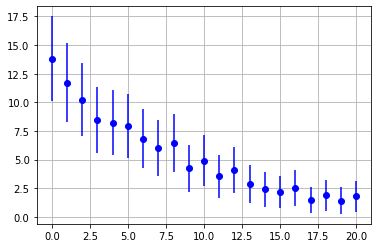

In [75]:
plt.errorbar(x, arr_mse_x.reshape(n,), arr_std_x.reshape(n,), linestyle='None', marker='o', color='b', label='x error')
plt.grid(True)

<ErrorbarContainer object of 3 artists>

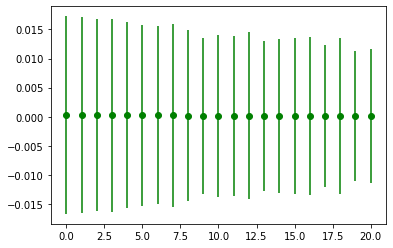

In [76]:
plt.errorbar(x, arr_mse_t.reshape(n,), arr_std_t.reshape(n,), linestyle='None', marker='o', color='g', label='t error')

<ErrorbarContainer object of 3 artists>

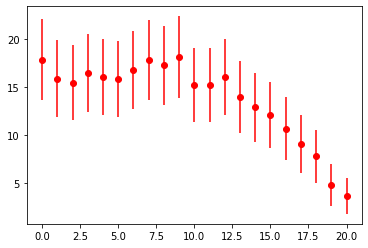

In [77]:
plt.errorbar(x, arr_mse_z.reshape(n,), arr_std_z.reshape(n,), linestyle='None', marker='o', color='r', label='z error')

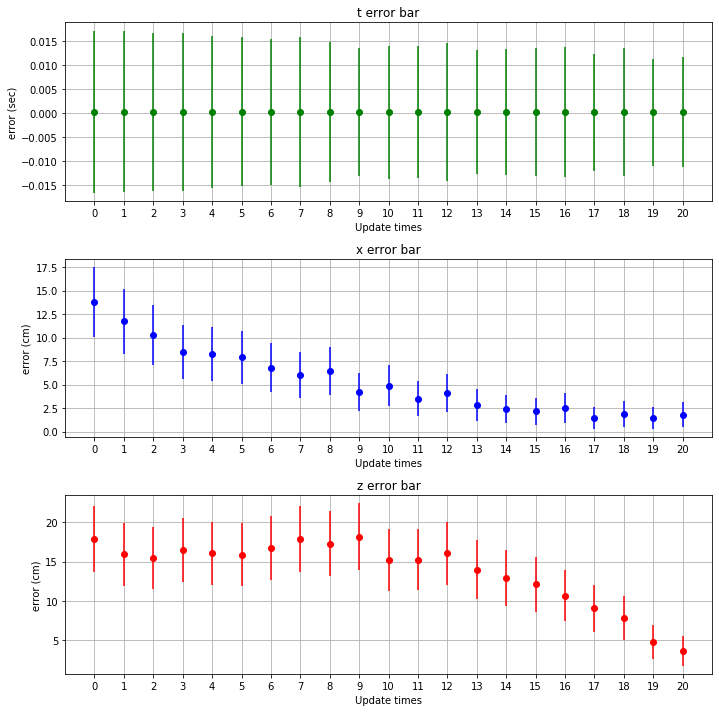

In [78]:
plt.figure(figsize=(10,10))

plt.subplot(3,1,1)
plt.errorbar(x, arr_mse_t.reshape(n,), arr_std_t.reshape(n,), linestyle='None', marker='o', color='g', label='t error')
plt.title('t error bar')
plt.xlabel('Update times')
plt.ylabel('error (sec)')
plt.xticks(np.arange(0,21))
plt.grid(True)

plt.subplot(3,1,2)
plt.errorbar(x, arr_mse_x.reshape(n,), arr_std_x.reshape(n,), linestyle='None', marker='o', color='b', label='x error')
plt.title('x error bar')
plt.xlabel('Update times')
plt.ylabel('error (cm)')
plt.xticks(np.arange(0,21))
plt.grid(True)

plt.subplot(3,1,3)
plt.errorbar(x, arr_mse_z.reshape(n,), arr_std_z.reshape(n,), linestyle='None', marker='o', color='r', label='z error')
plt.title('z error bar')
plt.xlabel('Update times')
plt.ylabel('error (cm)')
plt.xticks(np.arange(0,21))
plt.grid(True)

plt.tight_layout()
#plt.savefig('./fig/with_classification/'+name+'_test_res.png')
#plt.savefig('./fig/with_classification/'+name+'_test_res.svg')

plt.savefig('/home/lab606a/Documents/4Journal_20200629/result/not fixed/'+name+'/with classification/png/'+name+'_test_res.png')
plt.savefig('/home/lab606a/Documents/4Journal_20200629/result/not fixed/'+name+'/with classification/svg/'+name+'_test_res.svg')

In [79]:
arr_for_err_x

array([[-1.30974091, -2.59054516, -1.49994674, ...,  0.05718176,
         0.92118787,  0.01016024],
       [-3.24657841, -1.88176706, -2.12901632, ..., -1.56904159,
        -1.51680344, -1.71080641],
       [ 0.28186821,  0.91288655, -1.86457471, ..., -1.83109847,
        -0.2971994 , -0.26886727],
       ...,
       [-1.33942055, -0.1993588 , -1.59412794, ...,  2.06820908,
        -2.03134962, -1.936071  ],
       [10.19273779,  7.78567415,  5.42933479, ...,  1.13172466,
         1.35410982, -0.13664026],
       [-0.02392855,  1.28167828, -0.38127346, ..., -0.6334069 ,
         0.44927688,  9.76299442]])

229 248
accuray = 92.33870967741935%


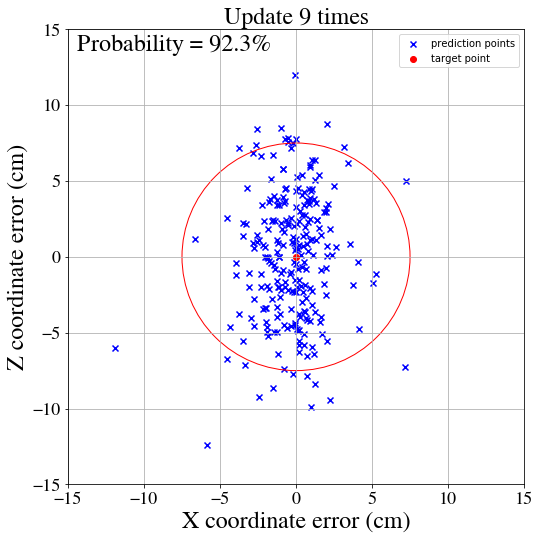

In [80]:
k = 10
up_times = k - 1

correct = 0
for i in range(arr_for_err_x.shape[0]):
    if arr_for_err_x[i,up_times] < 7.5 and arr_for_err_x[i,up_times] > -7.5 and arr_for_err_z[i,up_times] < 7.5 and arr_for_err_z[i,up_times] > -7.5:
        correct += 1
print(correct, arr_for_err_x.shape[0])
print("accuray = {}%".format(correct/arr_for_err_x.shape[0]*100))
aa = np.round_(correct/arr_for_err_x.shape[0]*100, 1)
text = str("Probability = {}%".format(aa))

plt.figure(figsize=(8,8))

x = y = np.arange(-7.5, 7.5, 0.005)
x, y = np.meshgrid(x,y)
#plt.contour(x, y, x**2 + y**2, [15*15])
circle2 = plt.Circle((0, 0), 7.5, color='r', fill=False, label='paddle edge')

ax = plt.gca()
ax.add_artist(circle2)
ax.set_xlim((-15, 15))
ax.set_ylim((-15, 15))

plt.scatter(cp.asnumpy(arr_for_err_x[:,up_times]), cp.asnumpy(arr_for_err_z[:,up_times]), edgecolors='b', label='prediction points', marker='x', color='b')
plt.scatter(0,0, color='r', marker='o', label='target point')
plt.Circle((0,0), 7.5, color='r', fill=False)

plt.xlabel('X coordinate error (cm)', fontsize=24, fontname='FreeSerif')
plt.ylabel('Z coordinate error (cm)', fontsize=24, fontname='FreeSerif')
plt.xticks(fontsize=18, fontname='FreeSerif')
plt.yticks(fontsize=18, fontname='FreeSerif')

title_name = 'Update ' + str(up_times) + ' times'
plt.title(title_name, fontsize=24, fontname='FreeSerif')
plt.text(-8,14,text, fontsize=24, fontname='FreeSerif', horizontalalignment='center', verticalalignment='center')

plt.tight_layout(pad=2.5)
plt.grid(True)
plt.legend(loc='upper right')
#plt.savefig('./fig/update_' + str(up_times) + '_times.png')

224 248
accuray = 90.32258064516128%
216 248
accuray = 87.09677419354838%
223 248
accuray = 89.91935483870968%
226 248
accuray = 91.12903225806451%
226 248
accuray = 91.12903225806451%
224 248
accuray = 90.32258064516128%
229 248
accuray = 92.33870967741935%
224 248
accuray = 90.32258064516128%
227 248
accuray = 91.53225806451613%
222 248
accuray = 89.51612903225806%
233 248
accuray = 93.95161290322581%
231 248
accuray = 93.14516129032258%
227 248
accuray = 91.53225806451613%
236 248
accuray = 95.16129032258065%
240 248
accuray = 96.7741935483871%
235 248
accuray = 94.75806451612904%
235 248
accuray = 94.75806451612904%
242 248
accuray = 97.58064516129032%
244 248
accuray = 98.38709677419355%
246 248
accuray = 99.19354838709677%
244 248
accuray = 98.38709677419355%


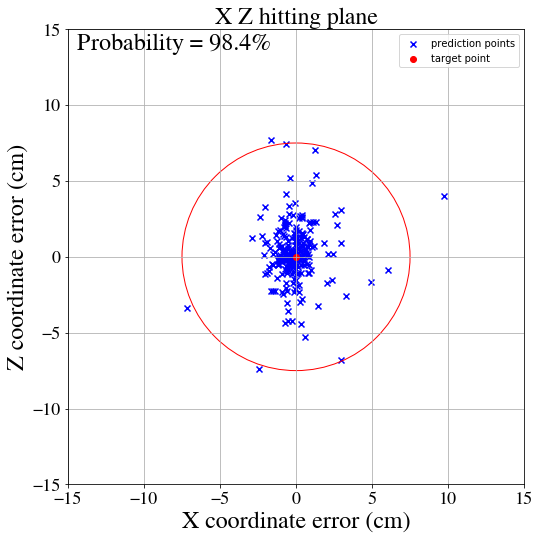

In [81]:
import math
up_times = 0

correct = 0
for i in range(arr_for_err_x.shape[0]):
    if arr_for_err_x[i,up_times] < 7.5 and arr_for_err_x[i,up_times] > -7.5 and arr_for_err_z[i,up_times] < 7.5 and arr_for_err_z[i,up_times] > -7.5:
        correct += 1
print(correct, arr_for_err_x.shape[0])
print("accuray = {}%".format(correct/arr_for_err_x.shape[0]*100))
aa = np.round_(correct/arr_for_err_x.shape[0]*100, 1)
text = str("Probability = {}%".format(aa))

plt.figure(figsize=(8,8))

x = y = np.arange(-7.5, 7.5, 0.005)
x, y = np.meshgrid(x,y)
#plt.contour(x, y, x**2 + y**2, [15*15])
circle2 = plt.Circle((0, 0), 7.5, color='r', fill=False, label='paddle edge')

ax = plt.gca()
ax.add_artist(circle2)
ax.set_xlim((-15, 15))
ax.set_ylim((-15, 15))

plt.scatter(cp.asnumpy(arr_for_err_x[:,up_times]), cp.asnumpy(arr_for_err_z[:,up_times]), edgecolors='b', label='prediction points', marker='x', color='b')
plt.scatter(0,0, color='r', marker='o', label='target point')
plt.Circle((0,0), 7.5, color='r', fill=False)

plt.xlabel('X coordinate error (cm)', fontsize=24, fontname='FreeSerif')
plt.ylabel('Z coordinate error (cm)', fontsize=24, fontname='FreeSerif')
plt.xticks(fontsize=18, fontname='FreeSerif')
plt.yticks(fontsize=18, fontname='FreeSerif')
plt.title('X Z hitting plane', fontsize=24, fontname='FreeSerif')
plt.text(-8,14,text, fontsize=24, fontname='FreeSerif', horizontalalignment='center', verticalalignment='center')

plt.tight_layout(pad=2.5)
plt.grid(True)
plt.legend(loc='upper right')
#plt.savefig('./fig/with_classification/update_' + str(up_times) + '_times_with_classification.png')
#plt.savefig('./fig/with_classification/update_' + str(up_times) + '_times_with_classification.svg')

for up_times in range(1,n,1):
    plt.clf()
    #plt.figure(figsize=(8,8))
    '''
    ax = plt.gca()
    ax.add_artist(circle2)
    ax.set_xlim((-15, 15))
    ax.set_ylim((-15, 15))
    '''
    
    circle2 = plt.Circle((0, 0), 7.5, color='r', fill=False, label='paddle edge')
    ax = plt.gca()
    ax.add_artist(circle2)
    
    correct = 0
    for i in range(arr_for_err_x.shape[0]):
        d = math.sqrt(arr_for_err_x[i,up_times]**2+arr_for_err_z[i,up_times]**2)
        if d <= 7.5:
            correct += 1
    print(correct, arr_for_err_x.shape[0])
    print("accuray = {}%".format(correct/arr_for_err_x.shape[0]*100))
    aa = np.round_(correct/arr_for_err_x.shape[0]*100, 1)
    text = str("Probability = {}%".format(aa))
    
    plt.scatter(cp.asnumpy(arr_for_err_x[:,up_times]), cp.asnumpy(arr_for_err_z[:,up_times]), edgecolors='b', label='prediction points', marker='x', color='b')
    plt.scatter(0,0, color='r', marker='o', label='target point')
    plt.Circle((0,0), 7.5, color='r', fill=False)

    plt.xlabel('X coordinate error (cm)', fontsize=24, fontname='FreeSerif')
    plt.ylabel('Z coordinate error (cm)', fontsize=24, fontname='FreeSerif')
    plt.xticks(fontsize=18, fontname='FreeSerif')
    plt.yticks(fontsize=18, fontname='FreeSerif')
    plt.title('X Z hitting plane', fontsize=24, fontname='FreeSerif')
    plt.text(-8,14,text, fontsize=24, fontname='FreeSerif', horizontalalignment='center', verticalalignment='center')

    plt.xlim(-15,15)
    plt.ylim(-15,15)
    
    plt.tight_layout(pad=2.5)
    plt.grid(True)
    plt.legend(loc='upper right')
    #plt.savefig('./fig/with_classification/update_' + str(up_times) + '_times_with_classification.png')
    #plt.savefig('./fig/with_classification/update_' + str(up_times) + '_times_with_classification.svg')
    
    plt.savefig('/home/lab606a/Documents/4Journal_20200629/result/not fixed/'+name+'/with classification/png/update_'+str(up_times) + '_times_without_classification.png')
    plt.savefig('/home/lab606a/Documents/4Journal_20200629/result/not fixed/'+name+'/with classification/svg/update_'+str(up_times) + '_times_without_classification.svg')
    

In [82]:
errbar = [arr_mse_t, arr_mse_x, arr_mse_z, arr_std_t, arr_std_x, arr_std_z]
errbar = np.array(errbar)
errbar

array([[[ 0.00029423,  0.0002859 ,  0.00027065,  0.00027429,
          0.00025415,  0.00024234,  0.00023308,  0.0002469 ,
          0.00021421,  0.00018289,  0.00019384,  0.00019017,
          0.00021228,  0.00017156,  0.00018288,  0.00018818,
          0.00019274,  0.0001528 ,  0.00018651,  0.00012781,
          0.00013515]],

       [[13.81121148, 11.72815401, 10.24593197,  8.46607538,
          8.22860687,  7.90912202,  6.81977469,  6.00885249,
          6.45145993,  4.24034118,  4.91224013,  3.52816062,
          4.09381232,  2.84595875,  2.40635275,  2.1738608 ,
          2.51341734,  1.47356976,  1.88988372,  1.41844475,
          1.7932564 ]],

       [[17.86643878, 15.90532511, 15.48904493, 16.47079115,
         16.06483029, 15.88171299, 16.77031909, 17.85084703,
         17.28705897, 18.16472198, 15.2097438 , 15.22642067,
         16.04573673, 13.98699762, 12.88616115, 12.08537128,
         10.66200915,  9.06737568,  7.7697385 ,  4.75829513,
          3.63402788]],

       [[ 

In [83]:
errbar = errbar.reshape(6,21)
errbar

array([[ 0.00029423,  0.0002859 ,  0.00027065,  0.00027429,  0.00025415,
         0.00024234,  0.00023308,  0.0002469 ,  0.00021421,  0.00018289,
         0.00019384,  0.00019017,  0.00021228,  0.00017156,  0.00018288,
         0.00018818,  0.00019274,  0.0001528 ,  0.00018651,  0.00012781,
         0.00013515],
       [13.81121148, 11.72815401, 10.24593197,  8.46607538,  8.22860687,
         7.90912202,  6.81977469,  6.00885249,  6.45145993,  4.24034118,
         4.91224013,  3.52816062,  4.09381232,  2.84595875,  2.40635275,
         2.1738608 ,  2.51341734,  1.47356976,  1.88988372,  1.41844475,
         1.7932564 ],
       [17.86643878, 15.90532511, 15.48904493, 16.47079115, 16.06483029,
        15.88171299, 16.77031909, 17.85084703, 17.28705897, 18.16472198,
        15.2097438 , 15.22642067, 16.04573673, 13.98699762, 12.88616115,
        12.08537128, 10.66200915,  9.06737568,  7.7697385 ,  4.75829513,
         3.63402788],
       [ 0.01695482,  0.0167974 ,  0.01643394,  0.01655949

In [84]:
#errbar = errbar.reshape(21,6)
df = pd.DataFrame(data=errbar)

#p = '/home/lab606a/Documents/comp/with classification/with_classification.csv'
p = '/home/lab606a/Documents/4Journal_20200629/result/not fixed/'+name+'/with classification/with_classification.csv'

df.to_csv(p, index=False)